In [1]:
# 설치

!pip install catboost
!pip install ipywidgets
!jupyter nbextension enable --py widgetsnbextension
!pip install imblearn
!pip install shap
!pip install lightgbm

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: ok


In [53]:
# 라이브러리

from catboost import CatBoostClassifier, Pool
import lightgbm
from lightgbm import LGBMClassifier
from lightgbm import plot_importance
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from imblearn.combine import SMOTEENN
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import learning_curve, validation_curve
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import f1_score, roc_auc_score
from sklearn.metrics import make_scorer
from sklearn.metrics import roc_curve
from sklearn.model_selection import GridSearchCV
from catboost.utils import get_roc_curve
import joblib 
import shap

## 1. Data Preprocessing 

In [3]:
data = pd.read_csv("C://Users//leeso//Desktop//CATBOOST_MODELING//real_final_201806_11.csv", encoding='cp949')

In [4]:
data = data.drop(['JOIN_KEY'], axis=1)

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23133 entries, 0 to 23132
Data columns (total 48 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   GENDER          23133 non-null  int64  
 1   AGE             23133 non-null  int64  
 2   LN_AMT_SUM      23133 non-null  int64  
 3   LN_AMT_AVG      23133 non-null  float64
 4   LN_AMT_AVG_INC  23133 non-null  float64
 5   LN_CD_2_0       23133 non-null  int64  
 6   LN_CD_2_100     23133 non-null  int64  
 7   LN_CD_2_150     23133 non-null  int64  
 8   LN_CD_2_170     23133 non-null  int64  
 9   LN_CD_2_200     23133 non-null  int64  
 10  LN_CD_2_210     23133 non-null  int64  
 11  LN_CD_2_220     23133 non-null  int64  
 12  LN_CD_2_230     23133 non-null  int64  
 13  LN_CD_2_240     23133 non-null  int64  
 14  LN_CD_2_245     23133 non-null  int64  
 15  LN_CD_2_250     23133 non-null  int64  
 16  LN_CD_2_270     23133 non-null  int64  
 17  LN_CD_2_271     23133 non-null 

In [6]:
data.head()

,GENDER,AGE,LN_AMT_SUM,LN_AMT_AVG,LN_AMT_AVG_INC,LN_CD_2_0,LN_CD_2_100,LN_CD_2_150,LN_CD_2_170,LN_CD_2_200,...,INT_BENCH,INT_COFIX,CSI,CPI,LAI,M2,UNEMP_RATE,SALES_PRICE,GDP,DLQ_YN
0,2,62,84000,14000.000000,0.000000,0,0,0,0,0,...,1.541667,1.898333,100.85,104.788333,-13,114399.0333,3.616667,96.131833,1725373.4,0
1,1,22,25800,4300.000000,0.000000,0,0,0,0,0,...,1.541667,1.898333,100.85,104.788333,-13,114399.0333,3.616667,96.131833,1725373.4,0
2,1,79,378000,31500.000000,0.000000,0,1,0,0,0,...,1.541667,1.898333,100.85,104.788333,-13,114399.0333,3.616667,96.131833,1725373.4,0
3,1,33,58200,9700.000000,0.000000,0,0,0,0,0,...,1.541667,1.898333,100.85,104.788333,-13,114399.0333,3.616667,96.131833,1725373.4,0
4,2,35,72060,2598.694445,-76.555556,4,0,0,0,1,...,1.541667,1.898333,100.85,104.788333,-13,114399.0333,3.616667,96.131833,1725373.4,0


In [7]:
print(data.shape)

(23133, 48)


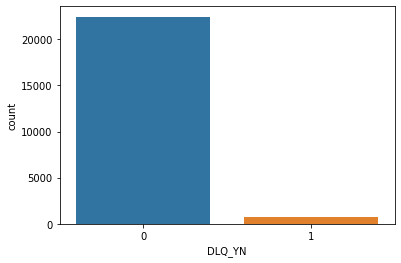

In [8]:
sns.countplot(x = 'DLQ_YN', data=data)
plt.show()

In [9]:
data.describe()

,GENDER,AGE,LN_AMT_SUM,LN_AMT_AVG,LN_AMT_AVG_INC,LN_CD_2_0,LN_CD_2_100,LN_CD_2_150,LN_CD_2_170,LN_CD_2_200,...,INT_BENCH,INT_COFIX,CSI,CPI,LAI,M2,UNEMP_RATE,SALES_PRICE,GDP,DLQ_YN
count,23133.000000,23133.000000,2.313300e+04,2.313300e+04,23133.000000,23133.000000,23133.000000,23133.000000,23133.000000,23133.000000,...,2.313300e+04,2.313300e+04,2.313300e+04,2.313300e+04,23133.0,2.313300e+04,2.313300e+04,2.313300e+04,2.313300e+04,23133.000000
mean,1.425021,47.478062,4.838986e+05,3.872461e+04,174.958364,0.697791,0.708685,0.073834,0.000821,0.071024,...,1.541667e+00,1.898333e+00,1.008500e+02,1.047883e+02,-13.0,1.143990e+05,3.616667e+00,9.613183e+01,1.725373e+06,0.030995
std,0.494357,13.709411,7.250609e+05,6.362175e+04,4739.113419,1.407753,0.874342,0.289738,0.030119,0.271436,...,4.274451e-13,7.103360e-13,4.388407e-11,2.579326e-11,0.0,3.846154e-08,1.893637e-12,6.053955e-12,7.532234e-07,0.173307
min,1.000000,20.000000,6.000000e+01,1.000000e+01,-136450.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.541667e+00,1.898333e+00,1.008500e+02,1.047883e+02,-13.0,1.143990e+05,3.616667e+00,9.613183e+01,1.725373e+06,0.000000
25%,1.000000,37.000000,6.600000e+04,6.150000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.541667e+00,1.898333e+00,1.008500e+02,1.047883e+02,-13.0,1.143990e+05,3.616667e+00,9.613183e+01,1.725373e+06,0.000000
50%,1.000000,47.000000,2.040000e+05,1.679028e+04,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,1.541667e+00,1.898333e+00,1.008500e+02,1.047883e+02,-13.0,1.143990e+05,3.616667e+00,9.613183e+01,1.725373e+06,0.000000
75%,2.000000,57.000000,6.120000e+05,4.800000e+04,34.920635,1.000000,1.000000,0.000000,0.000000,0.000000,...,1.541667e+00,1.898333e+00,1.008500e+02,1.047883e+02,-13.0,1.143990e+05,3.616667e+00,9.613183e+01,1.725373e+06,0.000000
max,2.000000,84.000000,1.216860e+07,1.900000e+06,133333.333300,22.000000,14.000000,4.000000,2.000000,4.000000,...,1.541667e+00,1.898333e+00,1.008500e+02,1.047883e+02,-13.0,1.143990e+05,3.616667e+00,9.613183e+01,1.725373e+06,1.000000


In [10]:
X = data.drop(['DLQ_YN'], axis=1)
y = data['DLQ_YN']

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [12]:
X_train.shape

(18506, 47)

In [13]:
X_test.shape

(4627, 47)

## 2. SMOTEENN

In [17]:
r1 = X_train.shape[0] ; r2  = X_test.shape[0]
c1 = X_train.shape[1]; c2 = X_test.shape[1]
print("Train Data has {0} number of rows and {1} of columns".format(r1,c1))
print("Test Data has {0} number of rows and {1} of columns".format(r2,c2))

Train Data has 18506 number of rows and 47 of columns
Test Data has 4627 number of rows and 47 of columns


In [18]:
smote = SMOTEENN(random_state=0)
X_train_over, y_train_over = smote.fit_resample(X_train, y_train)

print('SMOTE 적용 전 학습용 피처/레이블 데이터 세트: ', X_train.shape, y_train.shape)
print('SMOTE 적용 전 레이블 값 분포: \n', pd.Series(y_train).value_counts())

print('SMOTE 적용 후 학습용 피처/레이블 데이터 세트: ', X_train_over.shape, y_train_over.shape)
print('SMOTE 적용 후 레이블 값 분포: \n', pd.Series(y_train_over).value_counts())

SMOTE 적용 전 학습용 피처/레이블 데이터 세트:  (18506, 47) (18506,)
SMOTE 적용 전 레이블 값 분포: 
 0    17941
1      565
Name: DLQ_YN, dtype: int64
SMOTE 적용 후 학습용 피처/레이블 데이터 세트:  (27667, 47) (27667,)
SMOTE 적용 후 레이블 값 분포: 
 1    14565
0    13102
Name: DLQ_YN, dtype: int64


In [19]:
y_train_over

0        0
1        0
2        0
3        0
4        0
        ..
27662    1
27663    1
27664    1
27665    1
27666    1
Name: DLQ_YN, Length: 27667, dtype: int64

In [20]:
X_train_over

,GENDER,AGE,LN_AMT_SUM,LN_AMT_AVG,LN_AMT_AVG_INC,LN_CD_2_0,LN_CD_2_100,LN_CD_2_150,LN_CD_2_170,LN_CD_2_200,...,INT_GOV,INT_BENCH,INT_COFIX,CSI,CPI,LAI,M2,UNEMP_RATE,SALES_PRICE,GDP
0,2,40,321600,17866.666670,0.000000,0,1,0,0,0,...,2.000333,1.541667,1.898333,100.85,104.788333,-13,114399.0333,3.616667,96.131833,1725373.4
1,1,47,66000,11000.000000,0.000000,0,0,0,0,0,...,2.000333,1.541667,1.898333,100.85,104.788333,-13,114399.0333,3.616667,96.131833,1725373.4
2,1,56,900000,150000.000000,0.000000,0,0,0,0,0,...,2.000333,1.541667,1.898333,100.85,104.788333,-13,114399.0333,3.616667,96.131833,1725373.4
3,1,56,600000,100000.000000,0.000000,0,1,0,0,0,...,2.000333,1.541667,1.898333,100.85,104.788333,-13,114399.0333,3.616667,96.131833,1725373.4
4,1,60,120000,20000.000000,0.000000,0,1,0,0,0,...,2.000333,1.541667,1.898333,100.85,104.788333,-13,114399.0333,3.616667,96.131833,1725373.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27662,2,50,56385,8215.439608,0.000000,1,0,0,0,0,...,2.000333,1.541667,1.898333,100.85,104.788333,-13,114399.0333,3.616667,96.131833,1725373.4
27663,1,68,92297,6528.134176,203.669373,1,1,0,0,0,...,2.000333,1.541667,1.898333,100.85,104.788333,-13,114399.0333,3.616667,96.131833,1725373.4
27664,1,42,574868,38976.646888,2049.530191,0,0,0,0,0,...,2.000333,1.541667,1.898333,100.85,104.788333,-13,114399.0333,3.616667,96.131833,1725373.4
27665,1,42,7426,1237.764081,0.000000,0,1,0,0,0,...,2.000333,1.541667,1.898333,100.85,104.788333,-13,114399.0333,3.616667,96.131833,1725373.4


In [21]:
X_train_over.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27667 entries, 0 to 27666
Data columns (total 47 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   GENDER          27667 non-null  int64  
 1   AGE             27667 non-null  int64  
 2   LN_AMT_SUM      27667 non-null  int64  
 3   LN_AMT_AVG      27667 non-null  float64
 4   LN_AMT_AVG_INC  27667 non-null  float64
 5   LN_CD_2_0       27667 non-null  int64  
 6   LN_CD_2_100     27667 non-null  int64  
 7   LN_CD_2_150     27667 non-null  int64  
 8   LN_CD_2_170     27667 non-null  int64  
 9   LN_CD_2_200     27667 non-null  int64  
 10  LN_CD_2_210     27667 non-null  int64  
 11  LN_CD_2_220     27667 non-null  int64  
 12  LN_CD_2_230     27667 non-null  int64  
 13  LN_CD_2_240     27667 non-null  int64  
 14  LN_CD_2_245     27667 non-null  int64  
 15  LN_CD_2_250     27667 non-null  int64  
 16  LN_CD_2_270     27667 non-null  int64  
 17  LN_CD_2_271     27667 non-null 

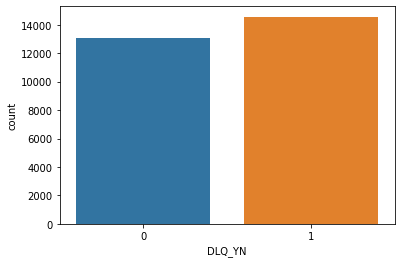

In [22]:
df = pd.DataFrame(y_train_over)
sns.countplot(x = 'DLQ_YN', data=df)
plt.show()

## 3. Catboost Modeling, LightGBM Modeling

### 1) Catboost Modeling

In [26]:
CatBoost_clf = CatBoostClassifier(
    custom_loss=['Logloss']
)

parameters = {
    'learning_rate': [0.001, 0.05, 0.1, 0.3],
    'depth':[3, 6, 9, 10],
    'iterations':[100, 250, 500, 1000],
}  

#### GridSearchCV

In [29]:
# refit=True : GridSearch한 후 가장 최고로 좋은 파라미터로 모델을 학습시켜 놓겠다 -> GridSearchCV 적용한 객체만으로 최적의 파라미터 적용된 모델로드 가능
# cv = 5 : train data를 5개의 train, vailation set fold 로 나누어서 param_grid의 하이퍼 파라미터 경우의 수를 적용해가면서 검증 수행  

grid_CatBoost = GridSearchCV(CatBoost_clf, param_grid=parameters, cv=5, refit=True, return_train_score=True)

#param_grid의 하이퍼 파라미터들을 순차적으로 학습/평가 .
grid_CatBoost.fit(X_train_over,y_train_over)

# GridSearchCV 결과는 cv_results_ 라는 딕셔너리로 저장됨. 이를 DataFrame으로 변환
grid_catboost_results = pd.DataFrame(grid_CatBoost.cv_results_)
grid_catboost_results.T.to_csv('grid_search.cv_results_.csv') # csv로 결과 저장

0:	learn: 0.6925137	total: 9.02ms	remaining: 893ms
1:	learn: 0.6918491	total: 18ms	remaining: 882ms
2:	learn: 0.6911471	total: 26.2ms	remaining: 849ms
3:	learn: 0.6905303	total: 34.5ms	remaining: 828ms
4:	learn: 0.6899095	total: 42.4ms	remaining: 806ms
5:	learn: 0.6893101	total: 50.2ms	remaining: 787ms
6:	learn: 0.6887048	total: 58.4ms	remaining: 775ms
7:	learn: 0.6880111	total: 67.2ms	remaining: 773ms
8:	learn: 0.6873666	total: 75ms	remaining: 758ms
9:	learn: 0.6868297	total: 84ms	remaining: 756ms
10:	learn: 0.6862251	total: 91.8ms	remaining: 743ms
11:	learn: 0.6855730	total: 99.7ms	remaining: 731ms
12:	learn: 0.6848991	total: 108ms	remaining: 720ms
13:	learn: 0.6843665	total: 116ms	remaining: 716ms
14:	learn: 0.6837451	total: 124ms	remaining: 704ms
15:	learn: 0.6831039	total: 132ms	remaining: 694ms
16:	learn: 0.6824798	total: 140ms	remaining: 682ms
17:	learn: 0.6818717	total: 148ms	remaining: 675ms
18:	learn: 0.6812502	total: 156ms	remaining: 664ms
19:	learn: 0.6805818	total: 164ms	r

64:	learn: 0.6550753	total: 626ms	remaining: 337ms
65:	learn: 0.6545502	total: 635ms	remaining: 327ms
66:	learn: 0.6540429	total: 647ms	remaining: 319ms
67:	learn: 0.6534726	total: 658ms	remaining: 310ms
68:	learn: 0.6530159	total: 669ms	remaining: 300ms
69:	learn: 0.6524738	total: 678ms	remaining: 291ms
70:	learn: 0.6520221	total: 688ms	remaining: 281ms
71:	learn: 0.6514863	total: 697ms	remaining: 271ms
72:	learn: 0.6509774	total: 705ms	remaining: 261ms
73:	learn: 0.6504238	total: 714ms	remaining: 251ms
74:	learn: 0.6499761	total: 723ms	remaining: 241ms
75:	learn: 0.6494525	total: 731ms	remaining: 231ms
76:	learn: 0.6489294	total: 740ms	remaining: 221ms
77:	learn: 0.6483720	total: 749ms	remaining: 211ms
78:	learn: 0.6478158	total: 759ms	remaining: 202ms
79:	learn: 0.6473353	total: 768ms	remaining: 192ms
80:	learn: 0.6468986	total: 777ms	remaining: 182ms
81:	learn: 0.6464629	total: 787ms	remaining: 173ms
82:	learn: 0.6459195	total: 796ms	remaining: 163ms
83:	learn: 0.6454776	total: 807

41:	learn: 0.6684311	total: 384ms	remaining: 531ms
42:	learn: 0.6678779	total: 394ms	remaining: 523ms
43:	learn: 0.6673033	total: 406ms	remaining: 517ms
44:	learn: 0.6667468	total: 416ms	remaining: 509ms
45:	learn: 0.6661662	total: 426ms	remaining: 500ms
46:	learn: 0.6655687	total: 435ms	remaining: 490ms
47:	learn: 0.6650019	total: 444ms	remaining: 481ms
48:	learn: 0.6645332	total: 452ms	remaining: 471ms
49:	learn: 0.6640381	total: 460ms	remaining: 460ms
50:	learn: 0.6635342	total: 470ms	remaining: 451ms
51:	learn: 0.6630468	total: 479ms	remaining: 442ms
52:	learn: 0.6624732	total: 488ms	remaining: 433ms
53:	learn: 0.6619266	total: 497ms	remaining: 424ms
54:	learn: 0.6614179	total: 506ms	remaining: 414ms
55:	learn: 0.6608953	total: 516ms	remaining: 406ms
56:	learn: 0.6603287	total: 525ms	remaining: 396ms
57:	learn: 0.6598686	total: 533ms	remaining: 386ms
58:	learn: 0.6593142	total: 541ms	remaining: 376ms
59:	learn: 0.6587967	total: 549ms	remaining: 366ms
60:	learn: 0.6582402	total: 556

19:	learn: 0.4270059	total: 204ms	remaining: 815ms
20:	learn: 0.4218701	total: 213ms	remaining: 802ms
21:	learn: 0.4170601	total: 224ms	remaining: 796ms
22:	learn: 0.4118975	total: 235ms	remaining: 785ms
23:	learn: 0.4005227	total: 244ms	remaining: 774ms
24:	learn: 0.3958177	total: 254ms	remaining: 763ms
25:	learn: 0.3923885	total: 263ms	remaining: 748ms
26:	learn: 0.3889577	total: 273ms	remaining: 737ms
27:	learn: 0.3854301	total: 282ms	remaining: 726ms
28:	learn: 0.3823363	total: 291ms	remaining: 713ms
29:	learn: 0.3783590	total: 299ms	remaining: 698ms
30:	learn: 0.3745770	total: 306ms	remaining: 681ms
31:	learn: 0.3715190	total: 313ms	remaining: 666ms
32:	learn: 0.3687270	total: 322ms	remaining: 654ms
33:	learn: 0.3659357	total: 331ms	remaining: 642ms
34:	learn: 0.3621798	total: 338ms	remaining: 628ms
35:	learn: 0.3594133	total: 348ms	remaining: 618ms
36:	learn: 0.3568085	total: 356ms	remaining: 606ms
37:	learn: 0.3541298	total: 364ms	remaining: 593ms
38:	learn: 0.3518077	total: 373

85:	learn: 0.2846652	total: 767ms	remaining: 125ms
86:	learn: 0.2840723	total: 776ms	remaining: 116ms
87:	learn: 0.2834705	total: 786ms	remaining: 107ms
88:	learn: 0.2824457	total: 794ms	remaining: 98.2ms
89:	learn: 0.2816428	total: 801ms	remaining: 89ms
90:	learn: 0.2808119	total: 810ms	remaining: 80.1ms
91:	learn: 0.2800993	total: 819ms	remaining: 71.2ms
92:	learn: 0.2790826	total: 826ms	remaining: 62.1ms
93:	learn: 0.2772418	total: 833ms	remaining: 53.2ms
94:	learn: 0.2764538	total: 840ms	remaining: 44.2ms
95:	learn: 0.2758533	total: 848ms	remaining: 35.3ms
96:	learn: 0.2751887	total: 857ms	remaining: 26.5ms
97:	learn: 0.2745311	total: 864ms	remaining: 17.6ms
98:	learn: 0.2713665	total: 872ms	remaining: 8.81ms
99:	learn: 0.2703165	total: 881ms	remaining: 0us
0:	learn: 0.6644692	total: 9.93ms	remaining: 983ms
1:	learn: 0.6386966	total: 19ms	remaining: 931ms
2:	learn: 0.6157815	total: 27.7ms	remaining: 897ms
3:	learn: 0.5976062	total: 36.2ms	remaining: 869ms
4:	learn: 0.5811033	total:

62:	learn: 0.3124214	total: 582ms	remaining: 342ms
63:	learn: 0.3107404	total: 592ms	remaining: 333ms
64:	learn: 0.3077267	total: 602ms	remaining: 324ms
65:	learn: 0.3046289	total: 612ms	remaining: 315ms
66:	learn: 0.3031847	total: 618ms	remaining: 305ms
67:	learn: 0.3021005	total: 627ms	remaining: 295ms
68:	learn: 0.3009077	total: 634ms	remaining: 285ms
69:	learn: 0.2998596	total: 641ms	remaining: 275ms
70:	learn: 0.2983828	total: 651ms	remaining: 266ms
71:	learn: 0.2973241	total: 659ms	remaining: 256ms
72:	learn: 0.2961208	total: 668ms	remaining: 247ms
73:	learn: 0.2953066	total: 679ms	remaining: 238ms
74:	learn: 0.2940771	total: 688ms	remaining: 229ms
75:	learn: 0.2934378	total: 696ms	remaining: 220ms
76:	learn: 0.2921684	total: 705ms	remaining: 210ms
77:	learn: 0.2910971	total: 713ms	remaining: 201ms
78:	learn: 0.2900359	total: 723ms	remaining: 192ms
79:	learn: 0.2893239	total: 731ms	remaining: 183ms
80:	learn: 0.2855597	total: 742ms	remaining: 174ms
81:	learn: 0.2847823	total: 751

25:	learn: 0.3165633	total: 231ms	remaining: 658ms
26:	learn: 0.3137857	total: 242ms	remaining: 654ms
27:	learn: 0.3094339	total: 251ms	remaining: 646ms
28:	learn: 0.3046596	total: 262ms	remaining: 641ms
29:	learn: 0.2986768	total: 271ms	remaining: 633ms
30:	learn: 0.2961767	total: 281ms	remaining: 624ms
31:	learn: 0.2939353	total: 291ms	remaining: 619ms
32:	learn: 0.2913359	total: 304ms	remaining: 617ms
33:	learn: 0.2893551	total: 344ms	remaining: 668ms
34:	learn: 0.2871359	total: 363ms	remaining: 675ms
35:	learn: 0.2854107	total: 380ms	remaining: 675ms
36:	learn: 0.2770363	total: 397ms	remaining: 676ms
37:	learn: 0.2742999	total: 412ms	remaining: 671ms
38:	learn: 0.2725596	total: 427ms	remaining: 668ms
39:	learn: 0.2709441	total: 471ms	remaining: 707ms
40:	learn: 0.2683865	total: 483ms	remaining: 694ms
41:	learn: 0.2666340	total: 492ms	remaining: 680ms
42:	learn: 0.2651142	total: 502ms	remaining: 666ms
43:	learn: 0.2612011	total: 512ms	remaining: 652ms
44:	learn: 0.2597454	total: 522

86:	learn: 0.2255371	total: 986ms	remaining: 147ms
87:	learn: 0.2248117	total: 996ms	remaining: 136ms
88:	learn: 0.2237712	total: 1.01s	remaining: 124ms
89:	learn: 0.2230952	total: 1.02s	remaining: 113ms
90:	learn: 0.2223417	total: 1.03s	remaining: 102ms
91:	learn: 0.2215417	total: 1.04s	remaining: 90.7ms
92:	learn: 0.2206881	total: 1.05s	remaining: 79.3ms
93:	learn: 0.2201614	total: 1.06s	remaining: 68ms
94:	learn: 0.2192047	total: 1.07s	remaining: 56.6ms
95:	learn: 0.2181989	total: 1.1s	remaining: 45.9ms
96:	learn: 0.2178357	total: 1.12s	remaining: 34.7ms
97:	learn: 0.2171523	total: 1.15s	remaining: 23.4ms
98:	learn: 0.2166060	total: 1.22s	remaining: 12.3ms
99:	learn: 0.2158379	total: 1.25s	remaining: 0us
0:	learn: 0.6381429	total: 11.9ms	remaining: 1.18s
1:	learn: 0.5938946	total: 22.6ms	remaining: 1.11s
2:	learn: 0.5608407	total: 34.6ms	remaining: 1.12s
3:	learn: 0.5355679	total: 49.7ms	remaining: 1.19s
4:	learn: 0.5093205	total: 65.6ms	remaining: 1.25s
5:	learn: 0.4912283	total: 8

55:	learn: 0.2533420	total: 597ms	remaining: 469ms
56:	learn: 0.2524023	total: 608ms	remaining: 459ms
57:	learn: 0.2514697	total: 620ms	remaining: 449ms
58:	learn: 0.2505024	total: 631ms	remaining: 439ms
59:	learn: 0.2494344	total: 642ms	remaining: 428ms
60:	learn: 0.2485603	total: 652ms	remaining: 417ms
61:	learn: 0.2470378	total: 663ms	remaining: 406ms
62:	learn: 0.2463710	total: 673ms	remaining: 395ms
63:	learn: 0.2455923	total: 683ms	remaining: 384ms
64:	learn: 0.2440585	total: 694ms	remaining: 374ms
65:	learn: 0.2432359	total: 702ms	remaining: 362ms
66:	learn: 0.2423676	total: 713ms	remaining: 351ms
67:	learn: 0.2416733	total: 726ms	remaining: 342ms
68:	learn: 0.2406916	total: 748ms	remaining: 336ms
69:	learn: 0.2394285	total: 766ms	remaining: 328ms
70:	learn: 0.2387701	total: 779ms	remaining: 318ms
71:	learn: 0.2376890	total: 792ms	remaining: 308ms
72:	learn: 0.2370954	total: 808ms	remaining: 299ms
73:	learn: 0.2364187	total: 821ms	remaining: 288ms
74:	learn: 0.2353983	total: 832

31:	learn: 0.1968028	total: 372ms	remaining: 791ms
32:	learn: 0.1950314	total: 384ms	remaining: 780ms
33:	learn: 0.1921289	total: 395ms	remaining: 766ms
34:	learn: 0.1900073	total: 405ms	remaining: 752ms
35:	learn: 0.1878217	total: 416ms	remaining: 739ms
36:	learn: 0.1856491	total: 427ms	remaining: 727ms
37:	learn: 0.1838571	total: 438ms	remaining: 715ms
38:	learn: 0.1819712	total: 449ms	remaining: 702ms
39:	learn: 0.1804835	total: 461ms	remaining: 691ms
40:	learn: 0.1792884	total: 473ms	remaining: 681ms
41:	learn: 0.1776172	total: 482ms	remaining: 665ms
42:	learn: 0.1756566	total: 493ms	remaining: 654ms
43:	learn: 0.1700269	total: 504ms	remaining: 642ms
44:	learn: 0.1687307	total: 515ms	remaining: 629ms
45:	learn: 0.1670904	total: 527ms	remaining: 618ms
46:	learn: 0.1648509	total: 538ms	remaining: 607ms
47:	learn: 0.1634887	total: 548ms	remaining: 594ms
48:	learn: 0.1617346	total: 561ms	remaining: 583ms
49:	learn: 0.1602756	total: 571ms	remaining: 571ms
50:	learn: 0.1587572	total: 583

1:	learn: 0.4920545	total: 18.9ms	remaining: 925ms
2:	learn: 0.4419603	total: 27.9ms	remaining: 903ms
3:	learn: 0.4131786	total: 37.6ms	remaining: 903ms
4:	learn: 0.3908927	total: 46.5ms	remaining: 884ms
5:	learn: 0.3600799	total: 55.8ms	remaining: 874ms
6:	learn: 0.3292057	total: 65.2ms	remaining: 867ms
7:	learn: 0.3200598	total: 73.7ms	remaining: 848ms
8:	learn: 0.3093799	total: 82.7ms	remaining: 836ms
9:	learn: 0.2981381	total: 92.8ms	remaining: 835ms
10:	learn: 0.2919600	total: 102ms	remaining: 827ms
11:	learn: 0.2854830	total: 111ms	remaining: 813ms
12:	learn: 0.2807720	total: 121ms	remaining: 813ms
13:	learn: 0.2760276	total: 129ms	remaining: 795ms
14:	learn: 0.2697156	total: 140ms	remaining: 795ms
15:	learn: 0.2653934	total: 150ms	remaining: 785ms
16:	learn: 0.2591539	total: 160ms	remaining: 783ms
17:	learn: 0.2555572	total: 170ms	remaining: 776ms
18:	learn: 0.2507967	total: 179ms	remaining: 763ms
19:	learn: 0.2483301	total: 190ms	remaining: 760ms
20:	learn: 0.2464869	total: 199

62:	learn: 0.1648092	total: 921ms	remaining: 541ms
63:	learn: 0.1636044	total: 931ms	remaining: 524ms
64:	learn: 0.1625639	total: 941ms	remaining: 507ms
65:	learn: 0.1612260	total: 949ms	remaining: 489ms
66:	learn: 0.1607105	total: 959ms	remaining: 472ms
67:	learn: 0.1594681	total: 969ms	remaining: 456ms
68:	learn: 0.1581872	total: 977ms	remaining: 439ms
69:	learn: 0.1570689	total: 988ms	remaining: 423ms
70:	learn: 0.1560119	total: 996ms	remaining: 407ms
71:	learn: 0.1542652	total: 1.01s	remaining: 391ms
72:	learn: 0.1535363	total: 1.02s	remaining: 376ms
73:	learn: 0.1523569	total: 1.03s	remaining: 361ms
74:	learn: 0.1517118	total: 1.04s	remaining: 346ms
75:	learn: 0.1506198	total: 1.05s	remaining: 331ms
76:	learn: 0.1496196	total: 1.06s	remaining: 316ms
77:	learn: 0.1485592	total: 1.07s	remaining: 301ms
78:	learn: 0.1480416	total: 1.08s	remaining: 286ms
79:	learn: 0.1475246	total: 1.09s	remaining: 272ms
80:	learn: 0.1469106	total: 1.1s	remaining: 257ms
81:	learn: 0.1460150	total: 1.11

36:	learn: 0.6699652	total: 590ms	remaining: 3.4s
37:	learn: 0.6694034	total: 602ms	remaining: 3.36s
38:	learn: 0.6689147	total: 614ms	remaining: 3.32s
39:	learn: 0.6683619	total: 628ms	remaining: 3.3s
40:	learn: 0.6678561	total: 639ms	remaining: 3.26s
41:	learn: 0.6672760	total: 651ms	remaining: 3.22s
42:	learn: 0.6666421	total: 665ms	remaining: 3.2s
43:	learn: 0.6661427	total: 691ms	remaining: 3.23s
44:	learn: 0.6655475	total: 712ms	remaining: 3.24s
45:	learn: 0.6649576	total: 742ms	remaining: 3.29s
46:	learn: 0.6644607	total: 757ms	remaining: 3.27s
47:	learn: 0.6638341	total: 773ms	remaining: 3.25s
48:	learn: 0.6632515	total: 783ms	remaining: 3.21s
49:	learn: 0.6626702	total: 795ms	remaining: 3.18s
50:	learn: 0.6621033	total: 806ms	remaining: 3.14s
51:	learn: 0.6614910	total: 816ms	remaining: 3.11s
52:	learn: 0.6609221	total: 828ms	remaining: 3.08s
53:	learn: 0.6604308	total: 838ms	remaining: 3.04s
54:	learn: 0.6599282	total: 848ms	remaining: 3.01s
55:	learn: 0.6593143	total: 858ms	

212:	learn: 0.5881064	total: 2.5s	remaining: 435ms
213:	learn: 0.5877335	total: 2.51s	remaining: 423ms
214:	learn: 0.5873238	total: 2.52s	remaining: 411ms
215:	learn: 0.5869755	total: 2.53s	remaining: 399ms
216:	learn: 0.5866259	total: 2.54s	remaining: 387ms
217:	learn: 0.5862500	total: 2.55s	remaining: 375ms
218:	learn: 0.5858787	total: 2.57s	remaining: 363ms
219:	learn: 0.5854611	total: 2.58s	remaining: 352ms
220:	learn: 0.5850414	total: 2.6s	remaining: 341ms
221:	learn: 0.5846936	total: 2.61s	remaining: 329ms
222:	learn: 0.5843451	total: 2.63s	remaining: 318ms
223:	learn: 0.5839670	total: 2.64s	remaining: 306ms
224:	learn: 0.5836238	total: 2.65s	remaining: 294ms
225:	learn: 0.5832406	total: 2.66s	remaining: 282ms
226:	learn: 0.5828735	total: 2.67s	remaining: 271ms
227:	learn: 0.5825320	total: 2.68s	remaining: 259ms
228:	learn: 0.5822224	total: 2.69s	remaining: 247ms
229:	learn: 0.5818854	total: 2.71s	remaining: 235ms
230:	learn: 0.5815482	total: 2.72s	remaining: 224ms
231:	learn: 0.

134:	learn: 0.6221467	total: 1.4s	remaining: 1.19s
135:	learn: 0.6216939	total: 1.41s	remaining: 1.18s
136:	learn: 0.6212992	total: 1.42s	remaining: 1.17s
137:	learn: 0.6208132	total: 1.43s	remaining: 1.16s
138:	learn: 0.6204083	total: 1.44s	remaining: 1.15s
139:	learn: 0.6199639	total: 1.45s	remaining: 1.14s
140:	learn: 0.6195497	total: 1.46s	remaining: 1.13s
141:	learn: 0.6190704	total: 1.48s	remaining: 1.12s
142:	learn: 0.6186277	total: 1.49s	remaining: 1.11s
143:	learn: 0.6181552	total: 1.5s	remaining: 1.1s
144:	learn: 0.6177325	total: 1.51s	remaining: 1.1s
145:	learn: 0.6172873	total: 1.52s	remaining: 1.08s
146:	learn: 0.6168436	total: 1.53s	remaining: 1.07s
147:	learn: 0.6164259	total: 1.54s	remaining: 1.06s
148:	learn: 0.6160114	total: 1.56s	remaining: 1.05s
149:	learn: 0.6155987	total: 1.56s	remaining: 1.04s
150:	learn: 0.6152224	total: 1.58s	remaining: 1.03s
151:	learn: 0.6147863	total: 1.59s	remaining: 1.03s
152:	learn: 0.6143447	total: 1.6s	remaining: 1.02s
153:	learn: 0.613

64:	learn: 0.6556149	total: 585ms	remaining: 1.67s
65:	learn: 0.6551607	total: 595ms	remaining: 1.66s
66:	learn: 0.6545789	total: 605ms	remaining: 1.65s
67:	learn: 0.6541252	total: 615ms	remaining: 1.65s
68:	learn: 0.6535338	total: 625ms	remaining: 1.64s
69:	learn: 0.6529570	total: 634ms	remaining: 1.63s
70:	learn: 0.6524135	total: 643ms	remaining: 1.62s
71:	learn: 0.6518393	total: 652ms	remaining: 1.61s
72:	learn: 0.6513145	total: 662ms	remaining: 1.6s
73:	learn: 0.6508001	total: 670ms	remaining: 1.59s
74:	learn: 0.6503152	total: 680ms	remaining: 1.58s
75:	learn: 0.6498269	total: 688ms	remaining: 1.57s
76:	learn: 0.6492632	total: 698ms	remaining: 1.57s
77:	learn: 0.6487919	total: 708ms	remaining: 1.56s
78:	learn: 0.6483528	total: 717ms	remaining: 1.55s
79:	learn: 0.6478585	total: 727ms	remaining: 1.54s
80:	learn: 0.6474232	total: 735ms	remaining: 1.53s
81:	learn: 0.6469831	total: 746ms	remaining: 1.53s
82:	learn: 0.6464264	total: 756ms	remaining: 1.52s
83:	learn: 0.6459003	total: 771m

229:	learn: 0.5851925	total: 2.12s	remaining: 184ms
230:	learn: 0.5848310	total: 2.12s	remaining: 175ms
231:	learn: 0.5844580	total: 2.13s	remaining: 166ms
232:	learn: 0.5840479	total: 2.14s	remaining: 156ms
233:	learn: 0.5836419	total: 2.15s	remaining: 147ms
234:	learn: 0.5833241	total: 2.16s	remaining: 138ms
235:	learn: 0.5829196	total: 2.17s	remaining: 129ms
236:	learn: 0.5826019	total: 2.18s	remaining: 120ms
237:	learn: 0.5821994	total: 2.19s	remaining: 111ms
238:	learn: 0.5817953	total: 2.2s	remaining: 101ms
239:	learn: 0.5815057	total: 2.21s	remaining: 92.1ms
240:	learn: 0.5811941	total: 2.22s	remaining: 82.8ms
241:	learn: 0.5808455	total: 2.23s	remaining: 73.6ms
242:	learn: 0.5804659	total: 2.23s	remaining: 64.4ms
243:	learn: 0.5801125	total: 2.24s	remaining: 55.2ms
244:	learn: 0.5798019	total: 2.25s	remaining: 46ms
245:	learn: 0.5795089	total: 2.26s	remaining: 36.8ms
246:	learn: 0.5791754	total: 2.27s	remaining: 27.5ms
247:	learn: 0.5788357	total: 2.28s	remaining: 18.4ms
248:	l

150:	learn: 0.6158799	total: 1.32s	remaining: 863ms
151:	learn: 0.6154428	total: 1.32s	remaining: 854ms
152:	learn: 0.6150715	total: 1.33s	remaining: 846ms
153:	learn: 0.6146097	total: 1.34s	remaining: 837ms
154:	learn: 0.6141639	total: 1.35s	remaining: 828ms
155:	learn: 0.6137381	total: 1.36s	remaining: 819ms
156:	learn: 0.6133653	total: 1.37s	remaining: 810ms
157:	learn: 0.6129373	total: 1.38s	remaining: 801ms
158:	learn: 0.6124978	total: 1.38s	remaining: 792ms
159:	learn: 0.6121273	total: 1.39s	remaining: 784ms
160:	learn: 0.6117578	total: 1.4s	remaining: 775ms
161:	learn: 0.6113650	total: 1.41s	remaining: 766ms
162:	learn: 0.6109902	total: 1.42s	remaining: 757ms
163:	learn: 0.6106231	total: 1.43s	remaining: 748ms
164:	learn: 0.6102057	total: 1.43s	remaining: 739ms
165:	learn: 0.6097712	total: 1.44s	remaining: 730ms
166:	learn: 0.6094331	total: 1.45s	remaining: 721ms
167:	learn: 0.6090675	total: 1.46s	remaining: 713ms
168:	learn: 0.6087072	total: 1.47s	remaining: 704ms
169:	learn: 0

61:	learn: 0.6582482	total: 645ms	remaining: 1.95s
62:	learn: 0.6577936	total: 655ms	remaining: 1.94s
63:	learn: 0.6572573	total: 664ms	remaining: 1.93s
64:	learn: 0.6568053	total: 675ms	remaining: 1.92s
65:	learn: 0.6562678	total: 683ms	remaining: 1.91s
66:	learn: 0.6557443	total: 693ms	remaining: 1.89s
67:	learn: 0.6553004	total: 703ms	remaining: 1.88s
68:	learn: 0.6547900	total: 711ms	remaining: 1.86s
69:	learn: 0.6542568	total: 721ms	remaining: 1.85s
70:	learn: 0.6537568	total: 729ms	remaining: 1.84s
71:	learn: 0.6532380	total: 740ms	remaining: 1.83s
72:	learn: 0.6527014	total: 749ms	remaining: 1.81s
73:	learn: 0.6522765	total: 757ms	remaining: 1.8s
74:	learn: 0.6517437	total: 766ms	remaining: 1.79s
75:	learn: 0.6512107	total: 776ms	remaining: 1.77s
76:	learn: 0.6506440	total: 786ms	remaining: 1.76s
77:	learn: 0.6501478	total: 794ms	remaining: 1.75s
78:	learn: 0.6497119	total: 804ms	remaining: 1.74s
79:	learn: 0.6491842	total: 814ms	remaining: 1.73s
80:	learn: 0.6487648	total: 823m

220:	learn: 0.5907609	total: 2.14s	remaining: 281ms
221:	learn: 0.5904370	total: 2.15s	remaining: 271ms
222:	learn: 0.5900675	total: 2.15s	remaining: 261ms
223:	learn: 0.5897255	total: 2.16s	remaining: 251ms
224:	learn: 0.5893211	total: 2.17s	remaining: 241ms
225:	learn: 0.5890019	total: 2.18s	remaining: 232ms
226:	learn: 0.5886372	total: 2.19s	remaining: 222ms
227:	learn: 0.5882854	total: 2.2s	remaining: 212ms
228:	learn: 0.5879461	total: 2.2s	remaining: 202ms
229:	learn: 0.5875792	total: 2.21s	remaining: 192ms
230:	learn: 0.5872390	total: 2.22s	remaining: 183ms
231:	learn: 0.5869214	total: 2.23s	remaining: 173ms
232:	learn: 0.5866041	total: 2.24s	remaining: 163ms
233:	learn: 0.5862518	total: 2.25s	remaining: 154ms
234:	learn: 0.5859477	total: 2.25s	remaining: 144ms
235:	learn: 0.5855534	total: 2.26s	remaining: 134ms
236:	learn: 0.5851906	total: 2.27s	remaining: 125ms
237:	learn: 0.5848491	total: 2.28s	remaining: 115ms
238:	learn: 0.5844520	total: 2.29s	remaining: 105ms
239:	learn: 0.

130:	learn: 0.2297922	total: 1.19s	remaining: 1.08s
131:	learn: 0.2290440	total: 1.2s	remaining: 1.07s
132:	learn: 0.2285686	total: 1.21s	remaining: 1.06s
133:	learn: 0.2280953	total: 1.22s	remaining: 1.06s
134:	learn: 0.2274896	total: 1.23s	remaining: 1.05s
135:	learn: 0.2270813	total: 1.24s	remaining: 1.04s
136:	learn: 0.2267343	total: 1.25s	remaining: 1.03s
137:	learn: 0.2263200	total: 1.26s	remaining: 1.02s
138:	learn: 0.2253073	total: 1.26s	remaining: 1.01s
139:	learn: 0.2249932	total: 1.27s	remaining: 1s
140:	learn: 0.2227827	total: 1.28s	remaining: 992ms
141:	learn: 0.2221783	total: 1.29s	remaining: 982ms
142:	learn: 0.2218184	total: 1.3s	remaining: 973ms
143:	learn: 0.2213052	total: 1.31s	remaining: 964ms
144:	learn: 0.2209954	total: 1.32s	remaining: 954ms
145:	learn: 0.2205916	total: 1.33s	remaining: 945ms
146:	learn: 0.2201584	total: 1.33s	remaining: 935ms
147:	learn: 0.2193332	total: 1.34s	remaining: 927ms
148:	learn: 0.2187366	total: 1.35s	remaining: 917ms
149:	learn: 0.218

45:	learn: 0.3395088	total: 401ms	remaining: 1.78s
46:	learn: 0.3381426	total: 410ms	remaining: 1.77s
47:	learn: 0.3363934	total: 419ms	remaining: 1.76s
48:	learn: 0.3350557	total: 428ms	remaining: 1.75s
49:	learn: 0.3337270	total: 437ms	remaining: 1.75s
50:	learn: 0.3321954	total: 446ms	remaining: 1.74s
51:	learn: 0.3301840	total: 454ms	remaining: 1.73s
52:	learn: 0.3286812	total: 463ms	remaining: 1.72s
53:	learn: 0.3271946	total: 470ms	remaining: 1.71s
54:	learn: 0.3259436	total: 479ms	remaining: 1.7s
55:	learn: 0.3245616	total: 487ms	remaining: 1.69s
56:	learn: 0.3232272	total: 496ms	remaining: 1.68s
57:	learn: 0.3220982	total: 505ms	remaining: 1.67s
58:	learn: 0.3188684	total: 513ms	remaining: 1.66s
59:	learn: 0.3177237	total: 522ms	remaining: 1.65s
60:	learn: 0.3162055	total: 532ms	remaining: 1.65s
61:	learn: 0.3149276	total: 541ms	remaining: 1.64s
62:	learn: 0.3136282	total: 551ms	remaining: 1.64s
63:	learn: 0.3123069	total: 561ms	remaining: 1.63s
64:	learn: 0.3112698	total: 570m

206:	learn: 0.2146774	total: 2.1s	remaining: 437ms
207:	learn: 0.2141832	total: 2.11s	remaining: 427ms
208:	learn: 0.2139130	total: 2.12s	remaining: 417ms
209:	learn: 0.2134487	total: 2.13s	remaining: 406ms
210:	learn: 0.2132247	total: 2.14s	remaining: 396ms
211:	learn: 0.2119556	total: 2.15s	remaining: 385ms
212:	learn: 0.2115110	total: 2.16s	remaining: 375ms
213:	learn: 0.2112016	total: 2.16s	remaining: 364ms
214:	learn: 0.2105579	total: 2.17s	remaining: 354ms
215:	learn: 0.2103732	total: 2.18s	remaining: 343ms
216:	learn: 0.2098459	total: 2.19s	remaining: 333ms
217:	learn: 0.2095605	total: 2.2s	remaining: 323ms
218:	learn: 0.2093279	total: 2.21s	remaining: 313ms
219:	learn: 0.2088821	total: 2.22s	remaining: 302ms
220:	learn: 0.2085187	total: 2.23s	remaining: 292ms
221:	learn: 0.2082586	total: 2.23s	remaining: 282ms
222:	learn: 0.2080119	total: 2.24s	remaining: 271ms
223:	learn: 0.2077589	total: 2.25s	remaining: 261ms
224:	learn: 0.2075082	total: 2.26s	remaining: 251ms
225:	learn: 0.

132:	learn: 0.2479852	total: 1.16s	remaining: 1.02s
133:	learn: 0.2475545	total: 1.17s	remaining: 1.01s
134:	learn: 0.2471716	total: 1.18s	remaining: 1s
135:	learn: 0.2467542	total: 1.19s	remaining: 997ms
136:	learn: 0.2460834	total: 1.2s	remaining: 989ms
137:	learn: 0.2438713	total: 1.21s	remaining: 980ms
138:	learn: 0.2434093	total: 1.22s	remaining: 971ms
139:	learn: 0.2430336	total: 1.23s	remaining: 964ms
140:	learn: 0.2427240	total: 1.24s	remaining: 956ms
141:	learn: 0.2422475	total: 1.25s	remaining: 947ms
142:	learn: 0.2417970	total: 1.25s	remaining: 937ms
143:	learn: 0.2409971	total: 1.26s	remaining: 929ms
144:	learn: 0.2405435	total: 1.27s	remaining: 920ms
145:	learn: 0.2395041	total: 1.28s	remaining: 912ms
146:	learn: 0.2391153	total: 1.29s	remaining: 904ms
147:	learn: 0.2388063	total: 1.31s	remaining: 903ms
148:	learn: 0.2378255	total: 1.32s	remaining: 899ms
149:	learn: 0.2370880	total: 1.34s	remaining: 891ms
150:	learn: 0.2366649	total: 1.35s	remaining: 884ms
151:	learn: 0.23

50:	learn: 0.3332499	total: 449ms	remaining: 1.75s
51:	learn: 0.3320532	total: 458ms	remaining: 1.75s
52:	learn: 0.3308672	total: 468ms	remaining: 1.74s
53:	learn: 0.3293307	total: 478ms	remaining: 1.74s
54:	learn: 0.3281485	total: 488ms	remaining: 1.73s
55:	learn: 0.3224903	total: 497ms	remaining: 1.72s
56:	learn: 0.3209631	total: 508ms	remaining: 1.72s
57:	learn: 0.3191150	total: 523ms	remaining: 1.73s
58:	learn: 0.3178972	total: 543ms	remaining: 1.76s
59:	learn: 0.3162990	total: 555ms	remaining: 1.75s
60:	learn: 0.3149129	total: 586ms	remaining: 1.82s
61:	learn: 0.3140338	total: 609ms	remaining: 1.84s
62:	learn: 0.3124214	total: 624ms	remaining: 1.85s
63:	learn: 0.3107404	total: 636ms	remaining: 1.85s
64:	learn: 0.3077267	total: 647ms	remaining: 1.84s
65:	learn: 0.3046289	total: 660ms	remaining: 1.84s
66:	learn: 0.3031847	total: 669ms	remaining: 1.83s
67:	learn: 0.3021005	total: 680ms	remaining: 1.82s
68:	learn: 0.3009077	total: 691ms	remaining: 1.81s
69:	learn: 0.2998596	total: 700

221:	learn: 0.2079248	total: 2.39s	remaining: 301ms
222:	learn: 0.2075218	total: 2.4s	remaining: 291ms
223:	learn: 0.2072574	total: 2.41s	remaining: 280ms
224:	learn: 0.2068990	total: 2.42s	remaining: 269ms
225:	learn: 0.2065733	total: 2.43s	remaining: 258ms
226:	learn: 0.2063946	total: 2.44s	remaining: 247ms
227:	learn: 0.2061832	total: 2.45s	remaining: 237ms
228:	learn: 0.2058428	total: 2.46s	remaining: 226ms
229:	learn: 0.2055741	total: 2.47s	remaining: 215ms
230:	learn: 0.2053943	total: 2.48s	remaining: 204ms
231:	learn: 0.2050524	total: 2.49s	remaining: 193ms
232:	learn: 0.2048479	total: 2.5s	remaining: 182ms
233:	learn: 0.2044209	total: 2.51s	remaining: 172ms
234:	learn: 0.2041624	total: 2.52s	remaining: 161ms
235:	learn: 0.2039344	total: 2.54s	remaining: 151ms
236:	learn: 0.2036526	total: 2.55s	remaining: 140ms
237:	learn: 0.2034432	total: 2.56s	remaining: 129ms
238:	learn: 0.2032167	total: 2.57s	remaining: 118ms
239:	learn: 0.2028363	total: 2.58s	remaining: 108ms
240:	learn: 0.

142:	learn: 0.2417164	total: 1.56s	remaining: 1.16s
143:	learn: 0.2414458	total: 1.57s	remaining: 1.15s
144:	learn: 0.2411615	total: 1.58s	remaining: 1.14s
145:	learn: 0.2407760	total: 1.59s	remaining: 1.13s
146:	learn: 0.2402671	total: 1.6s	remaining: 1.12s
147:	learn: 0.2398935	total: 1.61s	remaining: 1.11s
148:	learn: 0.2395720	total: 1.62s	remaining: 1.1s
149:	learn: 0.2389650	total: 1.64s	remaining: 1.09s
150:	learn: 0.2383388	total: 1.65s	remaining: 1.08s
151:	learn: 0.2376405	total: 1.66s	remaining: 1.07s
152:	learn: 0.2373386	total: 1.67s	remaining: 1.06s
153:	learn: 0.2369734	total: 1.68s	remaining: 1.05s
154:	learn: 0.2366695	total: 1.69s	remaining: 1.04s
155:	learn: 0.2363908	total: 1.7s	remaining: 1.02s
156:	learn: 0.2358851	total: 1.71s	remaining: 1.01s
157:	learn: 0.2356012	total: 1.72s	remaining: 1s
158:	learn: 0.2353662	total: 1.73s	remaining: 993ms
159:	learn: 0.2350451	total: 1.75s	remaining: 983ms
160:	learn: 0.2347183	total: 1.76s	remaining: 971ms
161:	learn: 0.2344

58:	learn: 0.2391784	total: 643ms	remaining: 2.08s
59:	learn: 0.2381545	total: 653ms	remaining: 2.07s
60:	learn: 0.2362422	total: 666ms	remaining: 2.06s
61:	learn: 0.2348111	total: 680ms	remaining: 2.06s
62:	learn: 0.2334778	total: 691ms	remaining: 2.05s
63:	learn: 0.2323412	total: 703ms	remaining: 2.04s
64:	learn: 0.2315790	total: 712ms	remaining: 2.03s
65:	learn: 0.2306964	total: 723ms	remaining: 2.02s
66:	learn: 0.2294335	total: 734ms	remaining: 2s
67:	learn: 0.2285073	total: 745ms	remaining: 1.99s
68:	learn: 0.2275578	total: 755ms	remaining: 1.98s
69:	learn: 0.2268832	total: 765ms	remaining: 1.97s
70:	learn: 0.2256049	total: 773ms	remaining: 1.95s
71:	learn: 0.2246706	total: 783ms	remaining: 1.94s
72:	learn: 0.2234159	total: 794ms	remaining: 1.92s
73:	learn: 0.2227186	total: 804ms	remaining: 1.91s
74:	learn: 0.2205693	total: 813ms	remaining: 1.9s
75:	learn: 0.2192025	total: 824ms	remaining: 1.89s
76:	learn: 0.2184790	total: 836ms	remaining: 1.88s
77:	learn: 0.2143381	total: 848ms	r

229:	learn: 0.1305193	total: 2.37s	remaining: 206ms
230:	learn: 0.1301200	total: 2.38s	remaining: 196ms
231:	learn: 0.1298898	total: 2.39s	remaining: 185ms
232:	learn: 0.1296991	total: 2.4s	remaining: 175ms
233:	learn: 0.1293955	total: 2.41s	remaining: 165ms
234:	learn: 0.1289310	total: 2.42s	remaining: 154ms
235:	learn: 0.1286283	total: 2.42s	remaining: 144ms
236:	learn: 0.1282398	total: 2.43s	remaining: 134ms
237:	learn: 0.1277163	total: 2.44s	remaining: 123ms
238:	learn: 0.1273548	total: 2.45s	remaining: 113ms
239:	learn: 0.1271296	total: 2.46s	remaining: 103ms
240:	learn: 0.1268691	total: 2.47s	remaining: 92.3ms
241:	learn: 0.1264758	total: 2.48s	remaining: 82ms
242:	learn: 0.1262528	total: 2.49s	remaining: 71.7ms
243:	learn: 0.1259938	total: 2.5s	remaining: 61.5ms
244:	learn: 0.1257400	total: 2.51s	remaining: 51.2ms
245:	learn: 0.1254746	total: 2.52s	remaining: 40.9ms
246:	learn: 0.1252516	total: 2.53s	remaining: 30.7ms
247:	learn: 0.1251148	total: 2.54s	remaining: 20.5ms
248:	lea

141:	learn: 0.1886415	total: 1.34s	remaining: 1.02s
142:	learn: 0.1879202	total: 1.35s	remaining: 1.01s
143:	learn: 0.1874669	total: 1.36s	remaining: 1000ms
144:	learn: 0.1870995	total: 1.37s	remaining: 990ms
145:	learn: 0.1867630	total: 1.38s	remaining: 980ms
146:	learn: 0.1861208	total: 1.38s	remaining: 970ms
147:	learn: 0.1850073	total: 1.39s	remaining: 961ms
148:	learn: 0.1844291	total: 1.4s	remaining: 950ms
149:	learn: 0.1842667	total: 1.41s	remaining: 940ms
150:	learn: 0.1838573	total: 1.42s	remaining: 930ms
151:	learn: 0.1833576	total: 1.43s	remaining: 920ms
152:	learn: 0.1826937	total: 1.44s	remaining: 910ms
153:	learn: 0.1823369	total: 1.45s	remaining: 901ms
154:	learn: 0.1815558	total: 1.46s	remaining: 892ms
155:	learn: 0.1811298	total: 1.46s	remaining: 882ms
156:	learn: 0.1807156	total: 1.47s	remaining: 872ms
157:	learn: 0.1802763	total: 1.48s	remaining: 864ms
158:	learn: 0.1799745	total: 1.49s	remaining: 854ms
159:	learn: 0.1796167	total: 1.5s	remaining: 845ms
160:	learn: 0

64:	learn: 0.2483861	total: 589ms	remaining: 1.68s
65:	learn: 0.2471021	total: 597ms	remaining: 1.67s
66:	learn: 0.2464453	total: 606ms	remaining: 1.65s
67:	learn: 0.2452785	total: 615ms	remaining: 1.65s
68:	learn: 0.2441195	total: 622ms	remaining: 1.63s
69:	learn: 0.2434038	total: 631ms	remaining: 1.62s
70:	learn: 0.2425057	total: 638ms	remaining: 1.61s
71:	learn: 0.2416052	total: 648ms	remaining: 1.6s
72:	learn: 0.2409967	total: 656ms	remaining: 1.59s
73:	learn: 0.2402678	total: 664ms	remaining: 1.58s
74:	learn: 0.2394463	total: 673ms	remaining: 1.57s
75:	learn: 0.2383184	total: 682ms	remaining: 1.56s
76:	learn: 0.2371996	total: 692ms	remaining: 1.55s
77:	learn: 0.2366642	total: 701ms	remaining: 1.54s
78:	learn: 0.2358694	total: 709ms	remaining: 1.53s
79:	learn: 0.2351224	total: 717ms	remaining: 1.52s
80:	learn: 0.2343057	total: 726ms	remaining: 1.51s
81:	learn: 0.2334288	total: 735ms	remaining: 1.51s
82:	learn: 0.2321077	total: 745ms	remaining: 1.5s
83:	learn: 0.2310873	total: 754ms

228:	learn: 0.1534172	total: 2.12s	remaining: 194ms
229:	learn: 0.1531751	total: 2.13s	remaining: 185ms
230:	learn: 0.1528361	total: 2.14s	remaining: 176ms
231:	learn: 0.1526056	total: 2.15s	remaining: 167ms
232:	learn: 0.1522982	total: 2.15s	remaining: 157ms
233:	learn: 0.1519353	total: 2.16s	remaining: 148ms
234:	learn: 0.1515052	total: 2.17s	remaining: 139ms
235:	learn: 0.1512259	total: 2.18s	remaining: 129ms
236:	learn: 0.1509494	total: 2.19s	remaining: 120ms
237:	learn: 0.1505593	total: 2.2s	remaining: 111ms
238:	learn: 0.1502805	total: 2.21s	remaining: 102ms
239:	learn: 0.1500016	total: 2.22s	remaining: 92.5ms
240:	learn: 0.1496980	total: 2.23s	remaining: 83.3ms
241:	learn: 0.1494892	total: 2.24s	remaining: 74ms
242:	learn: 0.1491877	total: 2.25s	remaining: 64.8ms
243:	learn: 0.1488460	total: 2.26s	remaining: 55.5ms
244:	learn: 0.1485901	total: 2.27s	remaining: 46.2ms
245:	learn: 0.1483781	total: 2.27s	remaining: 37ms
246:	learn: 0.1480958	total: 2.28s	remaining: 27.7ms
247:	lear

149:	learn: 0.1833856	total: 1.41s	remaining: 939ms
150:	learn: 0.1830202	total: 1.42s	remaining: 929ms
151:	learn: 0.1826686	total: 1.43s	remaining: 919ms
152:	learn: 0.1821059	total: 1.43s	remaining: 910ms
153:	learn: 0.1816594	total: 1.44s	remaining: 900ms
154:	learn: 0.1811771	total: 1.45s	remaining: 889ms
155:	learn: 0.1804648	total: 1.46s	remaining: 880ms
156:	learn: 0.1801338	total: 1.47s	remaining: 870ms
157:	learn: 0.1793629	total: 1.48s	remaining: 860ms
158:	learn: 0.1787638	total: 1.48s	remaining: 850ms
159:	learn: 0.1783713	total: 1.49s	remaining: 840ms
160:	learn: 0.1781713	total: 1.5s	remaining: 830ms
161:	learn: 0.1778425	total: 1.51s	remaining: 820ms
162:	learn: 0.1775999	total: 1.52s	remaining: 810ms
163:	learn: 0.1773204	total: 1.53s	remaining: 801ms
164:	learn: 0.1763924	total: 1.54s	remaining: 791ms
165:	learn: 0.1761015	total: 1.54s	remaining: 782ms
166:	learn: 0.1756125	total: 1.55s	remaining: 771ms
167:	learn: 0.1752272	total: 1.56s	remaining: 762ms
168:	learn: 0

62:	learn: 0.2516012	total: 579ms	remaining: 1.72s
63:	learn: 0.2509369	total: 591ms	remaining: 1.72s
64:	learn: 0.2497984	total: 604ms	remaining: 1.72s
65:	learn: 0.2489539	total: 615ms	remaining: 1.71s
66:	learn: 0.2483115	total: 625ms	remaining: 1.71s
67:	learn: 0.2459811	total: 634ms	remaining: 1.7s
68:	learn: 0.2451416	total: 644ms	remaining: 1.69s
69:	learn: 0.2440968	total: 653ms	remaining: 1.68s
70:	learn: 0.2427510	total: 670ms	remaining: 1.69s
71:	learn: 0.2413028	total: 696ms	remaining: 1.72s
72:	learn: 0.2401652	total: 719ms	remaining: 1.74s
73:	learn: 0.2389823	total: 747ms	remaining: 1.78s
74:	learn: 0.2378841	total: 797ms	remaining: 1.86s
75:	learn: 0.2372867	total: 824ms	remaining: 1.89s
76:	learn: 0.2365049	total: 846ms	remaining: 1.9s
77:	learn: 0.2354711	total: 866ms	remaining: 1.91s
78:	learn: 0.2343764	total: 884ms	remaining: 1.91s
79:	learn: 0.2337297	total: 904ms	remaining: 1.92s
80:	learn: 0.2332622	total: 917ms	remaining: 1.91s
81:	learn: 0.2324311	total: 930ms

235:	learn: 0.1530609	total: 2.51s	remaining: 149ms
236:	learn: 0.1528619	total: 2.52s	remaining: 138ms
237:	learn: 0.1525997	total: 2.53s	remaining: 127ms
238:	learn: 0.1523492	total: 2.54s	remaining: 117ms
239:	learn: 0.1521665	total: 2.54s	remaining: 106ms
240:	learn: 0.1519313	total: 2.55s	remaining: 95.4ms
241:	learn: 0.1516031	total: 2.56s	remaining: 84.8ms
242:	learn: 0.1512756	total: 2.57s	remaining: 74.1ms
243:	learn: 0.1509741	total: 2.58s	remaining: 63.5ms
244:	learn: 0.1507428	total: 2.59s	remaining: 52.9ms
245:	learn: 0.1502753	total: 2.6s	remaining: 42.3ms
246:	learn: 0.1500566	total: 2.61s	remaining: 31.7ms
247:	learn: 0.1496471	total: 2.62s	remaining: 21.1ms
248:	learn: 0.1494979	total: 2.63s	remaining: 10.6ms
249:	learn: 0.1492879	total: 2.64s	remaining: 0us
0:	learn: 0.5473859	total: 9.47ms	remaining: 2.36s
1:	learn: 0.4805274	total: 19.4ms	remaining: 2.41s
2:	learn: 0.4414694	total: 28.1ms	remaining: 2.31s
3:	learn: 0.4069570	total: 38ms	remaining: 2.34s
4:	learn: 0.

149:	learn: 0.0850319	total: 1.52s	remaining: 1.02s
150:	learn: 0.0847203	total: 1.53s	remaining: 1.01s
151:	learn: 0.0843318	total: 1.54s	remaining: 996ms
152:	learn: 0.0841026	total: 1.55s	remaining: 985ms
153:	learn: 0.0838699	total: 1.56s	remaining: 975ms
154:	learn: 0.0835177	total: 1.57s	remaining: 963ms
155:	learn: 0.0830131	total: 1.58s	remaining: 953ms
156:	learn: 0.0827298	total: 1.59s	remaining: 943ms
157:	learn: 0.0819279	total: 1.6s	remaining: 933ms
158:	learn: 0.0817140	total: 1.61s	remaining: 922ms
159:	learn: 0.0814817	total: 1.62s	remaining: 912ms
160:	learn: 0.0812246	total: 1.63s	remaining: 901ms
161:	learn: 0.0807373	total: 1.64s	remaining: 891ms
162:	learn: 0.0804561	total: 1.65s	remaining: 880ms
163:	learn: 0.0802135	total: 1.66s	remaining: 870ms
164:	learn: 0.0798264	total: 1.67s	remaining: 860ms
165:	learn: 0.0795454	total: 1.68s	remaining: 849ms
166:	learn: 0.0793878	total: 1.69s	remaining: 838ms
167:	learn: 0.0787036	total: 1.7s	remaining: 828ms
168:	learn: 0.

66:	learn: 0.1603275	total: 637ms	remaining: 1.74s
67:	learn: 0.1595385	total: 647ms	remaining: 1.73s
68:	learn: 0.1586262	total: 657ms	remaining: 1.72s
69:	learn: 0.1578398	total: 667ms	remaining: 1.71s
70:	learn: 0.1567901	total: 674ms	remaining: 1.7s
71:	learn: 0.1556728	total: 684ms	remaining: 1.69s
72:	learn: 0.1549252	total: 692ms	remaining: 1.68s
73:	learn: 0.1539654	total: 699ms	remaining: 1.66s
74:	learn: 0.1529244	total: 707ms	remaining: 1.65s
75:	learn: 0.1514664	total: 717ms	remaining: 1.64s
76:	learn: 0.1501849	total: 727ms	remaining: 1.63s
77:	learn: 0.1496750	total: 737ms	remaining: 1.63s
78:	learn: 0.1486714	total: 746ms	remaining: 1.61s
79:	learn: 0.1478650	total: 756ms	remaining: 1.61s
80:	learn: 0.1465938	total: 766ms	remaining: 1.6s
81:	learn: 0.1454598	total: 775ms	remaining: 1.59s
82:	learn: 0.1448041	total: 785ms	remaining: 1.58s
83:	learn: 0.1440483	total: 795ms	remaining: 1.57s
84:	learn: 0.1432466	total: 805ms	remaining: 1.56s
85:	learn: 0.1427764	total: 816ms

232:	learn: 0.0855476	total: 2.33s	remaining: 170ms
233:	learn: 0.0852867	total: 2.34s	remaining: 160ms
234:	learn: 0.0850272	total: 2.35s	remaining: 150ms
235:	learn: 0.0848169	total: 2.36s	remaining: 140ms
236:	learn: 0.0845855	total: 2.37s	remaining: 130ms
237:	learn: 0.0844440	total: 2.38s	remaining: 120ms
238:	learn: 0.0842109	total: 2.38s	remaining: 110ms
239:	learn: 0.0839322	total: 2.39s	remaining: 99.7ms
240:	learn: 0.0837402	total: 2.4s	remaining: 89.7ms
241:	learn: 0.0834935	total: 2.41s	remaining: 79.7ms
242:	learn: 0.0831935	total: 2.42s	remaining: 69.7ms
243:	learn: 0.0830416	total: 2.43s	remaining: 59.7ms
244:	learn: 0.0828161	total: 2.44s	remaining: 49.8ms
245:	learn: 0.0825953	total: 2.45s	remaining: 39.8ms
246:	learn: 0.0825219	total: 2.46s	remaining: 29.9ms
247:	learn: 0.0822515	total: 2.47s	remaining: 19.9ms
248:	learn: 0.0819772	total: 2.48s	remaining: 9.95ms
249:	learn: 0.0815892	total: 2.49s	remaining: 0us
0:	learn: 0.5551313	total: 9.25ms	remaining: 2.3s
1:	lear

156:	learn: 0.1069372	total: 1.51s	remaining: 893ms
157:	learn: 0.1064138	total: 1.52s	remaining: 884ms
158:	learn: 0.1058421	total: 1.53s	remaining: 875ms
159:	learn: 0.1054823	total: 1.54s	remaining: 866ms
160:	learn: 0.1049911	total: 1.55s	remaining: 856ms
161:	learn: 0.1045681	total: 1.56s	remaining: 846ms
162:	learn: 0.1041791	total: 1.57s	remaining: 837ms
163:	learn: 0.1038333	total: 1.58s	remaining: 828ms
164:	learn: 0.1035165	total: 1.59s	remaining: 818ms
165:	learn: 0.1032812	total: 1.6s	remaining: 809ms
166:	learn: 0.1029251	total: 1.61s	remaining: 800ms
167:	learn: 0.1026333	total: 1.62s	remaining: 792ms
168:	learn: 0.1022872	total: 1.63s	remaining: 783ms
169:	learn: 0.1020909	total: 1.65s	remaining: 775ms
170:	learn: 0.1018620	total: 1.66s	remaining: 766ms
171:	learn: 0.1014559	total: 1.67s	remaining: 758ms
172:	learn: 0.1013294	total: 1.68s	remaining: 749ms
173:	learn: 0.1012177	total: 1.7s	remaining: 741ms
174:	learn: 0.1009478	total: 1.71s	remaining: 733ms
175:	learn: 0.

82:	learn: 0.1452568	total: 865ms	remaining: 1.74s
83:	learn: 0.1441911	total: 874ms	remaining: 1.73s
84:	learn: 0.1435567	total: 885ms	remaining: 1.72s
85:	learn: 0.1422976	total: 895ms	remaining: 1.71s
86:	learn: 0.1416844	total: 906ms	remaining: 1.7s
87:	learn: 0.1409752	total: 917ms	remaining: 1.69s
88:	learn: 0.1403818	total: 928ms	remaining: 1.68s
89:	learn: 0.1396229	total: 939ms	remaining: 1.67s
90:	learn: 0.1389975	total: 948ms	remaining: 1.66s
91:	learn: 0.1380874	total: 957ms	remaining: 1.64s
92:	learn: 0.1371670	total: 967ms	remaining: 1.63s
93:	learn: 0.1366828	total: 978ms	remaining: 1.62s
94:	learn: 0.1360546	total: 988ms	remaining: 1.61s
95:	learn: 0.1358033	total: 999ms	remaining: 1.6s
96:	learn: 0.1350746	total: 1.01s	remaining: 1.59s
97:	learn: 0.1346787	total: 1.02s	remaining: 1.58s
98:	learn: 0.1341116	total: 1.03s	remaining: 1.57s
99:	learn: 0.1333463	total: 1.04s	remaining: 1.56s
100:	learn: 0.1324900	total: 1.05s	remaining: 1.55s
101:	learn: 0.1317138	total: 1.0

0:	learn: 0.5535798	total: 10.5ms	remaining: 2.6s
1:	learn: 0.4920728	total: 21.7ms	remaining: 2.68s
2:	learn: 0.4422922	total: 31.3ms	remaining: 2.57s
3:	learn: 0.4162816	total: 42.1ms	remaining: 2.59s
4:	learn: 0.3945984	total: 53.2ms	remaining: 2.61s
5:	learn: 0.3637636	total: 64.1ms	remaining: 2.61s
6:	learn: 0.3491274	total: 74.9ms	remaining: 2.6s
7:	learn: 0.3372234	total: 85.3ms	remaining: 2.58s
8:	learn: 0.3243921	total: 95.5ms	remaining: 2.56s
9:	learn: 0.3163601	total: 107ms	remaining: 2.56s
10:	learn: 0.3075761	total: 116ms	remaining: 2.51s
11:	learn: 0.3003476	total: 125ms	remaining: 2.48s
12:	learn: 0.2943135	total: 136ms	remaining: 2.48s
13:	learn: 0.2747152	total: 147ms	remaining: 2.47s
14:	learn: 0.2695375	total: 156ms	remaining: 2.45s
15:	learn: 0.2659286	total: 167ms	remaining: 2.44s
16:	learn: 0.2600628	total: 178ms	remaining: 2.44s
17:	learn: 0.2554231	total: 189ms	remaining: 2.43s
18:	learn: 0.2509362	total: 200ms	remaining: 2.44s
19:	learn: 0.2478097	total: 211ms	

174:	learn: 0.0998579	total: 1.95s	remaining: 837ms
175:	learn: 0.0995318	total: 1.97s	remaining: 826ms
176:	learn: 0.0992529	total: 1.98s	remaining: 816ms
177:	learn: 0.0990376	total: 1.99s	remaining: 805ms
178:	learn: 0.0985439	total: 2s	remaining: 794ms
179:	learn: 0.0982945	total: 2.01s	remaining: 783ms
180:	learn: 0.0978686	total: 2.03s	remaining: 773ms
181:	learn: 0.0976781	total: 2.04s	remaining: 762ms
182:	learn: 0.0972891	total: 2.05s	remaining: 750ms
183:	learn: 0.0971032	total: 2.06s	remaining: 740ms
184:	learn: 0.0967763	total: 2.07s	remaining: 728ms
185:	learn: 0.0964970	total: 2.08s	remaining: 717ms
186:	learn: 0.0963369	total: 2.1s	remaining: 706ms
187:	learn: 0.0961364	total: 2.11s	remaining: 696ms
188:	learn: 0.0959666	total: 2.12s	remaining: 685ms
189:	learn: 0.0955187	total: 2.13s	remaining: 674ms
190:	learn: 0.0952548	total: 2.15s	remaining: 663ms
191:	learn: 0.0951503	total: 2.16s	remaining: 652ms
192:	learn: 0.0950780	total: 2.17s	remaining: 641ms
193:	learn: 0.09

91:	learn: 0.6402636	total: 1.17s	remaining: 5.19s
92:	learn: 0.6397485	total: 1.18s	remaining: 5.17s
93:	learn: 0.6392964	total: 1.19s	remaining: 5.15s
94:	learn: 0.6388504	total: 1.21s	remaining: 5.14s
95:	learn: 0.6384087	total: 1.22s	remaining: 5.12s
96:	learn: 0.6379416	total: 1.23s	remaining: 5.11s
97:	learn: 0.6374633	total: 1.24s	remaining: 5.09s
98:	learn: 0.6369214	total: 1.25s	remaining: 5.07s
99:	learn: 0.6364753	total: 1.26s	remaining: 5.06s
100:	learn: 0.6359648	total: 1.28s	remaining: 5.04s
101:	learn: 0.6354214	total: 1.29s	remaining: 5.03s
102:	learn: 0.6349108	total: 1.3s	remaining: 5.02s
103:	learn: 0.6344101	total: 1.31s	remaining: 5s
104:	learn: 0.6338726	total: 1.32s	remaining: 4.98s
105:	learn: 0.6334320	total: 1.34s	remaining: 4.97s
106:	learn: 0.6328976	total: 1.35s	remaining: 4.95s
107:	learn: 0.6324257	total: 1.36s	remaining: 4.94s
108:	learn: 0.6319437	total: 1.37s	remaining: 4.92s
109:	learn: 0.6315373	total: 1.38s	remaining: 4.91s
110:	learn: 0.6311010	tot

252:	learn: 0.5737897	total: 3.12s	remaining: 3.04s
253:	learn: 0.5734621	total: 3.13s	remaining: 3.03s
254:	learn: 0.5731407	total: 3.14s	remaining: 3.02s
255:	learn: 0.5728287	total: 3.15s	remaining: 3.01s
256:	learn: 0.5724849	total: 3.17s	remaining: 2.99s
257:	learn: 0.5721699	total: 3.18s	remaining: 2.98s
258:	learn: 0.5718455	total: 3.19s	remaining: 2.97s
259:	learn: 0.5715295	total: 3.2s	remaining: 2.96s
260:	learn: 0.5712114	total: 3.22s	remaining: 2.94s
261:	learn: 0.5709000	total: 3.23s	remaining: 2.93s
262:	learn: 0.5705224	total: 3.24s	remaining: 2.92s
263:	learn: 0.5702043	total: 3.25s	remaining: 2.91s
264:	learn: 0.5698230	total: 3.26s	remaining: 2.9s
265:	learn: 0.5695086	total: 3.28s	remaining: 2.88s
266:	learn: 0.5691998	total: 3.29s	remaining: 2.87s
267:	learn: 0.5688179	total: 3.3s	remaining: 2.86s
268:	learn: 0.5684422	total: 3.32s	remaining: 2.85s
269:	learn: 0.5681416	total: 3.33s	remaining: 2.84s
270:	learn: 0.5677981	total: 3.34s	remaining: 2.82s
271:	learn: 0.5

414:	learn: 0.5261522	total: 5.08s	remaining: 1.04s
415:	learn: 0.5259136	total: 5.09s	remaining: 1.03s
416:	learn: 0.5256687	total: 5.11s	remaining: 1.02s
417:	learn: 0.5254087	total: 5.13s	remaining: 1s
418:	learn: 0.5251736	total: 5.14s	remaining: 994ms
419:	learn: 0.5249309	total: 5.15s	remaining: 982ms
420:	learn: 0.5246300	total: 5.17s	remaining: 969ms
421:	learn: 0.5243909	total: 5.18s	remaining: 958ms
422:	learn: 0.5241122	total: 5.19s	remaining: 946ms
423:	learn: 0.5238685	total: 5.21s	remaining: 934ms
424:	learn: 0.5235950	total: 5.24s	remaining: 924ms
425:	learn: 0.5233623	total: 5.25s	remaining: 913ms
426:	learn: 0.5231215	total: 5.27s	remaining: 901ms
427:	learn: 0.5228817	total: 5.29s	remaining: 890ms
428:	learn: 0.5226115	total: 5.31s	remaining: 878ms
429:	learn: 0.5223576	total: 5.32s	remaining: 866ms
430:	learn: 0.5221270	total: 5.33s	remaining: 854ms
431:	learn: 0.5218906	total: 5.35s	remaining: 842ms
432:	learn: 0.5217113	total: 5.36s	remaining: 830ms
433:	learn: 0.5

81:	learn: 0.6464629	total: 988ms	remaining: 5.04s
82:	learn: 0.6459195	total: 1s	remaining: 5.03s
83:	learn: 0.6454776	total: 1.01s	remaining: 5.02s
84:	learn: 0.6450666	total: 1.02s	remaining: 5s
85:	learn: 0.6446592	total: 1.04s	remaining: 4.99s
86:	learn: 0.6441500	total: 1.05s	remaining: 4.98s
87:	learn: 0.6436615	total: 1.06s	remaining: 4.97s
88:	learn: 0.6431579	total: 1.07s	remaining: 4.96s
89:	learn: 0.6426558	total: 1.09s	remaining: 4.95s
90:	learn: 0.6421768	total: 1.1s	remaining: 4.93s
91:	learn: 0.6416678	total: 1.11s	remaining: 4.92s
92:	learn: 0.6412428	total: 1.12s	remaining: 4.91s
93:	learn: 0.6407621	total: 1.13s	remaining: 4.89s
94:	learn: 0.6402835	total: 1.14s	remaining: 4.88s
95:	learn: 0.6397834	total: 1.16s	remaining: 4.86s
96:	learn: 0.6392527	total: 1.17s	remaining: 4.85s
97:	learn: 0.6388303	total: 1.18s	remaining: 4.83s
98:	learn: 0.6383710	total: 1.19s	remaining: 4.82s
99:	learn: 0.6378435	total: 1.2s	remaining: 4.8s
100:	learn: 0.6374302	total: 1.21s	remai

240:	learn: 0.5816029	total: 2.74s	remaining: 2.94s
241:	learn: 0.5812416	total: 2.75s	remaining: 2.93s
242:	learn: 0.5808789	total: 2.76s	remaining: 2.92s
243:	learn: 0.5805478	total: 2.77s	remaining: 2.9s
244:	learn: 0.5802334	total: 2.78s	remaining: 2.89s
245:	learn: 0.5799198	total: 2.79s	remaining: 2.88s
246:	learn: 0.5795359	total: 2.8s	remaining: 2.87s
247:	learn: 0.5791776	total: 2.81s	remaining: 2.86s
248:	learn: 0.5788030	total: 2.82s	remaining: 2.85s
249:	learn: 0.5784209	total: 2.83s	remaining: 2.83s
250:	learn: 0.5780909	total: 2.85s	remaining: 2.82s
251:	learn: 0.5777154	total: 2.86s	remaining: 2.81s
252:	learn: 0.5774056	total: 2.87s	remaining: 2.8s
253:	learn: 0.5770552	total: 2.88s	remaining: 2.79s
254:	learn: 0.5767165	total: 2.89s	remaining: 2.78s
255:	learn: 0.5763697	total: 2.9s	remaining: 2.76s
256:	learn: 0.5759939	total: 2.91s	remaining: 2.75s
257:	learn: 0.5756724	total: 2.92s	remaining: 2.74s
258:	learn: 0.5753706	total: 2.93s	remaining: 2.73s
259:	learn: 0.57

415:	learn: 0.5317775	total: 4.48s	remaining: 904ms
416:	learn: 0.5315291	total: 4.49s	remaining: 893ms
417:	learn: 0.5312769	total: 4.49s	remaining: 881ms
418:	learn: 0.5310446	total: 4.5s	remaining: 870ms
419:	learn: 0.5308207	total: 4.51s	remaining: 859ms
420:	learn: 0.5305652	total: 4.52s	remaining: 848ms
421:	learn: 0.5302973	total: 4.53s	remaining: 837ms
422:	learn: 0.5300730	total: 4.54s	remaining: 826ms
423:	learn: 0.5298405	total: 4.55s	remaining: 815ms
424:	learn: 0.5295904	total: 4.56s	remaining: 804ms
425:	learn: 0.5293696	total: 4.57s	remaining: 793ms
426:	learn: 0.5291763	total: 4.58s	remaining: 782ms
427:	learn: 0.5289267	total: 4.59s	remaining: 772ms
428:	learn: 0.5286736	total: 4.6s	remaining: 761ms
429:	learn: 0.5284225	total: 4.61s	remaining: 750ms
430:	learn: 0.5282032	total: 4.62s	remaining: 739ms
431:	learn: 0.5279542	total: 4.62s	remaining: 728ms
432:	learn: 0.5277029	total: 4.63s	remaining: 717ms
433:	learn: 0.5274351	total: 4.64s	remaining: 706ms
434:	learn: 0.

76:	learn: 0.6492632	total: 797ms	remaining: 4.38s
77:	learn: 0.6487919	total: 807ms	remaining: 4.37s
78:	learn: 0.6483528	total: 817ms	remaining: 4.36s
79:	learn: 0.6478585	total: 828ms	remaining: 4.34s
80:	learn: 0.6474232	total: 838ms	remaining: 4.33s
81:	learn: 0.6469831	total: 849ms	remaining: 4.33s
82:	learn: 0.6464264	total: 860ms	remaining: 4.32s
83:	learn: 0.6459003	total: 872ms	remaining: 4.32s
84:	learn: 0.6454205	total: 883ms	remaining: 4.31s
85:	learn: 0.6448522	total: 894ms	remaining: 4.3s
86:	learn: 0.6443777	total: 905ms	remaining: 4.29s
87:	learn: 0.6438135	total: 917ms	remaining: 4.29s
88:	learn: 0.6433274	total: 928ms	remaining: 4.29s
89:	learn: 0.6428453	total: 939ms	remaining: 4.28s
90:	learn: 0.6422857	total: 953ms	remaining: 4.28s
91:	learn: 0.6418561	total: 966ms	remaining: 4.28s
92:	learn: 0.6413390	total: 978ms	remaining: 4.28s
93:	learn: 0.6407833	total: 992ms	remaining: 4.29s
94:	learn: 0.6403103	total: 1s	remaining: 4.28s
95:	learn: 0.6398382	total: 1.02s	r

252:	learn: 0.5771008	total: 2.54s	remaining: 2.48s
253:	learn: 0.5767961	total: 2.54s	remaining: 2.46s
254:	learn: 0.5765125	total: 2.55s	remaining: 2.45s
255:	learn: 0.5762123	total: 2.56s	remaining: 2.44s
256:	learn: 0.5758325	total: 2.58s	remaining: 2.44s
257:	learn: 0.5754947	total: 2.58s	remaining: 2.42s
258:	learn: 0.5751912	total: 2.59s	remaining: 2.41s
259:	learn: 0.5748896	total: 2.6s	remaining: 2.4s
260:	learn: 0.5745877	total: 2.61s	remaining: 2.39s
261:	learn: 0.5742874	total: 2.62s	remaining: 2.38s
262:	learn: 0.5739875	total: 2.63s	remaining: 2.37s
263:	learn: 0.5736339	total: 2.64s	remaining: 2.36s
264:	learn: 0.5733369	total: 2.65s	remaining: 2.35s
265:	learn: 0.5730293	total: 2.66s	remaining: 2.34s
266:	learn: 0.5726954	total: 2.67s	remaining: 2.33s
267:	learn: 0.5723422	total: 2.69s	remaining: 2.32s
268:	learn: 0.5720470	total: 2.7s	remaining: 2.31s
269:	learn: 0.5717190	total: 2.71s	remaining: 2.31s
270:	learn: 0.5714268	total: 2.71s	remaining: 2.29s
271:	learn: 0.5

418:	learn: 0.5314040	total: 4.22s	remaining: 815ms
419:	learn: 0.5311544	total: 4.23s	remaining: 805ms
420:	learn: 0.5309298	total: 4.24s	remaining: 795ms
421:	learn: 0.5306877	total: 4.24s	remaining: 785ms
422:	learn: 0.5304263	total: 4.25s	remaining: 774ms
423:	learn: 0.5302025	total: 4.26s	remaining: 764ms
424:	learn: 0.5299776	total: 4.27s	remaining: 754ms
425:	learn: 0.5297575	total: 4.28s	remaining: 744ms
426:	learn: 0.5295354	total: 4.29s	remaining: 734ms
427:	learn: 0.5292838	total: 4.3s	remaining: 724ms
428:	learn: 0.5290647	total: 4.31s	remaining: 714ms
429:	learn: 0.5288417	total: 4.32s	remaining: 704ms
430:	learn: 0.5286449	total: 4.33s	remaining: 694ms
431:	learn: 0.5283757	total: 4.34s	remaining: 684ms
432:	learn: 0.5281194	total: 4.35s	remaining: 673ms
433:	learn: 0.5278774	total: 4.36s	remaining: 663ms
434:	learn: 0.5276098	total: 4.37s	remaining: 653ms
435:	learn: 0.5273933	total: 4.38s	remaining: 643ms
436:	learn: 0.5271742	total: 4.39s	remaining: 633ms
437:	learn: 0

88:	learn: 0.6440027	total: 784ms	remaining: 3.62s
89:	learn: 0.6434772	total: 793ms	remaining: 3.61s
90:	learn: 0.6429403	total: 802ms	remaining: 3.61s
91:	learn: 0.6424339	total: 811ms	remaining: 3.6s
92:	learn: 0.6420036	total: 821ms	remaining: 3.59s
93:	learn: 0.6414611	total: 830ms	remaining: 3.58s
94:	learn: 0.6409735	total: 840ms	remaining: 3.58s
95:	learn: 0.6405558	total: 849ms	remaining: 3.57s
96:	learn: 0.6400229	total: 859ms	remaining: 3.57s
97:	learn: 0.6395316	total: 869ms	remaining: 3.56s
98:	learn: 0.6391068	total: 879ms	remaining: 3.56s
99:	learn: 0.6385718	total: 890ms	remaining: 3.56s
100:	learn: 0.6381570	total: 900ms	remaining: 3.56s
101:	learn: 0.6377381	total: 911ms	remaining: 3.55s
102:	learn: 0.6372376	total: 921ms	remaining: 3.55s
103:	learn: 0.6368290	total: 930ms	remaining: 3.54s
104:	learn: 0.6362993	total: 941ms	remaining: 3.54s
105:	learn: 0.6358881	total: 951ms	remaining: 3.54s
106:	learn: 0.6353858	total: 961ms	remaining: 3.53s
107:	learn: 0.6348713	tot

265:	learn: 0.5738024	total: 2.52s	remaining: 2.22s
266:	learn: 0.5735235	total: 2.53s	remaining: 2.21s
267:	learn: 0.5732290	total: 2.54s	remaining: 2.2s
268:	learn: 0.5729102	total: 2.55s	remaining: 2.19s
269:	learn: 0.5725477	total: 2.56s	remaining: 2.18s
270:	learn: 0.5722188	total: 2.56s	remaining: 2.17s
271:	learn: 0.5718602	total: 2.57s	remaining: 2.16s
272:	learn: 0.5715088	total: 2.58s	remaining: 2.15s
273:	learn: 0.5712179	total: 2.59s	remaining: 2.14s
274:	learn: 0.5709160	total: 2.6s	remaining: 2.13s
275:	learn: 0.5705737	total: 2.61s	remaining: 2.12s
276:	learn: 0.5702818	total: 2.62s	remaining: 2.11s
277:	learn: 0.5699945	total: 2.63s	remaining: 2.1s
278:	learn: 0.5697172	total: 2.63s	remaining: 2.09s
279:	learn: 0.5694267	total: 2.64s	remaining: 2.08s
280:	learn: 0.5691156	total: 2.65s	remaining: 2.07s
281:	learn: 0.5687888	total: 2.66s	remaining: 2.06s
282:	learn: 0.5685054	total: 2.67s	remaining: 2.05s
283:	learn: 0.5682177	total: 2.68s	remaining: 2.04s
284:	learn: 0.5

429:	learn: 0.5288428	total: 4.02s	remaining: 655ms
430:	learn: 0.5286211	total: 4.03s	remaining: 645ms
431:	learn: 0.5283533	total: 4.04s	remaining: 636ms
432:	learn: 0.5281590	total: 4.05s	remaining: 627ms
433:	learn: 0.5278921	total: 4.06s	remaining: 617ms
434:	learn: 0.5276550	total: 4.07s	remaining: 608ms
435:	learn: 0.5274336	total: 4.08s	remaining: 598ms
436:	learn: 0.5271989	total: 4.09s	remaining: 589ms
437:	learn: 0.5269784	total: 4.09s	remaining: 580ms
438:	learn: 0.5267677	total: 4.1s	remaining: 570ms
439:	learn: 0.5265497	total: 4.11s	remaining: 561ms
440:	learn: 0.5263135	total: 4.12s	remaining: 551ms
441:	learn: 0.5261234	total: 4.13s	remaining: 542ms
442:	learn: 0.5258739	total: 4.14s	remaining: 533ms
443:	learn: 0.5256353	total: 4.15s	remaining: 523ms
444:	learn: 0.5254166	total: 4.16s	remaining: 514ms
445:	learn: 0.5251660	total: 4.17s	remaining: 505ms
446:	learn: 0.5249312	total: 4.17s	remaining: 495ms
447:	learn: 0.5247165	total: 4.18s	remaining: 486ms
448:	learn: 0

98:	learn: 0.6402764	total: 945ms	remaining: 3.83s
99:	learn: 0.6397786	total: 955ms	remaining: 3.82s
100:	learn: 0.6393687	total: 965ms	remaining: 3.81s
101:	learn: 0.6388718	total: 975ms	remaining: 3.8s
102:	learn: 0.6383824	total: 986ms	remaining: 3.8s
103:	learn: 0.6379852	total: 995ms	remaining: 3.79s
104:	learn: 0.6375181	total: 1s	remaining: 3.78s
105:	learn: 0.6370655	total: 1.01s	remaining: 3.77s
106:	learn: 0.6365858	total: 1.02s	remaining: 3.76s
107:	learn: 0.6361757	total: 1.03s	remaining: 3.75s
108:	learn: 0.6356878	total: 1.04s	remaining: 3.75s
109:	learn: 0.6351954	total: 1.05s	remaining: 3.74s
110:	learn: 0.6346742	total: 1.06s	remaining: 3.73s
111:	learn: 0.6342242	total: 1.07s	remaining: 3.72s
112:	learn: 0.6337777	total: 1.08s	remaining: 3.71s
113:	learn: 0.6333203	total: 1.09s	remaining: 3.71s
114:	learn: 0.6328962	total: 1.1s	remaining: 3.7s
115:	learn: 0.6324949	total: 1.11s	remaining: 3.69s
116:	learn: 0.6320148	total: 1.12s	remaining: 3.68s
117:	learn: 0.6315363

264:	learn: 0.5757528	total: 2.5s	remaining: 2.22s
265:	learn: 0.5754081	total: 2.51s	remaining: 2.21s
266:	learn: 0.5751142	total: 2.52s	remaining: 2.2s
267:	learn: 0.5748022	total: 2.53s	remaining: 2.19s
268:	learn: 0.5744346	total: 2.54s	remaining: 2.18s
269:	learn: 0.5741413	total: 2.54s	remaining: 2.17s
270:	learn: 0.5738456	total: 2.55s	remaining: 2.16s
271:	learn: 0.5735151	total: 2.56s	remaining: 2.15s
272:	learn: 0.5731915	total: 2.57s	remaining: 2.14s
273:	learn: 0.5729040	total: 2.58s	remaining: 2.13s
274:	learn: 0.5725673	total: 2.59s	remaining: 2.12s
275:	learn: 0.5722389	total: 2.6s	remaining: 2.11s
276:	learn: 0.5719503	total: 2.61s	remaining: 2.1s
277:	learn: 0.5715847	total: 2.62s	remaining: 2.09s
278:	learn: 0.5712951	total: 2.63s	remaining: 2.08s
279:	learn: 0.5710118	total: 2.64s	remaining: 2.07s
280:	learn: 0.5706971	total: 2.64s	remaining: 2.06s
281:	learn: 0.5703701	total: 2.65s	remaining: 2.05s
282:	learn: 0.5700077	total: 2.66s	remaining: 2.04s
283:	learn: 0.56

424:	learn: 0.5317811	total: 4.02s	remaining: 709ms
425:	learn: 0.5315596	total: 4.03s	remaining: 699ms
426:	learn: 0.5313292	total: 4.03s	remaining: 690ms
427:	learn: 0.5311114	total: 4.04s	remaining: 680ms
428:	learn: 0.5308522	total: 4.05s	remaining: 671ms
429:	learn: 0.5306294	total: 4.06s	remaining: 661ms
430:	learn: 0.5304198	total: 4.07s	remaining: 652ms
431:	learn: 0.5301993	total: 4.08s	remaining: 642ms
432:	learn: 0.5299958	total: 4.09s	remaining: 633ms
433:	learn: 0.5297311	total: 4.1s	remaining: 623ms
434:	learn: 0.5294550	total: 4.11s	remaining: 614ms
435:	learn: 0.5292372	total: 4.12s	remaining: 604ms
436:	learn: 0.5290438	total: 4.13s	remaining: 595ms
437:	learn: 0.5287938	total: 4.13s	remaining: 585ms
438:	learn: 0.5285516	total: 4.14s	remaining: 575ms
439:	learn: 0.5282957	total: 4.15s	remaining: 566ms
440:	learn: 0.5280763	total: 4.16s	remaining: 557ms
441:	learn: 0.5278090	total: 4.17s	remaining: 547ms
442:	learn: 0.5275967	total: 4.18s	remaining: 538ms
443:	learn: 0

101:	learn: 0.2489896	total: 967ms	remaining: 3.77s
102:	learn: 0.2478953	total: 977ms	remaining: 3.77s
103:	learn: 0.2473945	total: 987ms	remaining: 3.76s
104:	learn: 0.2469309	total: 998ms	remaining: 3.75s
105:	learn: 0.2463726	total: 1.01s	remaining: 3.75s
106:	learn: 0.2455911	total: 1.02s	remaining: 3.73s
107:	learn: 0.2446402	total: 1.03s	remaining: 3.73s
108:	learn: 0.2440939	total: 1.04s	remaining: 3.73s
109:	learn: 0.2435555	total: 1.05s	remaining: 3.72s
110:	learn: 0.2429281	total: 1.06s	remaining: 3.72s
111:	learn: 0.2418659	total: 1.07s	remaining: 3.71s
112:	learn: 0.2411354	total: 1.08s	remaining: 3.71s
113:	learn: 0.2405212	total: 1.09s	remaining: 3.7s
114:	learn: 0.2399263	total: 1.1s	remaining: 3.69s
115:	learn: 0.2395028	total: 1.11s	remaining: 3.69s
116:	learn: 0.2390043	total: 1.13s	remaining: 3.68s
117:	learn: 0.2384506	total: 1.14s	remaining: 3.68s
118:	learn: 0.2375213	total: 1.15s	remaining: 3.67s
119:	learn: 0.2370148	total: 1.16s	remaining: 3.67s
120:	learn: 0.

265:	learn: 0.1734031	total: 2.63s	remaining: 2.31s
266:	learn: 0.1731631	total: 2.64s	remaining: 2.3s
267:	learn: 0.1729248	total: 2.65s	remaining: 2.29s
268:	learn: 0.1727450	total: 2.66s	remaining: 2.28s
269:	learn: 0.1724315	total: 2.67s	remaining: 2.27s
270:	learn: 0.1722283	total: 2.68s	remaining: 2.26s
271:	learn: 0.1720109	total: 2.69s	remaining: 2.25s
272:	learn: 0.1717635	total: 2.7s	remaining: 2.24s
273:	learn: 0.1715989	total: 2.71s	remaining: 2.23s
274:	learn: 0.1712292	total: 2.71s	remaining: 2.22s
275:	learn: 0.1709427	total: 2.72s	remaining: 2.21s
276:	learn: 0.1705279	total: 2.73s	remaining: 2.2s
277:	learn: 0.1703199	total: 2.74s	remaining: 2.19s
278:	learn: 0.1698817	total: 2.75s	remaining: 2.18s
279:	learn: 0.1694994	total: 2.76s	remaining: 2.17s
280:	learn: 0.1692230	total: 2.77s	remaining: 2.16s
281:	learn: 0.1690275	total: 2.78s	remaining: 2.15s
282:	learn: 0.1687377	total: 2.79s	remaining: 2.14s
283:	learn: 0.1685663	total: 2.8s	remaining: 2.13s
284:	learn: 0.16

436:	learn: 0.1352028	total: 4.33s	remaining: 624ms
437:	learn: 0.1349737	total: 4.34s	remaining: 614ms
438:	learn: 0.1348631	total: 4.35s	remaining: 605ms
439:	learn: 0.1347631	total: 4.36s	remaining: 595ms
440:	learn: 0.1346384	total: 4.37s	remaining: 585ms
441:	learn: 0.1344478	total: 4.38s	remaining: 575ms
442:	learn: 0.1343126	total: 4.39s	remaining: 565ms
443:	learn: 0.1341861	total: 4.4s	remaining: 555ms
444:	learn: 0.1339928	total: 4.41s	remaining: 545ms
445:	learn: 0.1338765	total: 4.42s	remaining: 535ms
446:	learn: 0.1336487	total: 4.43s	remaining: 525ms
447:	learn: 0.1334349	total: 4.44s	remaining: 515ms
448:	learn: 0.1332849	total: 4.45s	remaining: 505ms
449:	learn: 0.1330850	total: 4.46s	remaining: 495ms
450:	learn: 0.1329588	total: 4.47s	remaining: 486ms
451:	learn: 0.1327744	total: 4.48s	remaining: 475ms
452:	learn: 0.1326776	total: 4.49s	remaining: 466ms
453:	learn: 0.1325684	total: 4.5s	remaining: 456ms
454:	learn: 0.1322411	total: 4.51s	remaining: 446ms
455:	learn: 0.

108:	learn: 0.2626218	total: 1.2s	remaining: 4.29s
109:	learn: 0.2619895	total: 1.21s	remaining: 4.28s
110:	learn: 0.2615572	total: 1.22s	remaining: 4.27s
111:	learn: 0.2610608	total: 1.23s	remaining: 4.26s
112:	learn: 0.2604345	total: 1.24s	remaining: 4.26s
113:	learn: 0.2599122	total: 1.25s	remaining: 4.24s
114:	learn: 0.2594635	total: 1.26s	remaining: 4.24s
115:	learn: 0.2587229	total: 1.27s	remaining: 4.22s
116:	learn: 0.2580450	total: 1.29s	remaining: 4.21s
117:	learn: 0.2574750	total: 1.3s	remaining: 4.21s
118:	learn: 0.2569538	total: 1.31s	remaining: 4.2s
119:	learn: 0.2557064	total: 1.32s	remaining: 4.19s
120:	learn: 0.2550901	total: 1.33s	remaining: 4.18s
121:	learn: 0.2547711	total: 1.35s	remaining: 4.17s
122:	learn: 0.2543393	total: 1.36s	remaining: 4.17s
123:	learn: 0.2535471	total: 1.37s	remaining: 4.15s
124:	learn: 0.2529122	total: 1.38s	remaining: 4.14s
125:	learn: 0.2524645	total: 1.39s	remaining: 4.13s
126:	learn: 0.2500941	total: 1.4s	remaining: 4.12s
127:	learn: 0.24

276:	learn: 0.1932594	total: 2.9s	remaining: 2.34s
277:	learn: 0.1928886	total: 2.91s	remaining: 2.33s
278:	learn: 0.1926801	total: 2.92s	remaining: 2.32s
279:	learn: 0.1925262	total: 2.94s	remaining: 2.31s
280:	learn: 0.1922593	total: 2.95s	remaining: 2.3s
281:	learn: 0.1920921	total: 2.96s	remaining: 2.29s
282:	learn: 0.1912197	total: 2.98s	remaining: 2.28s
283:	learn: 0.1909420	total: 2.99s	remaining: 2.27s
284:	learn: 0.1907272	total: 3s	remaining: 2.26s
285:	learn: 0.1905533	total: 3.01s	remaining: 2.25s
286:	learn: 0.1902280	total: 3.02s	remaining: 2.24s
287:	learn: 0.1900330	total: 3.03s	remaining: 2.23s
288:	learn: 0.1896106	total: 3.03s	remaining: 2.21s
289:	learn: 0.1893130	total: 3.04s	remaining: 2.2s
290:	learn: 0.1890855	total: 3.05s	remaining: 2.19s
291:	learn: 0.1888948	total: 3.06s	remaining: 2.18s
292:	learn: 0.1886667	total: 3.07s	remaining: 2.17s
293:	learn: 0.1884729	total: 3.08s	remaining: 2.16s
294:	learn: 0.1883007	total: 3.09s	remaining: 2.15s
295:	learn: 0.1879

449:	learn: 0.1577471	total: 4.61s	remaining: 512ms
450:	learn: 0.1576082	total: 4.62s	remaining: 502ms
451:	learn: 0.1575071	total: 4.63s	remaining: 491ms
452:	learn: 0.1573055	total: 4.64s	remaining: 481ms
453:	learn: 0.1571966	total: 4.65s	remaining: 471ms
454:	learn: 0.1571530	total: 4.66s	remaining: 461ms
455:	learn: 0.1570320	total: 4.67s	remaining: 450ms
456:	learn: 0.1568142	total: 4.68s	remaining: 440ms
457:	learn: 0.1566784	total: 4.69s	remaining: 430ms
458:	learn: 0.1565860	total: 4.7s	remaining: 419ms
459:	learn: 0.1564427	total: 4.71s	remaining: 409ms
460:	learn: 0.1562845	total: 4.71s	remaining: 399ms
461:	learn: 0.1561442	total: 4.72s	remaining: 389ms
462:	learn: 0.1559510	total: 4.74s	remaining: 379ms
463:	learn: 0.1556871	total: 4.75s	remaining: 368ms
464:	learn: 0.1555136	total: 4.76s	remaining: 358ms
465:	learn: 0.1553148	total: 4.77s	remaining: 348ms
466:	learn: 0.1551713	total: 4.78s	remaining: 338ms
467:	learn: 0.1550829	total: 4.79s	remaining: 327ms
468:	learn: 0

114:	learn: 0.2588120	total: 1.16s	remaining: 3.88s
115:	learn: 0.2581879	total: 1.17s	remaining: 3.87s
116:	learn: 0.2575557	total: 1.18s	remaining: 3.86s
117:	learn: 0.2566122	total: 1.19s	remaining: 3.85s
118:	learn: 0.2558571	total: 1.2s	remaining: 3.83s
119:	learn: 0.2551609	total: 1.21s	remaining: 3.83s
120:	learn: 0.2545956	total: 1.22s	remaining: 3.82s
121:	learn: 0.2537593	total: 1.23s	remaining: 3.81s
122:	learn: 0.2532412	total: 1.24s	remaining: 3.8s
123:	learn: 0.2526913	total: 1.25s	remaining: 3.79s
124:	learn: 0.2521863	total: 1.26s	remaining: 3.79s
125:	learn: 0.2518010	total: 1.27s	remaining: 3.78s
126:	learn: 0.2513165	total: 1.28s	remaining: 3.77s
127:	learn: 0.2508341	total: 1.29s	remaining: 3.76s
128:	learn: 0.2504281	total: 1.3s	remaining: 3.75s
129:	learn: 0.2498151	total: 1.32s	remaining: 3.75s
130:	learn: 0.2490202	total: 1.33s	remaining: 3.74s
131:	learn: 0.2484355	total: 1.34s	remaining: 3.73s
132:	learn: 0.2479852	total: 1.35s	remaining: 3.73s
133:	learn: 0.2

291:	learn: 0.1882300	total: 2.87s	remaining: 2.04s
292:	learn: 0.1880608	total: 2.88s	remaining: 2.03s
293:	learn: 0.1878298	total: 2.89s	remaining: 2.02s
294:	learn: 0.1873860	total: 2.9s	remaining: 2.01s
295:	learn: 0.1872098	total: 2.91s	remaining: 2s
296:	learn: 0.1869181	total: 2.92s	remaining: 1.99s
297:	learn: 0.1866527	total: 2.93s	remaining: 1.98s
298:	learn: 0.1864893	total: 2.94s	remaining: 1.97s
299:	learn: 0.1862107	total: 2.95s	remaining: 1.96s
300:	learn: 0.1859507	total: 2.96s	remaining: 1.95s
301:	learn: 0.1858089	total: 2.97s	remaining: 1.94s
302:	learn: 0.1854464	total: 2.98s	remaining: 1.93s
303:	learn: 0.1852429	total: 2.99s	remaining: 1.93s
304:	learn: 0.1850415	total: 3s	remaining: 1.92s
305:	learn: 0.1848293	total: 3.01s	remaining: 1.91s
306:	learn: 0.1846376	total: 3.02s	remaining: 1.9s
307:	learn: 0.1843962	total: 3.03s	remaining: 1.89s
308:	learn: 0.1841858	total: 3.04s	remaining: 1.88s
309:	learn: 0.1840433	total: 3.05s	remaining: 1.87s
310:	learn: 0.183754

465:	learn: 0.1541974	total: 4.56s	remaining: 333ms
466:	learn: 0.1540600	total: 4.57s	remaining: 323ms
467:	learn: 0.1538862	total: 4.58s	remaining: 313ms
468:	learn: 0.1538116	total: 4.59s	remaining: 303ms
469:	learn: 0.1536971	total: 4.6s	remaining: 294ms
470:	learn: 0.1536414	total: 4.61s	remaining: 284ms
471:	learn: 0.1534188	total: 4.62s	remaining: 274ms
472:	learn: 0.1532959	total: 4.63s	remaining: 264ms
473:	learn: 0.1531482	total: 4.64s	remaining: 254ms
474:	learn: 0.1530218	total: 4.65s	remaining: 245ms
475:	learn: 0.1528759	total: 4.66s	remaining: 235ms
476:	learn: 0.1525769	total: 4.67s	remaining: 225ms
477:	learn: 0.1524825	total: 4.67s	remaining: 215ms
478:	learn: 0.1523397	total: 4.68s	remaining: 205ms
479:	learn: 0.1522397	total: 4.69s	remaining: 196ms
480:	learn: 0.1521096	total: 4.7s	remaining: 186ms
481:	learn: 0.1520069	total: 4.71s	remaining: 176ms
482:	learn: 0.1518742	total: 4.72s	remaining: 166ms
483:	learn: 0.1517845	total: 4.73s	remaining: 156ms
484:	learn: 0.

140:	learn: 0.2418954	total: 1.36s	remaining: 3.46s
141:	learn: 0.2415646	total: 1.37s	remaining: 3.45s
142:	learn: 0.2409201	total: 1.38s	remaining: 3.44s
143:	learn: 0.2404837	total: 1.39s	remaining: 3.43s
144:	learn: 0.2397894	total: 1.4s	remaining: 3.42s
145:	learn: 0.2393178	total: 1.41s	remaining: 3.41s
146:	learn: 0.2390490	total: 1.42s	remaining: 3.4s
147:	learn: 0.2380637	total: 1.43s	remaining: 3.39s
148:	learn: 0.2370423	total: 1.43s	remaining: 3.38s
149:	learn: 0.2367706	total: 1.45s	remaining: 3.37s
150:	learn: 0.2348842	total: 1.46s	remaining: 3.36s
151:	learn: 0.2344639	total: 1.46s	remaining: 3.35s
152:	learn: 0.2340835	total: 1.47s	remaining: 3.34s
153:	learn: 0.2335754	total: 1.48s	remaining: 3.33s
154:	learn: 0.2328773	total: 1.49s	remaining: 3.32s
155:	learn: 0.2322656	total: 1.5s	remaining: 3.3s
156:	learn: 0.2319044	total: 1.51s	remaining: 3.3s
157:	learn: 0.2314102	total: 1.52s	remaining: 3.29s
158:	learn: 0.2308467	total: 1.53s	remaining: 3.28s
159:	learn: 0.230

318:	learn: 0.1807090	total: 3.05s	remaining: 1.73s
319:	learn: 0.1804980	total: 3.06s	remaining: 1.72s
320:	learn: 0.1800877	total: 3.07s	remaining: 1.71s
321:	learn: 0.1798759	total: 3.08s	remaining: 1.7s
322:	learn: 0.1797801	total: 3.09s	remaining: 1.69s
323:	learn: 0.1795992	total: 3.1s	remaining: 1.68s
324:	learn: 0.1793918	total: 3.11s	remaining: 1.67s
325:	learn: 0.1790753	total: 3.12s	remaining: 1.66s
326:	learn: 0.1787817	total: 3.12s	remaining: 1.65s
327:	learn: 0.1786099	total: 3.13s	remaining: 1.64s
328:	learn: 0.1782844	total: 3.14s	remaining: 1.63s
329:	learn: 0.1780187	total: 3.15s	remaining: 1.62s
330:	learn: 0.1776929	total: 3.16s	remaining: 1.61s
331:	learn: 0.1774733	total: 3.17s	remaining: 1.6s
332:	learn: 0.1773574	total: 3.18s	remaining: 1.59s
333:	learn: 0.1769575	total: 3.19s	remaining: 1.58s
334:	learn: 0.1767600	total: 3.2s	remaining: 1.57s
335:	learn: 0.1764775	total: 3.21s	remaining: 1.56s
336:	learn: 0.1762555	total: 3.22s	remaining: 1.56s
337:	learn: 0.17

477:	learn: 0.1519324	total: 4.55s	remaining: 209ms
478:	learn: 0.1518239	total: 4.56s	remaining: 200ms
479:	learn: 0.1516950	total: 4.57s	remaining: 190ms
480:	learn: 0.1515916	total: 4.58s	remaining: 181ms
481:	learn: 0.1513907	total: 4.58s	remaining: 171ms
482:	learn: 0.1512327	total: 4.59s	remaining: 162ms
483:	learn: 0.1510961	total: 4.6s	remaining: 152ms
484:	learn: 0.1508377	total: 4.61s	remaining: 143ms
485:	learn: 0.1507085	total: 4.62s	remaining: 133ms
486:	learn: 0.1505581	total: 4.63s	remaining: 124ms
487:	learn: 0.1504416	total: 4.64s	remaining: 114ms
488:	learn: 0.1502328	total: 4.65s	remaining: 105ms
489:	learn: 0.1500481	total: 4.66s	remaining: 95.2ms
490:	learn: 0.1499596	total: 4.67s	remaining: 85.6ms
491:	learn: 0.1498627	total: 4.68s	remaining: 76.1ms
492:	learn: 0.1497089	total: 4.69s	remaining: 66.6ms
493:	learn: 0.1495569	total: 4.7s	remaining: 57.1ms
494:	learn: 0.1494609	total: 4.71s	remaining: 47.6ms
495:	learn: 0.1493319	total: 4.72s	remaining: 38.1ms
496:	le

138:	learn: 0.2444295	total: 1.39s	remaining: 3.61s
139:	learn: 0.2439609	total: 1.4s	remaining: 3.59s
140:	learn: 0.2428768	total: 1.41s	remaining: 3.58s
141:	learn: 0.2421431	total: 1.42s	remaining: 3.57s
142:	learn: 0.2417164	total: 1.43s	remaining: 3.56s
143:	learn: 0.2414458	total: 1.44s	remaining: 3.55s
144:	learn: 0.2411615	total: 1.45s	remaining: 3.54s
145:	learn: 0.2407760	total: 1.46s	remaining: 3.53s
146:	learn: 0.2402671	total: 1.47s	remaining: 3.52s
147:	learn: 0.2398935	total: 1.48s	remaining: 3.51s
148:	learn: 0.2395720	total: 1.49s	remaining: 3.5s
149:	learn: 0.2389650	total: 1.5s	remaining: 3.5s
150:	learn: 0.2383388	total: 1.51s	remaining: 3.48s
151:	learn: 0.2376405	total: 1.52s	remaining: 3.47s
152:	learn: 0.2373386	total: 1.52s	remaining: 3.46s
153:	learn: 0.2369734	total: 1.53s	remaining: 3.45s
154:	learn: 0.2366695	total: 1.54s	remaining: 3.44s
155:	learn: 0.2363908	total: 1.55s	remaining: 3.43s
156:	learn: 0.2358851	total: 1.56s	remaining: 3.41s
157:	learn: 0.23

304:	learn: 0.1852062	total: 2.94s	remaining: 1.88s
305:	learn: 0.1849436	total: 2.94s	remaining: 1.87s
306:	learn: 0.1848030	total: 2.96s	remaining: 1.86s
307:	learn: 0.1846097	total: 2.96s	remaining: 1.85s
308:	learn: 0.1845152	total: 2.98s	remaining: 1.84s
309:	learn: 0.1840297	total: 2.99s	remaining: 1.83s
310:	learn: 0.1838816	total: 3s	remaining: 1.82s
311:	learn: 0.1836662	total: 3s	remaining: 1.81s
312:	learn: 0.1832516	total: 3.01s	remaining: 1.8s
313:	learn: 0.1830722	total: 3.02s	remaining: 1.79s
314:	learn: 0.1828284	total: 3.03s	remaining: 1.78s
315:	learn: 0.1826007	total: 3.04s	remaining: 1.77s
316:	learn: 0.1822937	total: 3.05s	remaining: 1.76s
317:	learn: 0.1820458	total: 3.06s	remaining: 1.75s
318:	learn: 0.1819196	total: 3.07s	remaining: 1.74s
319:	learn: 0.1817130	total: 3.08s	remaining: 1.73s
320:	learn: 0.1814465	total: 3.09s	remaining: 1.72s
321:	learn: 0.1812389	total: 3.1s	remaining: 1.71s
322:	learn: 0.1811230	total: 3.11s	remaining: 1.7s
323:	learn: 0.1809378

482:	learn: 0.1523510	total: 4.66s	remaining: 164ms
483:	learn: 0.1521547	total: 4.67s	remaining: 154ms
484:	learn: 0.1519868	total: 4.68s	remaining: 145ms
485:	learn: 0.1519142	total: 4.69s	remaining: 135ms
486:	learn: 0.1517124	total: 4.7s	remaining: 125ms
487:	learn: 0.1516353	total: 4.71s	remaining: 116ms
488:	learn: 0.1515096	total: 4.71s	remaining: 106ms
489:	learn: 0.1513999	total: 4.72s	remaining: 96.4ms
490:	learn: 0.1512607	total: 4.74s	remaining: 86.8ms
491:	learn: 0.1511726	total: 4.75s	remaining: 77.2ms
492:	learn: 0.1510422	total: 4.75s	remaining: 67.5ms
493:	learn: 0.1509110	total: 4.76s	remaining: 57.9ms
494:	learn: 0.1506949	total: 4.77s	remaining: 48.2ms
495:	learn: 0.1505586	total: 4.78s	remaining: 38.6ms
496:	learn: 0.1503923	total: 4.79s	remaining: 28.9ms
497:	learn: 0.1502384	total: 4.8s	remaining: 19.3ms
498:	learn: 0.1500606	total: 4.81s	remaining: 9.65ms
499:	learn: 0.1498495	total: 4.83s	remaining: 0us
0:	learn: 0.6348509	total: 9.17ms	remaining: 4.58s
1:	lear

143:	learn: 0.1653451	total: 1.56s	remaining: 3.85s
144:	learn: 0.1646207	total: 1.57s	remaining: 3.84s
145:	learn: 0.1641011	total: 1.58s	remaining: 3.83s
146:	learn: 0.1638077	total: 1.59s	remaining: 3.82s
147:	learn: 0.1633590	total: 1.6s	remaining: 3.81s
148:	learn: 0.1628843	total: 1.61s	remaining: 3.8s
149:	learn: 0.1624471	total: 1.63s	remaining: 3.79s
150:	learn: 0.1620682	total: 1.64s	remaining: 3.79s
151:	learn: 0.1616098	total: 1.65s	remaining: 3.77s
152:	learn: 0.1610448	total: 1.66s	remaining: 3.76s
153:	learn: 0.1606436	total: 1.67s	remaining: 3.75s
154:	learn: 0.1600776	total: 1.68s	remaining: 3.74s
155:	learn: 0.1596153	total: 1.69s	remaining: 3.73s
156:	learn: 0.1588333	total: 1.7s	remaining: 3.72s
157:	learn: 0.1582786	total: 1.72s	remaining: 3.71s
158:	learn: 0.1578864	total: 1.73s	remaining: 3.71s
159:	learn: 0.1572299	total: 1.74s	remaining: 3.7s
160:	learn: 0.1569328	total: 1.76s	remaining: 3.7s
161:	learn: 0.1563582	total: 1.76s	remaining: 3.68s
162:	learn: 0.155

314:	learn: 0.1094731	total: 3.5s	remaining: 2.06s
315:	learn: 0.1091702	total: 3.51s	remaining: 2.05s
316:	learn: 0.1089282	total: 3.52s	remaining: 2.03s
317:	learn: 0.1087007	total: 3.54s	remaining: 2.02s
318:	learn: 0.1085496	total: 3.55s	remaining: 2.01s
319:	learn: 0.1084099	total: 3.56s	remaining: 2s
320:	learn: 0.1082505	total: 3.57s	remaining: 1.99s
321:	learn: 0.1080460	total: 3.58s	remaining: 1.98s
322:	learn: 0.1078864	total: 3.59s	remaining: 1.97s
323:	learn: 0.1075800	total: 3.6s	remaining: 1.96s
324:	learn: 0.1073330	total: 3.61s	remaining: 1.95s
325:	learn: 0.1071254	total: 3.62s	remaining: 1.93s
326:	learn: 0.1068727	total: 3.63s	remaining: 1.92s
327:	learn: 0.1066630	total: 3.64s	remaining: 1.91s
328:	learn: 0.1064884	total: 3.65s	remaining: 1.9s
329:	learn: 0.1063527	total: 3.66s	remaining: 1.89s
330:	learn: 0.1061894	total: 3.67s	remaining: 1.88s
331:	learn: 0.1060424	total: 3.69s	remaining: 1.86s
332:	learn: 0.1057928	total: 3.7s	remaining: 1.85s
333:	learn: 0.10562

486:	learn: 0.0831781	total: 5.43s	remaining: 145ms
487:	learn: 0.0830630	total: 5.44s	remaining: 134ms
488:	learn: 0.0829086	total: 5.45s	remaining: 123ms
489:	learn: 0.0828360	total: 5.46s	remaining: 112ms
490:	learn: 0.0827006	total: 5.47s	remaining: 100ms
491:	learn: 0.0826185	total: 5.49s	remaining: 89.2ms
492:	learn: 0.0824779	total: 5.5s	remaining: 78.1ms
493:	learn: 0.0824152	total: 5.51s	remaining: 66.9ms
494:	learn: 0.0822885	total: 5.52s	remaining: 55.8ms
495:	learn: 0.0821985	total: 5.53s	remaining: 44.6ms
496:	learn: 0.0821130	total: 5.55s	remaining: 33.5ms
497:	learn: 0.0820563	total: 5.56s	remaining: 22.3ms
498:	learn: 0.0819008	total: 5.57s	remaining: 11.2ms
499:	learn: 0.0817802	total: 5.58s	remaining: 0us
0:	learn: 0.6337016	total: 10.7ms	remaining: 5.33s
1:	learn: 0.5894057	total: 20.3ms	remaining: 5.05s
2:	learn: 0.5573604	total: 30.1ms	remaining: 4.99s
3:	learn: 0.5323327	total: 40ms	remaining: 4.96s
4:	learn: 0.5082859	total: 49.3ms	remaining: 4.88s
5:	learn: 0.48

157:	learn: 0.1802763	total: 1.73s	remaining: 3.75s
158:	learn: 0.1799745	total: 1.74s	remaining: 3.73s
159:	learn: 0.1796167	total: 1.75s	remaining: 3.73s
160:	learn: 0.1792791	total: 1.76s	remaining: 3.71s
161:	learn: 0.1786340	total: 1.77s	remaining: 3.7s
162:	learn: 0.1782797	total: 1.78s	remaining: 3.69s
163:	learn: 0.1779384	total: 1.79s	remaining: 3.68s
164:	learn: 0.1773254	total: 1.8s	remaining: 3.66s
165:	learn: 0.1768305	total: 1.81s	remaining: 3.65s
166:	learn: 0.1763609	total: 1.82s	remaining: 3.63s
167:	learn: 0.1758286	total: 1.83s	remaining: 3.62s
168:	learn: 0.1753724	total: 1.84s	remaining: 3.61s
169:	learn: 0.1749882	total: 1.85s	remaining: 3.6s
170:	learn: 0.1747368	total: 1.86s	remaining: 3.59s
171:	learn: 0.1742678	total: 1.88s	remaining: 3.58s
172:	learn: 0.1736961	total: 1.88s	remaining: 3.56s
173:	learn: 0.1731658	total: 1.89s	remaining: 3.55s
174:	learn: 0.1726654	total: 1.9s	remaining: 3.54s
175:	learn: 0.1723117	total: 1.92s	remaining: 3.53s
176:	learn: 0.17

324:	learn: 0.1315749	total: 3.65s	remaining: 1.96s
325:	learn: 0.1314167	total: 3.66s	remaining: 1.95s
326:	learn: 0.1312662	total: 3.67s	remaining: 1.94s
327:	learn: 0.1311702	total: 3.68s	remaining: 1.93s
328:	learn: 0.1309874	total: 3.69s	remaining: 1.92s
329:	learn: 0.1308254	total: 3.7s	remaining: 1.91s
330:	learn: 0.1305341	total: 3.71s	remaining: 1.9s
331:	learn: 0.1303739	total: 3.72s	remaining: 1.88s
332:	learn: 0.1302009	total: 3.73s	remaining: 1.87s
333:	learn: 0.1299760	total: 3.75s	remaining: 1.86s
334:	learn: 0.1298097	total: 3.75s	remaining: 1.85s
335:	learn: 0.1296345	total: 3.77s	remaining: 1.84s
336:	learn: 0.1293927	total: 3.78s	remaining: 1.83s
337:	learn: 0.1292976	total: 3.79s	remaining: 1.81s
338:	learn: 0.1291397	total: 3.8s	remaining: 1.8s
339:	learn: 0.1289169	total: 3.81s	remaining: 1.79s
340:	learn: 0.1288186	total: 3.82s	remaining: 1.78s
341:	learn: 0.1286968	total: 3.83s	remaining: 1.77s
342:	learn: 0.1285279	total: 3.84s	remaining: 1.76s
343:	learn: 0.12

492:	learn: 0.1074609	total: 5.38s	remaining: 76.4ms
493:	learn: 0.1073270	total: 5.39s	remaining: 65.5ms
494:	learn: 0.1073226	total: 5.4s	remaining: 54.5ms
495:	learn: 0.1071834	total: 5.41s	remaining: 43.6ms
496:	learn: 0.1070924	total: 5.42s	remaining: 32.7ms
497:	learn: 0.1069405	total: 5.43s	remaining: 21.8ms
498:	learn: 0.1068587	total: 5.44s	remaining: 10.9ms
499:	learn: 0.1066841	total: 5.45s	remaining: 0us
0:	learn: 0.6381429	total: 11.7ms	remaining: 5.82s
1:	learn: 0.5938946	total: 24.5ms	remaining: 6.09s
2:	learn: 0.5608407	total: 37.4ms	remaining: 6.19s
3:	learn: 0.5355679	total: 51.2ms	remaining: 6.35s
4:	learn: 0.5093205	total: 65.7ms	remaining: 6.5s
5:	learn: 0.4912283	total: 80.3ms	remaining: 6.61s
6:	learn: 0.4719158	total: 95ms	remaining: 6.69s
7:	learn: 0.4561812	total: 109ms	remaining: 6.69s
8:	learn: 0.4448428	total: 122ms	remaining: 6.68s
9:	learn: 0.4345421	total: 138ms	remaining: 6.75s
10:	learn: 0.4192344	total: 152ms	remaining: 6.74s
11:	learn: 0.4091776	tota

152:	learn: 0.1824648	total: 1.99s	remaining: 4.51s
153:	learn: 0.1821590	total: 2s	remaining: 4.49s
154:	learn: 0.1815771	total: 2.01s	remaining: 4.47s
155:	learn: 0.1811964	total: 2.02s	remaining: 4.45s
156:	learn: 0.1805950	total: 2.03s	remaining: 4.44s
157:	learn: 0.1800766	total: 2.04s	remaining: 4.42s
158:	learn: 0.1796447	total: 2.05s	remaining: 4.4s
159:	learn: 0.1792158	total: 2.06s	remaining: 4.39s
160:	learn: 0.1787083	total: 2.08s	remaining: 4.37s
161:	learn: 0.1782819	total: 2.09s	remaining: 4.36s
162:	learn: 0.1778718	total: 2.1s	remaining: 4.34s
163:	learn: 0.1774840	total: 2.11s	remaining: 4.32s
164:	learn: 0.1772395	total: 2.12s	remaining: 4.3s
165:	learn: 0.1766899	total: 2.13s	remaining: 4.29s
166:	learn: 0.1764045	total: 2.14s	remaining: 4.27s
167:	learn: 0.1760433	total: 2.15s	remaining: 4.26s
168:	learn: 0.1754043	total: 2.17s	remaining: 4.24s
169:	learn: 0.1748746	total: 2.18s	remaining: 4.22s
170:	learn: 0.1740640	total: 2.19s	remaining: 4.21s
171:	learn: 0.1736

327:	learn: 0.1296116	total: 3.92s	remaining: 2.05s
328:	learn: 0.1294091	total: 3.92s	remaining: 2.04s
329:	learn: 0.1292235	total: 3.93s	remaining: 2.03s
330:	learn: 0.1290536	total: 3.94s	remaining: 2.01s
331:	learn: 0.1288221	total: 3.95s	remaining: 2s
332:	learn: 0.1285250	total: 3.96s	remaining: 1.99s
333:	learn: 0.1283873	total: 3.97s	remaining: 1.97s
334:	learn: 0.1281309	total: 3.98s	remaining: 1.96s
335:	learn: 0.1279176	total: 3.99s	remaining: 1.95s
336:	learn: 0.1278064	total: 4s	remaining: 1.93s
337:	learn: 0.1277197	total: 4.01s	remaining: 1.92s
338:	learn: 0.1275209	total: 4.02s	remaining: 1.91s
339:	learn: 0.1273491	total: 4.03s	remaining: 1.89s
340:	learn: 0.1271161	total: 4.03s	remaining: 1.88s
341:	learn: 0.1269296	total: 4.04s	remaining: 1.87s
342:	learn: 0.1267285	total: 4.05s	remaining: 1.85s
343:	learn: 0.1265770	total: 4.06s	remaining: 1.84s
344:	learn: 0.1263745	total: 4.07s	remaining: 1.83s
345:	learn: 0.1262608	total: 4.08s	remaining: 1.82s
346:	learn: 0.1261

496:	learn: 0.1059461	total: 5.42s	remaining: 32.7ms
497:	learn: 0.1058753	total: 5.43s	remaining: 21.8ms
498:	learn: 0.1057737	total: 5.44s	remaining: 10.9ms
499:	learn: 0.1056245	total: 5.45s	remaining: 0us
0:	learn: 0.6358864	total: 8.37ms	remaining: 4.17s
1:	learn: 0.5974811	total: 16.4ms	remaining: 4.08s
2:	learn: 0.5655947	total: 25.3ms	remaining: 4.19s
3:	learn: 0.5388531	total: 33.9ms	remaining: 4.2s
4:	learn: 0.5139347	total: 41.7ms	remaining: 4.13s
5:	learn: 0.4958890	total: 49.1ms	remaining: 4.04s
6:	learn: 0.4816514	total: 58.6ms	remaining: 4.12s
7:	learn: 0.4645833	total: 66.5ms	remaining: 4.09s
8:	learn: 0.4491655	total: 74.1ms	remaining: 4.04s
9:	learn: 0.4365565	total: 83ms	remaining: 4.07s
10:	learn: 0.4224931	total: 91.9ms	remaining: 4.08s
11:	learn: 0.4124289	total: 101ms	remaining: 4.12s
12:	learn: 0.4046660	total: 110ms	remaining: 4.12s
13:	learn: 0.3977726	total: 119ms	remaining: 4.13s
14:	learn: 0.3906668	total: 128ms	remaining: 4.13s
15:	learn: 0.3850395	total: 

172:	learn: 0.1726897	total: 1.57s	remaining: 2.97s
173:	learn: 0.1723473	total: 1.58s	remaining: 2.96s
174:	learn: 0.1720970	total: 1.59s	remaining: 2.95s
175:	learn: 0.1717060	total: 1.6s	remaining: 2.94s
176:	learn: 0.1712184	total: 1.61s	remaining: 2.93s
177:	learn: 0.1704328	total: 1.62s	remaining: 2.92s
178:	learn: 0.1699890	total: 1.63s	remaining: 2.92s
179:	learn: 0.1694883	total: 1.64s	remaining: 2.91s
180:	learn: 0.1691181	total: 1.64s	remaining: 2.9s
181:	learn: 0.1688850	total: 1.65s	remaining: 2.89s
182:	learn: 0.1686353	total: 1.66s	remaining: 2.88s
183:	learn: 0.1683937	total: 1.67s	remaining: 2.87s
184:	learn: 0.1680208	total: 1.68s	remaining: 2.86s
185:	learn: 0.1676854	total: 1.69s	remaining: 2.85s
186:	learn: 0.1671291	total: 1.7s	remaining: 2.84s
187:	learn: 0.1668916	total: 1.71s	remaining: 2.83s
188:	learn: 0.1666682	total: 1.72s	remaining: 2.82s
189:	learn: 0.1662742	total: 1.72s	remaining: 2.81s
190:	learn: 0.1661215	total: 1.73s	remaining: 2.8s
191:	learn: 0.16

340:	learn: 0.1278044	total: 3.05s	remaining: 1.42s
341:	learn: 0.1276175	total: 3.06s	remaining: 1.41s
342:	learn: 0.1274087	total: 3.07s	remaining: 1.4s
343:	learn: 0.1272549	total: 3.08s	remaining: 1.4s
344:	learn: 0.1271366	total: 3.08s	remaining: 1.39s
345:	learn: 0.1271293	total: 3.09s	remaining: 1.38s
346:	learn: 0.1269829	total: 3.1s	remaining: 1.37s
347:	learn: 0.1268149	total: 3.11s	remaining: 1.36s
348:	learn: 0.1268069	total: 3.12s	remaining: 1.35s
349:	learn: 0.1267006	total: 3.13s	remaining: 1.34s
350:	learn: 0.1265778	total: 3.14s	remaining: 1.33s
351:	learn: 0.1264534	total: 3.15s	remaining: 1.32s
352:	learn: 0.1263158	total: 3.15s	remaining: 1.31s
353:	learn: 0.1262039	total: 3.16s	remaining: 1.3s
354:	learn: 0.1259666	total: 3.17s	remaining: 1.29s
355:	learn: 0.1257955	total: 3.18s	remaining: 1.29s
356:	learn: 0.1255690	total: 3.19s	remaining: 1.28s
357:	learn: 0.1254572	total: 3.2s	remaining: 1.27s
358:	learn: 0.1252371	total: 3.21s	remaining: 1.26s
359:	learn: 0.125

5:	learn: 0.4898461	total: 56.6ms	remaining: 4.66s
6:	learn: 0.4733007	total: 67.8ms	remaining: 4.77s
7:	learn: 0.4614870	total: 77.9ms	remaining: 4.79s
8:	learn: 0.4454649	total: 86.4ms	remaining: 4.71s
9:	learn: 0.4354328	total: 95.6ms	remaining: 4.68s
10:	learn: 0.4239571	total: 104ms	remaining: 4.61s
11:	learn: 0.4160870	total: 114ms	remaining: 4.63s
12:	learn: 0.4077451	total: 122ms	remaining: 4.55s
13:	learn: 0.4002015	total: 131ms	remaining: 4.54s
14:	learn: 0.3915268	total: 139ms	remaining: 4.5s
15:	learn: 0.3835608	total: 150ms	remaining: 4.52s
16:	learn: 0.3765310	total: 159ms	remaining: 4.53s
17:	learn: 0.3722642	total: 169ms	remaining: 4.52s
18:	learn: 0.3676299	total: 179ms	remaining: 4.54s
19:	learn: 0.3627332	total: 189ms	remaining: 4.53s
20:	learn: 0.3582222	total: 197ms	remaining: 4.5s
21:	learn: 0.3437980	total: 207ms	remaining: 4.49s
22:	learn: 0.3400574	total: 215ms	remaining: 4.47s
23:	learn: 0.3363974	total: 224ms	remaining: 4.45s
24:	learn: 0.3330159	total: 232ms

172:	learn: 0.1744723	total: 1.76s	remaining: 3.32s
173:	learn: 0.1742460	total: 1.77s	remaining: 3.31s
174:	learn: 0.1740844	total: 1.78s	remaining: 3.3s
175:	learn: 0.1736071	total: 1.78s	remaining: 3.29s
176:	learn: 0.1732400	total: 1.79s	remaining: 3.27s
177:	learn: 0.1725755	total: 1.8s	remaining: 3.26s
178:	learn: 0.1721727	total: 1.81s	remaining: 3.25s
179:	learn: 0.1718228	total: 1.82s	remaining: 3.24s
180:	learn: 0.1715389	total: 1.83s	remaining: 3.23s
181:	learn: 0.1710099	total: 1.84s	remaining: 3.21s
182:	learn: 0.1707276	total: 1.85s	remaining: 3.2s
183:	learn: 0.1703726	total: 1.86s	remaining: 3.19s
184:	learn: 0.1699729	total: 1.87s	remaining: 3.18s
185:	learn: 0.1695674	total: 1.88s	remaining: 3.17s
186:	learn: 0.1690877	total: 1.89s	remaining: 3.16s
187:	learn: 0.1688848	total: 1.9s	remaining: 3.15s
188:	learn: 0.1683926	total: 1.91s	remaining: 3.14s
189:	learn: 0.1680275	total: 1.92s	remaining: 3.13s
190:	learn: 0.1677914	total: 1.93s	remaining: 3.12s
191:	learn: 0.16

340:	learn: 0.1281377	total: 3.46s	remaining: 1.61s
341:	learn: 0.1278622	total: 3.47s	remaining: 1.6s
342:	learn: 0.1277447	total: 3.48s	remaining: 1.59s
343:	learn: 0.1275710	total: 3.49s	remaining: 1.58s
344:	learn: 0.1274536	total: 3.5s	remaining: 1.57s
345:	learn: 0.1272256	total: 3.51s	remaining: 1.56s
346:	learn: 0.1271435	total: 3.52s	remaining: 1.55s
347:	learn: 0.1270081	total: 3.53s	remaining: 1.54s
348:	learn: 0.1268186	total: 3.54s	remaining: 1.53s
349:	learn: 0.1266793	total: 3.55s	remaining: 1.52s
350:	learn: 0.1264374	total: 3.56s	remaining: 1.51s
351:	learn: 0.1262901	total: 3.57s	remaining: 1.5s
352:	learn: 0.1261655	total: 3.58s	remaining: 1.49s
353:	learn: 0.1260533	total: 3.59s	remaining: 1.48s
354:	learn: 0.1258971	total: 3.6s	remaining: 1.47s
355:	learn: 0.1257208	total: 3.61s	remaining: 1.46s
356:	learn: 0.1255347	total: 3.62s	remaining: 1.45s
357:	learn: 0.1253505	total: 3.63s	remaining: 1.44s
358:	learn: 0.1251949	total: 3.63s	remaining: 1.43s
359:	learn: 0.12

6:	learn: 0.3273420	total: 65.5ms	remaining: 4.61s
7:	learn: 0.3163240	total: 74.9ms	remaining: 4.61s
8:	learn: 0.3070321	total: 84.8ms	remaining: 4.63s
9:	learn: 0.2975191	total: 93.8ms	remaining: 4.6s
10:	learn: 0.2810362	total: 104ms	remaining: 4.62s
11:	learn: 0.2728698	total: 113ms	remaining: 4.61s
12:	learn: 0.2653974	total: 122ms	remaining: 4.55s
13:	learn: 0.2597491	total: 131ms	remaining: 4.54s
14:	learn: 0.2558123	total: 142ms	remaining: 4.58s
15:	learn: 0.2494294	total: 151ms	remaining: 4.58s
16:	learn: 0.2440969	total: 160ms	remaining: 4.54s
17:	learn: 0.2402683	total: 171ms	remaining: 4.58s
18:	learn: 0.2369461	total: 182ms	remaining: 4.6s
19:	learn: 0.2338144	total: 191ms	remaining: 4.58s
20:	learn: 0.2304010	total: 201ms	remaining: 4.57s
21:	learn: 0.2282327	total: 210ms	remaining: 4.56s
22:	learn: 0.2254170	total: 218ms	remaining: 4.52s
23:	learn: 0.2227567	total: 227ms	remaining: 4.5s
24:	learn: 0.2182401	total: 237ms	remaining: 4.5s
25:	learn: 0.2131607	total: 245ms	r

175:	learn: 0.0763593	total: 1.79s	remaining: 3.3s
176:	learn: 0.0760434	total: 1.8s	remaining: 3.29s
177:	learn: 0.0757480	total: 1.81s	remaining: 3.28s
178:	learn: 0.0752843	total: 1.82s	remaining: 3.26s
179:	learn: 0.0750486	total: 1.83s	remaining: 3.25s
180:	learn: 0.0746716	total: 1.84s	remaining: 3.24s
181:	learn: 0.0744105	total: 1.85s	remaining: 3.23s
182:	learn: 0.0742260	total: 1.85s	remaining: 3.21s
183:	learn: 0.0740802	total: 1.86s	remaining: 3.2s
184:	learn: 0.0739068	total: 1.88s	remaining: 3.19s
185:	learn: 0.0736167	total: 1.89s	remaining: 3.18s
186:	learn: 0.0733886	total: 1.9s	remaining: 3.17s
187:	learn: 0.0731076	total: 1.91s	remaining: 3.17s
188:	learn: 0.0727959	total: 1.92s	remaining: 3.17s
189:	learn: 0.0725492	total: 1.94s	remaining: 3.16s
190:	learn: 0.0723435	total: 1.95s	remaining: 3.15s
191:	learn: 0.0719980	total: 1.96s	remaining: 3.14s
192:	learn: 0.0715863	total: 1.97s	remaining: 3.13s
193:	learn: 0.0712867	total: 1.98s	remaining: 3.12s
194:	learn: 0.07

350:	learn: 0.0425549	total: 3.48s	remaining: 1.48s
351:	learn: 0.0424866	total: 3.49s	remaining: 1.47s
352:	learn: 0.0423728	total: 3.5s	remaining: 1.46s
353:	learn: 0.0422384	total: 3.51s	remaining: 1.45s
354:	learn: 0.0420531	total: 3.53s	remaining: 1.44s
355:	learn: 0.0419717	total: 3.54s	remaining: 1.43s
356:	learn: 0.0418399	total: 3.55s	remaining: 1.42s
357:	learn: 0.0417925	total: 3.56s	remaining: 1.41s
358:	learn: 0.0417391	total: 3.58s	remaining: 1.4s
359:	learn: 0.0415200	total: 3.59s	remaining: 1.4s
360:	learn: 0.0414208	total: 3.6s	remaining: 1.39s
361:	learn: 0.0413528	total: 3.61s	remaining: 1.38s
362:	learn: 0.0412562	total: 3.62s	remaining: 1.37s
363:	learn: 0.0412170	total: 3.63s	remaining: 1.36s
364:	learn: 0.0410867	total: 3.64s	remaining: 1.35s
365:	learn: 0.0409588	total: 3.65s	remaining: 1.34s
366:	learn: 0.0408223	total: 3.66s	remaining: 1.33s
367:	learn: 0.0406132	total: 3.67s	remaining: 1.32s
368:	learn: 0.0405424	total: 3.68s	remaining: 1.31s
369:	learn: 0.04

21:	learn: 0.2399713	total: 194ms	remaining: 4.22s
22:	learn: 0.2378501	total: 204ms	remaining: 4.22s
23:	learn: 0.2361519	total: 212ms	remaining: 4.21s
24:	learn: 0.2331685	total: 221ms	remaining: 4.19s
25:	learn: 0.2306453	total: 229ms	remaining: 4.17s
26:	learn: 0.2292580	total: 239ms	remaining: 4.18s
27:	learn: 0.2254300	total: 247ms	remaining: 4.16s
28:	learn: 0.2240248	total: 256ms	remaining: 4.15s
29:	learn: 0.2205195	total: 265ms	remaining: 4.16s
30:	learn: 0.2171817	total: 275ms	remaining: 4.16s
31:	learn: 0.2144038	total: 283ms	remaining: 4.14s
32:	learn: 0.2123857	total: 291ms	remaining: 4.12s
33:	learn: 0.2108204	total: 301ms	remaining: 4.13s
34:	learn: 0.2070201	total: 311ms	remaining: 4.13s
35:	learn: 0.2049012	total: 320ms	remaining: 4.12s
36:	learn: 0.2024955	total: 329ms	remaining: 4.12s
37:	learn: 0.2010561	total: 339ms	remaining: 4.12s
38:	learn: 0.1987323	total: 349ms	remaining: 4.13s
39:	learn: 0.1971930	total: 358ms	remaining: 4.12s
40:	learn: 0.1954710	total: 368

187:	learn: 0.0965915	total: 1.92s	remaining: 3.19s
188:	learn: 0.0962809	total: 1.93s	remaining: 3.18s
189:	learn: 0.0959767	total: 1.94s	remaining: 3.17s
190:	learn: 0.0957189	total: 1.95s	remaining: 3.16s
191:	learn: 0.0953305	total: 1.96s	remaining: 3.15s
192:	learn: 0.0950583	total: 1.98s	remaining: 3.14s
193:	learn: 0.0947404	total: 1.99s	remaining: 3.13s
194:	learn: 0.0945706	total: 2s	remaining: 3.13s
195:	learn: 0.0944500	total: 2.01s	remaining: 3.12s
196:	learn: 0.0943765	total: 2.02s	remaining: 3.11s
197:	learn: 0.0942436	total: 2.03s	remaining: 3.1s
198:	learn: 0.0938920	total: 2.04s	remaining: 3.09s
199:	learn: 0.0936166	total: 2.05s	remaining: 3.08s
200:	learn: 0.0933141	total: 2.06s	remaining: 3.07s
201:	learn: 0.0931955	total: 2.07s	remaining: 3.06s
202:	learn: 0.0927786	total: 2.08s	remaining: 3.05s
203:	learn: 0.0925534	total: 2.09s	remaining: 3.04s
204:	learn: 0.0920806	total: 2.1s	remaining: 3.02s
205:	learn: 0.0918940	total: 2.11s	remaining: 3.01s
206:	learn: 0.091

358:	learn: 0.0635776	total: 3.64s	remaining: 1.43s
359:	learn: 0.0634775	total: 3.65s	remaining: 1.42s
360:	learn: 0.0633619	total: 3.66s	remaining: 1.41s
361:	learn: 0.0633212	total: 3.67s	remaining: 1.4s
362:	learn: 0.0631846	total: 3.68s	remaining: 1.39s
363:	learn: 0.0629964	total: 3.69s	remaining: 1.38s
364:	learn: 0.0629176	total: 3.7s	remaining: 1.37s
365:	learn: 0.0628275	total: 3.71s	remaining: 1.36s
366:	learn: 0.0626743	total: 3.72s	remaining: 1.35s
367:	learn: 0.0625455	total: 3.73s	remaining: 1.34s
368:	learn: 0.0621234	total: 3.73s	remaining: 1.32s
369:	learn: 0.0619899	total: 3.74s	remaining: 1.31s
370:	learn: 0.0619604	total: 3.75s	remaining: 1.3s
371:	learn: 0.0617545	total: 3.76s	remaining: 1.29s
372:	learn: 0.0616328	total: 3.77s	remaining: 1.28s
373:	learn: 0.0614800	total: 3.78s	remaining: 1.27s
374:	learn: 0.0613784	total: 3.79s	remaining: 1.26s
375:	learn: 0.0613369	total: 3.8s	remaining: 1.25s
376:	learn: 0.0612877	total: 3.81s	remaining: 1.24s
377:	learn: 0.06

34:	learn: 0.2086778	total: 430ms	remaining: 5.71s
35:	learn: 0.2069531	total: 440ms	remaining: 5.67s
36:	learn: 0.2053648	total: 450ms	remaining: 5.63s
37:	learn: 0.2027664	total: 459ms	remaining: 5.58s
38:	learn: 0.2011839	total: 468ms	remaining: 5.53s
39:	learn: 0.1998134	total: 478ms	remaining: 5.5s
40:	learn: 0.1986638	total: 486ms	remaining: 5.44s
41:	learn: 0.1967905	total: 495ms	remaining: 5.4s
42:	learn: 0.1954015	total: 506ms	remaining: 5.38s
43:	learn: 0.1928414	total: 517ms	remaining: 5.36s
44:	learn: 0.1912909	total: 526ms	remaining: 5.32s
45:	learn: 0.1886697	total: 535ms	remaining: 5.28s
46:	learn: 0.1870226	total: 545ms	remaining: 5.25s
47:	learn: 0.1859827	total: 555ms	remaining: 5.22s
48:	learn: 0.1841889	total: 563ms	remaining: 5.18s
49:	learn: 0.1827761	total: 571ms	remaining: 5.14s
50:	learn: 0.1819809	total: 580ms	remaining: 5.11s
51:	learn: 0.1808017	total: 589ms	remaining: 5.08s
52:	learn: 0.1788197	total: 599ms	remaining: 5.05s
53:	learn: 0.1754446	total: 610ms

205:	learn: 0.0918043	total: 2.1s	remaining: 2.99s
206:	learn: 0.0914537	total: 2.11s	remaining: 2.98s
207:	learn: 0.0911940	total: 2.12s	remaining: 2.97s
208:	learn: 0.0908348	total: 2.13s	remaining: 2.96s
209:	learn: 0.0905481	total: 2.14s	remaining: 2.95s
210:	learn: 0.0902627	total: 2.15s	remaining: 2.94s
211:	learn: 0.0899620	total: 2.15s	remaining: 2.93s
212:	learn: 0.0896828	total: 2.17s	remaining: 2.92s
213:	learn: 0.0893099	total: 2.17s	remaining: 2.91s
214:	learn: 0.0892171	total: 2.19s	remaining: 2.9s
215:	learn: 0.0889112	total: 2.19s	remaining: 2.88s
216:	learn: 0.0885484	total: 2.2s	remaining: 2.87s
217:	learn: 0.0882377	total: 2.21s	remaining: 2.86s
218:	learn: 0.0880207	total: 2.22s	remaining: 2.85s
219:	learn: 0.0877619	total: 2.23s	remaining: 2.84s
220:	learn: 0.0877522	total: 2.24s	remaining: 2.83s
221:	learn: 0.0876746	total: 2.25s	remaining: 2.82s
222:	learn: 0.0874043	total: 2.26s	remaining: 2.81s
223:	learn: 0.0871808	total: 2.27s	remaining: 2.8s
224:	learn: 0.08

378:	learn: 0.0622889	total: 3.8s	remaining: 1.21s
379:	learn: 0.0620314	total: 3.81s	remaining: 1.2s
380:	learn: 0.0618822	total: 3.82s	remaining: 1.19s
381:	learn: 0.0617210	total: 3.83s	remaining: 1.18s
382:	learn: 0.0615117	total: 3.84s	remaining: 1.17s
383:	learn: 0.0613883	total: 3.85s	remaining: 1.16s
384:	learn: 0.0612898	total: 3.86s	remaining: 1.15s
385:	learn: 0.0610718	total: 3.87s	remaining: 1.14s
386:	learn: 0.0609552	total: 3.88s	remaining: 1.13s
387:	learn: 0.0607998	total: 3.89s	remaining: 1.12s
388:	learn: 0.0606653	total: 3.9s	remaining: 1.11s
389:	learn: 0.0605204	total: 3.91s	remaining: 1.1s
390:	learn: 0.0603676	total: 3.92s	remaining: 1.09s
391:	learn: 0.0602043	total: 3.93s	remaining: 1.08s
392:	learn: 0.0601515	total: 3.94s	remaining: 1.07s
393:	learn: 0.0600961	total: 3.95s	remaining: 1.06s
394:	learn: 0.0599693	total: 3.96s	remaining: 1.05s
395:	learn: 0.0599385	total: 3.97s	remaining: 1.04s
396:	learn: 0.0599260	total: 3.98s	remaining: 1.03s
397:	learn: 0.05

46:	learn: 0.1839387	total: 450ms	remaining: 4.34s
47:	learn: 0.1826612	total: 460ms	remaining: 4.33s
48:	learn: 0.1813798	total: 470ms	remaining: 4.33s
49:	learn: 0.1797305	total: 480ms	remaining: 4.32s
50:	learn: 0.1781046	total: 490ms	remaining: 4.32s
51:	learn: 0.1758845	total: 498ms	remaining: 4.29s
52:	learn: 0.1749743	total: 511ms	remaining: 4.3s
53:	learn: 0.1740134	total: 521ms	remaining: 4.31s
54:	learn: 0.1728264	total: 532ms	remaining: 4.31s
55:	learn: 0.1718305	total: 543ms	remaining: 4.31s
56:	learn: 0.1705147	total: 552ms	remaining: 4.29s
57:	learn: 0.1694117	total: 563ms	remaining: 4.29s
58:	learn: 0.1687039	total: 573ms	remaining: 4.28s
59:	learn: 0.1677622	total: 582ms	remaining: 4.27s
60:	learn: 0.1670199	total: 593ms	remaining: 4.27s
61:	learn: 0.1655768	total: 604ms	remaining: 4.26s
62:	learn: 0.1648092	total: 614ms	remaining: 4.26s
63:	learn: 0.1636044	total: 625ms	remaining: 4.25s
64:	learn: 0.1625639	total: 636ms	remaining: 4.26s
65:	learn: 0.1612260	total: 644m

213:	learn: 0.0894071	total: 2.18s	remaining: 2.92s
214:	learn: 0.0889911	total: 2.19s	remaining: 2.9s
215:	learn: 0.0887524	total: 2.2s	remaining: 2.89s
216:	learn: 0.0884706	total: 2.21s	remaining: 2.88s
217:	learn: 0.0883184	total: 2.22s	remaining: 2.87s
218:	learn: 0.0881000	total: 2.23s	remaining: 2.86s
219:	learn: 0.0876112	total: 2.24s	remaining: 2.85s
220:	learn: 0.0872474	total: 2.25s	remaining: 2.84s
221:	learn: 0.0870057	total: 2.26s	remaining: 2.83s
222:	learn: 0.0869281	total: 2.27s	remaining: 2.82s
223:	learn: 0.0866533	total: 2.28s	remaining: 2.81s
224:	learn: 0.0864441	total: 2.29s	remaining: 2.8s
225:	learn: 0.0862599	total: 2.3s	remaining: 2.79s
226:	learn: 0.0860163	total: 2.31s	remaining: 2.78s
227:	learn: 0.0858216	total: 2.32s	remaining: 2.77s
228:	learn: 0.0854293	total: 2.33s	remaining: 2.76s
229:	learn: 0.0853933	total: 2.34s	remaining: 2.75s
230:	learn: 0.0852519	total: 2.35s	remaining: 2.74s
231:	learn: 0.0849021	total: 2.36s	remaining: 2.73s
232:	learn: 0.08

388:	learn: 0.0595226	total: 3.91s	remaining: 1.11s
389:	learn: 0.0593797	total: 3.92s	remaining: 1.1s
390:	learn: 0.0593203	total: 3.93s	remaining: 1.09s
391:	learn: 0.0593096	total: 3.94s	remaining: 1.08s
392:	learn: 0.0591862	total: 3.95s	remaining: 1.07s
393:	learn: 0.0590974	total: 3.96s	remaining: 1.06s
394:	learn: 0.0590655	total: 3.97s	remaining: 1.05s
395:	learn: 0.0589125	total: 3.98s	remaining: 1.04s
396:	learn: 0.0588397	total: 3.99s	remaining: 1.03s
397:	learn: 0.0587755	total: 4s	remaining: 1.02s
398:	learn: 0.0587096	total: 4.01s	remaining: 1.01s
399:	learn: 0.0586475	total: 4.02s	remaining: 1s
400:	learn: 0.0585518	total: 4.03s	remaining: 995ms
401:	learn: 0.0584218	total: 4.04s	remaining: 985ms
402:	learn: 0.0583580	total: 4.05s	remaining: 975ms
403:	learn: 0.0581530	total: 4.06s	remaining: 964ms
404:	learn: 0.0581100	total: 4.07s	remaining: 954ms
405:	learn: 0.0579913	total: 4.08s	remaining: 944ms
406:	learn: 0.0578776	total: 4.08s	remaining: 933ms
407:	learn: 0.05769

59:	learn: 0.1688570	total: 578ms	remaining: 4.24s
60:	learn: 0.1675706	total: 588ms	remaining: 4.23s
61:	learn: 0.1659995	total: 597ms	remaining: 4.22s
62:	learn: 0.1647830	total: 606ms	remaining: 4.2s
63:	learn: 0.1633336	total: 615ms	remaining: 4.19s
64:	learn: 0.1623805	total: 625ms	remaining: 4.18s
65:	learn: 0.1607493	total: 635ms	remaining: 4.18s
66:	learn: 0.1600645	total: 646ms	remaining: 4.18s
67:	learn: 0.1593321	total: 656ms	remaining: 4.17s
68:	learn: 0.1588097	total: 667ms	remaining: 4.17s
69:	learn: 0.1579874	total: 677ms	remaining: 4.16s
70:	learn: 0.1575107	total: 688ms	remaining: 4.15s
71:	learn: 0.1565236	total: 697ms	remaining: 4.14s
72:	learn: 0.1554528	total: 708ms	remaining: 4.14s
73:	learn: 0.1547661	total: 718ms	remaining: 4.13s
74:	learn: 0.1541388	total: 729ms	remaining: 4.13s
75:	learn: 0.1527805	total: 739ms	remaining: 4.12s
76:	learn: 0.1520689	total: 749ms	remaining: 4.11s
77:	learn: 0.1510215	total: 759ms	remaining: 4.11s
78:	learn: 0.1502112	total: 770m

222:	learn: 0.0876641	total: 2.31s	remaining: 2.86s
223:	learn: 0.0873411	total: 2.32s	remaining: 2.85s
224:	learn: 0.0869398	total: 2.33s	remaining: 2.85s
225:	learn: 0.0867925	total: 2.34s	remaining: 2.84s
226:	learn: 0.0865622	total: 2.35s	remaining: 2.83s
227:	learn: 0.0863862	total: 2.37s	remaining: 2.82s
228:	learn: 0.0859924	total: 2.38s	remaining: 2.81s
229:	learn: 0.0857559	total: 2.39s	remaining: 2.8s
230:	learn: 0.0854867	total: 2.4s	remaining: 2.79s
231:	learn: 0.0852030	total: 2.41s	remaining: 2.79s
232:	learn: 0.0849715	total: 2.42s	remaining: 2.77s
233:	learn: 0.0847829	total: 2.43s	remaining: 2.77s
234:	learn: 0.0846982	total: 2.44s	remaining: 2.76s
235:	learn: 0.0846246	total: 2.46s	remaining: 2.75s
236:	learn: 0.0843427	total: 2.46s	remaining: 2.73s
237:	learn: 0.0840890	total: 2.48s	remaining: 2.73s
238:	learn: 0.0838786	total: 2.49s	remaining: 2.71s
239:	learn: 0.0836309	total: 2.5s	remaining: 2.71s
240:	learn: 0.0834083	total: 2.51s	remaining: 2.69s
241:	learn: 0.0

390:	learn: 0.0604960	total: 4.05s	remaining: 1.13s
391:	learn: 0.0603820	total: 4.07s	remaining: 1.12s
392:	learn: 0.0602229	total: 4.08s	remaining: 1.11s
393:	learn: 0.0601580	total: 4.09s	remaining: 1.1s
394:	learn: 0.0600950	total: 4.1s	remaining: 1.09s
395:	learn: 0.0599582	total: 4.11s	remaining: 1.08s
396:	learn: 0.0597846	total: 4.12s	remaining: 1.07s
397:	learn: 0.0596965	total: 4.13s	remaining: 1.06s
398:	learn: 0.0595613	total: 4.14s	remaining: 1.05s
399:	learn: 0.0595112	total: 4.15s	remaining: 1.04s
400:	learn: 0.0594668	total: 4.16s	remaining: 1.03s
401:	learn: 0.0594002	total: 4.17s	remaining: 1.02s
402:	learn: 0.0592077	total: 4.18s	remaining: 1.01s
403:	learn: 0.0591647	total: 4.19s	remaining: 997ms
404:	learn: 0.0590404	total: 4.2s	remaining: 986ms
405:	learn: 0.0589028	total: 4.21s	remaining: 976ms
406:	learn: 0.0587896	total: 4.22s	remaining: 966ms
407:	learn: 0.0586362	total: 4.24s	remaining: 955ms
408:	learn: 0.0585772	total: 4.25s	remaining: 945ms
409:	learn: 0.0

53:	learn: 0.6604308	total: 605ms	remaining: 10.6s
54:	learn: 0.6599282	total: 614ms	remaining: 10.6s
55:	learn: 0.6593143	total: 625ms	remaining: 10.5s
56:	learn: 0.6587504	total: 634ms	remaining: 10.5s
57:	learn: 0.6582283	total: 644ms	remaining: 10.5s
58:	learn: 0.6576673	total: 653ms	remaining: 10.4s
59:	learn: 0.6571873	total: 664ms	remaining: 10.4s
60:	learn: 0.6565873	total: 674ms	remaining: 10.4s
61:	learn: 0.6559901	total: 686ms	remaining: 10.4s
62:	learn: 0.6554410	total: 695ms	remaining: 10.3s
63:	learn: 0.6549092	total: 705ms	remaining: 10.3s
64:	learn: 0.6544032	total: 715ms	remaining: 10.3s
65:	learn: 0.6538556	total: 725ms	remaining: 10.3s
66:	learn: 0.6533831	total: 735ms	remaining: 10.2s
67:	learn: 0.6528346	total: 746ms	remaining: 10.2s
68:	learn: 0.6522438	total: 757ms	remaining: 10.2s
69:	learn: 0.6517572	total: 767ms	remaining: 10.2s
70:	learn: 0.6512519	total: 777ms	remaining: 10.2s
71:	learn: 0.6506957	total: 786ms	remaining: 10.1s
72:	learn: 0.6501848	total: 797

226:	learn: 0.5828735	total: 2.49s	remaining: 8.47s
227:	learn: 0.5825320	total: 2.5s	remaining: 8.45s
228:	learn: 0.5822224	total: 2.51s	remaining: 8.44s
229:	learn: 0.5818854	total: 2.52s	remaining: 8.43s
230:	learn: 0.5815482	total: 2.53s	remaining: 8.42s
231:	learn: 0.5811851	total: 2.54s	remaining: 8.4s
232:	learn: 0.5808187	total: 2.55s	remaining: 8.38s
233:	learn: 0.5804350	total: 2.56s	remaining: 8.37s
234:	learn: 0.5801145	total: 2.57s	remaining: 8.36s
235:	learn: 0.5797880	total: 2.58s	remaining: 8.35s
236:	learn: 0.5794552	total: 2.59s	remaining: 8.33s
237:	learn: 0.5790758	total: 2.6s	remaining: 8.32s
238:	learn: 0.5786866	total: 2.61s	remaining: 8.3s
239:	learn: 0.5783305	total: 2.62s	remaining: 8.29s
240:	learn: 0.5780001	total: 2.63s	remaining: 8.27s
241:	learn: 0.5776485	total: 2.64s	remaining: 8.26s
242:	learn: 0.5773028	total: 2.65s	remaining: 8.25s
243:	learn: 0.5769286	total: 2.66s	remaining: 8.24s
244:	learn: 0.5765611	total: 2.67s	remaining: 8.22s
245:	learn: 0.57

386:	learn: 0.5334574	total: 4.21s	remaining: 6.67s
387:	learn: 0.5331833	total: 4.22s	remaining: 6.66s
388:	learn: 0.5329409	total: 4.23s	remaining: 6.64s
389:	learn: 0.5326990	total: 4.24s	remaining: 6.63s
390:	learn: 0.5324448	total: 4.25s	remaining: 6.62s
391:	learn: 0.5321737	total: 4.26s	remaining: 6.61s
392:	learn: 0.5318945	total: 4.27s	remaining: 6.59s
393:	learn: 0.5316748	total: 4.28s	remaining: 6.58s
394:	learn: 0.5314240	total: 4.29s	remaining: 6.57s
395:	learn: 0.5311807	total: 4.3s	remaining: 6.55s
396:	learn: 0.5309122	total: 4.31s	remaining: 6.54s
397:	learn: 0.5306663	total: 4.32s	remaining: 6.53s
398:	learn: 0.5303900	total: 4.33s	remaining: 6.52s
399:	learn: 0.5301335	total: 4.34s	remaining: 6.5s
400:	learn: 0.5298941	total: 4.35s	remaining: 6.49s
401:	learn: 0.5296534	total: 4.36s	remaining: 6.48s
402:	learn: 0.5293668	total: 4.37s	remaining: 6.47s
403:	learn: 0.5290952	total: 4.38s	remaining: 6.46s
404:	learn: 0.5288342	total: 4.39s	remaining: 6.45s
405:	learn: 0.

558:	learn: 0.4937834	total: 5.94s	remaining: 4.68s
559:	learn: 0.4935699	total: 5.95s	remaining: 4.67s
560:	learn: 0.4933701	total: 5.96s	remaining: 4.66s
561:	learn: 0.4931425	total: 5.97s	remaining: 4.65s
562:	learn: 0.4929411	total: 5.98s	remaining: 4.64s
563:	learn: 0.4927293	total: 5.99s	remaining: 4.63s
564:	learn: 0.4925320	total: 6s	remaining: 4.62s
565:	learn: 0.4923288	total: 6s	remaining: 4.6s
566:	learn: 0.4921081	total: 6.01s	remaining: 4.59s
567:	learn: 0.4919069	total: 6.03s	remaining: 4.58s
568:	learn: 0.4917195	total: 6.04s	remaining: 4.57s
569:	learn: 0.4915057	total: 6.05s	remaining: 4.56s
570:	learn: 0.4913432	total: 6.06s	remaining: 4.55s
571:	learn: 0.4911775	total: 6.07s	remaining: 4.54s
572:	learn: 0.4909664	total: 6.08s	remaining: 4.53s
573:	learn: 0.4908121	total: 6.09s	remaining: 4.52s
574:	learn: 0.4906118	total: 6.1s	remaining: 4.51s
575:	learn: 0.4904180	total: 6.11s	remaining: 4.49s
576:	learn: 0.4902258	total: 6.12s	remaining: 4.48s
577:	learn: 0.490034

720:	learn: 0.4651581	total: 7.71s	remaining: 2.98s
721:	learn: 0.4650253	total: 7.72s	remaining: 2.97s
722:	learn: 0.4648845	total: 7.73s	remaining: 2.96s
723:	learn: 0.4647215	total: 7.74s	remaining: 2.95s
724:	learn: 0.4645426	total: 7.75s	remaining: 2.94s
725:	learn: 0.4644196	total: 7.76s	remaining: 2.93s
726:	learn: 0.4642652	total: 7.77s	remaining: 2.92s
727:	learn: 0.4641304	total: 7.78s	remaining: 2.91s
728:	learn: 0.4639755	total: 7.79s	remaining: 2.9s
729:	learn: 0.4638284	total: 7.81s	remaining: 2.89s
730:	learn: 0.4636602	total: 7.82s	remaining: 2.88s
731:	learn: 0.4635213	total: 7.83s	remaining: 2.87s
732:	learn: 0.4633673	total: 7.84s	remaining: 2.86s
733:	learn: 0.4631968	total: 7.85s	remaining: 2.85s
734:	learn: 0.4630475	total: 7.86s	remaining: 2.83s
735:	learn: 0.4629021	total: 7.87s	remaining: 2.82s
736:	learn: 0.4627500	total: 7.88s	remaining: 2.81s
737:	learn: 0.4626057	total: 7.89s	remaining: 2.8s
738:	learn: 0.4624294	total: 7.91s	remaining: 2.79s
739:	learn: 0.

879:	learn: 0.4420021	total: 9.44s	remaining: 1.29s
880:	learn: 0.4418240	total: 9.45s	remaining: 1.28s
881:	learn: 0.4416730	total: 9.46s	remaining: 1.26s
882:	learn: 0.4415814	total: 9.47s	remaining: 1.25s
883:	learn: 0.4414787	total: 9.48s	remaining: 1.24s
884:	learn: 0.4413511	total: 9.49s	remaining: 1.23s
885:	learn: 0.4412139	total: 9.5s	remaining: 1.22s
886:	learn: 0.4410871	total: 9.51s	remaining: 1.21s
887:	learn: 0.4409458	total: 9.52s	remaining: 1.2s
888:	learn: 0.4408320	total: 9.53s	remaining: 1.19s
889:	learn: 0.4407115	total: 9.55s	remaining: 1.18s
890:	learn: 0.4406069	total: 9.56s	remaining: 1.17s
891:	learn: 0.4404821	total: 9.57s	remaining: 1.16s
892:	learn: 0.4403676	total: 9.58s	remaining: 1.15s
893:	learn: 0.4402269	total: 9.59s	remaining: 1.14s
894:	learn: 0.4400779	total: 9.6s	remaining: 1.13s
895:	learn: 0.4399396	total: 9.61s	remaining: 1.11s
896:	learn: 0.4398247	total: 9.63s	remaining: 1.1s
897:	learn: 0.4396978	total: 9.64s	remaining: 1.09s
898:	learn: 0.43

42:	learn: 0.6673260	total: 439ms	remaining: 9.78s
43:	learn: 0.6667182	total: 450ms	remaining: 9.77s
44:	learn: 0.6661725	total: 460ms	remaining: 9.76s
45:	learn: 0.6656441	total: 470ms	remaining: 9.74s
46:	learn: 0.6650409	total: 481ms	remaining: 9.75s
47:	learn: 0.6644744	total: 492ms	remaining: 9.75s
48:	learn: 0.6639235	total: 502ms	remaining: 9.74s
49:	learn: 0.6633252	total: 513ms	remaining: 9.74s
50:	learn: 0.6627656	total: 523ms	remaining: 9.73s
51:	learn: 0.6622349	total: 534ms	remaining: 9.73s
52:	learn: 0.6616738	total: 543ms	remaining: 9.71s
53:	learn: 0.6611477	total: 554ms	remaining: 9.7s
54:	learn: 0.6606126	total: 564ms	remaining: 9.69s
55:	learn: 0.6600837	total: 574ms	remaining: 9.68s
56:	learn: 0.6594960	total: 585ms	remaining: 9.67s
57:	learn: 0.6589176	total: 596ms	remaining: 9.67s
58:	learn: 0.6583965	total: 606ms	remaining: 9.67s
59:	learn: 0.6578142	total: 618ms	remaining: 9.68s
60:	learn: 0.6572935	total: 629ms	remaining: 9.69s
61:	learn: 0.6567731	total: 639m

215:	learn: 0.5902501	total: 2.38s	remaining: 8.65s
216:	learn: 0.5898780	total: 2.39s	remaining: 8.64s
217:	learn: 0.5895451	total: 2.4s	remaining: 8.62s
218:	learn: 0.5892158	total: 2.42s	remaining: 8.61s
219:	learn: 0.5889045	total: 2.42s	remaining: 8.6s
220:	learn: 0.5885036	total: 2.44s	remaining: 8.59s
221:	learn: 0.5881293	total: 2.45s	remaining: 8.58s
222:	learn: 0.5878000	total: 2.46s	remaining: 8.56s
223:	learn: 0.5874797	total: 2.47s	remaining: 8.55s
224:	learn: 0.5871516	total: 2.48s	remaining: 8.54s
225:	learn: 0.5867479	total: 2.49s	remaining: 8.53s
226:	learn: 0.5863826	total: 2.5s	remaining: 8.51s
227:	learn: 0.5860260	total: 2.51s	remaining: 8.5s
228:	learn: 0.5857047	total: 2.52s	remaining: 8.49s
229:	learn: 0.5853173	total: 2.53s	remaining: 8.48s
230:	learn: 0.5849933	total: 2.54s	remaining: 8.46s
231:	learn: 0.5846250	total: 2.55s	remaining: 8.45s
232:	learn: 0.5843039	total: 2.56s	remaining: 8.45s
233:	learn: 0.5839792	total: 2.58s	remaining: 8.44s
234:	learn: 0.58

378:	learn: 0.5408737	total: 4.1s	remaining: 6.71s
379:	learn: 0.5406332	total: 4.11s	remaining: 6.71s
380:	learn: 0.5403862	total: 4.12s	remaining: 6.69s
381:	learn: 0.5401090	total: 4.13s	remaining: 6.68s
382:	learn: 0.5398686	total: 4.14s	remaining: 6.67s
383:	learn: 0.5395827	total: 4.15s	remaining: 6.66s
384:	learn: 0.5393265	total: 4.16s	remaining: 6.65s
385:	learn: 0.5390749	total: 4.17s	remaining: 6.64s
386:	learn: 0.5388565	total: 4.18s	remaining: 6.63s
387:	learn: 0.5386149	total: 4.19s	remaining: 6.62s
388:	learn: 0.5383798	total: 4.21s	remaining: 6.61s
389:	learn: 0.5381419	total: 4.22s	remaining: 6.59s
390:	learn: 0.5379045	total: 4.23s	remaining: 6.58s
391:	learn: 0.5376206	total: 4.24s	remaining: 6.57s
392:	learn: 0.5373523	total: 4.25s	remaining: 6.56s
393:	learn: 0.5370742	total: 4.26s	remaining: 6.55s
394:	learn: 0.5368357	total: 4.27s	remaining: 6.54s
395:	learn: 0.5366370	total: 4.28s	remaining: 6.53s
396:	learn: 0.5363792	total: 4.29s	remaining: 6.51s
397:	learn: 0

549:	learn: 0.5029369	total: 5.99s	remaining: 4.9s
550:	learn: 0.5027182	total: 6s	remaining: 4.89s
551:	learn: 0.5025028	total: 6.01s	remaining: 4.88s
552:	learn: 0.5023201	total: 6.02s	remaining: 4.87s
553:	learn: 0.5021625	total: 6.03s	remaining: 4.85s
554:	learn: 0.5019479	total: 6.04s	remaining: 4.84s
555:	learn: 0.5017481	total: 6.05s	remaining: 4.83s
556:	learn: 0.5015316	total: 6.06s	remaining: 4.82s
557:	learn: 0.5013460	total: 6.07s	remaining: 4.81s
558:	learn: 0.5011330	total: 6.08s	remaining: 4.8s
559:	learn: 0.5009521	total: 6.09s	remaining: 4.78s
560:	learn: 0.5007424	total: 6.1s	remaining: 4.77s
561:	learn: 0.5005573	total: 6.11s	remaining: 4.76s
562:	learn: 0.5003689	total: 6.12s	remaining: 4.75s
563:	learn: 0.5001918	total: 6.13s	remaining: 4.74s
564:	learn: 0.5000094	total: 6.14s	remaining: 4.73s
565:	learn: 0.4998170	total: 6.15s	remaining: 4.71s
566:	learn: 0.4996108	total: 6.16s	remaining: 4.7s
567:	learn: 0.4994507	total: 6.17s	remaining: 4.69s
568:	learn: 0.49925

716:	learn: 0.4745460	total: 7.88s	remaining: 3.11s
717:	learn: 0.4744169	total: 7.9s	remaining: 3.1s
718:	learn: 0.4742456	total: 7.91s	remaining: 3.09s
719:	learn: 0.4740970	total: 7.92s	remaining: 3.08s
720:	learn: 0.4739522	total: 7.94s	remaining: 3.07s
721:	learn: 0.4738244	total: 7.95s	remaining: 3.06s
722:	learn: 0.4737044	total: 7.96s	remaining: 3.05s
723:	learn: 0.4735015	total: 7.98s	remaining: 3.04s
724:	learn: 0.4733538	total: 7.99s	remaining: 3.03s
725:	learn: 0.4731838	total: 8s	remaining: 3.02s
726:	learn: 0.4730252	total: 8.02s	remaining: 3.01s
727:	learn: 0.4728473	total: 8.03s	remaining: 3s
728:	learn: 0.4727215	total: 8.04s	remaining: 2.99s
729:	learn: 0.4725534	total: 8.05s	remaining: 2.98s
730:	learn: 0.4723930	total: 8.06s	remaining: 2.97s
731:	learn: 0.4722062	total: 8.08s	remaining: 2.96s
732:	learn: 0.4720189	total: 8.09s	remaining: 2.94s
733:	learn: 0.4718992	total: 8.1s	remaining: 2.93s
734:	learn: 0.4717728	total: 8.11s	remaining: 2.92s
735:	learn: 0.4716055

877:	learn: 0.4518164	total: 9.57s	remaining: 1.33s
878:	learn: 0.4516942	total: 9.58s	remaining: 1.32s
879:	learn: 0.4515707	total: 9.59s	remaining: 1.31s
880:	learn: 0.4514615	total: 9.6s	remaining: 1.3s
881:	learn: 0.4513534	total: 9.61s	remaining: 1.29s
882:	learn: 0.4512336	total: 9.62s	remaining: 1.27s
883:	learn: 0.4511141	total: 9.63s	remaining: 1.26s
884:	learn: 0.4510078	total: 9.64s	remaining: 1.25s
885:	learn: 0.4508768	total: 9.65s	remaining: 1.24s
886:	learn: 0.4507395	total: 9.66s	remaining: 1.23s
887:	learn: 0.4505965	total: 9.67s	remaining: 1.22s
888:	learn: 0.4504872	total: 9.68s	remaining: 1.21s
889:	learn: 0.4503454	total: 9.69s	remaining: 1.2s
890:	learn: 0.4502397	total: 9.7s	remaining: 1.19s
891:	learn: 0.4501319	total: 9.71s	remaining: 1.18s
892:	learn: 0.4500092	total: 9.72s	remaining: 1.16s
893:	learn: 0.4498974	total: 9.73s	remaining: 1.15s
894:	learn: 0.4497638	total: 9.74s	remaining: 1.14s
895:	learn: 0.4496536	total: 9.75s	remaining: 1.13s
896:	learn: 0.44

48:	learn: 0.6640091	total: 470ms	remaining: 9.11s
49:	learn: 0.6634810	total: 479ms	remaining: 9.1s
50:	learn: 0.6630079	total: 488ms	remaining: 9.07s
51:	learn: 0.6624051	total: 497ms	remaining: 9.07s
52:	learn: 0.6618307	total: 507ms	remaining: 9.05s
53:	learn: 0.6612192	total: 516ms	remaining: 9.04s
54:	learn: 0.6606829	total: 526ms	remaining: 9.04s
55:	learn: 0.6602446	total: 535ms	remaining: 9.02s
56:	learn: 0.6596376	total: 545ms	remaining: 9.02s
57:	learn: 0.6590787	total: 554ms	remaining: 8.99s
58:	learn: 0.6584746	total: 563ms	remaining: 8.98s
59:	learn: 0.6580274	total: 572ms	remaining: 8.95s
60:	learn: 0.6575294	total: 581ms	remaining: 8.94s
61:	learn: 0.6570724	total: 590ms	remaining: 8.93s
62:	learn: 0.6566212	total: 600ms	remaining: 8.93s
63:	learn: 0.6560703	total: 612ms	remaining: 8.95s
64:	learn: 0.6556149	total: 621ms	remaining: 8.94s
65:	learn: 0.6551607	total: 630ms	remaining: 8.92s
66:	learn: 0.6545789	total: 642ms	remaining: 8.94s
67:	learn: 0.6541252	total: 654m

211:	learn: 0.5915826	total: 2.14s	remaining: 7.94s
212:	learn: 0.5912474	total: 2.15s	remaining: 7.94s
213:	learn: 0.5909141	total: 2.16s	remaining: 7.93s
214:	learn: 0.5905792	total: 2.17s	remaining: 7.92s
215:	learn: 0.5902089	total: 2.18s	remaining: 7.92s
216:	learn: 0.5898373	total: 2.19s	remaining: 7.91s
217:	learn: 0.5894706	total: 2.2s	remaining: 7.91s
218:	learn: 0.5891408	total: 2.22s	remaining: 7.9s
219:	learn: 0.5887252	total: 2.23s	remaining: 7.9s
220:	learn: 0.5883322	total: 2.24s	remaining: 7.9s
221:	learn: 0.5879671	total: 2.25s	remaining: 7.89s
222:	learn: 0.5876135	total: 2.26s	remaining: 7.88s
223:	learn: 0.5871981	total: 2.27s	remaining: 7.86s
224:	learn: 0.5868874	total: 2.28s	remaining: 7.85s
225:	learn: 0.5864900	total: 2.29s	remaining: 7.84s
226:	learn: 0.5861708	total: 2.3s	remaining: 7.83s
227:	learn: 0.5858232	total: 2.31s	remaining: 7.81s
228:	learn: 0.5854983	total: 2.32s	remaining: 7.81s
229:	learn: 0.5851925	total: 2.33s	remaining: 7.79s
230:	learn: 0.584

389:	learn: 0.5382859	total: 3.8s	remaining: 5.94s
390:	learn: 0.5380490	total: 3.81s	remaining: 5.93s
391:	learn: 0.5378090	total: 3.82s	remaining: 5.92s
392:	learn: 0.5376110	total: 3.83s	remaining: 5.91s
393:	learn: 0.5373755	total: 3.84s	remaining: 5.9s
394:	learn: 0.5371052	total: 3.85s	remaining: 5.89s
395:	learn: 0.5368705	total: 3.86s	remaining: 5.89s
396:	learn: 0.5366367	total: 3.87s	remaining: 5.88s
397:	learn: 0.5364260	total: 3.88s	remaining: 5.87s
398:	learn: 0.5361380	total: 3.89s	remaining: 5.87s
399:	learn: 0.5359053	total: 3.9s	remaining: 5.86s
400:	learn: 0.5356106	total: 3.92s	remaining: 5.85s
401:	learn: 0.5353803	total: 3.93s	remaining: 5.84s
402:	learn: 0.5351491	total: 3.94s	remaining: 5.83s
403:	learn: 0.5349273	total: 3.95s	remaining: 5.83s
404:	learn: 0.5346715	total: 3.96s	remaining: 5.82s
405:	learn: 0.5344187	total: 3.97s	remaining: 5.81s
406:	learn: 0.5341864	total: 3.98s	remaining: 5.8s
407:	learn: 0.5339562	total: 3.99s	remaining: 5.79s
408:	learn: 0.53

565:	learn: 0.5003095	total: 5.48s	remaining: 4.2s
566:	learn: 0.5000920	total: 5.49s	remaining: 4.19s
567:	learn: 0.4999112	total: 5.5s	remaining: 4.18s
568:	learn: 0.4996995	total: 5.51s	remaining: 4.17s
569:	learn: 0.4995420	total: 5.52s	remaining: 4.17s
570:	learn: 0.4993459	total: 5.53s	remaining: 4.16s
571:	learn: 0.4991508	total: 5.54s	remaining: 4.15s
572:	learn: 0.4989728	total: 5.55s	remaining: 4.14s
573:	learn: 0.4987951	total: 5.56s	remaining: 4.13s
574:	learn: 0.4985854	total: 5.57s	remaining: 4.12s
575:	learn: 0.4983673	total: 5.58s	remaining: 4.11s
576:	learn: 0.4982224	total: 5.59s	remaining: 4.1s
577:	learn: 0.4980379	total: 5.6s	remaining: 4.09s
578:	learn: 0.4978350	total: 5.61s	remaining: 4.08s
579:	learn: 0.4976758	total: 5.62s	remaining: 4.07s
580:	learn: 0.4975035	total: 5.63s	remaining: 4.06s
581:	learn: 0.4973252	total: 5.64s	remaining: 4.05s
582:	learn: 0.4971479	total: 5.65s	remaining: 4.04s
583:	learn: 0.4969726	total: 5.66s	remaining: 4.03s
584:	learn: 0.49

727:	learn: 0.4731872	total: 7.02s	remaining: 2.62s
728:	learn: 0.4730715	total: 7.03s	remaining: 2.61s
729:	learn: 0.4727689	total: 7.04s	remaining: 2.6s
730:	learn: 0.4726267	total: 7.05s	remaining: 2.6s
731:	learn: 0.4725016	total: 7.07s	remaining: 2.59s
732:	learn: 0.4723234	total: 7.08s	remaining: 2.58s
733:	learn: 0.4721931	total: 7.09s	remaining: 2.57s
734:	learn: 0.4720464	total: 7.1s	remaining: 2.56s
735:	learn: 0.4719181	total: 7.11s	remaining: 2.55s
736:	learn: 0.4717748	total: 7.13s	remaining: 2.54s
737:	learn: 0.4716335	total: 7.14s	remaining: 2.53s
738:	learn: 0.4714877	total: 7.15s	remaining: 2.52s
739:	learn: 0.4713303	total: 7.16s	remaining: 2.52s
740:	learn: 0.4711851	total: 7.17s	remaining: 2.51s
741:	learn: 0.4710350	total: 7.19s	remaining: 2.5s
742:	learn: 0.4708922	total: 7.2s	remaining: 2.49s
743:	learn: 0.4707253	total: 7.21s	remaining: 2.48s
744:	learn: 0.4705839	total: 7.22s	remaining: 2.47s
745:	learn: 0.4704408	total: 7.23s	remaining: 2.46s
746:	learn: 0.470

902:	learn: 0.4489843	total: 8.74s	remaining: 939ms
903:	learn: 0.4488678	total: 8.75s	remaining: 929ms
904:	learn: 0.4487514	total: 8.76s	remaining: 920ms
905:	learn: 0.4486204	total: 8.77s	remaining: 910ms
906:	learn: 0.4485041	total: 8.78s	remaining: 900ms
907:	learn: 0.4483760	total: 8.79s	remaining: 891ms
908:	learn: 0.4482709	total: 8.8s	remaining: 881ms
909:	learn: 0.4481554	total: 8.81s	remaining: 871ms
910:	learn: 0.4480401	total: 8.82s	remaining: 862ms
911:	learn: 0.4479357	total: 8.83s	remaining: 852ms
912:	learn: 0.4478229	total: 8.84s	remaining: 842ms
913:	learn: 0.4477009	total: 8.85s	remaining: 833ms
914:	learn: 0.4476009	total: 8.86s	remaining: 823ms
915:	learn: 0.4474649	total: 8.87s	remaining: 813ms
916:	learn: 0.4473624	total: 8.88s	remaining: 804ms
917:	learn: 0.4472393	total: 8.89s	remaining: 794ms
918:	learn: 0.4470638	total: 8.89s	remaining: 784ms
919:	learn: 0.4469513	total: 8.9s	remaining: 774ms
920:	learn: 0.4468363	total: 8.91s	remaining: 765ms
921:	learn: 0.

75:	learn: 0.6505725	total: 756ms	remaining: 9.19s
76:	learn: 0.6500096	total: 766ms	remaining: 9.19s
77:	learn: 0.6495908	total: 776ms	remaining: 9.18s
78:	learn: 0.6490522	total: 786ms	remaining: 9.17s
79:	learn: 0.6485389	total: 796ms	remaining: 9.16s
80:	learn: 0.6480237	total: 807ms	remaining: 9.15s
81:	learn: 0.6475467	total: 816ms	remaining: 9.14s
82:	learn: 0.6470154	total: 826ms	remaining: 9.13s
83:	learn: 0.6465764	total: 836ms	remaining: 9.12s
84:	learn: 0.6460209	total: 846ms	remaining: 9.11s
85:	learn: 0.6454966	total: 856ms	remaining: 9.09s
86:	learn: 0.6449800	total: 864ms	remaining: 9.07s
87:	learn: 0.6444337	total: 875ms	remaining: 9.06s
88:	learn: 0.6440027	total: 885ms	remaining: 9.06s
89:	learn: 0.6434772	total: 896ms	remaining: 9.06s
90:	learn: 0.6429403	total: 907ms	remaining: 9.06s
91:	learn: 0.6424339	total: 918ms	remaining: 9.06s
92:	learn: 0.6420036	total: 929ms	remaining: 9.06s
93:	learn: 0.6414611	total: 941ms	remaining: 9.07s
94:	learn: 0.6409735	total: 952

250:	learn: 0.5786084	total: 2.49s	remaining: 7.43s
251:	learn: 0.5782949	total: 2.5s	remaining: 7.42s
252:	learn: 0.5779862	total: 2.51s	remaining: 7.41s
253:	learn: 0.5777204	total: 2.52s	remaining: 7.4s
254:	learn: 0.5774212	total: 2.53s	remaining: 7.38s
255:	learn: 0.5770644	total: 2.54s	remaining: 7.37s
256:	learn: 0.5767603	total: 2.55s	remaining: 7.36s
257:	learn: 0.5763976	total: 2.56s	remaining: 7.35s
258:	learn: 0.5760574	total: 2.56s	remaining: 7.34s
259:	learn: 0.5757159	total: 2.57s	remaining: 7.33s
260:	learn: 0.5754303	total: 2.58s	remaining: 7.31s
261:	learn: 0.5750772	total: 2.59s	remaining: 7.3s
262:	learn: 0.5747474	total: 2.6s	remaining: 7.29s
263:	learn: 0.5743764	total: 2.61s	remaining: 7.28s
264:	learn: 0.5740978	total: 2.62s	remaining: 7.27s
265:	learn: 0.5738024	total: 2.63s	remaining: 7.26s
266:	learn: 0.5735235	total: 2.64s	remaining: 7.25s
267:	learn: 0.5732290	total: 2.65s	remaining: 7.24s
268:	learn: 0.5729102	total: 2.66s	remaining: 7.23s
269:	learn: 0.57

419:	learn: 0.5311687	total: 4.18s	remaining: 5.77s
420:	learn: 0.5308964	total: 4.19s	remaining: 5.76s
421:	learn: 0.5306472	total: 4.2s	remaining: 5.75s
422:	learn: 0.5304315	total: 4.21s	remaining: 5.74s
423:	learn: 0.5301743	total: 4.22s	remaining: 5.73s
424:	learn: 0.5299530	total: 4.23s	remaining: 5.72s
425:	learn: 0.5297093	total: 4.24s	remaining: 5.71s
426:	learn: 0.5295124	total: 4.25s	remaining: 5.7s
427:	learn: 0.5292838	total: 4.26s	remaining: 5.69s
428:	learn: 0.5290668	total: 4.27s	remaining: 5.68s
429:	learn: 0.5288428	total: 4.28s	remaining: 5.67s
430:	learn: 0.5286211	total: 4.29s	remaining: 5.66s
431:	learn: 0.5283533	total: 4.3s	remaining: 5.65s
432:	learn: 0.5281590	total: 4.31s	remaining: 5.64s
433:	learn: 0.5278921	total: 4.32s	remaining: 5.63s
434:	learn: 0.5276550	total: 4.33s	remaining: 5.62s
435:	learn: 0.5274336	total: 4.34s	remaining: 5.61s
436:	learn: 0.5271989	total: 4.35s	remaining: 5.6s
437:	learn: 0.5269784	total: 4.36s	remaining: 5.59s
438:	learn: 0.52

595:	learn: 0.4945666	total: 5.89s	remaining: 4s
596:	learn: 0.4943945	total: 5.9s	remaining: 3.98s
597:	learn: 0.4941981	total: 5.91s	remaining: 3.98s
598:	learn: 0.4939913	total: 5.92s	remaining: 3.97s
599:	learn: 0.4937816	total: 5.93s	remaining: 3.96s
600:	learn: 0.4936298	total: 5.94s	remaining: 3.95s
601:	learn: 0.4934552	total: 5.95s	remaining: 3.94s
602:	learn: 0.4932498	total: 5.96s	remaining: 3.93s
603:	learn: 0.4930879	total: 5.97s	remaining: 3.92s
604:	learn: 0.4928864	total: 5.99s	remaining: 3.91s
605:	learn: 0.4926930	total: 6s	remaining: 3.9s
606:	learn: 0.4924753	total: 6.01s	remaining: 3.89s
607:	learn: 0.4923068	total: 6.02s	remaining: 3.88s
608:	learn: 0.4921315	total: 6.03s	remaining: 3.87s
609:	learn: 0.4919626	total: 6.04s	remaining: 3.86s
610:	learn: 0.4917765	total: 6.05s	remaining: 3.85s
611:	learn: 0.4916280	total: 6.06s	remaining: 3.84s
612:	learn: 0.4914120	total: 6.07s	remaining: 3.83s
613:	learn: 0.4912473	total: 6.08s	remaining: 3.82s
614:	learn: 0.491058

765:	learn: 0.4673496	total: 7.59s	remaining: 2.32s
766:	learn: 0.4672249	total: 7.6s	remaining: 2.31s
767:	learn: 0.4671047	total: 7.61s	remaining: 2.3s
768:	learn: 0.4669062	total: 7.62s	remaining: 2.29s
769:	learn: 0.4667544	total: 7.63s	remaining: 2.28s
770:	learn: 0.4666360	total: 7.64s	remaining: 2.27s
771:	learn: 0.4664912	total: 7.65s	remaining: 2.26s
772:	learn: 0.4663709	total: 7.66s	remaining: 2.25s
773:	learn: 0.4661804	total: 7.67s	remaining: 2.24s
774:	learn: 0.4660499	total: 7.68s	remaining: 2.23s
775:	learn: 0.4658957	total: 7.68s	remaining: 2.22s
776:	learn: 0.4657658	total: 7.7s	remaining: 2.21s
777:	learn: 0.4656430	total: 7.71s	remaining: 2.2s
778:	learn: 0.4654488	total: 7.71s	remaining: 2.19s
779:	learn: 0.4653147	total: 7.73s	remaining: 2.18s
780:	learn: 0.4651526	total: 7.74s	remaining: 2.17s
781:	learn: 0.4650026	total: 7.75s	remaining: 2.16s
782:	learn: 0.4648634	total: 7.75s	remaining: 2.15s
783:	learn: 0.4647111	total: 7.76s	remaining: 2.14s
784:	learn: 0.46

936:	learn: 0.4447867	total: 9.29s	remaining: 624ms
937:	learn: 0.4446732	total: 9.3s	remaining: 615ms
938:	learn: 0.4445579	total: 9.31s	remaining: 605ms
939:	learn: 0.4443853	total: 9.32s	remaining: 595ms
940:	learn: 0.4442143	total: 9.33s	remaining: 585ms
941:	learn: 0.4440729	total: 9.34s	remaining: 575ms
942:	learn: 0.4439601	total: 9.35s	remaining: 565ms
943:	learn: 0.4438399	total: 9.36s	remaining: 555ms
944:	learn: 0.4437147	total: 9.37s	remaining: 545ms
945:	learn: 0.4436042	total: 9.38s	remaining: 536ms
946:	learn: 0.4434771	total: 9.39s	remaining: 526ms
947:	learn: 0.4433369	total: 9.4s	remaining: 516ms
948:	learn: 0.4432299	total: 9.41s	remaining: 506ms
949:	learn: 0.4430612	total: 9.42s	remaining: 496ms
950:	learn: 0.4429626	total: 9.43s	remaining: 486ms
951:	learn: 0.4428125	total: 9.44s	remaining: 476ms
952:	learn: 0.4426425	total: 9.45s	remaining: 466ms
953:	learn: 0.4425131	total: 9.46s	remaining: 456ms
954:	learn: 0.4424041	total: 9.47s	remaining: 446ms
955:	learn: 0.

101:	learn: 0.6388718	total: 957ms	remaining: 8.43s
102:	learn: 0.6383824	total: 983ms	remaining: 8.56s
103:	learn: 0.6379852	total: 1s	remaining: 8.65s
104:	learn: 0.6375181	total: 1.06s	remaining: 9.03s
105:	learn: 0.6370655	total: 1.13s	remaining: 9.51s
106:	learn: 0.6365858	total: 1.15s	remaining: 9.57s
107:	learn: 0.6361757	total: 1.16s	remaining: 9.6s
108:	learn: 0.6356878	total: 1.18s	remaining: 9.64s
109:	learn: 0.6351954	total: 1.19s	remaining: 9.66s
110:	learn: 0.6346742	total: 1.21s	remaining: 9.69s
111:	learn: 0.6342242	total: 1.22s	remaining: 9.71s
112:	learn: 0.6337777	total: 1.24s	remaining: 9.72s
113:	learn: 0.6333203	total: 1.25s	remaining: 9.75s
114:	learn: 0.6328962	total: 1.27s	remaining: 9.77s
115:	learn: 0.6324949	total: 1.28s	remaining: 9.78s
116:	learn: 0.6320148	total: 1.3s	remaining: 9.8s
117:	learn: 0.6315363	total: 1.31s	remaining: 9.81s
118:	learn: 0.6310204	total: 1.33s	remaining: 9.86s
119:	learn: 0.6305087	total: 1.35s	remaining: 9.89s
120:	learn: 0.6300

261:	learn: 0.5767324	total: 3.04s	remaining: 8.56s
262:	learn: 0.5763921	total: 3.05s	remaining: 8.54s
263:	learn: 0.5760514	total: 3.06s	remaining: 8.53s
264:	learn: 0.5757528	total: 3.07s	remaining: 8.51s
265:	learn: 0.5754081	total: 3.08s	remaining: 8.5s
266:	learn: 0.5751142	total: 3.09s	remaining: 8.48s
267:	learn: 0.5748022	total: 3.1s	remaining: 8.46s
268:	learn: 0.5744346	total: 3.11s	remaining: 8.45s
269:	learn: 0.5741413	total: 3.12s	remaining: 8.43s
270:	learn: 0.5738456	total: 3.13s	remaining: 8.42s
271:	learn: 0.5735151	total: 3.14s	remaining: 8.4s
272:	learn: 0.5731915	total: 3.15s	remaining: 8.38s
273:	learn: 0.5729040	total: 3.16s	remaining: 8.36s
274:	learn: 0.5725673	total: 3.17s	remaining: 8.35s
275:	learn: 0.5722389	total: 3.18s	remaining: 8.33s
276:	learn: 0.5719503	total: 3.19s	remaining: 8.32s
277:	learn: 0.5715847	total: 3.2s	remaining: 8.3s
278:	learn: 0.5712951	total: 3.21s	remaining: 8.29s
279:	learn: 0.5710118	total: 3.22s	remaining: 8.28s
280:	learn: 0.570

426:	learn: 0.5313292	total: 4.73s	remaining: 6.35s
427:	learn: 0.5311114	total: 4.74s	remaining: 6.34s
428:	learn: 0.5308522	total: 4.75s	remaining: 6.32s
429:	learn: 0.5306294	total: 4.76s	remaining: 6.31s
430:	learn: 0.5304198	total: 4.77s	remaining: 6.3s
431:	learn: 0.5301993	total: 4.78s	remaining: 6.29s
432:	learn: 0.5299958	total: 4.79s	remaining: 6.27s
433:	learn: 0.5297311	total: 4.8s	remaining: 6.26s
434:	learn: 0.5294550	total: 4.81s	remaining: 6.25s
435:	learn: 0.5292372	total: 4.82s	remaining: 6.24s
436:	learn: 0.5290438	total: 4.83s	remaining: 6.23s
437:	learn: 0.5287938	total: 4.84s	remaining: 6.21s
438:	learn: 0.5285516	total: 4.85s	remaining: 6.2s
439:	learn: 0.5282957	total: 4.86s	remaining: 6.19s
440:	learn: 0.5280763	total: 4.87s	remaining: 6.17s
441:	learn: 0.5278090	total: 4.88s	remaining: 6.16s
442:	learn: 0.5275967	total: 4.89s	remaining: 6.15s
443:	learn: 0.5273770	total: 4.9s	remaining: 6.14s
444:	learn: 0.5271579	total: 4.91s	remaining: 6.13s
445:	learn: 0.52

586:	learn: 0.4979469	total: 6.48s	remaining: 4.56s
587:	learn: 0.4977656	total: 6.49s	remaining: 4.55s
588:	learn: 0.4975817	total: 6.5s	remaining: 4.54s
589:	learn: 0.4973955	total: 6.51s	remaining: 4.53s
590:	learn: 0.4972232	total: 6.52s	remaining: 4.51s
591:	learn: 0.4970520	total: 6.54s	remaining: 4.5s
592:	learn: 0.4968658	total: 6.54s	remaining: 4.49s
593:	learn: 0.4966925	total: 6.55s	remaining: 4.48s
594:	learn: 0.4965184	total: 6.57s	remaining: 4.47s
595:	learn: 0.4963433	total: 6.58s	remaining: 4.46s
596:	learn: 0.4961942	total: 6.59s	remaining: 4.45s
597:	learn: 0.4960440	total: 6.6s	remaining: 4.43s
598:	learn: 0.4958963	total: 6.61s	remaining: 4.42s
599:	learn: 0.4956732	total: 6.62s	remaining: 4.41s
600:	learn: 0.4954508	total: 6.63s	remaining: 4.4s
601:	learn: 0.4953034	total: 6.64s	remaining: 4.39s
602:	learn: 0.4951447	total: 6.65s	remaining: 4.38s
603:	learn: 0.4949493	total: 6.66s	remaining: 4.37s
604:	learn: 0.4947806	total: 6.67s	remaining: 4.36s
605:	learn: 0.49

755:	learn: 0.4709926	total: 8.42s	remaining: 2.72s
756:	learn: 0.4708130	total: 8.43s	remaining: 2.71s
757:	learn: 0.4706481	total: 8.45s	remaining: 2.7s
758:	learn: 0.4704973	total: 8.46s	remaining: 2.69s
759:	learn: 0.4703752	total: 8.47s	remaining: 2.67s
760:	learn: 0.4702356	total: 8.48s	remaining: 2.66s
761:	learn: 0.4700949	total: 8.49s	remaining: 2.65s
762:	learn: 0.4699333	total: 8.51s	remaining: 2.64s
763:	learn: 0.4697841	total: 8.52s	remaining: 2.63s
764:	learn: 0.4696459	total: 8.53s	remaining: 2.62s
765:	learn: 0.4695121	total: 8.54s	remaining: 2.61s
766:	learn: 0.4693309	total: 8.56s	remaining: 2.6s
767:	learn: 0.4691916	total: 8.57s	remaining: 2.59s
768:	learn: 0.4690493	total: 8.58s	remaining: 2.58s
769:	learn: 0.4689122	total: 8.6s	remaining: 2.57s
770:	learn: 0.4687943	total: 8.61s	remaining: 2.56s
771:	learn: 0.4686587	total: 8.62s	remaining: 2.55s
772:	learn: 0.4685133	total: 8.63s	remaining: 2.54s
773:	learn: 0.4683387	total: 8.65s	remaining: 2.52s
774:	learn: 0.4

921:	learn: 0.4490777	total: 10.3s	remaining: 876ms
922:	learn: 0.4489397	total: 10.4s	remaining: 864ms
923:	learn: 0.4488192	total: 10.4s	remaining: 853ms
924:	learn: 0.4486702	total: 10.4s	remaining: 842ms
925:	learn: 0.4485609	total: 10.4s	remaining: 830ms
926:	learn: 0.4484481	total: 10.4s	remaining: 819ms
927:	learn: 0.4483479	total: 10.4s	remaining: 808ms
928:	learn: 0.4482316	total: 10.4s	remaining: 797ms
929:	learn: 0.4481318	total: 10.4s	remaining: 785ms
930:	learn: 0.4480340	total: 10.4s	remaining: 774ms
931:	learn: 0.4479024	total: 10.5s	remaining: 763ms
932:	learn: 0.4477595	total: 10.5s	remaining: 752ms
933:	learn: 0.4476180	total: 10.5s	remaining: 740ms
934:	learn: 0.4474784	total: 10.5s	remaining: 729ms
935:	learn: 0.4473667	total: 10.5s	remaining: 718ms
936:	learn: 0.4472378	total: 10.5s	remaining: 707ms
937:	learn: 0.4471175	total: 10.5s	remaining: 695ms
938:	learn: 0.4468524	total: 10.5s	remaining: 684ms
939:	learn: 0.4467336	total: 10.5s	remaining: 673ms
940:	learn: 

95:	learn: 0.2564865	total: 1.14s	remaining: 10.7s
96:	learn: 0.2553493	total: 1.15s	remaining: 10.7s
97:	learn: 0.2520890	total: 1.16s	remaining: 10.7s
98:	learn: 0.2514403	total: 1.18s	remaining: 10.7s
99:	learn: 0.2505986	total: 1.19s	remaining: 10.7s
100:	learn: 0.2498239	total: 1.2s	remaining: 10.7s
101:	learn: 0.2489896	total: 1.21s	remaining: 10.7s
102:	learn: 0.2478953	total: 1.23s	remaining: 10.7s
103:	learn: 0.2473945	total: 1.24s	remaining: 10.7s
104:	learn: 0.2469309	total: 1.25s	remaining: 10.7s
105:	learn: 0.2463726	total: 1.26s	remaining: 10.6s
106:	learn: 0.2455911	total: 1.27s	remaining: 10.6s
107:	learn: 0.2446402	total: 1.28s	remaining: 10.6s
108:	learn: 0.2440939	total: 1.3s	remaining: 10.6s
109:	learn: 0.2435555	total: 1.31s	remaining: 10.6s
110:	learn: 0.2429281	total: 1.32s	remaining: 10.6s
111:	learn: 0.2418659	total: 1.34s	remaining: 10.6s
112:	learn: 0.2411354	total: 1.35s	remaining: 10.6s
113:	learn: 0.2405212	total: 1.36s	remaining: 10.6s
114:	learn: 0.23992

259:	learn: 0.1751476	total: 2.87s	remaining: 8.18s
260:	learn: 0.1748975	total: 2.88s	remaining: 8.17s
261:	learn: 0.1745771	total: 2.9s	remaining: 8.16s
262:	learn: 0.1743290	total: 2.91s	remaining: 8.14s
263:	learn: 0.1739949	total: 2.92s	remaining: 8.13s
264:	learn: 0.1736693	total: 2.93s	remaining: 8.12s
265:	learn: 0.1734031	total: 2.94s	remaining: 8.1s
266:	learn: 0.1731631	total: 2.95s	remaining: 8.09s
267:	learn: 0.1729248	total: 2.96s	remaining: 8.08s
268:	learn: 0.1727450	total: 2.97s	remaining: 8.07s
269:	learn: 0.1724315	total: 2.98s	remaining: 8.05s
270:	learn: 0.1722283	total: 2.99s	remaining: 8.04s
271:	learn: 0.1720109	total: 3s	remaining: 8.03s
272:	learn: 0.1717635	total: 3.01s	remaining: 8.01s
273:	learn: 0.1715989	total: 3.02s	remaining: 8s
274:	learn: 0.1712292	total: 3.03s	remaining: 7.98s
275:	learn: 0.1709427	total: 3.04s	remaining: 7.97s
276:	learn: 0.1705279	total: 3.05s	remaining: 7.95s
277:	learn: 0.1703199	total: 3.06s	remaining: 7.94s
278:	learn: 0.169881

429:	learn: 0.1363079	total: 4.62s	remaining: 6.13s
430:	learn: 0.1361526	total: 4.63s	remaining: 6.12s
431:	learn: 0.1359836	total: 4.64s	remaining: 6.1s
432:	learn: 0.1358453	total: 4.65s	remaining: 6.09s
433:	learn: 0.1356757	total: 4.66s	remaining: 6.08s
434:	learn: 0.1355205	total: 4.67s	remaining: 6.07s
435:	learn: 0.1353157	total: 4.68s	remaining: 6.06s
436:	learn: 0.1352028	total: 4.69s	remaining: 6.04s
437:	learn: 0.1349737	total: 4.7s	remaining: 6.03s
438:	learn: 0.1348631	total: 4.71s	remaining: 6.02s
439:	learn: 0.1347631	total: 4.72s	remaining: 6.01s
440:	learn: 0.1346384	total: 4.73s	remaining: 5.99s
441:	learn: 0.1344478	total: 4.74s	remaining: 5.98s
442:	learn: 0.1343126	total: 4.75s	remaining: 5.97s
443:	learn: 0.1341861	total: 4.76s	remaining: 5.96s
444:	learn: 0.1339928	total: 4.77s	remaining: 5.95s
445:	learn: 0.1338765	total: 4.78s	remaining: 5.94s
446:	learn: 0.1336487	total: 4.79s	remaining: 5.93s
447:	learn: 0.1334349	total: 4.8s	remaining: 5.92s
448:	learn: 0.1

605:	learn: 0.1126260	total: 6.33s	remaining: 4.12s
606:	learn: 0.1125131	total: 6.34s	remaining: 4.11s
607:	learn: 0.1124527	total: 6.35s	remaining: 4.1s
608:	learn: 0.1123388	total: 6.36s	remaining: 4.08s
609:	learn: 0.1118849	total: 6.37s	remaining: 4.07s
610:	learn: 0.1117455	total: 6.38s	remaining: 4.06s
611:	learn: 0.1116535	total: 6.39s	remaining: 4.05s
612:	learn: 0.1115556	total: 6.4s	remaining: 4.04s
613:	learn: 0.1114607	total: 6.41s	remaining: 4.03s
614:	learn: 0.1113785	total: 6.42s	remaining: 4.02s
615:	learn: 0.1112430	total: 6.43s	remaining: 4.01s
616:	learn: 0.1111300	total: 6.44s	remaining: 4s
617:	learn: 0.1110528	total: 6.45s	remaining: 3.99s
618:	learn: 0.1109969	total: 6.46s	remaining: 3.98s
619:	learn: 0.1109038	total: 6.47s	remaining: 3.97s
620:	learn: 0.1107975	total: 6.48s	remaining: 3.96s
621:	learn: 0.1107167	total: 6.49s	remaining: 3.94s
622:	learn: 0.1106195	total: 6.5s	remaining: 3.93s
623:	learn: 0.1105121	total: 6.51s	remaining: 3.92s
624:	learn: 0.1104

775:	learn: 0.0967268	total: 8.04s	remaining: 2.32s
776:	learn: 0.0966674	total: 8.05s	remaining: 2.31s
777:	learn: 0.0966113	total: 8.06s	remaining: 2.3s
778:	learn: 0.0965654	total: 8.07s	remaining: 2.29s
779:	learn: 0.0965027	total: 8.08s	remaining: 2.28s
780:	learn: 0.0963972	total: 8.09s	remaining: 2.27s
781:	learn: 0.0962570	total: 8.1s	remaining: 2.26s
782:	learn: 0.0961748	total: 8.11s	remaining: 2.25s
783:	learn: 0.0960996	total: 8.12s	remaining: 2.24s
784:	learn: 0.0960306	total: 8.13s	remaining: 2.23s
785:	learn: 0.0959672	total: 8.14s	remaining: 2.21s
786:	learn: 0.0958623	total: 8.15s	remaining: 2.21s
787:	learn: 0.0958030	total: 8.16s	remaining: 2.19s
788:	learn: 0.0957449	total: 8.17s	remaining: 2.18s
789:	learn: 0.0956903	total: 8.18s	remaining: 2.17s
790:	learn: 0.0956442	total: 8.19s	remaining: 2.16s
791:	learn: 0.0955731	total: 8.2s	remaining: 2.15s
792:	learn: 0.0954894	total: 8.21s	remaining: 2.14s
793:	learn: 0.0954301	total: 8.22s	remaining: 2.13s
794:	learn: 0.0

938:	learn: 0.0859941	total: 9.74s	remaining: 633ms
939:	learn: 0.0858858	total: 9.75s	remaining: 622ms
940:	learn: 0.0858150	total: 9.76s	remaining: 612ms
941:	learn: 0.0857493	total: 9.77s	remaining: 601ms
942:	learn: 0.0856936	total: 9.78s	remaining: 591ms
943:	learn: 0.0856512	total: 9.79s	remaining: 581ms
944:	learn: 0.0855930	total: 9.8s	remaining: 570ms
945:	learn: 0.0855531	total: 9.8s	remaining: 560ms
946:	learn: 0.0852874	total: 9.81s	remaining: 549ms
947:	learn: 0.0852054	total: 9.82s	remaining: 539ms
948:	learn: 0.0851372	total: 9.83s	remaining: 528ms
949:	learn: 0.0850912	total: 9.84s	remaining: 518ms
950:	learn: 0.0850239	total: 9.85s	remaining: 507ms
951:	learn: 0.0849834	total: 9.86s	remaining: 497ms
952:	learn: 0.0849516	total: 9.87s	remaining: 487ms
953:	learn: 0.0848996	total: 9.88s	remaining: 476ms
954:	learn: 0.0848358	total: 9.89s	remaining: 466ms
955:	learn: 0.0847454	total: 9.9s	remaining: 456ms
956:	learn: 0.0847320	total: 9.91s	remaining: 445ms
957:	learn: 0.0

105:	learn: 0.2649348	total: 1.01s	remaining: 8.56s
106:	learn: 0.2642268	total: 1.02s	remaining: 8.56s
107:	learn: 0.2634118	total: 1.03s	remaining: 8.55s
108:	learn: 0.2626218	total: 1.05s	remaining: 8.56s
109:	learn: 0.2619895	total: 1.06s	remaining: 8.56s
110:	learn: 0.2615572	total: 1.07s	remaining: 8.56s
111:	learn: 0.2610608	total: 1.08s	remaining: 8.56s
112:	learn: 0.2604345	total: 1.09s	remaining: 8.56s
113:	learn: 0.2599122	total: 1.1s	remaining: 8.55s
114:	learn: 0.2594635	total: 1.11s	remaining: 8.56s
115:	learn: 0.2587229	total: 1.12s	remaining: 8.54s
116:	learn: 0.2580450	total: 1.13s	remaining: 8.54s
117:	learn: 0.2574750	total: 1.14s	remaining: 8.54s
118:	learn: 0.2569538	total: 1.15s	remaining: 8.54s
119:	learn: 0.2557064	total: 1.17s	remaining: 8.55s
120:	learn: 0.2550901	total: 1.18s	remaining: 8.55s
121:	learn: 0.2547711	total: 1.19s	remaining: 8.55s
122:	learn: 0.2543393	total: 1.2s	remaining: 8.55s
123:	learn: 0.2535471	total: 1.21s	remaining: 8.55s
124:	learn: 0.

265:	learn: 0.1957814	total: 2.72s	remaining: 7.51s
266:	learn: 0.1955250	total: 2.73s	remaining: 7.5s
267:	learn: 0.1952741	total: 2.74s	remaining: 7.49s
268:	learn: 0.1950469	total: 2.75s	remaining: 7.48s
269:	learn: 0.1948077	total: 2.76s	remaining: 7.47s
270:	learn: 0.1946020	total: 2.77s	remaining: 7.46s
271:	learn: 0.1942774	total: 2.78s	remaining: 7.45s
272:	learn: 0.1940714	total: 2.79s	remaining: 7.44s
273:	learn: 0.1938531	total: 2.8s	remaining: 7.43s
274:	learn: 0.1936996	total: 2.81s	remaining: 7.42s
275:	learn: 0.1934989	total: 2.82s	remaining: 7.41s
276:	learn: 0.1932594	total: 2.83s	remaining: 7.4s
277:	learn: 0.1928886	total: 2.85s	remaining: 7.39s
278:	learn: 0.1926801	total: 2.86s	remaining: 7.38s
279:	learn: 0.1925262	total: 2.87s	remaining: 7.38s
280:	learn: 0.1922593	total: 2.88s	remaining: 7.37s
281:	learn: 0.1920921	total: 2.89s	remaining: 7.36s
282:	learn: 0.1912197	total: 2.9s	remaining: 7.36s
283:	learn: 0.1909420	total: 2.92s	remaining: 7.35s
284:	learn: 0.19

426:	learn: 0.1609306	total: 4.43s	remaining: 5.94s
427:	learn: 0.1608374	total: 4.44s	remaining: 5.93s
428:	learn: 0.1607075	total: 4.45s	remaining: 5.92s
429:	learn: 0.1605156	total: 4.46s	remaining: 5.91s
430:	learn: 0.1603772	total: 4.47s	remaining: 5.9s
431:	learn: 0.1603258	total: 4.48s	remaining: 5.89s
432:	learn: 0.1602260	total: 4.49s	remaining: 5.88s
433:	learn: 0.1600936	total: 4.5s	remaining: 5.87s
434:	learn: 0.1599770	total: 4.51s	remaining: 5.86s
435:	learn: 0.1598628	total: 4.52s	remaining: 5.85s
436:	learn: 0.1596799	total: 4.53s	remaining: 5.84s
437:	learn: 0.1594979	total: 4.54s	remaining: 5.83s
438:	learn: 0.1594008	total: 4.55s	remaining: 5.82s
439:	learn: 0.1592649	total: 4.56s	remaining: 5.81s
440:	learn: 0.1591417	total: 4.57s	remaining: 5.8s
441:	learn: 0.1589418	total: 4.59s	remaining: 5.79s
442:	learn: 0.1588346	total: 4.6s	remaining: 5.78s
443:	learn: 0.1586737	total: 4.61s	remaining: 5.77s
444:	learn: 0.1584463	total: 4.62s	remaining: 5.76s
445:	learn: 0.15

599:	learn: 0.1385099	total: 6.31s	remaining: 4.21s
600:	learn: 0.1384068	total: 6.32s	remaining: 4.2s
601:	learn: 0.1381865	total: 6.33s	remaining: 4.19s
602:	learn: 0.1380107	total: 6.34s	remaining: 4.18s
603:	learn: 0.1378930	total: 6.36s	remaining: 4.17s
604:	learn: 0.1377401	total: 6.37s	remaining: 4.16s
605:	learn: 0.1376523	total: 6.38s	remaining: 4.15s
606:	learn: 0.1375149	total: 6.39s	remaining: 4.13s
607:	learn: 0.1373709	total: 6.4s	remaining: 4.13s
608:	learn: 0.1372671	total: 6.41s	remaining: 4.12s
609:	learn: 0.1370140	total: 6.42s	remaining: 4.11s
610:	learn: 0.1369201	total: 6.43s	remaining: 4.09s
611:	learn: 0.1368180	total: 6.44s	remaining: 4.08s
612:	learn: 0.1367124	total: 6.45s	remaining: 4.07s
613:	learn: 0.1366386	total: 6.46s	remaining: 4.06s
614:	learn: 0.1365816	total: 6.47s	remaining: 4.05s
615:	learn: 0.1365083	total: 6.49s	remaining: 4.04s
616:	learn: 0.1364132	total: 6.5s	remaining: 4.03s
617:	learn: 0.1362626	total: 6.51s	remaining: 4.02s
618:	learn: 0.1

758:	learn: 0.1238339	total: 8.04s	remaining: 2.55s
759:	learn: 0.1237330	total: 8.05s	remaining: 2.54s
760:	learn: 0.1236579	total: 8.06s	remaining: 2.53s
761:	learn: 0.1236006	total: 8.07s	remaining: 2.52s
762:	learn: 0.1235330	total: 8.08s	remaining: 2.51s
763:	learn: 0.1234398	total: 8.09s	remaining: 2.5s
764:	learn: 0.1233883	total: 8.1s	remaining: 2.49s
765:	learn: 0.1233332	total: 8.11s	remaining: 2.48s
766:	learn: 0.1232521	total: 8.12s	remaining: 2.47s
767:	learn: 0.1231749	total: 8.13s	remaining: 2.46s
768:	learn: 0.1231237	total: 8.14s	remaining: 2.45s
769:	learn: 0.1230543	total: 8.16s	remaining: 2.44s
770:	learn: 0.1229487	total: 8.16s	remaining: 2.42s
771:	learn: 0.1229098	total: 8.18s	remaining: 2.42s
772:	learn: 0.1228442	total: 8.19s	remaining: 2.4s
773:	learn: 0.1227728	total: 8.2s	remaining: 2.39s
774:	learn: 0.1227287	total: 8.21s	remaining: 2.38s
775:	learn: 0.1226537	total: 8.22s	remaining: 2.37s
776:	learn: 0.1226510	total: 8.23s	remaining: 2.36s
777:	learn: 0.12

934:	learn: 0.1120800	total: 9.98s	remaining: 694ms
935:	learn: 0.1120139	total: 9.99s	remaining: 683ms
936:	learn: 0.1119752	total: 10s	remaining: 673ms
937:	learn: 0.1119050	total: 10s	remaining: 662ms
938:	learn: 0.1118417	total: 10s	remaining: 651ms
939:	learn: 0.1117913	total: 10s	remaining: 640ms
940:	learn: 0.1117883	total: 10s	remaining: 630ms
941:	learn: 0.1117859	total: 10.1s	remaining: 619ms
942:	learn: 0.1117352	total: 10.1s	remaining: 608ms
943:	learn: 0.1116749	total: 10.1s	remaining: 598ms
944:	learn: 0.1116187	total: 10.1s	remaining: 587ms
945:	learn: 0.1115816	total: 10.1s	remaining: 576ms
946:	learn: 0.1115794	total: 10.1s	remaining: 566ms
947:	learn: 0.1115420	total: 10.1s	remaining: 555ms
948:	learn: 0.1114867	total: 10.1s	remaining: 544ms
949:	learn: 0.1114506	total: 10.1s	remaining: 534ms
950:	learn: 0.1114122	total: 10.2s	remaining: 523ms
951:	learn: 0.1113564	total: 10.2s	remaining: 512ms
952:	learn: 0.1113000	total: 10.2s	remaining: 502ms
953:	learn: 0.1112683	

107:	learn: 0.2635276	total: 1.15s	remaining: 9.52s
108:	learn: 0.2630080	total: 1.17s	remaining: 9.56s
109:	learn: 0.2626047	total: 1.18s	remaining: 9.58s
110:	learn: 0.2618896	total: 1.2s	remaining: 9.57s
111:	learn: 0.2610573	total: 1.21s	remaining: 9.56s
112:	learn: 0.2602056	total: 1.22s	remaining: 9.56s
113:	learn: 0.2595655	total: 1.23s	remaining: 9.56s
114:	learn: 0.2588120	total: 1.24s	remaining: 9.56s
115:	learn: 0.2581879	total: 1.25s	remaining: 9.56s
116:	learn: 0.2575557	total: 1.27s	remaining: 9.58s
117:	learn: 0.2566122	total: 1.28s	remaining: 9.58s
118:	learn: 0.2558571	total: 1.29s	remaining: 9.57s
119:	learn: 0.2551609	total: 1.3s	remaining: 9.57s
120:	learn: 0.2545956	total: 1.32s	remaining: 9.58s
121:	learn: 0.2537593	total: 1.33s	remaining: 9.6s
122:	learn: 0.2532412	total: 1.35s	remaining: 9.6s
123:	learn: 0.2526913	total: 1.37s	remaining: 9.67s
124:	learn: 0.2521863	total: 1.39s	remaining: 9.73s
125:	learn: 0.2518010	total: 1.4s	remaining: 9.73s
126:	learn: 0.251

275:	learn: 0.1921492	total: 3.32s	remaining: 8.71s
276:	learn: 0.1919166	total: 3.33s	remaining: 8.69s
277:	learn: 0.1916824	total: 3.34s	remaining: 8.67s
278:	learn: 0.1914134	total: 3.35s	remaining: 8.66s
279:	learn: 0.1912220	total: 3.36s	remaining: 8.64s
280:	learn: 0.1909216	total: 3.37s	remaining: 8.63s
281:	learn: 0.1906806	total: 3.38s	remaining: 8.61s
282:	learn: 0.1904920	total: 3.39s	remaining: 8.6s
283:	learn: 0.1902285	total: 3.4s	remaining: 8.58s
284:	learn: 0.1899614	total: 3.41s	remaining: 8.56s
285:	learn: 0.1895626	total: 3.42s	remaining: 8.55s
286:	learn: 0.1893995	total: 3.43s	remaining: 8.53s
287:	learn: 0.1892317	total: 3.44s	remaining: 8.52s
288:	learn: 0.1890549	total: 3.45s	remaining: 8.5s
289:	learn: 0.1887514	total: 3.46s	remaining: 8.48s
290:	learn: 0.1885430	total: 3.47s	remaining: 8.46s
291:	learn: 0.1882300	total: 3.48s	remaining: 8.44s
292:	learn: 0.1880608	total: 3.49s	remaining: 8.42s
293:	learn: 0.1878298	total: 3.5s	remaining: 8.41s
294:	learn: 0.18

447:	learn: 0.1574426	total: 5.22s	remaining: 6.43s
448:	learn: 0.1573485	total: 5.23s	remaining: 6.42s
449:	learn: 0.1572037	total: 5.24s	remaining: 6.41s
450:	learn: 0.1569857	total: 5.25s	remaining: 6.4s
451:	learn: 0.1568685	total: 5.26s	remaining: 6.38s
452:	learn: 0.1567613	total: 5.28s	remaining: 6.37s
453:	learn: 0.1566221	total: 5.29s	remaining: 6.36s
454:	learn: 0.1564471	total: 5.3s	remaining: 6.35s
455:	learn: 0.1563095	total: 5.31s	remaining: 6.34s
456:	learn: 0.1560963	total: 5.32s	remaining: 6.33s
457:	learn: 0.1560194	total: 5.34s	remaining: 6.31s
458:	learn: 0.1554285	total: 5.35s	remaining: 6.3s
459:	learn: 0.1553149	total: 5.36s	remaining: 6.29s
460:	learn: 0.1551293	total: 5.37s	remaining: 6.28s
461:	learn: 0.1548924	total: 5.38s	remaining: 6.26s
462:	learn: 0.1546643	total: 5.39s	remaining: 6.25s
463:	learn: 0.1545310	total: 5.4s	remaining: 6.24s
464:	learn: 0.1543792	total: 5.42s	remaining: 6.23s
465:	learn: 0.1541974	total: 5.43s	remaining: 6.22s
466:	learn: 0.15

613:	learn: 0.1356465	total: 6.92s	remaining: 4.35s
614:	learn: 0.1355615	total: 6.93s	remaining: 4.34s
615:	learn: 0.1354784	total: 6.95s	remaining: 4.33s
616:	learn: 0.1354278	total: 6.96s	remaining: 4.32s
617:	learn: 0.1353628	total: 6.97s	remaining: 4.31s
618:	learn: 0.1352475	total: 6.98s	remaining: 4.29s
619:	learn: 0.1351730	total: 6.99s	remaining: 4.28s
620:	learn: 0.1351145	total: 7s	remaining: 4.27s
621:	learn: 0.1349624	total: 7.01s	remaining: 4.26s
622:	learn: 0.1348979	total: 7.02s	remaining: 4.25s
623:	learn: 0.1348193	total: 7.03s	remaining: 4.23s
624:	learn: 0.1347811	total: 7.04s	remaining: 4.22s
625:	learn: 0.1347189	total: 7.04s	remaining: 4.21s
626:	learn: 0.1345489	total: 7.05s	remaining: 4.2s
627:	learn: 0.1344955	total: 7.06s	remaining: 4.18s
628:	learn: 0.1343271	total: 7.07s	remaining: 4.17s
629:	learn: 0.1342641	total: 7.08s	remaining: 4.16s
630:	learn: 0.1341808	total: 7.09s	remaining: 4.15s
631:	learn: 0.1341049	total: 7.1s	remaining: 4.13s
632:	learn: 0.134

781:	learn: 0.1206935	total: 8.65s	remaining: 2.41s
782:	learn: 0.1206225	total: 8.66s	remaining: 2.4s
783:	learn: 0.1205738	total: 8.67s	remaining: 2.39s
784:	learn: 0.1205185	total: 8.68s	remaining: 2.38s
785:	learn: 0.1204734	total: 8.69s	remaining: 2.37s
786:	learn: 0.1204689	total: 8.7s	remaining: 2.35s
787:	learn: 0.1204254	total: 8.71s	remaining: 2.34s
788:	learn: 0.1203625	total: 8.72s	remaining: 2.33s
789:	learn: 0.1203014	total: 8.73s	remaining: 2.32s
790:	learn: 0.1202315	total: 8.74s	remaining: 2.31s
791:	learn: 0.1201825	total: 8.76s	remaining: 2.3s
792:	learn: 0.1201209	total: 8.77s	remaining: 2.29s
793:	learn: 0.1199989	total: 8.78s	remaining: 2.28s
794:	learn: 0.1198882	total: 8.79s	remaining: 2.27s
795:	learn: 0.1198238	total: 8.8s	remaining: 2.25s
796:	learn: 0.1197600	total: 8.8s	remaining: 2.24s
797:	learn: 0.1197022	total: 8.81s	remaining: 2.23s
798:	learn: 0.1196340	total: 8.82s	remaining: 2.22s
799:	learn: 0.1195463	total: 8.83s	remaining: 2.21s
800:	learn: 0.119

954:	learn: 0.1097330	total: 10.3s	remaining: 486ms
955:	learn: 0.1096729	total: 10.3s	remaining: 475ms
956:	learn: 0.1096284	total: 10.3s	remaining: 464ms
957:	learn: 0.1095699	total: 10.3s	remaining: 454ms
958:	learn: 0.1094855	total: 10.4s	remaining: 443ms
959:	learn: 0.1094495	total: 10.4s	remaining: 432ms
960:	learn: 0.1094107	total: 10.4s	remaining: 421ms
961:	learn: 0.1093679	total: 10.4s	remaining: 410ms
962:	learn: 0.1093026	total: 10.4s	remaining: 399ms
963:	learn: 0.1092366	total: 10.4s	remaining: 389ms
964:	learn: 0.1091832	total: 10.4s	remaining: 378ms
965:	learn: 0.1091289	total: 10.4s	remaining: 367ms
966:	learn: 0.1090960	total: 10.4s	remaining: 356ms
967:	learn: 0.1090351	total: 10.4s	remaining: 345ms
968:	learn: 0.1089887	total: 10.5s	remaining: 334ms
969:	learn: 0.1088829	total: 10.5s	remaining: 324ms
970:	learn: 0.1088154	total: 10.5s	remaining: 313ms
971:	learn: 0.1087309	total: 10.5s	remaining: 302ms
972:	learn: 0.1086499	total: 10.5s	remaining: 291ms
973:	learn: 

118:	learn: 0.2536416	total: 1.19s	remaining: 8.8s
119:	learn: 0.2531698	total: 1.2s	remaining: 8.8s
120:	learn: 0.2526110	total: 1.21s	remaining: 8.8s
121:	learn: 0.2519117	total: 1.22s	remaining: 8.79s
122:	learn: 0.2513991	total: 1.23s	remaining: 8.78s
123:	learn: 0.2508803	total: 1.24s	remaining: 8.77s
124:	learn: 0.2502089	total: 1.25s	remaining: 8.76s
125:	learn: 0.2487130	total: 1.26s	remaining: 8.75s
126:	learn: 0.2483708	total: 1.27s	remaining: 8.75s
127:	learn: 0.2477702	total: 1.28s	remaining: 8.75s
128:	learn: 0.2471617	total: 1.29s	remaining: 8.74s
129:	learn: 0.2465741	total: 1.3s	remaining: 8.72s
130:	learn: 0.2461278	total: 1.31s	remaining: 8.71s
131:	learn: 0.2456476	total: 1.32s	remaining: 8.7s
132:	learn: 0.2453035	total: 1.33s	remaining: 8.69s
133:	learn: 0.2449940	total: 1.34s	remaining: 8.68s
134:	learn: 0.2445756	total: 1.35s	remaining: 8.68s
135:	learn: 0.2440388	total: 1.36s	remaining: 8.66s
136:	learn: 0.2436892	total: 1.37s	remaining: 8.65s
137:	learn: 0.2434

296:	learn: 0.1867827	total: 2.91s	remaining: 6.89s
297:	learn: 0.1865808	total: 2.92s	remaining: 6.88s
298:	learn: 0.1861402	total: 2.93s	remaining: 6.87s
299:	learn: 0.1859625	total: 2.94s	remaining: 6.86s
300:	learn: 0.1856290	total: 2.95s	remaining: 6.85s
301:	learn: 0.1853379	total: 2.96s	remaining: 6.84s
302:	learn: 0.1851627	total: 2.97s	remaining: 6.83s
303:	learn: 0.1850034	total: 2.98s	remaining: 6.82s
304:	learn: 0.1848327	total: 2.99s	remaining: 6.81s
305:	learn: 0.1843199	total: 3s	remaining: 6.8s
306:	learn: 0.1840957	total: 3.01s	remaining: 6.79s
307:	learn: 0.1839873	total: 3.02s	remaining: 6.78s
308:	learn: 0.1836577	total: 3.03s	remaining: 6.77s
309:	learn: 0.1827611	total: 3.04s	remaining: 6.76s
310:	learn: 0.1824746	total: 3.05s	remaining: 6.75s
311:	learn: 0.1822784	total: 3.05s	remaining: 6.73s
312:	learn: 0.1819162	total: 3.06s	remaining: 6.72s
313:	learn: 0.1817235	total: 3.07s	remaining: 6.71s
314:	learn: 0.1813729	total: 3.08s	remaining: 6.71s
315:	learn: 0.18

470:	learn: 0.1528971	total: 4.64s	remaining: 5.21s
471:	learn: 0.1527779	total: 4.65s	remaining: 5.2s
472:	learn: 0.1525692	total: 4.66s	remaining: 5.19s
473:	learn: 0.1523922	total: 4.66s	remaining: 5.18s
474:	learn: 0.1522300	total: 4.67s	remaining: 5.17s
475:	learn: 0.1521102	total: 4.68s	remaining: 5.16s
476:	learn: 0.1520653	total: 4.69s	remaining: 5.15s
477:	learn: 0.1519324	total: 4.7s	remaining: 5.13s
478:	learn: 0.1518239	total: 4.71s	remaining: 5.13s
479:	learn: 0.1516950	total: 4.72s	remaining: 5.12s
480:	learn: 0.1515916	total: 4.73s	remaining: 5.11s
481:	learn: 0.1513907	total: 4.74s	remaining: 5.09s
482:	learn: 0.1512327	total: 4.75s	remaining: 5.08s
483:	learn: 0.1510961	total: 4.76s	remaining: 5.07s
484:	learn: 0.1508377	total: 4.77s	remaining: 5.07s
485:	learn: 0.1507085	total: 4.78s	remaining: 5.05s
486:	learn: 0.1505581	total: 4.79s	remaining: 5.05s
487:	learn: 0.1504416	total: 4.8s	remaining: 5.04s
488:	learn: 0.1502328	total: 4.81s	remaining: 5.03s
489:	learn: 0.1

646:	learn: 0.1325897	total: 6.35s	remaining: 3.46s
647:	learn: 0.1325138	total: 6.36s	remaining: 3.45s
648:	learn: 0.1324261	total: 6.37s	remaining: 3.44s
649:	learn: 0.1323080	total: 6.38s	remaining: 3.44s
650:	learn: 0.1322199	total: 6.39s	remaining: 3.42s
651:	learn: 0.1321569	total: 6.4s	remaining: 3.42s
652:	learn: 0.1320715	total: 6.41s	remaining: 3.4s
653:	learn: 0.1319989	total: 6.42s	remaining: 3.4s
654:	learn: 0.1318850	total: 6.43s	remaining: 3.38s
655:	learn: 0.1318146	total: 6.43s	remaining: 3.37s
656:	learn: 0.1317190	total: 6.45s	remaining: 3.37s
657:	learn: 0.1316164	total: 6.45s	remaining: 3.35s
658:	learn: 0.1315743	total: 6.46s	remaining: 3.34s
659:	learn: 0.1314988	total: 6.47s	remaining: 3.33s
660:	learn: 0.1313963	total: 6.48s	remaining: 3.32s
661:	learn: 0.1313045	total: 6.49s	remaining: 3.31s
662:	learn: 0.1311414	total: 6.5s	remaining: 3.3s
663:	learn: 0.1310214	total: 6.51s	remaining: 3.29s
664:	learn: 0.1309279	total: 6.52s	remaining: 3.28s
665:	learn: 0.130

815:	learn: 0.1181995	total: 8.05s	remaining: 1.81s
816:	learn: 0.1180759	total: 8.06s	remaining: 1.8s
817:	learn: 0.1180326	total: 8.07s	remaining: 1.8s
818:	learn: 0.1179551	total: 8.08s	remaining: 1.78s
819:	learn: 0.1178749	total: 8.09s	remaining: 1.78s
820:	learn: 0.1177664	total: 8.1s	remaining: 1.77s
821:	learn: 0.1176629	total: 8.11s	remaining: 1.76s
822:	learn: 0.1175835	total: 8.12s	remaining: 1.75s
823:	learn: 0.1175413	total: 8.13s	remaining: 1.74s
824:	learn: 0.1175113	total: 8.14s	remaining: 1.73s
825:	learn: 0.1174077	total: 8.15s	remaining: 1.72s
826:	learn: 0.1173399	total: 8.16s	remaining: 1.71s
827:	learn: 0.1172611	total: 8.17s	remaining: 1.7s
828:	learn: 0.1172144	total: 8.18s	remaining: 1.69s
829:	learn: 0.1171034	total: 8.19s	remaining: 1.68s
830:	learn: 0.1170284	total: 8.2s	remaining: 1.67s
831:	learn: 0.1169472	total: 8.21s	remaining: 1.66s
832:	learn: 0.1168994	total: 8.22s	remaining: 1.65s
833:	learn: 0.1168485	total: 8.23s	remaining: 1.64s
834:	learn: 0.116

975:	learn: 0.1077395	total: 9.78s	remaining: 240ms
976:	learn: 0.1076841	total: 9.79s	remaining: 231ms
977:	learn: 0.1076087	total: 9.8s	remaining: 221ms
978:	learn: 0.1075743	total: 9.81s	remaining: 211ms
979:	learn: 0.1075393	total: 9.83s	remaining: 201ms
980:	learn: 0.1074993	total: 9.84s	remaining: 191ms
981:	learn: 0.1074962	total: 9.85s	remaining: 181ms
982:	learn: 0.1074402	total: 9.87s	remaining: 171ms
983:	learn: 0.1073793	total: 9.88s	remaining: 161ms
984:	learn: 0.1073429	total: 9.89s	remaining: 151ms
985:	learn: 0.1072798	total: 9.9s	remaining: 141ms
986:	learn: 0.1072400	total: 9.91s	remaining: 131ms
987:	learn: 0.1071938	total: 9.92s	remaining: 121ms
988:	learn: 0.1071586	total: 9.94s	remaining: 111ms
989:	learn: 0.1070791	total: 9.95s	remaining: 100ms
990:	learn: 0.1070321	total: 9.96s	remaining: 90.5ms
991:	learn: 0.1070072	total: 9.97s	remaining: 80.4ms
992:	learn: 0.1069667	total: 9.99s	remaining: 70.4ms
993:	learn: 0.1068965	total: 10s	remaining: 60.4ms
994:	learn: 

143:	learn: 0.2414458	total: 1.54s	remaining: 9.18s
144:	learn: 0.2411615	total: 1.56s	remaining: 9.18s
145:	learn: 0.2407760	total: 1.57s	remaining: 9.17s
146:	learn: 0.2402671	total: 1.58s	remaining: 9.16s
147:	learn: 0.2398935	total: 1.59s	remaining: 9.16s
148:	learn: 0.2395720	total: 1.6s	remaining: 9.14s
149:	learn: 0.2389650	total: 1.61s	remaining: 9.13s
150:	learn: 0.2383388	total: 1.62s	remaining: 9.11s
151:	learn: 0.2376405	total: 1.63s	remaining: 9.1s
152:	learn: 0.2373386	total: 1.64s	remaining: 9.1s
153:	learn: 0.2369734	total: 1.65s	remaining: 9.09s
154:	learn: 0.2366695	total: 1.67s	remaining: 9.08s
155:	learn: 0.2363908	total: 1.68s	remaining: 9.07s
156:	learn: 0.2358851	total: 1.69s	remaining: 9.05s
157:	learn: 0.2356012	total: 1.7s	remaining: 9.04s
158:	learn: 0.2353662	total: 1.71s	remaining: 9.03s
159:	learn: 0.2350451	total: 1.72s	remaining: 9.02s
160:	learn: 0.2347183	total: 1.73s	remaining: 9.01s
161:	learn: 0.2344320	total: 1.74s	remaining: 9s
162:	learn: 0.23376

319:	learn: 0.1817130	total: 3.46s	remaining: 7.36s
320:	learn: 0.1814465	total: 3.48s	remaining: 7.35s
321:	learn: 0.1812389	total: 3.49s	remaining: 7.34s
322:	learn: 0.1811230	total: 3.5s	remaining: 7.33s
323:	learn: 0.1809378	total: 3.51s	remaining: 7.32s
324:	learn: 0.1807250	total: 3.52s	remaining: 7.31s
325:	learn: 0.1804327	total: 3.53s	remaining: 7.3s
326:	learn: 0.1801147	total: 3.54s	remaining: 7.29s
327:	learn: 0.1799507	total: 3.55s	remaining: 7.28s
328:	learn: 0.1798024	total: 3.56s	remaining: 7.27s
329:	learn: 0.1796244	total: 3.58s	remaining: 7.26s
330:	learn: 0.1794448	total: 3.58s	remaining: 7.25s
331:	learn: 0.1792707	total: 3.6s	remaining: 7.23s
332:	learn: 0.1790578	total: 3.6s	remaining: 7.22s
333:	learn: 0.1788720	total: 3.61s	remaining: 7.21s
334:	learn: 0.1786079	total: 3.62s	remaining: 7.19s
335:	learn: 0.1784458	total: 3.63s	remaining: 7.18s
336:	learn: 0.1783030	total: 3.64s	remaining: 7.17s
337:	learn: 0.1781270	total: 3.65s	remaining: 7.16s
338:	learn: 0.17

479:	learn: 0.1527939	total: 5.2s	remaining: 5.64s
480:	learn: 0.1526948	total: 5.22s	remaining: 5.63s
481:	learn: 0.1525091	total: 5.23s	remaining: 5.62s
482:	learn: 0.1523510	total: 5.24s	remaining: 5.61s
483:	learn: 0.1521547	total: 5.25s	remaining: 5.59s
484:	learn: 0.1519868	total: 5.26s	remaining: 5.58s
485:	learn: 0.1519142	total: 5.27s	remaining: 5.57s
486:	learn: 0.1517124	total: 5.28s	remaining: 5.56s
487:	learn: 0.1516353	total: 5.29s	remaining: 5.55s
488:	learn: 0.1515096	total: 5.3s	remaining: 5.54s
489:	learn: 0.1513999	total: 5.31s	remaining: 5.53s
490:	learn: 0.1512607	total: 5.32s	remaining: 5.52s
491:	learn: 0.1511726	total: 5.33s	remaining: 5.51s
492:	learn: 0.1510422	total: 5.34s	remaining: 5.49s
493:	learn: 0.1509110	total: 5.35s	remaining: 5.48s
494:	learn: 0.1506949	total: 5.36s	remaining: 5.47s
495:	learn: 0.1505586	total: 5.37s	remaining: 5.46s
496:	learn: 0.1503923	total: 5.38s	remaining: 5.45s
497:	learn: 0.1502384	total: 5.39s	remaining: 5.44s
498:	learn: 0.

653:	learn: 0.1325470	total: 7.13s	remaining: 3.77s
654:	learn: 0.1324544	total: 7.13s	remaining: 3.76s
655:	learn: 0.1323498	total: 7.14s	remaining: 3.75s
656:	learn: 0.1322813	total: 7.15s	remaining: 3.73s
657:	learn: 0.1321851	total: 7.17s	remaining: 3.72s
658:	learn: 0.1321610	total: 7.17s	remaining: 3.71s
659:	learn: 0.1320216	total: 7.18s	remaining: 3.7s
660:	learn: 0.1319916	total: 7.2s	remaining: 3.69s
661:	learn: 0.1318801	total: 7.21s	remaining: 3.68s
662:	learn: 0.1317541	total: 7.22s	remaining: 3.67s
663:	learn: 0.1316907	total: 7.23s	remaining: 3.66s
664:	learn: 0.1316144	total: 7.24s	remaining: 3.65s
665:	learn: 0.1314908	total: 7.25s	remaining: 3.63s
666:	learn: 0.1313795	total: 7.26s	remaining: 3.62s
667:	learn: 0.1313189	total: 7.27s	remaining: 3.61s
668:	learn: 0.1312095	total: 7.28s	remaining: 3.6s
669:	learn: 0.1310892	total: 7.29s	remaining: 3.59s
670:	learn: 0.1310075	total: 7.3s	remaining: 3.58s
671:	learn: 0.1308816	total: 7.31s	remaining: 3.57s
672:	learn: 0.13

826:	learn: 0.1179313	total: 9.05s	remaining: 1.89s
827:	learn: 0.1178448	total: 9.06s	remaining: 1.88s
828:	learn: 0.1178053	total: 9.07s	remaining: 1.87s
829:	learn: 0.1174549	total: 9.09s	remaining: 1.86s
830:	learn: 0.1173636	total: 9.1s	remaining: 1.85s
831:	learn: 0.1172957	total: 9.11s	remaining: 1.84s
832:	learn: 0.1172497	total: 9.12s	remaining: 1.83s
833:	learn: 0.1171697	total: 9.13s	remaining: 1.82s
834:	learn: 0.1171177	total: 9.14s	remaining: 1.81s
835:	learn: 0.1170919	total: 9.15s	remaining: 1.79s
836:	learn: 0.1170308	total: 9.17s	remaining: 1.78s
837:	learn: 0.1169480	total: 9.18s	remaining: 1.77s
838:	learn: 0.1168856	total: 9.19s	remaining: 1.76s
839:	learn: 0.1168309	total: 9.2s	remaining: 1.75s
840:	learn: 0.1167646	total: 9.21s	remaining: 1.74s
841:	learn: 0.1167111	total: 9.23s	remaining: 1.73s
842:	learn: 0.1166453	total: 9.24s	remaining: 1.72s
843:	learn: 0.1165943	total: 9.26s	remaining: 1.71s
844:	learn: 0.1165304	total: 9.27s	remaining: 1.7s
845:	learn: 0.1

994:	learn: 0.1073655	total: 11s	remaining: 55.3ms
995:	learn: 0.1073076	total: 11s	remaining: 44.2ms
996:	learn: 0.1072690	total: 11s	remaining: 33.2ms
997:	learn: 0.1072238	total: 11s	remaining: 22.1ms
998:	learn: 0.1071618	total: 11s	remaining: 11.1ms
999:	learn: 0.1070811	total: 11.1s	remaining: 0us
0:	learn: 0.6348509	total: 10.6ms	remaining: 10.6s
1:	learn: 0.5953258	total: 19.7ms	remaining: 9.85s
2:	learn: 0.5570011	total: 29.9ms	remaining: 9.95s
3:	learn: 0.5251457	total: 40.8ms	remaining: 10.2s
4:	learn: 0.5031877	total: 51.5ms	remaining: 10.3s
5:	learn: 0.4796221	total: 61.4ms	remaining: 10.2s
6:	learn: 0.4634024	total: 71.8ms	remaining: 10.2s
7:	learn: 0.4478457	total: 82.5ms	remaining: 10.2s
8:	learn: 0.4367820	total: 92.9ms	remaining: 10.2s
9:	learn: 0.4250837	total: 104ms	remaining: 10.3s
10:	learn: 0.4125213	total: 113ms	remaining: 10.1s
11:	learn: 0.4039460	total: 122ms	remaining: 10s
12:	learn: 0.3895494	total: 132ms	remaining: 10s
13:	learn: 0.3813999	total: 143ms	rem

159:	learn: 0.1572299	total: 1.77s	remaining: 9.27s
160:	learn: 0.1569328	total: 1.78s	remaining: 9.26s
161:	learn: 0.1563582	total: 1.78s	remaining: 9.23s
162:	learn: 0.1557626	total: 1.8s	remaining: 9.22s
163:	learn: 0.1553031	total: 1.81s	remaining: 9.21s
164:	learn: 0.1550266	total: 1.82s	remaining: 9.19s
165:	learn: 0.1546823	total: 1.83s	remaining: 9.18s
166:	learn: 0.1542687	total: 1.84s	remaining: 9.16s
167:	learn: 0.1537050	total: 1.85s	remaining: 9.15s
168:	learn: 0.1534186	total: 1.86s	remaining: 9.14s
169:	learn: 0.1530961	total: 1.87s	remaining: 9.12s
170:	learn: 0.1527733	total: 1.88s	remaining: 9.12s
171:	learn: 0.1523823	total: 1.89s	remaining: 9.11s
172:	learn: 0.1520493	total: 1.9s	remaining: 9.09s
173:	learn: 0.1516255	total: 1.91s	remaining: 9.08s
174:	learn: 0.1509535	total: 1.92s	remaining: 9.07s
175:	learn: 0.1505750	total: 1.93s	remaining: 9.05s
176:	learn: 0.1501807	total: 1.94s	remaining: 9.04s
177:	learn: 0.1497259	total: 1.95s	remaining: 9.02s
178:	learn: 0.

328:	learn: 0.1064884	total: 3.5s	remaining: 7.15s
329:	learn: 0.1063527	total: 3.52s	remaining: 7.14s
330:	learn: 0.1061894	total: 3.52s	remaining: 7.12s
331:	learn: 0.1060424	total: 3.54s	remaining: 7.11s
332:	learn: 0.1057928	total: 3.54s	remaining: 7.1s
333:	learn: 0.1056278	total: 3.56s	remaining: 7.09s
334:	learn: 0.1054570	total: 3.56s	remaining: 7.08s
335:	learn: 0.1053218	total: 3.58s	remaining: 7.07s
336:	learn: 0.1051693	total: 3.59s	remaining: 7.06s
337:	learn: 0.1049737	total: 3.6s	remaining: 7.04s
338:	learn: 0.1047554	total: 3.61s	remaining: 7.03s
339:	learn: 0.1045161	total: 3.62s	remaining: 7.02s
340:	learn: 0.1043647	total: 3.63s	remaining: 7.01s
341:	learn: 0.1041902	total: 3.64s	remaining: 7s
342:	learn: 0.1040815	total: 3.65s	remaining: 6.99s
343:	learn: 0.1038105	total: 3.66s	remaining: 6.98s
344:	learn: 0.1036628	total: 3.67s	remaining: 6.97s
345:	learn: 0.1034908	total: 3.68s	remaining: 6.96s
346:	learn: 0.1033496	total: 3.69s	remaining: 6.95s
347:	learn: 0.1031

493:	learn: 0.0824152	total: 5.23s	remaining: 5.36s
494:	learn: 0.0822885	total: 5.24s	remaining: 5.34s
495:	learn: 0.0821985	total: 5.25s	remaining: 5.33s
496:	learn: 0.0821130	total: 5.26s	remaining: 5.32s
497:	learn: 0.0820563	total: 5.27s	remaining: 5.31s
498:	learn: 0.0819008	total: 5.28s	remaining: 5.3s
499:	learn: 0.0817802	total: 5.29s	remaining: 5.29s
500:	learn: 0.0816020	total: 5.3s	remaining: 5.28s
501:	learn: 0.0814391	total: 5.31s	remaining: 5.27s
502:	learn: 0.0813746	total: 5.32s	remaining: 5.25s
503:	learn: 0.0813155	total: 5.33s	remaining: 5.24s
504:	learn: 0.0812417	total: 5.34s	remaining: 5.23s
505:	learn: 0.0811764	total: 5.35s	remaining: 5.22s
506:	learn: 0.0810308	total: 5.36s	remaining: 5.21s
507:	learn: 0.0808857	total: 5.37s	remaining: 5.2s
508:	learn: 0.0808604	total: 5.38s	remaining: 5.18s
509:	learn: 0.0807429	total: 5.38s	remaining: 5.17s
510:	learn: 0.0806436	total: 5.39s	remaining: 5.16s
511:	learn: 0.0805692	total: 5.4s	remaining: 5.15s
512:	learn: 0.08

664:	learn: 0.0661068	total: 6.91s	remaining: 3.48s
665:	learn: 0.0660709	total: 6.92s	remaining: 3.47s
666:	learn: 0.0659842	total: 6.93s	remaining: 3.46s
667:	learn: 0.0659177	total: 6.94s	remaining: 3.45s
668:	learn: 0.0658544	total: 6.95s	remaining: 3.44s
669:	learn: 0.0657931	total: 6.96s	remaining: 3.43s
670:	learn: 0.0657410	total: 6.97s	remaining: 3.42s
671:	learn: 0.0656357	total: 6.98s	remaining: 3.41s
672:	learn: 0.0655339	total: 6.99s	remaining: 3.4s
673:	learn: 0.0654680	total: 7s	remaining: 3.39s
674:	learn: 0.0653810	total: 7.01s	remaining: 3.38s
675:	learn: 0.0652961	total: 7.02s	remaining: 3.36s
676:	learn: 0.0652399	total: 7.03s	remaining: 3.35s
677:	learn: 0.0652023	total: 7.04s	remaining: 3.34s
678:	learn: 0.0651658	total: 7.05s	remaining: 3.33s
679:	learn: 0.0650967	total: 7.06s	remaining: 3.32s
680:	learn: 0.0649860	total: 7.07s	remaining: 3.31s
681:	learn: 0.0649020	total: 7.08s	remaining: 3.3s
682:	learn: 0.0647996	total: 7.09s	remaining: 3.29s
683:	learn: 0.064

835:	learn: 0.0554211	total: 8.61s	remaining: 1.69s
836:	learn: 0.0553930	total: 8.62s	remaining: 1.68s
837:	learn: 0.0553205	total: 8.63s	remaining: 1.67s
838:	learn: 0.0552774	total: 8.64s	remaining: 1.66s
839:	learn: 0.0552128	total: 8.65s	remaining: 1.65s
840:	learn: 0.0551336	total: 8.66s	remaining: 1.64s
841:	learn: 0.0550923	total: 8.67s	remaining: 1.63s
842:	learn: 0.0550276	total: 8.67s	remaining: 1.61s
843:	learn: 0.0549968	total: 8.68s	remaining: 1.6s
844:	learn: 0.0549545	total: 8.69s	remaining: 1.59s
845:	learn: 0.0548772	total: 8.7s	remaining: 1.58s
846:	learn: 0.0548239	total: 8.71s	remaining: 1.57s
847:	learn: 0.0546937	total: 8.72s	remaining: 1.56s
848:	learn: 0.0546476	total: 8.73s	remaining: 1.55s
849:	learn: 0.0545933	total: 8.74s	remaining: 1.54s
850:	learn: 0.0545327	total: 8.75s	remaining: 1.53s
851:	learn: 0.0544883	total: 8.76s	remaining: 1.52s
852:	learn: 0.0544486	total: 8.77s	remaining: 1.51s
853:	learn: 0.0543703	total: 8.78s	remaining: 1.5s
854:	learn: 0.0

996:	learn: 0.0473577	total: 10.1s	remaining: 30.5ms
997:	learn: 0.0473235	total: 10.1s	remaining: 20.3ms
998:	learn: 0.0473206	total: 10.2s	remaining: 10.2ms
999:	learn: 0.0472812	total: 10.2s	remaining: 0us
0:	learn: 0.6337016	total: 9.43ms	remaining: 9.42s
1:	learn: 0.5894057	total: 18.2ms	remaining: 9.11s
2:	learn: 0.5573604	total: 27.5ms	remaining: 9.13s
3:	learn: 0.5323327	total: 36.4ms	remaining: 9.07s
4:	learn: 0.5082859	total: 44.9ms	remaining: 8.94s
5:	learn: 0.4862689	total: 54.3ms	remaining: 9s
6:	learn: 0.4703432	total: 64.4ms	remaining: 9.14s
7:	learn: 0.4581535	total: 74ms	remaining: 9.17s
8:	learn: 0.4439219	total: 83.4ms	remaining: 9.18s
9:	learn: 0.4305759	total: 91.5ms	remaining: 9.06s
10:	learn: 0.4211748	total: 101ms	remaining: 9.04s
11:	learn: 0.4125749	total: 109ms	remaining: 8.96s
12:	learn: 0.4034633	total: 117ms	remaining: 8.87s
13:	learn: 0.3844046	total: 126ms	remaining: 8.9s
14:	learn: 0.3777308	total: 136ms	remaining: 8.92s
15:	learn: 0.3719385	total: 145m

157:	learn: 0.1802763	total: 1.59s	remaining: 8.46s
158:	learn: 0.1799745	total: 1.59s	remaining: 8.44s
159:	learn: 0.1796167	total: 1.61s	remaining: 8.44s
160:	learn: 0.1792791	total: 1.62s	remaining: 8.43s
161:	learn: 0.1786340	total: 1.63s	remaining: 8.41s
162:	learn: 0.1782797	total: 1.64s	remaining: 8.4s
163:	learn: 0.1779384	total: 1.64s	remaining: 8.38s
164:	learn: 0.1773254	total: 1.65s	remaining: 8.36s
165:	learn: 0.1768305	total: 1.66s	remaining: 8.34s
166:	learn: 0.1763609	total: 1.67s	remaining: 8.33s
167:	learn: 0.1758286	total: 1.68s	remaining: 8.32s
168:	learn: 0.1753724	total: 1.69s	remaining: 8.31s
169:	learn: 0.1749882	total: 1.7s	remaining: 8.3s
170:	learn: 0.1747368	total: 1.71s	remaining: 8.3s
171:	learn: 0.1742678	total: 1.72s	remaining: 8.29s
172:	learn: 0.1736961	total: 1.73s	remaining: 8.27s
173:	learn: 0.1731658	total: 1.74s	remaining: 8.26s
174:	learn: 0.1726654	total: 1.75s	remaining: 8.24s
175:	learn: 0.1723117	total: 1.76s	remaining: 8.23s
176:	learn: 0.17

330:	learn: 0.1305341	total: 3.26s	remaining: 6.6s
331:	learn: 0.1303739	total: 3.27s	remaining: 6.59s
332:	learn: 0.1302009	total: 3.28s	remaining: 6.58s
333:	learn: 0.1299760	total: 3.29s	remaining: 6.57s
334:	learn: 0.1298097	total: 3.3s	remaining: 6.55s
335:	learn: 0.1296345	total: 3.31s	remaining: 6.54s
336:	learn: 0.1293927	total: 3.32s	remaining: 6.54s
337:	learn: 0.1292976	total: 3.33s	remaining: 6.52s
338:	learn: 0.1291397	total: 3.34s	remaining: 6.51s
339:	learn: 0.1289169	total: 3.35s	remaining: 6.5s
340:	learn: 0.1288186	total: 3.36s	remaining: 6.49s
341:	learn: 0.1286968	total: 3.37s	remaining: 6.48s
342:	learn: 0.1285279	total: 3.38s	remaining: 6.47s
343:	learn: 0.1282979	total: 3.39s	remaining: 6.46s
344:	learn: 0.1280018	total: 3.4s	remaining: 6.45s
345:	learn: 0.1279911	total: 3.41s	remaining: 6.44s
346:	learn: 0.1277958	total: 3.42s	remaining: 6.43s
347:	learn: 0.1276240	total: 3.42s	remaining: 6.42s
348:	learn: 0.1274903	total: 3.43s	remaining: 6.4s
349:	learn: 0.127

504:	learn: 0.1061011	total: 5.01s	remaining: 4.91s
505:	learn: 0.1059555	total: 5.02s	remaining: 4.9s
506:	learn: 0.1058837	total: 5.03s	remaining: 4.89s
507:	learn: 0.1058317	total: 5.04s	remaining: 4.88s
508:	learn: 0.1058277	total: 5.05s	remaining: 4.87s
509:	learn: 0.1057695	total: 5.06s	remaining: 4.86s
510:	learn: 0.1056862	total: 5.07s	remaining: 4.85s
511:	learn: 0.1055753	total: 5.08s	remaining: 4.84s
512:	learn: 0.1053569	total: 5.08s	remaining: 4.83s
513:	learn: 0.1052635	total: 5.09s	remaining: 4.82s
514:	learn: 0.1051688	total: 5.11s	remaining: 4.81s
515:	learn: 0.1050938	total: 5.12s	remaining: 4.8s
516:	learn: 0.1050077	total: 5.13s	remaining: 4.79s
517:	learn: 0.1050040	total: 5.14s	remaining: 4.78s
518:	learn: 0.1048901	total: 5.15s	remaining: 4.77s
519:	learn: 0.1047861	total: 5.16s	remaining: 4.76s
520:	learn: 0.1046789	total: 5.17s	remaining: 4.75s
521:	learn: 0.1045523	total: 5.18s	remaining: 4.74s
522:	learn: 0.1044814	total: 5.19s	remaining: 4.73s
523:	learn: 0.

679:	learn: 0.0904357	total: 6.74s	remaining: 3.17s
680:	learn: 0.0903249	total: 6.75s	remaining: 3.16s
681:	learn: 0.0902668	total: 6.76s	remaining: 3.15s
682:	learn: 0.0902357	total: 6.77s	remaining: 3.14s
683:	learn: 0.0901284	total: 6.78s	remaining: 3.13s
684:	learn: 0.0900441	total: 6.79s	remaining: 3.12s
685:	learn: 0.0899655	total: 6.8s	remaining: 3.12s
686:	learn: 0.0898765	total: 6.82s	remaining: 3.11s
687:	learn: 0.0897350	total: 6.83s	remaining: 3.1s
688:	learn: 0.0896738	total: 6.84s	remaining: 3.09s
689:	learn: 0.0895366	total: 6.85s	remaining: 3.08s
690:	learn: 0.0894823	total: 6.87s	remaining: 3.07s
691:	learn: 0.0893525	total: 6.88s	remaining: 3.06s
692:	learn: 0.0892895	total: 6.88s	remaining: 3.05s
693:	learn: 0.0892123	total: 6.9s	remaining: 3.04s
694:	learn: 0.0890944	total: 6.91s	remaining: 3.03s
695:	learn: 0.0890379	total: 6.92s	remaining: 3.02s
696:	learn: 0.0889268	total: 6.93s	remaining: 3.01s
697:	learn: 0.0888784	total: 6.94s	remaining: 3s
698:	learn: 0.0887

847:	learn: 0.0787463	total: 8.91s	remaining: 1.6s
848:	learn: 0.0786743	total: 8.93s	remaining: 1.59s
849:	learn: 0.0786148	total: 8.94s	remaining: 1.58s
850:	learn: 0.0785713	total: 8.96s	remaining: 1.57s
851:	learn: 0.0785056	total: 8.97s	remaining: 1.56s
852:	learn: 0.0784787	total: 8.99s	remaining: 1.55s
853:	learn: 0.0784298	total: 9s	remaining: 1.54s
854:	learn: 0.0783742	total: 9.01s	remaining: 1.53s
855:	learn: 0.0783484	total: 9.03s	remaining: 1.52s
856:	learn: 0.0782865	total: 9.04s	remaining: 1.51s
857:	learn: 0.0782833	total: 9.05s	remaining: 1.5s
858:	learn: 0.0782441	total: 9.07s	remaining: 1.49s
859:	learn: 0.0782248	total: 9.08s	remaining: 1.48s
860:	learn: 0.0781750	total: 9.1s	remaining: 1.47s
861:	learn: 0.0781618	total: 9.11s	remaining: 1.46s
862:	learn: 0.0781019	total: 9.13s	remaining: 1.45s
863:	learn: 0.0780224	total: 9.14s	remaining: 1.44s
864:	learn: 0.0779444	total: 9.15s	remaining: 1.43s
865:	learn: 0.0778949	total: 9.16s	remaining: 1.42s
866:	learn: 0.0778

12:	learn: 0.3899109	total: 239ms	remaining: 18.1s
13:	learn: 0.3819689	total: 260ms	remaining: 18.3s
14:	learn: 0.3758747	total: 279ms	remaining: 18.3s
15:	learn: 0.3696142	total: 301ms	remaining: 18.5s
16:	learn: 0.3615947	total: 332ms	remaining: 19.2s
17:	learn: 0.3568107	total: 352ms	remaining: 19.2s
18:	learn: 0.3530379	total: 370ms	remaining: 19.1s
19:	learn: 0.3490751	total: 388ms	remaining: 19s
20:	learn: 0.3447322	total: 404ms	remaining: 18.8s
21:	learn: 0.3416644	total: 423ms	remaining: 18.8s
22:	learn: 0.3385499	total: 445ms	remaining: 18.9s
23:	learn: 0.3318193	total: 462ms	remaining: 18.8s
24:	learn: 0.3293451	total: 481ms	remaining: 18.7s
25:	learn: 0.3258250	total: 500ms	remaining: 18.7s
26:	learn: 0.3214348	total: 517ms	remaining: 18.6s
27:	learn: 0.3187875	total: 533ms	remaining: 18.5s
28:	learn: 0.3160790	total: 551ms	remaining: 18.4s
29:	learn: 0.3136804	total: 568ms	remaining: 18.4s
30:	learn: 0.3111780	total: 583ms	remaining: 18.2s
31:	learn: 0.3077411	total: 599ms

183:	learn: 0.1685100	total: 3.79s	remaining: 16.8s
184:	learn: 0.1679352	total: 3.81s	remaining: 16.8s
185:	learn: 0.1675572	total: 3.83s	remaining: 16.8s
186:	learn: 0.1673195	total: 3.84s	remaining: 16.7s
187:	learn: 0.1670944	total: 3.86s	remaining: 16.7s
188:	learn: 0.1667253	total: 3.87s	remaining: 16.6s
189:	learn: 0.1662730	total: 3.89s	remaining: 16.6s
190:	learn: 0.1659878	total: 3.91s	remaining: 16.6s
191:	learn: 0.1655717	total: 3.93s	remaining: 16.5s
192:	learn: 0.1653007	total: 3.95s	remaining: 16.5s
193:	learn: 0.1650104	total: 3.97s	remaining: 16.5s
194:	learn: 0.1648037	total: 3.98s	remaining: 16.5s
195:	learn: 0.1643742	total: 4s	remaining: 16.4s
196:	learn: 0.1640701	total: 4.02s	remaining: 16.4s
197:	learn: 0.1636847	total: 4.04s	remaining: 16.4s
198:	learn: 0.1634099	total: 4.06s	remaining: 16.3s
199:	learn: 0.1630735	total: 4.07s	remaining: 16.3s
200:	learn: 0.1626806	total: 4.09s	remaining: 16.3s
201:	learn: 0.1622170	total: 4.1s	remaining: 16.2s
202:	learn: 0.16

342:	learn: 0.1267285	total: 7.04s	remaining: 13.5s
343:	learn: 0.1265770	total: 7.06s	remaining: 13.5s
344:	learn: 0.1263745	total: 7.08s	remaining: 13.4s
345:	learn: 0.1262608	total: 7.09s	remaining: 13.4s
346:	learn: 0.1261348	total: 7.1s	remaining: 13.4s
347:	learn: 0.1259991	total: 7.12s	remaining: 13.3s
348:	learn: 0.1259127	total: 7.14s	remaining: 13.3s
349:	learn: 0.1256563	total: 7.15s	remaining: 13.3s
350:	learn: 0.1254673	total: 7.17s	remaining: 13.3s
351:	learn: 0.1253806	total: 7.19s	remaining: 13.2s
352:	learn: 0.1251638	total: 7.2s	remaining: 13.2s
353:	learn: 0.1249305	total: 7.22s	remaining: 13.2s
354:	learn: 0.1248546	total: 7.23s	remaining: 13.1s
355:	learn: 0.1246306	total: 7.25s	remaining: 13.1s
356:	learn: 0.1244615	total: 7.26s	remaining: 13.1s
357:	learn: 0.1243498	total: 7.28s	remaining: 13s
358:	learn: 0.1242408	total: 7.29s	remaining: 13s
359:	learn: 0.1241051	total: 7.31s	remaining: 13s
360:	learn: 0.1238892	total: 7.32s	remaining: 13s
361:	learn: 0.1237149	

512:	learn: 0.1041104	total: 9.73s	remaining: 9.24s
513:	learn: 0.1040070	total: 9.76s	remaining: 9.22s
514:	learn: 0.1038987	total: 9.78s	remaining: 9.21s
515:	learn: 0.1037948	total: 9.8s	remaining: 9.2s
516:	learn: 0.1036777	total: 9.82s	remaining: 9.18s
517:	learn: 0.1035922	total: 9.84s	remaining: 9.16s
518:	learn: 0.1035374	total: 9.86s	remaining: 9.14s
519:	learn: 0.1034370	total: 9.88s	remaining: 9.12s
520:	learn: 0.1032348	total: 9.89s	remaining: 9.09s
521:	learn: 0.1031791	total: 9.91s	remaining: 9.07s
522:	learn: 0.1030179	total: 9.93s	remaining: 9.05s
523:	learn: 0.1029044	total: 9.94s	remaining: 9.03s
524:	learn: 0.1027990	total: 9.96s	remaining: 9.01s
525:	learn: 0.1026250	total: 9.97s	remaining: 8.99s
526:	learn: 0.1025615	total: 9.99s	remaining: 8.97s
527:	learn: 0.1024551	total: 10s	remaining: 8.95s
528:	learn: 0.1023926	total: 10s	remaining: 8.93s
529:	learn: 0.1023300	total: 10s	remaining: 8.9s
530:	learn: 0.1022256	total: 10.1s	remaining: 8.88s
531:	learn: 0.1021085

679:	learn: 0.0892120	total: 12.8s	remaining: 6.01s
680:	learn: 0.0891660	total: 12.8s	remaining: 5.99s
681:	learn: 0.0890542	total: 12.8s	remaining: 5.97s
682:	learn: 0.0889736	total: 12.8s	remaining: 5.95s
683:	learn: 0.0888979	total: 12.8s	remaining: 5.93s
684:	learn: 0.0887524	total: 12.9s	remaining: 5.91s
685:	learn: 0.0886015	total: 12.9s	remaining: 5.89s
686:	learn: 0.0885007	total: 12.9s	remaining: 5.87s
687:	learn: 0.0884464	total: 12.9s	remaining: 5.85s
688:	learn: 0.0883911	total: 12.9s	remaining: 5.83s
689:	learn: 0.0883292	total: 12.9s	remaining: 5.82s
690:	learn: 0.0882424	total: 13s	remaining: 5.8s
691:	learn: 0.0881696	total: 13s	remaining: 5.78s
692:	learn: 0.0881006	total: 13s	remaining: 5.76s
693:	learn: 0.0879895	total: 13s	remaining: 5.74s
694:	learn: 0.0879257	total: 13s	remaining: 5.72s
695:	learn: 0.0878058	total: 13.1s	remaining: 5.71s
696:	learn: 0.0877609	total: 13.1s	remaining: 5.7s
697:	learn: 0.0877583	total: 13.1s	remaining: 5.68s
698:	learn: 0.0876841	to

850:	learn: 0.0785390	total: 15.2s	remaining: 2.65s
851:	learn: 0.0785093	total: 15.2s	remaining: 2.63s
852:	learn: 0.0784497	total: 15.2s	remaining: 2.62s
853:	learn: 0.0784111	total: 15.2s	remaining: 2.6s
854:	learn: 0.0783467	total: 15.2s	remaining: 2.58s
855:	learn: 0.0783000	total: 15.2s	remaining: 2.56s
856:	learn: 0.0782500	total: 15.2s	remaining: 2.54s
857:	learn: 0.0782038	total: 15.2s	remaining: 2.52s
858:	learn: 0.0781502	total: 15.2s	remaining: 2.5s
859:	learn: 0.0780908	total: 15.3s	remaining: 2.48s
860:	learn: 0.0779815	total: 15.3s	remaining: 2.46s
861:	learn: 0.0779062	total: 15.3s	remaining: 2.44s
862:	learn: 0.0778018	total: 15.3s	remaining: 2.43s
863:	learn: 0.0777610	total: 15.3s	remaining: 2.41s
864:	learn: 0.0777376	total: 15.3s	remaining: 2.39s
865:	learn: 0.0777056	total: 15.3s	remaining: 2.37s
866:	learn: 0.0776189	total: 15.3s	remaining: 2.35s
867:	learn: 0.0775784	total: 15.3s	remaining: 2.33s
868:	learn: 0.0775325	total: 15.4s	remaining: 2.31s
869:	learn: 0.

18:	learn: 0.3575954	total: 218ms	remaining: 11.2s
19:	learn: 0.3534297	total: 229ms	remaining: 11.2s
20:	learn: 0.3477973	total: 241ms	remaining: 11.2s
21:	learn: 0.3440657	total: 251ms	remaining: 11.1s
22:	learn: 0.3396362	total: 264ms	remaining: 11.2s
23:	learn: 0.3364223	total: 276ms	remaining: 11.2s
24:	learn: 0.3334189	total: 288ms	remaining: 11.2s
25:	learn: 0.3243159	total: 300ms	remaining: 11.2s
26:	learn: 0.3215678	total: 312ms	remaining: 11.3s
27:	learn: 0.3183284	total: 322ms	remaining: 11.2s
28:	learn: 0.3160037	total: 335ms	remaining: 11.2s
29:	learn: 0.3133183	total: 348ms	remaining: 11.2s
30:	learn: 0.3089925	total: 361ms	remaining: 11.3s
31:	learn: 0.3056546	total: 372ms	remaining: 11.3s
32:	learn: 0.3029895	total: 384ms	remaining: 11.2s
33:	learn: 0.3007937	total: 397ms	remaining: 11.3s
34:	learn: 0.2958753	total: 409ms	remaining: 11.3s
35:	learn: 0.2937567	total: 422ms	remaining: 11.3s
36:	learn: 0.2915937	total: 438ms	remaining: 11.4s
37:	learn: 0.2895507	total: 450

183:	learn: 0.1683937	total: 2.15s	remaining: 9.55s
184:	learn: 0.1680208	total: 2.17s	remaining: 9.54s
185:	learn: 0.1676854	total: 2.18s	remaining: 9.52s
186:	learn: 0.1671291	total: 2.19s	remaining: 9.51s
187:	learn: 0.1668916	total: 2.2s	remaining: 9.49s
188:	learn: 0.1666682	total: 2.21s	remaining: 9.47s
189:	learn: 0.1662742	total: 2.22s	remaining: 9.45s
190:	learn: 0.1661215	total: 2.23s	remaining: 9.43s
191:	learn: 0.1658987	total: 2.24s	remaining: 9.42s
192:	learn: 0.1655176	total: 2.25s	remaining: 9.4s
193:	learn: 0.1652243	total: 2.26s	remaining: 9.38s
194:	learn: 0.1647044	total: 2.27s	remaining: 9.36s
195:	learn: 0.1643845	total: 2.28s	remaining: 9.35s
196:	learn: 0.1639412	total: 2.29s	remaining: 9.33s
197:	learn: 0.1634849	total: 2.3s	remaining: 9.31s
198:	learn: 0.1632629	total: 2.31s	remaining: 9.29s
199:	learn: 0.1628201	total: 2.32s	remaining: 9.27s
200:	learn: 0.1624382	total: 2.33s	remaining: 9.26s
201:	learn: 0.1622672	total: 2.34s	remaining: 9.24s
202:	learn: 0.1

351:	learn: 0.1264534	total: 3.91s	remaining: 7.19s
352:	learn: 0.1263158	total: 3.92s	remaining: 7.18s
353:	learn: 0.1262039	total: 3.93s	remaining: 7.17s
354:	learn: 0.1259666	total: 3.94s	remaining: 7.15s
355:	learn: 0.1257955	total: 3.95s	remaining: 7.14s
356:	learn: 0.1255690	total: 3.96s	remaining: 7.13s
357:	learn: 0.1254572	total: 3.97s	remaining: 7.12s
358:	learn: 0.1252371	total: 3.98s	remaining: 7.11s
359:	learn: 0.1250843	total: 3.99s	remaining: 7.1s
360:	learn: 0.1249015	total: 4s	remaining: 7.09s
361:	learn: 0.1247596	total: 4.01s	remaining: 7.08s
362:	learn: 0.1245993	total: 4.03s	remaining: 7.07s
363:	learn: 0.1243445	total: 4.04s	remaining: 7.06s
364:	learn: 0.1241493	total: 4.05s	remaining: 7.05s
365:	learn: 0.1240408	total: 4.06s	remaining: 7.04s
366:	learn: 0.1237866	total: 4.08s	remaining: 7.03s
367:	learn: 0.1236553	total: 4.09s	remaining: 7.02s
368:	learn: 0.1234662	total: 4.1s	remaining: 7.01s
369:	learn: 0.1232554	total: 4.11s	remaining: 7s
370:	learn: 0.123091

525:	learn: 0.1036319	total: 5.87s	remaining: 5.29s
526:	learn: 0.1035507	total: 5.88s	remaining: 5.27s
527:	learn: 0.1034523	total: 5.88s	remaining: 5.26s
528:	learn: 0.1033705	total: 5.9s	remaining: 5.25s
529:	learn: 0.1032012	total: 5.91s	remaining: 5.24s
530:	learn: 0.1031179	total: 5.92s	remaining: 5.23s
531:	learn: 0.1030592	total: 5.93s	remaining: 5.22s
532:	learn: 0.1028872	total: 5.94s	remaining: 5.21s
533:	learn: 0.1027613	total: 5.95s	remaining: 5.2s
534:	learn: 0.1025944	total: 5.96s	remaining: 5.18s
535:	learn: 0.1025350	total: 5.97s	remaining: 5.17s
536:	learn: 0.1023636	total: 5.99s	remaining: 5.16s
537:	learn: 0.1022026	total: 6s	remaining: 5.15s
538:	learn: 0.1020305	total: 6.01s	remaining: 5.14s
539:	learn: 0.1019089	total: 6.02s	remaining: 5.13s
540:	learn: 0.1018061	total: 6.03s	remaining: 5.12s
541:	learn: 0.1016902	total: 6.04s	remaining: 5.11s
542:	learn: 0.1016231	total: 6.06s	remaining: 5.1s
543:	learn: 0.1015259	total: 6.07s	remaining: 5.08s
544:	learn: 0.1014

700:	learn: 0.0884186	total: 7.79s	remaining: 3.32s
701:	learn: 0.0883483	total: 7.8s	remaining: 3.31s
702:	learn: 0.0881979	total: 7.81s	remaining: 3.3s
703:	learn: 0.0880883	total: 7.82s	remaining: 3.29s
704:	learn: 0.0880293	total: 7.83s	remaining: 3.28s
705:	learn: 0.0879332	total: 7.84s	remaining: 3.26s
706:	learn: 0.0878713	total: 7.85s	remaining: 3.25s
707:	learn: 0.0878254	total: 7.86s	remaining: 3.24s
708:	learn: 0.0878175	total: 7.87s	remaining: 3.23s
709:	learn: 0.0877500	total: 7.88s	remaining: 3.22s
710:	learn: 0.0876715	total: 7.89s	remaining: 3.21s
711:	learn: 0.0875458	total: 7.9s	remaining: 3.19s
712:	learn: 0.0874379	total: 7.91s	remaining: 3.18s
713:	learn: 0.0873286	total: 7.92s	remaining: 3.17s
714:	learn: 0.0872229	total: 7.93s	remaining: 3.16s
715:	learn: 0.0872029	total: 7.94s	remaining: 3.15s
716:	learn: 0.0871647	total: 7.95s	remaining: 3.14s
717:	learn: 0.0870596	total: 7.96s	remaining: 3.13s
718:	learn: 0.0870251	total: 7.97s	remaining: 3.12s
719:	learn: 0.0

865:	learn: 0.0776094	total: 9.47s	remaining: 1.47s
866:	learn: 0.0775211	total: 9.48s	remaining: 1.45s
867:	learn: 0.0774872	total: 9.49s	remaining: 1.44s
868:	learn: 0.0774502	total: 9.5s	remaining: 1.43s
869:	learn: 0.0774371	total: 9.51s	remaining: 1.42s
870:	learn: 0.0774050	total: 9.52s	remaining: 1.41s
871:	learn: 0.0773356	total: 9.53s	remaining: 1.4s
872:	learn: 0.0772640	total: 9.54s	remaining: 1.39s
873:	learn: 0.0772118	total: 9.55s	remaining: 1.38s
874:	learn: 0.0771786	total: 9.56s	remaining: 1.36s
875:	learn: 0.0771301	total: 9.57s	remaining: 1.35s
876:	learn: 0.0770238	total: 9.58s	remaining: 1.34s
877:	learn: 0.0769425	total: 9.59s	remaining: 1.33s
878:	learn: 0.0769216	total: 9.6s	remaining: 1.32s
879:	learn: 0.0768818	total: 9.61s	remaining: 1.31s
880:	learn: 0.0768421	total: 9.62s	remaining: 1.3s
881:	learn: 0.0768004	total: 9.63s	remaining: 1.29s
882:	learn: 0.0767142	total: 9.63s	remaining: 1.28s
883:	learn: 0.0766787	total: 9.64s	remaining: 1.26s
884:	learn: 0.07

39:	learn: 0.2893310	total: 390ms	remaining: 9.36s
40:	learn: 0.2872835	total: 401ms	remaining: 9.37s
41:	learn: 0.2851038	total: 409ms	remaining: 9.33s
42:	learn: 0.2830227	total: 418ms	remaining: 9.29s
43:	learn: 0.2818503	total: 425ms	remaining: 9.24s
44:	learn: 0.2806021	total: 435ms	remaining: 9.23s
45:	learn: 0.2788440	total: 444ms	remaining: 9.2s
46:	learn: 0.2778791	total: 453ms	remaining: 9.19s
47:	learn: 0.2762630	total: 462ms	remaining: 9.17s
48:	learn: 0.2709327	total: 472ms	remaining: 9.15s
49:	learn: 0.2700276	total: 482ms	remaining: 9.15s
50:	learn: 0.2682588	total: 490ms	remaining: 9.12s
51:	learn: 0.2662322	total: 501ms	remaining: 9.13s
52:	learn: 0.2650213	total: 511ms	remaining: 9.13s
53:	learn: 0.2636562	total: 521ms	remaining: 9.13s
54:	learn: 0.2627182	total: 529ms	remaining: 9.09s
55:	learn: 0.2615361	total: 539ms	remaining: 9.08s
56:	learn: 0.2599748	total: 547ms	remaining: 9.05s
57:	learn: 0.2585039	total: 556ms	remaining: 9.03s
58:	learn: 0.2574357	total: 565m

205:	learn: 0.1619351	total: 2.13s	remaining: 8.22s
206:	learn: 0.1615090	total: 2.14s	remaining: 8.21s
207:	learn: 0.1610076	total: 2.15s	remaining: 8.2s
208:	learn: 0.1607484	total: 2.16s	remaining: 8.18s
209:	learn: 0.1605718	total: 2.17s	remaining: 8.17s
210:	learn: 0.1602041	total: 2.18s	remaining: 8.16s
211:	learn: 0.1597953	total: 2.19s	remaining: 8.14s
212:	learn: 0.1593884	total: 2.2s	remaining: 8.12s
213:	learn: 0.1591750	total: 2.21s	remaining: 8.11s
214:	learn: 0.1589802	total: 2.22s	remaining: 8.1s
215:	learn: 0.1585769	total: 2.23s	remaining: 8.08s
216:	learn: 0.1583184	total: 2.24s	remaining: 8.07s
217:	learn: 0.1581147	total: 2.25s	remaining: 8.05s
218:	learn: 0.1578934	total: 2.25s	remaining: 8.04s
219:	learn: 0.1576177	total: 2.26s	remaining: 8.02s
220:	learn: 0.1573551	total: 2.27s	remaining: 8.01s
221:	learn: 0.1567770	total: 2.28s	remaining: 8s
222:	learn: 0.1564998	total: 2.29s	remaining: 7.99s
223:	learn: 0.1562814	total: 2.3s	remaining: 7.98s
224:	learn: 0.15589

366:	learn: 0.1237967	total: 3.85s	remaining: 6.63s
367:	learn: 0.1236639	total: 3.86s	remaining: 6.63s
368:	learn: 0.1235215	total: 3.87s	remaining: 6.61s
369:	learn: 0.1231927	total: 3.89s	remaining: 6.63s
370:	learn: 0.1229652	total: 3.9s	remaining: 6.62s
371:	learn: 0.1228481	total: 3.92s	remaining: 6.61s
372:	learn: 0.1226645	total: 3.93s	remaining: 6.61s
373:	learn: 0.1225754	total: 3.94s	remaining: 6.6s
374:	learn: 0.1222652	total: 3.96s	remaining: 6.6s
375:	learn: 0.1221001	total: 3.97s	remaining: 6.59s
376:	learn: 0.1219257	total: 3.98s	remaining: 6.58s
377:	learn: 0.1217886	total: 4s	remaining: 6.58s
378:	learn: 0.1216745	total: 4.01s	remaining: 6.58s
379:	learn: 0.1214911	total: 4.03s	remaining: 6.57s
380:	learn: 0.1212984	total: 4.04s	remaining: 6.56s
381:	learn: 0.1211250	total: 4.05s	remaining: 6.56s
382:	learn: 0.1210111	total: 4.07s	remaining: 6.56s
383:	learn: 0.1209315	total: 4.08s	remaining: 6.55s
384:	learn: 0.1207353	total: 4.09s	remaining: 6.54s
385:	learn: 0.1206

527:	learn: 0.1033076	total: 5.63s	remaining: 5.03s
528:	learn: 0.1031562	total: 5.64s	remaining: 5.02s
529:	learn: 0.1030696	total: 5.65s	remaining: 5.01s
530:	learn: 0.1030337	total: 5.66s	remaining: 5s
531:	learn: 0.1028611	total: 5.67s	remaining: 4.99s
532:	learn: 0.1027001	total: 5.68s	remaining: 4.97s
533:	learn: 0.1026208	total: 5.69s	remaining: 4.96s
534:	learn: 0.1024771	total: 5.7s	remaining: 4.95s
535:	learn: 0.1023843	total: 5.71s	remaining: 4.94s
536:	learn: 0.1022997	total: 5.72s	remaining: 4.93s
537:	learn: 0.1022398	total: 5.73s	remaining: 4.92s
538:	learn: 0.1021237	total: 5.75s	remaining: 4.91s
539:	learn: 0.1020611	total: 5.76s	remaining: 4.9s
540:	learn: 0.1019138	total: 5.77s	remaining: 4.89s
541:	learn: 0.1018437	total: 5.78s	remaining: 4.88s
542:	learn: 0.1017887	total: 5.79s	remaining: 4.88s
543:	learn: 0.1016965	total: 5.81s	remaining: 4.87s
544:	learn: 0.1016090	total: 5.82s	remaining: 4.86s
545:	learn: 0.1014663	total: 5.83s	remaining: 4.85s
546:	learn: 0.101

696:	learn: 0.0881156	total: 7.56s	remaining: 3.29s
697:	learn: 0.0880415	total: 7.57s	remaining: 3.27s
698:	learn: 0.0879584	total: 7.58s	remaining: 3.26s
699:	learn: 0.0879070	total: 7.59s	remaining: 3.25s
700:	learn: 0.0878760	total: 7.6s	remaining: 3.24s
701:	learn: 0.0878258	total: 7.61s	remaining: 3.23s
702:	learn: 0.0877266	total: 7.62s	remaining: 3.22s
703:	learn: 0.0876565	total: 7.63s	remaining: 3.21s
704:	learn: 0.0875887	total: 7.64s	remaining: 3.2s
705:	learn: 0.0875048	total: 7.65s	remaining: 3.19s
706:	learn: 0.0874393	total: 7.66s	remaining: 3.18s
707:	learn: 0.0873628	total: 7.67s	remaining: 3.17s
708:	learn: 0.0873305	total: 7.68s	remaining: 3.15s
709:	learn: 0.0872143	total: 7.69s	remaining: 3.14s
710:	learn: 0.0871831	total: 7.71s	remaining: 3.13s
711:	learn: 0.0871671	total: 7.71s	remaining: 3.12s
712:	learn: 0.0871129	total: 7.72s	remaining: 3.11s
713:	learn: 0.0870566	total: 7.74s	remaining: 3.1s
714:	learn: 0.0870321	total: 7.75s	remaining: 3.09s
715:	learn: 0.0

855:	learn: 0.0777466	total: 9.28s	remaining: 1.56s
856:	learn: 0.0776547	total: 9.29s	remaining: 1.55s
857:	learn: 0.0775950	total: 9.3s	remaining: 1.54s
858:	learn: 0.0775500	total: 9.31s	remaining: 1.53s
859:	learn: 0.0774385	total: 9.31s	remaining: 1.52s
860:	learn: 0.0773741	total: 9.33s	remaining: 1.5s
861:	learn: 0.0773228	total: 9.34s	remaining: 1.49s
862:	learn: 0.0772154	total: 9.35s	remaining: 1.48s
863:	learn: 0.0771602	total: 9.36s	remaining: 1.47s
864:	learn: 0.0770931	total: 9.37s	remaining: 1.46s
865:	learn: 0.0770506	total: 9.38s	remaining: 1.45s
866:	learn: 0.0770322	total: 9.39s	remaining: 1.44s
867:	learn: 0.0769983	total: 9.4s	remaining: 1.43s
868:	learn: 0.0769569	total: 9.41s	remaining: 1.42s
869:	learn: 0.0769078	total: 9.42s	remaining: 1.41s
870:	learn: 0.0769004	total: 9.43s	remaining: 1.4s
871:	learn: 0.0768922	total: 9.44s	remaining: 1.39s
872:	learn: 0.0768455	total: 9.45s	remaining: 1.37s
873:	learn: 0.0767517	total: 9.46s	remaining: 1.36s
874:	learn: 0.07

19:	learn: 0.2338144	total: 213ms	remaining: 10.5s
20:	learn: 0.2304010	total: 238ms	remaining: 11.1s
21:	learn: 0.2282327	total: 254ms	remaining: 11.3s
22:	learn: 0.2254170	total: 267ms	remaining: 11.4s
23:	learn: 0.2227567	total: 286ms	remaining: 11.6s
24:	learn: 0.2182401	total: 301ms	remaining: 11.7s
25:	learn: 0.2131607	total: 314ms	remaining: 11.8s
26:	learn: 0.2107064	total: 329ms	remaining: 11.9s
27:	learn: 0.2085443	total: 341ms	remaining: 11.8s
28:	learn: 0.2066770	total: 352ms	remaining: 11.8s
29:	learn: 0.2023645	total: 362ms	remaining: 11.7s
30:	learn: 0.1999067	total: 374ms	remaining: 11.7s
31:	learn: 0.1968028	total: 383ms	remaining: 11.6s
32:	learn: 0.1950314	total: 394ms	remaining: 11.5s
33:	learn: 0.1921289	total: 405ms	remaining: 11.5s
34:	learn: 0.1900073	total: 415ms	remaining: 11.4s
35:	learn: 0.1878217	total: 427ms	remaining: 11.4s
36:	learn: 0.1856491	total: 438ms	remaining: 11.4s
37:	learn: 0.1838571	total: 449ms	remaining: 11.4s
38:	learn: 0.1819712	total: 459

186:	learn: 0.0733886	total: 2.15s	remaining: 9.35s
187:	learn: 0.0731076	total: 2.16s	remaining: 9.34s
188:	learn: 0.0727959	total: 2.17s	remaining: 9.32s
189:	learn: 0.0725492	total: 2.18s	remaining: 9.3s
190:	learn: 0.0723435	total: 2.19s	remaining: 9.29s
191:	learn: 0.0719980	total: 2.2s	remaining: 9.28s
192:	learn: 0.0715863	total: 2.21s	remaining: 9.26s
193:	learn: 0.0712867	total: 2.23s	remaining: 9.25s
194:	learn: 0.0709982	total: 2.24s	remaining: 9.25s
195:	learn: 0.0707793	total: 2.25s	remaining: 9.24s
196:	learn: 0.0705933	total: 2.27s	remaining: 9.23s
197:	learn: 0.0702356	total: 2.28s	remaining: 9.22s
198:	learn: 0.0698645	total: 2.29s	remaining: 9.21s
199:	learn: 0.0694737	total: 2.3s	remaining: 9.2s
200:	learn: 0.0689600	total: 2.31s	remaining: 9.18s
201:	learn: 0.0687198	total: 2.32s	remaining: 9.17s
202:	learn: 0.0685579	total: 2.33s	remaining: 9.15s
203:	learn: 0.0681892	total: 2.34s	remaining: 9.14s
204:	learn: 0.0680443	total: 2.35s	remaining: 9.13s
205:	learn: 0.06

358:	learn: 0.0417391	total: 4.11s	remaining: 7.33s
359:	learn: 0.0415200	total: 4.12s	remaining: 7.32s
360:	learn: 0.0414208	total: 4.13s	remaining: 7.31s
361:	learn: 0.0413528	total: 4.14s	remaining: 7.3s
362:	learn: 0.0412562	total: 4.15s	remaining: 7.29s
363:	learn: 0.0412170	total: 4.16s	remaining: 7.28s
364:	learn: 0.0410867	total: 4.17s	remaining: 7.26s
365:	learn: 0.0409588	total: 4.18s	remaining: 7.25s
366:	learn: 0.0408223	total: 4.2s	remaining: 7.24s
367:	learn: 0.0406132	total: 4.21s	remaining: 7.23s
368:	learn: 0.0405424	total: 4.22s	remaining: 7.22s
369:	learn: 0.0404325	total: 4.23s	remaining: 7.21s
370:	learn: 0.0403203	total: 4.25s	remaining: 7.2s
371:	learn: 0.0402331	total: 4.26s	remaining: 7.19s
372:	learn: 0.0402249	total: 4.27s	remaining: 7.17s
373:	learn: 0.0402242	total: 4.28s	remaining: 7.16s
374:	learn: 0.0401234	total: 4.29s	remaining: 7.14s
375:	learn: 0.0400366	total: 4.3s	remaining: 7.13s
376:	learn: 0.0399198	total: 4.31s	remaining: 7.12s
377:	learn: 0.03

532:	learn: 0.0279159	total: 6s	remaining: 5.26s
533:	learn: 0.0279154	total: 6.01s	remaining: 5.24s
534:	learn: 0.0279141	total: 6.02s	remaining: 5.23s
535:	learn: 0.0279139	total: 6.03s	remaining: 5.22s
536:	learn: 0.0279136	total: 6.04s	remaining: 5.21s
537:	learn: 0.0279136	total: 6.04s	remaining: 5.19s
538:	learn: 0.0279135	total: 6.05s	remaining: 5.18s
539:	learn: 0.0279134	total: 6.06s	remaining: 5.16s
540:	learn: 0.0279134	total: 6.07s	remaining: 5.15s
541:	learn: 0.0279133	total: 6.08s	remaining: 5.14s
542:	learn: 0.0279133	total: 6.09s	remaining: 5.12s
543:	learn: 0.0279133	total: 6.1s	remaining: 5.11s
544:	learn: 0.0279130	total: 6.1s	remaining: 5.1s
545:	learn: 0.0279118	total: 6.11s	remaining: 5.08s
546:	learn: 0.0278795	total: 6.13s	remaining: 5.07s
547:	learn: 0.0278795	total: 6.13s	remaining: 5.06s
548:	learn: 0.0278791	total: 6.14s	remaining: 5.04s
549:	learn: 0.0278284	total: 6.16s	remaining: 5.04s
550:	learn: 0.0278005	total: 6.17s	remaining: 5.03s
551:	learn: 0.0277

698:	learn: 0.0216526	total: 7.73s	remaining: 3.33s
699:	learn: 0.0215851	total: 7.74s	remaining: 3.32s
700:	learn: 0.0215676	total: 7.75s	remaining: 3.31s
701:	learn: 0.0215432	total: 7.76s	remaining: 3.29s
702:	learn: 0.0214862	total: 7.78s	remaining: 3.29s
703:	learn: 0.0214320	total: 7.79s	remaining: 3.27s
704:	learn: 0.0214211	total: 7.8s	remaining: 3.26s
705:	learn: 0.0213739	total: 7.81s	remaining: 3.25s
706:	learn: 0.0213370	total: 7.82s	remaining: 3.24s
707:	learn: 0.0213369	total: 7.83s	remaining: 3.23s
708:	learn: 0.0213367	total: 7.84s	remaining: 3.22s
709:	learn: 0.0212846	total: 7.85s	remaining: 3.21s
710:	learn: 0.0212703	total: 7.86s	remaining: 3.19s
711:	learn: 0.0212702	total: 7.87s	remaining: 3.18s
712:	learn: 0.0212700	total: 7.88s	remaining: 3.17s
713:	learn: 0.0212284	total: 7.89s	remaining: 3.16s
714:	learn: 0.0212281	total: 7.9s	remaining: 3.15s
715:	learn: 0.0211622	total: 7.91s	remaining: 3.14s
716:	learn: 0.0211258	total: 7.92s	remaining: 3.13s
717:	learn: 0.

861:	learn: 0.0186035	total: 9.22s	remaining: 1.48s
862:	learn: 0.0186034	total: 9.23s	remaining: 1.46s
863:	learn: 0.0186032	total: 9.23s	remaining: 1.45s
864:	learn: 0.0185171	total: 9.24s	remaining: 1.44s
865:	learn: 0.0185167	total: 9.25s	remaining: 1.43s
866:	learn: 0.0184814	total: 9.26s	remaining: 1.42s
867:	learn: 0.0184500	total: 9.27s	remaining: 1.41s
868:	learn: 0.0183714	total: 9.28s	remaining: 1.4s
869:	learn: 0.0183357	total: 9.29s	remaining: 1.39s
870:	learn: 0.0183356	total: 9.3s	remaining: 1.38s
871:	learn: 0.0183356	total: 9.31s	remaining: 1.37s
872:	learn: 0.0183138	total: 9.32s	remaining: 1.35s
873:	learn: 0.0182965	total: 9.33s	remaining: 1.34s
874:	learn: 0.0182963	total: 9.34s	remaining: 1.33s
875:	learn: 0.0182963	total: 9.34s	remaining: 1.32s
876:	learn: 0.0182963	total: 9.35s	remaining: 1.31s
877:	learn: 0.0182692	total: 9.36s	remaining: 1.3s
878:	learn: 0.0182489	total: 9.37s	remaining: 1.29s
879:	learn: 0.0182203	total: 9.38s	remaining: 1.28s
880:	learn: 0.0

25:	learn: 0.2306453	total: 261ms	remaining: 9.79s
26:	learn: 0.2292580	total: 271ms	remaining: 9.78s
27:	learn: 0.2254300	total: 281ms	remaining: 9.75s
28:	learn: 0.2240248	total: 291ms	remaining: 9.75s
29:	learn: 0.2205195	total: 301ms	remaining: 9.72s
30:	learn: 0.2171817	total: 311ms	remaining: 9.72s
31:	learn: 0.2144038	total: 320ms	remaining: 9.69s
32:	learn: 0.2123857	total: 329ms	remaining: 9.65s
33:	learn: 0.2108204	total: 340ms	remaining: 9.65s
34:	learn: 0.2070201	total: 352ms	remaining: 9.72s
35:	learn: 0.2049012	total: 364ms	remaining: 9.75s
36:	learn: 0.2024955	total: 376ms	remaining: 9.78s
37:	learn: 0.2010561	total: 388ms	remaining: 9.82s
38:	learn: 0.1987323	total: 400ms	remaining: 9.86s
39:	learn: 0.1971930	total: 412ms	remaining: 9.88s
40:	learn: 0.1954710	total: 423ms	remaining: 9.89s
41:	learn: 0.1942802	total: 435ms	remaining: 9.92s
42:	learn: 0.1921747	total: 445ms	remaining: 9.91s
43:	learn: 0.1886513	total: 458ms	remaining: 9.96s
44:	learn: 0.1871805	total: 470

195:	learn: 0.0944500	total: 2.18s	remaining: 8.95s
196:	learn: 0.0943765	total: 2.19s	remaining: 8.94s
197:	learn: 0.0942436	total: 2.2s	remaining: 8.93s
198:	learn: 0.0938920	total: 2.21s	remaining: 8.92s
199:	learn: 0.0936166	total: 2.23s	remaining: 8.91s
200:	learn: 0.0933141	total: 2.24s	remaining: 8.89s
201:	learn: 0.0931955	total: 2.25s	remaining: 8.88s
202:	learn: 0.0927786	total: 2.26s	remaining: 8.88s
203:	learn: 0.0925534	total: 2.27s	remaining: 8.87s
204:	learn: 0.0920806	total: 2.28s	remaining: 8.85s
205:	learn: 0.0918940	total: 2.29s	remaining: 8.84s
206:	learn: 0.0917262	total: 2.3s	remaining: 8.83s
207:	learn: 0.0914404	total: 2.31s	remaining: 8.82s
208:	learn: 0.0911124	total: 2.33s	remaining: 8.8s
209:	learn: 0.0908803	total: 2.33s	remaining: 8.79s
210:	learn: 0.0906493	total: 2.35s	remaining: 8.77s
211:	learn: 0.0905427	total: 2.36s	remaining: 8.76s
212:	learn: 0.0901555	total: 2.37s	remaining: 8.75s
213:	learn: 0.0900575	total: 2.38s	remaining: 8.74s
214:	learn: 0.0

366:	learn: 0.0626743	total: 4.14s	remaining: 7.13s
367:	learn: 0.0625455	total: 4.15s	remaining: 7.12s
368:	learn: 0.0621234	total: 4.16s	remaining: 7.11s
369:	learn: 0.0619899	total: 4.17s	remaining: 7.1s
370:	learn: 0.0619604	total: 4.18s	remaining: 7.09s
371:	learn: 0.0617545	total: 4.19s	remaining: 7.08s
372:	learn: 0.0616328	total: 4.2s	remaining: 7.07s
373:	learn: 0.0614800	total: 4.21s	remaining: 7.05s
374:	learn: 0.0613784	total: 4.23s	remaining: 7.04s
375:	learn: 0.0613369	total: 4.24s	remaining: 7.03s
376:	learn: 0.0612877	total: 4.25s	remaining: 7.02s
377:	learn: 0.0611584	total: 4.26s	remaining: 7.01s
378:	learn: 0.0610079	total: 4.27s	remaining: 7s
379:	learn: 0.0607362	total: 4.28s	remaining: 6.99s
380:	learn: 0.0605866	total: 4.29s	remaining: 6.98s
381:	learn: 0.0604992	total: 4.31s	remaining: 6.97s
382:	learn: 0.0603714	total: 4.32s	remaining: 6.96s
383:	learn: 0.0602272	total: 4.33s	remaining: 6.95s
384:	learn: 0.0602113	total: 4.34s	remaining: 6.94s
385:	learn: 0.060

537:	learn: 0.0471086	total: 6.27s	remaining: 5.38s
538:	learn: 0.0470550	total: 6.28s	remaining: 5.37s
539:	learn: 0.0469338	total: 6.3s	remaining: 5.36s
540:	learn: 0.0468822	total: 6.31s	remaining: 5.35s
541:	learn: 0.0468448	total: 6.32s	remaining: 5.34s
542:	learn: 0.0467825	total: 6.33s	remaining: 5.33s
543:	learn: 0.0467097	total: 6.35s	remaining: 5.32s
544:	learn: 0.0465211	total: 6.36s	remaining: 5.31s
545:	learn: 0.0464463	total: 6.38s	remaining: 5.3s
546:	learn: 0.0463933	total: 6.39s	remaining: 5.29s
547:	learn: 0.0462287	total: 6.41s	remaining: 5.28s
548:	learn: 0.0461632	total: 6.42s	remaining: 5.27s
549:	learn: 0.0460432	total: 6.43s	remaining: 5.26s
550:	learn: 0.0459916	total: 6.45s	remaining: 5.25s
551:	learn: 0.0459667	total: 6.46s	remaining: 5.24s
552:	learn: 0.0459366	total: 6.47s	remaining: 5.23s
553:	learn: 0.0459224	total: 6.48s	remaining: 5.22s
554:	learn: 0.0458176	total: 6.5s	remaining: 5.21s
555:	learn: 0.0457749	total: 6.51s	remaining: 5.2s
556:	learn: 0.04

699:	learn: 0.0377204	total: 8.44s	remaining: 3.62s
700:	learn: 0.0377155	total: 8.45s	remaining: 3.6s
701:	learn: 0.0376220	total: 8.46s	remaining: 3.59s
702:	learn: 0.0375904	total: 8.47s	remaining: 3.58s
703:	learn: 0.0375293	total: 8.49s	remaining: 3.57s
704:	learn: 0.0375128	total: 8.5s	remaining: 3.56s
705:	learn: 0.0374527	total: 8.52s	remaining: 3.55s
706:	learn: 0.0374011	total: 8.53s	remaining: 3.54s
707:	learn: 0.0373241	total: 8.54s	remaining: 3.52s
708:	learn: 0.0372944	total: 8.56s	remaining: 3.51s
709:	learn: 0.0372148	total: 8.57s	remaining: 3.5s
710:	learn: 0.0372034	total: 8.59s	remaining: 3.49s
711:	learn: 0.0371324	total: 8.6s	remaining: 3.48s
712:	learn: 0.0370566	total: 8.61s	remaining: 3.47s
713:	learn: 0.0370216	total: 8.63s	remaining: 3.46s
714:	learn: 0.0369654	total: 8.64s	remaining: 3.44s
715:	learn: 0.0369599	total: 8.65s	remaining: 3.43s
716:	learn: 0.0369264	total: 8.67s	remaining: 3.42s
717:	learn: 0.0369176	total: 8.68s	remaining: 3.41s
718:	learn: 0.03

861:	learn: 0.0316555	total: 10.6s	remaining: 1.7s
862:	learn: 0.0316547	total: 10.6s	remaining: 1.69s
863:	learn: 0.0315788	total: 10.6s	remaining: 1.68s
864:	learn: 0.0315213	total: 10.7s	remaining: 1.66s
865:	learn: 0.0315181	total: 10.7s	remaining: 1.65s
866:	learn: 0.0314781	total: 10.7s	remaining: 1.64s
867:	learn: 0.0314775	total: 10.7s	remaining: 1.63s
868:	learn: 0.0314774	total: 10.7s	remaining: 1.61s
869:	learn: 0.0314769	total: 10.7s	remaining: 1.6s
870:	learn: 0.0314768	total: 10.7s	remaining: 1.59s
871:	learn: 0.0314543	total: 10.7s	remaining: 1.58s
872:	learn: 0.0314543	total: 10.7s	remaining: 1.56s
873:	learn: 0.0314543	total: 10.8s	remaining: 1.55s
874:	learn: 0.0314183	total: 10.8s	remaining: 1.54s
875:	learn: 0.0313917	total: 10.8s	remaining: 1.53s
876:	learn: 0.0313857	total: 10.8s	remaining: 1.51s
877:	learn: 0.0313582	total: 10.8s	remaining: 1.5s
878:	learn: 0.0313350	total: 10.8s	remaining: 1.49s
879:	learn: 0.0313014	total: 10.8s	remaining: 1.48s
880:	learn: 0.0

28:	learn: 0.2220614	total: 399ms	remaining: 13.4s
29:	learn: 0.2185652	total: 413ms	remaining: 13.3s
30:	learn: 0.2159368	total: 427ms	remaining: 13.3s
31:	learn: 0.2134825	total: 439ms	remaining: 13.3s
32:	learn: 0.2116661	total: 453ms	remaining: 13.3s
33:	learn: 0.2104700	total: 468ms	remaining: 13.3s
34:	learn: 0.2086778	total: 483ms	remaining: 13.3s
35:	learn: 0.2069531	total: 498ms	remaining: 13.3s
36:	learn: 0.2053648	total: 513ms	remaining: 13.4s
37:	learn: 0.2027664	total: 525ms	remaining: 13.3s
38:	learn: 0.2011839	total: 537ms	remaining: 13.2s
39:	learn: 0.1998134	total: 551ms	remaining: 13.2s
40:	learn: 0.1986638	total: 563ms	remaining: 13.2s
41:	learn: 0.1967905	total: 576ms	remaining: 13.1s
42:	learn: 0.1954015	total: 591ms	remaining: 13.1s
43:	learn: 0.1928414	total: 606ms	remaining: 13.2s
44:	learn: 0.1912909	total: 617ms	remaining: 13.1s
45:	learn: 0.1886697	total: 631ms	remaining: 13.1s
46:	learn: 0.1870226	total: 646ms	remaining: 13.1s
47:	learn: 0.1859827	total: 660

199:	learn: 0.0937511	total: 2.97s	remaining: 11.9s
200:	learn: 0.0932750	total: 2.99s	remaining: 11.9s
201:	learn: 0.0931172	total: 3.04s	remaining: 12s
202:	learn: 0.0926354	total: 3.07s	remaining: 12s
203:	learn: 0.0924848	total: 3.08s	remaining: 12s
204:	learn: 0.0921452	total: 3.1s	remaining: 12s
205:	learn: 0.0918043	total: 3.11s	remaining: 12s
206:	learn: 0.0914537	total: 3.13s	remaining: 12s
207:	learn: 0.0911940	total: 3.15s	remaining: 12s
208:	learn: 0.0908348	total: 3.17s	remaining: 12s
209:	learn: 0.0905481	total: 3.18s	remaining: 12s
210:	learn: 0.0902627	total: 3.2s	remaining: 12s
211:	learn: 0.0899620	total: 3.22s	remaining: 12s
212:	learn: 0.0896828	total: 3.23s	remaining: 11.9s
213:	learn: 0.0893099	total: 3.25s	remaining: 11.9s
214:	learn: 0.0892171	total: 3.27s	remaining: 11.9s
215:	learn: 0.0889112	total: 3.28s	remaining: 11.9s
216:	learn: 0.0885484	total: 3.29s	remaining: 11.9s
217:	learn: 0.0882377	total: 3.31s	remaining: 11.9s
218:	learn: 0.0880207	total: 3.32s	r

363:	learn: 0.0645176	total: 5.6s	remaining: 9.78s
364:	learn: 0.0644233	total: 5.61s	remaining: 9.77s
365:	learn: 0.0642919	total: 5.63s	remaining: 9.75s
366:	learn: 0.0641394	total: 5.64s	remaining: 9.73s
367:	learn: 0.0639939	total: 5.66s	remaining: 9.72s
368:	learn: 0.0637715	total: 5.67s	remaining: 9.7s
369:	learn: 0.0636721	total: 5.68s	remaining: 9.68s
370:	learn: 0.0635968	total: 5.7s	remaining: 9.66s
371:	learn: 0.0635250	total: 5.71s	remaining: 9.65s
372:	learn: 0.0633574	total: 5.73s	remaining: 9.63s
373:	learn: 0.0632808	total: 5.75s	remaining: 9.62s
374:	learn: 0.0629926	total: 5.76s	remaining: 9.6s
375:	learn: 0.0628071	total: 5.77s	remaining: 9.58s
376:	learn: 0.0625698	total: 5.79s	remaining: 9.57s
377:	learn: 0.0623761	total: 5.81s	remaining: 9.55s
378:	learn: 0.0622889	total: 5.82s	remaining: 9.54s
379:	learn: 0.0620314	total: 5.84s	remaining: 9.53s
380:	learn: 0.0618822	total: 5.86s	remaining: 9.51s
381:	learn: 0.0617210	total: 5.87s	remaining: 9.5s
382:	learn: 0.061

527:	learn: 0.0478019	total: 8.01s	remaining: 7.16s
528:	learn: 0.0477475	total: 8.02s	remaining: 7.14s
529:	learn: 0.0476133	total: 8.04s	remaining: 7.13s
530:	learn: 0.0475443	total: 8.05s	remaining: 7.11s
531:	learn: 0.0474622	total: 8.06s	remaining: 7.09s
532:	learn: 0.0474121	total: 8.08s	remaining: 7.08s
533:	learn: 0.0473772	total: 8.09s	remaining: 7.06s
534:	learn: 0.0473034	total: 8.11s	remaining: 7.05s
535:	learn: 0.0472588	total: 8.12s	remaining: 7.03s
536:	learn: 0.0472072	total: 8.13s	remaining: 7.01s
537:	learn: 0.0470608	total: 8.15s	remaining: 7s
538:	learn: 0.0469802	total: 8.16s	remaining: 6.98s
539:	learn: 0.0469093	total: 8.18s	remaining: 6.96s
540:	learn: 0.0467857	total: 8.19s	remaining: 6.95s
541:	learn: 0.0466772	total: 8.2s	remaining: 6.93s
542:	learn: 0.0466526	total: 8.21s	remaining: 6.91s
543:	learn: 0.0465700	total: 8.23s	remaining: 6.89s
544:	learn: 0.0464825	total: 8.24s	remaining: 6.88s
545:	learn: 0.0464407	total: 8.26s	remaining: 6.87s
546:	learn: 0.04

700:	learn: 0.0379386	total: 10.2s	remaining: 4.34s
701:	learn: 0.0379373	total: 10.2s	remaining: 4.32s
702:	learn: 0.0379153	total: 10.2s	remaining: 4.31s
703:	learn: 0.0379151	total: 10.2s	remaining: 4.29s
704:	learn: 0.0379150	total: 10.2s	remaining: 4.27s
705:	learn: 0.0378867	total: 10.2s	remaining: 4.26s
706:	learn: 0.0378727	total: 10.2s	remaining: 4.24s
707:	learn: 0.0378727	total: 10.3s	remaining: 4.23s
708:	learn: 0.0378727	total: 10.3s	remaining: 4.21s
709:	learn: 0.0378621	total: 10.3s	remaining: 4.2s
710:	learn: 0.0378620	total: 10.3s	remaining: 4.18s
711:	learn: 0.0378615	total: 10.3s	remaining: 4.16s
712:	learn: 0.0378602	total: 10.3s	remaining: 4.15s
713:	learn: 0.0378590	total: 10.3s	remaining: 4.13s
714:	learn: 0.0378590	total: 10.3s	remaining: 4.11s
715:	learn: 0.0378588	total: 10.3s	remaining: 4.1s
716:	learn: 0.0378587	total: 10.3s	remaining: 4.08s
717:	learn: 0.0378371	total: 10.4s	remaining: 4.07s
718:	learn: 0.0378370	total: 10.4s	remaining: 4.05s
719:	learn: 0.

863:	learn: 0.0325295	total: 11.9s	remaining: 1.88s
864:	learn: 0.0324888	total: 12s	remaining: 1.87s
865:	learn: 0.0324746	total: 12s	remaining: 1.85s
866:	learn: 0.0324745	total: 12s	remaining: 1.84s
867:	learn: 0.0324745	total: 12s	remaining: 1.82s
868:	learn: 0.0324481	total: 12s	remaining: 1.81s
869:	learn: 0.0324480	total: 12s	remaining: 1.79s
870:	learn: 0.0324020	total: 12s	remaining: 1.78s
871:	learn: 0.0323398	total: 12s	remaining: 1.76s
872:	learn: 0.0323179	total: 12s	remaining: 1.75s
873:	learn: 0.0323178	total: 12.1s	remaining: 1.74s
874:	learn: 0.0323177	total: 12.1s	remaining: 1.72s
875:	learn: 0.0323176	total: 12.1s	remaining: 1.71s
876:	learn: 0.0321979	total: 12.1s	remaining: 1.69s
877:	learn: 0.0321842	total: 12.1s	remaining: 1.68s
878:	learn: 0.0321464	total: 12.1s	remaining: 1.67s
879:	learn: 0.0321462	total: 12.1s	remaining: 1.65s
880:	learn: 0.0321400	total: 12.1s	remaining: 1.64s
881:	learn: 0.0321399	total: 12.1s	remaining: 1.62s
882:	learn: 0.0321398	total: 1

35:	learn: 0.2058247	total: 374ms	remaining: 10s
36:	learn: 0.2033814	total: 386ms	remaining: 10s
37:	learn: 0.2022853	total: 398ms	remaining: 10.1s
38:	learn: 0.1997179	total: 409ms	remaining: 10.1s
39:	learn: 0.1975195	total: 418ms	remaining: 10s
40:	learn: 0.1959594	total: 430ms	remaining: 10.1s
41:	learn: 0.1935455	total: 442ms	remaining: 10.1s
42:	learn: 0.1925521	total: 454ms	remaining: 10.1s
43:	learn: 0.1913556	total: 473ms	remaining: 10.3s
44:	learn: 0.1873858	total: 492ms	remaining: 10.5s
45:	learn: 0.1860799	total: 508ms	remaining: 10.5s
46:	learn: 0.1839387	total: 525ms	remaining: 10.6s
47:	learn: 0.1826612	total: 543ms	remaining: 10.8s
48:	learn: 0.1813798	total: 561ms	remaining: 10.9s
49:	learn: 0.1797305	total: 605ms	remaining: 11.5s
50:	learn: 0.1781046	total: 638ms	remaining: 11.9s
51:	learn: 0.1758845	total: 737ms	remaining: 13.4s
52:	learn: 0.1749743	total: 772ms	remaining: 13.8s
53:	learn: 0.1740134	total: 806ms	remaining: 14.1s
54:	learn: 0.1728264	total: 828ms	rem

209:	learn: 0.0904676	total: 2.75s	remaining: 10.3s
210:	learn: 0.0901710	total: 2.76s	remaining: 10.3s
211:	learn: 0.0897833	total: 2.77s	remaining: 10.3s
212:	learn: 0.0896571	total: 2.78s	remaining: 10.3s
213:	learn: 0.0894071	total: 2.79s	remaining: 10.3s
214:	learn: 0.0889911	total: 2.8s	remaining: 10.2s
215:	learn: 0.0887524	total: 2.81s	remaining: 10.2s
216:	learn: 0.0884706	total: 2.82s	remaining: 10.2s
217:	learn: 0.0883184	total: 2.83s	remaining: 10.2s
218:	learn: 0.0881000	total: 2.85s	remaining: 10.1s
219:	learn: 0.0876112	total: 2.85s	remaining: 10.1s
220:	learn: 0.0872474	total: 2.87s	remaining: 10.1s
221:	learn: 0.0870057	total: 2.88s	remaining: 10.1s
222:	learn: 0.0869281	total: 2.88s	remaining: 10.1s
223:	learn: 0.0866533	total: 2.9s	remaining: 10s
224:	learn: 0.0864441	total: 2.91s	remaining: 10s
225:	learn: 0.0862599	total: 2.92s	remaining: 10s
226:	learn: 0.0860163	total: 2.93s	remaining: 9.98s
227:	learn: 0.0858216	total: 2.94s	remaining: 9.96s
228:	learn: 0.085429

373:	learn: 0.0615610	total: 4.46s	remaining: 7.47s
374:	learn: 0.0614000	total: 4.47s	remaining: 7.46s
375:	learn: 0.0613677	total: 4.49s	remaining: 7.44s
376:	learn: 0.0612197	total: 4.5s	remaining: 7.43s
377:	learn: 0.0610476	total: 4.5s	remaining: 7.41s
378:	learn: 0.0610048	total: 4.51s	remaining: 7.4s
379:	learn: 0.0608286	total: 4.52s	remaining: 7.38s
380:	learn: 0.0606426	total: 4.53s	remaining: 7.36s
381:	learn: 0.0605173	total: 4.54s	remaining: 7.35s
382:	learn: 0.0604416	total: 4.55s	remaining: 7.33s
383:	learn: 0.0603185	total: 4.56s	remaining: 7.32s
384:	learn: 0.0602303	total: 4.57s	remaining: 7.3s
385:	learn: 0.0601284	total: 4.58s	remaining: 7.28s
386:	learn: 0.0599527	total: 4.59s	remaining: 7.27s
387:	learn: 0.0595366	total: 4.6s	remaining: 7.25s
388:	learn: 0.0595226	total: 4.61s	remaining: 7.24s
389:	learn: 0.0593797	total: 4.62s	remaining: 7.22s
390:	learn: 0.0593203	total: 4.63s	remaining: 7.21s
391:	learn: 0.0593096	total: 4.64s	remaining: 7.19s
392:	learn: 0.059

538:	learn: 0.0468806	total: 6.18s	remaining: 5.29s
539:	learn: 0.0468244	total: 6.19s	remaining: 5.27s
540:	learn: 0.0466153	total: 6.2s	remaining: 5.26s
541:	learn: 0.0464516	total: 6.21s	remaining: 5.25s
542:	learn: 0.0464300	total: 6.22s	remaining: 5.24s
543:	learn: 0.0463199	total: 6.23s	remaining: 5.22s
544:	learn: 0.0462683	total: 6.24s	remaining: 5.21s
545:	learn: 0.0462128	total: 6.25s	remaining: 5.2s
546:	learn: 0.0461679	total: 6.26s	remaining: 5.19s
547:	learn: 0.0461310	total: 6.27s	remaining: 5.17s
548:	learn: 0.0460790	total: 6.29s	remaining: 5.16s
549:	learn: 0.0459344	total: 6.3s	remaining: 5.15s
550:	learn: 0.0458988	total: 6.31s	remaining: 5.14s
551:	learn: 0.0458055	total: 6.32s	remaining: 5.13s
552:	learn: 0.0456620	total: 6.33s	remaining: 5.12s
553:	learn: 0.0456222	total: 6.34s	remaining: 5.11s
554:	learn: 0.0455214	total: 6.35s	remaining: 5.09s
555:	learn: 0.0454766	total: 6.36s	remaining: 5.08s
556:	learn: 0.0454222	total: 6.38s	remaining: 5.07s
557:	learn: 0.0

698:	learn: 0.0375789	total: 7.89s	remaining: 3.4s
699:	learn: 0.0375702	total: 7.9s	remaining: 3.39s
700:	learn: 0.0374939	total: 7.91s	remaining: 3.38s
701:	learn: 0.0374303	total: 7.92s	remaining: 3.36s
702:	learn: 0.0373824	total: 7.93s	remaining: 3.35s
703:	learn: 0.0373342	total: 7.94s	remaining: 3.34s
704:	learn: 0.0373025	total: 7.95s	remaining: 3.33s
705:	learn: 0.0372113	total: 7.96s	remaining: 3.32s
706:	learn: 0.0371392	total: 7.97s	remaining: 3.31s
707:	learn: 0.0370915	total: 7.99s	remaining: 3.29s
708:	learn: 0.0370566	total: 8s	remaining: 3.28s
709:	learn: 0.0369888	total: 8.01s	remaining: 3.27s
710:	learn: 0.0369098	total: 8.02s	remaining: 3.26s
711:	learn: 0.0368747	total: 8.03s	remaining: 3.25s
712:	learn: 0.0368492	total: 8.04s	remaining: 3.23s
713:	learn: 0.0368112	total: 8.05s	remaining: 3.22s
714:	learn: 0.0366676	total: 8.06s	remaining: 3.21s
715:	learn: 0.0365500	total: 8.07s	remaining: 3.2s
716:	learn: 0.0365444	total: 8.08s	remaining: 3.19s
717:	learn: 0.0365

867:	learn: 0.0317700	total: 9.39s	remaining: 1.43s
868:	learn: 0.0317373	total: 9.4s	remaining: 1.42s
869:	learn: 0.0316492	total: 9.41s	remaining: 1.41s
870:	learn: 0.0316283	total: 9.42s	remaining: 1.39s
871:	learn: 0.0315974	total: 9.43s	remaining: 1.38s
872:	learn: 0.0315527	total: 9.43s	remaining: 1.37s
873:	learn: 0.0315051	total: 9.44s	remaining: 1.36s
874:	learn: 0.0314710	total: 9.45s	remaining: 1.35s
875:	learn: 0.0314709	total: 9.46s	remaining: 1.34s
876:	learn: 0.0314696	total: 9.47s	remaining: 1.33s
877:	learn: 0.0314695	total: 9.47s	remaining: 1.32s
878:	learn: 0.0314488	total: 9.48s	remaining: 1.3s
879:	learn: 0.0314488	total: 9.49s	remaining: 1.29s
880:	learn: 0.0314483	total: 9.5s	remaining: 1.28s
881:	learn: 0.0314480	total: 9.51s	remaining: 1.27s
882:	learn: 0.0314477	total: 9.51s	remaining: 1.26s
883:	learn: 0.0314253	total: 9.52s	remaining: 1.25s
884:	learn: 0.0314252	total: 9.53s	remaining: 1.24s
885:	learn: 0.0314239	total: 9.54s	remaining: 1.23s
886:	learn: 0.0

41:	learn: 0.1953933	total: 395ms	remaining: 9s
42:	learn: 0.1926160	total: 403ms	remaining: 8.96s
43:	learn: 0.1915433	total: 413ms	remaining: 8.97s
44:	learn: 0.1902253	total: 423ms	remaining: 8.97s
45:	learn: 0.1878702	total: 432ms	remaining: 8.96s
46:	learn: 0.1867243	total: 442ms	remaining: 8.96s
47:	learn: 0.1846617	total: 450ms	remaining: 8.93s
48:	learn: 0.1835987	total: 460ms	remaining: 8.93s
49:	learn: 0.1824880	total: 469ms	remaining: 8.92s
50:	learn: 0.1808063	total: 479ms	remaining: 8.91s
51:	learn: 0.1788605	total: 486ms	remaining: 8.87s
52:	learn: 0.1776313	total: 494ms	remaining: 8.83s
53:	learn: 0.1761254	total: 502ms	remaining: 8.79s
54:	learn: 0.1743982	total: 512ms	remaining: 8.79s
55:	learn: 0.1727518	total: 521ms	remaining: 8.79s
56:	learn: 0.1716162	total: 529ms	remaining: 8.75s
57:	learn: 0.1708267	total: 539ms	remaining: 8.76s
58:	learn: 0.1700305	total: 548ms	remaining: 8.75s
59:	learn: 0.1688570	total: 559ms	remaining: 8.75s
60:	learn: 0.1675706	total: 569ms	

218:	learn: 0.0887049	total: 2.11s	remaining: 7.53s
219:	learn: 0.0885353	total: 2.12s	remaining: 7.52s
220:	learn: 0.0883292	total: 2.13s	remaining: 7.51s
221:	learn: 0.0879082	total: 2.14s	remaining: 7.49s
222:	learn: 0.0876641	total: 2.15s	remaining: 7.48s
223:	learn: 0.0873411	total: 2.16s	remaining: 7.47s
224:	learn: 0.0869398	total: 2.17s	remaining: 7.46s
225:	learn: 0.0867925	total: 2.18s	remaining: 7.45s
226:	learn: 0.0865622	total: 2.19s	remaining: 7.44s
227:	learn: 0.0863862	total: 2.19s	remaining: 7.43s
228:	learn: 0.0859924	total: 2.2s	remaining: 7.42s
229:	learn: 0.0857559	total: 2.21s	remaining: 7.41s
230:	learn: 0.0854867	total: 2.22s	remaining: 7.4s
231:	learn: 0.0852030	total: 2.23s	remaining: 7.39s
232:	learn: 0.0849715	total: 2.24s	remaining: 7.37s
233:	learn: 0.0847829	total: 2.25s	remaining: 7.36s
234:	learn: 0.0846982	total: 2.26s	remaining: 7.35s
235:	learn: 0.0846246	total: 2.27s	remaining: 7.35s
236:	learn: 0.0843427	total: 2.28s	remaining: 7.33s
237:	learn: 0.

391:	learn: 0.0603820	total: 3.86s	remaining: 5.99s
392:	learn: 0.0602229	total: 3.9s	remaining: 6.02s
393:	learn: 0.0601580	total: 3.92s	remaining: 6.02s
394:	learn: 0.0600950	total: 3.93s	remaining: 6.02s
395:	learn: 0.0599582	total: 3.95s	remaining: 6.02s
396:	learn: 0.0597846	total: 3.96s	remaining: 6.01s
397:	learn: 0.0596965	total: 3.97s	remaining: 6.01s
398:	learn: 0.0595613	total: 3.99s	remaining: 6.01s
399:	learn: 0.0595112	total: 4s	remaining: 6s
400:	learn: 0.0594668	total: 4.01s	remaining: 5.99s
401:	learn: 0.0594002	total: 4.02s	remaining: 5.99s
402:	learn: 0.0592077	total: 4.04s	remaining: 5.98s
403:	learn: 0.0591647	total: 4.04s	remaining: 5.97s
404:	learn: 0.0590404	total: 4.06s	remaining: 5.96s
405:	learn: 0.0589028	total: 4.07s	remaining: 5.96s
406:	learn: 0.0587896	total: 4.08s	remaining: 5.95s
407:	learn: 0.0586362	total: 4.09s	remaining: 5.94s
408:	learn: 0.0585772	total: 4.1s	remaining: 5.93s
409:	learn: 0.0584973	total: 4.11s	remaining: 5.92s
410:	learn: 0.058466

556:	learn: 0.0465197	total: 5.79s	remaining: 4.61s
557:	learn: 0.0464469	total: 5.8s	remaining: 4.6s
558:	learn: 0.0463612	total: 5.81s	remaining: 4.58s
559:	learn: 0.0462775	total: 5.82s	remaining: 4.57s
560:	learn: 0.0461415	total: 5.83s	remaining: 4.57s
561:	learn: 0.0461167	total: 5.84s	remaining: 4.55s
562:	learn: 0.0460174	total: 5.85s	remaining: 4.54s
563:	learn: 0.0459585	total: 5.87s	remaining: 4.53s
564:	learn: 0.0459176	total: 5.88s	remaining: 4.52s
565:	learn: 0.0458684	total: 5.88s	remaining: 4.51s
566:	learn: 0.0457570	total: 5.89s	remaining: 4.5s
567:	learn: 0.0457147	total: 5.91s	remaining: 4.49s
568:	learn: 0.0456544	total: 5.92s	remaining: 4.48s
569:	learn: 0.0456135	total: 5.92s	remaining: 4.47s
570:	learn: 0.0455735	total: 5.93s	remaining: 4.46s
571:	learn: 0.0455349	total: 5.95s	remaining: 4.45s
572:	learn: 0.0454927	total: 5.96s	remaining: 4.44s
573:	learn: 0.0454085	total: 5.96s	remaining: 4.43s
574:	learn: 0.0453088	total: 5.98s	remaining: 4.42s
575:	learn: 0.0

725:	learn: 0.0376860	total: 7.71s	remaining: 2.91s
726:	learn: 0.0376858	total: 7.71s	remaining: 2.9s
727:	learn: 0.0376853	total: 7.72s	remaining: 2.88s
728:	learn: 0.0376846	total: 7.73s	remaining: 2.87s
729:	learn: 0.0376139	total: 7.74s	remaining: 2.86s
730:	learn: 0.0375681	total: 7.75s	remaining: 2.85s
731:	learn: 0.0375041	total: 7.76s	remaining: 2.84s
732:	learn: 0.0374836	total: 7.77s	remaining: 2.83s
733:	learn: 0.0374789	total: 7.78s	remaining: 2.82s
734:	learn: 0.0374070	total: 7.79s	remaining: 2.81s
735:	learn: 0.0373602	total: 7.8s	remaining: 2.8s
736:	learn: 0.0373602	total: 7.81s	remaining: 2.79s
737:	learn: 0.0373074	total: 7.82s	remaining: 2.77s
738:	learn: 0.0373032	total: 7.83s	remaining: 2.76s
739:	learn: 0.0372781	total: 7.84s	remaining: 2.75s
740:	learn: 0.0372423	total: 7.85s	remaining: 2.74s
741:	learn: 0.0371793	total: 7.86s	remaining: 2.73s
742:	learn: 0.0371786	total: 7.87s	remaining: 2.72s
743:	learn: 0.0371278	total: 7.88s	remaining: 2.71s
744:	learn: 0.0

901:	learn: 0.0332024	total: 9.42s	remaining: 1.02s
902:	learn: 0.0332024	total: 9.43s	remaining: 1.01s
903:	learn: 0.0332024	total: 9.43s	remaining: 1s
904:	learn: 0.0331956	total: 9.44s	remaining: 991ms
905:	learn: 0.0331692	total: 9.45s	remaining: 981ms
906:	learn: 0.0331485	total: 9.47s	remaining: 971ms
907:	learn: 0.0330926	total: 9.48s	remaining: 960ms
908:	learn: 0.0330062	total: 9.49s	remaining: 950ms
909:	learn: 0.0330059	total: 9.5s	remaining: 939ms
910:	learn: 0.0329522	total: 9.51s	remaining: 929ms
911:	learn: 0.0329033	total: 9.59s	remaining: 925ms
912:	learn: 0.0328612	total: 9.61s	remaining: 916ms
913:	learn: 0.0327512	total: 9.63s	remaining: 906ms
914:	learn: 0.0326738	total: 9.65s	remaining: 896ms
915:	learn: 0.0326314	total: 9.66s	remaining: 886ms
916:	learn: 0.0325950	total: 9.67s	remaining: 875ms
917:	learn: 0.0325668	total: 9.68s	remaining: 865ms
918:	learn: 0.0325657	total: 9.69s	remaining: 854ms
919:	learn: 0.0325653	total: 9.7s	remaining: 843ms
920:	learn: 0.032

73:	learn: 0.6269684	total: 1.03s	remaining: 362ms
74:	learn: 0.6261675	total: 1.04s	remaining: 348ms
75:	learn: 0.6253140	total: 1.06s	remaining: 335ms
76:	learn: 0.6245297	total: 1.07s	remaining: 321ms
77:	learn: 0.6237918	total: 1.09s	remaining: 307ms
78:	learn: 0.6230002	total: 1.1s	remaining: 294ms
79:	learn: 0.6222174	total: 1.12s	remaining: 280ms
80:	learn: 0.6215320	total: 1.13s	remaining: 266ms
81:	learn: 0.6207357	total: 1.15s	remaining: 252ms
82:	learn: 0.6198883	total: 1.17s	remaining: 239ms
83:	learn: 0.6190547	total: 1.18s	remaining: 225ms
84:	learn: 0.6182522	total: 1.19s	remaining: 211ms
85:	learn: 0.6175360	total: 1.21s	remaining: 197ms
86:	learn: 0.6167609	total: 1.22s	remaining: 183ms
87:	learn: 0.6160161	total: 1.24s	remaining: 169ms
88:	learn: 0.6152606	total: 1.26s	remaining: 155ms
89:	learn: 0.6145340	total: 1.27s	remaining: 141ms
90:	learn: 0.6138071	total: 1.29s	remaining: 127ms
91:	learn: 0.6130120	total: 1.3s	remaining: 113ms
92:	learn: 0.6122633	total: 1.32s

42:	learn: 0.6555830	total: 583ms	remaining: 772ms
43:	learn: 0.6546930	total: 596ms	remaining: 759ms
44:	learn: 0.6539338	total: 610ms	remaining: 745ms
45:	learn: 0.6531147	total: 624ms	remaining: 733ms
46:	learn: 0.6522671	total: 639ms	remaining: 720ms
47:	learn: 0.6513868	total: 653ms	remaining: 708ms
48:	learn: 0.6506240	total: 667ms	remaining: 694ms
49:	learn: 0.6498008	total: 681ms	remaining: 681ms
50:	learn: 0.6489710	total: 695ms	remaining: 668ms
51:	learn: 0.6481712	total: 709ms	remaining: 654ms
52:	learn: 0.6473534	total: 722ms	remaining: 640ms
53:	learn: 0.6465891	total: 736ms	remaining: 627ms
54:	learn: 0.6457808	total: 751ms	remaining: 614ms
55:	learn: 0.6449599	total: 764ms	remaining: 600ms
56:	learn: 0.6442501	total: 779ms	remaining: 588ms
57:	learn: 0.6433992	total: 794ms	remaining: 575ms
58:	learn: 0.6426382	total: 808ms	remaining: 562ms
59:	learn: 0.6418214	total: 824ms	remaining: 549ms
60:	learn: 0.6410086	total: 839ms	remaining: 537ms
61:	learn: 0.6402413	total: 855

16:	learn: 0.6780159	total: 239ms	remaining: 1.17s
17:	learn: 0.6771505	total: 253ms	remaining: 1.15s
18:	learn: 0.6762667	total: 266ms	remaining: 1.13s
19:	learn: 0.6754869	total: 280ms	remaining: 1.12s
20:	learn: 0.6746410	total: 294ms	remaining: 1.1s
21:	learn: 0.6737921	total: 307ms	remaining: 1.09s
22:	learn: 0.6728710	total: 321ms	remaining: 1.07s
23:	learn: 0.6720237	total: 335ms	remaining: 1.06s
24:	learn: 0.6711198	total: 348ms	remaining: 1.04s
25:	learn: 0.6702089	total: 362ms	remaining: 1.03s
26:	learn: 0.6693638	total: 377ms	remaining: 1.02s
27:	learn: 0.6685450	total: 391ms	remaining: 1.01s
28:	learn: 0.6676960	total: 406ms	remaining: 993ms
29:	learn: 0.6668713	total: 419ms	remaining: 977ms
30:	learn: 0.6660162	total: 434ms	remaining: 965ms
31:	learn: 0.6651221	total: 447ms	remaining: 951ms
32:	learn: 0.6642713	total: 464ms	remaining: 942ms
33:	learn: 0.6634596	total: 517ms	remaining: 1s
34:	learn: 0.6625735	total: 542ms	remaining: 1.01s
35:	learn: 0.6617400	total: 565ms	r

78:	learn: 0.1960868	total: 1.28s	remaining: 339ms
79:	learn: 0.1949261	total: 1.29s	remaining: 324ms
80:	learn: 0.1938728	total: 1.31s	remaining: 308ms
81:	learn: 0.1926636	total: 1.33s	remaining: 292ms
82:	learn: 0.1916014	total: 1.35s	remaining: 276ms
83:	learn: 0.1909381	total: 1.37s	remaining: 260ms
84:	learn: 0.1896727	total: 1.39s	remaining: 245ms
85:	learn: 0.1886239	total: 1.41s	remaining: 229ms
86:	learn: 0.1879666	total: 1.42s	remaining: 213ms
87:	learn: 0.1872777	total: 1.45s	remaining: 197ms
88:	learn: 0.1864828	total: 1.47s	remaining: 182ms
89:	learn: 0.1859735	total: 1.49s	remaining: 166ms
90:	learn: 0.1846337	total: 1.51s	remaining: 150ms
91:	learn: 0.1829764	total: 1.54s	remaining: 134ms
92:	learn: 0.1823793	total: 1.55s	remaining: 117ms
93:	learn: 0.1816063	total: 1.57s	remaining: 100ms
94:	learn: 0.1806821	total: 1.59s	remaining: 83.6ms
95:	learn: 0.1797462	total: 1.6s	remaining: 66.9ms
96:	learn: 0.1790154	total: 1.62s	remaining: 50.2ms
97:	learn: 0.1783049	total: 1

43:	learn: 0.2681433	total: 821ms	remaining: 1.04s
44:	learn: 0.2666074	total: 845ms	remaining: 1.03s
45:	learn: 0.2629427	total: 877ms	remaining: 1.03s
46:	learn: 0.2605350	total: 905ms	remaining: 1.02s
47:	learn: 0.2591544	total: 929ms	remaining: 1.01s
48:	learn: 0.2576162	total: 952ms	remaining: 991ms
49:	learn: 0.2543394	total: 974ms	remaining: 974ms
50:	learn: 0.2520372	total: 998ms	remaining: 959ms
51:	learn: 0.2505789	total: 1.02s	remaining: 941ms
52:	learn: 0.2496602	total: 1.04s	remaining: 924ms
53:	learn: 0.2486416	total: 1.06s	remaining: 905ms
54:	learn: 0.2466216	total: 1.08s	remaining: 887ms
55:	learn: 0.2447835	total: 1.1s	remaining: 868ms
56:	learn: 0.2437976	total: 1.12s	remaining: 848ms
57:	learn: 0.2424630	total: 1.15s	remaining: 829ms
58:	learn: 0.2412895	total: 1.17s	remaining: 813ms
59:	learn: 0.2391310	total: 1.19s	remaining: 794ms
60:	learn: 0.2376111	total: 1.21s	remaining: 775ms
61:	learn: 0.2360373	total: 1.23s	remaining: 755ms
62:	learn: 0.2347517	total: 1.25

12:	learn: 0.3974146	total: 274ms	remaining: 1.83s
13:	learn: 0.3858326	total: 315ms	remaining: 1.94s
14:	learn: 0.3778699	total: 354ms	remaining: 2s
15:	learn: 0.3700620	total: 378ms	remaining: 1.99s
16:	learn: 0.3628612	total: 399ms	remaining: 1.95s
17:	learn: 0.3570127	total: 423ms	remaining: 1.93s
18:	learn: 0.3501487	total: 444ms	remaining: 1.89s
19:	learn: 0.3444167	total: 465ms	remaining: 1.86s
20:	learn: 0.3400662	total: 489ms	remaining: 1.84s
21:	learn: 0.3348337	total: 511ms	remaining: 1.81s
22:	learn: 0.3303572	total: 533ms	remaining: 1.78s
23:	learn: 0.3269069	total: 553ms	remaining: 1.75s
24:	learn: 0.3229896	total: 571ms	remaining: 1.71s
25:	learn: 0.3196163	total: 590ms	remaining: 1.68s
26:	learn: 0.3151458	total: 609ms	remaining: 1.65s
27:	learn: 0.3118362	total: 628ms	remaining: 1.61s
28:	learn: 0.3086687	total: 648ms	remaining: 1.59s
29:	learn: 0.3054537	total: 666ms	remaining: 1.55s
30:	learn: 0.3024540	total: 684ms	remaining: 1.52s
31:	learn: 0.2995461	total: 701ms	

77:	learn: 0.1384849	total: 1.47s	remaining: 416ms
78:	learn: 0.1380908	total: 1.49s	remaining: 397ms
79:	learn: 0.1371504	total: 1.51s	remaining: 379ms
80:	learn: 0.1361144	total: 1.53s	remaining: 360ms
81:	learn: 0.1353834	total: 1.56s	remaining: 342ms
82:	learn: 0.1333537	total: 1.58s	remaining: 323ms
83:	learn: 0.1329588	total: 1.59s	remaining: 304ms
84:	learn: 0.1322923	total: 1.61s	remaining: 285ms
85:	learn: 0.1315962	total: 1.64s	remaining: 267ms
86:	learn: 0.1308242	total: 1.66s	remaining: 248ms
87:	learn: 0.1304935	total: 1.68s	remaining: 229ms
88:	learn: 0.1297891	total: 1.7s	remaining: 210ms
89:	learn: 0.1291858	total: 1.71s	remaining: 191ms
90:	learn: 0.1287358	total: 1.73s	remaining: 171ms
91:	learn: 0.1271638	total: 1.75s	remaining: 152ms
92:	learn: 0.1263729	total: 1.77s	remaining: 133ms
93:	learn: 0.1256251	total: 1.79s	remaining: 114ms
94:	learn: 0.1248091	total: 1.81s	remaining: 95.3ms
95:	learn: 0.1239087	total: 1.83s	remaining: 76.2ms
96:	learn: 0.1232792	total: 1.

40:	learn: 0.2125600	total: 1.16s	remaining: 1.67s
41:	learn: 0.2106257	total: 1.18s	remaining: 1.63s
42:	learn: 0.2083448	total: 1.19s	remaining: 1.58s
43:	learn: 0.2069519	total: 1.21s	remaining: 1.54s
44:	learn: 0.2050319	total: 1.23s	remaining: 1.5s
45:	learn: 0.2025079	total: 1.25s	remaining: 1.46s
46:	learn: 0.2004938	total: 1.27s	remaining: 1.43s
47:	learn: 0.1990871	total: 1.29s	remaining: 1.39s
48:	learn: 0.1973412	total: 1.3s	remaining: 1.36s
49:	learn: 0.1949494	total: 1.32s	remaining: 1.32s
50:	learn: 0.1936794	total: 1.34s	remaining: 1.29s
51:	learn: 0.1920911	total: 1.36s	remaining: 1.25s
52:	learn: 0.1909806	total: 1.38s	remaining: 1.22s
53:	learn: 0.1903717	total: 1.39s	remaining: 1.19s
54:	learn: 0.1885383	total: 1.41s	remaining: 1.16s
55:	learn: 0.1875494	total: 1.43s	remaining: 1.12s
56:	learn: 0.1859807	total: 1.45s	remaining: 1.09s
57:	learn: 0.1840063	total: 1.47s	remaining: 1.06s
58:	learn: 0.1827617	total: 1.49s	remaining: 1.03s
59:	learn: 0.1818822	total: 1.5s	

12:	learn: 0.3198935	total: 211ms	remaining: 1.41s
13:	learn: 0.3138319	total: 228ms	remaining: 1.4s
14:	learn: 0.3046188	total: 246ms	remaining: 1.39s
15:	learn: 0.2940582	total: 263ms	remaining: 1.38s
16:	learn: 0.2881583	total: 281ms	remaining: 1.37s
17:	learn: 0.2822919	total: 297ms	remaining: 1.35s
18:	learn: 0.2782427	total: 314ms	remaining: 1.34s
19:	learn: 0.2727588	total: 330ms	remaining: 1.32s
20:	learn: 0.2679790	total: 347ms	remaining: 1.31s
21:	learn: 0.2636011	total: 364ms	remaining: 1.29s
22:	learn: 0.2598731	total: 380ms	remaining: 1.27s
23:	learn: 0.2549060	total: 396ms	remaining: 1.25s
24:	learn: 0.2514111	total: 413ms	remaining: 1.24s
25:	learn: 0.2482473	total: 428ms	remaining: 1.22s
26:	learn: 0.2456797	total: 444ms	remaining: 1.2s
27:	learn: 0.2427588	total: 460ms	remaining: 1.18s
28:	learn: 0.2398731	total: 476ms	remaining: 1.16s
29:	learn: 0.2372024	total: 492ms	remaining: 1.15s
30:	learn: 0.2352614	total: 507ms	remaining: 1.13s
31:	learn: 0.2328727	total: 522ms

76:	learn: 0.0606847	total: 1.73s	remaining: 516ms
77:	learn: 0.0598555	total: 1.74s	remaining: 492ms
78:	learn: 0.0591677	total: 1.76s	remaining: 468ms
79:	learn: 0.0584403	total: 1.78s	remaining: 444ms
80:	learn: 0.0575734	total: 1.79s	remaining: 421ms
81:	learn: 0.0565295	total: 1.81s	remaining: 398ms
82:	learn: 0.0557654	total: 1.83s	remaining: 375ms
83:	learn: 0.0548409	total: 1.85s	remaining: 352ms
84:	learn: 0.0543280	total: 1.86s	remaining: 329ms
85:	learn: 0.0538842	total: 1.88s	remaining: 306ms
86:	learn: 0.0531688	total: 1.9s	remaining: 284ms
87:	learn: 0.0523984	total: 1.92s	remaining: 262ms
88:	learn: 0.0523082	total: 1.94s	remaining: 239ms
89:	learn: 0.0515703	total: 1.95s	remaining: 217ms
90:	learn: 0.0510188	total: 1.97s	remaining: 195ms
91:	learn: 0.0503643	total: 1.99s	remaining: 173ms
92:	learn: 0.0499574	total: 2.01s	remaining: 151ms
93:	learn: 0.0491072	total: 2.03s	remaining: 129ms
94:	learn: 0.0486788	total: 2.05s	remaining: 108ms
95:	learn: 0.0482322	total: 2.07

39:	learn: 0.1248216	total: 604ms	remaining: 906ms
40:	learn: 0.1233296	total: 619ms	remaining: 891ms
41:	learn: 0.1210891	total: 634ms	remaining: 875ms
42:	learn: 0.1197034	total: 649ms	remaining: 861ms
43:	learn: 0.1181760	total: 665ms	remaining: 847ms
44:	learn: 0.1167102	total: 680ms	remaining: 832ms
45:	learn: 0.1155411	total: 695ms	remaining: 815ms
46:	learn: 0.1138890	total: 709ms	remaining: 799ms
47:	learn: 0.1124640	total: 724ms	remaining: 784ms
48:	learn: 0.1104109	total: 740ms	remaining: 770ms
49:	learn: 0.1089348	total: 756ms	remaining: 756ms
50:	learn: 0.1079711	total: 771ms	remaining: 740ms
51:	learn: 0.1065689	total: 784ms	remaining: 724ms
52:	learn: 0.1054951	total: 799ms	remaining: 709ms
53:	learn: 0.1036041	total: 814ms	remaining: 694ms
54:	learn: 0.1028780	total: 830ms	remaining: 679ms
55:	learn: 0.1014270	total: 847ms	remaining: 666ms
56:	learn: 0.1005490	total: 865ms	remaining: 653ms
57:	learn: 0.0991242	total: 883ms	remaining: 639ms
58:	learn: 0.0990587	total: 898

6:	learn: 0.2567913	total: 95.3ms	remaining: 1.26s
7:	learn: 0.2456832	total: 110ms	remaining: 1.27s
8:	learn: 0.2361016	total: 123ms	remaining: 1.24s
9:	learn: 0.2286885	total: 136ms	remaining: 1.22s
10:	learn: 0.2222872	total: 148ms	remaining: 1.2s
11:	learn: 0.2159890	total: 161ms	remaining: 1.18s
12:	learn: 0.2107482	total: 173ms	remaining: 1.16s
13:	learn: 0.2042141	total: 186ms	remaining: 1.14s
14:	learn: 0.1991011	total: 200ms	remaining: 1.14s
15:	learn: 0.1945750	total: 213ms	remaining: 1.12s
16:	learn: 0.1898380	total: 226ms	remaining: 1.1s
17:	learn: 0.1864198	total: 238ms	remaining: 1.08s
18:	learn: 0.1814136	total: 251ms	remaining: 1.07s
19:	learn: 0.1787898	total: 265ms	remaining: 1.06s
20:	learn: 0.1761691	total: 279ms	remaining: 1.05s
21:	learn: 0.1715207	total: 293ms	remaining: 1.04s
22:	learn: 0.1684898	total: 307ms	remaining: 1.03s
23:	learn: 0.1651285	total: 320ms	remaining: 1.01s
24:	learn: 0.1619536	total: 334ms	remaining: 1s
25:	learn: 0.1588987	total: 347ms	remai

68:	learn: 0.6309841	total: 1.27s	remaining: 3.34s
69:	learn: 0.6302113	total: 1.29s	remaining: 3.31s
70:	learn: 0.6293631	total: 1.3s	remaining: 3.28s
71:	learn: 0.6285646	total: 1.32s	remaining: 3.26s
72:	learn: 0.6277943	total: 1.33s	remaining: 3.23s
73:	learn: 0.6269684	total: 1.34s	remaining: 3.2s
74:	learn: 0.6261675	total: 1.36s	remaining: 3.17s
75:	learn: 0.6253140	total: 1.37s	remaining: 3.15s
76:	learn: 0.6245297	total: 1.39s	remaining: 3.12s
77:	learn: 0.6237918	total: 1.4s	remaining: 3.09s
78:	learn: 0.6230002	total: 1.42s	remaining: 3.07s
79:	learn: 0.6222174	total: 1.43s	remaining: 3.04s
80:	learn: 0.6215320	total: 1.45s	remaining: 3.02s
81:	learn: 0.6207357	total: 1.46s	remaining: 3s
82:	learn: 0.6198883	total: 1.48s	remaining: 2.98s
83:	learn: 0.6190547	total: 1.49s	remaining: 2.95s
84:	learn: 0.6182522	total: 1.51s	remaining: 2.93s
85:	learn: 0.6175360	total: 1.52s	remaining: 2.9s
86:	learn: 0.6167609	total: 1.53s	remaining: 2.88s
87:	learn: 0.6160161	total: 1.55s	rema

235:	learn: 0.5222397	total: 3.63s	remaining: 215ms
236:	learn: 0.5217461	total: 3.64s	remaining: 200ms
237:	learn: 0.5212380	total: 3.66s	remaining: 184ms
238:	learn: 0.5207232	total: 3.67s	remaining: 169ms
239:	learn: 0.5202465	total: 3.69s	remaining: 154ms
240:	learn: 0.5197346	total: 3.7s	remaining: 138ms
241:	learn: 0.5192313	total: 3.71s	remaining: 123ms
242:	learn: 0.5187224	total: 3.72s	remaining: 107ms
243:	learn: 0.5182167	total: 3.74s	remaining: 91.9ms
244:	learn: 0.5177608	total: 3.75s	remaining: 76.6ms
245:	learn: 0.5172376	total: 3.76s	remaining: 61.2ms
246:	learn: 0.5167282	total: 3.78s	remaining: 45.9ms
247:	learn: 0.5161893	total: 3.79s	remaining: 30.6ms
248:	learn: 0.5157026	total: 3.8s	remaining: 15.3ms
249:	learn: 0.5152047	total: 3.82s	remaining: 0us
0:	learn: 0.6921980	total: 14.4ms	remaining: 3.59s
1:	learn: 0.6912316	total: 28.5ms	remaining: 3.53s
2:	learn: 0.6902594	total: 41.4ms	remaining: 3.41s
3:	learn: 0.6893094	total: 56.2ms	remaining: 3.46s
4:	learn: 0.68

147:	learn: 0.5798553	total: 2.18s	remaining: 1.5s
148:	learn: 0.5792512	total: 2.19s	remaining: 1.49s
149:	learn: 0.5786207	total: 2.21s	remaining: 1.47s
150:	learn: 0.5779788	total: 2.22s	remaining: 1.46s
151:	learn: 0.5773288	total: 2.24s	remaining: 1.44s
152:	learn: 0.5767088	total: 2.25s	remaining: 1.43s
153:	learn: 0.5760841	total: 2.27s	remaining: 1.41s
154:	learn: 0.5754772	total: 2.29s	remaining: 1.4s
155:	learn: 0.5748710	total: 2.3s	remaining: 1.39s
156:	learn: 0.5742262	total: 2.32s	remaining: 1.37s
157:	learn: 0.5736421	total: 2.33s	remaining: 1.36s
158:	learn: 0.5730061	total: 2.35s	remaining: 1.34s
159:	learn: 0.5723678	total: 2.36s	remaining: 1.33s
160:	learn: 0.5717377	total: 2.38s	remaining: 1.32s
161:	learn: 0.5711837	total: 2.4s	remaining: 1.3s
162:	learn: 0.5705658	total: 2.42s	remaining: 1.29s
163:	learn: 0.5700028	total: 2.43s	remaining: 1.27s
164:	learn: 0.5694481	total: 2.45s	remaining: 1.26s
165:	learn: 0.5688569	total: 2.46s	remaining: 1.25s
166:	learn: 0.568

68:	learn: 0.6348439	total: 1.02s	remaining: 2.67s
69:	learn: 0.6340782	total: 1.03s	remaining: 2.66s
70:	learn: 0.6332593	total: 1.05s	remaining: 2.64s
71:	learn: 0.6324738	total: 1.06s	remaining: 2.62s
72:	learn: 0.6316776	total: 1.07s	remaining: 2.61s
73:	learn: 0.6309352	total: 1.09s	remaining: 2.59s
74:	learn: 0.6301773	total: 1.1s	remaining: 2.57s
75:	learn: 0.6294399	total: 1.12s	remaining: 2.56s
76:	learn: 0.6286619	total: 1.13s	remaining: 2.54s
77:	learn: 0.6279912	total: 1.14s	remaining: 2.52s
78:	learn: 0.6272465	total: 1.16s	remaining: 2.51s
79:	learn: 0.6264418	total: 1.17s	remaining: 2.49s
80:	learn: 0.6257293	total: 1.19s	remaining: 2.48s
81:	learn: 0.6250715	total: 1.2s	remaining: 2.46s
82:	learn: 0.6244190	total: 1.21s	remaining: 2.44s
83:	learn: 0.6236782	total: 1.23s	remaining: 2.43s
84:	learn: 0.6229369	total: 1.24s	remaining: 2.41s
85:	learn: 0.6222013	total: 1.26s	remaining: 2.4s
86:	learn: 0.6214679	total: 1.27s	remaining: 2.38s
87:	learn: 0.6207127	total: 1.28s	

232:	learn: 0.5321680	total: 3.37s	remaining: 246ms
233:	learn: 0.5317205	total: 3.39s	remaining: 232ms
234:	learn: 0.5312525	total: 3.4s	remaining: 217ms
235:	learn: 0.5307455	total: 3.42s	remaining: 203ms
236:	learn: 0.5303289	total: 3.43s	remaining: 188ms
237:	learn: 0.5298139	total: 3.44s	remaining: 174ms
238:	learn: 0.5293304	total: 3.46s	remaining: 159ms
239:	learn: 0.5288369	total: 3.47s	remaining: 145ms
240:	learn: 0.5283402	total: 3.49s	remaining: 130ms
241:	learn: 0.5278555	total: 3.5s	remaining: 116ms
242:	learn: 0.5273345	total: 3.52s	remaining: 101ms
243:	learn: 0.5268830	total: 3.53s	remaining: 86.8ms
244:	learn: 0.5263225	total: 3.54s	remaining: 72.3ms
245:	learn: 0.5258565	total: 3.56s	remaining: 57.9ms
246:	learn: 0.5254057	total: 3.57s	remaining: 43.4ms
247:	learn: 0.5249847	total: 3.59s	remaining: 28.9ms
248:	learn: 0.5245208	total: 3.6s	remaining: 14.5ms
249:	learn: 0.5240455	total: 3.61s	remaining: 0us
0:	learn: 0.6922193	total: 13.7ms	remaining: 3.42s
1:	learn: 0.

152:	learn: 0.5757931	total: 2.28s	remaining: 1.45s
153:	learn: 0.5751840	total: 2.3s	remaining: 1.44s
154:	learn: 0.5745686	total: 2.32s	remaining: 1.42s
155:	learn: 0.5739461	total: 2.34s	remaining: 1.41s
156:	learn: 0.5733439	total: 2.36s	remaining: 1.4s
157:	learn: 0.5728024	total: 2.38s	remaining: 1.39s
158:	learn: 0.5722216	total: 2.4s	remaining: 1.37s
159:	learn: 0.5716258	total: 2.42s	remaining: 1.36s
160:	learn: 0.5709944	total: 2.44s	remaining: 1.35s
161:	learn: 0.5704051	total: 2.45s	remaining: 1.33s
162:	learn: 0.5698044	total: 2.47s	remaining: 1.32s
163:	learn: 0.5692393	total: 2.49s	remaining: 1.3s
164:	learn: 0.5686654	total: 2.5s	remaining: 1.29s
165:	learn: 0.5680473	total: 2.52s	remaining: 1.27s
166:	learn: 0.5674386	total: 2.54s	remaining: 1.26s
167:	learn: 0.5668236	total: 2.56s	remaining: 1.25s
168:	learn: 0.5662960	total: 2.58s	remaining: 1.24s
169:	learn: 0.5656758	total: 2.6s	remaining: 1.22s
170:	learn: 0.5650498	total: 2.62s	remaining: 1.21s
171:	learn: 0.5645

65:	learn: 0.6378031	total: 1.1s	remaining: 3.08s
66:	learn: 0.6370376	total: 1.12s	remaining: 3.05s
67:	learn: 0.6362703	total: 1.13s	remaining: 3.04s
68:	learn: 0.6354997	total: 1.15s	remaining: 3.02s
69:	learn: 0.6347406	total: 1.17s	remaining: 3s
70:	learn: 0.6339687	total: 1.18s	remaining: 2.98s
71:	learn: 0.6331861	total: 1.2s	remaining: 2.96s
72:	learn: 0.6324173	total: 1.21s	remaining: 2.94s
73:	learn: 0.6317283	total: 1.23s	remaining: 2.92s
74:	learn: 0.6309775	total: 1.24s	remaining: 2.9s
75:	learn: 0.6302153	total: 1.26s	remaining: 2.88s
76:	learn: 0.6294398	total: 1.27s	remaining: 2.86s
77:	learn: 0.6287684	total: 1.29s	remaining: 2.85s
78:	learn: 0.6280278	total: 1.31s	remaining: 2.84s
79:	learn: 0.6272415	total: 1.33s	remaining: 2.82s
80:	learn: 0.6264667	total: 1.34s	remaining: 2.8s
81:	learn: 0.6257876	total: 1.36s	remaining: 2.79s
82:	learn: 0.6251151	total: 1.38s	remaining: 2.77s
83:	learn: 0.6243783	total: 1.39s	remaining: 2.75s
84:	learn: 0.6236304	total: 1.41s	rema

234:	learn: 0.5332898	total: 3.71s	remaining: 237ms
235:	learn: 0.5327982	total: 3.72s	remaining: 221ms
236:	learn: 0.5323318	total: 3.74s	remaining: 205ms
237:	learn: 0.5318059	total: 3.75s	remaining: 189ms
238:	learn: 0.5313307	total: 3.77s	remaining: 173ms
239:	learn: 0.5308339	total: 3.78s	remaining: 158ms
240:	learn: 0.5303425	total: 3.8s	remaining: 142ms
241:	learn: 0.5298462	total: 3.82s	remaining: 126ms
242:	learn: 0.5293291	total: 3.83s	remaining: 110ms
243:	learn: 0.5288326	total: 3.85s	remaining: 94.6ms
244:	learn: 0.5282574	total: 3.86s	remaining: 78.8ms
245:	learn: 0.5277968	total: 3.88s	remaining: 63ms
246:	learn: 0.5273215	total: 3.89s	remaining: 47.3ms
247:	learn: 0.5268682	total: 3.91s	remaining: 31.5ms
248:	learn: 0.5264362	total: 3.92s	remaining: 15.8ms
249:	learn: 0.5259254	total: 3.94s	remaining: 0us
0:	learn: 0.6461051	total: 17.1ms	remaining: 4.25s
1:	learn: 0.6076382	total: 31.8ms	remaining: 3.94s
2:	learn: 0.5704428	total: 48.1ms	remaining: 3.96s
3:	learn: 0.53

153:	learn: 0.1411610	total: 2.48s	remaining: 1.54s
154:	learn: 0.1407970	total: 2.49s	remaining: 1.53s
155:	learn: 0.1400800	total: 2.51s	remaining: 1.51s
156:	learn: 0.1394121	total: 2.52s	remaining: 1.49s
157:	learn: 0.1385824	total: 2.54s	remaining: 1.48s
158:	learn: 0.1379656	total: 2.55s	remaining: 1.46s
159:	learn: 0.1374799	total: 2.57s	remaining: 1.45s
160:	learn: 0.1368835	total: 2.58s	remaining: 1.43s
161:	learn: 0.1363103	total: 2.6s	remaining: 1.41s
162:	learn: 0.1357596	total: 2.62s	remaining: 1.4s
163:	learn: 0.1351808	total: 2.63s	remaining: 1.38s
164:	learn: 0.1347982	total: 2.65s	remaining: 1.36s
165:	learn: 0.1343780	total: 2.66s	remaining: 1.35s
166:	learn: 0.1337656	total: 2.68s	remaining: 1.33s
167:	learn: 0.1332809	total: 2.69s	remaining: 1.31s
168:	learn: 0.1326387	total: 2.71s	remaining: 1.3s
169:	learn: 0.1319687	total: 2.72s	remaining: 1.28s
170:	learn: 0.1313146	total: 2.74s	remaining: 1.27s
171:	learn: 0.1309438	total: 2.75s	remaining: 1.25s
172:	learn: 0.1

64:	learn: 0.2308522	total: 1.02s	remaining: 2.91s
65:	learn: 0.2297556	total: 1.04s	remaining: 2.9s
66:	learn: 0.2288008	total: 1.06s	remaining: 2.89s
67:	learn: 0.2277829	total: 1.07s	remaining: 2.88s
68:	learn: 0.2266372	total: 1.09s	remaining: 2.87s
69:	learn: 0.2250136	total: 1.11s	remaining: 2.86s
70:	learn: 0.2243096	total: 1.13s	remaining: 2.84s
71:	learn: 0.2229797	total: 1.15s	remaining: 2.83s
72:	learn: 0.2214743	total: 1.16s	remaining: 2.82s
73:	learn: 0.2205232	total: 1.18s	remaining: 2.81s
74:	learn: 0.2195797	total: 1.2s	remaining: 2.79s
75:	learn: 0.2182150	total: 1.22s	remaining: 2.78s
76:	learn: 0.2171604	total: 1.23s	remaining: 2.77s
77:	learn: 0.2161700	total: 1.25s	remaining: 2.76s
78:	learn: 0.2150349	total: 1.26s	remaining: 2.74s
79:	learn: 0.2145103	total: 1.28s	remaining: 2.72s
80:	learn: 0.2132490	total: 1.3s	remaining: 2.71s
81:	learn: 0.2123440	total: 1.32s	remaining: 2.7s
82:	learn: 0.2108598	total: 1.33s	remaining: 2.68s
83:	learn: 0.2096848	total: 1.35s	r

234:	learn: 0.1302917	total: 3.85s	remaining: 246ms
235:	learn: 0.1298493	total: 3.86s	remaining: 229ms
236:	learn: 0.1294349	total: 3.88s	remaining: 213ms
237:	learn: 0.1291041	total: 3.9s	remaining: 197ms
238:	learn: 0.1286290	total: 3.92s	remaining: 180ms
239:	learn: 0.1282743	total: 3.93s	remaining: 164ms
240:	learn: 0.1278753	total: 3.95s	remaining: 148ms
241:	learn: 0.1274373	total: 3.97s	remaining: 131ms
242:	learn: 0.1271525	total: 3.98s	remaining: 115ms
243:	learn: 0.1267621	total: 4s	remaining: 98.4ms
244:	learn: 0.1263153	total: 4.02s	remaining: 82.1ms
245:	learn: 0.1260113	total: 4.04s	remaining: 65.6ms
246:	learn: 0.1256901	total: 4.05s	remaining: 49.3ms
247:	learn: 0.1254806	total: 4.07s	remaining: 32.8ms
248:	learn: 0.1252078	total: 4.09s	remaining: 16.4ms
249:	learn: 0.1248585	total: 4.1s	remaining: 0us
0:	learn: 0.6519604	total: 18.4ms	remaining: 4.57s
1:	learn: 0.6102026	total: 34.1ms	remaining: 4.23s
2:	learn: 0.5769950	total: 51ms	remaining: 4.2s
3:	learn: 0.5501113

151:	learn: 0.1643743	total: 2.68s	remaining: 1.73s
152:	learn: 0.1636417	total: 2.7s	remaining: 1.71s
153:	learn: 0.1632740	total: 2.71s	remaining: 1.69s
154:	learn: 0.1627768	total: 2.73s	remaining: 1.67s
155:	learn: 0.1623113	total: 2.75s	remaining: 1.66s
156:	learn: 0.1619124	total: 2.77s	remaining: 1.64s
157:	learn: 0.1613897	total: 2.78s	remaining: 1.62s
158:	learn: 0.1610432	total: 2.8s	remaining: 1.6s
159:	learn: 0.1603205	total: 2.82s	remaining: 1.59s
160:	learn: 0.1600182	total: 2.84s	remaining: 1.57s
161:	learn: 0.1596444	total: 2.85s	remaining: 1.55s
162:	learn: 0.1592707	total: 2.87s	remaining: 1.53s
163:	learn: 0.1589283	total: 2.89s	remaining: 1.51s
164:	learn: 0.1581079	total: 2.91s	remaining: 1.5s
165:	learn: 0.1576077	total: 2.92s	remaining: 1.48s
166:	learn: 0.1571203	total: 2.94s	remaining: 1.46s
167:	learn: 0.1568759	total: 2.96s	remaining: 1.44s
168:	learn: 0.1561152	total: 2.98s	remaining: 1.43s
169:	learn: 0.1553802	total: 3s	remaining: 1.41s
170:	learn: 0.15511

69:	learn: 0.2243186	total: 1.25s	remaining: 3.22s
70:	learn: 0.2237165	total: 1.28s	remaining: 3.22s
71:	learn: 0.2229827	total: 1.3s	remaining: 3.22s
72:	learn: 0.2218388	total: 1.32s	remaining: 3.21s
73:	learn: 0.2212491	total: 1.35s	remaining: 3.21s
74:	learn: 0.2201575	total: 1.37s	remaining: 3.2s
75:	learn: 0.2191929	total: 1.39s	remaining: 3.19s
76:	learn: 0.2182893	total: 1.41s	remaining: 3.18s
77:	learn: 0.2170716	total: 1.44s	remaining: 3.17s
78:	learn: 0.2158408	total: 1.46s	remaining: 3.16s
79:	learn: 0.2145379	total: 1.48s	remaining: 3.15s
80:	learn: 0.2135985	total: 1.5s	remaining: 3.13s
81:	learn: 0.2123824	total: 1.52s	remaining: 3.11s
82:	learn: 0.2112367	total: 1.54s	remaining: 3.1s
83:	learn: 0.2099807	total: 1.56s	remaining: 3.09s
84:	learn: 0.2092647	total: 1.58s	remaining: 3.07s
85:	learn: 0.2083077	total: 1.6s	remaining: 3.05s
86:	learn: 0.2077354	total: 1.62s	remaining: 3.03s
87:	learn: 0.2072477	total: 1.63s	remaining: 3.01s
88:	learn: 0.2059858	total: 1.65s	re

232:	learn: 0.1301022	total: 4.09s	remaining: 299ms
233:	learn: 0.1296011	total: 4.11s	remaining: 281ms
234:	learn: 0.1292250	total: 4.13s	remaining: 264ms
235:	learn: 0.1288396	total: 4.15s	remaining: 246ms
236:	learn: 0.1285191	total: 4.16s	remaining: 228ms
237:	learn: 0.1281890	total: 4.18s	remaining: 211ms
238:	learn: 0.1278286	total: 4.2s	remaining: 193ms
239:	learn: 0.1274413	total: 4.22s	remaining: 176ms
240:	learn: 0.1270099	total: 4.24s	remaining: 158ms
241:	learn: 0.1267657	total: 4.25s	remaining: 141ms
242:	learn: 0.1263406	total: 4.27s	remaining: 123ms
243:	learn: 0.1257287	total: 4.29s	remaining: 105ms
244:	learn: 0.1254163	total: 4.3s	remaining: 87.8ms
245:	learn: 0.1251605	total: 4.32s	remaining: 70.2ms
246:	learn: 0.1248486	total: 4.33s	remaining: 52.7ms
247:	learn: 0.1245167	total: 4.35s	remaining: 35.1ms
248:	learn: 0.1242468	total: 4.37s	remaining: 17.5ms
249:	learn: 0.1239783	total: 4.38s	remaining: 0us
0:	learn: 0.6497427	total: 19ms	remaining: 4.72s
1:	learn: 0.60

143:	learn: 0.1682612	total: 2.43s	remaining: 1.79s
144:	learn: 0.1679215	total: 2.44s	remaining: 1.77s
145:	learn: 0.1675407	total: 2.46s	remaining: 1.75s
146:	learn: 0.1665633	total: 2.48s	remaining: 1.74s
147:	learn: 0.1662272	total: 2.49s	remaining: 1.72s
148:	learn: 0.1653611	total: 2.51s	remaining: 1.7s
149:	learn: 0.1650506	total: 2.53s	remaining: 1.69s
150:	learn: 0.1645478	total: 2.55s	remaining: 1.67s
151:	learn: 0.1641437	total: 2.57s	remaining: 1.66s
152:	learn: 0.1637367	total: 2.59s	remaining: 1.64s
153:	learn: 0.1631515	total: 2.6s	remaining: 1.62s
154:	learn: 0.1628432	total: 2.63s	remaining: 1.61s
155:	learn: 0.1625290	total: 2.65s	remaining: 1.59s
156:	learn: 0.1622343	total: 2.67s	remaining: 1.58s
157:	learn: 0.1616965	total: 2.69s	remaining: 1.56s
158:	learn: 0.1611897	total: 2.71s	remaining: 1.55s
159:	learn: 0.1608702	total: 2.72s	remaining: 1.53s
160:	learn: 0.1605074	total: 2.74s	remaining: 1.52s
161:	learn: 0.1602947	total: 2.76s	remaining: 1.5s
162:	learn: 0.1

63:	learn: 0.1533163	total: 1.08s	remaining: 3.13s
64:	learn: 0.1520728	total: 1.09s	remaining: 3.12s
65:	learn: 0.1511651	total: 1.11s	remaining: 3.1s
66:	learn: 0.1502565	total: 1.13s	remaining: 3.09s
67:	learn: 0.1493566	total: 1.15s	remaining: 3.08s
68:	learn: 0.1483804	total: 1.17s	remaining: 3.06s
69:	learn: 0.1474042	total: 1.19s	remaining: 3.05s
70:	learn: 0.1462664	total: 1.21s	remaining: 3.04s
71:	learn: 0.1449268	total: 1.23s	remaining: 3.04s
72:	learn: 0.1441507	total: 1.25s	remaining: 3.02s
73:	learn: 0.1431668	total: 1.26s	remaining: 3.01s
74:	learn: 0.1417013	total: 1.28s	remaining: 3s
75:	learn: 0.1406105	total: 1.3s	remaining: 2.99s
76:	learn: 0.1391988	total: 1.32s	remaining: 2.98s
77:	learn: 0.1384849	total: 1.35s	remaining: 2.97s
78:	learn: 0.1380908	total: 1.37s	remaining: 2.97s
79:	learn: 0.1371504	total: 1.39s	remaining: 2.96s
80:	learn: 0.1361144	total: 1.41s	remaining: 2.94s
81:	learn: 0.1353834	total: 1.43s	remaining: 2.93s
82:	learn: 0.1333537	total: 1.45s	re

228:	learn: 0.0620304	total: 3.88s	remaining: 356ms
229:	learn: 0.0617704	total: 3.9s	remaining: 339ms
230:	learn: 0.0615275	total: 3.92s	remaining: 322ms
231:	learn: 0.0611609	total: 3.93s	remaining: 305ms
232:	learn: 0.0607833	total: 3.95s	remaining: 288ms
233:	learn: 0.0605279	total: 3.96s	remaining: 271ms
234:	learn: 0.0602777	total: 3.98s	remaining: 254ms
235:	learn: 0.0601022	total: 4s	remaining: 237ms
236:	learn: 0.0598155	total: 4.01s	remaining: 220ms
237:	learn: 0.0595592	total: 4.03s	remaining: 203ms
238:	learn: 0.0593967	total: 4.04s	remaining: 186ms
239:	learn: 0.0592493	total: 4.05s	remaining: 169ms
240:	learn: 0.0590742	total: 4.07s	remaining: 152ms
241:	learn: 0.0589571	total: 4.08s	remaining: 135ms
242:	learn: 0.0586645	total: 4.1s	remaining: 118ms
243:	learn: 0.0584201	total: 4.11s	remaining: 101ms
244:	learn: 0.0582243	total: 4.13s	remaining: 84.3ms
245:	learn: 0.0580088	total: 4.14s	remaining: 67.4ms
246:	learn: 0.0577139	total: 4.16s	remaining: 50.5ms
247:	learn: 0.

141:	learn: 0.1142734	total: 2.19s	remaining: 1.67s
142:	learn: 0.1139012	total: 2.21s	remaining: 1.65s
143:	learn: 0.1132883	total: 2.22s	remaining: 1.64s
144:	learn: 0.1127958	total: 2.24s	remaining: 1.62s
145:	learn: 0.1122089	total: 2.25s	remaining: 1.61s
146:	learn: 0.1117715	total: 2.27s	remaining: 1.59s
147:	learn: 0.1110950	total: 2.29s	remaining: 1.58s
148:	learn: 0.1107997	total: 2.3s	remaining: 1.56s
149:	learn: 0.1102911	total: 2.32s	remaining: 1.55s
150:	learn: 0.1098711	total: 2.33s	remaining: 1.53s
151:	learn: 0.1094921	total: 2.35s	remaining: 1.51s
152:	learn: 0.1091978	total: 2.37s	remaining: 1.5s
153:	learn: 0.1086520	total: 2.38s	remaining: 1.48s
154:	learn: 0.1083823	total: 2.4s	remaining: 1.47s
155:	learn: 0.1080688	total: 2.41s	remaining: 1.45s
156:	learn: 0.1073958	total: 2.43s	remaining: 1.44s
157:	learn: 0.1069835	total: 2.44s	remaining: 1.42s
158:	learn: 0.1066126	total: 2.46s	remaining: 1.41s
159:	learn: 0.1062404	total: 2.47s	remaining: 1.39s
160:	learn: 0.1

59:	learn: 0.1818822	total: 1.04s	remaining: 3.29s
60:	learn: 0.1807818	total: 1.06s	remaining: 3.28s
61:	learn: 0.1790217	total: 1.08s	remaining: 3.27s
62:	learn: 0.1779998	total: 1.09s	remaining: 3.25s
63:	learn: 0.1768611	total: 1.11s	remaining: 3.23s
64:	learn: 0.1761373	total: 1.13s	remaining: 3.21s
65:	learn: 0.1749791	total: 1.15s	remaining: 3.2s
66:	learn: 0.1731181	total: 1.17s	remaining: 3.18s
67:	learn: 0.1722816	total: 1.18s	remaining: 3.16s
68:	learn: 0.1705007	total: 1.2s	remaining: 3.15s
69:	learn: 0.1685620	total: 1.22s	remaining: 3.13s
70:	learn: 0.1675805	total: 1.24s	remaining: 3.12s
71:	learn: 0.1665975	total: 1.26s	remaining: 3.1s
72:	learn: 0.1656611	total: 1.27s	remaining: 3.09s
73:	learn: 0.1644407	total: 1.29s	remaining: 3.07s
74:	learn: 0.1636330	total: 1.31s	remaining: 3.06s
75:	learn: 0.1629063	total: 1.33s	remaining: 3.05s
76:	learn: 0.1616040	total: 1.35s	remaining: 3.03s
77:	learn: 0.1603922	total: 1.36s	remaining: 3.01s
78:	learn: 0.1588163	total: 1.38s	

232:	learn: 0.0802537	total: 3.59s	remaining: 262ms
233:	learn: 0.0800108	total: 3.6s	remaining: 246ms
234:	learn: 0.0797705	total: 3.61s	remaining: 231ms
235:	learn: 0.0796138	total: 3.63s	remaining: 215ms
236:	learn: 0.0794472	total: 3.64s	remaining: 200ms
237:	learn: 0.0791805	total: 3.65s	remaining: 184ms
238:	learn: 0.0789947	total: 3.66s	remaining: 169ms
239:	learn: 0.0786750	total: 3.68s	remaining: 153ms
240:	learn: 0.0785324	total: 3.69s	remaining: 138ms
241:	learn: 0.0782691	total: 3.71s	remaining: 123ms
242:	learn: 0.0780936	total: 3.72s	remaining: 107ms
243:	learn: 0.0778824	total: 3.73s	remaining: 91.9ms
244:	learn: 0.0775989	total: 3.75s	remaining: 76.5ms
245:	learn: 0.0772781	total: 3.76s	remaining: 61.2ms
246:	learn: 0.0770487	total: 3.78s	remaining: 45.9ms
247:	learn: 0.0768276	total: 3.79s	remaining: 30.6ms
248:	learn: 0.0766348	total: 3.8s	remaining: 15.3ms
249:	learn: 0.0763803	total: 3.82s	remaining: 0us
0:	learn: 0.6086091	total: 14.1ms	remaining: 3.51s
1:	learn: 0

155:	learn: 0.1080868	total: 2.26s	remaining: 1.36s
156:	learn: 0.1074893	total: 2.27s	remaining: 1.35s
157:	learn: 0.1069740	total: 2.29s	remaining: 1.33s
158:	learn: 0.1066238	total: 2.3s	remaining: 1.32s
159:	learn: 0.1062172	total: 2.31s	remaining: 1.3s
160:	learn: 0.1058445	total: 2.33s	remaining: 1.29s
161:	learn: 0.1054939	total: 2.34s	remaining: 1.27s
162:	learn: 0.1051878	total: 2.36s	remaining: 1.26s
163:	learn: 0.1048213	total: 2.37s	remaining: 1.24s
164:	learn: 0.1043501	total: 2.39s	remaining: 1.23s
165:	learn: 0.1037455	total: 2.4s	remaining: 1.22s
166:	learn: 0.1029458	total: 2.42s	remaining: 1.2s
167:	learn: 0.1026313	total: 2.43s	remaining: 1.19s
168:	learn: 0.1023685	total: 2.44s	remaining: 1.17s
169:	learn: 0.1018988	total: 2.46s	remaining: 1.16s
170:	learn: 0.1015225	total: 2.47s	remaining: 1.14s
171:	learn: 0.1010784	total: 2.49s	remaining: 1.13s
172:	learn: 0.1005281	total: 2.5s	remaining: 1.11s
173:	learn: 0.1000494	total: 2.52s	remaining: 1.1s
174:	learn: 0.0995

66:	learn: 0.1732275	total: 1.01s	remaining: 2.77s
67:	learn: 0.1724569	total: 1.03s	remaining: 2.75s
68:	learn: 0.1712940	total: 1.04s	remaining: 2.74s
69:	learn: 0.1692594	total: 1.06s	remaining: 2.73s
70:	learn: 0.1675893	total: 1.08s	remaining: 2.72s
71:	learn: 0.1667337	total: 1.09s	remaining: 2.7s
72:	learn: 0.1655778	total: 1.11s	remaining: 2.68s
73:	learn: 0.1646431	total: 1.12s	remaining: 2.67s
74:	learn: 0.1630304	total: 1.14s	remaining: 2.65s
75:	learn: 0.1621309	total: 1.15s	remaining: 2.64s
76:	learn: 0.1613892	total: 1.16s	remaining: 2.62s
77:	learn: 0.1605329	total: 1.18s	remaining: 2.6s
78:	learn: 0.1597885	total: 1.19s	remaining: 2.58s
79:	learn: 0.1589023	total: 1.21s	remaining: 2.57s
80:	learn: 0.1578101	total: 1.22s	remaining: 2.55s
81:	learn: 0.1568352	total: 1.24s	remaining: 2.54s
82:	learn: 0.1562790	total: 1.25s	remaining: 2.52s
83:	learn: 0.1552025	total: 1.26s	remaining: 2.5s
84:	learn: 0.1547174	total: 1.28s	remaining: 2.48s
85:	learn: 0.1533418	total: 1.29s	

231:	learn: 0.0822767	total: 3.35s	remaining: 260ms
232:	learn: 0.0821833	total: 3.36s	remaining: 245ms
233:	learn: 0.0820296	total: 3.37s	remaining: 231ms
234:	learn: 0.0815089	total: 3.39s	remaining: 216ms
235:	learn: 0.0810983	total: 3.4s	remaining: 202ms
236:	learn: 0.0809265	total: 3.42s	remaining: 187ms
237:	learn: 0.0805983	total: 3.43s	remaining: 173ms
238:	learn: 0.0803793	total: 3.44s	remaining: 159ms
239:	learn: 0.0800099	total: 3.46s	remaining: 144ms
240:	learn: 0.0798248	total: 3.47s	remaining: 130ms
241:	learn: 0.0796317	total: 3.49s	remaining: 115ms
242:	learn: 0.0793918	total: 3.5s	remaining: 101ms
243:	learn: 0.0790193	total: 3.51s	remaining: 86.4ms
244:	learn: 0.0788989	total: 3.53s	remaining: 72ms
245:	learn: 0.0785615	total: 3.54s	remaining: 57.6ms
246:	learn: 0.0783318	total: 3.56s	remaining: 43.2ms
247:	learn: 0.0780912	total: 3.57s	remaining: 28.8ms
248:	learn: 0.0778408	total: 3.58s	remaining: 14.4ms
249:	learn: 0.0776063	total: 3.6s	remaining: 0us
0:	learn: 0.4

150:	learn: 0.0299828	total: 2.22s	remaining: 1.45s
151:	learn: 0.0295897	total: 2.23s	remaining: 1.44s
152:	learn: 0.0293918	total: 2.25s	remaining: 1.42s
153:	learn: 0.0292689	total: 2.26s	remaining: 1.41s
154:	learn: 0.0290153	total: 2.27s	remaining: 1.39s
155:	learn: 0.0288440	total: 2.29s	remaining: 1.38s
156:	learn: 0.0286997	total: 2.3s	remaining: 1.36s
157:	learn: 0.0283976	total: 2.32s	remaining: 1.35s
158:	learn: 0.0280281	total: 2.33s	remaining: 1.33s
159:	learn: 0.0278359	total: 2.35s	remaining: 1.32s
160:	learn: 0.0276328	total: 2.36s	remaining: 1.3s
161:	learn: 0.0274539	total: 2.38s	remaining: 1.29s
162:	learn: 0.0272392	total: 2.39s	remaining: 1.28s
163:	learn: 0.0268785	total: 2.41s	remaining: 1.26s
164:	learn: 0.0266441	total: 2.42s	remaining: 1.25s
165:	learn: 0.0264523	total: 2.44s	remaining: 1.24s
166:	learn: 0.0262787	total: 2.46s	remaining: 1.22s
167:	learn: 0.0259865	total: 2.47s	remaining: 1.21s
168:	learn: 0.0256871	total: 2.49s	remaining: 1.19s
169:	learn: 0.

62:	learn: 0.0930349	total: 902ms	remaining: 2.68s
63:	learn: 0.0917140	total: 917ms	remaining: 2.66s
64:	learn: 0.0903073	total: 932ms	remaining: 2.65s
65:	learn: 0.0894794	total: 946ms	remaining: 2.64s
66:	learn: 0.0885077	total: 964ms	remaining: 2.63s
67:	learn: 0.0879401	total: 979ms	remaining: 2.62s
68:	learn: 0.0872347	total: 995ms	remaining: 2.61s
69:	learn: 0.0863357	total: 1.01s	remaining: 2.6s
70:	learn: 0.0855010	total: 1.02s	remaining: 2.58s
71:	learn: 0.0844140	total: 1.04s	remaining: 2.57s
72:	learn: 0.0829855	total: 1.05s	remaining: 2.56s
73:	learn: 0.0820649	total: 1.07s	remaining: 2.55s
74:	learn: 0.0813980	total: 1.08s	remaining: 2.53s
75:	learn: 0.0806257	total: 1.1s	remaining: 2.52s
76:	learn: 0.0806129	total: 1.12s	remaining: 2.51s
77:	learn: 0.0801022	total: 1.13s	remaining: 2.49s
78:	learn: 0.0792453	total: 1.15s	remaining: 2.48s
79:	learn: 0.0785620	total: 1.16s	remaining: 2.47s
80:	learn: 0.0780133	total: 1.18s	remaining: 2.46s
81:	learn: 0.0771178	total: 1.19s

226:	learn: 0.0291284	total: 3.29s	remaining: 333ms
227:	learn: 0.0289059	total: 3.31s	remaining: 319ms
228:	learn: 0.0287020	total: 3.32s	remaining: 305ms
229:	learn: 0.0285630	total: 3.33s	remaining: 290ms
230:	learn: 0.0283753	total: 3.35s	remaining: 276ms
231:	learn: 0.0281924	total: 3.36s	remaining: 261ms
232:	learn: 0.0281464	total: 3.38s	remaining: 246ms
233:	learn: 0.0280081	total: 3.39s	remaining: 232ms
234:	learn: 0.0279757	total: 3.4s	remaining: 217ms
235:	learn: 0.0279311	total: 3.42s	remaining: 203ms
236:	learn: 0.0277313	total: 3.43s	remaining: 188ms
237:	learn: 0.0275057	total: 3.45s	remaining: 174ms
238:	learn: 0.0273113	total: 3.46s	remaining: 159ms
239:	learn: 0.0272269	total: 3.48s	remaining: 145ms
240:	learn: 0.0271473	total: 3.49s	remaining: 130ms
241:	learn: 0.0270220	total: 3.5s	remaining: 116ms
242:	learn: 0.0268817	total: 3.52s	remaining: 101ms
243:	learn: 0.0266768	total: 3.53s	remaining: 86.9ms
244:	learn: 0.0265071	total: 3.55s	remaining: 72.4ms
245:	learn: 

146:	learn: 0.0473579	total: 2.19s	remaining: 1.54s
147:	learn: 0.0469283	total: 2.21s	remaining: 1.52s
148:	learn: 0.0467064	total: 2.22s	remaining: 1.51s
149:	learn: 0.0464149	total: 2.24s	remaining: 1.49s
150:	learn: 0.0461724	total: 2.25s	remaining: 1.48s
151:	learn: 0.0459587	total: 2.26s	remaining: 1.46s
152:	learn: 0.0458647	total: 2.28s	remaining: 1.44s
153:	learn: 0.0453199	total: 2.29s	remaining: 1.43s
154:	learn: 0.0449969	total: 2.31s	remaining: 1.41s
155:	learn: 0.0446593	total: 2.32s	remaining: 1.4s
156:	learn: 0.0443643	total: 2.33s	remaining: 1.38s
157:	learn: 0.0440500	total: 2.35s	remaining: 1.37s
158:	learn: 0.0438319	total: 2.36s	remaining: 1.35s
159:	learn: 0.0432409	total: 2.38s	remaining: 1.34s
160:	learn: 0.0431259	total: 2.39s	remaining: 1.32s
161:	learn: 0.0427385	total: 2.41s	remaining: 1.31s
162:	learn: 0.0425382	total: 2.42s	remaining: 1.29s
163:	learn: 0.0420489	total: 2.44s	remaining: 1.28s
164:	learn: 0.0418564	total: 2.45s	remaining: 1.26s
165:	learn: 0

65:	learn: 0.0929287	total: 990ms	remaining: 2.76s
66:	learn: 0.0920626	total: 1s	remaining: 2.75s
67:	learn: 0.0913413	total: 1.02s	remaining: 2.74s
68:	learn: 0.0898111	total: 1.04s	remaining: 2.73s
69:	learn: 0.0883093	total: 1.06s	remaining: 2.71s
70:	learn: 0.0872875	total: 1.07s	remaining: 2.71s
71:	learn: 0.0858641	total: 1.09s	remaining: 2.7s
72:	learn: 0.0849135	total: 1.11s	remaining: 2.69s
73:	learn: 0.0840388	total: 1.12s	remaining: 2.67s
74:	learn: 0.0826205	total: 1.14s	remaining: 2.66s
75:	learn: 0.0817907	total: 1.16s	remaining: 2.65s
76:	learn: 0.0806937	total: 1.18s	remaining: 2.65s
77:	learn: 0.0800458	total: 1.2s	remaining: 2.64s
78:	learn: 0.0791117	total: 1.21s	remaining: 2.63s
79:	learn: 0.0783555	total: 1.23s	remaining: 2.62s
80:	learn: 0.0778001	total: 1.25s	remaining: 2.6s
81:	learn: 0.0770543	total: 1.27s	remaining: 2.59s
82:	learn: 0.0760978	total: 1.28s	remaining: 2.58s
83:	learn: 0.0754075	total: 1.3s	remaining: 2.57s
84:	learn: 0.0747077	total: 1.32s	rema

227:	learn: 0.0285015	total: 3.61s	remaining: 348ms
228:	learn: 0.0284296	total: 3.62s	remaining: 332ms
229:	learn: 0.0282545	total: 3.64s	remaining: 317ms
230:	learn: 0.0281587	total: 3.66s	remaining: 301ms
231:	learn: 0.0280362	total: 3.68s	remaining: 285ms
232:	learn: 0.0280362	total: 3.69s	remaining: 269ms
233:	learn: 0.0279355	total: 3.7s	remaining: 253ms
234:	learn: 0.0277844	total: 3.72s	remaining: 237ms
235:	learn: 0.0277844	total: 3.73s	remaining: 221ms
236:	learn: 0.0276208	total: 3.74s	remaining: 205ms
237:	learn: 0.0274021	total: 3.76s	remaining: 190ms
238:	learn: 0.0272844	total: 3.78s	remaining: 174ms
239:	learn: 0.0271583	total: 3.79s	remaining: 158ms
240:	learn: 0.0269445	total: 3.81s	remaining: 142ms
241:	learn: 0.0268218	total: 3.82s	remaining: 126ms
242:	learn: 0.0266097	total: 3.84s	remaining: 111ms
243:	learn: 0.0265006	total: 3.85s	remaining: 94.8ms
244:	learn: 0.0263877	total: 3.87s	remaining: 79ms
245:	learn: 0.0263358	total: 3.88s	remaining: 63.1ms
246:	learn: 

141:	learn: 0.0484729	total: 2.45s	remaining: 1.86s
142:	learn: 0.0481348	total: 2.46s	remaining: 1.84s
143:	learn: 0.0478362	total: 2.48s	remaining: 1.83s
144:	learn: 0.0476578	total: 2.5s	remaining: 1.81s
145:	learn: 0.0473846	total: 2.51s	remaining: 1.79s
146:	learn: 0.0470109	total: 2.53s	remaining: 1.77s
147:	learn: 0.0465259	total: 2.55s	remaining: 1.75s
148:	learn: 0.0462539	total: 2.56s	remaining: 1.74s
149:	learn: 0.0457376	total: 2.58s	remaining: 1.72s
150:	learn: 0.0455189	total: 2.6s	remaining: 1.7s
151:	learn: 0.0452856	total: 2.61s	remaining: 1.68s
152:	learn: 0.0449605	total: 2.63s	remaining: 1.67s
153:	learn: 0.0445435	total: 2.64s	remaining: 1.65s
154:	learn: 0.0442332	total: 2.66s	remaining: 1.63s
155:	learn: 0.0437862	total: 2.68s	remaining: 1.61s
156:	learn: 0.0435805	total: 2.69s	remaining: 1.59s
157:	learn: 0.0433395	total: 2.71s	remaining: 1.58s
158:	learn: 0.0431104	total: 2.72s	remaining: 1.56s
159:	learn: 0.0428625	total: 2.74s	remaining: 1.54s
160:	learn: 0.0

58:	learn: 0.6393142	total: 1.03s	remaining: 7.71s
59:	learn: 0.6384419	total: 1.05s	remaining: 7.69s
60:	learn: 0.6376926	total: 1.06s	remaining: 7.66s
61:	learn: 0.6368334	total: 1.08s	remaining: 7.63s
62:	learn: 0.6359539	total: 1.09s	remaining: 7.6s
63:	learn: 0.6350917	total: 1.11s	remaining: 7.57s
64:	learn: 0.6342175	total: 1.13s	remaining: 7.55s
65:	learn: 0.6334110	total: 1.14s	remaining: 7.53s
66:	learn: 0.6325828	total: 1.16s	remaining: 7.5s
67:	learn: 0.6318326	total: 1.18s	remaining: 7.47s
68:	learn: 0.6309841	total: 1.19s	remaining: 7.44s
69:	learn: 0.6302113	total: 1.21s	remaining: 7.42s
70:	learn: 0.6293631	total: 1.22s	remaining: 7.39s
71:	learn: 0.6285646	total: 1.24s	remaining: 7.37s
72:	learn: 0.6277943	total: 1.25s	remaining: 7.35s
73:	learn: 0.6269684	total: 1.27s	remaining: 7.33s
74:	learn: 0.6261675	total: 1.29s	remaining: 7.3s
75:	learn: 0.6253140	total: 1.3s	remaining: 7.28s
76:	learn: 0.6245297	total: 1.32s	remaining: 7.26s
77:	learn: 0.6237918	total: 1.34s	r

218:	learn: 0.5312056	total: 3.66s	remaining: 4.69s
219:	learn: 0.5306757	total: 3.67s	remaining: 4.68s
220:	learn: 0.5301425	total: 3.69s	remaining: 4.66s
221:	learn: 0.5296128	total: 3.71s	remaining: 4.64s
222:	learn: 0.5290720	total: 3.72s	remaining: 4.62s
223:	learn: 0.5285566	total: 3.74s	remaining: 4.61s
224:	learn: 0.5280451	total: 3.75s	remaining: 4.59s
225:	learn: 0.5275033	total: 3.77s	remaining: 4.57s
226:	learn: 0.5269615	total: 3.79s	remaining: 4.55s
227:	learn: 0.5264072	total: 3.81s	remaining: 4.54s
228:	learn: 0.5258534	total: 3.82s	remaining: 4.52s
229:	learn: 0.5253219	total: 3.84s	remaining: 4.51s
230:	learn: 0.5248153	total: 3.85s	remaining: 4.49s
231:	learn: 0.5243136	total: 3.87s	remaining: 4.47s
232:	learn: 0.5237970	total: 3.89s	remaining: 4.45s
233:	learn: 0.5232538	total: 3.9s	remaining: 4.44s
234:	learn: 0.5227486	total: 3.92s	remaining: 4.42s
235:	learn: 0.5222397	total: 3.94s	remaining: 4.4s
236:	learn: 0.5217461	total: 3.95s	remaining: 4.38s
237:	learn: 0.

381:	learn: 0.4584363	total: 6.28s	remaining: 1.94s
382:	learn: 0.4580190	total: 6.3s	remaining: 1.92s
383:	learn: 0.4576068	total: 6.31s	remaining: 1.91s
384:	learn: 0.4571282	total: 6.33s	remaining: 1.89s
385:	learn: 0.4568235	total: 6.35s	remaining: 1.87s
386:	learn: 0.4564823	total: 6.36s	remaining: 1.86s
387:	learn: 0.4561421	total: 6.38s	remaining: 1.84s
388:	learn: 0.4557885	total: 6.4s	remaining: 1.82s
389:	learn: 0.4554650	total: 6.41s	remaining: 1.81s
390:	learn: 0.4551168	total: 6.43s	remaining: 1.79s
391:	learn: 0.4547517	total: 6.45s	remaining: 1.78s
392:	learn: 0.4544102	total: 6.46s	remaining: 1.76s
393:	learn: 0.4540499	total: 6.48s	remaining: 1.74s
394:	learn: 0.4536848	total: 6.5s	remaining: 1.73s
395:	learn: 0.4533304	total: 6.51s	remaining: 1.71s
396:	learn: 0.4530168	total: 6.53s	remaining: 1.69s
397:	learn: 0.4526777	total: 6.55s	remaining: 1.68s
398:	learn: 0.4523463	total: 6.56s	remaining: 1.66s
399:	learn: 0.4519966	total: 6.58s	remaining: 1.65s
400:	learn: 0.4

50:	learn: 0.6483082	total: 821ms	remaining: 7.23s
51:	learn: 0.6474819	total: 839ms	remaining: 7.22s
52:	learn: 0.6467161	total: 856ms	remaining: 7.22s
53:	learn: 0.6458644	total: 873ms	remaining: 7.21s
54:	learn: 0.6450902	total: 890ms	remaining: 7.2s
55:	learn: 0.6442411	total: 910ms	remaining: 7.21s
56:	learn: 0.6434415	total: 928ms	remaining: 7.21s
57:	learn: 0.6426304	total: 946ms	remaining: 7.21s
58:	learn: 0.6418871	total: 964ms	remaining: 7.2s
59:	learn: 0.6410580	total: 981ms	remaining: 7.2s
60:	learn: 0.6402650	total: 999ms	remaining: 7.19s
61:	learn: 0.6394865	total: 1.02s	remaining: 7.2s
62:	learn: 0.6386551	total: 1.04s	remaining: 7.19s
63:	learn: 0.6378432	total: 1.05s	remaining: 7.19s
64:	learn: 0.6370168	total: 1.07s	remaining: 7.18s
65:	learn: 0.6362324	total: 1.09s	remaining: 7.18s
66:	learn: 0.6354469	total: 1.11s	remaining: 7.17s
67:	learn: 0.6346703	total: 1.13s	remaining: 7.16s
68:	learn: 0.6338846	total: 1.15s	remaining: 7.16s
69:	learn: 0.6331705	total: 1.16s	r

221:	learn: 0.5378554	total: 3.82s	remaining: 4.79s
222:	learn: 0.5373836	total: 3.84s	remaining: 4.77s
223:	learn: 0.5369318	total: 3.86s	remaining: 4.76s
224:	learn: 0.5364319	total: 3.88s	remaining: 4.74s
225:	learn: 0.5359334	total: 3.9s	remaining: 4.73s
226:	learn: 0.5353808	total: 3.92s	remaining: 4.71s
227:	learn: 0.5348512	total: 3.94s	remaining: 4.7s
228:	learn: 0.5343446	total: 3.96s	remaining: 4.68s
229:	learn: 0.5338488	total: 3.98s	remaining: 4.67s
230:	learn: 0.5333264	total: 3.99s	remaining: 4.65s
231:	learn: 0.5328289	total: 4.01s	remaining: 4.63s
232:	learn: 0.5323523	total: 4.03s	remaining: 4.62s
233:	learn: 0.5318390	total: 4.04s	remaining: 4.6s
234:	learn: 0.5313168	total: 4.06s	remaining: 4.58s
235:	learn: 0.5307201	total: 4.08s	remaining: 4.56s
236:	learn: 0.5302338	total: 4.1s	remaining: 4.54s
237:	learn: 0.5297710	total: 4.11s	remaining: 4.53s
238:	learn: 0.5293122	total: 4.13s	remaining: 4.51s
239:	learn: 0.5288173	total: 4.14s	remaining: 4.49s
240:	learn: 0.52

389:	learn: 0.4675712	total: 6.86s	remaining: 1.94s
390:	learn: 0.4672737	total: 6.89s	remaining: 1.92s
391:	learn: 0.4669429	total: 6.91s	remaining: 1.9s
392:	learn: 0.4666072	total: 6.93s	remaining: 1.89s
393:	learn: 0.4662111	total: 6.95s	remaining: 1.87s
394:	learn: 0.4658672	total: 6.96s	remaining: 1.85s
395:	learn: 0.4655169	total: 6.98s	remaining: 1.83s
396:	learn: 0.4651965	total: 7s	remaining: 1.82s
397:	learn: 0.4648813	total: 7.02s	remaining: 1.8s
398:	learn: 0.4645759	total: 7.04s	remaining: 1.78s
399:	learn: 0.4642346	total: 7.05s	remaining: 1.76s
400:	learn: 0.4639323	total: 7.08s	remaining: 1.75s
401:	learn: 0.4636631	total: 7.1s	remaining: 1.73s
402:	learn: 0.4632493	total: 7.12s	remaining: 1.71s
403:	learn: 0.4628938	total: 7.14s	remaining: 1.7s
404:	learn: 0.4624996	total: 7.16s	remaining: 1.68s
405:	learn: 0.4621814	total: 7.18s	remaining: 1.66s
406:	learn: 0.4618282	total: 7.2s	remaining: 1.64s
407:	learn: 0.4615005	total: 7.22s	remaining: 1.63s
408:	learn: 0.461192

53:	learn: 0.6465891	total: 1.09s	remaining: 9.03s
54:	learn: 0.6457808	total: 1.12s	remaining: 9.04s
55:	learn: 0.6449599	total: 1.14s	remaining: 9.05s
56:	learn: 0.6442501	total: 1.17s	remaining: 9.05s
57:	learn: 0.6433992	total: 1.19s	remaining: 9.04s
58:	learn: 0.6426382	total: 1.21s	remaining: 9.04s
59:	learn: 0.6418214	total: 1.23s	remaining: 9.04s
60:	learn: 0.6410086	total: 1.25s	remaining: 9.03s
61:	learn: 0.6402413	total: 1.28s	remaining: 9.02s
62:	learn: 0.6394578	total: 1.3s	remaining: 9.01s
63:	learn: 0.6386688	total: 1.32s	remaining: 8.99s
64:	learn: 0.6378644	total: 1.34s	remaining: 8.96s
65:	learn: 0.6371030	total: 1.36s	remaining: 8.95s
66:	learn: 0.6363649	total: 1.38s	remaining: 8.93s
67:	learn: 0.6355850	total: 1.4s	remaining: 8.91s
68:	learn: 0.6348439	total: 1.42s	remaining: 8.89s
69:	learn: 0.6340782	total: 1.45s	remaining: 8.89s
70:	learn: 0.6332593	total: 1.47s	remaining: 8.87s
71:	learn: 0.6324738	total: 1.49s	remaining: 8.86s
72:	learn: 0.6316776	total: 1.51s

218:	learn: 0.5392755	total: 4.68s	remaining: 6s
219:	learn: 0.5388037	total: 4.7s	remaining: 5.98s
220:	learn: 0.5382187	total: 4.72s	remaining: 5.95s
221:	learn: 0.5377520	total: 4.74s	remaining: 5.93s
222:	learn: 0.5372264	total: 4.75s	remaining: 5.91s
223:	learn: 0.5366953	total: 4.77s	remaining: 5.88s
224:	learn: 0.5362082	total: 4.79s	remaining: 5.86s
225:	learn: 0.5356370	total: 4.81s	remaining: 5.83s
226:	learn: 0.5351727	total: 4.83s	remaining: 5.81s
227:	learn: 0.5346960	total: 4.85s	remaining: 5.79s
228:	learn: 0.5341835	total: 4.87s	remaining: 5.76s
229:	learn: 0.5336873	total: 4.89s	remaining: 5.74s
230:	learn: 0.5331756	total: 4.91s	remaining: 5.72s
231:	learn: 0.5326643	total: 4.93s	remaining: 5.7s
232:	learn: 0.5321680	total: 4.95s	remaining: 5.67s
233:	learn: 0.5317205	total: 4.97s	remaining: 5.65s
234:	learn: 0.5312525	total: 4.99s	remaining: 5.63s
235:	learn: 0.5307455	total: 5.01s	remaining: 5.6s
236:	learn: 0.5303289	total: 5.03s	remaining: 5.58s
237:	learn: 0.5298

385:	learn: 0.4687170	total: 7.95s	remaining: 2.35s
386:	learn: 0.4683563	total: 7.96s	remaining: 2.33s
387:	learn: 0.4679588	total: 7.98s	remaining: 2.3s
388:	learn: 0.4676211	total: 8s	remaining: 2.28s
389:	learn: 0.4673211	total: 8.02s	remaining: 2.26s
390:	learn: 0.4669499	total: 8.04s	remaining: 2.24s
391:	learn: 0.4665794	total: 8.05s	remaining: 2.22s
392:	learn: 0.4662466	total: 8.07s	remaining: 2.2s
393:	learn: 0.4657848	total: 8.09s	remaining: 2.17s
394:	learn: 0.4653928	total: 8.11s	remaining: 2.15s
395:	learn: 0.4650027	total: 8.12s	remaining: 2.13s
396:	learn: 0.4646727	total: 8.14s	remaining: 2.11s
397:	learn: 0.4643212	total: 8.16s	remaining: 2.09s
398:	learn: 0.4640069	total: 8.18s	remaining: 2.07s
399:	learn: 0.4636725	total: 8.19s	remaining: 2.05s
400:	learn: 0.4633615	total: 8.21s	remaining: 2.03s
401:	learn: 0.4630131	total: 8.23s	remaining: 2.01s
402:	learn: 0.4626834	total: 8.25s	remaining: 1.98s
403:	learn: 0.4624049	total: 8.26s	remaining: 1.96s
404:	learn: 0.462

50:	learn: 0.6483913	total: 828ms	remaining: 7.29s
51:	learn: 0.6475373	total: 846ms	remaining: 7.29s
52:	learn: 0.6467273	total: 865ms	remaining: 7.29s
53:	learn: 0.6460399	total: 881ms	remaining: 7.28s
54:	learn: 0.6452575	total: 899ms	remaining: 7.27s
55:	learn: 0.6444135	total: 916ms	remaining: 7.26s
56:	learn: 0.6436108	total: 934ms	remaining: 7.26s
57:	learn: 0.6428241	total: 953ms	remaining: 7.26s
58:	learn: 0.6419809	total: 971ms	remaining: 7.26s
59:	learn: 0.6411936	total: 990ms	remaining: 7.26s
60:	learn: 0.6404188	total: 1.01s	remaining: 7.25s
61:	learn: 0.6396094	total: 1.03s	remaining: 7.26s
62:	learn: 0.6387899	total: 1.04s	remaining: 7.25s
63:	learn: 0.6379739	total: 1.06s	remaining: 7.24s
64:	learn: 0.6371899	total: 1.08s	remaining: 7.23s
65:	learn: 0.6364004	total: 1.1s	remaining: 7.22s
66:	learn: 0.6356000	total: 1.12s	remaining: 7.21s
67:	learn: 0.6348423	total: 1.13s	remaining: 7.2s
68:	learn: 0.6340533	total: 1.15s	remaining: 7.2s
69:	learn: 0.6332917	total: 1.17s	

218:	learn: 0.5386120	total: 3.87s	remaining: 4.96s
219:	learn: 0.5380845	total: 3.88s	remaining: 4.94s
220:	learn: 0.5375473	total: 3.9s	remaining: 4.93s
221:	learn: 0.5370566	total: 3.92s	remaining: 4.91s
222:	learn: 0.5365698	total: 3.94s	remaining: 4.89s
223:	learn: 0.5360539	total: 3.95s	remaining: 4.87s
224:	learn: 0.5355220	total: 3.97s	remaining: 4.85s
225:	learn: 0.5349879	total: 3.99s	remaining: 4.83s
226:	learn: 0.5345035	total: 4s	remaining: 4.81s
227:	learn: 0.5340284	total: 4.02s	remaining: 4.79s
228:	learn: 0.5335139	total: 4.04s	remaining: 4.78s
229:	learn: 0.5330237	total: 4.05s	remaining: 4.76s
230:	learn: 0.5325049	total: 4.07s	remaining: 4.74s
231:	learn: 0.5320345	total: 4.09s	remaining: 4.72s
232:	learn: 0.5315494	total: 4.11s	remaining: 4.71s
233:	learn: 0.5310878	total: 4.13s	remaining: 4.69s
234:	learn: 0.5305952	total: 4.14s	remaining: 4.67s
235:	learn: 0.5300991	total: 4.16s	remaining: 4.65s
236:	learn: 0.5296189	total: 4.17s	remaining: 4.63s
237:	learn: 0.52

377:	learn: 0.4711082	total: 6.47s	remaining: 2.09s
378:	learn: 0.4707498	total: 6.48s	remaining: 2.07s
379:	learn: 0.4704073	total: 6.5s	remaining: 2.05s
380:	learn: 0.4700981	total: 6.51s	remaining: 2.03s
381:	learn: 0.4698087	total: 6.52s	remaining: 2.01s
382:	learn: 0.4694952	total: 6.54s	remaining: 2s
383:	learn: 0.4691476	total: 6.55s	remaining: 1.98s
384:	learn: 0.4688158	total: 6.56s	remaining: 1.96s
385:	learn: 0.4684455	total: 6.58s	remaining: 1.94s
386:	learn: 0.4681050	total: 6.59s	remaining: 1.92s
387:	learn: 0.4677519	total: 6.6s	remaining: 1.91s
388:	learn: 0.4673998	total: 6.62s	remaining: 1.89s
389:	learn: 0.4670976	total: 6.63s	remaining: 1.87s
390:	learn: 0.4668299	total: 6.65s	remaining: 1.85s
391:	learn: 0.4664966	total: 6.66s	remaining: 1.83s
392:	learn: 0.4661643	total: 6.68s	remaining: 1.82s
393:	learn: 0.4657985	total: 6.69s	remaining: 1.8s
394:	learn: 0.4654450	total: 6.71s	remaining: 1.78s
395:	learn: 0.4650995	total: 6.72s	remaining: 1.76s
396:	learn: 0.4646

43:	learn: 0.6550784	total: 603ms	remaining: 6.25s
44:	learn: 0.6543150	total: 616ms	remaining: 6.23s
45:	learn: 0.6535131	total: 630ms	remaining: 6.21s
46:	learn: 0.6527124	total: 644ms	remaining: 6.2s
47:	learn: 0.6518528	total: 657ms	remaining: 6.18s
48:	learn: 0.6510896	total: 669ms	remaining: 6.16s
49:	learn: 0.6502929	total: 682ms	remaining: 6.14s
50:	learn: 0.6494875	total: 694ms	remaining: 6.11s
51:	learn: 0.6487047	total: 707ms	remaining: 6.09s
52:	learn: 0.6479061	total: 720ms	remaining: 6.07s
53:	learn: 0.6471020	total: 734ms	remaining: 6.06s
54:	learn: 0.6463674	total: 750ms	remaining: 6.07s
55:	learn: 0.6455587	total: 766ms	remaining: 6.07s
56:	learn: 0.6448502	total: 782ms	remaining: 6.07s
57:	learn: 0.6440194	total: 797ms	remaining: 6.07s
58:	learn: 0.6432595	total: 812ms	remaining: 6.07s
59:	learn: 0.6424295	total: 825ms	remaining: 6.05s
60:	learn: 0.6416401	total: 839ms	remaining: 6.04s
61:	learn: 0.6409058	total: 854ms	remaining: 6.03s
62:	learn: 0.6401790	total: 868m

215:	learn: 0.5430287	total: 2.98s	remaining: 3.92s
216:	learn: 0.5425304	total: 3s	remaining: 3.91s
217:	learn: 0.5420415	total: 3.01s	remaining: 3.9s
218:	learn: 0.5414924	total: 3.03s	remaining: 3.89s
219:	learn: 0.5410309	total: 3.04s	remaining: 3.87s
220:	learn: 0.5404591	total: 3.06s	remaining: 3.86s
221:	learn: 0.5400110	total: 3.07s	remaining: 3.85s
222:	learn: 0.5394792	total: 3.09s	remaining: 3.84s
223:	learn: 0.5389443	total: 3.1s	remaining: 3.83s
224:	learn: 0.5384683	total: 3.12s	remaining: 3.81s
225:	learn: 0.5379040	total: 3.13s	remaining: 3.8s
226:	learn: 0.5374356	total: 3.15s	remaining: 3.79s
227:	learn: 0.5369166	total: 3.17s	remaining: 3.78s
228:	learn: 0.5364125	total: 3.18s	remaining: 3.77s
229:	learn: 0.5359350	total: 3.2s	remaining: 3.75s
230:	learn: 0.5354343	total: 3.21s	remaining: 3.74s
231:	learn: 0.5349111	total: 3.23s	remaining: 3.73s
232:	learn: 0.5343867	total: 3.25s	remaining: 3.72s
233:	learn: 0.5337960	total: 3.27s	remaining: 3.71s
234:	learn: 0.53328

382:	learn: 0.4718054	total: 5.33s	remaining: 1.63s
383:	learn: 0.4714044	total: 5.34s	remaining: 1.61s
384:	learn: 0.4710614	total: 5.36s	remaining: 1.6s
385:	learn: 0.4707329	total: 5.37s	remaining: 1.59s
386:	learn: 0.4703831	total: 5.39s	remaining: 1.57s
387:	learn: 0.4699896	total: 5.4s	remaining: 1.56s
388:	learn: 0.4696588	total: 5.41s	remaining: 1.54s
389:	learn: 0.4693592	total: 5.43s	remaining: 1.53s
390:	learn: 0.4690553	total: 5.44s	remaining: 1.52s
391:	learn: 0.4686461	total: 5.45s	remaining: 1.5s
392:	learn: 0.4683070	total: 5.47s	remaining: 1.49s
393:	learn: 0.4679769	total: 5.48s	remaining: 1.47s
394:	learn: 0.4676235	total: 5.49s	remaining: 1.46s
395:	learn: 0.4672682	total: 5.51s	remaining: 1.45s
396:	learn: 0.4669614	total: 5.52s	remaining: 1.43s
397:	learn: 0.4665989	total: 5.54s	remaining: 1.42s
398:	learn: 0.4662711	total: 5.55s	remaining: 1.4s
399:	learn: 0.4659487	total: 5.56s	remaining: 1.39s
400:	learn: 0.4656373	total: 5.58s	remaining: 1.38s
401:	learn: 0.46

46:	learn: 0.2414267	total: 660ms	remaining: 6.36s
47:	learn: 0.2388765	total: 674ms	remaining: 6.35s
48:	learn: 0.2372969	total: 688ms	remaining: 6.33s
49:	learn: 0.2353919	total: 704ms	remaining: 6.34s
50:	learn: 0.2341727	total: 718ms	remaining: 6.32s
51:	learn: 0.2303792	total: 731ms	remaining: 6.3s
52:	learn: 0.2292188	total: 745ms	remaining: 6.28s
53:	learn: 0.2276178	total: 758ms	remaining: 6.26s
54:	learn: 0.2257245	total: 772ms	remaining: 6.25s
55:	learn: 0.2226301	total: 786ms	remaining: 6.23s
56:	learn: 0.2215836	total: 798ms	remaining: 6.2s
57:	learn: 0.2196735	total: 812ms	remaining: 6.19s
58:	learn: 0.2185736	total: 825ms	remaining: 6.17s
59:	learn: 0.2173459	total: 839ms	remaining: 6.15s
60:	learn: 0.2161247	total: 852ms	remaining: 6.13s
61:	learn: 0.2150612	total: 866ms	remaining: 6.12s
62:	learn: 0.2141889	total: 879ms	remaining: 6.1s
63:	learn: 0.2129987	total: 894ms	remaining: 6.09s
64:	learn: 0.2118152	total: 909ms	remaining: 6.08s
65:	learn: 0.2109990	total: 923ms	

210:	learn: 0.1152144	total: 3.04s	remaining: 4.17s
211:	learn: 0.1149237	total: 3.05s	remaining: 4.15s
212:	learn: 0.1147112	total: 3.07s	remaining: 4.13s
213:	learn: 0.1144608	total: 3.08s	remaining: 4.12s
214:	learn: 0.1140240	total: 3.1s	remaining: 4.11s
215:	learn: 0.1136017	total: 3.11s	remaining: 4.09s
216:	learn: 0.1132492	total: 3.13s	remaining: 4.08s
217:	learn: 0.1127638	total: 3.14s	remaining: 4.06s
218:	learn: 0.1123927	total: 3.16s	remaining: 4.05s
219:	learn: 0.1121956	total: 3.17s	remaining: 4.03s
220:	learn: 0.1117113	total: 3.18s	remaining: 4.02s
221:	learn: 0.1114042	total: 3.2s	remaining: 4s
222:	learn: 0.1110856	total: 3.21s	remaining: 3.99s
223:	learn: 0.1108377	total: 3.23s	remaining: 3.98s
224:	learn: 0.1105432	total: 3.24s	remaining: 3.96s
225:	learn: 0.1102770	total: 3.25s	remaining: 3.95s
226:	learn: 0.1099536	total: 3.27s	remaining: 3.93s
227:	learn: 0.1095375	total: 3.28s	remaining: 3.92s
228:	learn: 0.1092835	total: 3.29s	remaining: 3.9s
229:	learn: 0.1090

379:	learn: 0.0740205	total: 5.42s	remaining: 1.71s
380:	learn: 0.0738309	total: 5.43s	remaining: 1.7s
381:	learn: 0.0736556	total: 5.44s	remaining: 1.68s
382:	learn: 0.0735064	total: 5.46s	remaining: 1.67s
383:	learn: 0.0733881	total: 5.47s	remaining: 1.65s
384:	learn: 0.0732706	total: 5.49s	remaining: 1.64s
385:	learn: 0.0730540	total: 5.5s	remaining: 1.62s
386:	learn: 0.0728887	total: 5.51s	remaining: 1.61s
387:	learn: 0.0726894	total: 5.53s	remaining: 1.59s
388:	learn: 0.0725186	total: 5.54s	remaining: 1.58s
389:	learn: 0.0724119	total: 5.56s	remaining: 1.57s
390:	learn: 0.0722455	total: 5.57s	remaining: 1.55s
391:	learn: 0.0720688	total: 5.58s	remaining: 1.54s
392:	learn: 0.0719436	total: 5.6s	remaining: 1.52s
393:	learn: 0.0718086	total: 5.62s	remaining: 1.51s
394:	learn: 0.0717154	total: 5.63s	remaining: 1.5s
395:	learn: 0.0715691	total: 5.65s	remaining: 1.48s
396:	learn: 0.0714079	total: 5.67s	remaining: 1.47s
397:	learn: 0.0711547	total: 5.68s	remaining: 1.46s
398:	learn: 0.07

40:	learn: 0.2723059	total: 659ms	remaining: 7.37s
41:	learn: 0.2702128	total: 703ms	remaining: 7.67s
42:	learn: 0.2684026	total: 840ms	remaining: 8.93s
43:	learn: 0.2668893	total: 911ms	remaining: 9.44s
44:	learn: 0.2640561	total: 956ms	remaining: 9.66s
45:	learn: 0.2621842	total: 989ms	remaining: 9.77s
46:	learn: 0.2603196	total: 1.01s	remaining: 9.76s
47:	learn: 0.2588806	total: 1.03s	remaining: 9.73s
48:	learn: 0.2563848	total: 1.07s	remaining: 9.85s
49:	learn: 0.2550012	total: 1.09s	remaining: 9.84s
50:	learn: 0.2529752	total: 1.11s	remaining: 9.82s
51:	learn: 0.2515388	total: 1.14s	remaining: 9.79s
52:	learn: 0.2495819	total: 1.16s	remaining: 9.76s
53:	learn: 0.2483096	total: 1.18s	remaining: 9.74s
54:	learn: 0.2465414	total: 1.2s	remaining: 9.72s
55:	learn: 0.2449705	total: 1.22s	remaining: 9.69s
56:	learn: 0.2435207	total: 1.25s	remaining: 9.68s
57:	learn: 0.2421339	total: 1.27s	remaining: 9.65s
58:	learn: 0.2403214	total: 1.29s	remaining: 9.63s
59:	learn: 0.2391228	total: 1.31

208:	learn: 0.1396440	total: 3.67s	remaining: 5.11s
209:	learn: 0.1392932	total: 3.68s	remaining: 5.09s
210:	learn: 0.1390057	total: 3.7s	remaining: 5.07s
211:	learn: 0.1386740	total: 3.71s	remaining: 5.04s
212:	learn: 0.1383752	total: 3.73s	remaining: 5.02s
213:	learn: 0.1377289	total: 3.74s	remaining: 5s
214:	learn: 0.1373877	total: 3.76s	remaining: 4.98s
215:	learn: 0.1371017	total: 3.77s	remaining: 4.96s
216:	learn: 0.1367736	total: 3.79s	remaining: 4.94s
217:	learn: 0.1364509	total: 3.8s	remaining: 4.92s
218:	learn: 0.1360026	total: 3.81s	remaining: 4.89s
219:	learn: 0.1356908	total: 3.83s	remaining: 4.87s
220:	learn: 0.1352935	total: 3.84s	remaining: 4.85s
221:	learn: 0.1347436	total: 3.86s	remaining: 4.83s
222:	learn: 0.1343129	total: 3.87s	remaining: 4.81s
223:	learn: 0.1340316	total: 3.89s	remaining: 4.79s
224:	learn: 0.1335359	total: 3.9s	remaining: 4.77s
225:	learn: 0.1331541	total: 3.92s	remaining: 4.75s
226:	learn: 0.1328002	total: 3.93s	remaining: 4.73s
227:	learn: 0.1324

377:	learn: 0.0949793	total: 6.27s	remaining: 2.02s
378:	learn: 0.0948035	total: 6.29s	remaining: 2.01s
379:	learn: 0.0946414	total: 6.3s	remaining: 1.99s
380:	learn: 0.0944128	total: 6.32s	remaining: 1.97s
381:	learn: 0.0942563	total: 6.33s	remaining: 1.95s
382:	learn: 0.0940996	total: 6.34s	remaining: 1.94s
383:	learn: 0.0938718	total: 6.36s	remaining: 1.92s
384:	learn: 0.0936470	total: 6.37s	remaining: 1.9s
385:	learn: 0.0934996	total: 6.38s	remaining: 1.89s
386:	learn: 0.0933256	total: 6.4s	remaining: 1.87s
387:	learn: 0.0931097	total: 6.41s	remaining: 1.85s
388:	learn: 0.0929327	total: 6.42s	remaining: 1.83s
389:	learn: 0.0927550	total: 6.44s	remaining: 1.82s
390:	learn: 0.0926115	total: 6.45s	remaining: 1.8s
391:	learn: 0.0924340	total: 6.47s	remaining: 1.78s
392:	learn: 0.0922533	total: 6.48s	remaining: 1.76s
393:	learn: 0.0921518	total: 6.5s	remaining: 1.75s
394:	learn: 0.0920315	total: 6.51s	remaining: 1.73s
395:	learn: 0.0918856	total: 6.52s	remaining: 1.71s
396:	learn: 0.091

42:	learn: 0.2702440	total: 648ms	remaining: 6.89s
43:	learn: 0.2681433	total: 662ms	remaining: 6.86s
44:	learn: 0.2666074	total: 675ms	remaining: 6.82s
45:	learn: 0.2629427	total: 689ms	remaining: 6.8s
46:	learn: 0.2605350	total: 704ms	remaining: 6.78s
47:	learn: 0.2591544	total: 718ms	remaining: 6.76s
48:	learn: 0.2576162	total: 732ms	remaining: 6.74s
49:	learn: 0.2543394	total: 749ms	remaining: 6.74s
50:	learn: 0.2520372	total: 764ms	remaining: 6.73s
51:	learn: 0.2505789	total: 778ms	remaining: 6.71s
52:	learn: 0.2496602	total: 794ms	remaining: 6.69s
53:	learn: 0.2486416	total: 808ms	remaining: 6.67s
54:	learn: 0.2466216	total: 823ms	remaining: 6.66s
55:	learn: 0.2447835	total: 839ms	remaining: 6.65s
56:	learn: 0.2437976	total: 854ms	remaining: 6.63s
57:	learn: 0.2424630	total: 869ms	remaining: 6.62s
58:	learn: 0.2412895	total: 886ms	remaining: 6.62s
59:	learn: 0.2391310	total: 902ms	remaining: 6.61s
60:	learn: 0.2376111	total: 918ms	remaining: 6.61s
61:	learn: 0.2360373	total: 935m

207:	learn: 0.1391687	total: 3.21s	remaining: 4.5s
208:	learn: 0.1386541	total: 3.23s	remaining: 4.49s
209:	learn: 0.1383576	total: 3.24s	remaining: 4.48s
210:	learn: 0.1380588	total: 3.26s	remaining: 4.46s
211:	learn: 0.1374089	total: 3.27s	remaining: 4.45s
212:	learn: 0.1369450	total: 3.29s	remaining: 4.43s
213:	learn: 0.1366400	total: 3.3s	remaining: 4.41s
214:	learn: 0.1362710	total: 3.32s	remaining: 4.4s
215:	learn: 0.1359290	total: 3.33s	remaining: 4.38s
216:	learn: 0.1356153	total: 3.35s	remaining: 4.37s
217:	learn: 0.1351326	total: 3.36s	remaining: 4.35s
218:	learn: 0.1348267	total: 3.38s	remaining: 4.33s
219:	learn: 0.1343445	total: 3.39s	remaining: 4.32s
220:	learn: 0.1339245	total: 3.41s	remaining: 4.3s
221:	learn: 0.1335794	total: 3.42s	remaining: 4.29s
222:	learn: 0.1333157	total: 3.44s	remaining: 4.27s
223:	learn: 0.1329260	total: 3.45s	remaining: 4.25s
224:	learn: 0.1324194	total: 3.46s	remaining: 4.24s
225:	learn: 0.1321588	total: 3.48s	remaining: 4.22s
226:	learn: 0.13

375:	learn: 0.0939777	total: 5.79s	remaining: 1.91s
376:	learn: 0.0937431	total: 5.81s	remaining: 1.9s
377:	learn: 0.0935740	total: 5.82s	remaining: 1.88s
378:	learn: 0.0933673	total: 5.84s	remaining: 1.86s
379:	learn: 0.0932519	total: 5.85s	remaining: 1.85s
380:	learn: 0.0930797	total: 5.87s	remaining: 1.83s
381:	learn: 0.0927733	total: 5.88s	remaining: 1.82s
382:	learn: 0.0925777	total: 5.9s	remaining: 1.8s
383:	learn: 0.0924254	total: 5.91s	remaining: 1.79s
384:	learn: 0.0921531	total: 5.93s	remaining: 1.77s
385:	learn: 0.0919839	total: 5.94s	remaining: 1.75s
386:	learn: 0.0917936	total: 5.96s	remaining: 1.74s
387:	learn: 0.0915178	total: 5.97s	remaining: 1.72s
388:	learn: 0.0913139	total: 5.99s	remaining: 1.71s
389:	learn: 0.0911807	total: 6s	remaining: 1.69s
390:	learn: 0.0910714	total: 6.02s	remaining: 1.68s
391:	learn: 0.0909659	total: 6.03s	remaining: 1.66s
392:	learn: 0.0906976	total: 6.05s	remaining: 1.65s
393:	learn: 0.0905948	total: 6.06s	remaining: 1.63s
394:	learn: 0.0903

39:	learn: 0.2739651	total: 621ms	remaining: 7.14s
40:	learn: 0.2718376	total: 637ms	remaining: 7.13s
41:	learn: 0.2697991	total: 653ms	remaining: 7.12s
42:	learn: 0.2673967	total: 669ms	remaining: 7.11s
43:	learn: 0.2652051	total: 686ms	remaining: 7.11s
44:	learn: 0.2634519	total: 702ms	remaining: 7.1s
45:	learn: 0.2598710	total: 719ms	remaining: 7.09s
46:	learn: 0.2578191	total: 736ms	remaining: 7.09s
47:	learn: 0.2560459	total: 752ms	remaining: 7.08s
48:	learn: 0.2542483	total: 768ms	remaining: 7.07s
49:	learn: 0.2523625	total: 785ms	remaining: 7.06s
50:	learn: 0.2509440	total: 801ms	remaining: 7.05s
51:	learn: 0.2495356	total: 817ms	remaining: 7.04s
52:	learn: 0.2481264	total: 833ms	remaining: 7.02s
53:	learn: 0.2467220	total: 849ms	remaining: 7.01s
54:	learn: 0.2453434	total: 866ms	remaining: 7.01s
55:	learn: 0.2431562	total: 885ms	remaining: 7.01s
56:	learn: 0.2421501	total: 904ms	remaining: 7.02s
57:	learn: 0.2400393	total: 922ms	remaining: 7.03s
58:	learn: 0.2390804	total: 940m

209:	learn: 0.1379573	total: 3.45s	remaining: 4.76s
210:	learn: 0.1376198	total: 3.46s	remaining: 4.74s
211:	learn: 0.1371964	total: 3.48s	remaining: 4.73s
212:	learn: 0.1368443	total: 3.49s	remaining: 4.71s
213:	learn: 0.1363575	total: 3.51s	remaining: 4.69s
214:	learn: 0.1360952	total: 3.52s	remaining: 4.67s
215:	learn: 0.1356158	total: 3.54s	remaining: 4.65s
216:	learn: 0.1351165	total: 3.55s	remaining: 4.63s
217:	learn: 0.1347704	total: 3.57s	remaining: 4.62s
218:	learn: 0.1345005	total: 3.58s	remaining: 4.6s
219:	learn: 0.1341220	total: 3.6s	remaining: 4.58s
220:	learn: 0.1337483	total: 3.62s	remaining: 4.57s
221:	learn: 0.1334456	total: 3.63s	remaining: 4.55s
222:	learn: 0.1332162	total: 3.65s	remaining: 4.53s
223:	learn: 0.1328562	total: 3.66s	remaining: 4.51s
224:	learn: 0.1325662	total: 3.67s	remaining: 4.49s
225:	learn: 0.1323614	total: 3.69s	remaining: 4.47s
226:	learn: 0.1320806	total: 3.7s	remaining: 4.45s
227:	learn: 0.1314878	total: 3.72s	remaining: 4.44s
228:	learn: 0.1

381:	learn: 0.0931811	total: 6.04s	remaining: 1.87s
382:	learn: 0.0930069	total: 6.05s	remaining: 1.85s
383:	learn: 0.0928670	total: 6.07s	remaining: 1.83s
384:	learn: 0.0926915	total: 6.08s	remaining: 1.82s
385:	learn: 0.0925899	total: 6.1s	remaining: 1.8s
386:	learn: 0.0924452	total: 6.11s	remaining: 1.78s
387:	learn: 0.0923521	total: 6.12s	remaining: 1.77s
388:	learn: 0.0922359	total: 6.14s	remaining: 1.75s
389:	learn: 0.0920556	total: 6.15s	remaining: 1.74s
390:	learn: 0.0919468	total: 6.17s	remaining: 1.72s
391:	learn: 0.0918329	total: 6.18s	remaining: 1.7s
392:	learn: 0.0916418	total: 6.2s	remaining: 1.69s
393:	learn: 0.0915151	total: 6.21s	remaining: 1.67s
394:	learn: 0.0912820	total: 6.22s	remaining: 1.65s
395:	learn: 0.0911240	total: 6.24s	remaining: 1.64s
396:	learn: 0.0909303	total: 6.25s	remaining: 1.62s
397:	learn: 0.0907713	total: 6.27s	remaining: 1.61s
398:	learn: 0.0907210	total: 6.28s	remaining: 1.59s
399:	learn: 0.0905400	total: 6.3s	remaining: 1.57s
400:	learn: 0.090

40:	learn: 0.2738757	total: 612ms	remaining: 6.85s
41:	learn: 0.2715148	total: 627ms	remaining: 6.83s
42:	learn: 0.2695745	total: 640ms	remaining: 6.8s
43:	learn: 0.2671639	total: 657ms	remaining: 6.81s
44:	learn: 0.2654367	total: 671ms	remaining: 6.79s
45:	learn: 0.2632061	total: 685ms	remaining: 6.76s
46:	learn: 0.2611398	total: 702ms	remaining: 6.76s
47:	learn: 0.2597024	total: 716ms	remaining: 6.74s
48:	learn: 0.2573626	total: 731ms	remaining: 6.73s
49:	learn: 0.2559649	total: 745ms	remaining: 6.7s
50:	learn: 0.2537536	total: 758ms	remaining: 6.67s
51:	learn: 0.2523570	total: 771ms	remaining: 6.64s
52:	learn: 0.2507722	total: 785ms	remaining: 6.62s
53:	learn: 0.2481683	total: 800ms	remaining: 6.6s
54:	learn: 0.2466472	total: 813ms	remaining: 6.58s
55:	learn: 0.2451575	total: 828ms	remaining: 6.56s
56:	learn: 0.2437047	total: 841ms	remaining: 6.54s
57:	learn: 0.2423651	total: 854ms	remaining: 6.51s
58:	learn: 0.2402108	total: 868ms	remaining: 6.49s
59:	learn: 0.2391113	total: 883ms	

208:	learn: 0.1407721	total: 3.22s	remaining: 4.49s
209:	learn: 0.1403103	total: 3.24s	remaining: 4.47s
210:	learn: 0.1397776	total: 3.26s	remaining: 4.46s
211:	learn: 0.1393866	total: 3.27s	remaining: 4.45s
212:	learn: 0.1389168	total: 3.29s	remaining: 4.44s
213:	learn: 0.1385367	total: 3.32s	remaining: 4.43s
214:	learn: 0.1379181	total: 3.34s	remaining: 4.42s
215:	learn: 0.1375943	total: 3.36s	remaining: 4.41s
216:	learn: 0.1372994	total: 3.38s	remaining: 4.4s
217:	learn: 0.1369691	total: 3.4s	remaining: 4.39s
218:	learn: 0.1365523	total: 3.42s	remaining: 4.38s
219:	learn: 0.1360778	total: 3.44s	remaining: 4.38s
220:	learn: 0.1357283	total: 3.46s	remaining: 4.36s
221:	learn: 0.1351376	total: 3.47s	remaining: 4.35s
222:	learn: 0.1347781	total: 3.49s	remaining: 4.34s
223:	learn: 0.1344161	total: 3.51s	remaining: 4.33s
224:	learn: 0.1339746	total: 3.53s	remaining: 4.31s
225:	learn: 0.1334626	total: 3.55s	remaining: 4.3s
226:	learn: 0.1331079	total: 3.57s	remaining: 4.29s
227:	learn: 0.1

379:	learn: 0.0947960	total: 6.08s	remaining: 1.92s
380:	learn: 0.0946549	total: 6.1s	remaining: 1.91s
381:	learn: 0.0944693	total: 6.12s	remaining: 1.89s
382:	learn: 0.0942643	total: 6.13s	remaining: 1.87s
383:	learn: 0.0941297	total: 6.15s	remaining: 1.86s
384:	learn: 0.0939311	total: 6.16s	remaining: 1.84s
385:	learn: 0.0937081	total: 6.18s	remaining: 1.82s
386:	learn: 0.0935277	total: 6.19s	remaining: 1.81s
387:	learn: 0.0932566	total: 6.21s	remaining: 1.79s
388:	learn: 0.0930856	total: 6.22s	remaining: 1.78s
389:	learn: 0.0929495	total: 6.24s	remaining: 1.76s
390:	learn: 0.0928279	total: 6.26s	remaining: 1.74s
391:	learn: 0.0927260	total: 6.27s	remaining: 1.73s
392:	learn: 0.0924727	total: 6.29s	remaining: 1.71s
393:	learn: 0.0923215	total: 6.3s	remaining: 1.7s
394:	learn: 0.0921839	total: 6.32s	remaining: 1.68s
395:	learn: 0.0919770	total: 6.33s	remaining: 1.66s
396:	learn: 0.0918178	total: 6.35s	remaining: 1.65s
397:	learn: 0.0916730	total: 6.37s	remaining: 1.63s
398:	learn: 0.0

38:	learn: 0.1951967	total: 621ms	remaining: 7.34s
39:	learn: 0.1929454	total: 638ms	remaining: 7.34s
40:	learn: 0.1908391	total: 656ms	remaining: 7.34s
41:	learn: 0.1887197	total: 673ms	remaining: 7.33s
42:	learn: 0.1865768	total: 690ms	remaining: 7.34s
43:	learn: 0.1845645	total: 707ms	remaining: 7.33s
44:	learn: 0.1829773	total: 725ms	remaining: 7.33s
45:	learn: 0.1813848	total: 741ms	remaining: 7.32s
46:	learn: 0.1797653	total: 759ms	remaining: 7.32s
47:	learn: 0.1774205	total: 777ms	remaining: 7.32s
48:	learn: 0.1761865	total: 794ms	remaining: 7.31s
49:	learn: 0.1741539	total: 814ms	remaining: 7.32s
50:	learn: 0.1727485	total: 831ms	remaining: 7.32s
51:	learn: 0.1706600	total: 850ms	remaining: 7.32s
52:	learn: 0.1694480	total: 867ms	remaining: 7.31s
53:	learn: 0.1675047	total: 888ms	remaining: 7.33s
54:	learn: 0.1657986	total: 908ms	remaining: 7.35s
55:	learn: 0.1640832	total: 928ms	remaining: 7.35s
56:	learn: 0.1624642	total: 947ms	remaining: 7.36s
57:	learn: 0.1605844	total: 966

198:	learn: 0.0702460	total: 3.5s	remaining: 5.3s
199:	learn: 0.0698993	total: 3.52s	remaining: 5.28s
200:	learn: 0.0696507	total: 3.54s	remaining: 5.26s
201:	learn: 0.0692692	total: 3.56s	remaining: 5.25s
202:	learn: 0.0690333	total: 3.58s	remaining: 5.23s
203:	learn: 0.0687964	total: 3.59s	remaining: 5.21s
204:	learn: 0.0686378	total: 3.61s	remaining: 5.19s
205:	learn: 0.0683561	total: 3.63s	remaining: 5.18s
206:	learn: 0.0681408	total: 3.64s	remaining: 5.16s
207:	learn: 0.0678491	total: 3.66s	remaining: 5.14s
208:	learn: 0.0675347	total: 3.67s	remaining: 5.12s
209:	learn: 0.0672367	total: 3.69s	remaining: 5.1s
210:	learn: 0.0670151	total: 3.71s	remaining: 5.08s
211:	learn: 0.0667586	total: 3.73s	remaining: 5.06s
212:	learn: 0.0664596	total: 3.74s	remaining: 5.04s
213:	learn: 0.0661332	total: 3.76s	remaining: 5.03s
214:	learn: 0.0660291	total: 3.78s	remaining: 5s
215:	learn: 0.0658536	total: 3.79s	remaining: 4.99s
216:	learn: 0.0655083	total: 3.81s	remaining: 4.97s
217:	learn: 0.0652

361:	learn: 0.0400812	total: 6.85s	remaining: 2.61s
362:	learn: 0.0400068	total: 6.88s	remaining: 2.59s
363:	learn: 0.0398513	total: 6.9s	remaining: 2.58s
364:	learn: 0.0396287	total: 6.92s	remaining: 2.56s
365:	learn: 0.0395549	total: 6.94s	remaining: 2.54s
366:	learn: 0.0394948	total: 6.96s	remaining: 2.52s
367:	learn: 0.0393989	total: 6.98s	remaining: 2.5s
368:	learn: 0.0392486	total: 7s	remaining: 2.48s
369:	learn: 0.0391011	total: 7.02s	remaining: 2.47s
370:	learn: 0.0389784	total: 7.04s	remaining: 2.45s
371:	learn: 0.0388494	total: 7.06s	remaining: 2.43s
372:	learn: 0.0388048	total: 7.08s	remaining: 2.41s
373:	learn: 0.0386261	total: 7.1s	remaining: 2.39s
374:	learn: 0.0385552	total: 7.12s	remaining: 2.37s
375:	learn: 0.0384207	total: 7.14s	remaining: 2.36s
376:	learn: 0.0382555	total: 7.16s	remaining: 2.34s
377:	learn: 0.0381318	total: 7.18s	remaining: 2.32s
378:	learn: 0.0380488	total: 7.2s	remaining: 2.3s
379:	learn: 0.0379967	total: 7.22s	remaining: 2.28s
380:	learn: 0.037901

27:	learn: 0.2411369	total: 409ms	remaining: 6.9s
28:	learn: 0.2383635	total: 424ms	remaining: 6.89s
29:	learn: 0.2348430	total: 440ms	remaining: 6.89s
30:	learn: 0.2330793	total: 454ms	remaining: 6.87s
31:	learn: 0.2307034	total: 469ms	remaining: 6.86s
32:	learn: 0.2286856	total: 484ms	remaining: 6.85s
33:	learn: 0.2268090	total: 499ms	remaining: 6.84s
34:	learn: 0.2241815	total: 515ms	remaining: 6.84s
35:	learn: 0.2223744	total: 529ms	remaining: 6.82s
36:	learn: 0.2209369	total: 544ms	remaining: 6.81s
37:	learn: 0.2178994	total: 559ms	remaining: 6.8s
38:	learn: 0.2150213	total: 575ms	remaining: 6.79s
39:	learn: 0.2130715	total: 590ms	remaining: 6.78s
40:	learn: 0.2096154	total: 606ms	remaining: 6.78s
41:	learn: 0.2077804	total: 621ms	remaining: 6.77s
42:	learn: 0.2065986	total: 636ms	remaining: 6.76s
43:	learn: 0.2049661	total: 651ms	remaining: 6.74s
44:	learn: 0.2031399	total: 666ms	remaining: 6.73s
45:	learn: 0.2018972	total: 681ms	remaining: 6.72s
46:	learn: 0.1997102	total: 698ms

196:	learn: 0.0934237	total: 2.99s	remaining: 4.61s
197:	learn: 0.0932875	total: 3.01s	remaining: 4.59s
198:	learn: 0.0928837	total: 3.02s	remaining: 4.57s
199:	learn: 0.0926451	total: 3.04s	remaining: 4.55s
200:	learn: 0.0921931	total: 3.05s	remaining: 4.54s
201:	learn: 0.0919119	total: 3.06s	remaining: 4.52s
202:	learn: 0.0914683	total: 3.08s	remaining: 4.5s
203:	learn: 0.0912430	total: 3.09s	remaining: 4.49s
204:	learn: 0.0911348	total: 3.1s	remaining: 4.47s
205:	learn: 0.0908100	total: 3.12s	remaining: 4.45s
206:	learn: 0.0904734	total: 3.13s	remaining: 4.43s
207:	learn: 0.0900783	total: 3.15s	remaining: 4.42s
208:	learn: 0.0897496	total: 3.16s	remaining: 4.41s
209:	learn: 0.0895113	total: 3.18s	remaining: 4.39s
210:	learn: 0.0892202	total: 3.19s	remaining: 4.37s
211:	learn: 0.0888740	total: 3.21s	remaining: 4.36s
212:	learn: 0.0885063	total: 3.22s	remaining: 4.34s
213:	learn: 0.0881507	total: 3.24s	remaining: 4.32s
214:	learn: 0.0877495	total: 3.25s	remaining: 4.31s
215:	learn: 0.

357:	learn: 0.0582057	total: 5.37s	remaining: 2.13s
358:	learn: 0.0580576	total: 5.39s	remaining: 2.12s
359:	learn: 0.0579521	total: 5.41s	remaining: 2.1s
360:	learn: 0.0578463	total: 5.42s	remaining: 2.09s
361:	learn: 0.0577509	total: 5.44s	remaining: 2.07s
362:	learn: 0.0576161	total: 5.45s	remaining: 2.06s
363:	learn: 0.0574783	total: 5.47s	remaining: 2.04s
364:	learn: 0.0574362	total: 5.49s	remaining: 2.03s
365:	learn: 0.0573484	total: 5.5s	remaining: 2.01s
366:	learn: 0.0571673	total: 5.52s	remaining: 2s
367:	learn: 0.0570900	total: 5.53s	remaining: 1.98s
368:	learn: 0.0569650	total: 5.55s	remaining: 1.97s
369:	learn: 0.0567667	total: 5.56s	remaining: 1.95s
370:	learn: 0.0566195	total: 5.58s	remaining: 1.94s
371:	learn: 0.0564287	total: 5.59s	remaining: 1.93s
372:	learn: 0.0562423	total: 5.61s	remaining: 1.91s
373:	learn: 0.0560349	total: 5.63s	remaining: 1.9s
374:	learn: 0.0558499	total: 5.64s	remaining: 1.88s
375:	learn: 0.0557177	total: 5.66s	remaining: 1.87s
376:	learn: 0.0556

26:	learn: 0.2446370	total: 411ms	remaining: 7.2s
27:	learn: 0.2420552	total: 426ms	remaining: 7.17s
28:	learn: 0.2393560	total: 441ms	remaining: 7.17s
29:	learn: 0.2370392	total: 457ms	remaining: 7.15s
30:	learn: 0.2352860	total: 471ms	remaining: 7.13s
31:	learn: 0.2338144	total: 486ms	remaining: 7.1s
32:	learn: 0.2309907	total: 501ms	remaining: 7.09s
33:	learn: 0.2288592	total: 516ms	remaining: 7.07s
34:	learn: 0.2271206	total: 532ms	remaining: 7.07s
35:	learn: 0.2241725	total: 548ms	remaining: 7.06s
36:	learn: 0.2199644	total: 565ms	remaining: 7.07s
37:	learn: 0.2179271	total: 582ms	remaining: 7.07s
38:	learn: 0.2166032	total: 599ms	remaining: 7.08s
39:	learn: 0.2144639	total: 617ms	remaining: 7.09s
40:	learn: 0.2125600	total: 633ms	remaining: 7.09s
41:	learn: 0.2106257	total: 650ms	remaining: 7.09s
42:	learn: 0.2083448	total: 668ms	remaining: 7.09s
43:	learn: 0.2069519	total: 686ms	remaining: 7.11s
44:	learn: 0.2050319	total: 704ms	remaining: 7.11s
45:	learn: 0.2025079	total: 724ms

187:	learn: 0.0932897	total: 3.27s	remaining: 5.42s
188:	learn: 0.0928891	total: 3.29s	remaining: 5.41s
189:	learn: 0.0923024	total: 3.3s	remaining: 5.39s
190:	learn: 0.0920381	total: 3.32s	remaining: 5.37s
191:	learn: 0.0916349	total: 3.33s	remaining: 5.35s
192:	learn: 0.0913940	total: 3.35s	remaining: 5.33s
193:	learn: 0.0910997	total: 3.37s	remaining: 5.31s
194:	learn: 0.0907847	total: 3.38s	remaining: 5.29s
195:	learn: 0.0905444	total: 3.4s	remaining: 5.27s
196:	learn: 0.0901234	total: 3.41s	remaining: 5.25s
197:	learn: 0.0898413	total: 3.43s	remaining: 5.23s
198:	learn: 0.0894408	total: 3.45s	remaining: 5.21s
199:	learn: 0.0889949	total: 3.46s	remaining: 5.2s
200:	learn: 0.0886989	total: 3.48s	remaining: 5.18s
201:	learn: 0.0884525	total: 3.5s	remaining: 5.16s
202:	learn: 0.0881239	total: 3.52s	remaining: 5.14s
203:	learn: 0.0878628	total: 3.53s	remaining: 5.12s
204:	learn: 0.0873731	total: 3.55s	remaining: 5.11s
205:	learn: 0.0870778	total: 3.56s	remaining: 5.09s
206:	learn: 0.08

351:	learn: 0.0579712	total: 6.13s	remaining: 2.58s
352:	learn: 0.0578064	total: 6.15s	remaining: 2.56s
353:	learn: 0.0577472	total: 6.17s	remaining: 2.54s
354:	learn: 0.0576834	total: 6.18s	remaining: 2.52s
355:	learn: 0.0575641	total: 6.2s	remaining: 2.51s
356:	learn: 0.0573818	total: 6.21s	remaining: 2.49s
357:	learn: 0.0572050	total: 6.23s	remaining: 2.47s
358:	learn: 0.0570512	total: 6.25s	remaining: 2.45s
359:	learn: 0.0569560	total: 6.26s	remaining: 2.44s
360:	learn: 0.0567603	total: 6.28s	remaining: 2.42s
361:	learn: 0.0566083	total: 6.29s	remaining: 2.4s
362:	learn: 0.0565071	total: 6.31s	remaining: 2.38s
363:	learn: 0.0564064	total: 6.33s	remaining: 2.36s
364:	learn: 0.0562180	total: 6.34s	remaining: 2.35s
365:	learn: 0.0561227	total: 6.36s	remaining: 2.33s
366:	learn: 0.0559663	total: 6.37s	remaining: 2.31s
367:	learn: 0.0558813	total: 6.39s	remaining: 2.29s
368:	learn: 0.0557693	total: 6.41s	remaining: 2.27s
369:	learn: 0.0556686	total: 6.42s	remaining: 2.25s
370:	learn: 0.

12:	learn: 0.3163836	total: 211ms	remaining: 7.89s
13:	learn: 0.3053127	total: 227ms	remaining: 7.88s
14:	learn: 0.2998639	total: 242ms	remaining: 7.84s
15:	learn: 0.2891515	total: 259ms	remaining: 7.83s
16:	learn: 0.2836839	total: 275ms	remaining: 7.8s
17:	learn: 0.2788920	total: 291ms	remaining: 7.8s
18:	learn: 0.2748326	total: 307ms	remaining: 7.78s
19:	learn: 0.2698136	total: 323ms	remaining: 7.76s
20:	learn: 0.2659655	total: 339ms	remaining: 7.73s
21:	learn: 0.2621956	total: 355ms	remaining: 7.71s
22:	learn: 0.2585288	total: 371ms	remaining: 7.69s
23:	learn: 0.2552074	total: 388ms	remaining: 7.7s
24:	learn: 0.2516304	total: 405ms	remaining: 7.7s
25:	learn: 0.2459831	total: 422ms	remaining: 7.68s
26:	learn: 0.2414544	total: 438ms	remaining: 7.67s
27:	learn: 0.2389023	total: 453ms	remaining: 7.64s
28:	learn: 0.2367490	total: 470ms	remaining: 7.63s
29:	learn: 0.2337240	total: 487ms	remaining: 7.63s
30:	learn: 0.2315203	total: 503ms	remaining: 7.6s
31:	learn: 0.2282118	total: 519ms	re

180:	learn: 0.0978424	total: 3.03s	remaining: 5.34s
181:	learn: 0.0975402	total: 3.05s	remaining: 5.32s
182:	learn: 0.0969712	total: 3.06s	remaining: 5.31s
183:	learn: 0.0966776	total: 3.08s	remaining: 5.29s
184:	learn: 0.0960953	total: 3.09s	remaining: 5.27s
185:	learn: 0.0957771	total: 3.11s	remaining: 5.25s
186:	learn: 0.0955016	total: 3.13s	remaining: 5.23s
187:	learn: 0.0950282	total: 3.14s	remaining: 5.22s
188:	learn: 0.0948631	total: 3.16s	remaining: 5.2s
189:	learn: 0.0945452	total: 3.18s	remaining: 5.18s
190:	learn: 0.0943175	total: 3.19s	remaining: 5.17s
191:	learn: 0.0937531	total: 3.21s	remaining: 5.15s
192:	learn: 0.0933324	total: 3.23s	remaining: 5.13s
193:	learn: 0.0929604	total: 3.24s	remaining: 5.11s
194:	learn: 0.0925845	total: 3.26s	remaining: 5.1s
195:	learn: 0.0923132	total: 3.27s	remaining: 5.08s
196:	learn: 0.0917835	total: 3.29s	remaining: 5.06s
197:	learn: 0.0913946	total: 3.31s	remaining: 5.04s
198:	learn: 0.0910220	total: 3.32s	remaining: 5.03s
199:	learn: 0.

349:	learn: 0.0580891	total: 5.61s	remaining: 2.4s
350:	learn: 0.0579485	total: 5.62s	remaining: 2.39s
351:	learn: 0.0576702	total: 5.64s	remaining: 2.37s
352:	learn: 0.0575067	total: 5.65s	remaining: 2.35s
353:	learn: 0.0573497	total: 5.67s	remaining: 2.34s
354:	learn: 0.0572022	total: 5.69s	remaining: 2.32s
355:	learn: 0.0570722	total: 5.71s	remaining: 2.31s
356:	learn: 0.0569311	total: 5.73s	remaining: 2.29s
357:	learn: 0.0569277	total: 5.74s	remaining: 2.28s
358:	learn: 0.0567825	total: 5.76s	remaining: 2.26s
359:	learn: 0.0565672	total: 5.78s	remaining: 2.25s
360:	learn: 0.0563752	total: 5.8s	remaining: 2.23s
361:	learn: 0.0562304	total: 5.82s	remaining: 2.22s
362:	learn: 0.0561075	total: 5.83s	remaining: 2.2s
363:	learn: 0.0559714	total: 5.84s	remaining: 2.18s
364:	learn: 0.0558545	total: 5.86s	remaining: 2.17s
365:	learn: 0.0556814	total: 5.88s	remaining: 2.15s
366:	learn: 0.0555693	total: 5.89s	remaining: 2.13s
367:	learn: 0.0554061	total: 5.91s	remaining: 2.12s
368:	learn: 0.0

15:	learn: 0.2940582	total: 230ms	remaining: 6.94s
16:	learn: 0.2881583	total: 245ms	remaining: 6.96s
17:	learn: 0.2822919	total: 261ms	remaining: 6.98s
18:	learn: 0.2782427	total: 276ms	remaining: 6.99s
19:	learn: 0.2727588	total: 291ms	remaining: 6.98s
20:	learn: 0.2679790	total: 307ms	remaining: 7s
21:	learn: 0.2636011	total: 323ms	remaining: 7.01s
22:	learn: 0.2598731	total: 340ms	remaining: 7.05s
23:	learn: 0.2549060	total: 356ms	remaining: 7.06s
24:	learn: 0.2514111	total: 371ms	remaining: 7.05s
25:	learn: 0.2482473	total: 385ms	remaining: 7.02s
26:	learn: 0.2456797	total: 399ms	remaining: 6.99s
27:	learn: 0.2427588	total: 413ms	remaining: 6.96s
28:	learn: 0.2398731	total: 428ms	remaining: 6.95s
29:	learn: 0.2372024	total: 442ms	remaining: 6.93s
30:	learn: 0.2352614	total: 456ms	remaining: 6.9s
31:	learn: 0.2328727	total: 470ms	remaining: 6.88s
32:	learn: 0.2296798	total: 485ms	remaining: 6.86s
33:	learn: 0.2278479	total: 499ms	remaining: 6.84s
34:	learn: 0.2249074	total: 514ms	r

188:	learn: 0.0946988	total: 2.79s	remaining: 4.59s
189:	learn: 0.0941456	total: 2.8s	remaining: 4.57s
190:	learn: 0.0938220	total: 2.82s	remaining: 4.56s
191:	learn: 0.0936261	total: 2.83s	remaining: 4.54s
192:	learn: 0.0933073	total: 2.85s	remaining: 4.53s
193:	learn: 0.0931061	total: 2.86s	remaining: 4.51s
194:	learn: 0.0927496	total: 2.87s	remaining: 4.5s
195:	learn: 0.0923902	total: 2.89s	remaining: 4.48s
196:	learn: 0.0920009	total: 2.9s	remaining: 4.46s
197:	learn: 0.0916988	total: 2.92s	remaining: 4.45s
198:	learn: 0.0914804	total: 2.93s	remaining: 4.44s
199:	learn: 0.0912383	total: 2.95s	remaining: 4.42s
200:	learn: 0.0906391	total: 2.96s	remaining: 4.41s
201:	learn: 0.0903895	total: 2.98s	remaining: 4.39s
202:	learn: 0.0901411	total: 2.99s	remaining: 4.38s
203:	learn: 0.0898811	total: 3s	remaining: 4.36s
204:	learn: 0.0894727	total: 3.02s	remaining: 4.34s
205:	learn: 0.0892879	total: 3.03s	remaining: 4.33s
206:	learn: 0.0890908	total: 3.05s	remaining: 4.31s
207:	learn: 0.0887

358:	learn: 0.0574741	total: 5.19s	remaining: 2.04s
359:	learn: 0.0573135	total: 5.2s	remaining: 2.02s
360:	learn: 0.0572172	total: 5.21s	remaining: 2.01s
361:	learn: 0.0570600	total: 5.23s	remaining: 1.99s
362:	learn: 0.0569400	total: 5.24s	remaining: 1.98s
363:	learn: 0.0568156	total: 5.25s	remaining: 1.96s
364:	learn: 0.0565711	total: 5.27s	remaining: 1.95s
365:	learn: 0.0563744	total: 5.28s	remaining: 1.93s
366:	learn: 0.0561884	total: 5.3s	remaining: 1.92s
367:	learn: 0.0561191	total: 5.31s	remaining: 1.91s
368:	learn: 0.0559652	total: 5.33s	remaining: 1.89s
369:	learn: 0.0557852	total: 5.34s	remaining: 1.88s
370:	learn: 0.0556435	total: 5.36s	remaining: 1.86s
371:	learn: 0.0555222	total: 5.37s	remaining: 1.85s
372:	learn: 0.0553318	total: 5.39s	remaining: 1.83s
373:	learn: 0.0551558	total: 5.4s	remaining: 1.82s
374:	learn: 0.0549853	total: 5.41s	remaining: 1.8s
375:	learn: 0.0548166	total: 5.43s	remaining: 1.79s
376:	learn: 0.0547017	total: 5.44s	remaining: 1.77s
377:	learn: 0.05

20:	learn: 0.1528793	total: 295ms	remaining: 6.74s
21:	learn: 0.1499836	total: 309ms	remaining: 6.71s
22:	learn: 0.1476141	total: 322ms	remaining: 6.68s
23:	learn: 0.1448387	total: 335ms	remaining: 6.65s
24:	learn: 0.1422287	total: 348ms	remaining: 6.62s
25:	learn: 0.1388747	total: 363ms	remaining: 6.61s
26:	learn: 0.1368797	total: 376ms	remaining: 6.58s
27:	learn: 0.1335704	total: 389ms	remaining: 6.56s
28:	learn: 0.1302957	total: 403ms	remaining: 6.55s
29:	learn: 0.1265319	total: 417ms	remaining: 6.54s
30:	learn: 0.1244028	total: 432ms	remaining: 6.54s
31:	learn: 0.1213899	total: 447ms	remaining: 6.54s
32:	learn: 0.1190426	total: 460ms	remaining: 6.51s
33:	learn: 0.1165563	total: 474ms	remaining: 6.5s
34:	learn: 0.1144814	total: 488ms	remaining: 6.49s
35:	learn: 0.1129213	total: 502ms	remaining: 6.47s
36:	learn: 0.1114555	total: 516ms	remaining: 6.45s
37:	learn: 0.1085780	total: 530ms	remaining: 6.44s
38:	learn: 0.1066957	total: 544ms	remaining: 6.42s
39:	learn: 0.1048170	total: 557m

183:	learn: 0.0224591	total: 2.67s	remaining: 4.59s
184:	learn: 0.0224013	total: 2.69s	remaining: 4.58s
185:	learn: 0.0223145	total: 2.7s	remaining: 4.56s
186:	learn: 0.0220949	total: 2.72s	remaining: 4.55s
187:	learn: 0.0218660	total: 2.73s	remaining: 4.53s
188:	learn: 0.0216972	total: 2.75s	remaining: 4.52s
189:	learn: 0.0216169	total: 2.76s	remaining: 4.5s
190:	learn: 0.0215406	total: 2.77s	remaining: 4.49s
191:	learn: 0.0213625	total: 2.79s	remaining: 4.47s
192:	learn: 0.0211487	total: 2.8s	remaining: 4.46s
193:	learn: 0.0210943	total: 2.81s	remaining: 4.44s
194:	learn: 0.0208720	total: 2.83s	remaining: 4.43s
195:	learn: 0.0206464	total: 2.84s	remaining: 4.41s
196:	learn: 0.0205649	total: 2.86s	remaining: 4.4s
197:	learn: 0.0203424	total: 2.87s	remaining: 4.38s
198:	learn: 0.0202131	total: 2.89s	remaining: 4.37s
199:	learn: 0.0200790	total: 2.9s	remaining: 4.35s
200:	learn: 0.0198995	total: 2.92s	remaining: 4.34s
201:	learn: 0.0197463	total: 2.93s	remaining: 4.32s
202:	learn: 0.019

346:	learn: 0.0101297	total: 4.84s	remaining: 2.13s
347:	learn: 0.0101057	total: 4.85s	remaining: 2.12s
348:	learn: 0.0100429	total: 4.86s	remaining: 2.1s
349:	learn: 0.0099962	total: 4.88s	remaining: 2.09s
350:	learn: 0.0099366	total: 4.89s	remaining: 2.08s
351:	learn: 0.0099224	total: 4.91s	remaining: 2.06s
352:	learn: 0.0099224	total: 4.92s	remaining: 2.05s
353:	learn: 0.0099222	total: 4.93s	remaining: 2.03s
354:	learn: 0.0099220	total: 4.94s	remaining: 2.02s
355:	learn: 0.0099220	total: 4.95s	remaining: 2s
356:	learn: 0.0099220	total: 4.96s	remaining: 1.99s
357:	learn: 0.0099219	total: 4.97s	remaining: 1.97s
358:	learn: 0.0099219	total: 4.98s	remaining: 1.96s
359:	learn: 0.0099219	total: 4.99s	remaining: 1.94s
360:	learn: 0.0099215	total: 5s	remaining: 1.93s
361:	learn: 0.0099193	total: 5.01s	remaining: 1.91s
362:	learn: 0.0099192	total: 5.02s	remaining: 1.9s
363:	learn: 0.0099190	total: 5.03s	remaining: 1.88s
364:	learn: 0.0099190	total: 5.04s	remaining: 1.86s
365:	learn: 0.009919

14:	learn: 0.1931205	total: 213ms	remaining: 6.87s
15:	learn: 0.1877706	total: 229ms	remaining: 6.92s
16:	learn: 0.1835853	total: 245ms	remaining: 6.95s
17:	learn: 0.1805948	total: 261ms	remaining: 7s
18:	learn: 0.1778001	total: 278ms	remaining: 7.03s
19:	learn: 0.1734669	total: 295ms	remaining: 7.07s
20:	learn: 0.1704458	total: 312ms	remaining: 7.12s
21:	learn: 0.1668941	total: 328ms	remaining: 7.13s
22:	learn: 0.1644748	total: 344ms	remaining: 7.14s
23:	learn: 0.1613184	total: 360ms	remaining: 7.14s
24:	learn: 0.1593067	total: 374ms	remaining: 7.11s
25:	learn: 0.1572909	total: 388ms	remaining: 7.07s
26:	learn: 0.1541574	total: 402ms	remaining: 7.05s
27:	learn: 0.1510294	total: 420ms	remaining: 7.08s
28:	learn: 0.1476716	total: 436ms	remaining: 7.08s
29:	learn: 0.1460444	total: 450ms	remaining: 7.05s
30:	learn: 0.1436612	total: 464ms	remaining: 7.01s
31:	learn: 0.1411708	total: 478ms	remaining: 6.99s
32:	learn: 0.1392654	total: 492ms	remaining: 6.96s
33:	learn: 0.1377012	total: 506ms	

185:	learn: 0.0359502	total: 2.81s	remaining: 4.74s
186:	learn: 0.0356613	total: 2.82s	remaining: 4.72s
187:	learn: 0.0355401	total: 2.84s	remaining: 4.71s
188:	learn: 0.0354090	total: 2.85s	remaining: 4.69s
189:	learn: 0.0351135	total: 2.87s	remaining: 4.68s
190:	learn: 0.0349722	total: 2.88s	remaining: 4.66s
191:	learn: 0.0345626	total: 2.9s	remaining: 4.65s
192:	learn: 0.0345064	total: 2.91s	remaining: 4.63s
193:	learn: 0.0344273	total: 2.92s	remaining: 4.61s
194:	learn: 0.0343138	total: 2.94s	remaining: 4.6s
195:	learn: 0.0340692	total: 2.95s	remaining: 4.58s
196:	learn: 0.0339320	total: 2.97s	remaining: 4.57s
197:	learn: 0.0336654	total: 2.98s	remaining: 4.55s
198:	learn: 0.0334869	total: 3s	remaining: 4.54s
199:	learn: 0.0334707	total: 3.02s	remaining: 4.52s
200:	learn: 0.0332614	total: 3.03s	remaining: 4.51s
201:	learn: 0.0330738	total: 3.04s	remaining: 4.49s
202:	learn: 0.0328237	total: 3.06s	remaining: 4.47s
203:	learn: 0.0325602	total: 3.07s	remaining: 4.46s
204:	learn: 0.032

352:	learn: 0.0172974	total: 5.19s	remaining: 2.16s
353:	learn: 0.0172638	total: 5.2s	remaining: 2.15s
354:	learn: 0.0171746	total: 5.22s	remaining: 2.13s
355:	learn: 0.0171674	total: 5.23s	remaining: 2.12s
356:	learn: 0.0171385	total: 5.25s	remaining: 2.1s
357:	learn: 0.0170968	total: 5.26s	remaining: 2.09s
358:	learn: 0.0170455	total: 5.28s	remaining: 2.07s
359:	learn: 0.0169811	total: 5.29s	remaining: 2.06s
360:	learn: 0.0168930	total: 5.31s	remaining: 2.04s
361:	learn: 0.0168044	total: 5.32s	remaining: 2.03s
362:	learn: 0.0167138	total: 5.34s	remaining: 2.02s
363:	learn: 0.0166417	total: 5.36s	remaining: 2s
364:	learn: 0.0165537	total: 5.37s	remaining: 1.99s
365:	learn: 0.0164884	total: 5.39s	remaining: 1.97s
366:	learn: 0.0164119	total: 5.41s	remaining: 1.96s
367:	learn: 0.0163601	total: 5.42s	remaining: 1.95s
368:	learn: 0.0162958	total: 5.44s	remaining: 1.93s
369:	learn: 0.0162419	total: 5.45s	remaining: 1.92s
370:	learn: 0.0161611	total: 5.47s	remaining: 1.9s
371:	learn: 0.0160

13:	learn: 0.2019813	total: 224ms	remaining: 7.79s
14:	learn: 0.1977200	total: 240ms	remaining: 7.77s
15:	learn: 0.1922445	total: 256ms	remaining: 7.75s
16:	learn: 0.1887545	total: 272ms	remaining: 7.72s
17:	learn: 0.1850343	total: 288ms	remaining: 7.71s
18:	learn: 0.1809631	total: 304ms	remaining: 7.7s
19:	learn: 0.1778017	total: 320ms	remaining: 7.69s
20:	learn: 0.1742516	total: 336ms	remaining: 7.66s
21:	learn: 0.1707771	total: 352ms	remaining: 7.66s
22:	learn: 0.1686114	total: 369ms	remaining: 7.66s
23:	learn: 0.1650698	total: 388ms	remaining: 7.69s
24:	learn: 0.1628500	total: 403ms	remaining: 7.66s
25:	learn: 0.1606213	total: 419ms	remaining: 7.63s
26:	learn: 0.1570018	total: 436ms	remaining: 7.64s
27:	learn: 0.1551294	total: 453ms	remaining: 7.63s
28:	learn: 0.1520922	total: 468ms	remaining: 7.6s
29:	learn: 0.1491009	total: 484ms	remaining: 7.58s
30:	learn: 0.1459608	total: 500ms	remaining: 7.56s
31:	learn: 0.1440466	total: 516ms	remaining: 7.54s
32:	learn: 0.1408751	total: 532ms

174:	learn: 0.0394321	total: 3.11s	remaining: 5.77s
175:	learn: 0.0391533	total: 3.12s	remaining: 5.75s
176:	learn: 0.0388467	total: 3.14s	remaining: 5.74s
177:	learn: 0.0385465	total: 3.16s	remaining: 5.72s
178:	learn: 0.0383398	total: 3.18s	remaining: 5.7s
179:	learn: 0.0380235	total: 3.19s	remaining: 5.68s
180:	learn: 0.0377965	total: 3.21s	remaining: 5.66s
181:	learn: 0.0375389	total: 3.23s	remaining: 5.64s
182:	learn: 0.0372485	total: 3.25s	remaining: 5.62s
183:	learn: 0.0369931	total: 3.26s	remaining: 5.6s
184:	learn: 0.0369753	total: 3.28s	remaining: 5.58s
185:	learn: 0.0367362	total: 3.29s	remaining: 5.56s
186:	learn: 0.0363559	total: 3.31s	remaining: 5.55s
187:	learn: 0.0361890	total: 3.33s	remaining: 5.53s
188:	learn: 0.0358299	total: 3.35s	remaining: 5.51s
189:	learn: 0.0355581	total: 3.37s	remaining: 5.49s
190:	learn: 0.0353927	total: 3.38s	remaining: 5.47s
191:	learn: 0.0351754	total: 3.4s	remaining: 5.45s
192:	learn: 0.0349272	total: 3.42s	remaining: 5.43s
193:	learn: 0.0

340:	learn: 0.0178316	total: 5.96s	remaining: 2.78s
341:	learn: 0.0178048	total: 5.97s	remaining: 2.76s
342:	learn: 0.0176929	total: 5.99s	remaining: 2.74s
343:	learn: 0.0175769	total: 6s	remaining: 2.72s
344:	learn: 0.0174936	total: 6.02s	remaining: 2.71s
345:	learn: 0.0174379	total: 6.04s	remaining: 2.69s
346:	learn: 0.0174055	total: 6.05s	remaining: 2.67s
347:	learn: 0.0173488	total: 6.07s	remaining: 2.65s
348:	learn: 0.0172846	total: 6.09s	remaining: 2.63s
349:	learn: 0.0172239	total: 6.1s	remaining: 2.62s
350:	learn: 0.0172149	total: 6.12s	remaining: 2.6s
351:	learn: 0.0171784	total: 6.13s	remaining: 2.58s
352:	learn: 0.0171202	total: 6.15s	remaining: 2.56s
353:	learn: 0.0170230	total: 6.17s	remaining: 2.54s
354:	learn: 0.0169918	total: 6.19s	remaining: 2.53s
355:	learn: 0.0168683	total: 6.2s	remaining: 2.51s
356:	learn: 0.0167694	total: 6.22s	remaining: 2.49s
357:	learn: 0.0167080	total: 6.24s	remaining: 2.47s
358:	learn: 0.0166576	total: 6.26s	remaining: 2.46s
359:	learn: 0.0165

0:	learn: 0.4862301	total: 17.7ms	remaining: 8.85s
1:	learn: 0.3947263	total: 35.2ms	remaining: 8.77s
2:	learn: 0.3508041	total: 51.8ms	remaining: 8.59s
3:	learn: 0.3071375	total: 69.7ms	remaining: 8.64s
4:	learn: 0.2864579	total: 87.8ms	remaining: 8.69s
5:	learn: 0.2750684	total: 105ms	remaining: 8.66s
6:	learn: 0.2617179	total: 122ms	remaining: 8.61s
7:	learn: 0.2475187	total: 139ms	remaining: 8.58s
8:	learn: 0.2395059	total: 156ms	remaining: 8.5s
9:	learn: 0.2307238	total: 175ms	remaining: 8.56s
10:	learn: 0.2216193	total: 193ms	remaining: 8.59s
11:	learn: 0.2157452	total: 212ms	remaining: 8.62s
12:	learn: 0.2091736	total: 230ms	remaining: 8.6s
13:	learn: 0.2018786	total: 247ms	remaining: 8.56s
14:	learn: 0.1979378	total: 264ms	remaining: 8.53s
15:	learn: 0.1929540	total: 281ms	remaining: 8.5s
16:	learn: 0.1885249	total: 297ms	remaining: 8.44s
17:	learn: 0.1846798	total: 314ms	remaining: 8.4s
18:	learn: 0.1809654	total: 332ms	remaining: 8.39s
19:	learn: 0.1746339	total: 350ms	remain

170:	learn: 0.0391082	total: 3.56s	remaining: 6.86s
171:	learn: 0.0389122	total: 3.58s	remaining: 6.83s
172:	learn: 0.0386768	total: 3.6s	remaining: 6.81s
173:	learn: 0.0384064	total: 3.62s	remaining: 6.78s
174:	learn: 0.0381320	total: 3.64s	remaining: 6.76s
175:	learn: 0.0379841	total: 3.66s	remaining: 6.73s
176:	learn: 0.0376701	total: 3.68s	remaining: 6.71s
177:	learn: 0.0374152	total: 3.7s	remaining: 6.69s
178:	learn: 0.0371868	total: 3.71s	remaining: 6.66s
179:	learn: 0.0370862	total: 3.73s	remaining: 6.64s
180:	learn: 0.0368061	total: 3.75s	remaining: 6.62s
181:	learn: 0.0366629	total: 3.77s	remaining: 6.59s
182:	learn: 0.0362889	total: 3.79s	remaining: 6.57s
183:	learn: 0.0360482	total: 3.81s	remaining: 6.55s
184:	learn: 0.0359535	total: 3.83s	remaining: 6.52s
185:	learn: 0.0358051	total: 3.85s	remaining: 6.5s
186:	learn: 0.0356148	total: 3.87s	remaining: 6.48s
187:	learn: 0.0354329	total: 3.9s	remaining: 6.47s
188:	learn: 0.0351192	total: 3.93s	remaining: 6.47s
189:	learn: 0.03

339:	learn: 0.0179830	total: 6.83s	remaining: 3.21s
340:	learn: 0.0179829	total: 6.84s	remaining: 3.19s
341:	learn: 0.0179567	total: 6.86s	remaining: 3.17s
342:	learn: 0.0178930	total: 6.88s	remaining: 3.15s
343:	learn: 0.0177940	total: 6.9s	remaining: 3.13s
344:	learn: 0.0177490	total: 6.91s	remaining: 3.11s
345:	learn: 0.0176959	total: 6.93s	remaining: 3.08s
346:	learn: 0.0176226	total: 6.95s	remaining: 3.06s
347:	learn: 0.0175351	total: 6.97s	remaining: 3.04s
348:	learn: 0.0174286	total: 6.99s	remaining: 3.02s
349:	learn: 0.0173932	total: 7s	remaining: 3s
350:	learn: 0.0173098	total: 7.02s	remaining: 2.98s
351:	learn: 0.0171888	total: 7.04s	remaining: 2.96s
352:	learn: 0.0170863	total: 7.06s	remaining: 2.94s
353:	learn: 0.0170377	total: 7.08s	remaining: 2.92s
354:	learn: 0.0169475	total: 7.09s	remaining: 2.9s
355:	learn: 0.0168328	total: 7.11s	remaining: 2.88s
356:	learn: 0.0167817	total: 7.13s	remaining: 2.85s
357:	learn: 0.0167137	total: 7.14s	remaining: 2.83s
358:	learn: 0.016653

0:	learn: 0.4895690	total: 17.8ms	remaining: 8.87s
1:	learn: 0.3941730	total: 34.2ms	remaining: 8.5s
2:	learn: 0.3475628	total: 51.1ms	remaining: 8.47s
3:	learn: 0.3001545	total: 68.8ms	remaining: 8.53s
4:	learn: 0.2816695	total: 86ms	remaining: 8.52s
5:	learn: 0.2680604	total: 102ms	remaining: 8.43s
6:	learn: 0.2567913	total: 119ms	remaining: 8.38s
7:	learn: 0.2456832	total: 136ms	remaining: 8.34s
8:	learn: 0.2361016	total: 152ms	remaining: 8.31s
9:	learn: 0.2286885	total: 168ms	remaining: 8.25s
10:	learn: 0.2222872	total: 185ms	remaining: 8.22s
11:	learn: 0.2159890	total: 201ms	remaining: 8.19s
12:	learn: 0.2107482	total: 218ms	remaining: 8.16s
13:	learn: 0.2042141	total: 234ms	remaining: 8.13s
14:	learn: 0.1991011	total: 251ms	remaining: 8.12s
15:	learn: 0.1945750	total: 267ms	remaining: 8.07s
16:	learn: 0.1898380	total: 283ms	remaining: 8.04s
17:	learn: 0.1864198	total: 299ms	remaining: 8.01s
18:	learn: 0.1814136	total: 316ms	remaining: 8.01s
19:	learn: 0.1787898	total: 332ms	remai

162:	learn: 0.0420844	total: 2.86s	remaining: 5.92s
163:	learn: 0.0417016	total: 2.88s	remaining: 5.9s
164:	learn: 0.0416826	total: 2.9s	remaining: 5.88s
165:	learn: 0.0414622	total: 2.91s	remaining: 5.86s
166:	learn: 0.0413154	total: 2.93s	remaining: 5.83s
167:	learn: 0.0411250	total: 2.94s	remaining: 5.82s
168:	learn: 0.0408026	total: 2.96s	remaining: 5.79s
169:	learn: 0.0405805	total: 2.98s	remaining: 5.78s
170:	learn: 0.0403182	total: 2.99s	remaining: 5.76s
171:	learn: 0.0399831	total: 3.01s	remaining: 5.74s
172:	learn: 0.0398640	total: 3.02s	remaining: 5.72s
173:	learn: 0.0396093	total: 3.04s	remaining: 5.7s
174:	learn: 0.0394411	total: 3.06s	remaining: 5.68s
175:	learn: 0.0393073	total: 3.07s	remaining: 5.66s
176:	learn: 0.0388870	total: 3.09s	remaining: 5.64s
177:	learn: 0.0387457	total: 3.11s	remaining: 5.62s
178:	learn: 0.0384068	total: 3.12s	remaining: 5.6s
179:	learn: 0.0379776	total: 3.14s	remaining: 5.58s
180:	learn: 0.0378423	total: 3.16s	remaining: 5.56s
181:	learn: 0.03

328:	learn: 0.0187137	total: 5.46s	remaining: 2.84s
329:	learn: 0.0186579	total: 5.47s	remaining: 2.82s
330:	learn: 0.0186004	total: 5.49s	remaining: 2.8s
331:	learn: 0.0185235	total: 5.5s	remaining: 2.79s
332:	learn: 0.0184242	total: 5.52s	remaining: 2.77s
333:	learn: 0.0183654	total: 5.53s	remaining: 2.75s
334:	learn: 0.0183654	total: 5.54s	remaining: 2.73s
335:	learn: 0.0183611	total: 5.55s	remaining: 2.71s
336:	learn: 0.0183367	total: 5.57s	remaining: 2.69s
337:	learn: 0.0182634	total: 5.58s	remaining: 2.67s
338:	learn: 0.0182634	total: 5.59s	remaining: 2.65s
339:	learn: 0.0182287	total: 5.61s	remaining: 2.64s
340:	learn: 0.0181422	total: 5.62s	remaining: 2.62s
341:	learn: 0.0180610	total: 5.64s	remaining: 2.6s
342:	learn: 0.0180196	total: 5.65s	remaining: 2.59s
343:	learn: 0.0179174	total: 5.67s	remaining: 2.57s
344:	learn: 0.0178545	total: 5.68s	remaining: 2.55s
345:	learn: 0.0177833	total: 5.7s	remaining: 2.54s
346:	learn: 0.0176461	total: 5.72s	remaining: 2.52s
347:	learn: 0.01

487:	learn: 0.0115250	total: 7.63s	remaining: 188ms
488:	learn: 0.0115037	total: 7.64s	remaining: 172ms
489:	learn: 0.0115037	total: 7.65s	remaining: 156ms
490:	learn: 0.0115037	total: 7.66s	remaining: 140ms
491:	learn: 0.0114938	total: 7.67s	remaining: 125ms
492:	learn: 0.0114460	total: 7.69s	remaining: 109ms
493:	learn: 0.0114339	total: 7.7s	remaining: 93.5ms
494:	learn: 0.0114338	total: 7.71s	remaining: 77.9ms
495:	learn: 0.0114001	total: 7.73s	remaining: 62.3ms
496:	learn: 0.0113462	total: 7.74s	remaining: 46.7ms
497:	learn: 0.0113458	total: 7.75s	remaining: 31.1ms
498:	learn: 0.0113458	total: 7.76s	remaining: 15.6ms
499:	learn: 0.0113160	total: 7.78s	remaining: 0us
0:	learn: 0.6921597	total: 16.2ms	remaining: 16.2s
1:	learn: 0.6911532	total: 30.5ms	remaining: 15.2s
2:	learn: 0.6901262	total: 44.6ms	remaining: 14.8s
3:	learn: 0.6891165	total: 59.3ms	remaining: 14.8s
4:	learn: 0.6881421	total: 74.5ms	remaining: 14.8s
5:	learn: 0.6872207	total: 88.3ms	remaining: 14.6s
6:	learn: 0.686

155:	learn: 0.5686315	total: 2.39s	remaining: 12.9s
156:	learn: 0.5679517	total: 2.41s	remaining: 12.9s
157:	learn: 0.5673384	total: 2.42s	remaining: 12.9s
158:	learn: 0.5667064	total: 2.44s	remaining: 12.9s
159:	learn: 0.5660411	total: 2.45s	remaining: 12.9s
160:	learn: 0.5653803	total: 2.46s	remaining: 12.8s
161:	learn: 0.5647889	total: 2.48s	remaining: 12.8s
162:	learn: 0.5641229	total: 2.49s	remaining: 12.8s
163:	learn: 0.5634941	total: 2.51s	remaining: 12.8s
164:	learn: 0.5628813	total: 2.52s	remaining: 12.8s
165:	learn: 0.5622163	total: 2.54s	remaining: 12.8s
166:	learn: 0.5615862	total: 2.55s	remaining: 12.7s
167:	learn: 0.5609601	total: 2.57s	remaining: 12.7s
168:	learn: 0.5602952	total: 2.58s	remaining: 12.7s
169:	learn: 0.5597061	total: 2.6s	remaining: 12.7s
170:	learn: 0.5591286	total: 2.61s	remaining: 12.7s
171:	learn: 0.5584920	total: 2.63s	remaining: 12.6s
172:	learn: 0.5578761	total: 2.64s	remaining: 12.6s
173:	learn: 0.5573223	total: 2.65s	remaining: 12.6s
174:	learn: 0

327:	learn: 0.4793292	total: 4.99s	remaining: 10.2s
328:	learn: 0.4788757	total: 5.01s	remaining: 10.2s
329:	learn: 0.4784576	total: 5.02s	remaining: 10.2s
330:	learn: 0.4780670	total: 5.03s	remaining: 10.2s
331:	learn: 0.4777268	total: 5.05s	remaining: 10.2s
332:	learn: 0.4773560	total: 5.06s	remaining: 10.1s
333:	learn: 0.4770012	total: 5.08s	remaining: 10.1s
334:	learn: 0.4765926	total: 5.09s	remaining: 10.1s
335:	learn: 0.4761967	total: 5.11s	remaining: 10.1s
336:	learn: 0.4757371	total: 5.12s	remaining: 10.1s
337:	learn: 0.4753597	total: 5.13s	remaining: 10.1s
338:	learn: 0.4749521	total: 5.14s	remaining: 10s
339:	learn: 0.4745496	total: 5.16s	remaining: 10s
340:	learn: 0.4741906	total: 5.17s	remaining: 10s
341:	learn: 0.4737757	total: 5.19s	remaining: 9.98s
342:	learn: 0.4734420	total: 5.2s	remaining: 9.97s
343:	learn: 0.4729706	total: 5.22s	remaining: 9.95s
344:	learn: 0.4725378	total: 5.23s	remaining: 9.94s
345:	learn: 0.4721870	total: 5.25s	remaining: 9.92s
346:	learn: 0.47182

490:	learn: 0.4237167	total: 7.41s	remaining: 7.68s
491:	learn: 0.4233518	total: 7.42s	remaining: 7.67s
492:	learn: 0.4230701	total: 7.44s	remaining: 7.65s
493:	learn: 0.4228172	total: 7.46s	remaining: 7.64s
494:	learn: 0.4225166	total: 7.47s	remaining: 7.62s
495:	learn: 0.4222771	total: 7.49s	remaining: 7.61s
496:	learn: 0.4220307	total: 7.5s	remaining: 7.59s
497:	learn: 0.4217521	total: 7.52s	remaining: 7.58s
498:	learn: 0.4214964	total: 7.53s	remaining: 7.56s
499:	learn: 0.4212174	total: 7.55s	remaining: 7.55s
500:	learn: 0.4209321	total: 7.56s	remaining: 7.53s
501:	learn: 0.4206799	total: 7.58s	remaining: 7.52s
502:	learn: 0.4203824	total: 7.6s	remaining: 7.5s
503:	learn: 0.4201013	total: 7.61s	remaining: 7.49s
504:	learn: 0.4198447	total: 7.63s	remaining: 7.48s
505:	learn: 0.4196265	total: 7.64s	remaining: 7.46s
506:	learn: 0.4193635	total: 7.66s	remaining: 7.45s
507:	learn: 0.4190988	total: 7.67s	remaining: 7.43s
508:	learn: 0.4188727	total: 7.68s	remaining: 7.41s
509:	learn: 0.4

658:	learn: 0.3852405	total: 9.78s	remaining: 5.06s
659:	learn: 0.3850850	total: 9.79s	remaining: 5.04s
660:	learn: 0.3849265	total: 9.81s	remaining: 5.03s
661:	learn: 0.3847661	total: 9.82s	remaining: 5.01s
662:	learn: 0.3845683	total: 9.83s	remaining: 5s
663:	learn: 0.3843920	total: 9.85s	remaining: 4.98s
664:	learn: 0.3842030	total: 9.86s	remaining: 4.97s
665:	learn: 0.3840302	total: 9.87s	remaining: 4.95s
666:	learn: 0.3838375	total: 9.89s	remaining: 4.93s
667:	learn: 0.3836461	total: 9.9s	remaining: 4.92s
668:	learn: 0.3834391	total: 9.91s	remaining: 4.9s
669:	learn: 0.3832371	total: 9.93s	remaining: 4.89s
670:	learn: 0.3830554	total: 9.94s	remaining: 4.88s
671:	learn: 0.3829144	total: 9.96s	remaining: 4.86s
672:	learn: 0.3827338	total: 9.97s	remaining: 4.84s
673:	learn: 0.3825374	total: 9.98s	remaining: 4.83s
674:	learn: 0.3823604	total: 10s	remaining: 4.81s
675:	learn: 0.3822151	total: 10s	remaining: 4.8s
676:	learn: 0.3820240	total: 10s	remaining: 4.78s
677:	learn: 0.3818512	to

829:	learn: 0.3570986	total: 12.1s	remaining: 2.49s
830:	learn: 0.3569543	total: 12.2s	remaining: 2.47s
831:	learn: 0.3568231	total: 12.2s	remaining: 2.46s
832:	learn: 0.3566767	total: 12.2s	remaining: 2.44s
833:	learn: 0.3565240	total: 12.2s	remaining: 2.43s
834:	learn: 0.3564023	total: 12.2s	remaining: 2.41s
835:	learn: 0.3562528	total: 12.2s	remaining: 2.4s
836:	learn: 0.3561180	total: 12.2s	remaining: 2.38s
837:	learn: 0.3559907	total: 12.2s	remaining: 2.37s
838:	learn: 0.3558550	total: 12.3s	remaining: 2.35s
839:	learn: 0.3557239	total: 12.3s	remaining: 2.34s
840:	learn: 0.3555991	total: 12.3s	remaining: 2.32s
841:	learn: 0.3553612	total: 12.3s	remaining: 2.31s
842:	learn: 0.3552333	total: 12.3s	remaining: 2.29s
843:	learn: 0.3551017	total: 12.3s	remaining: 2.28s
844:	learn: 0.3549736	total: 12.3s	remaining: 2.26s
845:	learn: 0.3548653	total: 12.4s	remaining: 2.25s
846:	learn: 0.3547300	total: 12.4s	remaining: 2.23s
847:	learn: 0.3545987	total: 12.4s	remaining: 2.22s
848:	learn: 0

0:	learn: 0.6921980	total: 15.3ms	remaining: 15.3s
1:	learn: 0.6912316	total: 28.4ms	remaining: 14.2s
2:	learn: 0.6902594	total: 42.6ms	remaining: 14.1s
3:	learn: 0.6893094	total: 56.7ms	remaining: 14.1s
4:	learn: 0.6883657	total: 70.2ms	remaining: 14s
5:	learn: 0.6874413	total: 83.7ms	remaining: 13.9s
6:	learn: 0.6864718	total: 96.9ms	remaining: 13.7s
7:	learn: 0.6855313	total: 110ms	remaining: 13.6s
8:	learn: 0.6845771	total: 123ms	remaining: 13.6s
9:	learn: 0.6836150	total: 137ms	remaining: 13.5s
10:	learn: 0.6827310	total: 150ms	remaining: 13.5s
11:	learn: 0.6818429	total: 163ms	remaining: 13.4s
12:	learn: 0.6809400	total: 176ms	remaining: 13.4s
13:	learn: 0.6800457	total: 189ms	remaining: 13.3s
14:	learn: 0.6790979	total: 203ms	remaining: 13.3s
15:	learn: 0.6781969	total: 216ms	remaining: 13.3s
16:	learn: 0.6773160	total: 230ms	remaining: 13.3s
17:	learn: 0.6764591	total: 244ms	remaining: 13.3s
18:	learn: 0.6755880	total: 257ms	remaining: 13.3s
19:	learn: 0.6747052	total: 271ms	re

169:	learn: 0.5665711	total: 2.41s	remaining: 11.8s
170:	learn: 0.5659956	total: 2.42s	remaining: 11.7s
171:	learn: 0.5653878	total: 2.44s	remaining: 11.7s
172:	learn: 0.5647934	total: 2.45s	remaining: 11.7s
173:	learn: 0.5642138	total: 2.47s	remaining: 11.7s
174:	learn: 0.5636342	total: 2.48s	remaining: 11.7s
175:	learn: 0.5630549	total: 2.5s	remaining: 11.7s
176:	learn: 0.5624587	total: 2.52s	remaining: 11.7s
177:	learn: 0.5617843	total: 2.53s	remaining: 11.7s
178:	learn: 0.5612453	total: 2.55s	remaining: 11.7s
179:	learn: 0.5606581	total: 2.56s	remaining: 11.7s
180:	learn: 0.5600380	total: 2.58s	remaining: 11.7s
181:	learn: 0.5594444	total: 2.6s	remaining: 11.7s
182:	learn: 0.5588317	total: 2.61s	remaining: 11.7s
183:	learn: 0.5582329	total: 2.63s	remaining: 11.6s
184:	learn: 0.5576839	total: 2.64s	remaining: 11.6s
185:	learn: 0.5571786	total: 2.66s	remaining: 11.6s
186:	learn: 0.5566214	total: 2.67s	remaining: 11.6s
187:	learn: 0.5560341	total: 2.69s	remaining: 11.6s
188:	learn: 0.

332:	learn: 0.4882294	total: 4.78s	remaining: 9.58s
333:	learn: 0.4878567	total: 4.8s	remaining: 9.56s
334:	learn: 0.4874985	total: 4.81s	remaining: 9.55s
335:	learn: 0.4871383	total: 4.83s	remaining: 9.54s
336:	learn: 0.4867023	total: 4.84s	remaining: 9.52s
337:	learn: 0.4863336	total: 4.86s	remaining: 9.51s
338:	learn: 0.4860070	total: 4.87s	remaining: 9.49s
339:	learn: 0.4856659	total: 4.88s	remaining: 9.48s
340:	learn: 0.4852693	total: 4.9s	remaining: 9.47s
341:	learn: 0.4848347	total: 4.91s	remaining: 9.45s
342:	learn: 0.4845109	total: 4.93s	remaining: 9.44s
343:	learn: 0.4840986	total: 4.94s	remaining: 9.43s
344:	learn: 0.4836926	total: 4.96s	remaining: 9.41s
345:	learn: 0.4833365	total: 4.97s	remaining: 9.4s
346:	learn: 0.4830306	total: 4.99s	remaining: 9.39s
347:	learn: 0.4826469	total: 5s	remaining: 9.38s
348:	learn: 0.4823015	total: 5.02s	remaining: 9.36s
349:	learn: 0.4819467	total: 5.03s	remaining: 9.35s
350:	learn: 0.4815580	total: 5.05s	remaining: 9.33s
351:	learn: 0.4811

492:	learn: 0.4361954	total: 7.17s	remaining: 7.38s
493:	learn: 0.4359081	total: 7.19s	remaining: 7.36s
494:	learn: 0.4356027	total: 7.2s	remaining: 7.35s
495:	learn: 0.4353249	total: 7.22s	remaining: 7.33s
496:	learn: 0.4350700	total: 7.23s	remaining: 7.32s
497:	learn: 0.4348038	total: 7.25s	remaining: 7.3s
498:	learn: 0.4345598	total: 7.26s	remaining: 7.29s
499:	learn: 0.4342676	total: 7.27s	remaining: 7.27s
500:	learn: 0.4340220	total: 7.29s	remaining: 7.26s
501:	learn: 0.4337797	total: 7.3s	remaining: 7.25s
502:	learn: 0.4334546	total: 7.32s	remaining: 7.23s
503:	learn: 0.4331874	total: 7.33s	remaining: 7.21s
504:	learn: 0.4329199	total: 7.35s	remaining: 7.2s
505:	learn: 0.4326825	total: 7.36s	remaining: 7.19s
506:	learn: 0.4323256	total: 7.38s	remaining: 7.17s
507:	learn: 0.4320495	total: 7.39s	remaining: 7.16s
508:	learn: 0.4318384	total: 7.41s	remaining: 7.15s
509:	learn: 0.4315689	total: 7.42s	remaining: 7.13s
510:	learn: 0.4312276	total: 7.44s	remaining: 7.12s
511:	learn: 0.43

664:	learn: 0.3966711	total: 9.75s	remaining: 4.91s
665:	learn: 0.3965070	total: 9.77s	remaining: 4.9s
666:	learn: 0.3963464	total: 9.78s	remaining: 4.88s
667:	learn: 0.3961610	total: 9.79s	remaining: 4.87s
668:	learn: 0.3959803	total: 9.81s	remaining: 4.85s
669:	learn: 0.3957798	total: 9.82s	remaining: 4.84s
670:	learn: 0.3956188	total: 9.84s	remaining: 4.82s
671:	learn: 0.3954117	total: 9.85s	remaining: 4.81s
672:	learn: 0.3952371	total: 9.86s	remaining: 4.79s
673:	learn: 0.3950197	total: 9.88s	remaining: 4.78s
674:	learn: 0.3948279	total: 9.89s	remaining: 4.76s
675:	learn: 0.3946570	total: 9.91s	remaining: 4.75s
676:	learn: 0.3944751	total: 9.92s	remaining: 4.73s
677:	learn: 0.3942606	total: 9.94s	remaining: 4.72s
678:	learn: 0.3940897	total: 9.95s	remaining: 4.71s
679:	learn: 0.3939623	total: 9.97s	remaining: 4.69s
680:	learn: 0.3937484	total: 9.98s	remaining: 4.68s
681:	learn: 0.3935740	total: 10s	remaining: 4.66s
682:	learn: 0.3934032	total: 10s	remaining: 4.65s
683:	learn: 0.393

831:	learn: 0.3701735	total: 12.3s	remaining: 2.49s
832:	learn: 0.3700267	total: 12.3s	remaining: 2.48s
833:	learn: 0.3699094	total: 12.4s	remaining: 2.46s
834:	learn: 0.3697660	total: 12.4s	remaining: 2.44s
835:	learn: 0.3696382	total: 12.4s	remaining: 2.43s
836:	learn: 0.3694989	total: 12.4s	remaining: 2.42s
837:	learn: 0.3693582	total: 12.4s	remaining: 2.4s
838:	learn: 0.3692196	total: 12.4s	remaining: 2.39s
839:	learn: 0.3690846	total: 12.4s	remaining: 2.37s
840:	learn: 0.3689642	total: 12.5s	remaining: 2.36s
841:	learn: 0.3687693	total: 12.5s	remaining: 2.34s
842:	learn: 0.3686493	total: 12.5s	remaining: 2.33s
843:	learn: 0.3685150	total: 12.5s	remaining: 2.31s
844:	learn: 0.3683801	total: 12.5s	remaining: 2.3s
845:	learn: 0.3682718	total: 12.5s	remaining: 2.28s
846:	learn: 0.3681291	total: 12.6s	remaining: 2.27s
847:	learn: 0.3680027	total: 12.6s	remaining: 2.25s
848:	learn: 0.3678769	total: 12.6s	remaining: 2.24s
849:	learn: 0.3677396	total: 12.6s	remaining: 2.22s
850:	learn: 0.

990:	learn: 0.3504911	total: 14.7s	remaining: 134ms
991:	learn: 0.3503933	total: 14.7s	remaining: 119ms
992:	learn: 0.3502871	total: 14.7s	remaining: 104ms
993:	learn: 0.3501859	total: 14.8s	remaining: 89.1ms
994:	learn: 0.3500420	total: 14.8s	remaining: 74.3ms
995:	learn: 0.3499355	total: 14.8s	remaining: 59.4ms
996:	learn: 0.3497731	total: 14.8s	remaining: 44.6ms
997:	learn: 0.3495977	total: 14.8s	remaining: 29.7ms
998:	learn: 0.3495097	total: 14.8s	remaining: 14.9ms
999:	learn: 0.3494171	total: 14.9s	remaining: 0us
0:	learn: 0.6922859	total: 16.9ms	remaining: 16.9s
1:	learn: 0.6912915	total: 33.8ms	remaining: 16.9s
2:	learn: 0.6903689	total: 50.6ms	remaining: 16.8s
3:	learn: 0.6894668	total: 67.4ms	remaining: 16.8s
4:	learn: 0.6885201	total: 83.2ms	remaining: 16.5s
5:	learn: 0.6876070	total: 97.3ms	remaining: 16.1s
6:	learn: 0.6867702	total: 112ms	remaining: 16s
7:	learn: 0.6858813	total: 127ms	remaining: 15.7s
8:	learn: 0.6849536	total: 141ms	remaining: 15.6s
9:	learn: 0.6840439	to

150:	learn: 0.5784969	total: 2.68s	remaining: 15.1s
151:	learn: 0.5778700	total: 2.69s	remaining: 15s
152:	learn: 0.5772598	total: 2.71s	remaining: 15s
153:	learn: 0.5766714	total: 2.73s	remaining: 15s
154:	learn: 0.5760300	total: 2.75s	remaining: 15s
155:	learn: 0.5754195	total: 2.77s	remaining: 15s
156:	learn: 0.5748079	total: 2.78s	remaining: 14.9s
157:	learn: 0.5741578	total: 2.8s	remaining: 14.9s
158:	learn: 0.5734149	total: 2.82s	remaining: 14.9s
159:	learn: 0.5728392	total: 2.84s	remaining: 14.9s
160:	learn: 0.5722538	total: 2.85s	remaining: 14.9s
161:	learn: 0.5716384	total: 2.87s	remaining: 14.9s
162:	learn: 0.5710532	total: 2.89s	remaining: 14.8s
163:	learn: 0.5704459	total: 2.91s	remaining: 14.8s
164:	learn: 0.5699107	total: 2.93s	remaining: 14.8s
165:	learn: 0.5692943	total: 2.95s	remaining: 14.8s
166:	learn: 0.5687026	total: 2.96s	remaining: 14.8s
167:	learn: 0.5680508	total: 2.98s	remaining: 14.8s
168:	learn: 0.5675064	total: 3s	remaining: 14.8s
169:	learn: 0.5668464	tota

320:	learn: 0.4926888	total: 5.71s	remaining: 12.1s
321:	learn: 0.4922868	total: 5.73s	remaining: 12.1s
322:	learn: 0.4919151	total: 5.75s	remaining: 12s
323:	learn: 0.4914916	total: 5.76s	remaining: 12s
324:	learn: 0.4910967	total: 5.78s	remaining: 12s
325:	learn: 0.4907333	total: 5.8s	remaining: 12s
326:	learn: 0.4903447	total: 5.82s	remaining: 12s
327:	learn: 0.4899798	total: 5.84s	remaining: 12s
328:	learn: 0.4896225	total: 5.86s	remaining: 11.9s
329:	learn: 0.4892127	total: 5.88s	remaining: 11.9s
330:	learn: 0.4888156	total: 5.9s	remaining: 11.9s
331:	learn: 0.4884083	total: 5.92s	remaining: 11.9s
332:	learn: 0.4880252	total: 5.93s	remaining: 11.9s
333:	learn: 0.4876090	total: 5.95s	remaining: 11.9s
334:	learn: 0.4872227	total: 5.97s	remaining: 11.9s
335:	learn: 0.4868463	total: 5.99s	remaining: 11.8s
336:	learn: 0.4863402	total: 6.01s	remaining: 11.8s
337:	learn: 0.4859594	total: 6.03s	remaining: 11.8s
338:	learn: 0.4855610	total: 6.05s	remaining: 11.8s
339:	learn: 0.4850822	tota

480:	learn: 0.4386213	total: 9.16s	remaining: 9.88s
481:	learn: 0.4383548	total: 9.18s	remaining: 9.87s
482:	learn: 0.4380551	total: 9.2s	remaining: 9.85s
483:	learn: 0.4377900	total: 9.22s	remaining: 9.83s
484:	learn: 0.4374754	total: 9.25s	remaining: 9.82s
485:	learn: 0.4371224	total: 9.27s	remaining: 9.8s
486:	learn: 0.4368335	total: 9.29s	remaining: 9.79s
487:	learn: 0.4365949	total: 9.31s	remaining: 9.77s
488:	learn: 0.4363769	total: 9.33s	remaining: 9.75s
489:	learn: 0.4361542	total: 9.36s	remaining: 9.74s
490:	learn: 0.4359241	total: 9.38s	remaining: 9.72s
491:	learn: 0.4356405	total: 9.4s	remaining: 9.71s
492:	learn: 0.4354037	total: 9.42s	remaining: 9.69s
493:	learn: 0.4350611	total: 9.45s	remaining: 9.68s
494:	learn: 0.4348060	total: 9.47s	remaining: 9.66s
495:	learn: 0.4345390	total: 9.49s	remaining: 9.64s
496:	learn: 0.4342956	total: 9.54s	remaining: 9.66s
497:	learn: 0.4340806	total: 9.56s	remaining: 9.64s
498:	learn: 0.4338350	total: 9.59s	remaining: 9.63s
499:	learn: 0.4

647:	learn: 0.3999878	total: 13.1s	remaining: 7.13s
648:	learn: 0.3998047	total: 13.1s	remaining: 7.11s
649:	learn: 0.3996283	total: 13.2s	remaining: 7.09s
650:	learn: 0.3993931	total: 13.2s	remaining: 7.07s
651:	learn: 0.3992001	total: 13.2s	remaining: 7.05s
652:	learn: 0.3990011	total: 13.2s	remaining: 7.03s
653:	learn: 0.3988436	total: 13.2s	remaining: 7s
654:	learn: 0.3986557	total: 13.3s	remaining: 6.99s
655:	learn: 0.3984634	total: 13.3s	remaining: 6.97s
656:	learn: 0.3982953	total: 13.3s	remaining: 6.95s
657:	learn: 0.3980939	total: 13.3s	remaining: 6.93s
658:	learn: 0.3978933	total: 13.4s	remaining: 6.91s
659:	learn: 0.3977101	total: 13.4s	remaining: 6.9s
660:	learn: 0.3975173	total: 13.4s	remaining: 6.88s
661:	learn: 0.3973525	total: 13.4s	remaining: 6.86s
662:	learn: 0.3971686	total: 13.5s	remaining: 6.85s
663:	learn: 0.3969526	total: 13.5s	remaining: 6.83s
664:	learn: 0.3967493	total: 13.5s	remaining: 6.81s
665:	learn: 0.3965856	total: 13.5s	remaining: 6.79s
666:	learn: 0.39

813:	learn: 0.3724965	total: 17.2s	remaining: 3.93s
814:	learn: 0.3723792	total: 17.2s	remaining: 3.91s
815:	learn: 0.3722389	total: 17.2s	remaining: 3.89s
816:	learn: 0.3720065	total: 17.3s	remaining: 3.87s
817:	learn: 0.3718794	total: 17.3s	remaining: 3.85s
818:	learn: 0.3717553	total: 17.3s	remaining: 3.83s
819:	learn: 0.3715989	total: 17.3s	remaining: 3.81s
820:	learn: 0.3714506	total: 17.4s	remaining: 3.79s
821:	learn: 0.3713116	total: 17.4s	remaining: 3.76s
822:	learn: 0.3711461	total: 17.4s	remaining: 3.74s
823:	learn: 0.3710019	total: 17.4s	remaining: 3.72s
824:	learn: 0.3708618	total: 17.5s	remaining: 3.7s
825:	learn: 0.3707121	total: 17.5s	remaining: 3.68s
826:	learn: 0.3705837	total: 17.5s	remaining: 3.66s
827:	learn: 0.3704489	total: 17.5s	remaining: 3.64s
828:	learn: 0.3702919	total: 17.5s	remaining: 3.62s
829:	learn: 0.3701460	total: 17.6s	remaining: 3.6s
830:	learn: 0.3699172	total: 17.6s	remaining: 3.58s
831:	learn: 0.3698075	total: 17.6s	remaining: 3.56s
832:	learn: 0.

978:	learn: 0.3510289	total: 20.5s	remaining: 440ms
979:	learn: 0.3509029	total: 20.5s	remaining: 419ms
980:	learn: 0.3508016	total: 20.5s	remaining: 398ms
981:	learn: 0.3506819	total: 20.5s	remaining: 377ms
982:	learn: 0.3505331	total: 20.6s	remaining: 356ms
983:	learn: 0.3504108	total: 20.6s	remaining: 335ms
984:	learn: 0.3503167	total: 20.6s	remaining: 314ms
985:	learn: 0.3502147	total: 20.6s	remaining: 293ms
986:	learn: 0.3501240	total: 20.6s	remaining: 272ms
987:	learn: 0.3500103	total: 20.7s	remaining: 251ms
988:	learn: 0.3498752	total: 20.7s	remaining: 230ms
989:	learn: 0.3497744	total: 20.7s	remaining: 209ms
990:	learn: 0.3496954	total: 20.7s	remaining: 188ms
991:	learn: 0.3495871	total: 20.7s	remaining: 167ms
992:	learn: 0.3494768	total: 20.7s	remaining: 146ms
993:	learn: 0.3493687	total: 20.8s	remaining: 125ms
994:	learn: 0.3492582	total: 20.8s	remaining: 104ms
995:	learn: 0.3491403	total: 20.8s	remaining: 83.5ms
996:	learn: 0.3490527	total: 20.8s	remaining: 62.6ms
997:	learn

142:	learn: 0.5819466	total: 1.98s	remaining: 11.9s
143:	learn: 0.5813239	total: 1.99s	remaining: 11.9s
144:	learn: 0.5807211	total: 2.01s	remaining: 11.8s
145:	learn: 0.5800641	total: 2.02s	remaining: 11.8s
146:	learn: 0.5793879	total: 2.04s	remaining: 11.8s
147:	learn: 0.5787312	total: 2.05s	remaining: 11.8s
148:	learn: 0.5781598	total: 2.07s	remaining: 11.8s
149:	learn: 0.5775538	total: 2.09s	remaining: 11.8s
150:	learn: 0.5769622	total: 2.1s	remaining: 11.8s
151:	learn: 0.5763456	total: 2.12s	remaining: 11.8s
152:	learn: 0.5757931	total: 2.13s	remaining: 11.8s
153:	learn: 0.5751840	total: 2.15s	remaining: 11.8s
154:	learn: 0.5745686	total: 2.17s	remaining: 11.8s
155:	learn: 0.5739461	total: 2.18s	remaining: 11.8s
156:	learn: 0.5733439	total: 2.2s	remaining: 11.8s
157:	learn: 0.5728024	total: 2.21s	remaining: 11.8s
158:	learn: 0.5722216	total: 2.23s	remaining: 11.8s
159:	learn: 0.5716258	total: 2.24s	remaining: 11.8s
160:	learn: 0.5709944	total: 2.26s	remaining: 11.8s
161:	learn: 0.

312:	learn: 0.4960245	total: 4.77s	remaining: 10.5s
313:	learn: 0.4956540	total: 4.79s	remaining: 10.5s
314:	learn: 0.4952293	total: 4.81s	remaining: 10.5s
315:	learn: 0.4948358	total: 4.82s	remaining: 10.4s
316:	learn: 0.4944448	total: 4.84s	remaining: 10.4s
317:	learn: 0.4940475	total: 4.86s	remaining: 10.4s
318:	learn: 0.4936238	total: 4.87s	remaining: 10.4s
319:	learn: 0.4932098	total: 4.89s	remaining: 10.4s
320:	learn: 0.4928030	total: 4.9s	remaining: 10.4s
321:	learn: 0.4924023	total: 4.92s	remaining: 10.4s
322:	learn: 0.4920276	total: 4.93s	remaining: 10.3s
323:	learn: 0.4915426	total: 4.95s	remaining: 10.3s
324:	learn: 0.4911672	total: 4.96s	remaining: 10.3s
325:	learn: 0.4908279	total: 4.98s	remaining: 10.3s
326:	learn: 0.4904259	total: 4.99s	remaining: 10.3s
327:	learn: 0.4900175	total: 5.01s	remaining: 10.3s
328:	learn: 0.4896074	total: 5.02s	remaining: 10.2s
329:	learn: 0.4892411	total: 5.04s	remaining: 10.2s
330:	learn: 0.4888447	total: 5.05s	remaining: 10.2s
331:	learn: 0

471:	learn: 0.4414361	total: 7.39s	remaining: 8.27s
472:	learn: 0.4412114	total: 7.41s	remaining: 8.25s
473:	learn: 0.4409522	total: 7.42s	remaining: 8.24s
474:	learn: 0.4406626	total: 7.44s	remaining: 8.22s
475:	learn: 0.4404146	total: 7.46s	remaining: 8.21s
476:	learn: 0.4401386	total: 7.47s	remaining: 8.19s
477:	learn: 0.4398931	total: 7.49s	remaining: 8.18s
478:	learn: 0.4395954	total: 7.51s	remaining: 8.16s
479:	learn: 0.4393338	total: 7.52s	remaining: 8.15s
480:	learn: 0.4390703	total: 7.54s	remaining: 8.13s
481:	learn: 0.4387919	total: 7.55s	remaining: 8.12s
482:	learn: 0.4385183	total: 7.57s	remaining: 8.11s
483:	learn: 0.4382521	total: 7.59s	remaining: 8.09s
484:	learn: 0.4379377	total: 7.6s	remaining: 8.07s
485:	learn: 0.4377209	total: 7.62s	remaining: 8.06s
486:	learn: 0.4373844	total: 7.64s	remaining: 8.04s
487:	learn: 0.4371290	total: 7.65s	remaining: 8.03s
488:	learn: 0.4368635	total: 7.67s	remaining: 8.01s
489:	learn: 0.4365763	total: 7.68s	remaining: 8s
490:	learn: 0.43

633:	learn: 0.4030458	total: 10s	remaining: 5.79s
634:	learn: 0.4028531	total: 10s	remaining: 5.77s
635:	learn: 0.4027252	total: 10.1s	remaining: 5.76s
636:	learn: 0.4025216	total: 10.1s	remaining: 5.74s
637:	learn: 0.4023492	total: 10.1s	remaining: 5.73s
638:	learn: 0.4021581	total: 10.1s	remaining: 5.71s
639:	learn: 0.4019628	total: 10.1s	remaining: 5.7s
640:	learn: 0.4017752	total: 10.2s	remaining: 5.69s
641:	learn: 0.4015797	total: 10.2s	remaining: 5.68s
642:	learn: 0.4014423	total: 10.2s	remaining: 5.66s
643:	learn: 0.4012347	total: 10.2s	remaining: 5.65s
644:	learn: 0.4010389	total: 10.2s	remaining: 5.64s
645:	learn: 0.4008537	total: 10.3s	remaining: 5.62s
646:	learn: 0.4006853	total: 10.3s	remaining: 5.61s
647:	learn: 0.4004912	total: 10.3s	remaining: 5.6s
648:	learn: 0.4002689	total: 10.3s	remaining: 5.58s
649:	learn: 0.4001098	total: 10.3s	remaining: 5.57s
650:	learn: 0.3998763	total: 10.4s	remaining: 5.55s
651:	learn: 0.3997109	total: 10.4s	remaining: 5.54s
652:	learn: 0.3995

792:	learn: 0.3757553	total: 12.4s	remaining: 3.24s
793:	learn: 0.3755854	total: 12.4s	remaining: 3.22s
794:	learn: 0.3754554	total: 12.4s	remaining: 3.21s
795:	learn: 0.3753159	total: 12.5s	remaining: 3.19s
796:	learn: 0.3751014	total: 12.5s	remaining: 3.18s
797:	learn: 0.3749655	total: 12.5s	remaining: 3.16s
798:	learn: 0.3748287	total: 12.5s	remaining: 3.14s
799:	learn: 0.3746686	total: 12.5s	remaining: 3.13s
800:	learn: 0.3745269	total: 12.5s	remaining: 3.11s
801:	learn: 0.3743930	total: 12.5s	remaining: 3.1s
802:	learn: 0.3742537	total: 12.6s	remaining: 3.08s
803:	learn: 0.3741251	total: 12.6s	remaining: 3.06s
804:	learn: 0.3739651	total: 12.6s	remaining: 3.05s
805:	learn: 0.3737821	total: 12.6s	remaining: 3.03s
806:	learn: 0.3736590	total: 12.6s	remaining: 3.02s
807:	learn: 0.3734852	total: 12.6s	remaining: 3s
808:	learn: 0.3733348	total: 12.6s	remaining: 2.98s
809:	learn: 0.3731822	total: 12.7s	remaining: 2.97s
810:	learn: 0.3730407	total: 12.7s	remaining: 2.95s
811:	learn: 0.37

958:	learn: 0.3534209	total: 14.8s	remaining: 632ms
959:	learn: 0.3533243	total: 14.8s	remaining: 616ms
960:	learn: 0.3532218	total: 14.8s	remaining: 601ms
961:	learn: 0.3531261	total: 14.8s	remaining: 585ms
962:	learn: 0.3530150	total: 14.8s	remaining: 570ms
963:	learn: 0.3528374	total: 14.8s	remaining: 554ms
964:	learn: 0.3527155	total: 14.9s	remaining: 539ms
965:	learn: 0.3526037	total: 14.9s	remaining: 523ms
966:	learn: 0.3524884	total: 14.9s	remaining: 508ms
967:	learn: 0.3523817	total: 14.9s	remaining: 493ms
968:	learn: 0.3522946	total: 14.9s	remaining: 477ms
969:	learn: 0.3521759	total: 14.9s	remaining: 462ms
970:	learn: 0.3520341	total: 14.9s	remaining: 446ms
971:	learn: 0.3519198	total: 15s	remaining: 431ms
972:	learn: 0.3518143	total: 15s	remaining: 415ms
973:	learn: 0.3517115	total: 15s	remaining: 400ms
974:	learn: 0.3515616	total: 15s	remaining: 385ms
975:	learn: 0.3514577	total: 15s	remaining: 369ms
976:	learn: 0.3513447	total: 15s	remaining: 354ms
977:	learn: 0.3511908	to

126:	learn: 0.5945202	total: 1.78s	remaining: 12.2s
127:	learn: 0.5938710	total: 1.79s	remaining: 12.2s
128:	learn: 0.5932012	total: 1.81s	remaining: 12.2s
129:	learn: 0.5925725	total: 1.82s	remaining: 12.2s
130:	learn: 0.5919300	total: 1.83s	remaining: 12.2s
131:	learn: 0.5912632	total: 1.85s	remaining: 12.2s
132:	learn: 0.5906192	total: 1.86s	remaining: 12.1s
133:	learn: 0.5899917	total: 1.87s	remaining: 12.1s
134:	learn: 0.5893393	total: 1.89s	remaining: 12.1s
135:	learn: 0.5886886	total: 1.9s	remaining: 12.1s
136:	learn: 0.5880580	total: 1.91s	remaining: 12.1s
137:	learn: 0.5873876	total: 1.93s	remaining: 12s
138:	learn: 0.5867674	total: 1.94s	remaining: 12s
139:	learn: 0.5861413	total: 1.95s	remaining: 12s
140:	learn: 0.5855293	total: 1.97s	remaining: 12s
141:	learn: 0.5848966	total: 1.98s	remaining: 12s
142:	learn: 0.5842631	total: 2s	remaining: 12s
143:	learn: 0.5836624	total: 2.01s	remaining: 11.9s
144:	learn: 0.5831288	total: 2.02s	remaining: 11.9s
145:	learn: 0.5824914	total:

289:	learn: 0.5075005	total: 3.93s	remaining: 9.63s
290:	learn: 0.5070780	total: 3.94s	remaining: 9.61s
291:	learn: 0.5066312	total: 3.96s	remaining: 9.6s
292:	learn: 0.5062001	total: 3.97s	remaining: 9.58s
293:	learn: 0.5057438	total: 3.98s	remaining: 9.57s
294:	learn: 0.5053308	total: 4s	remaining: 9.55s
295:	learn: 0.5049316	total: 4.01s	remaining: 9.54s
296:	learn: 0.5045231	total: 4.03s	remaining: 9.53s
297:	learn: 0.5041194	total: 4.04s	remaining: 9.51s
298:	learn: 0.5037266	total: 4.05s	remaining: 9.5s
299:	learn: 0.5033225	total: 4.06s	remaining: 9.48s
300:	learn: 0.5029103	total: 4.08s	remaining: 9.47s
301:	learn: 0.5024797	total: 4.09s	remaining: 9.46s
302:	learn: 0.5020241	total: 4.1s	remaining: 9.44s
303:	learn: 0.5016142	total: 4.12s	remaining: 9.43s
304:	learn: 0.5011877	total: 4.13s	remaining: 9.41s
305:	learn: 0.5007851	total: 4.14s	remaining: 9.4s
306:	learn: 0.5003964	total: 4.16s	remaining: 9.39s
307:	learn: 0.4999537	total: 4.17s	remaining: 9.37s
308:	learn: 0.49954

448:	learn: 0.4506139	total: 6.11s	remaining: 7.49s
449:	learn: 0.4502637	total: 6.12s	remaining: 7.48s
450:	learn: 0.4499171	total: 6.13s	remaining: 7.46s
451:	learn: 0.4495675	total: 6.14s	remaining: 7.45s
452:	learn: 0.4493011	total: 6.16s	remaining: 7.43s
453:	learn: 0.4489809	total: 6.17s	remaining: 7.42s
454:	learn: 0.4485878	total: 6.18s	remaining: 7.41s
455:	learn: 0.4483465	total: 6.2s	remaining: 7.39s
456:	learn: 0.4480783	total: 6.21s	remaining: 7.38s
457:	learn: 0.4477723	total: 6.22s	remaining: 7.37s
458:	learn: 0.4475123	total: 6.24s	remaining: 7.35s
459:	learn: 0.4472559	total: 6.25s	remaining: 7.34s
460:	learn: 0.4469670	total: 6.27s	remaining: 7.33s
461:	learn: 0.4466892	total: 6.28s	remaining: 7.31s
462:	learn: 0.4464247	total: 6.29s	remaining: 7.3s
463:	learn: 0.4461738	total: 6.31s	remaining: 7.29s
464:	learn: 0.4458573	total: 6.32s	remaining: 7.27s
465:	learn: 0.4455623	total: 6.33s	remaining: 7.26s
466:	learn: 0.4451684	total: 6.35s	remaining: 7.25s
467:	learn: 0.

620:	learn: 0.4075931	total: 8.48s	remaining: 5.18s
621:	learn: 0.4074021	total: 8.5s	remaining: 5.16s
622:	learn: 0.4072016	total: 8.51s	remaining: 5.15s
623:	learn: 0.4070039	total: 8.53s	remaining: 5.14s
624:	learn: 0.4067022	total: 8.54s	remaining: 5.12s
625:	learn: 0.4064748	total: 8.55s	remaining: 5.11s
626:	learn: 0.4062833	total: 8.56s	remaining: 5.09s
627:	learn: 0.4060946	total: 8.58s	remaining: 5.08s
628:	learn: 0.4059170	total: 8.59s	remaining: 5.07s
629:	learn: 0.4057301	total: 8.61s	remaining: 5.05s
630:	learn: 0.4055286	total: 8.62s	remaining: 5.04s
631:	learn: 0.4053489	total: 8.63s	remaining: 5.03s
632:	learn: 0.4051850	total: 8.64s	remaining: 5.01s
633:	learn: 0.4050044	total: 8.66s	remaining: 5s
634:	learn: 0.4048149	total: 8.67s	remaining: 4.98s
635:	learn: 0.4045252	total: 8.69s	remaining: 4.97s
636:	learn: 0.4043488	total: 8.7s	remaining: 4.96s
637:	learn: 0.4041453	total: 8.71s	remaining: 4.94s
638:	learn: 0.4039084	total: 8.73s	remaining: 4.93s
639:	learn: 0.403

790:	learn: 0.3778998	total: 10.9s	remaining: 2.87s
791:	learn: 0.3777725	total: 10.9s	remaining: 2.86s
792:	learn: 0.3776124	total: 10.9s	remaining: 2.84s
793:	learn: 0.3774874	total: 10.9s	remaining: 2.83s
794:	learn: 0.3773560	total: 10.9s	remaining: 2.82s
795:	learn: 0.3772103	total: 10.9s	remaining: 2.8s
796:	learn: 0.3770733	total: 11s	remaining: 2.79s
797:	learn: 0.3769368	total: 11s	remaining: 2.78s
798:	learn: 0.3768044	total: 11s	remaining: 2.76s
799:	learn: 0.3766774	total: 11s	remaining: 2.75s
800:	learn: 0.3765343	total: 11s	remaining: 2.74s
801:	learn: 0.3763944	total: 11s	remaining: 2.72s
802:	learn: 0.3762655	total: 11s	remaining: 2.71s
803:	learn: 0.3761310	total: 11.1s	remaining: 2.69s
804:	learn: 0.3759825	total: 11.1s	remaining: 2.68s
805:	learn: 0.3758295	total: 11.1s	remaining: 2.67s
806:	learn: 0.3756778	total: 11.1s	remaining: 2.65s
807:	learn: 0.3755369	total: 11.1s	remaining: 2.64s
808:	learn: 0.3754277	total: 11.1s	remaining: 2.63s
809:	learn: 0.3752939	total

953:	learn: 0.3565359	total: 13.2s	remaining: 639ms
954:	learn: 0.3564287	total: 13.3s	remaining: 625ms
955:	learn: 0.3563151	total: 13.3s	remaining: 611ms
956:	learn: 0.3561935	total: 13.3s	remaining: 597ms
957:	learn: 0.3560692	total: 13.3s	remaining: 583ms
958:	learn: 0.3559629	total: 13.3s	remaining: 569ms
959:	learn: 0.3558406	total: 13.3s	remaining: 555ms
960:	learn: 0.3557295	total: 13.3s	remaining: 542ms
961:	learn: 0.3555367	total: 13.4s	remaining: 528ms
962:	learn: 0.3553557	total: 13.4s	remaining: 514ms
963:	learn: 0.3552472	total: 13.4s	remaining: 500ms
964:	learn: 0.3551256	total: 13.4s	remaining: 486ms
965:	learn: 0.3549892	total: 13.4s	remaining: 472ms
966:	learn: 0.3548788	total: 13.4s	remaining: 458ms
967:	learn: 0.3547890	total: 13.4s	remaining: 445ms
968:	learn: 0.3547007	total: 13.5s	remaining: 431ms
969:	learn: 0.3545840	total: 13.5s	remaining: 417ms
970:	learn: 0.3544758	total: 13.5s	remaining: 403ms
971:	learn: 0.3543461	total: 13.5s	remaining: 389ms
972:	learn: 

119:	learn: 0.1611314	total: 1.8s	remaining: 13.2s
120:	learn: 0.1607123	total: 1.82s	remaining: 13.2s
121:	learn: 0.1597927	total: 1.83s	remaining: 13.2s
122:	learn: 0.1590666	total: 1.84s	remaining: 13.2s
123:	learn: 0.1586448	total: 1.86s	remaining: 13.1s
124:	learn: 0.1580848	total: 1.87s	remaining: 13.1s
125:	learn: 0.1572251	total: 1.89s	remaining: 13.1s
126:	learn: 0.1563635	total: 1.9s	remaining: 13.1s
127:	learn: 0.1555387	total: 1.92s	remaining: 13.1s
128:	learn: 0.1545146	total: 1.93s	remaining: 13.1s
129:	learn: 0.1538915	total: 1.95s	remaining: 13s
130:	learn: 0.1532817	total: 1.96s	remaining: 13s
131:	learn: 0.1527896	total: 1.98s	remaining: 13s
132:	learn: 0.1522730	total: 1.99s	remaining: 13s
133:	learn: 0.1517197	total: 2.01s	remaining: 13s
134:	learn: 0.1509443	total: 2.02s	remaining: 13s
135:	learn: 0.1504056	total: 2.04s	remaining: 12.9s
136:	learn: 0.1499196	total: 2.05s	remaining: 12.9s
137:	learn: 0.1492194	total: 2.07s	remaining: 12.9s
138:	learn: 0.1486247	tota

282:	learn: 0.0932555	total: 4.39s	remaining: 11.1s
283:	learn: 0.0930587	total: 4.4s	remaining: 11.1s
284:	learn: 0.0928179	total: 4.42s	remaining: 11.1s
285:	learn: 0.0925107	total: 4.43s	remaining: 11.1s
286:	learn: 0.0923420	total: 4.45s	remaining: 11s
287:	learn: 0.0921607	total: 4.46s	remaining: 11s
288:	learn: 0.0919299	total: 4.48s	remaining: 11s
289:	learn: 0.0916846	total: 4.49s	remaining: 11s
290:	learn: 0.0914965	total: 4.51s	remaining: 11s
291:	learn: 0.0911881	total: 4.53s	remaining: 11s
292:	learn: 0.0909958	total: 4.54s	remaining: 11s
293:	learn: 0.0908497	total: 4.56s	remaining: 10.9s
294:	learn: 0.0907183	total: 4.57s	remaining: 10.9s
295:	learn: 0.0904454	total: 4.59s	remaining: 10.9s
296:	learn: 0.0902938	total: 4.6s	remaining: 10.9s
297:	learn: 0.0900191	total: 4.62s	remaining: 10.9s
298:	learn: 0.0897948	total: 4.63s	remaining: 10.9s
299:	learn: 0.0895759	total: 4.65s	remaining: 10.8s
300:	learn: 0.0894248	total: 4.66s	remaining: 10.8s
301:	learn: 0.0891515	total:

447:	learn: 0.0641104	total: 7.01s	remaining: 8.63s
448:	learn: 0.0639655	total: 7.02s	remaining: 8.62s
449:	learn: 0.0638674	total: 7.04s	remaining: 8.6s
450:	learn: 0.0637170	total: 7.05s	remaining: 8.59s
451:	learn: 0.0636278	total: 7.07s	remaining: 8.57s
452:	learn: 0.0635256	total: 7.09s	remaining: 8.56s
453:	learn: 0.0633922	total: 7.1s	remaining: 8.54s
454:	learn: 0.0632793	total: 7.12s	remaining: 8.53s
455:	learn: 0.0631725	total: 7.13s	remaining: 8.51s
456:	learn: 0.0629728	total: 7.15s	remaining: 8.49s
457:	learn: 0.0628562	total: 7.16s	remaining: 8.47s
458:	learn: 0.0627707	total: 7.18s	remaining: 8.46s
459:	learn: 0.0625951	total: 7.19s	remaining: 8.44s
460:	learn: 0.0625275	total: 7.21s	remaining: 8.43s
461:	learn: 0.0623909	total: 7.22s	remaining: 8.41s
462:	learn: 0.0622601	total: 7.24s	remaining: 8.39s
463:	learn: 0.0621465	total: 7.25s	remaining: 8.38s
464:	learn: 0.0620289	total: 7.27s	remaining: 8.36s
465:	learn: 0.0618766	total: 7.28s	remaining: 8.35s
466:	learn: 0.

615:	learn: 0.0481425	total: 9.83s	remaining: 6.13s
616:	learn: 0.0480755	total: 9.84s	remaining: 6.11s
617:	learn: 0.0480015	total: 9.86s	remaining: 6.09s
618:	learn: 0.0478985	total: 9.88s	remaining: 6.08s
619:	learn: 0.0477956	total: 9.89s	remaining: 6.07s
620:	learn: 0.0477190	total: 9.91s	remaining: 6.05s
621:	learn: 0.0476563	total: 9.93s	remaining: 6.03s
622:	learn: 0.0475740	total: 9.95s	remaining: 6.02s
623:	learn: 0.0474868	total: 9.96s	remaining: 6s
624:	learn: 0.0474155	total: 9.98s	remaining: 5.99s
625:	learn: 0.0473545	total: 10s	remaining: 5.97s
626:	learn: 0.0473051	total: 10s	remaining: 5.96s
627:	learn: 0.0472407	total: 10s	remaining: 5.95s
628:	learn: 0.0471324	total: 10.1s	remaining: 5.93s
629:	learn: 0.0470261	total: 10.1s	remaining: 5.91s
630:	learn: 0.0469592	total: 10.1s	remaining: 5.9s
631:	learn: 0.0468911	total: 10.1s	remaining: 5.88s
632:	learn: 0.0468455	total: 10.1s	remaining: 5.87s
633:	learn: 0.0468310	total: 10.1s	remaining: 5.85s
634:	learn: 0.0467662	

775:	learn: 0.0376620	total: 12.7s	remaining: 3.65s
776:	learn: 0.0375917	total: 12.7s	remaining: 3.64s
777:	learn: 0.0375246	total: 12.7s	remaining: 3.62s
778:	learn: 0.0374969	total: 12.7s	remaining: 3.61s
779:	learn: 0.0374287	total: 12.7s	remaining: 3.59s
780:	learn: 0.0373673	total: 12.8s	remaining: 3.58s
781:	learn: 0.0373249	total: 12.8s	remaining: 3.56s
782:	learn: 0.0372674	total: 12.8s	remaining: 3.55s
783:	learn: 0.0371974	total: 12.8s	remaining: 3.53s
784:	learn: 0.0371550	total: 12.8s	remaining: 3.52s
785:	learn: 0.0370519	total: 12.9s	remaining: 3.5s
786:	learn: 0.0369865	total: 12.9s	remaining: 3.49s
787:	learn: 0.0369836	total: 12.9s	remaining: 3.47s
788:	learn: 0.0369396	total: 12.9s	remaining: 3.45s
789:	learn: 0.0369037	total: 12.9s	remaining: 3.44s
790:	learn: 0.0368365	total: 13s	remaining: 3.42s
791:	learn: 0.0367636	total: 13s	remaining: 3.41s
792:	learn: 0.0367156	total: 13s	remaining: 3.39s
793:	learn: 0.0366656	total: 13s	remaining: 3.37s
794:	learn: 0.0366292

936:	learn: 0.0302497	total: 15.5s	remaining: 1.04s
937:	learn: 0.0301958	total: 15.5s	remaining: 1.03s
938:	learn: 0.0301277	total: 15.5s	remaining: 1.01s
939:	learn: 0.0300905	total: 15.6s	remaining: 993ms
940:	learn: 0.0300231	total: 15.6s	remaining: 977ms
941:	learn: 0.0300141	total: 15.6s	remaining: 960ms
942:	learn: 0.0300021	total: 15.6s	remaining: 943ms
943:	learn: 0.0299691	total: 15.6s	remaining: 927ms
944:	learn: 0.0299690	total: 15.6s	remaining: 910ms
945:	learn: 0.0299532	total: 15.7s	remaining: 893ms
946:	learn: 0.0299391	total: 15.7s	remaining: 877ms
947:	learn: 0.0299166	total: 15.7s	remaining: 860ms
948:	learn: 0.0298883	total: 15.7s	remaining: 844ms
949:	learn: 0.0298509	total: 15.7s	remaining: 827ms
950:	learn: 0.0298221	total: 15.7s	remaining: 811ms
951:	learn: 0.0297778	total: 15.8s	remaining: 794ms
952:	learn: 0.0297429	total: 15.8s	remaining: 778ms
953:	learn: 0.0297308	total: 15.8s	remaining: 761ms
954:	learn: 0.0296996	total: 15.8s	remaining: 745ms
955:	learn: 

105:	learn: 0.1904665	total: 1.9s	remaining: 16s
106:	learn: 0.1896762	total: 1.91s	remaining: 16s
107:	learn: 0.1885507	total: 1.93s	remaining: 16s
108:	learn: 0.1880085	total: 1.95s	remaining: 15.9s
109:	learn: 0.1872280	total: 1.97s	remaining: 15.9s
110:	learn: 0.1868409	total: 1.98s	remaining: 15.9s
111:	learn: 0.1861872	total: 2s	remaining: 15.8s
112:	learn: 0.1857309	total: 2.01s	remaining: 15.8s
113:	learn: 0.1851014	total: 2.03s	remaining: 15.8s
114:	learn: 0.1845778	total: 2.04s	remaining: 15.7s
115:	learn: 0.1837856	total: 2.06s	remaining: 15.7s
116:	learn: 0.1832900	total: 2.08s	remaining: 15.7s
117:	learn: 0.1826848	total: 2.09s	remaining: 15.7s
118:	learn: 0.1819093	total: 2.11s	remaining: 15.6s
119:	learn: 0.1810925	total: 2.13s	remaining: 15.6s
120:	learn: 0.1808367	total: 2.15s	remaining: 15.6s
121:	learn: 0.1803495	total: 2.17s	remaining: 15.6s
122:	learn: 0.1793604	total: 2.19s	remaining: 15.6s
123:	learn: 0.1782232	total: 2.2s	remaining: 15.6s
124:	learn: 0.1776371	t

272:	learn: 0.1179902	total: 4.94s	remaining: 13.1s
273:	learn: 0.1176891	total: 4.95s	remaining: 13.1s
274:	learn: 0.1174904	total: 4.97s	remaining: 13.1s
275:	learn: 0.1172931	total: 4.98s	remaining: 13.1s
276:	learn: 0.1170064	total: 5s	remaining: 13s
277:	learn: 0.1167128	total: 5.01s	remaining: 13s
278:	learn: 0.1164191	total: 5.03s	remaining: 13s
279:	learn: 0.1161032	total: 5.05s	remaining: 13s
280:	learn: 0.1158060	total: 5.07s	remaining: 13s
281:	learn: 0.1155904	total: 5.08s	remaining: 12.9s
282:	learn: 0.1154105	total: 5.1s	remaining: 12.9s
283:	learn: 0.1151108	total: 5.11s	remaining: 12.9s
284:	learn: 0.1149320	total: 5.13s	remaining: 12.9s
285:	learn: 0.1146924	total: 5.14s	remaining: 12.8s
286:	learn: 0.1143331	total: 5.16s	remaining: 12.8s
287:	learn: 0.1141186	total: 5.17s	remaining: 12.8s
288:	learn: 0.1139117	total: 5.19s	remaining: 12.8s
289:	learn: 0.1137266	total: 5.2s	remaining: 12.7s
290:	learn: 0.1134165	total: 5.22s	remaining: 12.7s
291:	learn: 0.1131248	total

435:	learn: 0.0857164	total: 7.32s	remaining: 9.47s
436:	learn: 0.0854591	total: 7.33s	remaining: 9.45s
437:	learn: 0.0852981	total: 7.35s	remaining: 9.43s
438:	learn: 0.0851732	total: 7.36s	remaining: 9.41s
439:	learn: 0.0850653	total: 7.38s	remaining: 9.39s
440:	learn: 0.0849914	total: 7.39s	remaining: 9.36s
441:	learn: 0.0848498	total: 7.4s	remaining: 9.35s
442:	learn: 0.0847313	total: 7.42s	remaining: 9.32s
443:	learn: 0.0845914	total: 7.43s	remaining: 9.3s
444:	learn: 0.0844691	total: 7.45s	remaining: 9.29s
445:	learn: 0.0843154	total: 7.46s	remaining: 9.26s
446:	learn: 0.0841515	total: 7.47s	remaining: 9.24s
447:	learn: 0.0840615	total: 7.49s	remaining: 9.22s
448:	learn: 0.0839314	total: 7.5s	remaining: 9.2s
449:	learn: 0.0837237	total: 7.51s	remaining: 9.18s
450:	learn: 0.0835908	total: 7.53s	remaining: 9.16s
451:	learn: 0.0834343	total: 7.54s	remaining: 9.14s
452:	learn: 0.0832696	total: 7.55s	remaining: 9.12s
453:	learn: 0.0831303	total: 7.57s	remaining: 9.1s
454:	learn: 0.083

607:	learn: 0.0663341	total: 9.7s	remaining: 6.25s
608:	learn: 0.0662092	total: 9.72s	remaining: 6.24s
609:	learn: 0.0661423	total: 9.73s	remaining: 6.22s
610:	learn: 0.0661413	total: 9.74s	remaining: 6.2s
611:	learn: 0.0660991	total: 9.75s	remaining: 6.18s
612:	learn: 0.0659434	total: 9.77s	remaining: 6.17s
613:	learn: 0.0657879	total: 9.78s	remaining: 6.15s
614:	learn: 0.0657047	total: 9.8s	remaining: 6.13s
615:	learn: 0.0656300	total: 9.81s	remaining: 6.12s
616:	learn: 0.0655352	total: 9.83s	remaining: 6.1s
617:	learn: 0.0654081	total: 9.84s	remaining: 6.08s
618:	learn: 0.0653444	total: 9.86s	remaining: 6.07s
619:	learn: 0.0652546	total: 9.87s	remaining: 6.05s
620:	learn: 0.0651730	total: 9.89s	remaining: 6.03s
621:	learn: 0.0650594	total: 9.9s	remaining: 6.02s
622:	learn: 0.0650324	total: 9.92s	remaining: 6s
623:	learn: 0.0649639	total: 9.93s	remaining: 5.98s
624:	learn: 0.0648952	total: 9.94s	remaining: 5.97s
625:	learn: 0.0648325	total: 9.96s	remaining: 5.95s
626:	learn: 0.064775

768:	learn: 0.0541194	total: 12.1s	remaining: 3.64s
769:	learn: 0.0540469	total: 12.1s	remaining: 3.62s
770:	learn: 0.0539827	total: 12.1s	remaining: 3.61s
771:	learn: 0.0539113	total: 12.2s	remaining: 3.59s
772:	learn: 0.0538514	total: 12.2s	remaining: 3.58s
773:	learn: 0.0538038	total: 12.2s	remaining: 3.56s
774:	learn: 0.0537356	total: 12.2s	remaining: 3.54s
775:	learn: 0.0536844	total: 12.2s	remaining: 3.53s
776:	learn: 0.0535966	total: 12.2s	remaining: 3.51s
777:	learn: 0.0535773	total: 12.2s	remaining: 3.49s
778:	learn: 0.0535164	total: 12.3s	remaining: 3.48s
779:	learn: 0.0534463	total: 12.3s	remaining: 3.46s
780:	learn: 0.0534034	total: 12.3s	remaining: 3.44s
781:	learn: 0.0533115	total: 12.3s	remaining: 3.43s
782:	learn: 0.0532519	total: 12.3s	remaining: 3.41s
783:	learn: 0.0531934	total: 12.3s	remaining: 3.4s
784:	learn: 0.0531239	total: 12.3s	remaining: 3.38s
785:	learn: 0.0530465	total: 12.4s	remaining: 3.36s
786:	learn: 0.0529909	total: 12.4s	remaining: 3.35s
787:	learn: 0

941:	learn: 0.0447383	total: 14.5s	remaining: 892ms
942:	learn: 0.0446489	total: 14.5s	remaining: 877ms
943:	learn: 0.0445982	total: 14.5s	remaining: 861ms
944:	learn: 0.0445209	total: 14.5s	remaining: 846ms
945:	learn: 0.0444727	total: 14.5s	remaining: 830ms
946:	learn: 0.0443924	total: 14.6s	remaining: 815ms
947:	learn: 0.0443354	total: 14.6s	remaining: 800ms
948:	learn: 0.0442622	total: 14.6s	remaining: 784ms
949:	learn: 0.0442209	total: 14.6s	remaining: 769ms
950:	learn: 0.0442044	total: 14.6s	remaining: 753ms
951:	learn: 0.0441429	total: 14.6s	remaining: 738ms
952:	learn: 0.0440843	total: 14.6s	remaining: 722ms
953:	learn: 0.0440276	total: 14.7s	remaining: 707ms
954:	learn: 0.0439695	total: 14.7s	remaining: 691ms
955:	learn: 0.0439393	total: 14.7s	remaining: 676ms
956:	learn: 0.0439145	total: 14.7s	remaining: 661ms
957:	learn: 0.0438795	total: 14.7s	remaining: 645ms
958:	learn: 0.0438400	total: 14.7s	remaining: 630ms
959:	learn: 0.0438246	total: 14.7s	remaining: 614ms
960:	learn: 

108:	learn: 0.1894442	total: 1.65s	remaining: 13.5s
109:	learn: 0.1882225	total: 1.67s	remaining: 13.5s
110:	learn: 0.1877328	total: 1.69s	remaining: 13.5s
111:	learn: 0.1871895	total: 1.7s	remaining: 13.5s
112:	learn: 0.1864526	total: 1.71s	remaining: 13.4s
113:	learn: 0.1859873	total: 1.73s	remaining: 13.4s
114:	learn: 0.1855182	total: 1.74s	remaining: 13.4s
115:	learn: 0.1851689	total: 1.75s	remaining: 13.4s
116:	learn: 0.1843076	total: 1.77s	remaining: 13.3s
117:	learn: 0.1834157	total: 1.78s	remaining: 13.3s
118:	learn: 0.1826203	total: 1.8s	remaining: 13.3s
119:	learn: 0.1820017	total: 1.81s	remaining: 13.3s
120:	learn: 0.1813999	total: 1.83s	remaining: 13.3s
121:	learn: 0.1809091	total: 1.84s	remaining: 13.2s
122:	learn: 0.1801727	total: 1.85s	remaining: 13.2s
123:	learn: 0.1795760	total: 1.87s	remaining: 13.2s
124:	learn: 0.1790383	total: 1.88s	remaining: 13.2s
125:	learn: 0.1782365	total: 1.9s	remaining: 13.2s
126:	learn: 0.1777362	total: 1.91s	remaining: 13.2s
127:	learn: 0.1

269:	learn: 0.1175451	total: 4s	remaining: 10.8s
270:	learn: 0.1172031	total: 4.02s	remaining: 10.8s
271:	learn: 0.1168188	total: 4.03s	remaining: 10.8s
272:	learn: 0.1166277	total: 4.05s	remaining: 10.8s
273:	learn: 0.1162742	total: 4.06s	remaining: 10.8s
274:	learn: 0.1159266	total: 4.07s	remaining: 10.7s
275:	learn: 0.1155845	total: 4.09s	remaining: 10.7s
276:	learn: 0.1153365	total: 4.1s	remaining: 10.7s
277:	learn: 0.1151307	total: 4.12s	remaining: 10.7s
278:	learn: 0.1149154	total: 4.13s	remaining: 10.7s
279:	learn: 0.1146439	total: 4.15s	remaining: 10.7s
280:	learn: 0.1143719	total: 4.16s	remaining: 10.6s
281:	learn: 0.1141347	total: 4.18s	remaining: 10.6s
282:	learn: 0.1138300	total: 4.19s	remaining: 10.6s
283:	learn: 0.1136158	total: 4.21s	remaining: 10.6s
284:	learn: 0.1132779	total: 4.22s	remaining: 10.6s
285:	learn: 0.1130984	total: 4.24s	remaining: 10.6s
286:	learn: 0.1128356	total: 4.25s	remaining: 10.6s
287:	learn: 0.1125785	total: 4.27s	remaining: 10.5s
288:	learn: 0.11

437:	learn: 0.0837287	total: 6.62s	remaining: 8.49s
438:	learn: 0.0836415	total: 6.63s	remaining: 8.48s
439:	learn: 0.0835074	total: 6.65s	remaining: 8.47s
440:	learn: 0.0834134	total: 6.67s	remaining: 8.46s
441:	learn: 0.0832673	total: 6.69s	remaining: 8.45s
442:	learn: 0.0831456	total: 6.71s	remaining: 8.44s
443:	learn: 0.0830486	total: 6.73s	remaining: 8.43s
444:	learn: 0.0829954	total: 6.75s	remaining: 8.42s
445:	learn: 0.0828787	total: 6.77s	remaining: 8.41s
446:	learn: 0.0827496	total: 6.78s	remaining: 8.39s
447:	learn: 0.0825952	total: 6.8s	remaining: 8.38s
448:	learn: 0.0824593	total: 6.82s	remaining: 8.37s
449:	learn: 0.0823243	total: 6.83s	remaining: 8.35s
450:	learn: 0.0822551	total: 6.85s	remaining: 8.34s
451:	learn: 0.0820656	total: 6.87s	remaining: 8.32s
452:	learn: 0.0819840	total: 6.88s	remaining: 8.31s
453:	learn: 0.0817674	total: 6.9s	remaining: 8.29s
454:	learn: 0.0816290	total: 6.91s	remaining: 8.28s
455:	learn: 0.0814686	total: 6.93s	remaining: 8.26s
456:	learn: 0.

601:	learn: 0.0653102	total: 9.26s	remaining: 6.12s
602:	learn: 0.0652341	total: 9.27s	remaining: 6.1s
603:	learn: 0.0651378	total: 9.29s	remaining: 6.09s
604:	learn: 0.0650244	total: 9.3s	remaining: 6.07s
605:	learn: 0.0649110	total: 9.32s	remaining: 6.06s
606:	learn: 0.0648649	total: 9.33s	remaining: 6.04s
607:	learn: 0.0647992	total: 9.35s	remaining: 6.03s
608:	learn: 0.0647005	total: 9.36s	remaining: 6.01s
609:	learn: 0.0646043	total: 9.38s	remaining: 6s
610:	learn: 0.0645213	total: 9.4s	remaining: 5.98s
611:	learn: 0.0644128	total: 9.41s	remaining: 5.97s
612:	learn: 0.0643292	total: 9.43s	remaining: 5.95s
613:	learn: 0.0642160	total: 9.45s	remaining: 5.94s
614:	learn: 0.0640840	total: 9.46s	remaining: 5.92s
615:	learn: 0.0640036	total: 9.48s	remaining: 5.91s
616:	learn: 0.0639044	total: 9.49s	remaining: 5.89s
617:	learn: 0.0638091	total: 9.51s	remaining: 5.88s
618:	learn: 0.0636984	total: 9.52s	remaining: 5.86s
619:	learn: 0.0636306	total: 9.54s	remaining: 5.85s
620:	learn: 0.0635

763:	learn: 0.0534739	total: 11.6s	remaining: 3.59s
764:	learn: 0.0534000	total: 11.6s	remaining: 3.58s
765:	learn: 0.0533131	total: 11.7s	remaining: 3.56s
766:	learn: 0.0532630	total: 11.7s	remaining: 3.55s
767:	learn: 0.0531936	total: 11.7s	remaining: 3.53s
768:	learn: 0.0531193	total: 11.7s	remaining: 3.52s
769:	learn: 0.0529924	total: 11.7s	remaining: 3.5s
770:	learn: 0.0529347	total: 11.7s	remaining: 3.48s
771:	learn: 0.0528761	total: 11.7s	remaining: 3.47s
772:	learn: 0.0528135	total: 11.8s	remaining: 3.45s
773:	learn: 0.0527346	total: 11.8s	remaining: 3.44s
774:	learn: 0.0526845	total: 11.8s	remaining: 3.42s
775:	learn: 0.0526334	total: 11.8s	remaining: 3.41s
776:	learn: 0.0525825	total: 11.8s	remaining: 3.39s
777:	learn: 0.0524750	total: 11.8s	remaining: 3.38s
778:	learn: 0.0523790	total: 11.9s	remaining: 3.36s
779:	learn: 0.0522613	total: 11.9s	remaining: 3.35s
780:	learn: 0.0521937	total: 11.9s	remaining: 3.33s
781:	learn: 0.0520851	total: 11.9s	remaining: 3.32s
782:	learn: 0

932:	learn: 0.0446243	total: 14.2s	remaining: 1.02s
933:	learn: 0.0445550	total: 14.3s	remaining: 1.01s
934:	learn: 0.0445145	total: 14.3s	remaining: 992ms
935:	learn: 0.0444745	total: 14.3s	remaining: 977ms
936:	learn: 0.0444401	total: 14.3s	remaining: 961ms
937:	learn: 0.0443899	total: 14.3s	remaining: 946ms
938:	learn: 0.0443113	total: 14.3s	remaining: 931ms
939:	learn: 0.0442753	total: 14.3s	remaining: 916ms
940:	learn: 0.0441969	total: 14.4s	remaining: 900ms
941:	learn: 0.0441610	total: 14.4s	remaining: 885ms
942:	learn: 0.0441185	total: 14.4s	remaining: 870ms
943:	learn: 0.0440784	total: 14.4s	remaining: 855ms
944:	learn: 0.0440327	total: 14.4s	remaining: 839ms
945:	learn: 0.0439760	total: 14.4s	remaining: 824ms
946:	learn: 0.0439455	total: 14.4s	remaining: 809ms
947:	learn: 0.0439095	total: 14.5s	remaining: 793ms
948:	learn: 0.0438753	total: 14.5s	remaining: 778ms
949:	learn: 0.0438541	total: 14.5s	remaining: 763ms
950:	learn: 0.0437995	total: 14.5s	remaining: 747ms
951:	learn: 

99:	learn: 0.1957538	total: 1.66s	remaining: 14.9s
100:	learn: 0.1942277	total: 1.68s	remaining: 14.9s
101:	learn: 0.1932353	total: 1.69s	remaining: 14.9s
102:	learn: 0.1927557	total: 1.71s	remaining: 14.9s
103:	learn: 0.1919316	total: 1.72s	remaining: 14.9s
104:	learn: 0.1916354	total: 1.74s	remaining: 14.8s
105:	learn: 0.1908471	total: 1.76s	remaining: 14.8s
106:	learn: 0.1903544	total: 1.77s	remaining: 14.8s
107:	learn: 0.1896675	total: 1.79s	remaining: 14.8s
108:	learn: 0.1893070	total: 1.8s	remaining: 14.8s
109:	learn: 0.1887811	total: 1.82s	remaining: 14.7s
110:	learn: 0.1881527	total: 1.84s	remaining: 14.7s
111:	learn: 0.1874061	total: 1.85s	remaining: 14.7s
112:	learn: 0.1864410	total: 1.87s	remaining: 14.7s
113:	learn: 0.1857058	total: 1.89s	remaining: 14.7s
114:	learn: 0.1849288	total: 1.9s	remaining: 14.6s
115:	learn: 0.1844218	total: 1.92s	remaining: 14.6s
116:	learn: 0.1839966	total: 1.94s	remaining: 14.6s
117:	learn: 0.1831143	total: 1.95s	remaining: 14.6s
118:	learn: 0.1

269:	learn: 0.1181738	total: 4.48s	remaining: 12.1s
270:	learn: 0.1179252	total: 4.5s	remaining: 12.1s
271:	learn: 0.1176621	total: 4.52s	remaining: 12.1s
272:	learn: 0.1172806	total: 4.53s	remaining: 12.1s
273:	learn: 0.1170710	total: 4.55s	remaining: 12.1s
274:	learn: 0.1168484	total: 4.56s	remaining: 12s
275:	learn: 0.1165620	total: 4.58s	remaining: 12s
276:	learn: 0.1163521	total: 4.6s	remaining: 12s
277:	learn: 0.1160883	total: 4.61s	remaining: 12s
278:	learn: 0.1158426	total: 4.63s	remaining: 12s
279:	learn: 0.1155651	total: 4.65s	remaining: 11.9s
280:	learn: 0.1152904	total: 4.66s	remaining: 11.9s
281:	learn: 0.1149508	total: 4.68s	remaining: 11.9s
282:	learn: 0.1147138	total: 4.7s	remaining: 11.9s
283:	learn: 0.1144568	total: 4.71s	remaining: 11.9s
284:	learn: 0.1140955	total: 4.73s	remaining: 11.9s
285:	learn: 0.1137874	total: 4.75s	remaining: 11.8s
286:	learn: 0.1135115	total: 4.76s	remaining: 11.8s
287:	learn: 0.1132538	total: 4.78s	remaining: 11.8s
288:	learn: 0.1129477	tot

428:	learn: 0.0858158	total: 7.1s	remaining: 9.45s
429:	learn: 0.0857475	total: 7.12s	remaining: 9.44s
430:	learn: 0.0856589	total: 7.14s	remaining: 9.42s
431:	learn: 0.0855380	total: 7.15s	remaining: 9.4s
432:	learn: 0.0854384	total: 7.17s	remaining: 9.39s
433:	learn: 0.0852714	total: 7.19s	remaining: 9.37s
434:	learn: 0.0851156	total: 7.2s	remaining: 9.36s
435:	learn: 0.0850150	total: 7.22s	remaining: 9.34s
436:	learn: 0.0848446	total: 7.24s	remaining: 9.32s
437:	learn: 0.0847246	total: 7.25s	remaining: 9.31s
438:	learn: 0.0845759	total: 7.27s	remaining: 9.29s
439:	learn: 0.0844421	total: 7.29s	remaining: 9.28s
440:	learn: 0.0843276	total: 7.31s	remaining: 9.27s
441:	learn: 0.0841158	total: 7.33s	remaining: 9.25s
442:	learn: 0.0839771	total: 7.34s	remaining: 9.23s
443:	learn: 0.0838440	total: 7.36s	remaining: 9.22s
444:	learn: 0.0836660	total: 7.38s	remaining: 9.2s
445:	learn: 0.0835824	total: 7.4s	remaining: 9.19s
446:	learn: 0.0834563	total: 7.41s	remaining: 9.17s
447:	learn: 0.083

596:	learn: 0.0667132	total: 9.95s	remaining: 6.72s
597:	learn: 0.0666122	total: 9.97s	remaining: 6.7s
598:	learn: 0.0665439	total: 9.99s	remaining: 6.69s
599:	learn: 0.0664143	total: 10s	remaining: 6.67s
600:	learn: 0.0662978	total: 10s	remaining: 6.66s
601:	learn: 0.0662191	total: 10s	remaining: 6.64s
602:	learn: 0.0662036	total: 10.1s	remaining: 6.63s
603:	learn: 0.0660817	total: 10.1s	remaining: 6.61s
604:	learn: 0.0659631	total: 10.1s	remaining: 6.59s
605:	learn: 0.0658333	total: 10.1s	remaining: 6.58s
606:	learn: 0.0657048	total: 10.1s	remaining: 6.56s
607:	learn: 0.0655325	total: 10.2s	remaining: 6.55s
608:	learn: 0.0654286	total: 10.2s	remaining: 6.53s
609:	learn: 0.0653226	total: 10.2s	remaining: 6.52s
610:	learn: 0.0652309	total: 10.2s	remaining: 6.5s
611:	learn: 0.0651569	total: 10.2s	remaining: 6.49s
612:	learn: 0.0650922	total: 10.3s	remaining: 6.47s
613:	learn: 0.0650906	total: 10.3s	remaining: 6.45s
614:	learn: 0.0649815	total: 10.3s	remaining: 6.44s
615:	learn: 0.064950

764:	learn: 0.0542541	total: 13s	remaining: 3.99s
765:	learn: 0.0541607	total: 13s	remaining: 3.97s
766:	learn: 0.0540570	total: 13s	remaining: 3.95s
767:	learn: 0.0539861	total: 13s	remaining: 3.94s
768:	learn: 0.0539455	total: 13s	remaining: 3.92s
769:	learn: 0.0538821	total: 13.1s	remaining: 3.9s
770:	learn: 0.0538173	total: 13.1s	remaining: 3.88s
771:	learn: 0.0537524	total: 13.1s	remaining: 3.87s
772:	learn: 0.0536670	total: 13.1s	remaining: 3.85s
773:	learn: 0.0535982	total: 13.1s	remaining: 3.83s
774:	learn: 0.0535529	total: 13.2s	remaining: 3.82s
775:	learn: 0.0535495	total: 13.2s	remaining: 3.8s
776:	learn: 0.0534880	total: 13.2s	remaining: 3.78s
777:	learn: 0.0534343	total: 13.2s	remaining: 3.77s
778:	learn: 0.0533814	total: 13.2s	remaining: 3.75s
779:	learn: 0.0533304	total: 13.2s	remaining: 3.73s
780:	learn: 0.0532953	total: 13.3s	remaining: 3.72s
781:	learn: 0.0532585	total: 13.3s	remaining: 3.7s
782:	learn: 0.0532278	total: 13.3s	remaining: 3.69s
783:	learn: 0.0531298	tot

929:	learn: 0.0454517	total: 15.8s	remaining: 1.19s
930:	learn: 0.0453940	total: 15.8s	remaining: 1.17s
931:	learn: 0.0453178	total: 15.8s	remaining: 1.16s
932:	learn: 0.0452736	total: 15.9s	remaining: 1.14s
933:	learn: 0.0452012	total: 15.9s	remaining: 1.12s
934:	learn: 0.0451645	total: 15.9s	remaining: 1.1s
935:	learn: 0.0451108	total: 15.9s	remaining: 1.09s
936:	learn: 0.0450420	total: 15.9s	remaining: 1.07s
937:	learn: 0.0450069	total: 15.9s	remaining: 1.05s
938:	learn: 0.0449866	total: 16s	remaining: 1.04s
939:	learn: 0.0449314	total: 16s	remaining: 1.02s
940:	learn: 0.0448930	total: 16s	remaining: 1s
941:	learn: 0.0448620	total: 16s	remaining: 986ms
942:	learn: 0.0448066	total: 16s	remaining: 969ms
943:	learn: 0.0447448	total: 16s	remaining: 952ms
944:	learn: 0.0447183	total: 16.1s	remaining: 935ms
945:	learn: 0.0446535	total: 16.1s	remaining: 917ms
946:	learn: 0.0445900	total: 16.1s	remaining: 900ms
947:	learn: 0.0445669	total: 16.1s	remaining: 883ms
948:	learn: 0.0445437	total:

99:	learn: 0.1969677	total: 1.62s	remaining: 14.6s
100:	learn: 0.1964646	total: 1.63s	remaining: 14.5s
101:	learn: 0.1958915	total: 1.65s	remaining: 14.5s
102:	learn: 0.1952480	total: 1.66s	remaining: 14.5s
103:	learn: 0.1948548	total: 1.68s	remaining: 14.4s
104:	learn: 0.1942103	total: 1.69s	remaining: 14.4s
105:	learn: 0.1936212	total: 1.7s	remaining: 14.4s
106:	learn: 0.1923004	total: 1.72s	remaining: 14.3s
107:	learn: 0.1916184	total: 1.73s	remaining: 14.3s
108:	learn: 0.1904061	total: 1.75s	remaining: 14.3s
109:	learn: 0.1897004	total: 1.76s	remaining: 14.3s
110:	learn: 0.1890208	total: 1.78s	remaining: 14.3s
111:	learn: 0.1885376	total: 1.79s	remaining: 14.2s
112:	learn: 0.1880345	total: 1.81s	remaining: 14.2s
113:	learn: 0.1873612	total: 1.83s	remaining: 14.2s
114:	learn: 0.1864628	total: 1.84s	remaining: 14.2s
115:	learn: 0.1856536	total: 1.86s	remaining: 14.2s
116:	learn: 0.1849610	total: 1.88s	remaining: 14.2s
117:	learn: 0.1841928	total: 1.89s	remaining: 14.1s
118:	learn: 0.

268:	learn: 0.1192122	total: 4.45s	remaining: 12.1s
269:	learn: 0.1189516	total: 4.47s	remaining: 12.1s
270:	learn: 0.1186762	total: 4.49s	remaining: 12.1s
271:	learn: 0.1183242	total: 4.5s	remaining: 12.1s
272:	learn: 0.1179515	total: 4.52s	remaining: 12s
273:	learn: 0.1176171	total: 4.54s	remaining: 12s
274:	learn: 0.1174002	total: 4.55s	remaining: 12s
275:	learn: 0.1170753	total: 4.57s	remaining: 12s
276:	learn: 0.1168323	total: 4.59s	remaining: 12s
277:	learn: 0.1165313	total: 4.6s	remaining: 12s
278:	learn: 0.1161794	total: 4.62s	remaining: 11.9s
279:	learn: 0.1155804	total: 4.63s	remaining: 11.9s
280:	learn: 0.1154768	total: 4.65s	remaining: 11.9s
281:	learn: 0.1152803	total: 4.67s	remaining: 11.9s
282:	learn: 0.1150573	total: 4.68s	remaining: 11.9s
283:	learn: 0.1147938	total: 4.7s	remaining: 11.9s
284:	learn: 0.1145334	total: 4.72s	remaining: 11.8s
285:	learn: 0.1143023	total: 4.73s	remaining: 11.8s
286:	learn: 0.1141107	total: 4.75s	remaining: 11.8s
287:	learn: 0.1138043	total

429:	learn: 0.0864455	total: 7.07s	remaining: 9.37s
430:	learn: 0.0862982	total: 7.08s	remaining: 9.35s
431:	learn: 0.0862201	total: 7.1s	remaining: 9.33s
432:	learn: 0.0860793	total: 7.11s	remaining: 9.31s
433:	learn: 0.0860230	total: 7.13s	remaining: 9.29s
434:	learn: 0.0858612	total: 7.14s	remaining: 9.28s
435:	learn: 0.0857284	total: 7.16s	remaining: 9.26s
436:	learn: 0.0856238	total: 7.18s	remaining: 9.25s
437:	learn: 0.0854792	total: 7.19s	remaining: 9.23s
438:	learn: 0.0853321	total: 7.21s	remaining: 9.21s
439:	learn: 0.0851808	total: 7.22s	remaining: 9.2s
440:	learn: 0.0850595	total: 7.24s	remaining: 9.18s
441:	learn: 0.0849597	total: 7.26s	remaining: 9.16s
442:	learn: 0.0847972	total: 7.27s	remaining: 9.14s
443:	learn: 0.0846195	total: 7.29s	remaining: 9.13s
444:	learn: 0.0844947	total: 7.31s	remaining: 9.11s
445:	learn: 0.0843814	total: 7.32s	remaining: 9.09s
446:	learn: 0.0842583	total: 7.34s	remaining: 9.08s
447:	learn: 0.0841273	total: 7.35s	remaining: 9.06s
448:	learn: 0.

596:	learn: 0.0672559	total: 9.68s	remaining: 6.53s
597:	learn: 0.0671562	total: 9.69s	remaining: 6.51s
598:	learn: 0.0670685	total: 9.71s	remaining: 6.5s
599:	learn: 0.0669819	total: 9.72s	remaining: 6.48s
600:	learn: 0.0669181	total: 9.74s	remaining: 6.46s
601:	learn: 0.0668269	total: 9.75s	remaining: 6.45s
602:	learn: 0.0667052	total: 9.77s	remaining: 6.43s
603:	learn: 0.0665368	total: 9.78s	remaining: 6.41s
604:	learn: 0.0664941	total: 9.8s	remaining: 6.4s
605:	learn: 0.0664116	total: 9.82s	remaining: 6.38s
606:	learn: 0.0662436	total: 9.83s	remaining: 6.37s
607:	learn: 0.0661935	total: 9.85s	remaining: 6.35s
608:	learn: 0.0660624	total: 9.87s	remaining: 6.33s
609:	learn: 0.0659504	total: 9.88s	remaining: 6.32s
610:	learn: 0.0658072	total: 9.9s	remaining: 6.3s
611:	learn: 0.0657096	total: 9.91s	remaining: 6.28s
612:	learn: 0.0656851	total: 9.93s	remaining: 6.27s
613:	learn: 0.0655286	total: 9.94s	remaining: 6.25s
614:	learn: 0.0654034	total: 9.96s	remaining: 6.24s
615:	learn: 0.065

760:	learn: 0.0545683	total: 12.5s	remaining: 3.92s
761:	learn: 0.0544619	total: 12.5s	remaining: 3.91s
762:	learn: 0.0544151	total: 12.5s	remaining: 3.89s
763:	learn: 0.0543488	total: 12.5s	remaining: 3.88s
764:	learn: 0.0543055	total: 12.6s	remaining: 3.86s
765:	learn: 0.0541821	total: 12.6s	remaining: 3.84s
766:	learn: 0.0541304	total: 12.6s	remaining: 3.83s
767:	learn: 0.0540695	total: 12.6s	remaining: 3.81s
768:	learn: 0.0539990	total: 12.6s	remaining: 3.79s
769:	learn: 0.0539201	total: 12.6s	remaining: 3.78s
770:	learn: 0.0538468	total: 12.7s	remaining: 3.76s
771:	learn: 0.0537475	total: 12.7s	remaining: 3.74s
772:	learn: 0.0536503	total: 12.7s	remaining: 3.73s
773:	learn: 0.0535856	total: 12.7s	remaining: 3.71s
774:	learn: 0.0535809	total: 12.7s	remaining: 3.69s
775:	learn: 0.0535062	total: 12.7s	remaining: 3.67s
776:	learn: 0.0534489	total: 12.7s	remaining: 3.66s
777:	learn: 0.0533746	total: 12.8s	remaining: 3.64s
778:	learn: 0.0532952	total: 12.8s	remaining: 3.63s
779:	learn: 

929:	learn: 0.0450230	total: 15.3s	remaining: 1.15s
930:	learn: 0.0449696	total: 15.3s	remaining: 1.13s
931:	learn: 0.0449136	total: 15.3s	remaining: 1.12s
932:	learn: 0.0448741	total: 15.3s	remaining: 1.1s
933:	learn: 0.0448196	total: 15.3s	remaining: 1.08s
934:	learn: 0.0447335	total: 15.3s	remaining: 1.07s
935:	learn: 0.0446687	total: 15.4s	remaining: 1.05s
936:	learn: 0.0446145	total: 15.4s	remaining: 1.03s
937:	learn: 0.0445847	total: 15.4s	remaining: 1.02s
938:	learn: 0.0445678	total: 15.4s	remaining: 1s
939:	learn: 0.0445292	total: 15.4s	remaining: 984ms
940:	learn: 0.0444844	total: 15.4s	remaining: 968ms
941:	learn: 0.0444449	total: 15.4s	remaining: 951ms
942:	learn: 0.0444143	total: 15.5s	remaining: 935ms
943:	learn: 0.0443939	total: 15.5s	remaining: 918ms
944:	learn: 0.0443465	total: 15.5s	remaining: 902ms
945:	learn: 0.0443154	total: 15.5s	remaining: 885ms
946:	learn: 0.0443002	total: 15.5s	remaining: 869ms
947:	learn: 0.0442851	total: 15.5s	remaining: 852ms
948:	learn: 0.04

100:	learn: 0.1197390	total: 1.41s	remaining: 12.5s
101:	learn: 0.1188154	total: 1.42s	remaining: 12.5s
102:	learn: 0.1177509	total: 1.44s	remaining: 12.5s
103:	learn: 0.1172845	total: 1.45s	remaining: 12.5s
104:	learn: 0.1166612	total: 1.47s	remaining: 12.5s
105:	learn: 0.1159631	total: 1.48s	remaining: 12.5s
106:	learn: 0.1153500	total: 1.5s	remaining: 12.5s
107:	learn: 0.1144243	total: 1.51s	remaining: 12.5s
108:	learn: 0.1139685	total: 1.52s	remaining: 12.5s
109:	learn: 0.1134669	total: 1.54s	remaining: 12.4s
110:	learn: 0.1125297	total: 1.55s	remaining: 12.4s
111:	learn: 0.1118343	total: 1.56s	remaining: 12.4s
112:	learn: 0.1111826	total: 1.58s	remaining: 12.4s
113:	learn: 0.1105107	total: 1.59s	remaining: 12.4s
114:	learn: 0.1095773	total: 1.61s	remaining: 12.4s
115:	learn: 0.1090027	total: 1.62s	remaining: 12.4s
116:	learn: 0.1080976	total: 1.64s	remaining: 12.3s
117:	learn: 0.1076748	total: 1.65s	remaining: 12.3s
118:	learn: 0.1068737	total: 1.66s	remaining: 12.3s
119:	learn: 0

270:	learn: 0.0533588	total: 3.78s	remaining: 10.2s
271:	learn: 0.0532231	total: 3.79s	remaining: 10.2s
272:	learn: 0.0531013	total: 3.81s	remaining: 10.1s
273:	learn: 0.0529589	total: 3.82s	remaining: 10.1s
274:	learn: 0.0526760	total: 3.83s	remaining: 10.1s
275:	learn: 0.0525340	total: 3.85s	remaining: 10.1s
276:	learn: 0.0522997	total: 3.86s	remaining: 10.1s
277:	learn: 0.0520200	total: 3.88s	remaining: 10.1s
278:	learn: 0.0518593	total: 3.89s	remaining: 10s
279:	learn: 0.0516463	total: 3.9s	remaining: 10s
280:	learn: 0.0514799	total: 3.92s	remaining: 10s
281:	learn: 0.0513046	total: 3.93s	remaining: 10s
282:	learn: 0.0512082	total: 3.94s	remaining: 9.98s
283:	learn: 0.0510335	total: 3.95s	remaining: 9.97s
284:	learn: 0.0509102	total: 3.97s	remaining: 9.95s
285:	learn: 0.0507813	total: 3.98s	remaining: 9.94s
286:	learn: 0.0506888	total: 3.99s	remaining: 9.92s
287:	learn: 0.0505762	total: 4.01s	remaining: 9.9s
288:	learn: 0.0504426	total: 4.02s	remaining: 9.89s
289:	learn: 0.0502255	

441:	learn: 0.0323533	total: 6.16s	remaining: 7.77s
442:	learn: 0.0322757	total: 6.17s	remaining: 7.76s
443:	learn: 0.0321839	total: 6.18s	remaining: 7.74s
444:	learn: 0.0320931	total: 6.19s	remaining: 7.73s
445:	learn: 0.0320739	total: 6.21s	remaining: 7.71s
446:	learn: 0.0320092	total: 6.22s	remaining: 7.7s
447:	learn: 0.0319403	total: 6.23s	remaining: 7.68s
448:	learn: 0.0318748	total: 6.25s	remaining: 7.66s
449:	learn: 0.0317614	total: 6.26s	remaining: 7.65s
450:	learn: 0.0316657	total: 6.27s	remaining: 7.63s
451:	learn: 0.0315737	total: 6.29s	remaining: 7.62s
452:	learn: 0.0314847	total: 6.3s	remaining: 7.61s
453:	learn: 0.0314061	total: 6.32s	remaining: 7.6s
454:	learn: 0.0313093	total: 6.33s	remaining: 7.58s
455:	learn: 0.0312395	total: 6.34s	remaining: 7.57s
456:	learn: 0.0310771	total: 6.36s	remaining: 7.56s
457:	learn: 0.0310143	total: 6.38s	remaining: 7.55s
458:	learn: 0.0309361	total: 6.39s	remaining: 7.54s
459:	learn: 0.0308177	total: 6.41s	remaining: 7.53s
460:	learn: 0.0

606:	learn: 0.0216900	total: 8.55s	remaining: 5.53s
607:	learn: 0.0216771	total: 8.56s	remaining: 5.52s
608:	learn: 0.0216431	total: 8.58s	remaining: 5.51s
609:	learn: 0.0216149	total: 8.6s	remaining: 5.5s
610:	learn: 0.0215647	total: 8.61s	remaining: 5.48s
611:	learn: 0.0215267	total: 8.63s	remaining: 5.47s
612:	learn: 0.0214757	total: 8.64s	remaining: 5.46s
613:	learn: 0.0214318	total: 8.66s	remaining: 5.44s
614:	learn: 0.0213806	total: 8.67s	remaining: 5.43s
615:	learn: 0.0213366	total: 8.69s	remaining: 5.41s
616:	learn: 0.0212422	total: 8.7s	remaining: 5.4s
617:	learn: 0.0211864	total: 8.71s	remaining: 5.39s
618:	learn: 0.0211443	total: 8.73s	remaining: 5.37s
619:	learn: 0.0210736	total: 8.74s	remaining: 5.36s
620:	learn: 0.0210239	total: 8.76s	remaining: 5.34s
621:	learn: 0.0209731	total: 8.77s	remaining: 5.33s
622:	learn: 0.0209294	total: 8.79s	remaining: 5.32s
623:	learn: 0.0208858	total: 8.8s	remaining: 5.3s
624:	learn: 0.0208489	total: 8.81s	remaining: 5.29s
625:	learn: 0.0207

767:	learn: 0.0161924	total: 10.7s	remaining: 3.23s
768:	learn: 0.0161610	total: 10.7s	remaining: 3.22s
769:	learn: 0.0161464	total: 10.7s	remaining: 3.21s
770:	learn: 0.0161061	total: 10.8s	remaining: 3.19s
771:	learn: 0.0160757	total: 10.8s	remaining: 3.18s
772:	learn: 0.0160408	total: 10.8s	remaining: 3.16s
773:	learn: 0.0159949	total: 10.8s	remaining: 3.15s
774:	learn: 0.0159673	total: 10.8s	remaining: 3.14s
775:	learn: 0.0159339	total: 10.8s	remaining: 3.12s
776:	learn: 0.0159229	total: 10.8s	remaining: 3.11s
777:	learn: 0.0158990	total: 10.8s	remaining: 3.1s
778:	learn: 0.0158772	total: 10.9s	remaining: 3.08s
779:	learn: 0.0158451	total: 10.9s	remaining: 3.07s
780:	learn: 0.0158118	total: 10.9s	remaining: 3.05s
781:	learn: 0.0158118	total: 10.9s	remaining: 3.04s
782:	learn: 0.0157849	total: 10.9s	remaining: 3.02s
783:	learn: 0.0157528	total: 10.9s	remaining: 3.01s
784:	learn: 0.0157202	total: 10.9s	remaining: 2.99s
785:	learn: 0.0156837	total: 10.9s	remaining: 2.98s
786:	learn: 0

926:	learn: 0.0124694	total: 12.9s	remaining: 1.01s
927:	learn: 0.0124597	total: 12.9s	remaining: 999ms
928:	learn: 0.0124485	total: 12.9s	remaining: 985ms
929:	learn: 0.0124399	total: 12.9s	remaining: 971ms
930:	learn: 0.0124253	total: 12.9s	remaining: 957ms
931:	learn: 0.0123895	total: 12.9s	remaining: 943ms
932:	learn: 0.0123649	total: 12.9s	remaining: 929ms
933:	learn: 0.0123262	total: 13s	remaining: 915ms
934:	learn: 0.0123262	total: 13s	remaining: 901ms
935:	learn: 0.0123070	total: 13s	remaining: 887ms
936:	learn: 0.0123070	total: 13s	remaining: 873ms
937:	learn: 0.0122812	total: 13s	remaining: 859ms
938:	learn: 0.0122812	total: 13s	remaining: 845ms
939:	learn: 0.0122657	total: 13s	remaining: 831ms
940:	learn: 0.0122430	total: 13s	remaining: 818ms
941:	learn: 0.0122066	total: 13.1s	remaining: 804ms
942:	learn: 0.0121758	total: 13.1s	remaining: 790ms
943:	learn: 0.0121677	total: 13.1s	remaining: 776ms
944:	learn: 0.0121677	total: 13.1s	remaining: 762ms
945:	learn: 0.0121429	total:

90:	learn: 0.1488247	total: 1.41s	remaining: 14.1s
91:	learn: 0.1483418	total: 1.42s	remaining: 14.1s
92:	learn: 0.1471991	total: 1.44s	remaining: 14s
93:	learn: 0.1464082	total: 1.46s	remaining: 14s
94:	learn: 0.1456472	total: 1.47s	remaining: 14s
95:	learn: 0.1444649	total: 1.49s	remaining: 14s
96:	learn: 0.1435224	total: 1.5s	remaining: 14s
97:	learn: 0.1427990	total: 1.52s	remaining: 14s
98:	learn: 0.1419720	total: 1.54s	remaining: 14s
99:	learn: 0.1411271	total: 1.55s	remaining: 14s
100:	learn: 0.1403137	total: 1.57s	remaining: 14s
101:	learn: 0.1398743	total: 1.59s	remaining: 14s
102:	learn: 0.1389021	total: 1.6s	remaining: 13.9s
103:	learn: 0.1383879	total: 1.62s	remaining: 13.9s
104:	learn: 0.1374364	total: 1.63s	remaining: 13.9s
105:	learn: 0.1368390	total: 1.65s	remaining: 13.9s
106:	learn: 0.1362602	total: 1.67s	remaining: 13.9s
107:	learn: 0.1354342	total: 1.68s	remaining: 13.9s
108:	learn: 0.1347146	total: 1.7s	remaining: 13.9s
109:	learn: 0.1341324	total: 1.71s	remaining:

262:	learn: 0.0752182	total: 3.99s	remaining: 11.2s
263:	learn: 0.0750768	total: 4s	remaining: 11.2s
264:	learn: 0.0748322	total: 4.02s	remaining: 11.1s
265:	learn: 0.0747699	total: 4.03s	remaining: 11.1s
266:	learn: 0.0746570	total: 4.04s	remaining: 11.1s
267:	learn: 0.0743390	total: 4.06s	remaining: 11.1s
268:	learn: 0.0741024	total: 4.07s	remaining: 11.1s
269:	learn: 0.0737107	total: 4.09s	remaining: 11.1s
270:	learn: 0.0735278	total: 4.11s	remaining: 11.1s
271:	learn: 0.0733196	total: 4.12s	remaining: 11s
272:	learn: 0.0731684	total: 4.14s	remaining: 11s
273:	learn: 0.0729868	total: 4.16s	remaining: 11s
274:	learn: 0.0727716	total: 4.17s	remaining: 11s
275:	learn: 0.0723777	total: 4.19s	remaining: 11s
276:	learn: 0.0722804	total: 4.21s	remaining: 11s
277:	learn: 0.0721871	total: 4.22s	remaining: 11s
278:	learn: 0.0720210	total: 4.24s	remaining: 11s
279:	learn: 0.0719563	total: 4.25s	remaining: 10.9s
280:	learn: 0.0717178	total: 4.27s	remaining: 10.9s
281:	learn: 0.0715082	total: 4.

426:	learn: 0.0494503	total: 6.59s	remaining: 8.84s
427:	learn: 0.0493304	total: 6.6s	remaining: 8.83s
428:	learn: 0.0491546	total: 6.62s	remaining: 8.81s
429:	learn: 0.0491015	total: 6.63s	remaining: 8.79s
430:	learn: 0.0489786	total: 6.65s	remaining: 8.78s
431:	learn: 0.0488896	total: 6.67s	remaining: 8.76s
432:	learn: 0.0487816	total: 6.68s	remaining: 8.75s
433:	learn: 0.0486699	total: 6.69s	remaining: 8.73s
434:	learn: 0.0484875	total: 6.71s	remaining: 8.71s
435:	learn: 0.0484271	total: 6.72s	remaining: 8.7s
436:	learn: 0.0483023	total: 6.74s	remaining: 8.68s
437:	learn: 0.0480993	total: 6.75s	remaining: 8.67s
438:	learn: 0.0480097	total: 6.77s	remaining: 8.65s
439:	learn: 0.0478561	total: 6.79s	remaining: 8.64s
440:	learn: 0.0477902	total: 6.8s	remaining: 8.62s
441:	learn: 0.0476430	total: 6.82s	remaining: 8.6s
442:	learn: 0.0475340	total: 6.83s	remaining: 8.59s
443:	learn: 0.0474171	total: 6.84s	remaining: 8.57s
444:	learn: 0.0473074	total: 6.86s	remaining: 8.55s
445:	learn: 0.04

594:	learn: 0.0350634	total: 9.18s	remaining: 6.25s
595:	learn: 0.0349942	total: 9.19s	remaining: 6.23s
596:	learn: 0.0349465	total: 9.2s	remaining: 6.21s
597:	learn: 0.0348703	total: 9.22s	remaining: 6.2s
598:	learn: 0.0347970	total: 9.23s	remaining: 6.18s
599:	learn: 0.0347746	total: 9.25s	remaining: 6.17s
600:	learn: 0.0347040	total: 9.26s	remaining: 6.15s
601:	learn: 0.0346438	total: 9.28s	remaining: 6.13s
602:	learn: 0.0345940	total: 9.29s	remaining: 6.12s
603:	learn: 0.0345101	total: 9.3s	remaining: 6.1s
604:	learn: 0.0344433	total: 9.32s	remaining: 6.08s
605:	learn: 0.0344036	total: 9.34s	remaining: 6.07s
606:	learn: 0.0343554	total: 9.35s	remaining: 6.05s
607:	learn: 0.0342775	total: 9.37s	remaining: 6.04s
608:	learn: 0.0341444	total: 9.38s	remaining: 6.02s
609:	learn: 0.0340769	total: 9.39s	remaining: 6.01s
610:	learn: 0.0339995	total: 9.41s	remaining: 5.99s
611:	learn: 0.0339315	total: 9.43s	remaining: 5.97s
612:	learn: 0.0338698	total: 9.44s	remaining: 5.96s
613:	learn: 0.03

753:	learn: 0.0268716	total: 11.6s	remaining: 3.77s
754:	learn: 0.0267960	total: 11.6s	remaining: 3.76s
755:	learn: 0.0267464	total: 11.6s	remaining: 3.74s
756:	learn: 0.0266775	total: 11.6s	remaining: 3.73s
757:	learn: 0.0266226	total: 11.6s	remaining: 3.71s
758:	learn: 0.0265944	total: 11.6s	remaining: 3.69s
759:	learn: 0.0265325	total: 11.7s	remaining: 3.68s
760:	learn: 0.0265079	total: 11.7s	remaining: 3.66s
761:	learn: 0.0264938	total: 11.7s	remaining: 3.65s
762:	learn: 0.0264350	total: 11.7s	remaining: 3.63s
763:	learn: 0.0263981	total: 11.7s	remaining: 3.62s
764:	learn: 0.0263720	total: 11.7s	remaining: 3.6s
765:	learn: 0.0263364	total: 11.7s	remaining: 3.58s
766:	learn: 0.0263212	total: 11.8s	remaining: 3.57s
767:	learn: 0.0263014	total: 11.8s	remaining: 3.55s
768:	learn: 0.0262725	total: 11.8s	remaining: 3.54s
769:	learn: 0.0261836	total: 11.8s	remaining: 3.52s
770:	learn: 0.0261568	total: 11.8s	remaining: 3.51s
771:	learn: 0.0261117	total: 11.8s	remaining: 3.49s
772:	learn: 0

916:	learn: 0.0214246	total: 14s	remaining: 1.26s
917:	learn: 0.0213828	total: 14s	remaining: 1.25s
918:	learn: 0.0213371	total: 14s	remaining: 1.23s
919:	learn: 0.0212997	total: 14s	remaining: 1.22s
920:	learn: 0.0212796	total: 14s	remaining: 1.2s
921:	learn: 0.0212615	total: 14s	remaining: 1.19s
922:	learn: 0.0212128	total: 14.1s	remaining: 1.17s
923:	learn: 0.0211903	total: 14.1s	remaining: 1.16s
924:	learn: 0.0211397	total: 14.1s	remaining: 1.14s
925:	learn: 0.0211197	total: 14.1s	remaining: 1.13s
926:	learn: 0.0210837	total: 14.1s	remaining: 1.11s
927:	learn: 0.0210699	total: 14.1s	remaining: 1.1s
928:	learn: 0.0210699	total: 14.2s	remaining: 1.08s
929:	learn: 0.0210513	total: 14.2s	remaining: 1.07s
930:	learn: 0.0210028	total: 14.2s	remaining: 1.05s
931:	learn: 0.0209639	total: 14.2s	remaining: 1.04s
932:	learn: 0.0209459	total: 14.2s	remaining: 1.02s
933:	learn: 0.0209096	total: 14.2s	remaining: 1s
934:	learn: 0.0208942	total: 14.2s	remaining: 990ms
935:	learn: 0.0208691	total: 

76:	learn: 0.1616040	total: 1.24s	remaining: 14.9s
77:	learn: 0.1603922	total: 1.26s	remaining: 14.9s
78:	learn: 0.1588163	total: 1.28s	remaining: 14.9s
79:	learn: 0.1578404	total: 1.3s	remaining: 14.9s
80:	learn: 0.1564942	total: 1.31s	remaining: 14.9s
81:	learn: 0.1559125	total: 1.33s	remaining: 14.9s
82:	learn: 0.1552616	total: 1.35s	remaining: 14.9s
83:	learn: 0.1543049	total: 1.36s	remaining: 14.9s
84:	learn: 0.1536464	total: 1.38s	remaining: 14.9s
85:	learn: 0.1526371	total: 1.4s	remaining: 14.9s
86:	learn: 0.1517866	total: 1.42s	remaining: 14.9s
87:	learn: 0.1511638	total: 1.43s	remaining: 14.8s
88:	learn: 0.1498636	total: 1.45s	remaining: 14.8s
89:	learn: 0.1489531	total: 1.46s	remaining: 14.8s
90:	learn: 0.1481666	total: 1.48s	remaining: 14.8s
91:	learn: 0.1470383	total: 1.5s	remaining: 14.8s
92:	learn: 0.1464675	total: 1.51s	remaining: 14.8s
93:	learn: 0.1459480	total: 1.53s	remaining: 14.8s
94:	learn: 0.1451412	total: 1.55s	remaining: 14.8s
95:	learn: 0.1442478	total: 1.57s	

237:	learn: 0.0791805	total: 3.88s	remaining: 12.4s
238:	learn: 0.0789947	total: 3.89s	remaining: 12.4s
239:	learn: 0.0786750	total: 3.91s	remaining: 12.4s
240:	learn: 0.0785324	total: 3.92s	remaining: 12.3s
241:	learn: 0.0782691	total: 3.94s	remaining: 12.3s
242:	learn: 0.0780936	total: 3.95s	remaining: 12.3s
243:	learn: 0.0778824	total: 3.97s	remaining: 12.3s
244:	learn: 0.0775989	total: 3.99s	remaining: 12.3s
245:	learn: 0.0772781	total: 4s	remaining: 12.3s
246:	learn: 0.0770487	total: 4.02s	remaining: 12.3s
247:	learn: 0.0768276	total: 4.04s	remaining: 12.2s
248:	learn: 0.0766348	total: 4.05s	remaining: 12.2s
249:	learn: 0.0763803	total: 4.07s	remaining: 12.2s
250:	learn: 0.0762209	total: 4.09s	remaining: 12.2s
251:	learn: 0.0760462	total: 4.1s	remaining: 12.2s
252:	learn: 0.0758270	total: 4.12s	remaining: 12.2s
253:	learn: 0.0755040	total: 4.14s	remaining: 12.2s
254:	learn: 0.0754362	total: 4.16s	remaining: 12.1s
255:	learn: 0.0752449	total: 4.17s	remaining: 12.1s
256:	learn: 0.07

397:	learn: 0.0519066	total: 6.71s	remaining: 10.2s
398:	learn: 0.0518160	total: 6.73s	remaining: 10.1s
399:	learn: 0.0516309	total: 6.75s	remaining: 10.1s
400:	learn: 0.0515537	total: 6.76s	remaining: 10.1s
401:	learn: 0.0514016	total: 6.78s	remaining: 10.1s
402:	learn: 0.0512564	total: 6.8s	remaining: 10.1s
403:	learn: 0.0511590	total: 6.81s	remaining: 10.1s
404:	learn: 0.0509528	total: 6.83s	remaining: 10s
405:	learn: 0.0508007	total: 6.85s	remaining: 10s
406:	learn: 0.0506885	total: 6.87s	remaining: 10s
407:	learn: 0.0505218	total: 6.88s	remaining: 9.98s
408:	learn: 0.0502969	total: 6.9s	remaining: 9.97s
409:	learn: 0.0502111	total: 6.92s	remaining: 9.95s
410:	learn: 0.0500675	total: 6.93s	remaining: 9.94s
411:	learn: 0.0499758	total: 6.95s	remaining: 9.92s
412:	learn: 0.0497876	total: 6.97s	remaining: 9.9s
413:	learn: 0.0497812	total: 6.98s	remaining: 9.88s
414:	learn: 0.0496742	total: 7s	remaining: 9.87s
415:	learn: 0.0495736	total: 7.01s	remaining: 9.85s
416:	learn: 0.0495015	to

562:	learn: 0.0363242	total: 9.52s	remaining: 7.39s
563:	learn: 0.0362743	total: 9.54s	remaining: 7.37s
564:	learn: 0.0361688	total: 9.56s	remaining: 7.36s
565:	learn: 0.0360741	total: 9.57s	remaining: 7.34s
566:	learn: 0.0360221	total: 9.59s	remaining: 7.33s
567:	learn: 0.0359449	total: 9.61s	remaining: 7.31s
568:	learn: 0.0359008	total: 9.63s	remaining: 7.29s
569:	learn: 0.0358522	total: 9.64s	remaining: 7.28s
570:	learn: 0.0357709	total: 9.66s	remaining: 7.26s
571:	learn: 0.0356754	total: 9.68s	remaining: 7.24s
572:	learn: 0.0355840	total: 9.7s	remaining: 7.23s
573:	learn: 0.0355349	total: 9.71s	remaining: 7.21s
574:	learn: 0.0354671	total: 9.74s	remaining: 7.2s
575:	learn: 0.0354533	total: 9.75s	remaining: 7.18s
576:	learn: 0.0354242	total: 9.77s	remaining: 7.16s
577:	learn: 0.0353712	total: 9.79s	remaining: 7.14s
578:	learn: 0.0352412	total: 9.81s	remaining: 7.13s
579:	learn: 0.0352141	total: 9.82s	remaining: 7.11s
580:	learn: 0.0351308	total: 9.84s	remaining: 7.1s
581:	learn: 0.0

724:	learn: 0.0273328	total: 12.4s	remaining: 4.69s
725:	learn: 0.0272975	total: 12.4s	remaining: 4.67s
726:	learn: 0.0272209	total: 12.4s	remaining: 4.66s
727:	learn: 0.0271704	total: 12.4s	remaining: 4.64s
728:	learn: 0.0271164	total: 12.4s	remaining: 4.63s
729:	learn: 0.0270716	total: 12.5s	remaining: 4.61s
730:	learn: 0.0270364	total: 12.5s	remaining: 4.59s
731:	learn: 0.0269843	total: 12.5s	remaining: 4.58s
732:	learn: 0.0269210	total: 12.5s	remaining: 4.56s
733:	learn: 0.0268707	total: 12.5s	remaining: 4.54s
734:	learn: 0.0268392	total: 12.6s	remaining: 4.53s
735:	learn: 0.0267887	total: 12.6s	remaining: 4.51s
736:	learn: 0.0267674	total: 12.6s	remaining: 4.49s
737:	learn: 0.0267307	total: 12.6s	remaining: 4.48s
738:	learn: 0.0266991	total: 12.6s	remaining: 4.46s
739:	learn: 0.0266705	total: 12.7s	remaining: 4.45s
740:	learn: 0.0266136	total: 12.7s	remaining: 4.43s
741:	learn: 0.0265568	total: 12.7s	remaining: 4.41s
742:	learn: 0.0265387	total: 12.7s	remaining: 4.4s
743:	learn: 0

889:	learn: 0.0214911	total: 15.4s	remaining: 1.9s
890:	learn: 0.0214632	total: 15.4s	remaining: 1.89s
891:	learn: 0.0214232	total: 15.4s	remaining: 1.87s
892:	learn: 0.0214093	total: 15.5s	remaining: 1.85s
893:	learn: 0.0214013	total: 15.5s	remaining: 1.83s
894:	learn: 0.0213558	total: 15.5s	remaining: 1.82s
895:	learn: 0.0213293	total: 15.5s	remaining: 1.8s
896:	learn: 0.0212861	total: 15.5s	remaining: 1.78s
897:	learn: 0.0212579	total: 15.6s	remaining: 1.77s
898:	learn: 0.0212160	total: 15.6s	remaining: 1.75s
899:	learn: 0.0211965	total: 15.6s	remaining: 1.73s
900:	learn: 0.0211537	total: 15.6s	remaining: 1.72s
901:	learn: 0.0211412	total: 15.6s	remaining: 1.7s
902:	learn: 0.0211155	total: 15.7s	remaining: 1.68s
903:	learn: 0.0211001	total: 15.7s	remaining: 1.66s
904:	learn: 0.0210847	total: 15.7s	remaining: 1.65s
905:	learn: 0.0210539	total: 15.7s	remaining: 1.63s
906:	learn: 0.0210539	total: 15.7s	remaining: 1.61s
907:	learn: 0.0210397	total: 15.8s	remaining: 1.6s
908:	learn: 0.02

50:	learn: 0.1932765	total: 1.06s	remaining: 19.7s
51:	learn: 0.1916469	total: 1.08s	remaining: 19.7s
52:	learn: 0.1898806	total: 1.1s	remaining: 19.7s
53:	learn: 0.1886380	total: 1.12s	remaining: 19.7s
54:	learn: 0.1874793	total: 1.14s	remaining: 19.6s
55:	learn: 0.1860777	total: 1.17s	remaining: 19.7s
56:	learn: 0.1838642	total: 1.19s	remaining: 19.7s
57:	learn: 0.1832383	total: 1.21s	remaining: 19.6s
58:	learn: 0.1825002	total: 1.23s	remaining: 19.7s
59:	learn: 0.1815158	total: 1.26s	remaining: 19.7s
60:	learn: 0.1808536	total: 1.29s	remaining: 19.8s
61:	learn: 0.1797933	total: 1.31s	remaining: 19.8s
62:	learn: 0.1790584	total: 1.33s	remaining: 19.8s
63:	learn: 0.1774419	total: 1.35s	remaining: 19.8s
64:	learn: 0.1762267	total: 1.38s	remaining: 19.9s
65:	learn: 0.1749092	total: 1.4s	remaining: 19.9s
66:	learn: 0.1733764	total: 1.43s	remaining: 19.9s
67:	learn: 0.1726973	total: 1.45s	remaining: 19.9s
68:	learn: 0.1717001	total: 1.47s	remaining: 19.9s
69:	learn: 0.1711983	total: 1.49s

214:	learn: 0.0856215	total: 4.6s	remaining: 16.8s
215:	learn: 0.0854276	total: 4.62s	remaining: 16.8s
216:	learn: 0.0850063	total: 4.64s	remaining: 16.8s
217:	learn: 0.0846710	total: 4.66s	remaining: 16.7s
218:	learn: 0.0844232	total: 4.68s	remaining: 16.7s
219:	learn: 0.0841467	total: 4.7s	remaining: 16.7s
220:	learn: 0.0839792	total: 4.72s	remaining: 16.6s
221:	learn: 0.0836407	total: 4.74s	remaining: 16.6s
222:	learn: 0.0833217	total: 4.76s	remaining: 16.6s
223:	learn: 0.0829852	total: 4.78s	remaining: 16.6s
224:	learn: 0.0825648	total: 4.8s	remaining: 16.5s
225:	learn: 0.0823250	total: 4.82s	remaining: 16.5s
226:	learn: 0.0820645	total: 4.84s	remaining: 16.5s
227:	learn: 0.0818887	total: 4.86s	remaining: 16.5s
228:	learn: 0.0815859	total: 4.88s	remaining: 16.4s
229:	learn: 0.0811818	total: 4.9s	remaining: 16.4s
230:	learn: 0.0808769	total: 4.92s	remaining: 16.4s
231:	learn: 0.0806387	total: 4.94s	remaining: 16.3s
232:	learn: 0.0804119	total: 4.96s	remaining: 16.3s
233:	learn: 0.08

383:	learn: 0.0534591	total: 7.69s	remaining: 12.3s
384:	learn: 0.0533493	total: 7.71s	remaining: 12.3s
385:	learn: 0.0532092	total: 7.73s	remaining: 12.3s
386:	learn: 0.0529829	total: 7.74s	remaining: 12.3s
387:	learn: 0.0528237	total: 7.76s	remaining: 12.2s
388:	learn: 0.0527294	total: 7.78s	remaining: 12.2s
389:	learn: 0.0524955	total: 7.79s	remaining: 12.2s
390:	learn: 0.0524307	total: 7.81s	remaining: 12.2s
391:	learn: 0.0523247	total: 7.83s	remaining: 12.1s
392:	learn: 0.0522009	total: 7.85s	remaining: 12.1s
393:	learn: 0.0520781	total: 7.87s	remaining: 12.1s
394:	learn: 0.0519312	total: 7.89s	remaining: 12.1s
395:	learn: 0.0517198	total: 7.91s	remaining: 12.1s
396:	learn: 0.0516631	total: 7.92s	remaining: 12s
397:	learn: 0.0515411	total: 7.94s	remaining: 12s
398:	learn: 0.0514426	total: 7.96s	remaining: 12s
399:	learn: 0.0512876	total: 7.97s	remaining: 12s
400:	learn: 0.0511272	total: 7.99s	remaining: 11.9s
401:	learn: 0.0510675	total: 8.01s	remaining: 11.9s
402:	learn: 0.050988

549:	learn: 0.0377091	total: 10.6s	remaining: 8.65s
550:	learn: 0.0376368	total: 10.6s	remaining: 8.63s
551:	learn: 0.0375879	total: 10.6s	remaining: 8.6s
552:	learn: 0.0375265	total: 10.6s	remaining: 8.58s
553:	learn: 0.0374732	total: 10.6s	remaining: 8.56s
554:	learn: 0.0374201	total: 10.7s	remaining: 8.54s
555:	learn: 0.0373689	total: 10.7s	remaining: 8.52s
556:	learn: 0.0373173	total: 10.7s	remaining: 8.5s
557:	learn: 0.0372167	total: 10.7s	remaining: 8.48s
558:	learn: 0.0371301	total: 10.7s	remaining: 8.46s
559:	learn: 0.0370442	total: 10.7s	remaining: 8.45s
560:	learn: 0.0369666	total: 10.8s	remaining: 8.43s
561:	learn: 0.0369149	total: 10.8s	remaining: 8.41s
562:	learn: 0.0368420	total: 10.8s	remaining: 8.39s
563:	learn: 0.0368251	total: 10.8s	remaining: 8.37s
564:	learn: 0.0367782	total: 10.8s	remaining: 8.35s
565:	learn: 0.0367089	total: 10.9s	remaining: 8.33s
566:	learn: 0.0366517	total: 10.9s	remaining: 8.31s
567:	learn: 0.0365926	total: 10.9s	remaining: 8.29s
568:	learn: 0.

712:	learn: 0.0285180	total: 13.6s	remaining: 5.49s
713:	learn: 0.0284627	total: 13.7s	remaining: 5.47s
714:	learn: 0.0283865	total: 13.7s	remaining: 5.45s
715:	learn: 0.0283534	total: 13.7s	remaining: 5.43s
716:	learn: 0.0282856	total: 13.7s	remaining: 5.41s
717:	learn: 0.0282635	total: 13.7s	remaining: 5.39s
718:	learn: 0.0282515	total: 13.7s	remaining: 5.37s
719:	learn: 0.0281859	total: 13.8s	remaining: 5.35s
720:	learn: 0.0281313	total: 13.8s	remaining: 5.33s
721:	learn: 0.0280869	total: 13.8s	remaining: 5.31s
722:	learn: 0.0280229	total: 13.8s	remaining: 5.29s
723:	learn: 0.0280185	total: 13.8s	remaining: 5.27s
724:	learn: 0.0280164	total: 13.8s	remaining: 5.25s
725:	learn: 0.0279760	total: 13.8s	remaining: 5.22s
726:	learn: 0.0279353	total: 13.9s	remaining: 5.21s
727:	learn: 0.0278370	total: 13.9s	remaining: 5.18s
728:	learn: 0.0277855	total: 13.9s	remaining: 5.17s
729:	learn: 0.0277605	total: 13.9s	remaining: 5.14s
730:	learn: 0.0277221	total: 13.9s	remaining: 5.12s
731:	learn: 

882:	learn: 0.0224437	total: 16.3s	remaining: 2.16s
883:	learn: 0.0224195	total: 16.3s	remaining: 2.14s
884:	learn: 0.0223936	total: 16.3s	remaining: 2.12s
885:	learn: 0.0223404	total: 16.3s	remaining: 2.1s
886:	learn: 0.0223136	total: 16.3s	remaining: 2.08s
887:	learn: 0.0222814	total: 16.3s	remaining: 2.06s
888:	learn: 0.0222476	total: 16.4s	remaining: 2.04s
889:	learn: 0.0222104	total: 16.4s	remaining: 2.02s
890:	learn: 0.0221758	total: 16.4s	remaining: 2s
891:	learn: 0.0221503	total: 16.4s	remaining: 1.99s
892:	learn: 0.0221287	total: 16.4s	remaining: 1.97s
893:	learn: 0.0220903	total: 16.4s	remaining: 1.95s
894:	learn: 0.0220461	total: 16.4s	remaining: 1.93s
895:	learn: 0.0220460	total: 16.5s	remaining: 1.91s
896:	learn: 0.0220214	total: 16.5s	remaining: 1.89s
897:	learn: 0.0219874	total: 16.5s	remaining: 1.87s
898:	learn: 0.0219563	total: 16.5s	remaining: 1.85s
899:	learn: 0.0219127	total: 16.5s	remaining: 1.84s
900:	learn: 0.0218717	total: 16.5s	remaining: 1.82s
901:	learn: 0.02

46:	learn: 0.2002081	total: 639ms	remaining: 13s
47:	learn: 0.1989697	total: 655ms	remaining: 13s
48:	learn: 0.1975918	total: 671ms	remaining: 13s
49:	learn: 0.1955004	total: 687ms	remaining: 13s
50:	learn: 0.1934219	total: 701ms	remaining: 13s
51:	learn: 0.1922153	total: 715ms	remaining: 13s
52:	learn: 0.1910882	total: 728ms	remaining: 13s
53:	learn: 0.1896386	total: 743ms	remaining: 13s
54:	learn: 0.1887044	total: 757ms	remaining: 13s
55:	learn: 0.1868976	total: 772ms	remaining: 13s
56:	learn: 0.1860325	total: 786ms	remaining: 13s
57:	learn: 0.1848420	total: 801ms	remaining: 13s
58:	learn: 0.1841148	total: 815ms	remaining: 13s
59:	learn: 0.1830423	total: 829ms	remaining: 13s
60:	learn: 0.1818507	total: 844ms	remaining: 13s
61:	learn: 0.1791767	total: 859ms	remaining: 13s
62:	learn: 0.1778630	total: 874ms	remaining: 13s
63:	learn: 0.1767648	total: 890ms	remaining: 13s
64:	learn: 0.1756563	total: 905ms	remaining: 13s
65:	learn: 0.1742330	total: 920ms	remaining: 13s
66:	learn: 0.1732275

215:	learn: 0.0866682	total: 3.25s	remaining: 11.8s
216:	learn: 0.0863757	total: 3.27s	remaining: 11.8s
217:	learn: 0.0861354	total: 3.28s	remaining: 11.8s
218:	learn: 0.0858923	total: 3.3s	remaining: 11.8s
219:	learn: 0.0855859	total: 3.31s	remaining: 11.7s
220:	learn: 0.0851730	total: 3.33s	remaining: 11.7s
221:	learn: 0.0848632	total: 3.34s	remaining: 11.7s
222:	learn: 0.0845745	total: 3.36s	remaining: 11.7s
223:	learn: 0.0842549	total: 3.37s	remaining: 11.7s
224:	learn: 0.0840498	total: 3.39s	remaining: 11.7s
225:	learn: 0.0837847	total: 3.4s	remaining: 11.7s
226:	learn: 0.0837656	total: 3.42s	remaining: 11.6s
227:	learn: 0.0835106	total: 3.43s	remaining: 11.6s
228:	learn: 0.0832699	total: 3.45s	remaining: 11.6s
229:	learn: 0.0829174	total: 3.46s	remaining: 11.6s
230:	learn: 0.0824991	total: 3.48s	remaining: 11.6s
231:	learn: 0.0822767	total: 3.49s	remaining: 11.6s
232:	learn: 0.0821833	total: 3.51s	remaining: 11.6s
233:	learn: 0.0820296	total: 3.52s	remaining: 11.5s
234:	learn: 0.

385:	learn: 0.0536778	total: 5.65s	remaining: 8.98s
386:	learn: 0.0535447	total: 5.66s	remaining: 8.97s
387:	learn: 0.0533763	total: 5.67s	remaining: 8.95s
388:	learn: 0.0532219	total: 5.69s	remaining: 8.93s
389:	learn: 0.0530635	total: 5.7s	remaining: 8.92s
390:	learn: 0.0529352	total: 5.71s	remaining: 8.9s
391:	learn: 0.0528391	total: 5.73s	remaining: 8.88s
392:	learn: 0.0526682	total: 5.74s	remaining: 8.87s
393:	learn: 0.0525483	total: 5.76s	remaining: 8.85s
394:	learn: 0.0523164	total: 5.77s	remaining: 8.84s
395:	learn: 0.0522046	total: 5.78s	remaining: 8.82s
396:	learn: 0.0520580	total: 5.8s	remaining: 8.81s
397:	learn: 0.0519581	total: 5.81s	remaining: 8.79s
398:	learn: 0.0518813	total: 5.83s	remaining: 8.78s
399:	learn: 0.0516910	total: 5.84s	remaining: 8.76s
400:	learn: 0.0515246	total: 5.86s	remaining: 8.75s
401:	learn: 0.0513376	total: 5.87s	remaining: 8.73s
402:	learn: 0.0511909	total: 5.88s	remaining: 8.72s
403:	learn: 0.0509735	total: 5.9s	remaining: 8.7s
404:	learn: 0.050

545:	learn: 0.0377460	total: 7.84s	remaining: 6.52s
546:	learn: 0.0377052	total: 7.85s	remaining: 6.5s
547:	learn: 0.0375895	total: 7.87s	remaining: 6.49s
548:	learn: 0.0374861	total: 7.88s	remaining: 6.47s
549:	learn: 0.0373318	total: 7.9s	remaining: 6.46s
550:	learn: 0.0372140	total: 7.91s	remaining: 6.45s
551:	learn: 0.0371627	total: 7.92s	remaining: 6.43s
552:	learn: 0.0371144	total: 7.94s	remaining: 6.42s
553:	learn: 0.0370346	total: 7.95s	remaining: 6.4s
554:	learn: 0.0369995	total: 7.96s	remaining: 6.38s
555:	learn: 0.0368890	total: 7.98s	remaining: 6.37s
556:	learn: 0.0368354	total: 7.99s	remaining: 6.36s
557:	learn: 0.0367540	total: 8.01s	remaining: 6.34s
558:	learn: 0.0366671	total: 8.02s	remaining: 6.33s
559:	learn: 0.0365971	total: 8.04s	remaining: 6.32s
560:	learn: 0.0365317	total: 8.06s	remaining: 6.3s
561:	learn: 0.0364638	total: 8.07s	remaining: 6.29s
562:	learn: 0.0364019	total: 8.09s	remaining: 6.28s
563:	learn: 0.0363075	total: 8.11s	remaining: 6.27s
564:	learn: 0.03

714:	learn: 0.0275028	total: 10.2s	remaining: 4.07s
715:	learn: 0.0274585	total: 10.2s	remaining: 4.05s
716:	learn: 0.0274053	total: 10.2s	remaining: 4.04s
717:	learn: 0.0273582	total: 10.2s	remaining: 4.02s
718:	learn: 0.0272855	total: 10.3s	remaining: 4.01s
719:	learn: 0.0272512	total: 10.3s	remaining: 4s
720:	learn: 0.0272254	total: 10.3s	remaining: 3.98s
721:	learn: 0.0271874	total: 10.3s	remaining: 3.97s
722:	learn: 0.0271597	total: 10.3s	remaining: 3.95s
723:	learn: 0.0271249	total: 10.3s	remaining: 3.94s
724:	learn: 0.0270752	total: 10.3s	remaining: 3.92s
725:	learn: 0.0270340	total: 10.4s	remaining: 3.91s
726:	learn: 0.0269723	total: 10.4s	remaining: 3.89s
727:	learn: 0.0269160	total: 10.4s	remaining: 3.88s
728:	learn: 0.0268738	total: 10.4s	remaining: 3.87s
729:	learn: 0.0268338	total: 10.4s	remaining: 3.85s
730:	learn: 0.0267929	total: 10.4s	remaining: 3.84s
731:	learn: 0.0267633	total: 10.4s	remaining: 3.82s
732:	learn: 0.0267176	total: 10.5s	remaining: 3.81s
733:	learn: 0.0

880:	learn: 0.0216754	total: 12.6s	remaining: 1.7s
881:	learn: 0.0215954	total: 12.6s	remaining: 1.69s
882:	learn: 0.0215613	total: 12.6s	remaining: 1.67s
883:	learn: 0.0215118	total: 12.6s	remaining: 1.66s
884:	learn: 0.0214900	total: 12.6s	remaining: 1.64s
885:	learn: 0.0214786	total: 12.7s	remaining: 1.63s
886:	learn: 0.0214597	total: 12.7s	remaining: 1.61s
887:	learn: 0.0214236	total: 12.7s	remaining: 1.6s
888:	learn: 0.0213960	total: 12.7s	remaining: 1.58s
889:	learn: 0.0213767	total: 12.7s	remaining: 1.57s
890:	learn: 0.0213621	total: 12.7s	remaining: 1.56s
891:	learn: 0.0213200	total: 12.7s	remaining: 1.54s
892:	learn: 0.0212705	total: 12.8s	remaining: 1.53s
893:	learn: 0.0212310	total: 12.8s	remaining: 1.51s
894:	learn: 0.0212011	total: 12.8s	remaining: 1.5s
895:	learn: 0.0211885	total: 12.8s	remaining: 1.49s
896:	learn: 0.0211666	total: 12.8s	remaining: 1.47s
897:	learn: 0.0211190	total: 12.8s	remaining: 1.46s
898:	learn: 0.0210609	total: 12.8s	remaining: 1.44s
899:	learn: 0.0

41:	learn: 0.1009491	total: 618ms	remaining: 14.1s
42:	learn: 0.0994676	total: 632ms	remaining: 14.1s
43:	learn: 0.0981272	total: 647ms	remaining: 14s
44:	learn: 0.0967106	total: 662ms	remaining: 14s
45:	learn: 0.0949451	total: 676ms	remaining: 14s
46:	learn: 0.0932418	total: 692ms	remaining: 14s
47:	learn: 0.0919699	total: 706ms	remaining: 14s
48:	learn: 0.0905727	total: 719ms	remaining: 14s
49:	learn: 0.0890115	total: 734ms	remaining: 13.9s
50:	learn: 0.0878257	total: 748ms	remaining: 13.9s
51:	learn: 0.0866088	total: 762ms	remaining: 13.9s
52:	learn: 0.0853762	total: 776ms	remaining: 13.9s
53:	learn: 0.0842570	total: 790ms	remaining: 13.8s
54:	learn: 0.0833414	total: 803ms	remaining: 13.8s
55:	learn: 0.0814954	total: 820ms	remaining: 13.8s
56:	learn: 0.0804780	total: 835ms	remaining: 13.8s
57:	learn: 0.0795988	total: 849ms	remaining: 13.8s
58:	learn: 0.0784273	total: 866ms	remaining: 13.8s
59:	learn: 0.0774433	total: 881ms	remaining: 13.8s
60:	learn: 0.0762917	total: 896ms	remaining

213:	learn: 0.0180898	total: 3.22s	remaining: 11.8s
214:	learn: 0.0179598	total: 3.24s	remaining: 11.8s
215:	learn: 0.0178429	total: 3.26s	remaining: 11.8s
216:	learn: 0.0178428	total: 3.27s	remaining: 11.8s
217:	learn: 0.0177282	total: 3.29s	remaining: 11.8s
218:	learn: 0.0175936	total: 3.31s	remaining: 11.8s
219:	learn: 0.0174592	total: 3.32s	remaining: 11.8s
220:	learn: 0.0173437	total: 3.34s	remaining: 11.8s
221:	learn: 0.0172630	total: 3.35s	remaining: 11.8s
222:	learn: 0.0171848	total: 3.37s	remaining: 11.8s
223:	learn: 0.0171847	total: 3.38s	remaining: 11.7s
224:	learn: 0.0171085	total: 3.4s	remaining: 11.7s
225:	learn: 0.0169808	total: 3.42s	remaining: 11.7s
226:	learn: 0.0169119	total: 3.43s	remaining: 11.7s
227:	learn: 0.0167704	total: 3.45s	remaining: 11.7s
228:	learn: 0.0165924	total: 3.46s	remaining: 11.7s
229:	learn: 0.0164907	total: 3.48s	remaining: 11.6s
230:	learn: 0.0164118	total: 3.49s	remaining: 11.6s
231:	learn: 0.0163277	total: 3.51s	remaining: 11.6s
232:	learn: 0

378:	learn: 0.0098873	total: 5.42s	remaining: 8.87s
379:	learn: 0.0098871	total: 5.42s	remaining: 8.85s
380:	learn: 0.0098870	total: 5.43s	remaining: 8.83s
381:	learn: 0.0098869	total: 5.44s	remaining: 8.81s
382:	learn: 0.0098868	total: 5.45s	remaining: 8.79s
383:	learn: 0.0098868	total: 5.46s	remaining: 8.76s
384:	learn: 0.0098867	total: 5.47s	remaining: 8.74s
385:	learn: 0.0098864	total: 5.48s	remaining: 8.72s
386:	learn: 0.0098862	total: 5.49s	remaining: 8.7s
387:	learn: 0.0098862	total: 5.5s	remaining: 8.68s
388:	learn: 0.0098845	total: 5.51s	remaining: 8.66s
389:	learn: 0.0098843	total: 5.52s	remaining: 8.64s
390:	learn: 0.0098842	total: 5.53s	remaining: 8.62s
391:	learn: 0.0098842	total: 5.54s	remaining: 8.6s
392:	learn: 0.0098841	total: 5.55s	remaining: 8.58s
393:	learn: 0.0098841	total: 5.56s	remaining: 8.56s
394:	learn: 0.0098841	total: 5.57s	remaining: 8.54s
395:	learn: 0.0098841	total: 5.58s	remaining: 8.52s
396:	learn: 0.0098837	total: 5.59s	remaining: 8.5s
397:	learn: 0.00

544:	learn: 0.0089084	total: 7.2s	remaining: 6.01s
545:	learn: 0.0089083	total: 7.21s	remaining: 5.99s
546:	learn: 0.0089082	total: 7.21s	remaining: 5.97s
547:	learn: 0.0089082	total: 7.22s	remaining: 5.96s
548:	learn: 0.0089082	total: 7.23s	remaining: 5.94s
549:	learn: 0.0089082	total: 7.24s	remaining: 5.93s
550:	learn: 0.0088793	total: 7.26s	remaining: 5.92s
551:	learn: 0.0088793	total: 7.27s	remaining: 5.9s
552:	learn: 0.0088793	total: 7.28s	remaining: 5.88s
553:	learn: 0.0088792	total: 7.29s	remaining: 5.87s
554:	learn: 0.0088792	total: 7.3s	remaining: 5.85s
555:	learn: 0.0088792	total: 7.31s	remaining: 5.84s
556:	learn: 0.0088792	total: 7.32s	remaining: 5.82s
557:	learn: 0.0088792	total: 7.33s	remaining: 5.8s
558:	learn: 0.0088792	total: 7.34s	remaining: 5.79s
559:	learn: 0.0088791	total: 7.35s	remaining: 5.77s
560:	learn: 0.0088790	total: 7.36s	remaining: 5.76s
561:	learn: 0.0088094	total: 7.37s	remaining: 5.75s
562:	learn: 0.0088093	total: 7.38s	remaining: 5.73s
563:	learn: 0.00

719:	learn: 0.0075655	total: 9.11s	remaining: 3.54s
720:	learn: 0.0075139	total: 9.13s	remaining: 3.53s
721:	learn: 0.0074765	total: 9.14s	remaining: 3.52s
722:	learn: 0.0074271	total: 9.16s	remaining: 3.51s
723:	learn: 0.0074097	total: 9.17s	remaining: 3.5s
724:	learn: 0.0074097	total: 9.18s	remaining: 3.48s
725:	learn: 0.0074096	total: 9.19s	remaining: 3.47s
726:	learn: 0.0074096	total: 9.2s	remaining: 3.46s
727:	learn: 0.0074085	total: 9.21s	remaining: 3.44s
728:	learn: 0.0074084	total: 9.22s	remaining: 3.43s
729:	learn: 0.0074083	total: 9.23s	remaining: 3.41s
730:	learn: 0.0074083	total: 9.24s	remaining: 3.4s
731:	learn: 0.0074082	total: 9.25s	remaining: 3.39s
732:	learn: 0.0074082	total: 9.26s	remaining: 3.37s
733:	learn: 0.0074074	total: 9.27s	remaining: 3.36s
734:	learn: 0.0074074	total: 9.28s	remaining: 3.35s
735:	learn: 0.0074074	total: 9.29s	remaining: 3.33s
736:	learn: 0.0074073	total: 9.3s	remaining: 3.32s
737:	learn: 0.0074073	total: 9.31s	remaining: 3.3s
738:	learn: 0.007

894:	learn: 0.0071760	total: 11s	remaining: 1.29s
895:	learn: 0.0071760	total: 11s	remaining: 1.28s
896:	learn: 0.0071760	total: 11.1s	remaining: 1.27s
897:	learn: 0.0071760	total: 11.1s	remaining: 1.26s
898:	learn: 0.0071759	total: 11.1s	remaining: 1.24s
899:	learn: 0.0071759	total: 11.1s	remaining: 1.23s
900:	learn: 0.0071758	total: 11.1s	remaining: 1.22s
901:	learn: 0.0071758	total: 11.1s	remaining: 1.21s
902:	learn: 0.0071758	total: 11.1s	remaining: 1.19s
903:	learn: 0.0071758	total: 11.1s	remaining: 1.18s
904:	learn: 0.0071758	total: 11.1s	remaining: 1.17s
905:	learn: 0.0071758	total: 11.1s	remaining: 1.16s
906:	learn: 0.0071758	total: 11.1s	remaining: 1.14s
907:	learn: 0.0071758	total: 11.2s	remaining: 1.13s
908:	learn: 0.0071757	total: 11.2s	remaining: 1.12s
909:	learn: 0.0071757	total: 11.2s	remaining: 1.1s
910:	learn: 0.0071757	total: 11.2s	remaining: 1.09s
911:	learn: 0.0071757	total: 11.2s	remaining: 1.08s
912:	learn: 0.0071757	total: 11.2s	remaining: 1.07s
913:	learn: 0.007

54:	learn: 0.1027239	total: 1.03s	remaining: 17.6s
55:	learn: 0.1007442	total: 1.04s	remaining: 17.6s
56:	learn: 0.0996892	total: 1.06s	remaining: 17.6s
57:	learn: 0.0988168	total: 1.08s	remaining: 17.6s
58:	learn: 0.0978268	total: 1.1s	remaining: 17.6s
59:	learn: 0.0968586	total: 1.12s	remaining: 17.6s
60:	learn: 0.0958097	total: 1.14s	remaining: 17.6s
61:	learn: 0.0940681	total: 1.16s	remaining: 17.6s
62:	learn: 0.0930349	total: 1.18s	remaining: 17.6s
63:	learn: 0.0917140	total: 1.2s	remaining: 17.6s
64:	learn: 0.0903073	total: 1.22s	remaining: 17.6s
65:	learn: 0.0894794	total: 1.24s	remaining: 17.6s
66:	learn: 0.0885077	total: 1.26s	remaining: 17.6s
67:	learn: 0.0879401	total: 1.28s	remaining: 17.6s
68:	learn: 0.0872347	total: 1.3s	remaining: 17.6s
69:	learn: 0.0863357	total: 1.32s	remaining: 17.6s
70:	learn: 0.0855010	total: 1.34s	remaining: 17.6s
71:	learn: 0.0844140	total: 1.36s	remaining: 17.6s
72:	learn: 0.0829855	total: 1.38s	remaining: 17.6s
73:	learn: 0.0820649	total: 1.4s	r

216:	learn: 0.0305361	total: 4.16s	remaining: 15s
217:	learn: 0.0304084	total: 4.18s	remaining: 15s
218:	learn: 0.0302894	total: 4.2s	remaining: 15s
219:	learn: 0.0302478	total: 4.21s	remaining: 14.9s
220:	learn: 0.0300575	total: 4.23s	remaining: 14.9s
221:	learn: 0.0298165	total: 4.25s	remaining: 14.9s
222:	learn: 0.0296657	total: 4.27s	remaining: 14.9s
223:	learn: 0.0295515	total: 4.29s	remaining: 14.9s
224:	learn: 0.0293128	total: 4.31s	remaining: 14.9s
225:	learn: 0.0291682	total: 4.33s	remaining: 14.8s
226:	learn: 0.0291284	total: 4.35s	remaining: 14.8s
227:	learn: 0.0289059	total: 4.37s	remaining: 14.8s
228:	learn: 0.0287020	total: 4.39s	remaining: 14.8s
229:	learn: 0.0285630	total: 4.41s	remaining: 14.8s
230:	learn: 0.0283753	total: 4.43s	remaining: 14.7s
231:	learn: 0.0281924	total: 4.45s	remaining: 14.7s
232:	learn: 0.0281464	total: 4.46s	remaining: 14.7s
233:	learn: 0.0280081	total: 4.48s	remaining: 14.7s
234:	learn: 0.0279757	total: 4.5s	remaining: 14.7s
235:	learn: 0.027931

382:	learn: 0.0157446	total: 6.99s	remaining: 11.3s
383:	learn: 0.0156073	total: 7.01s	remaining: 11.2s
384:	learn: 0.0155952	total: 7.03s	remaining: 11.2s
385:	learn: 0.0155410	total: 7.04s	remaining: 11.2s
386:	learn: 0.0154546	total: 7.06s	remaining: 11.2s
387:	learn: 0.0153646	total: 7.08s	remaining: 11.2s
388:	learn: 0.0153202	total: 7.1s	remaining: 11.2s
389:	learn: 0.0152665	total: 7.12s	remaining: 11.1s
390:	learn: 0.0152006	total: 7.14s	remaining: 11.1s
391:	learn: 0.0150891	total: 7.16s	remaining: 11.1s
392:	learn: 0.0150857	total: 7.17s	remaining: 11.1s
393:	learn: 0.0150564	total: 7.19s	remaining: 11.1s
394:	learn: 0.0150140	total: 7.21s	remaining: 11s
395:	learn: 0.0149270	total: 7.22s	remaining: 11s
396:	learn: 0.0148800	total: 7.24s	remaining: 11s
397:	learn: 0.0148027	total: 7.26s	remaining: 11s
398:	learn: 0.0148026	total: 7.27s	remaining: 10.9s
399:	learn: 0.0147891	total: 7.29s	remaining: 10.9s
400:	learn: 0.0147410	total: 7.3s	remaining: 10.9s
401:	learn: 0.0146754	

548:	learn: 0.0110089	total: 9.36s	remaining: 7.69s
549:	learn: 0.0109639	total: 9.38s	remaining: 7.67s
550:	learn: 0.0108807	total: 9.4s	remaining: 7.66s
551:	learn: 0.0108674	total: 9.41s	remaining: 7.63s
552:	learn: 0.0108378	total: 9.42s	remaining: 7.62s
553:	learn: 0.0108107	total: 9.44s	remaining: 7.6s
554:	learn: 0.0108101	total: 9.45s	remaining: 7.58s
555:	learn: 0.0107783	total: 9.47s	remaining: 7.56s
556:	learn: 0.0107782	total: 9.48s	remaining: 7.54s
557:	learn: 0.0107782	total: 9.49s	remaining: 7.51s
558:	learn: 0.0107781	total: 9.5s	remaining: 7.49s
559:	learn: 0.0107378	total: 9.51s	remaining: 7.47s
560:	learn: 0.0107378	total: 9.53s	remaining: 7.45s
561:	learn: 0.0107132	total: 9.54s	remaining: 7.44s
562:	learn: 0.0107132	total: 9.55s	remaining: 7.41s
563:	learn: 0.0107132	total: 9.56s	remaining: 7.39s
564:	learn: 0.0107131	total: 9.57s	remaining: 7.37s
565:	learn: 0.0106869	total: 9.59s	remaining: 7.35s
566:	learn: 0.0106869	total: 9.6s	remaining: 7.33s
567:	learn: 0.01

718:	learn: 0.0098390	total: 11.3s	remaining: 4.42s
719:	learn: 0.0097887	total: 11.3s	remaining: 4.41s
720:	learn: 0.0097886	total: 11.3s	remaining: 4.39s
721:	learn: 0.0097885	total: 11.4s	remaining: 4.37s
722:	learn: 0.0097550	total: 11.4s	remaining: 4.35s
723:	learn: 0.0097550	total: 11.4s	remaining: 4.34s
724:	learn: 0.0097211	total: 11.4s	remaining: 4.32s
725:	learn: 0.0096758	total: 11.4s	remaining: 4.3s
726:	learn: 0.0096755	total: 11.4s	remaining: 4.29s
727:	learn: 0.0096472	total: 11.4s	remaining: 4.27s
728:	learn: 0.0096472	total: 11.4s	remaining: 4.25s
729:	learn: 0.0096412	total: 11.5s	remaining: 4.24s
730:	learn: 0.0096122	total: 11.5s	remaining: 4.22s
731:	learn: 0.0095830	total: 11.5s	remaining: 4.2s
732:	learn: 0.0095830	total: 11.5s	remaining: 4.18s
733:	learn: 0.0095829	total: 11.5s	remaining: 4.17s
734:	learn: 0.0095828	total: 11.5s	remaining: 4.15s
735:	learn: 0.0095827	total: 11.5s	remaining: 4.13s
736:	learn: 0.0095825	total: 11.5s	remaining: 4.11s
737:	learn: 0.

882:	learn: 0.0088975	total: 13.3s	remaining: 1.76s
883:	learn: 0.0088975	total: 13.3s	remaining: 1.74s
884:	learn: 0.0088403	total: 13.3s	remaining: 1.73s
885:	learn: 0.0088059	total: 13.3s	remaining: 1.71s
886:	learn: 0.0088059	total: 13.3s	remaining: 1.7s
887:	learn: 0.0088058	total: 13.3s	remaining: 1.68s
888:	learn: 0.0088058	total: 13.4s	remaining: 1.67s
889:	learn: 0.0088058	total: 13.4s	remaining: 1.65s
890:	learn: 0.0088057	total: 13.4s	remaining: 1.64s
891:	learn: 0.0088056	total: 13.4s	remaining: 1.62s
892:	learn: 0.0088056	total: 13.4s	remaining: 1.61s
893:	learn: 0.0088056	total: 13.4s	remaining: 1.59s
894:	learn: 0.0088056	total: 13.4s	remaining: 1.57s
895:	learn: 0.0088056	total: 13.4s	remaining: 1.56s
896:	learn: 0.0088055	total: 13.5s	remaining: 1.54s
897:	learn: 0.0088055	total: 13.5s	remaining: 1.53s
898:	learn: 0.0088054	total: 13.5s	remaining: 1.51s
899:	learn: 0.0088053	total: 13.5s	remaining: 1.5s
900:	learn: 0.0088052	total: 13.5s	remaining: 1.48s
901:	learn: 0.

48:	learn: 0.1104109	total: 808ms	remaining: 15.7s
49:	learn: 0.1089348	total: 823ms	remaining: 15.6s
50:	learn: 0.1079711	total: 838ms	remaining: 15.6s
51:	learn: 0.1065689	total: 854ms	remaining: 15.6s
52:	learn: 0.1054951	total: 872ms	remaining: 15.6s
53:	learn: 0.1036041	total: 889ms	remaining: 15.6s
54:	learn: 0.1028780	total: 905ms	remaining: 15.5s
55:	learn: 0.1014270	total: 922ms	remaining: 15.5s
56:	learn: 0.1005490	total: 939ms	remaining: 15.5s
57:	learn: 0.0991242	total: 956ms	remaining: 15.5s
58:	learn: 0.0990587	total: 972ms	remaining: 15.5s
59:	learn: 0.0982970	total: 989ms	remaining: 15.5s
60:	learn: 0.0968303	total: 1.01s	remaining: 15.5s
61:	learn: 0.0953845	total: 1.03s	remaining: 15.5s
62:	learn: 0.0943298	total: 1.04s	remaining: 15.5s
63:	learn: 0.0935550	total: 1.06s	remaining: 15.5s
64:	learn: 0.0926284	total: 1.08s	remaining: 15.5s
65:	learn: 0.0916580	total: 1.1s	remaining: 15.5s
66:	learn: 0.0906345	total: 1.11s	remaining: 15.5s
67:	learn: 0.0895520	total: 1.13

208:	learn: 0.0319590	total: 3.4s	remaining: 12.9s
209:	learn: 0.0318301	total: 3.42s	remaining: 12.8s
210:	learn: 0.0315980	total: 3.43s	remaining: 12.8s
211:	learn: 0.0313510	total: 3.45s	remaining: 12.8s
212:	learn: 0.0310400	total: 3.46s	remaining: 12.8s
213:	learn: 0.0308213	total: 3.48s	remaining: 12.8s
214:	learn: 0.0306051	total: 3.5s	remaining: 12.8s
215:	learn: 0.0306017	total: 3.51s	remaining: 12.7s
216:	learn: 0.0303358	total: 3.52s	remaining: 12.7s
217:	learn: 0.0299817	total: 3.54s	remaining: 12.7s
218:	learn: 0.0298110	total: 3.55s	remaining: 12.7s
219:	learn: 0.0297743	total: 3.56s	remaining: 12.6s
220:	learn: 0.0296459	total: 3.58s	remaining: 12.6s
221:	learn: 0.0295618	total: 3.59s	remaining: 12.6s
222:	learn: 0.0293725	total: 3.61s	remaining: 12.6s
223:	learn: 0.0291999	total: 3.63s	remaining: 12.6s
224:	learn: 0.0291087	total: 3.64s	remaining: 12.5s
225:	learn: 0.0290107	total: 3.66s	remaining: 12.5s
226:	learn: 0.0287229	total: 3.67s	remaining: 12.5s
227:	learn: 0.

379:	learn: 0.0154994	total: 6.23s	remaining: 10.2s
380:	learn: 0.0154238	total: 6.24s	remaining: 10.1s
381:	learn: 0.0153777	total: 6.26s	remaining: 10.1s
382:	learn: 0.0153003	total: 6.27s	remaining: 10.1s
383:	learn: 0.0152112	total: 6.29s	remaining: 10.1s
384:	learn: 0.0151545	total: 6.3s	remaining: 10.1s
385:	learn: 0.0151314	total: 6.32s	remaining: 10s
386:	learn: 0.0150601	total: 6.33s	remaining: 10s
387:	learn: 0.0150105	total: 6.35s	remaining: 10s
388:	learn: 0.0149795	total: 6.36s	remaining: 9.99s
389:	learn: 0.0149795	total: 6.37s	remaining: 9.97s
390:	learn: 0.0149749	total: 6.38s	remaining: 9.95s
391:	learn: 0.0148945	total: 6.4s	remaining: 9.93s
392:	learn: 0.0148773	total: 6.41s	remaining: 9.9s
393:	learn: 0.0148002	total: 6.43s	remaining: 9.88s
394:	learn: 0.0148001	total: 6.44s	remaining: 9.86s
395:	learn: 0.0147448	total: 6.45s	remaining: 9.84s
396:	learn: 0.0147130	total: 6.47s	remaining: 9.82s
397:	learn: 0.0146772	total: 6.48s	remaining: 9.8s
398:	learn: 0.0146280	

540:	learn: 0.0107652	total: 8.36s	remaining: 7.09s
541:	learn: 0.0107652	total: 8.38s	remaining: 7.08s
542:	learn: 0.0107652	total: 8.39s	remaining: 7.06s
543:	learn: 0.0107652	total: 8.4s	remaining: 7.04s
544:	learn: 0.0107651	total: 8.41s	remaining: 7.02s
545:	learn: 0.0107273	total: 8.43s	remaining: 7.01s
546:	learn: 0.0106839	total: 8.45s	remaining: 7s
547:	learn: 0.0106839	total: 8.46s	remaining: 6.98s
548:	learn: 0.0106824	total: 8.47s	remaining: 6.96s
549:	learn: 0.0106695	total: 8.49s	remaining: 6.95s
550:	learn: 0.0106694	total: 8.5s	remaining: 6.93s
551:	learn: 0.0106683	total: 8.51s	remaining: 6.91s
552:	learn: 0.0106683	total: 8.53s	remaining: 6.89s
553:	learn: 0.0106552	total: 8.54s	remaining: 6.88s
554:	learn: 0.0106550	total: 8.55s	remaining: 6.86s
555:	learn: 0.0106548	total: 8.57s	remaining: 6.84s
556:	learn: 0.0106470	total: 8.58s	remaining: 6.82s
557:	learn: 0.0106470	total: 8.59s	remaining: 6.81s
558:	learn: 0.0106470	total: 8.61s	remaining: 6.79s
559:	learn: 0.010

701:	learn: 0.0101282	total: 10.3s	remaining: 4.37s
702:	learn: 0.0101282	total: 10.3s	remaining: 4.35s
703:	learn: 0.0101281	total: 10.3s	remaining: 4.33s
704:	learn: 0.0101280	total: 10.3s	remaining: 4.32s
705:	learn: 0.0101280	total: 10.3s	remaining: 4.3s
706:	learn: 0.0101280	total: 10.3s	remaining: 4.29s
707:	learn: 0.0101279	total: 10.3s	remaining: 4.27s
708:	learn: 0.0101272	total: 10.4s	remaining: 4.25s
709:	learn: 0.0101272	total: 10.4s	remaining: 4.24s
710:	learn: 0.0101271	total: 10.4s	remaining: 4.22s
711:	learn: 0.0101270	total: 10.4s	remaining: 4.2s
712:	learn: 0.0101270	total: 10.4s	remaining: 4.18s
713:	learn: 0.0101270	total: 10.4s	remaining: 4.17s
714:	learn: 0.0101258	total: 10.4s	remaining: 4.15s
715:	learn: 0.0101257	total: 10.4s	remaining: 4.13s
716:	learn: 0.0101256	total: 10.4s	remaining: 4.12s
717:	learn: 0.0101256	total: 10.4s	remaining: 4.1s
718:	learn: 0.0101256	total: 10.4s	remaining: 4.08s
719:	learn: 0.0100991	total: 10.5s	remaining: 4.07s
720:	learn: 0.0

867:	learn: 0.0091574	total: 12s	remaining: 1.83s
868:	learn: 0.0091574	total: 12s	remaining: 1.81s
869:	learn: 0.0091572	total: 12s	remaining: 1.8s
870:	learn: 0.0091572	total: 12.1s	remaining: 1.78s
871:	learn: 0.0091572	total: 12.1s	remaining: 1.77s
872:	learn: 0.0091572	total: 12.1s	remaining: 1.76s
873:	learn: 0.0091571	total: 12.1s	remaining: 1.74s
874:	learn: 0.0091570	total: 12.1s	remaining: 1.73s
875:	learn: 0.0091570	total: 12.1s	remaining: 1.71s
876:	learn: 0.0091563	total: 12.1s	remaining: 1.7s
877:	learn: 0.0091562	total: 12.1s	remaining: 1.68s
878:	learn: 0.0091546	total: 12.1s	remaining: 1.67s
879:	learn: 0.0091546	total: 12.1s	remaining: 1.66s
880:	learn: 0.0091546	total: 12.1s	remaining: 1.64s
881:	learn: 0.0091541	total: 12.2s	remaining: 1.63s
882:	learn: 0.0091541	total: 12.2s	remaining: 1.61s
883:	learn: 0.0091538	total: 12.2s	remaining: 1.6s
884:	learn: 0.0091537	total: 12.2s	remaining: 1.58s
885:	learn: 0.0091537	total: 12.2s	remaining: 1.57s
886:	learn: 0.0091476

27:	learn: 0.1529598	total: 422ms	remaining: 14.7s
28:	learn: 0.1508680	total: 437ms	remaining: 14.6s
29:	learn: 0.1481445	total: 452ms	remaining: 14.6s
30:	learn: 0.1462216	total: 467ms	remaining: 14.6s
31:	learn: 0.1440044	total: 483ms	remaining: 14.6s
32:	learn: 0.1423277	total: 498ms	remaining: 14.6s
33:	learn: 0.1404828	total: 511ms	remaining: 14.5s
34:	learn: 0.1375932	total: 526ms	remaining: 14.5s
35:	learn: 0.1356498	total: 540ms	remaining: 14.5s
36:	learn: 0.1336414	total: 554ms	remaining: 14.4s
37:	learn: 0.1319177	total: 567ms	remaining: 14.4s
38:	learn: 0.1299560	total: 582ms	remaining: 14.3s
39:	learn: 0.1282317	total: 595ms	remaining: 14.3s
40:	learn: 0.1265540	total: 608ms	remaining: 14.2s
41:	learn: 0.1245031	total: 622ms	remaining: 14.2s
42:	learn: 0.1230090	total: 635ms	remaining: 14.1s
43:	learn: 0.1212669	total: 649ms	remaining: 14.1s
44:	learn: 0.1193015	total: 663ms	remaining: 14.1s
45:	learn: 0.1176344	total: 676ms	remaining: 14s
46:	learn: 0.1151373	total: 690ms

193:	learn: 0.0341632	total: 2.81s	remaining: 11.7s
194:	learn: 0.0340042	total: 2.83s	remaining: 11.7s
195:	learn: 0.0339872	total: 2.84s	remaining: 11.6s
196:	learn: 0.0338423	total: 2.85s	remaining: 11.6s
197:	learn: 0.0336398	total: 2.86s	remaining: 11.6s
198:	learn: 0.0333540	total: 2.88s	remaining: 11.6s
199:	learn: 0.0331625	total: 2.89s	remaining: 11.6s
200:	learn: 0.0329089	total: 2.9s	remaining: 11.5s
201:	learn: 0.0326168	total: 2.92s	remaining: 11.5s
202:	learn: 0.0325289	total: 2.93s	remaining: 11.5s
203:	learn: 0.0323967	total: 2.94s	remaining: 11.5s
204:	learn: 0.0322399	total: 2.95s	remaining: 11.5s
205:	learn: 0.0320185	total: 2.96s	remaining: 11.4s
206:	learn: 0.0317861	total: 2.98s	remaining: 11.4s
207:	learn: 0.0316133	total: 2.99s	remaining: 11.4s
208:	learn: 0.0314403	total: 3s	remaining: 11.4s
209:	learn: 0.0312920	total: 3.02s	remaining: 11.3s
210:	learn: 0.0311064	total: 3.03s	remaining: 11.3s
211:	learn: 0.0310016	total: 3.04s	remaining: 11.3s
212:	learn: 0.03

358:	learn: 0.0166535	total: 5s	remaining: 8.92s
359:	learn: 0.0165786	total: 5.01s	remaining: 8.9s
360:	learn: 0.0164392	total: 5.02s	remaining: 8.89s
361:	learn: 0.0164392	total: 5.03s	remaining: 8.87s
362:	learn: 0.0163258	total: 5.04s	remaining: 8.85s
363:	learn: 0.0162464	total: 5.06s	remaining: 8.84s
364:	learn: 0.0161791	total: 5.07s	remaining: 8.82s
365:	learn: 0.0160704	total: 5.08s	remaining: 8.81s
366:	learn: 0.0160233	total: 5.1s	remaining: 8.79s
367:	learn: 0.0159747	total: 5.11s	remaining: 8.78s
368:	learn: 0.0159244	total: 5.12s	remaining: 8.76s
369:	learn: 0.0158609	total: 5.14s	remaining: 8.74s
370:	learn: 0.0158278	total: 5.15s	remaining: 8.73s
371:	learn: 0.0157141	total: 5.16s	remaining: 8.71s
372:	learn: 0.0156227	total: 5.17s	remaining: 8.7s
373:	learn: 0.0155829	total: 5.19s	remaining: 8.69s
374:	learn: 0.0155262	total: 5.2s	remaining: 8.67s
375:	learn: 0.0154386	total: 5.22s	remaining: 8.66s
376:	learn: 0.0154386	total: 5.22s	remaining: 8.63s
377:	learn: 0.01536

523:	learn: 0.0112286	total: 6.9s	remaining: 6.27s
524:	learn: 0.0112286	total: 6.91s	remaining: 6.25s
525:	learn: 0.0112285	total: 6.92s	remaining: 6.24s
526:	learn: 0.0112285	total: 6.93s	remaining: 6.22s
527:	learn: 0.0112207	total: 6.94s	remaining: 6.2s
528:	learn: 0.0112207	total: 6.95s	remaining: 6.19s
529:	learn: 0.0112206	total: 6.96s	remaining: 6.17s
530:	learn: 0.0112205	total: 6.97s	remaining: 6.15s
531:	learn: 0.0112201	total: 6.98s	remaining: 6.14s
532:	learn: 0.0112201	total: 6.99s	remaining: 6.12s
533:	learn: 0.0112199	total: 6.99s	remaining: 6.1s
534:	learn: 0.0112199	total: 7s	remaining: 6.09s
535:	learn: 0.0112198	total: 7.01s	remaining: 6.07s
536:	learn: 0.0112196	total: 7.02s	remaining: 6.05s
537:	learn: 0.0112196	total: 7.03s	remaining: 6.04s
538:	learn: 0.0112196	total: 7.04s	remaining: 6.02s
539:	learn: 0.0112196	total: 7.05s	remaining: 6s
540:	learn: 0.0112196	total: 7.06s	remaining: 5.99s
541:	learn: 0.0112195	total: 7.07s	remaining: 5.97s
542:	learn: 0.0112195

686:	learn: 0.0095553	total: 8.59s	remaining: 3.91s
687:	learn: 0.0095553	total: 8.6s	remaining: 3.9s
688:	learn: 0.0095553	total: 8.61s	remaining: 3.89s
689:	learn: 0.0095551	total: 8.62s	remaining: 3.87s
690:	learn: 0.0095551	total: 8.63s	remaining: 3.86s
691:	learn: 0.0095550	total: 8.64s	remaining: 3.84s
692:	learn: 0.0095549	total: 8.65s	remaining: 3.83s
693:	learn: 0.0095548	total: 8.66s	remaining: 3.82s
694:	learn: 0.0095548	total: 8.67s	remaining: 3.8s
695:	learn: 0.0095547	total: 8.68s	remaining: 3.79s
696:	learn: 0.0095546	total: 8.69s	remaining: 3.77s
697:	learn: 0.0095546	total: 8.7s	remaining: 3.76s
698:	learn: 0.0095546	total: 8.71s	remaining: 3.75s
699:	learn: 0.0095445	total: 8.72s	remaining: 3.74s
700:	learn: 0.0095445	total: 8.73s	remaining: 3.72s
701:	learn: 0.0095445	total: 8.73s	remaining: 3.71s
702:	learn: 0.0095445	total: 8.74s	remaining: 3.69s
703:	learn: 0.0095444	total: 8.75s	remaining: 3.68s
704:	learn: 0.0095431	total: 8.77s	remaining: 3.67s
705:	learn: 0.00

853:	learn: 0.0090231	total: 10.3s	remaining: 1.76s
854:	learn: 0.0090231	total: 10.3s	remaining: 1.75s
855:	learn: 0.0090231	total: 10.3s	remaining: 1.74s
856:	learn: 0.0090231	total: 10.4s	remaining: 1.73s
857:	learn: 0.0090230	total: 10.4s	remaining: 1.72s
858:	learn: 0.0090229	total: 10.4s	remaining: 1.7s
859:	learn: 0.0090229	total: 10.4s	remaining: 1.69s
860:	learn: 0.0090228	total: 10.4s	remaining: 1.68s
861:	learn: 0.0090228	total: 10.4s	remaining: 1.67s
862:	learn: 0.0090051	total: 10.4s	remaining: 1.66s
863:	learn: 0.0089698	total: 10.5s	remaining: 1.65s
864:	learn: 0.0089697	total: 10.5s	remaining: 1.63s
865:	learn: 0.0089697	total: 10.5s	remaining: 1.62s
866:	learn: 0.0089697	total: 10.5s	remaining: 1.61s
867:	learn: 0.0089694	total: 10.5s	remaining: 1.6s
868:	learn: 0.0089692	total: 10.5s	remaining: 1.58s
869:	learn: 0.0089691	total: 10.5s	remaining: 1.57s
870:	learn: 0.0089691	total: 10.5s	remaining: 1.56s
871:	learn: 0.0089691	total: 10.5s	remaining: 1.55s
872:	learn: 0.

15:	learn: 0.1945750	total: 218ms	remaining: 13.4s
16:	learn: 0.1898380	total: 232ms	remaining: 13.4s
17:	learn: 0.1864198	total: 245ms	remaining: 13.4s
18:	learn: 0.1814136	total: 260ms	remaining: 13.4s
19:	learn: 0.1787898	total: 274ms	remaining: 13.4s
20:	learn: 0.1761691	total: 288ms	remaining: 13.4s
21:	learn: 0.1715207	total: 303ms	remaining: 13.5s
22:	learn: 0.1684898	total: 317ms	remaining: 13.5s
23:	learn: 0.1651285	total: 330ms	remaining: 13.4s
24:	learn: 0.1619536	total: 343ms	remaining: 13.4s
25:	learn: 0.1588987	total: 358ms	remaining: 13.4s
26:	learn: 0.1570663	total: 372ms	remaining: 13.4s
27:	learn: 0.1551417	total: 386ms	remaining: 13.4s
28:	learn: 0.1511352	total: 400ms	remaining: 13.4s
29:	learn: 0.1489848	total: 414ms	remaining: 13.4s
30:	learn: 0.1472202	total: 426ms	remaining: 13.3s
31:	learn: 0.1458720	total: 440ms	remaining: 13.3s
32:	learn: 0.1426934	total: 454ms	remaining: 13.3s
33:	learn: 0.1408532	total: 468ms	remaining: 13.3s
34:	learn: 0.1385331	total: 483

176:	learn: 0.0388870	total: 2.64s	remaining: 12.3s
177:	learn: 0.0387457	total: 2.65s	remaining: 12.3s
178:	learn: 0.0384068	total: 2.67s	remaining: 12.2s
179:	learn: 0.0379776	total: 2.69s	remaining: 12.2s
180:	learn: 0.0378423	total: 2.7s	remaining: 12.2s
181:	learn: 0.0376745	total: 2.71s	remaining: 12.2s
182:	learn: 0.0376744	total: 2.73s	remaining: 12.2s
183:	learn: 0.0374597	total: 2.75s	remaining: 12.2s
184:	learn: 0.0373146	total: 2.77s	remaining: 12.2s
185:	learn: 0.0369572	total: 2.79s	remaining: 12.2s
186:	learn: 0.0368299	total: 2.81s	remaining: 12.2s
187:	learn: 0.0365145	total: 2.83s	remaining: 12.2s
188:	learn: 0.0364462	total: 2.86s	remaining: 12.3s
189:	learn: 0.0363177	total: 2.87s	remaining: 12.3s
190:	learn: 0.0361905	total: 2.89s	remaining: 12.3s
191:	learn: 0.0359774	total: 2.91s	remaining: 12.3s
192:	learn: 0.0357203	total: 2.93s	remaining: 12.3s
193:	learn: 0.0355853	total: 2.95s	remaining: 12.3s
194:	learn: 0.0354361	total: 2.96s	remaining: 12.2s
195:	learn: 0

343:	learn: 0.0179174	total: 5.22s	remaining: 9.96s
344:	learn: 0.0178545	total: 5.24s	remaining: 9.95s
345:	learn: 0.0177833	total: 5.26s	remaining: 9.94s
346:	learn: 0.0176461	total: 5.28s	remaining: 9.93s
347:	learn: 0.0176168	total: 5.29s	remaining: 9.91s
348:	learn: 0.0175373	total: 5.31s	remaining: 9.9s
349:	learn: 0.0174509	total: 5.33s	remaining: 9.89s
350:	learn: 0.0173695	total: 5.34s	remaining: 9.88s
351:	learn: 0.0172266	total: 5.37s	remaining: 9.88s
352:	learn: 0.0171658	total: 5.38s	remaining: 9.86s
353:	learn: 0.0171026	total: 5.4s	remaining: 9.85s
354:	learn: 0.0170383	total: 5.41s	remaining: 9.83s
355:	learn: 0.0170302	total: 5.43s	remaining: 9.82s
356:	learn: 0.0169372	total: 5.44s	remaining: 9.8s
357:	learn: 0.0168992	total: 5.46s	remaining: 9.78s
358:	learn: 0.0168208	total: 5.47s	remaining: 9.77s
359:	learn: 0.0167298	total: 5.49s	remaining: 9.76s
360:	learn: 0.0166981	total: 5.5s	remaining: 9.74s
361:	learn: 0.0166427	total: 5.52s	remaining: 9.72s
362:	learn: 0.01

517:	learn: 0.0109811	total: 7.59s	remaining: 7.07s
518:	learn: 0.0109577	total: 7.61s	remaining: 7.05s
519:	learn: 0.0109244	total: 7.62s	remaining: 7.03s
520:	learn: 0.0109045	total: 7.63s	remaining: 7.02s
521:	learn: 0.0108965	total: 7.65s	remaining: 7s
522:	learn: 0.0108964	total: 7.66s	remaining: 6.99s
523:	learn: 0.0108963	total: 7.67s	remaining: 6.97s
524:	learn: 0.0108962	total: 7.68s	remaining: 6.95s
525:	learn: 0.0108589	total: 7.69s	remaining: 6.93s
526:	learn: 0.0108418	total: 7.71s	remaining: 6.92s
527:	learn: 0.0108418	total: 7.71s	remaining: 6.9s
528:	learn: 0.0108185	total: 7.73s	remaining: 6.88s
529:	learn: 0.0107814	total: 7.74s	remaining: 6.87s
530:	learn: 0.0107795	total: 7.75s	remaining: 6.85s
531:	learn: 0.0107795	total: 7.76s	remaining: 6.83s
532:	learn: 0.0107794	total: 7.77s	remaining: 6.81s
533:	learn: 0.0107794	total: 7.78s	remaining: 6.79s
534:	learn: 0.0107794	total: 7.79s	remaining: 6.77s
535:	learn: 0.0107449	total: 7.8s	remaining: 6.75s
536:	learn: 0.010

685:	learn: 0.0089911	total: 9.51s	remaining: 4.35s
686:	learn: 0.0089903	total: 9.53s	remaining: 4.34s
687:	learn: 0.0089902	total: 9.54s	remaining: 4.32s
688:	learn: 0.0089902	total: 9.55s	remaining: 4.31s
689:	learn: 0.0089536	total: 9.57s	remaining: 4.3s
690:	learn: 0.0089534	total: 9.58s	remaining: 4.28s
691:	learn: 0.0089532	total: 9.59s	remaining: 4.27s
692:	learn: 0.0089532	total: 9.6s	remaining: 4.25s
693:	learn: 0.0089532	total: 9.61s	remaining: 4.24s
694:	learn: 0.0089531	total: 9.62s	remaining: 4.22s
695:	learn: 0.0089530	total: 9.63s	remaining: 4.21s
696:	learn: 0.0089530	total: 9.64s	remaining: 4.19s
697:	learn: 0.0089529	total: 9.65s	remaining: 4.17s
698:	learn: 0.0089528	total: 9.66s	remaining: 4.16s
699:	learn: 0.0089527	total: 9.67s	remaining: 4.14s
700:	learn: 0.0089527	total: 9.68s	remaining: 4.13s
701:	learn: 0.0089527	total: 9.69s	remaining: 4.11s
702:	learn: 0.0089527	total: 9.7s	remaining: 4.1s
703:	learn: 0.0089526	total: 9.71s	remaining: 4.08s
704:	learn: 0.00

850:	learn: 0.0081385	total: 11.5s	remaining: 2.01s
851:	learn: 0.0081383	total: 11.5s	remaining: 2s
852:	learn: 0.0081383	total: 11.5s	remaining: 1.98s
853:	learn: 0.0081383	total: 11.5s	remaining: 1.97s
854:	learn: 0.0081382	total: 11.5s	remaining: 1.96s
855:	learn: 0.0081377	total: 11.5s	remaining: 1.94s
856:	learn: 0.0081377	total: 11.6s	remaining: 1.93s
857:	learn: 0.0081376	total: 11.6s	remaining: 1.91s
858:	learn: 0.0081376	total: 11.6s	remaining: 1.9s
859:	learn: 0.0081376	total: 11.6s	remaining: 1.89s
860:	learn: 0.0081375	total: 11.6s	remaining: 1.87s
861:	learn: 0.0081180	total: 11.6s	remaining: 1.86s
862:	learn: 0.0081179	total: 11.6s	remaining: 1.85s
863:	learn: 0.0081179	total: 11.7s	remaining: 1.83s
864:	learn: 0.0081178	total: 11.7s	remaining: 1.82s
865:	learn: 0.0081178	total: 11.7s	remaining: 1.81s
866:	learn: 0.0081177	total: 11.7s	remaining: 1.79s
867:	learn: 0.0081177	total: 11.7s	remaining: 1.78s
868:	learn: 0.0081177	total: 11.7s	remaining: 1.76s
869:	learn: 0.00

14:	learn: 0.6762739	total: 440ms	remaining: 2.49s
15:	learn: 0.6752402	total: 468ms	remaining: 2.46s
16:	learn: 0.6741183	total: 497ms	remaining: 2.43s
17:	learn: 0.6731483	total: 526ms	remaining: 2.4s
18:	learn: 0.6720587	total: 555ms	remaining: 2.37s
19:	learn: 0.6709910	total: 585ms	remaining: 2.34s
20:	learn: 0.6699341	total: 615ms	remaining: 2.31s
21:	learn: 0.6688438	total: 644ms	remaining: 2.28s
22:	learn: 0.6677563	total: 676ms	remaining: 2.26s
23:	learn: 0.6666777	total: 709ms	remaining: 2.25s
24:	learn: 0.6656447	total: 742ms	remaining: 2.23s
25:	learn: 0.6646800	total: 776ms	remaining: 2.21s
26:	learn: 0.6636675	total: 808ms	remaining: 2.18s
27:	learn: 0.6625715	total: 841ms	remaining: 2.16s
28:	learn: 0.6615012	total: 874ms	remaining: 2.14s
29:	learn: 0.6604490	total: 910ms	remaining: 2.12s
30:	learn: 0.6594716	total: 942ms	remaining: 2.1s
31:	learn: 0.6584402	total: 975ms	remaining: 2.07s
32:	learn: 0.6573673	total: 1.01s	remaining: 2.05s
33:	learn: 0.6564228	total: 1.04s

78:	learn: 0.6160516	total: 2.6s	remaining: 692ms
79:	learn: 0.6151501	total: 2.64s	remaining: 659ms
80:	learn: 0.6141862	total: 2.67s	remaining: 626ms
81:	learn: 0.6132869	total: 2.7s	remaining: 593ms
82:	learn: 0.6123960	total: 2.73s	remaining: 560ms
83:	learn: 0.6115118	total: 2.77s	remaining: 527ms
84:	learn: 0.6106021	total: 2.8s	remaining: 495ms
85:	learn: 0.6097370	total: 2.84s	remaining: 462ms
86:	learn: 0.6089078	total: 2.87s	remaining: 429ms
87:	learn: 0.6080775	total: 2.9s	remaining: 396ms
88:	learn: 0.6071854	total: 2.94s	remaining: 363ms
89:	learn: 0.6063880	total: 2.97s	remaining: 330ms
90:	learn: 0.6055272	total: 3s	remaining: 297ms
91:	learn: 0.6046937	total: 3.04s	remaining: 264ms
92:	learn: 0.6038513	total: 3.07s	remaining: 231ms
93:	learn: 0.6030124	total: 3.1s	remaining: 198ms
94:	learn: 0.6020826	total: 3.13s	remaining: 165ms
95:	learn: 0.6011776	total: 3.17s	remaining: 132ms
96:	learn: 0.6003004	total: 3.2s	remaining: 99ms
97:	learn: 0.5995293	total: 3.23s	remaini

44:	learn: 0.6470221	total: 1.57s	remaining: 1.92s
45:	learn: 0.6461139	total: 1.6s	remaining: 1.88s
46:	learn: 0.6451259	total: 1.64s	remaining: 1.84s
47:	learn: 0.6440432	total: 1.67s	remaining: 1.81s
48:	learn: 0.6430554	total: 1.7s	remaining: 1.77s
49:	learn: 0.6420682	total: 1.74s	remaining: 1.74s
50:	learn: 0.6411078	total: 1.77s	remaining: 1.7s
51:	learn: 0.6402354	total: 1.8s	remaining: 1.66s
52:	learn: 0.6392722	total: 1.83s	remaining: 1.63s
53:	learn: 0.6384083	total: 1.87s	remaining: 1.59s
54:	learn: 0.6374124	total: 1.9s	remaining: 1.55s
55:	learn: 0.6364064	total: 1.93s	remaining: 1.52s
56:	learn: 0.6354273	total: 1.97s	remaining: 1.48s
57:	learn: 0.6344687	total: 2s	remaining: 1.45s
58:	learn: 0.6336992	total: 2.02s	remaining: 1.41s
59:	learn: 0.6328249	total: 2.05s	remaining: 1.37s
60:	learn: 0.6319563	total: 2.09s	remaining: 1.33s
61:	learn: 0.6310484	total: 2.12s	remaining: 1.3s
62:	learn: 0.6301006	total: 2.15s	remaining: 1.26s
63:	learn: 0.6291754	total: 2.19s	remain

11:	learn: 0.3453597	total: 520ms	remaining: 3.81s
12:	learn: 0.3360272	total: 558ms	remaining: 3.74s
13:	learn: 0.3274741	total: 597ms	remaining: 3.67s
14:	learn: 0.3188432	total: 638ms	remaining: 3.61s
15:	learn: 0.3104694	total: 678ms	remaining: 3.56s
16:	learn: 0.3035952	total: 717ms	remaining: 3.5s
17:	learn: 0.2945614	total: 760ms	remaining: 3.46s
18:	learn: 0.2889041	total: 804ms	remaining: 3.42s
19:	learn: 0.2827909	total: 847ms	remaining: 3.39s
20:	learn: 0.2773252	total: 895ms	remaining: 3.37s
21:	learn: 0.2721877	total: 943ms	remaining: 3.34s
22:	learn: 0.2681259	total: 990ms	remaining: 3.31s
23:	learn: 0.2636500	total: 1.03s	remaining: 3.28s
24:	learn: 0.2593212	total: 1.08s	remaining: 3.23s
25:	learn: 0.2553987	total: 1.12s	remaining: 3.19s
26:	learn: 0.2514765	total: 1.16s	remaining: 3.15s
27:	learn: 0.2450379	total: 1.21s	remaining: 3.11s
28:	learn: 0.2399986	total: 1.25s	remaining: 3.06s
29:	learn: 0.2370934	total: 1.29s	remaining: 3.02s
30:	learn: 0.2341326	total: 1.34

73:	learn: 0.1706594	total: 3.55s	remaining: 1.25s
74:	learn: 0.1693478	total: 3.6s	remaining: 1.2s
75:	learn: 0.1683669	total: 3.65s	remaining: 1.15s
76:	learn: 0.1672835	total: 3.7s	remaining: 1.1s
77:	learn: 0.1663300	total: 3.75s	remaining: 1.06s
78:	learn: 0.1655316	total: 3.79s	remaining: 1.01s
79:	learn: 0.1644040	total: 3.84s	remaining: 961ms
80:	learn: 0.1629058	total: 3.9s	remaining: 914ms
81:	learn: 0.1622198	total: 3.94s	remaining: 866ms
82:	learn: 0.1612402	total: 3.99s	remaining: 818ms
83:	learn: 0.1601451	total: 4.04s	remaining: 770ms
84:	learn: 0.1590226	total: 4.09s	remaining: 722ms
85:	learn: 0.1583612	total: 4.14s	remaining: 674ms
86:	learn: 0.1572089	total: 4.19s	remaining: 626ms
87:	learn: 0.1556749	total: 4.24s	remaining: 578ms
88:	learn: 0.1547114	total: 4.29s	remaining: 530ms
89:	learn: 0.1537658	total: 4.33s	remaining: 481ms
90:	learn: 0.1529138	total: 4.37s	remaining: 433ms
91:	learn: 0.1520174	total: 4.42s	remaining: 384ms
92:	learn: 0.1511384	total: 4.46s	re

36:	learn: 0.2300087	total: 1.89s	remaining: 3.21s
37:	learn: 0.2275933	total: 1.93s	remaining: 3.15s
38:	learn: 0.2250395	total: 1.97s	remaining: 3.08s
39:	learn: 0.2220636	total: 2.02s	remaining: 3.03s
40:	learn: 0.2199610	total: 2.06s	remaining: 2.97s
41:	learn: 0.2170825	total: 2.11s	remaining: 2.92s
42:	learn: 0.2154768	total: 2.16s	remaining: 2.86s
43:	learn: 0.2132425	total: 2.21s	remaining: 2.81s
44:	learn: 0.2112502	total: 2.26s	remaining: 2.76s
45:	learn: 0.2097011	total: 2.31s	remaining: 2.71s
46:	learn: 0.2080833	total: 2.36s	remaining: 2.66s
47:	learn: 0.2056062	total: 2.41s	remaining: 2.61s
48:	learn: 0.2043137	total: 2.46s	remaining: 2.56s
49:	learn: 0.2025379	total: 2.51s	remaining: 2.51s
50:	learn: 0.2007798	total: 2.56s	remaining: 2.46s
51:	learn: 0.1988891	total: 2.6s	remaining: 2.4s
52:	learn: 0.1971171	total: 2.65s	remaining: 2.35s
53:	learn: 0.1952917	total: 2.69s	remaining: 2.29s
54:	learn: 0.1942572	total: 2.74s	remaining: 2.24s
55:	learn: 0.1930954	total: 2.79s

0:	learn: 0.5881130	total: 39.1ms	remaining: 3.87s
1:	learn: 0.5140418	total: 72.8ms	remaining: 3.57s
2:	learn: 0.4571658	total: 112ms	remaining: 3.61s
3:	learn: 0.4061346	total: 151ms	remaining: 3.63s
4:	learn: 0.3755653	total: 191ms	remaining: 3.63s
5:	learn: 0.3490926	total: 236ms	remaining: 3.7s
6:	learn: 0.3227013	total: 279ms	remaining: 3.71s
7:	learn: 0.3064639	total: 323ms	remaining: 3.72s
8:	learn: 0.2910680	total: 374ms	remaining: 3.78s
9:	learn: 0.2787239	total: 423ms	remaining: 3.8s
10:	learn: 0.2693718	total: 468ms	remaining: 3.79s
11:	learn: 0.2605313	total: 512ms	remaining: 3.76s
12:	learn: 0.2522977	total: 554ms	remaining: 3.71s
13:	learn: 0.2435751	total: 595ms	remaining: 3.66s
14:	learn: 0.2342142	total: 645ms	remaining: 3.65s
15:	learn: 0.2266586	total: 684ms	remaining: 3.59s
16:	learn: 0.2201795	total: 727ms	remaining: 3.55s
17:	learn: 0.2147279	total: 764ms	remaining: 3.48s
18:	learn: 0.2093668	total: 802ms	remaining: 3.42s
19:	learn: 0.2048817	total: 838ms	remaini

63:	learn: 0.1254181	total: 2.77s	remaining: 1.56s
64:	learn: 0.1248882	total: 2.82s	remaining: 1.52s
65:	learn: 0.1240279	total: 2.87s	remaining: 1.48s
66:	learn: 0.1234892	total: 2.9s	remaining: 1.43s
67:	learn: 0.1218480	total: 2.94s	remaining: 1.38s
68:	learn: 0.1208600	total: 2.98s	remaining: 1.34s
69:	learn: 0.1196000	total: 3.02s	remaining: 1.29s
70:	learn: 0.1185214	total: 3.09s	remaining: 1.26s
71:	learn: 0.1169562	total: 3.15s	remaining: 1.22s
72:	learn: 0.1160467	total: 3.2s	remaining: 1.18s
73:	learn: 0.1154794	total: 3.25s	remaining: 1.14s
74:	learn: 0.1142368	total: 3.29s	remaining: 1.1s
75:	learn: 0.1130269	total: 3.33s	remaining: 1.05s
76:	learn: 0.1122125	total: 3.38s	remaining: 1.01s
77:	learn: 0.1114636	total: 3.43s	remaining: 968ms
78:	learn: 0.1103768	total: 3.48s	remaining: 926ms
79:	learn: 0.1094548	total: 3.54s	remaining: 884ms
80:	learn: 0.1084653	total: 3.58s	remaining: 841ms
81:	learn: 0.1077709	total: 3.62s	remaining: 795ms
82:	learn: 0.1070277	total: 3.66s	

27:	learn: 0.1922665	total: 1.65s	remaining: 4.24s
28:	learn: 0.1889865	total: 1.71s	remaining: 4.18s
29:	learn: 0.1860470	total: 1.77s	remaining: 4.13s
30:	learn: 0.1826695	total: 1.86s	remaining: 4.14s
31:	learn: 0.1802878	total: 1.93s	remaining: 4.11s
32:	learn: 0.1774853	total: 1.99s	remaining: 4.05s
33:	learn: 0.1757752	total: 2.06s	remaining: 4s
34:	learn: 0.1743376	total: 2.13s	remaining: 3.95s
35:	learn: 0.1714774	total: 2.21s	remaining: 3.92s
36:	learn: 0.1684822	total: 2.32s	remaining: 3.95s
37:	learn: 0.1664470	total: 2.42s	remaining: 3.94s
38:	learn: 0.1642220	total: 2.46s	remaining: 3.86s
39:	learn: 0.1618842	total: 2.51s	remaining: 3.77s
40:	learn: 0.1595214	total: 2.56s	remaining: 3.69s
41:	learn: 0.1570900	total: 2.62s	remaining: 3.62s
42:	learn: 0.1553107	total: 2.67s	remaining: 3.55s
43:	learn: 0.1538249	total: 2.73s	remaining: 3.47s
44:	learn: 0.1523971	total: 2.79s	remaining: 3.4s
45:	learn: 0.1505791	total: 2.83s	remaining: 3.32s
46:	learn: 0.1489248	total: 2.87s	r

95:	learn: 0.0934563	total: 3.28s	remaining: 137ms
96:	learn: 0.0925296	total: 3.31s	remaining: 102ms
97:	learn: 0.0918295	total: 3.35s	remaining: 68.4ms
98:	learn: 0.0911373	total: 3.39s	remaining: 34.2ms
99:	learn: 0.0904427	total: 3.42s	remaining: 0us
0:	learn: 0.4443291	total: 38.5ms	remaining: 3.81s
1:	learn: 0.3306569	total: 67.8ms	remaining: 3.32s
2:	learn: 0.2823331	total: 98.4ms	remaining: 3.18s
3:	learn: 0.2540175	total: 129ms	remaining: 3.1s
4:	learn: 0.2333362	total: 159ms	remaining: 3.02s
5:	learn: 0.2114483	total: 192ms	remaining: 3s
6:	learn: 0.1962281	total: 228ms	remaining: 3.02s
7:	learn: 0.1852748	total: 262ms	remaining: 3.01s
8:	learn: 0.1758855	total: 296ms	remaining: 3s
9:	learn: 0.1696379	total: 330ms	remaining: 2.97s
10:	learn: 0.1582970	total: 365ms	remaining: 2.95s
11:	learn: 0.1500923	total: 401ms	remaining: 2.94s
12:	learn: 0.1432485	total: 438ms	remaining: 2.93s
13:	learn: 0.1380268	total: 471ms	remaining: 2.9s
14:	learn: 0.1345424	total: 507ms	remaining: 2

57:	learn: 0.0539053	total: 1.92s	remaining: 1.39s
58:	learn: 0.0528798	total: 1.95s	remaining: 1.35s
59:	learn: 0.0519052	total: 1.98s	remaining: 1.32s
60:	learn: 0.0508731	total: 2.01s	remaining: 1.29s
61:	learn: 0.0503478	total: 2.04s	remaining: 1.25s
62:	learn: 0.0495349	total: 2.07s	remaining: 1.22s
63:	learn: 0.0483904	total: 2.1s	remaining: 1.18s
64:	learn: 0.0471804	total: 2.14s	remaining: 1.15s
65:	learn: 0.0464273	total: 2.17s	remaining: 1.12s
66:	learn: 0.0458010	total: 2.2s	remaining: 1.08s
67:	learn: 0.0449787	total: 2.24s	remaining: 1.05s
68:	learn: 0.0441142	total: 2.27s	remaining: 1.02s
69:	learn: 0.0432518	total: 2.3s	remaining: 987ms
70:	learn: 0.0427883	total: 2.33s	remaining: 953ms
71:	learn: 0.0422646	total: 2.37s	remaining: 920ms
72:	learn: 0.0418890	total: 2.4s	remaining: 886ms
73:	learn: 0.0413948	total: 2.43s	remaining: 853ms
74:	learn: 0.0404768	total: 2.46s	remaining: 820ms
75:	learn: 0.0404546	total: 2.49s	remaining: 786ms
76:	learn: 0.0398207	total: 2.52s	r

25:	learn: 0.1080286	total: 884ms	remaining: 2.52s
26:	learn: 0.1052144	total: 915ms	remaining: 2.47s
27:	learn: 0.1032749	total: 945ms	remaining: 2.43s
28:	learn: 0.1001034	total: 976ms	remaining: 2.39s
29:	learn: 0.0979104	total: 1.01s	remaining: 2.35s
30:	learn: 0.0960589	total: 1.04s	remaining: 2.31s
31:	learn: 0.0935693	total: 1.07s	remaining: 2.27s
32:	learn: 0.0907191	total: 1.1s	remaining: 2.23s
33:	learn: 0.0879554	total: 1.13s	remaining: 2.2s
34:	learn: 0.0865005	total: 1.16s	remaining: 2.16s
35:	learn: 0.0837035	total: 1.19s	remaining: 2.12s
36:	learn: 0.0812581	total: 1.22s	remaining: 2.08s
37:	learn: 0.0798854	total: 1.25s	remaining: 2.05s
38:	learn: 0.0778246	total: 1.28s	remaining: 2.01s
39:	learn: 0.0765125	total: 1.32s	remaining: 1.97s
40:	learn: 0.0744151	total: 1.35s	remaining: 1.94s
41:	learn: 0.0727161	total: 1.38s	remaining: 1.9s
42:	learn: 0.0708147	total: 1.41s	remaining: 1.87s
43:	learn: 0.0689517	total: 1.44s	remaining: 1.83s
44:	learn: 0.0679497	total: 1.47s	

88:	learn: 0.0346316	total: 2.78s	remaining: 344ms
89:	learn: 0.0345281	total: 2.81s	remaining: 312ms
90:	learn: 0.0338223	total: 2.84s	remaining: 281ms
91:	learn: 0.0334749	total: 2.88s	remaining: 250ms
92:	learn: 0.0330497	total: 2.91s	remaining: 219ms
93:	learn: 0.0326675	total: 2.94s	remaining: 188ms
94:	learn: 0.0322675	total: 2.98s	remaining: 157ms
95:	learn: 0.0319293	total: 3.01s	remaining: 125ms
96:	learn: 0.0312082	total: 3.05s	remaining: 94.2ms
97:	learn: 0.0306308	total: 3.08s	remaining: 62.9ms
98:	learn: 0.0303467	total: 3.12s	remaining: 31.5ms
99:	learn: 0.0298381	total: 3.15s	remaining: 0us
0:	learn: 0.6919757	total: 40.9ms	remaining: 10.2s
1:	learn: 0.6908560	total: 74.1ms	remaining: 9.18s
2:	learn: 0.6896647	total: 109ms	remaining: 8.97s
3:	learn: 0.6884714	total: 149ms	remaining: 9.14s
4:	learn: 0.6873694	total: 192ms	remaining: 9.4s
5:	learn: 0.6863612	total: 230ms	remaining: 9.36s
6:	learn: 0.6852394	total: 271ms	remaining: 9.39s
7:	learn: 0.6840857	total: 307ms	rem

151:	learn: 0.5491462	total: 5.34s	remaining: 3.44s
152:	learn: 0.5483128	total: 5.37s	remaining: 3.41s
153:	learn: 0.5474807	total: 5.41s	remaining: 3.37s
154:	learn: 0.5466907	total: 5.44s	remaining: 3.33s
155:	learn: 0.5460241	total: 5.47s	remaining: 3.3s
156:	learn: 0.5452619	total: 5.51s	remaining: 3.26s
157:	learn: 0.5444829	total: 5.54s	remaining: 3.23s
158:	learn: 0.5437738	total: 5.58s	remaining: 3.19s
159:	learn: 0.5430379	total: 5.61s	remaining: 3.16s
160:	learn: 0.5422963	total: 5.65s	remaining: 3.12s
161:	learn: 0.5414568	total: 5.68s	remaining: 3.09s
162:	learn: 0.5406806	total: 5.72s	remaining: 3.06s
163:	learn: 0.5399089	total: 5.78s	remaining: 3.03s
164:	learn: 0.5392322	total: 5.85s	remaining: 3.02s
165:	learn: 0.5384732	total: 5.9s	remaining: 2.98s
166:	learn: 0.5377037	total: 5.95s	remaining: 2.96s
167:	learn: 0.5369166	total: 6s	remaining: 2.93s
168:	learn: 0.5362961	total: 6.05s	remaining: 2.9s
169:	learn: 0.5356946	total: 6.08s	remaining: 2.86s
170:	learn: 0.5350

65:	learn: 0.6276020	total: 2.47s	remaining: 6.9s
66:	learn: 0.6266428	total: 2.52s	remaining: 6.88s
67:	learn: 0.6257471	total: 2.56s	remaining: 6.87s
68:	learn: 0.6249542	total: 2.61s	remaining: 6.86s
69:	learn: 0.6240248	total: 2.66s	remaining: 6.84s
70:	learn: 0.6231265	total: 2.71s	remaining: 6.82s
71:	learn: 0.6221465	total: 2.75s	remaining: 6.79s
72:	learn: 0.6213035	total: 2.78s	remaining: 6.75s
73:	learn: 0.6203966	total: 2.82s	remaining: 6.71s
74:	learn: 0.6194819	total: 2.86s	remaining: 6.67s
75:	learn: 0.6185597	total: 2.89s	remaining: 6.63s
76:	learn: 0.6176657	total: 2.93s	remaining: 6.59s
77:	learn: 0.6168471	total: 2.97s	remaining: 6.55s
78:	learn: 0.6160516	total: 3.01s	remaining: 6.51s
79:	learn: 0.6151501	total: 3.05s	remaining: 6.47s
80:	learn: 0.6141862	total: 3.08s	remaining: 6.43s
81:	learn: 0.6132869	total: 3.12s	remaining: 6.39s
82:	learn: 0.6123960	total: 3.16s	remaining: 6.36s
83:	learn: 0.6115118	total: 3.2s	remaining: 6.32s
84:	learn: 0.6106021	total: 3.23s

225:	learn: 0.5082233	total: 8.74s	remaining: 929ms
226:	learn: 0.5076293	total: 8.79s	remaining: 890ms
227:	learn: 0.5070619	total: 8.83s	remaining: 852ms
228:	learn: 0.5065231	total: 8.87s	remaining: 813ms
229:	learn: 0.5059442	total: 8.91s	remaining: 775ms
230:	learn: 0.5053729	total: 8.95s	remaining: 737ms
231:	learn: 0.5048064	total: 8.99s	remaining: 698ms
232:	learn: 0.5042682	total: 9.04s	remaining: 659ms
233:	learn: 0.5037397	total: 9.08s	remaining: 621ms
234:	learn: 0.5031655	total: 9.13s	remaining: 583ms
235:	learn: 0.5025590	total: 9.18s	remaining: 544ms
236:	learn: 0.5018786	total: 9.22s	remaining: 506ms
237:	learn: 0.5012860	total: 9.27s	remaining: 467ms
238:	learn: 0.5007274	total: 9.31s	remaining: 428ms
239:	learn: 0.5001521	total: 9.35s	remaining: 390ms
240:	learn: 0.4995561	total: 9.39s	remaining: 351ms
241:	learn: 0.4990413	total: 9.43s	remaining: 312ms
242:	learn: 0.4984823	total: 9.47s	remaining: 273ms
243:	learn: 0.4979477	total: 9.52s	remaining: 234ms
244:	learn: 

140:	learn: 0.5633453	total: 5.93s	remaining: 4.58s
141:	learn: 0.5625824	total: 5.97s	remaining: 4.54s
142:	learn: 0.5618559	total: 6.02s	remaining: 4.51s
143:	learn: 0.5611546	total: 6.07s	remaining: 4.46s
144:	learn: 0.5603549	total: 6.11s	remaining: 4.42s
145:	learn: 0.5595343	total: 6.15s	remaining: 4.38s
146:	learn: 0.5588083	total: 6.2s	remaining: 4.34s
147:	learn: 0.5579955	total: 6.24s	remaining: 4.3s
148:	learn: 0.5572699	total: 6.28s	remaining: 4.26s
149:	learn: 0.5565822	total: 6.32s	remaining: 4.21s
150:	learn: 0.5558430	total: 6.37s	remaining: 4.17s
151:	learn: 0.5550366	total: 6.41s	remaining: 4.13s
152:	learn: 0.5543645	total: 6.45s	remaining: 4.09s
153:	learn: 0.5535659	total: 6.49s	remaining: 4.05s
154:	learn: 0.5528757	total: 6.54s	remaining: 4s
155:	learn: 0.5522069	total: 6.58s	remaining: 3.96s
156:	learn: 0.5514727	total: 6.62s	remaining: 3.92s
157:	learn: 0.5507592	total: 6.67s	remaining: 3.88s
158:	learn: 0.5499547	total: 6.71s	remaining: 3.84s
159:	learn: 0.549

54:	learn: 0.6374124	total: 2.58s	remaining: 9.15s
55:	learn: 0.6364064	total: 2.63s	remaining: 9.1s
56:	learn: 0.6354273	total: 2.67s	remaining: 9.03s
57:	learn: 0.6344687	total: 2.71s	remaining: 8.97s
58:	learn: 0.6336992	total: 2.74s	remaining: 8.86s
59:	learn: 0.6328249	total: 2.78s	remaining: 8.8s
60:	learn: 0.6319563	total: 2.82s	remaining: 8.74s
61:	learn: 0.6310484	total: 2.86s	remaining: 8.68s
62:	learn: 0.6301006	total: 2.9s	remaining: 8.62s
63:	learn: 0.6291754	total: 2.94s	remaining: 8.56s
64:	learn: 0.6282927	total: 2.99s	remaining: 8.5s
65:	learn: 0.6273895	total: 3.03s	remaining: 8.44s
66:	learn: 0.6264604	total: 3.07s	remaining: 8.39s
67:	learn: 0.6255732	total: 3.12s	remaining: 8.34s
68:	learn: 0.6247282	total: 3.15s	remaining: 8.28s
69:	learn: 0.6238745	total: 3.2s	remaining: 8.22s
70:	learn: 0.6230349	total: 3.24s	remaining: 8.17s
71:	learn: 0.6221491	total: 3.29s	remaining: 8.12s
72:	learn: 0.6213041	total: 3.33s	remaining: 8.07s
73:	learn: 0.6203261	total: 3.37s	re

217:	learn: 0.5132382	total: 9.31s	remaining: 1.37s
218:	learn: 0.5126509	total: 9.35s	remaining: 1.32s
219:	learn: 0.5120729	total: 9.39s	remaining: 1.28s
220:	learn: 0.5114297	total: 9.43s	remaining: 1.24s
221:	learn: 0.5108076	total: 9.47s	remaining: 1.19s
222:	learn: 0.5101454	total: 9.51s	remaining: 1.15s
223:	learn: 0.5096117	total: 9.54s	remaining: 1.11s
224:	learn: 0.5089783	total: 9.58s	remaining: 1.06s
225:	learn: 0.5084287	total: 9.62s	remaining: 1.02s
226:	learn: 0.5078574	total: 9.65s	remaining: 978ms
227:	learn: 0.5073143	total: 9.69s	remaining: 935ms
228:	learn: 0.5066961	total: 9.73s	remaining: 893ms
229:	learn: 0.5062096	total: 9.78s	remaining: 850ms
230:	learn: 0.5056557	total: 9.82s	remaining: 808ms
231:	learn: 0.5050773	total: 9.86s	remaining: 765ms
232:	learn: 0.5043813	total: 9.9s	remaining: 722ms
233:	learn: 0.5037382	total: 9.94s	remaining: 679ms
234:	learn: 0.5031843	total: 9.97s	remaining: 637ms
235:	learn: 0.5026504	total: 10s	remaining: 594ms
236:	learn: 0.5

128:	learn: 0.5743082	total: 4.75s	remaining: 4.46s
129:	learn: 0.5736129	total: 4.78s	remaining: 4.42s
130:	learn: 0.5728145	total: 4.82s	remaining: 4.38s
131:	learn: 0.5720597	total: 4.85s	remaining: 4.34s
132:	learn: 0.5712887	total: 4.89s	remaining: 4.3s
133:	learn: 0.5705537	total: 4.92s	remaining: 4.26s
134:	learn: 0.5698211	total: 4.96s	remaining: 4.22s
135:	learn: 0.5690463	total: 4.99s	remaining: 4.19s
136:	learn: 0.5682585	total: 5.03s	remaining: 4.15s
137:	learn: 0.5675214	total: 5.06s	remaining: 4.11s
138:	learn: 0.5667001	total: 5.1s	remaining: 4.07s
139:	learn: 0.5659889	total: 5.13s	remaining: 4.04s
140:	learn: 0.5653186	total: 5.17s	remaining: 4s
141:	learn: 0.5645441	total: 5.21s	remaining: 3.96s
142:	learn: 0.5638164	total: 5.24s	remaining: 3.92s
143:	learn: 0.5630481	total: 5.28s	remaining: 3.89s
144:	learn: 0.5622233	total: 5.32s	remaining: 3.85s
145:	learn: 0.5615387	total: 5.35s	remaining: 3.81s
146:	learn: 0.5607911	total: 5.39s	remaining: 3.77s
147:	learn: 0.560

41:	learn: 0.2019353	total: 1.54s	remaining: 7.64s
42:	learn: 0.1990058	total: 1.58s	remaining: 7.59s
43:	learn: 0.1961095	total: 1.61s	remaining: 7.54s
44:	learn: 0.1939584	total: 1.64s	remaining: 7.49s
45:	learn: 0.1923731	total: 1.68s	remaining: 7.43s
46:	learn: 0.1904770	total: 1.71s	remaining: 7.39s
47:	learn: 0.1876943	total: 1.75s	remaining: 7.35s
48:	learn: 0.1857479	total: 1.78s	remaining: 7.3s
49:	learn: 0.1843566	total: 1.81s	remaining: 7.25s
50:	learn: 0.1825800	total: 1.85s	remaining: 7.21s
51:	learn: 0.1808030	total: 1.89s	remaining: 7.18s
52:	learn: 0.1790481	total: 1.92s	remaining: 7.14s
53:	learn: 0.1770885	total: 1.96s	remaining: 7.12s
54:	learn: 0.1757184	total: 2s	remaining: 7.08s
55:	learn: 0.1740969	total: 2.03s	remaining: 7.04s
56:	learn: 0.1725754	total: 2.08s	remaining: 7.04s
57:	learn: 0.1708736	total: 2.13s	remaining: 7.04s
58:	learn: 0.1696234	total: 2.16s	remaining: 7s
59:	learn: 0.1688379	total: 2.2s	remaining: 6.96s
60:	learn: 0.1679503	total: 2.24s	remai

203:	learn: 0.0744279	total: 8.4s	remaining: 1.89s
204:	learn: 0.0741541	total: 8.47s	remaining: 1.86s
205:	learn: 0.0736656	total: 8.56s	remaining: 1.83s
206:	learn: 0.0734274	total: 8.63s	remaining: 1.79s
207:	learn: 0.0731507	total: 8.69s	remaining: 1.75s
208:	learn: 0.0727896	total: 8.78s	remaining: 1.72s
209:	learn: 0.0725258	total: 8.83s	remaining: 1.68s
210:	learn: 0.0722477	total: 8.88s	remaining: 1.64s
211:	learn: 0.0718812	total: 8.93s	remaining: 1.6s
212:	learn: 0.0716270	total: 8.98s	remaining: 1.56s
213:	learn: 0.0710253	total: 9.02s	remaining: 1.52s
214:	learn: 0.0707174	total: 9.07s	remaining: 1.48s
215:	learn: 0.0702900	total: 9.17s	remaining: 1.44s
216:	learn: 0.0700052	total: 9.22s	remaining: 1.4s
217:	learn: 0.0695574	total: 9.25s	remaining: 1.36s
218:	learn: 0.0691717	total: 9.29s	remaining: 1.31s
219:	learn: 0.0686958	total: 9.32s	remaining: 1.27s
220:	learn: 0.0684290	total: 9.36s	remaining: 1.23s
221:	learn: 0.0679378	total: 9.39s	remaining: 1.18s
222:	learn: 0.0

118:	learn: 0.1311448	total: 4.48s	remaining: 4.94s
119:	learn: 0.1305689	total: 4.52s	remaining: 4.89s
120:	learn: 0.1298929	total: 4.55s	remaining: 4.86s
121:	learn: 0.1293797	total: 4.59s	remaining: 4.81s
122:	learn: 0.1288058	total: 4.62s	remaining: 4.77s
123:	learn: 0.1283450	total: 4.66s	remaining: 4.73s
124:	learn: 0.1279138	total: 4.69s	remaining: 4.69s
125:	learn: 0.1273398	total: 4.72s	remaining: 4.64s
126:	learn: 0.1268295	total: 4.75s	remaining: 4.6s
127:	learn: 0.1263007	total: 4.78s	remaining: 4.56s
128:	learn: 0.1257211	total: 4.82s	remaining: 4.52s
129:	learn: 0.1253148	total: 4.84s	remaining: 4.47s
130:	learn: 0.1249056	total: 4.88s	remaining: 4.43s
131:	learn: 0.1247703	total: 4.89s	remaining: 4.37s
132:	learn: 0.1243650	total: 4.92s	remaining: 4.33s
133:	learn: 0.1239374	total: 4.96s	remaining: 4.29s
134:	learn: 0.1232626	total: 4.99s	remaining: 4.25s
135:	learn: 0.1229639	total: 5.03s	remaining: 4.21s
136:	learn: 0.1222252	total: 5.06s	remaining: 4.17s
137:	learn: 0

31:	learn: 0.2463813	total: 1.12s	remaining: 7.65s
32:	learn: 0.2428875	total: 1.16s	remaining: 7.66s
33:	learn: 0.2399961	total: 1.2s	remaining: 7.66s
34:	learn: 0.2352053	total: 1.25s	remaining: 7.65s
35:	learn: 0.2330300	total: 1.29s	remaining: 7.64s
36:	learn: 0.2306288	total: 1.32s	remaining: 7.63s
37:	learn: 0.2285660	total: 1.36s	remaining: 7.62s
38:	learn: 0.2257853	total: 1.4s	remaining: 7.57s
39:	learn: 0.2241265	total: 1.43s	remaining: 7.51s
40:	learn: 0.2217834	total: 1.47s	remaining: 7.47s
41:	learn: 0.2199837	total: 1.5s	remaining: 7.42s
42:	learn: 0.2182114	total: 1.53s	remaining: 7.36s
43:	learn: 0.2166181	total: 1.56s	remaining: 7.31s
44:	learn: 0.2140204	total: 1.59s	remaining: 7.27s
45:	learn: 0.2122803	total: 1.63s	remaining: 7.21s
46:	learn: 0.2103770	total: 1.66s	remaining: 7.16s
47:	learn: 0.2088484	total: 1.69s	remaining: 7.11s
48:	learn: 0.2072284	total: 1.72s	remaining: 7.06s
49:	learn: 0.2060086	total: 1.75s	remaining: 7.01s
50:	learn: 0.2037282	total: 1.79s	

197:	learn: 0.0922827	total: 6.88s	remaining: 1.81s
198:	learn: 0.0917381	total: 6.91s	remaining: 1.77s
199:	learn: 0.0912265	total: 6.94s	remaining: 1.73s
200:	learn: 0.0908065	total: 6.97s	remaining: 1.7s
201:	learn: 0.0903130	total: 7s	remaining: 1.66s
202:	learn: 0.0900535	total: 7.02s	remaining: 1.63s
203:	learn: 0.0895135	total: 7.05s	remaining: 1.59s
204:	learn: 0.0891345	total: 7.08s	remaining: 1.55s
205:	learn: 0.0887804	total: 7.11s	remaining: 1.52s
206:	learn: 0.0883114	total: 7.14s	remaining: 1.48s
207:	learn: 0.0879681	total: 7.17s	remaining: 1.45s
208:	learn: 0.0876356	total: 7.2s	remaining: 1.41s
209:	learn: 0.0873333	total: 7.22s	remaining: 1.38s
210:	learn: 0.0870367	total: 7.25s	remaining: 1.34s
211:	learn: 0.0866900	total: 7.28s	remaining: 1.3s
212:	learn: 0.0863789	total: 7.31s	remaining: 1.27s
213:	learn: 0.0858796	total: 7.34s	remaining: 1.24s
214:	learn: 0.0855092	total: 7.37s	remaining: 1.2s
215:	learn: 0.0851524	total: 7.4s	remaining: 1.17s
216:	learn: 0.084842

113:	learn: 0.1325513	total: 3.44s	remaining: 4.11s
114:	learn: 0.1321384	total: 3.47s	remaining: 4.08s
115:	learn: 0.1313653	total: 3.5s	remaining: 4.04s
116:	learn: 0.1307342	total: 3.53s	remaining: 4.01s
117:	learn: 0.1303377	total: 3.56s	remaining: 3.98s
118:	learn: 0.1297045	total: 3.59s	remaining: 3.95s
119:	learn: 0.1291519	total: 3.62s	remaining: 3.92s
120:	learn: 0.1286552	total: 3.65s	remaining: 3.89s
121:	learn: 0.1280936	total: 3.68s	remaining: 3.86s
122:	learn: 0.1272085	total: 3.72s	remaining: 3.84s
123:	learn: 0.1268552	total: 3.75s	remaining: 3.81s
124:	learn: 0.1262156	total: 3.78s	remaining: 3.78s
125:	learn: 0.1258274	total: 3.81s	remaining: 3.75s
126:	learn: 0.1255338	total: 3.85s	remaining: 3.72s
127:	learn: 0.1251889	total: 3.88s	remaining: 3.7s
128:	learn: 0.1246903	total: 3.92s	remaining: 3.67s
129:	learn: 0.1239485	total: 3.95s	remaining: 3.65s
130:	learn: 0.1231438	total: 3.98s	remaining: 3.62s
131:	learn: 0.1222339	total: 4.01s	remaining: 3.59s
132:	learn: 0.

26:	learn: 0.2695714	total: 906ms	remaining: 7.48s
27:	learn: 0.2639068	total: 947ms	remaining: 7.51s
28:	learn: 0.2596020	total: 989ms	remaining: 7.53s
29:	learn: 0.2559166	total: 1.03s	remaining: 7.56s
30:	learn: 0.2526345	total: 1.07s	remaining: 7.57s
31:	learn: 0.2490779	total: 1.12s	remaining: 7.63s
32:	learn: 0.2457952	total: 1.16s	remaining: 7.61s
33:	learn: 0.2423098	total: 1.19s	remaining: 7.59s
34:	learn: 0.2394422	total: 1.23s	remaining: 7.56s
35:	learn: 0.2373935	total: 1.27s	remaining: 7.56s
36:	learn: 0.2344797	total: 1.31s	remaining: 7.55s
37:	learn: 0.2324464	total: 1.35s	remaining: 7.54s
38:	learn: 0.2302787	total: 1.39s	remaining: 7.53s
39:	learn: 0.2267875	total: 1.43s	remaining: 7.52s
40:	learn: 0.2243803	total: 1.47s	remaining: 7.47s
41:	learn: 0.2227727	total: 1.5s	remaining: 7.42s
42:	learn: 0.2205528	total: 1.53s	remaining: 7.39s
43:	learn: 0.2172992	total: 1.57s	remaining: 7.36s
44:	learn: 0.2153620	total: 1.6s	remaining: 7.31s
45:	learn: 0.2138909	total: 1.64s

189:	learn: 0.0947473	total: 6.28s	remaining: 1.98s
190:	learn: 0.0944304	total: 6.31s	remaining: 1.95s
191:	learn: 0.0942507	total: 6.34s	remaining: 1.92s
192:	learn: 0.0940483	total: 6.37s	remaining: 1.88s
193:	learn: 0.0937299	total: 6.4s	remaining: 1.85s
194:	learn: 0.0932154	total: 6.44s	remaining: 1.81s
195:	learn: 0.0927964	total: 6.47s	remaining: 1.78s
196:	learn: 0.0923707	total: 6.5s	remaining: 1.75s
197:	learn: 0.0920199	total: 6.53s	remaining: 1.72s
198:	learn: 0.0916527	total: 6.56s	remaining: 1.68s
199:	learn: 0.0912958	total: 6.59s	remaining: 1.65s
200:	learn: 0.0909328	total: 6.64s	remaining: 1.62s
201:	learn: 0.0905684	total: 6.7s	remaining: 1.59s
202:	learn: 0.0900550	total: 6.75s	remaining: 1.56s
203:	learn: 0.0897022	total: 6.79s	remaining: 1.53s
204:	learn: 0.0891264	total: 6.83s	remaining: 1.5s
205:	learn: 0.0887205	total: 6.88s	remaining: 1.47s
206:	learn: 0.0882613	total: 6.92s	remaining: 1.44s
207:	learn: 0.0879003	total: 6.96s	remaining: 1.4s
208:	learn: 0.087

104:	learn: 0.0718407	total: 3.72s	remaining: 5.13s
105:	learn: 0.0713335	total: 3.75s	remaining: 5.1s
106:	learn: 0.0708336	total: 3.78s	remaining: 5.06s
107:	learn: 0.0699065	total: 3.82s	remaining: 5.02s
108:	learn: 0.0690401	total: 3.85s	remaining: 4.99s
109:	learn: 0.0683724	total: 3.89s	remaining: 4.95s
110:	learn: 0.0678001	total: 3.92s	remaining: 4.91s
111:	learn: 0.0673199	total: 3.95s	remaining: 4.87s
112:	learn: 0.0667003	total: 3.98s	remaining: 4.83s
113:	learn: 0.0659932	total: 4.02s	remaining: 4.79s
114:	learn: 0.0654248	total: 4.05s	remaining: 4.76s
115:	learn: 0.0649094	total: 4.09s	remaining: 4.72s
116:	learn: 0.0644127	total: 4.13s	remaining: 4.7s
117:	learn: 0.0639154	total: 4.17s	remaining: 4.66s
118:	learn: 0.0634774	total: 4.21s	remaining: 4.63s
119:	learn: 0.0630575	total: 4.24s	remaining: 4.6s
120:	learn: 0.0624928	total: 4.28s	remaining: 4.56s
121:	learn: 0.0618098	total: 4.31s	remaining: 4.52s
122:	learn: 0.0609394	total: 4.34s	remaining: 4.49s
123:	learn: 0.0

14:	learn: 0.2542343	total: 518ms	remaining: 8.12s
15:	learn: 0.2476986	total: 553ms	remaining: 8.09s
16:	learn: 0.2391292	total: 586ms	remaining: 8.03s
17:	learn: 0.2343360	total: 618ms	remaining: 7.97s
18:	learn: 0.2302211	total: 650ms	remaining: 7.9s
19:	learn: 0.2249922	total: 681ms	remaining: 7.84s
20:	learn: 0.2180916	total: 713ms	remaining: 7.77s
21:	learn: 0.2140866	total: 747ms	remaining: 7.74s
22:	learn: 0.2103290	total: 781ms	remaining: 7.7s
23:	learn: 0.2050172	total: 815ms	remaining: 7.67s
24:	learn: 0.2014924	total: 848ms	remaining: 7.63s
25:	learn: 0.1993498	total: 883ms	remaining: 7.6s
26:	learn: 0.1965734	total: 917ms	remaining: 7.58s
27:	learn: 0.1937564	total: 953ms	remaining: 7.55s
28:	learn: 0.1908098	total: 987ms	remaining: 7.52s
29:	learn: 0.1890634	total: 1.02s	remaining: 7.49s
30:	learn: 0.1854931	total: 1.05s	remaining: 7.45s
31:	learn: 0.1821354	total: 1.09s	remaining: 7.42s
32:	learn: 0.1790977	total: 1.13s	remaining: 7.4s
33:	learn: 0.1769667	total: 1.16s	r

181:	learn: 0.0514240	total: 6.06s	remaining: 2.26s
182:	learn: 0.0513388	total: 6.09s	remaining: 2.23s
183:	learn: 0.0510265	total: 6.13s	remaining: 2.2s
184:	learn: 0.0506747	total: 6.17s	remaining: 2.17s
185:	learn: 0.0503619	total: 6.2s	remaining: 2.13s
186:	learn: 0.0499560	total: 6.24s	remaining: 2.1s
187:	learn: 0.0496935	total: 6.27s	remaining: 2.07s
188:	learn: 0.0495473	total: 6.3s	remaining: 2.03s
189:	learn: 0.0494990	total: 6.33s	remaining: 2s
190:	learn: 0.0492164	total: 6.37s	remaining: 1.97s
191:	learn: 0.0489571	total: 6.4s	remaining: 1.93s
192:	learn: 0.0486627	total: 6.43s	remaining: 1.9s
193:	learn: 0.0484996	total: 6.47s	remaining: 1.87s
194:	learn: 0.0482693	total: 6.5s	remaining: 1.83s
195:	learn: 0.0480631	total: 6.54s	remaining: 1.8s
196:	learn: 0.0477695	total: 6.58s	remaining: 1.77s
197:	learn: 0.0475519	total: 6.62s	remaining: 1.74s
198:	learn: 0.0473016	total: 6.65s	remaining: 1.71s
199:	learn: 0.0469736	total: 6.69s	remaining: 1.67s
200:	learn: 0.0468232	t

96:	learn: 0.0946378	total: 3.38s	remaining: 5.33s
97:	learn: 0.0938062	total: 3.41s	remaining: 5.3s
98:	learn: 0.0929005	total: 3.45s	remaining: 5.26s
99:	learn: 0.0922896	total: 3.49s	remaining: 5.23s
100:	learn: 0.0911790	total: 3.52s	remaining: 5.2s
101:	learn: 0.0903764	total: 3.56s	remaining: 5.16s
102:	learn: 0.0898470	total: 3.59s	remaining: 5.13s
103:	learn: 0.0892213	total: 3.63s	remaining: 5.09s
104:	learn: 0.0885413	total: 3.67s	remaining: 5.06s
105:	learn: 0.0878917	total: 3.7s	remaining: 5.03s
106:	learn: 0.0874370	total: 3.74s	remaining: 5s
107:	learn: 0.0868219	total: 3.78s	remaining: 4.97s
108:	learn: 0.0860946	total: 3.81s	remaining: 4.93s
109:	learn: 0.0854603	total: 3.85s	remaining: 4.9s
110:	learn: 0.0848200	total: 3.88s	remaining: 4.87s
111:	learn: 0.0840864	total: 3.92s	remaining: 4.83s
112:	learn: 0.0834310	total: 3.96s	remaining: 4.79s
113:	learn: 0.0828359	total: 3.99s	remaining: 4.76s
114:	learn: 0.0823488	total: 4.03s	remaining: 4.73s
115:	learn: 0.0816314	t

5:	learn: 0.3588601	total: 244ms	remaining: 9.91s
6:	learn: 0.3376208	total: 284ms	remaining: 9.85s
7:	learn: 0.3214276	total: 323ms	remaining: 9.76s
8:	learn: 0.3099647	total: 365ms	remaining: 9.78s
9:	learn: 0.2962600	total: 407ms	remaining: 9.77s
10:	learn: 0.2868523	total: 451ms	remaining: 9.79s
11:	learn: 0.2751214	total: 496ms	remaining: 9.83s
12:	learn: 0.2683879	total: 539ms	remaining: 9.82s
13:	learn: 0.2609409	total: 580ms	remaining: 9.78s
14:	learn: 0.2547734	total: 619ms	remaining: 9.69s
15:	learn: 0.2470664	total: 660ms	remaining: 9.66s
16:	learn: 0.2385156	total: 699ms	remaining: 9.59s
17:	learn: 0.2337653	total: 740ms	remaining: 9.53s
18:	learn: 0.2288658	total: 778ms	remaining: 9.46s
19:	learn: 0.2260086	total: 815ms	remaining: 9.38s
20:	learn: 0.2197107	total: 858ms	remaining: 9.35s
21:	learn: 0.2152223	total: 908ms	remaining: 9.41s
22:	learn: 0.2115181	total: 955ms	remaining: 9.43s
23:	learn: 0.2057942	total: 1s	remaining: 9.45s
24:	learn: 0.2021178	total: 1.05s	remai

169:	learn: 0.0538254	total: 8.65s	remaining: 4.07s
170:	learn: 0.0534336	total: 8.71s	remaining: 4.02s
171:	learn: 0.0529749	total: 8.75s	remaining: 3.97s
172:	learn: 0.0526046	total: 8.8s	remaining: 3.92s
173:	learn: 0.0523187	total: 8.85s	remaining: 3.86s
174:	learn: 0.0520662	total: 8.89s	remaining: 3.81s
175:	learn: 0.0516788	total: 8.94s	remaining: 3.76s
176:	learn: 0.0513431	total: 8.98s	remaining: 3.71s
177:	learn: 0.0509736	total: 9.03s	remaining: 3.65s
178:	learn: 0.0507223	total: 9.08s	remaining: 3.6s
179:	learn: 0.0502882	total: 9.12s	remaining: 3.55s
180:	learn: 0.0499538	total: 9.17s	remaining: 3.49s
181:	learn: 0.0497302	total: 9.21s	remaining: 3.44s
182:	learn: 0.0494375	total: 9.26s	remaining: 3.39s
183:	learn: 0.0494343	total: 9.29s	remaining: 3.33s
184:	learn: 0.0490656	total: 9.33s	remaining: 3.28s
185:	learn: 0.0487917	total: 9.38s	remaining: 3.23s
186:	learn: 0.0485038	total: 9.42s	remaining: 3.17s
187:	learn: 0.0482646	total: 9.47s	remaining: 3.12s
188:	learn: 0.

79:	learn: 0.1074909	total: 4.08s	remaining: 8.66s
80:	learn: 0.1060365	total: 4.12s	remaining: 8.6s
81:	learn: 0.1047760	total: 4.17s	remaining: 8.53s
82:	learn: 0.1036459	total: 4.21s	remaining: 8.47s
83:	learn: 0.1027840	total: 4.25s	remaining: 8.4s
84:	learn: 0.1019766	total: 4.29s	remaining: 8.34s
85:	learn: 0.1012106	total: 4.33s	remaining: 8.27s
86:	learn: 0.1005347	total: 4.38s	remaining: 8.2s
87:	learn: 0.0997144	total: 4.42s	remaining: 8.13s
88:	learn: 0.0990134	total: 4.46s	remaining: 8.06s
89:	learn: 0.0982314	total: 4.5s	remaining: 8s
90:	learn: 0.0974248	total: 4.54s	remaining: 7.93s
91:	learn: 0.0969543	total: 4.58s	remaining: 7.86s
92:	learn: 0.0959609	total: 4.62s	remaining: 7.8s
93:	learn: 0.0950724	total: 4.66s	remaining: 7.73s
94:	learn: 0.0941573	total: 4.7s	remaining: 7.67s
95:	learn: 0.0934563	total: 4.74s	remaining: 7.6s
96:	learn: 0.0925296	total: 4.78s	remaining: 7.54s
97:	learn: 0.0918295	total: 4.82s	remaining: 7.47s
98:	learn: 0.0911373	total: 4.86s	remaini

241:	learn: 0.0383771	total: 9.83s	remaining: 325ms
242:	learn: 0.0382267	total: 9.86s	remaining: 284ms
243:	learn: 0.0379491	total: 9.89s	remaining: 243ms
244:	learn: 0.0377998	total: 9.93s	remaining: 203ms
245:	learn: 0.0375753	total: 9.96s	remaining: 162ms
246:	learn: 0.0373196	total: 9.99s	remaining: 121ms
247:	learn: 0.0370782	total: 10s	remaining: 80.8ms
248:	learn: 0.0369133	total: 10.1s	remaining: 40.4ms
249:	learn: 0.0367786	total: 10.1s	remaining: 0us
0:	learn: 0.4443291	total: 39.6ms	remaining: 9.85s
1:	learn: 0.3306569	total: 71.3ms	remaining: 8.85s
2:	learn: 0.2823331	total: 103ms	remaining: 8.44s
3:	learn: 0.2540175	total: 133ms	remaining: 8.19s
4:	learn: 0.2333362	total: 163ms	remaining: 8.01s
5:	learn: 0.2114483	total: 196ms	remaining: 7.97s
6:	learn: 0.1962281	total: 230ms	remaining: 7.99s
7:	learn: 0.1852748	total: 263ms	remaining: 7.94s
8:	learn: 0.1758855	total: 295ms	remaining: 7.89s
9:	learn: 0.1696379	total: 325ms	remaining: 7.8s
10:	learn: 0.1582970	total: 357ms

157:	learn: 0.0114332	total: 5.14s	remaining: 2.99s
158:	learn: 0.0113810	total: 5.18s	remaining: 2.96s
159:	learn: 0.0112919	total: 5.21s	remaining: 2.93s
160:	learn: 0.0111352	total: 5.25s	remaining: 2.9s
161:	learn: 0.0110314	total: 5.28s	remaining: 2.87s
162:	learn: 0.0109662	total: 5.32s	remaining: 2.84s
163:	learn: 0.0108856	total: 5.36s	remaining: 2.81s
164:	learn: 0.0107617	total: 5.39s	remaining: 2.78s
165:	learn: 0.0105668	total: 5.43s	remaining: 2.75s
166:	learn: 0.0104753	total: 5.48s	remaining: 2.72s
167:	learn: 0.0102284	total: 5.52s	remaining: 2.69s
168:	learn: 0.0101013	total: 5.56s	remaining: 2.66s
169:	learn: 0.0100186	total: 5.6s	remaining: 2.63s
170:	learn: 0.0099438	total: 5.63s	remaining: 2.6s
171:	learn: 0.0098829	total: 5.67s	remaining: 2.57s
172:	learn: 0.0098224	total: 5.71s	remaining: 2.54s
173:	learn: 0.0097179	total: 5.74s	remaining: 2.51s
174:	learn: 0.0096544	total: 5.77s	remaining: 2.47s
175:	learn: 0.0095404	total: 5.81s	remaining: 2.44s
176:	learn: 0.0

67:	learn: 0.0449787	total: 2.35s	remaining: 6.29s
68:	learn: 0.0441142	total: 2.38s	remaining: 6.24s
69:	learn: 0.0432518	total: 2.41s	remaining: 6.19s
70:	learn: 0.0427883	total: 2.44s	remaining: 6.14s
71:	learn: 0.0422646	total: 2.47s	remaining: 6.1s
72:	learn: 0.0418890	total: 2.5s	remaining: 6.05s
73:	learn: 0.0413948	total: 2.52s	remaining: 6s
74:	learn: 0.0404768	total: 2.56s	remaining: 5.97s
75:	learn: 0.0404546	total: 2.58s	remaining: 5.92s
76:	learn: 0.0398207	total: 2.61s	remaining: 5.87s
77:	learn: 0.0390400	total: 2.64s	remaining: 5.83s
78:	learn: 0.0383137	total: 2.67s	remaining: 5.78s
79:	learn: 0.0377255	total: 2.7s	remaining: 5.74s
80:	learn: 0.0373367	total: 2.73s	remaining: 5.69s
81:	learn: 0.0367442	total: 2.76s	remaining: 5.65s
82:	learn: 0.0361659	total: 2.79s	remaining: 5.61s
83:	learn: 0.0356937	total: 2.82s	remaining: 5.57s
84:	learn: 0.0353324	total: 2.85s	remaining: 5.53s
85:	learn: 0.0347448	total: 2.88s	remaining: 5.49s
86:	learn: 0.0341956	total: 2.91s	rem

230:	learn: 0.0093472	total: 7.26s	remaining: 598ms
231:	learn: 0.0093030	total: 7.29s	remaining: 566ms
232:	learn: 0.0091831	total: 7.33s	remaining: 535ms
233:	learn: 0.0091324	total: 7.36s	remaining: 503ms
234:	learn: 0.0090736	total: 7.39s	remaining: 471ms
235:	learn: 0.0090736	total: 7.4s	remaining: 439ms
236:	learn: 0.0090349	total: 7.44s	remaining: 408ms
237:	learn: 0.0090217	total: 7.46s	remaining: 376ms
238:	learn: 0.0089957	total: 7.49s	remaining: 345ms
239:	learn: 0.0089239	total: 7.52s	remaining: 314ms
240:	learn: 0.0089238	total: 7.54s	remaining: 282ms
241:	learn: 0.0089236	total: 7.57s	remaining: 250ms
242:	learn: 0.0088725	total: 7.6s	remaining: 219ms
243:	learn: 0.0088389	total: 7.63s	remaining: 188ms
244:	learn: 0.0087532	total: 7.67s	remaining: 156ms
245:	learn: 0.0087107	total: 7.7s	remaining: 125ms
246:	learn: 0.0086780	total: 7.73s	remaining: 93.9ms
247:	learn: 0.0086094	total: 7.77s	remaining: 62.7ms
248:	learn: 0.0085610	total: 7.81s	remaining: 31.4ms
249:	learn: 

142:	learn: 0.0189894	total: 4.56s	remaining: 3.41s
143:	learn: 0.0189893	total: 4.59s	remaining: 3.38s
144:	learn: 0.0189026	total: 4.62s	remaining: 3.35s
145:	learn: 0.0186996	total: 4.65s	remaining: 3.31s
146:	learn: 0.0186996	total: 4.67s	remaining: 3.27s
147:	learn: 0.0186991	total: 4.69s	remaining: 3.23s
148:	learn: 0.0186991	total: 4.7s	remaining: 3.18s
149:	learn: 0.0185229	total: 4.73s	remaining: 3.15s
150:	learn: 0.0184864	total: 4.76s	remaining: 3.12s
151:	learn: 0.0182694	total: 4.8s	remaining: 3.09s
152:	learn: 0.0180671	total: 4.83s	remaining: 3.06s
153:	learn: 0.0179008	total: 4.86s	remaining: 3.03s
154:	learn: 0.0178093	total: 4.89s	remaining: 3s
155:	learn: 0.0175748	total: 4.92s	remaining: 2.96s
156:	learn: 0.0172951	total: 4.95s	remaining: 2.93s
157:	learn: 0.0171295	total: 4.98s	remaining: 2.9s
158:	learn: 0.0169740	total: 5.01s	remaining: 2.87s
159:	learn: 0.0167985	total: 5.04s	remaining: 2.84s
160:	learn: 0.0166024	total: 5.08s	remaining: 2.81s
161:	learn: 0.0163

52:	learn: 0.0590933	total: 1.75s	remaining: 6.52s
53:	learn: 0.0580508	total: 1.79s	remaining: 6.5s
54:	learn: 0.0571552	total: 1.82s	remaining: 6.47s
55:	learn: 0.0562140	total: 1.86s	remaining: 6.43s
56:	learn: 0.0552569	total: 1.89s	remaining: 6.39s
57:	learn: 0.0542219	total: 1.92s	remaining: 6.35s
58:	learn: 0.0530279	total: 1.95s	remaining: 6.3s
59:	learn: 0.0519465	total: 1.98s	remaining: 6.26s
60:	learn: 0.0511442	total: 2.01s	remaining: 6.22s
61:	learn: 0.0501728	total: 2.04s	remaining: 6.18s
62:	learn: 0.0494813	total: 2.07s	remaining: 6.14s
63:	learn: 0.0485732	total: 2.1s	remaining: 6.1s
64:	learn: 0.0477560	total: 2.13s	remaining: 6.06s
65:	learn: 0.0469481	total: 2.16s	remaining: 6.02s
66:	learn: 0.0468917	total: 2.19s	remaining: 5.98s
67:	learn: 0.0468777	total: 2.22s	remaining: 5.95s
68:	learn: 0.0465015	total: 2.25s	remaining: 5.92s
69:	learn: 0.0458778	total: 2.29s	remaining: 5.88s
70:	learn: 0.0447107	total: 2.32s	remaining: 5.86s
71:	learn: 0.0441279	total: 2.36s	r

218:	learn: 0.0104549	total: 7.06s	remaining: 999ms
219:	learn: 0.0104288	total: 7.08s	remaining: 966ms
220:	learn: 0.0103268	total: 7.12s	remaining: 934ms
221:	learn: 0.0102459	total: 7.15s	remaining: 901ms
222:	learn: 0.0102459	total: 7.17s	remaining: 868ms
223:	learn: 0.0101659	total: 7.2s	remaining: 836ms
224:	learn: 0.0100971	total: 7.23s	remaining: 804ms
225:	learn: 0.0100971	total: 7.25s	remaining: 770ms
226:	learn: 0.0100077	total: 7.28s	remaining: 738ms
227:	learn: 0.0099366	total: 7.31s	remaining: 706ms
228:	learn: 0.0098690	total: 7.34s	remaining: 673ms
229:	learn: 0.0098085	total: 7.37s	remaining: 641ms
230:	learn: 0.0097238	total: 7.41s	remaining: 609ms
231:	learn: 0.0096371	total: 7.44s	remaining: 577ms
232:	learn: 0.0096370	total: 7.46s	remaining: 544ms
233:	learn: 0.0095604	total: 7.49s	remaining: 512ms
234:	learn: 0.0095073	total: 7.52s	remaining: 480ms
235:	learn: 0.0095072	total: 7.54s	remaining: 447ms
236:	learn: 0.0093961	total: 7.57s	remaining: 415ms
237:	learn: 0

129:	learn: 0.0213011	total: 4.54s	remaining: 4.19s
130:	learn: 0.0212133	total: 4.58s	remaining: 4.16s
131:	learn: 0.0210881	total: 4.61s	remaining: 4.12s
132:	learn: 0.0208959	total: 4.64s	remaining: 4.08s
133:	learn: 0.0206105	total: 4.67s	remaining: 4.04s
134:	learn: 0.0202121	total: 4.71s	remaining: 4.01s
135:	learn: 0.0197470	total: 4.75s	remaining: 3.98s
136:	learn: 0.0194958	total: 4.78s	remaining: 3.95s
137:	learn: 0.0192718	total: 4.82s	remaining: 3.91s
138:	learn: 0.0191230	total: 4.86s	remaining: 3.88s
139:	learn: 0.0188763	total: 4.89s	remaining: 3.84s
140:	learn: 0.0185838	total: 4.92s	remaining: 3.81s
141:	learn: 0.0184164	total: 4.96s	remaining: 3.77s
142:	learn: 0.0182967	total: 4.99s	remaining: 3.74s
143:	learn: 0.0180909	total: 5.03s	remaining: 3.7s
144:	learn: 0.0178666	total: 5.06s	remaining: 3.67s
145:	learn: 0.0176383	total: 5.1s	remaining: 3.63s
146:	learn: 0.0174401	total: 5.13s	remaining: 3.6s
147:	learn: 0.0172613	total: 5.17s	remaining: 3.56s
148:	learn: 0.0

39:	learn: 0.6502108	total: 1.59s	remaining: 18.2s
40:	learn: 0.6492558	total: 1.62s	remaining: 18.1s
41:	learn: 0.6482383	total: 1.65s	remaining: 18s
42:	learn: 0.6471375	total: 1.69s	remaining: 17.9s
43:	learn: 0.6460918	total: 1.72s	remaining: 17.8s
44:	learn: 0.6450652	total: 1.75s	remaining: 17.7s
45:	learn: 0.6440530	total: 1.79s	remaining: 17.7s
46:	learn: 0.6431064	total: 1.81s	remaining: 17.4s
47:	learn: 0.6420228	total: 1.84s	remaining: 17.4s
48:	learn: 0.6409956	total: 1.88s	remaining: 17.3s
49:	learn: 0.6400112	total: 1.91s	remaining: 17.2s
50:	learn: 0.6389602	total: 1.95s	remaining: 17.1s
51:	learn: 0.6379411	total: 1.98s	remaining: 17.1s
52:	learn: 0.6370058	total: 2.02s	remaining: 17s
53:	learn: 0.6359647	total: 2.06s	remaining: 17s
54:	learn: 0.6350469	total: 2.09s	remaining: 16.9s
55:	learn: 0.6341050	total: 2.13s	remaining: 16.9s
56:	learn: 0.6331584	total: 2.16s	remaining: 16.8s
57:	learn: 0.6321088	total: 2.19s	remaining: 16.7s
58:	learn: 0.6311513	total: 2.23s	rem

201:	learn: 0.5132325	total: 7.31s	remaining: 10.8s
202:	learn: 0.5125924	total: 7.35s	remaining: 10.8s
203:	learn: 0.5119615	total: 7.39s	remaining: 10.7s
204:	learn: 0.5113337	total: 7.43s	remaining: 10.7s
205:	learn: 0.5106813	total: 7.46s	remaining: 10.7s
206:	learn: 0.5099404	total: 7.5s	remaining: 10.6s
207:	learn: 0.5093601	total: 7.54s	remaining: 10.6s
208:	learn: 0.5087008	total: 7.57s	remaining: 10.5s
209:	learn: 0.5079929	total: 7.61s	remaining: 10.5s
210:	learn: 0.5073803	total: 7.64s	remaining: 10.5s
211:	learn: 0.5067474	total: 7.68s	remaining: 10.4s
212:	learn: 0.5061106	total: 7.71s	remaining: 10.4s
213:	learn: 0.5055577	total: 7.75s	remaining: 10.4s
214:	learn: 0.5048830	total: 7.79s	remaining: 10.3s
215:	learn: 0.5043233	total: 7.83s	remaining: 10.3s
216:	learn: 0.5036973	total: 7.87s	remaining: 10.3s
217:	learn: 0.5031257	total: 7.9s	remaining: 10.2s
218:	learn: 0.5025408	total: 7.94s	remaining: 10.2s
219:	learn: 0.5018392	total: 7.98s	remaining: 10.2s
220:	learn: 0.

361:	learn: 0.4271590	total: 12.3s	remaining: 4.7s
362:	learn: 0.4267462	total: 12.4s	remaining: 4.66s
363:	learn: 0.4263149	total: 12.4s	remaining: 4.63s
364:	learn: 0.4259234	total: 12.4s	remaining: 4.59s
365:	learn: 0.4255248	total: 12.4s	remaining: 4.56s
366:	learn: 0.4251178	total: 12.5s	remaining: 4.52s
367:	learn: 0.4247539	total: 12.5s	remaining: 4.49s
368:	learn: 0.4243906	total: 12.5s	remaining: 4.45s
369:	learn: 0.4239500	total: 12.6s	remaining: 4.42s
370:	learn: 0.4235156	total: 12.6s	remaining: 4.38s
371:	learn: 0.4231115	total: 12.6s	remaining: 4.34s
372:	learn: 0.4226736	total: 12.7s	remaining: 4.31s
373:	learn: 0.4222164	total: 12.7s	remaining: 4.27s
374:	learn: 0.4218159	total: 12.7s	remaining: 4.24s
375:	learn: 0.4213737	total: 12.7s	remaining: 4.2s
376:	learn: 0.4209837	total: 12.8s	remaining: 4.17s
377:	learn: 0.4206182	total: 12.8s	remaining: 4.13s
378:	learn: 0.4201391	total: 12.8s	remaining: 4.1s
379:	learn: 0.4197990	total: 12.9s	remaining: 4.06s
380:	learn: 0.4

23:	learn: 0.6680342	total: 894ms	remaining: 17.7s
24:	learn: 0.6670270	total: 928ms	remaining: 17.6s
25:	learn: 0.6660837	total: 961ms	remaining: 17.5s
26:	learn: 0.6650634	total: 996ms	remaining: 17.5s
27:	learn: 0.6640772	total: 1.03s	remaining: 17.4s
28:	learn: 0.6630354	total: 1.07s	remaining: 17.3s
29:	learn: 0.6620009	total: 1.1s	remaining: 17.3s
30:	learn: 0.6610091	total: 1.14s	remaining: 17.2s
31:	learn: 0.6600021	total: 1.18s	remaining: 17.2s
32:	learn: 0.6590353	total: 1.21s	remaining: 17.2s
33:	learn: 0.6581093	total: 1.24s	remaining: 17.1s
34:	learn: 0.6569858	total: 1.28s	remaining: 17s
35:	learn: 0.6559233	total: 1.31s	remaining: 16.9s
36:	learn: 0.6549411	total: 1.34s	remaining: 16.8s
37:	learn: 0.6539890	total: 1.37s	remaining: 16.7s
38:	learn: 0.6529906	total: 1.41s	remaining: 16.6s
39:	learn: 0.6521287	total: 1.44s	remaining: 16.5s
40:	learn: 0.6511220	total: 1.47s	remaining: 16.5s
41:	learn: 0.6501294	total: 1.51s	remaining: 16.4s
42:	learn: 0.6491256	total: 1.54s	

189:	learn: 0.5306606	total: 6.36s	remaining: 10.4s
190:	learn: 0.5299571	total: 6.39s	remaining: 10.3s
191:	learn: 0.5293119	total: 6.42s	remaining: 10.3s
192:	learn: 0.5286356	total: 6.46s	remaining: 10.3s
193:	learn: 0.5280060	total: 6.49s	remaining: 10.2s
194:	learn: 0.5273430	total: 6.52s	remaining: 10.2s
195:	learn: 0.5267449	total: 6.55s	remaining: 10.2s
196:	learn: 0.5260524	total: 6.58s	remaining: 10.1s
197:	learn: 0.5254186	total: 6.61s	remaining: 10.1s
198:	learn: 0.5248707	total: 6.64s	remaining: 10.1s
199:	learn: 0.5242692	total: 6.68s	remaining: 10s
200:	learn: 0.5235904	total: 6.71s	remaining: 9.98s
201:	learn: 0.5229389	total: 6.74s	remaining: 9.94s
202:	learn: 0.5223163	total: 6.77s	remaining: 9.91s
203:	learn: 0.5216623	total: 6.8s	remaining: 9.87s
204:	learn: 0.5210771	total: 6.84s	remaining: 9.84s
205:	learn: 0.5204852	total: 6.87s	remaining: 9.81s
206:	learn: 0.5197892	total: 6.91s	remaining: 9.78s
207:	learn: 0.5191444	total: 6.94s	remaining: 9.75s
208:	learn: 0.5

352:	learn: 0.4438206	total: 12.1s	remaining: 5.02s
353:	learn: 0.4433960	total: 12.1s	remaining: 4.99s
354:	learn: 0.4429735	total: 12.1s	remaining: 4.95s
355:	learn: 0.4425696	total: 12.1s	remaining: 4.91s
356:	learn: 0.4421691	total: 12.2s	remaining: 4.88s
357:	learn: 0.4417590	total: 12.2s	remaining: 4.84s
358:	learn: 0.4413224	total: 12.2s	remaining: 4.81s
359:	learn: 0.4409095	total: 12.3s	remaining: 4.77s
360:	learn: 0.4405324	total: 12.3s	remaining: 4.74s
361:	learn: 0.4400443	total: 12.3s	remaining: 4.7s
362:	learn: 0.4396338	total: 12.4s	remaining: 4.67s
363:	learn: 0.4392394	total: 12.4s	remaining: 4.63s
364:	learn: 0.4388411	total: 12.4s	remaining: 4.59s
365:	learn: 0.4383427	total: 12.5s	remaining: 4.56s
366:	learn: 0.4379123	total: 12.5s	remaining: 4.52s
367:	learn: 0.4375121	total: 12.5s	remaining: 4.49s
368:	learn: 0.4371039	total: 12.5s	remaining: 4.45s
369:	learn: 0.4367236	total: 12.6s	remaining: 4.42s
370:	learn: 0.4363659	total: 12.6s	remaining: 4.38s
371:	learn: 0

13:	learn: 0.6780432	total: 470ms	remaining: 16.3s
14:	learn: 0.6770998	total: 499ms	remaining: 16.1s
15:	learn: 0.6760704	total: 528ms	remaining: 16s
16:	learn: 0.6749473	total: 559ms	remaining: 15.9s
17:	learn: 0.6738631	total: 591ms	remaining: 15.8s
18:	learn: 0.6727979	total: 623ms	remaining: 15.8s
19:	learn: 0.6718046	total: 656ms	remaining: 15.8s
20:	learn: 0.6707624	total: 689ms	remaining: 15.7s
21:	learn: 0.6697606	total: 724ms	remaining: 15.7s
22:	learn: 0.6686446	total: 756ms	remaining: 15.7s
23:	learn: 0.6676132	total: 788ms	remaining: 15.6s
24:	learn: 0.6665821	total: 822ms	remaining: 15.6s
25:	learn: 0.6655550	total: 857ms	remaining: 15.6s
26:	learn: 0.6645216	total: 893ms	remaining: 15.6s
27:	learn: 0.6634931	total: 928ms	remaining: 15.6s
28:	learn: 0.6624901	total: 967ms	remaining: 15.7s
29:	learn: 0.6614483	total: 1s	remaining: 15.7s
30:	learn: 0.6604648	total: 1.04s	remaining: 15.7s
31:	learn: 0.6594528	total: 1.07s	remaining: 15.7s
32:	learn: 0.6584600	total: 1.11s	re

177:	learn: 0.5368227	total: 5.85s	remaining: 10.6s
178:	learn: 0.5361606	total: 5.89s	remaining: 10.6s
179:	learn: 0.5354893	total: 5.92s	remaining: 10.5s
180:	learn: 0.5347983	total: 5.95s	remaining: 10.5s
181:	learn: 0.5341624	total: 5.98s	remaining: 10.5s
182:	learn: 0.5334565	total: 6.02s	remaining: 10.4s
183:	learn: 0.5328116	total: 6.05s	remaining: 10.4s
184:	learn: 0.5321613	total: 6.08s	remaining: 10.4s
185:	learn: 0.5315136	total: 6.11s	remaining: 10.3s
186:	learn: 0.5308622	total: 6.15s	remaining: 10.3s
187:	learn: 0.5301754	total: 6.18s	remaining: 10.3s
188:	learn: 0.5295362	total: 6.21s	remaining: 10.2s
189:	learn: 0.5289375	total: 6.25s	remaining: 10.2s
190:	learn: 0.5282863	total: 6.28s	remaining: 10.2s
191:	learn: 0.5276694	total: 6.32s	remaining: 10.1s
192:	learn: 0.5269608	total: 6.35s	remaining: 10.1s
193:	learn: 0.5263073	total: 6.39s	remaining: 10.1s
194:	learn: 0.5256744	total: 6.42s	remaining: 10s
195:	learn: 0.5250464	total: 6.46s	remaining: 10s
196:	learn: 0.52

337:	learn: 0.4493845	total: 11.3s	remaining: 5.42s
338:	learn: 0.4489741	total: 11.3s	remaining: 5.38s
339:	learn: 0.4485082	total: 11.4s	remaining: 5.35s
340:	learn: 0.4480937	total: 11.4s	remaining: 5.32s
341:	learn: 0.4476584	total: 11.4s	remaining: 5.29s
342:	learn: 0.4471992	total: 11.5s	remaining: 5.25s
343:	learn: 0.4467741	total: 11.5s	remaining: 5.22s
344:	learn: 0.4463629	total: 11.6s	remaining: 5.19s
345:	learn: 0.4458622	total: 11.6s	remaining: 5.16s
346:	learn: 0.4454516	total: 11.6s	remaining: 5.12s
347:	learn: 0.4449860	total: 11.7s	remaining: 5.09s
348:	learn: 0.4446072	total: 11.7s	remaining: 5.06s
349:	learn: 0.4441767	total: 11.7s	remaining: 5.02s
350:	learn: 0.4437830	total: 11.8s	remaining: 4.99s
351:	learn: 0.4434103	total: 11.8s	remaining: 4.96s
352:	learn: 0.4429422	total: 11.8s	remaining: 4.92s
353:	learn: 0.4425376	total: 11.9s	remaining: 4.89s
354:	learn: 0.4421247	total: 11.9s	remaining: 4.86s
355:	learn: 0.4415939	total: 11.9s	remaining: 4.82s
356:	learn: 

498:	learn: 0.3908091	total: 17.1s	remaining: 34.2ms
499:	learn: 0.3905000	total: 17.1s	remaining: 0us
0:	learn: 0.6920951	total: 43ms	remaining: 21.4s
1:	learn: 0.6910259	total: 77.1ms	remaining: 19.2s
2:	learn: 0.6899303	total: 115ms	remaining: 19s
3:	learn: 0.6888427	total: 148ms	remaining: 18.4s
4:	learn: 0.6877184	total: 181ms	remaining: 17.9s
5:	learn: 0.6867110	total: 209ms	remaining: 17.2s
6:	learn: 0.6857162	total: 244ms	remaining: 17.2s
7:	learn: 0.6846064	total: 281ms	remaining: 17.3s
8:	learn: 0.6835248	total: 316ms	remaining: 17.3s
9:	learn: 0.6825276	total: 352ms	remaining: 17.2s
10:	learn: 0.6814535	total: 387ms	remaining: 17.2s
11:	learn: 0.6803906	total: 422ms	remaining: 17.2s
12:	learn: 0.6793877	total: 458ms	remaining: 17.2s
13:	learn: 0.6783262	total: 494ms	remaining: 17.1s
14:	learn: 0.6772243	total: 529ms	remaining: 17.1s
15:	learn: 0.6761967	total: 564ms	remaining: 17.1s
16:	learn: 0.6751330	total: 598ms	remaining: 17s
17:	learn: 0.6741409	total: 631ms	remaining:

160:	learn: 0.5503233	total: 6.93s	remaining: 14.6s
161:	learn: 0.5495877	total: 6.98s	remaining: 14.6s
162:	learn: 0.5489291	total: 7.04s	remaining: 14.6s
163:	learn: 0.5481829	total: 7.08s	remaining: 14.5s
164:	learn: 0.5475322	total: 7.13s	remaining: 14.5s
165:	learn: 0.5468515	total: 7.18s	remaining: 14.5s
166:	learn: 0.5462280	total: 7.23s	remaining: 14.4s
167:	learn: 0.5454525	total: 7.28s	remaining: 14.4s
168:	learn: 0.5446949	total: 7.33s	remaining: 14.4s
169:	learn: 0.5439617	total: 7.38s	remaining: 14.3s
170:	learn: 0.5433000	total: 7.42s	remaining: 14.3s
171:	learn: 0.5426076	total: 7.47s	remaining: 14.2s
172:	learn: 0.5419713	total: 7.51s	remaining: 14.2s
173:	learn: 0.5412982	total: 7.56s	remaining: 14.2s
174:	learn: 0.5406046	total: 7.6s	remaining: 14.1s
175:	learn: 0.5398486	total: 7.65s	remaining: 14.1s
176:	learn: 0.5391618	total: 7.7s	remaining: 14s
177:	learn: 0.5385708	total: 7.74s	remaining: 14s
178:	learn: 0.5378084	total: 7.79s	remaining: 14s
179:	learn: 0.537140

324:	learn: 0.4567764	total: 14.2s	remaining: 7.67s
325:	learn: 0.4563543	total: 14.3s	remaining: 7.62s
326:	learn: 0.4559004	total: 14.3s	remaining: 7.58s
327:	learn: 0.4554356	total: 14.4s	remaining: 7.53s
328:	learn: 0.4549442	total: 14.4s	remaining: 7.48s
329:	learn: 0.4545400	total: 14.4s	remaining: 7.43s
330:	learn: 0.4541219	total: 14.5s	remaining: 7.38s
331:	learn: 0.4537423	total: 14.5s	remaining: 7.33s
332:	learn: 0.4533028	total: 14.5s	remaining: 7.29s
333:	learn: 0.4528738	total: 14.6s	remaining: 7.24s
334:	learn: 0.4524043	total: 14.6s	remaining: 7.2s
335:	learn: 0.4519329	total: 14.7s	remaining: 7.15s
336:	learn: 0.4514693	total: 14.7s	remaining: 7.1s
337:	learn: 0.4509857	total: 14.7s	remaining: 7.06s
338:	learn: 0.4505677	total: 14.8s	remaining: 7.01s
339:	learn: 0.4501688	total: 14.8s	remaining: 6.96s
340:	learn: 0.4497089	total: 14.8s	remaining: 6.91s
341:	learn: 0.4492916	total: 14.9s	remaining: 6.87s
342:	learn: 0.4488891	total: 14.9s	remaining: 6.82s
343:	learn: 0.

488:	learn: 0.3954784	total: 20.2s	remaining: 453ms
489:	learn: 0.3951107	total: 20.2s	remaining: 412ms
490:	learn: 0.3947087	total: 20.2s	remaining: 371ms
491:	learn: 0.3944141	total: 20.2s	remaining: 329ms
492:	learn: 0.3941145	total: 20.3s	remaining: 288ms
493:	learn: 0.3937602	total: 20.3s	remaining: 247ms
494:	learn: 0.3934505	total: 20.3s	remaining: 205ms
495:	learn: 0.3931464	total: 20.4s	remaining: 164ms
496:	learn: 0.3928527	total: 20.4s	remaining: 123ms
497:	learn: 0.3925227	total: 20.4s	remaining: 82ms
498:	learn: 0.3922631	total: 20.5s	remaining: 41ms
499:	learn: 0.3919635	total: 20.5s	remaining: 0us
0:	learn: 0.6921217	total: 37.7ms	remaining: 18.8s
1:	learn: 0.6910309	total: 72.2ms	remaining: 18s
2:	learn: 0.6899589	total: 102ms	remaining: 16.9s
3:	learn: 0.6889159	total: 129ms	remaining: 16s
4:	learn: 0.6877938	total: 158ms	remaining: 15.6s
5:	learn: 0.6867098	total: 187ms	remaining: 15.4s
6:	learn: 0.6857562	total: 215ms	remaining: 15.2s
7:	learn: 0.6847210	total: 243ms

155:	learn: 0.5542510	total: 4.55s	remaining: 10s
156:	learn: 0.5535359	total: 4.59s	remaining: 10s
157:	learn: 0.5528342	total: 4.62s	remaining: 9.99s
158:	learn: 0.5520551	total: 4.64s	remaining: 9.96s
159:	learn: 0.5512890	total: 4.67s	remaining: 9.93s
160:	learn: 0.5506144	total: 4.7s	remaining: 9.9s
161:	learn: 0.5499034	total: 4.73s	remaining: 9.87s
162:	learn: 0.5492475	total: 4.76s	remaining: 9.85s
163:	learn: 0.5485506	total: 4.79s	remaining: 9.82s
164:	learn: 0.5478053	total: 4.83s	remaining: 9.8s
165:	learn: 0.5471668	total: 4.86s	remaining: 9.78s
166:	learn: 0.5464153	total: 4.89s	remaining: 9.75s
167:	learn: 0.5456387	total: 4.92s	remaining: 9.73s
168:	learn: 0.5448919	total: 4.96s	remaining: 9.71s
169:	learn: 0.5441368	total: 4.99s	remaining: 9.68s
170:	learn: 0.5435261	total: 5.01s	remaining: 9.65s
171:	learn: 0.5428059	total: 5.04s	remaining: 9.62s
172:	learn: 0.5421683	total: 5.07s	remaining: 9.58s
173:	learn: 0.5415019	total: 5.1s	remaining: 9.55s
174:	learn: 0.540834

314:	learn: 0.4615986	total: 9.27s	remaining: 5.45s
315:	learn: 0.4611021	total: 9.3s	remaining: 5.42s
316:	learn: 0.4605692	total: 9.33s	remaining: 5.39s
317:	learn: 0.4601219	total: 9.36s	remaining: 5.36s
318:	learn: 0.4596460	total: 9.39s	remaining: 5.33s
319:	learn: 0.4592456	total: 9.42s	remaining: 5.3s
320:	learn: 0.4587631	total: 9.45s	remaining: 5.27s
321:	learn: 0.4583248	total: 9.48s	remaining: 5.24s
322:	learn: 0.4578917	total: 9.51s	remaining: 5.21s
323:	learn: 0.4574109	total: 9.54s	remaining: 5.18s
324:	learn: 0.4569625	total: 9.56s	remaining: 5.15s
325:	learn: 0.4565582	total: 9.59s	remaining: 5.12s
326:	learn: 0.4561323	total: 9.62s	remaining: 5.09s
327:	learn: 0.4556787	total: 9.65s	remaining: 5.06s
328:	learn: 0.4552501	total: 9.68s	remaining: 5.03s
329:	learn: 0.4548317	total: 9.71s	remaining: 5s
330:	learn: 0.4544374	total: 9.74s	remaining: 4.97s
331:	learn: 0.4540286	total: 9.77s	remaining: 4.94s
332:	learn: 0.4534932	total: 9.8s	remaining: 4.92s
333:	learn: 0.4530

478:	learn: 0.3994059	total: 14.5s	remaining: 634ms
479:	learn: 0.3991154	total: 14.5s	remaining: 604ms
480:	learn: 0.3987437	total: 14.5s	remaining: 574ms
481:	learn: 0.3984356	total: 14.6s	remaining: 544ms
482:	learn: 0.3981457	total: 14.6s	remaining: 514ms
483:	learn: 0.3978295	total: 14.6s	remaining: 484ms
484:	learn: 0.3975275	total: 14.7s	remaining: 454ms
485:	learn: 0.3972264	total: 14.7s	remaining: 423ms
486:	learn: 0.3969170	total: 14.7s	remaining: 393ms
487:	learn: 0.3966078	total: 14.8s	remaining: 363ms
488:	learn: 0.3962997	total: 14.8s	remaining: 333ms
489:	learn: 0.3959770	total: 14.8s	remaining: 303ms
490:	learn: 0.3956954	total: 14.9s	remaining: 273ms
491:	learn: 0.3954288	total: 14.9s	remaining: 242ms
492:	learn: 0.3951135	total: 14.9s	remaining: 212ms
493:	learn: 0.3948194	total: 15s	remaining: 182ms
494:	learn: 0.3945403	total: 15s	remaining: 152ms
495:	learn: 0.3942272	total: 15s	remaining: 121ms
496:	learn: 0.3938845	total: 15.1s	remaining: 90.9ms
497:	learn: 0.393

144:	learn: 0.0981527	total: 4.52s	remaining: 11.1s
145:	learn: 0.0977331	total: 4.55s	remaining: 11s
146:	learn: 0.0972907	total: 4.58s	remaining: 11s
147:	learn: 0.0967650	total: 4.61s	remaining: 11s
148:	learn: 0.0963580	total: 4.64s	remaining: 10.9s
149:	learn: 0.0959529	total: 4.67s	remaining: 10.9s
150:	learn: 0.0955304	total: 4.71s	remaining: 10.9s
151:	learn: 0.0950770	total: 4.74s	remaining: 10.9s
152:	learn: 0.0947184	total: 4.77s	remaining: 10.8s
153:	learn: 0.0943509	total: 4.8s	remaining: 10.8s
154:	learn: 0.0939234	total: 4.84s	remaining: 10.8s
155:	learn: 0.0935221	total: 4.87s	remaining: 10.7s
156:	learn: 0.0931766	total: 4.89s	remaining: 10.7s
157:	learn: 0.0926669	total: 4.92s	remaining: 10.7s
158:	learn: 0.0923710	total: 4.96s	remaining: 10.6s
159:	learn: 0.0920666	total: 4.99s	remaining: 10.6s
160:	learn: 0.0914617	total: 5.02s	remaining: 10.6s
161:	learn: 0.0910669	total: 5.04s	remaining: 10.5s
162:	learn: 0.0907410	total: 5.08s	remaining: 10.5s
163:	learn: 0.09050

307:	learn: 0.0478370	total: 9.66s	remaining: 6.02s
308:	learn: 0.0476959	total: 9.69s	remaining: 5.99s
309:	learn: 0.0474344	total: 9.72s	remaining: 5.96s
310:	learn: 0.0473058	total: 9.74s	remaining: 5.92s
311:	learn: 0.0471310	total: 9.78s	remaining: 5.89s
312:	learn: 0.0468989	total: 9.81s	remaining: 5.86s
313:	learn: 0.0467171	total: 9.84s	remaining: 5.83s
314:	learn: 0.0465591	total: 9.87s	remaining: 5.8s
315:	learn: 0.0464092	total: 9.9s	remaining: 5.76s
316:	learn: 0.0462654	total: 9.93s	remaining: 5.73s
317:	learn: 0.0460447	total: 9.96s	remaining: 5.7s
318:	learn: 0.0458575	total: 10s	remaining: 5.67s
319:	learn: 0.0457149	total: 10s	remaining: 5.64s
320:	learn: 0.0455975	total: 10.1s	remaining: 5.61s
321:	learn: 0.0454645	total: 10.1s	remaining: 5.58s
322:	learn: 0.0453136	total: 10.1s	remaining: 5.55s
323:	learn: 0.0451282	total: 10.2s	remaining: 5.52s
324:	learn: 0.0449496	total: 10.2s	remaining: 5.49s
325:	learn: 0.0448261	total: 10.2s	remaining: 5.46s
326:	learn: 0.04464

467:	learn: 0.0294896	total: 14.9s	remaining: 1.02s
468:	learn: 0.0294009	total: 14.9s	remaining: 988ms
469:	learn: 0.0293539	total: 15s	remaining: 956ms
470:	learn: 0.0292480	total: 15s	remaining: 924ms
471:	learn: 0.0291394	total: 15s	remaining: 892ms
472:	learn: 0.0290647	total: 15.1s	remaining: 861ms
473:	learn: 0.0289930	total: 15.1s	remaining: 829ms
474:	learn: 0.0289330	total: 15.2s	remaining: 798ms
475:	learn: 0.0288516	total: 15.2s	remaining: 766ms
476:	learn: 0.0287967	total: 15.2s	remaining: 734ms
477:	learn: 0.0287094	total: 15.3s	remaining: 703ms
478:	learn: 0.0286543	total: 15.3s	remaining: 671ms
479:	learn: 0.0286136	total: 15.3s	remaining: 639ms
480:	learn: 0.0285263	total: 15.4s	remaining: 608ms
481:	learn: 0.0284123	total: 15.4s	remaining: 576ms
482:	learn: 0.0283374	total: 15.5s	remaining: 544ms
483:	learn: 0.0282440	total: 15.5s	remaining: 512ms
484:	learn: 0.0281259	total: 15.5s	remaining: 480ms
485:	learn: 0.0280388	total: 15.6s	remaining: 448ms
486:	learn: 0.0279

128:	learn: 0.1257211	total: 4.51s	remaining: 13s
129:	learn: 0.1253148	total: 4.55s	remaining: 12.9s
130:	learn: 0.1249056	total: 4.58s	remaining: 12.9s
131:	learn: 0.1247703	total: 4.6s	remaining: 12.8s
132:	learn: 0.1243650	total: 4.64s	remaining: 12.8s
133:	learn: 0.1239374	total: 4.67s	remaining: 12.8s
134:	learn: 0.1232626	total: 4.71s	remaining: 12.7s
135:	learn: 0.1229639	total: 4.75s	remaining: 12.7s
136:	learn: 0.1222252	total: 4.78s	remaining: 12.7s
137:	learn: 0.1216896	total: 4.82s	remaining: 12.6s
138:	learn: 0.1211680	total: 4.86s	remaining: 12.6s
139:	learn: 0.1205271	total: 4.89s	remaining: 12.6s
140:	learn: 0.1197928	total: 4.93s	remaining: 12.6s
141:	learn: 0.1193253	total: 4.97s	remaining: 12.5s
142:	learn: 0.1188081	total: 5.01s	remaining: 12.5s
143:	learn: 0.1181705	total: 5.05s	remaining: 12.5s
144:	learn: 0.1177018	total: 5.09s	remaining: 12.5s
145:	learn: 0.1174626	total: 5.13s	remaining: 12.4s
146:	learn: 0.1170953	total: 5.18s	remaining: 12.4s
147:	learn: 0.1

291:	learn: 0.0660254	total: 10.4s	remaining: 7.37s
292:	learn: 0.0658383	total: 10.4s	remaining: 7.34s
293:	learn: 0.0656377	total: 10.4s	remaining: 7.3s
294:	learn: 0.0653805	total: 10.5s	remaining: 7.27s
295:	learn: 0.0652952	total: 10.5s	remaining: 7.23s
296:	learn: 0.0651127	total: 10.5s	remaining: 7.2s
297:	learn: 0.0649068	total: 10.6s	remaining: 7.16s
298:	learn: 0.0646690	total: 10.6s	remaining: 7.12s
299:	learn: 0.0643860	total: 10.6s	remaining: 7.09s
300:	learn: 0.0641114	total: 10.7s	remaining: 7.05s
301:	learn: 0.0639422	total: 10.7s	remaining: 7.02s
302:	learn: 0.0637786	total: 10.7s	remaining: 6.98s
303:	learn: 0.0635754	total: 10.8s	remaining: 6.95s
304:	learn: 0.0632900	total: 10.8s	remaining: 6.92s
305:	learn: 0.0630316	total: 10.9s	remaining: 6.88s
306:	learn: 0.0628717	total: 10.9s	remaining: 6.84s
307:	learn: 0.0627508	total: 10.9s	remaining: 6.81s
308:	learn: 0.0625220	total: 11s	remaining: 6.77s
309:	learn: 0.0622612	total: 11s	remaining: 6.74s
310:	learn: 0.0620

452:	learn: 0.0422948	total: 15.9s	remaining: 1.65s
453:	learn: 0.0422119	total: 15.9s	remaining: 1.61s
454:	learn: 0.0421028	total: 16s	remaining: 1.58s
455:	learn: 0.0419675	total: 16s	remaining: 1.54s
456:	learn: 0.0418582	total: 16s	remaining: 1.51s
457:	learn: 0.0417342	total: 16.1s	remaining: 1.47s
458:	learn: 0.0416339	total: 16.1s	remaining: 1.44s
459:	learn: 0.0415409	total: 16.1s	remaining: 1.4s
460:	learn: 0.0414990	total: 16.2s	remaining: 1.37s
461:	learn: 0.0413909	total: 16.2s	remaining: 1.33s
462:	learn: 0.0412912	total: 16.2s	remaining: 1.3s
463:	learn: 0.0411875	total: 16.3s	remaining: 1.26s
464:	learn: 0.0411039	total: 16.3s	remaining: 1.23s
465:	learn: 0.0409862	total: 16.3s	remaining: 1.19s
466:	learn: 0.0409187	total: 16.4s	remaining: 1.16s
467:	learn: 0.0407874	total: 16.4s	remaining: 1.12s
468:	learn: 0.0406867	total: 16.4s	remaining: 1.08s
469:	learn: 0.0406177	total: 16.5s	remaining: 1.05s
470:	learn: 0.0404917	total: 16.5s	remaining: 1.01s
471:	learn: 0.040381

115:	learn: 0.1325158	total: 4.39s	remaining: 14.5s
116:	learn: 0.1319964	total: 4.42s	remaining: 14.5s
117:	learn: 0.1311874	total: 4.46s	remaining: 14.4s
118:	learn: 0.1306542	total: 4.5s	remaining: 14.4s
119:	learn: 0.1300626	total: 4.53s	remaining: 14.3s
120:	learn: 0.1294647	total: 4.57s	remaining: 14.3s
121:	learn: 0.1288403	total: 4.6s	remaining: 14.3s
122:	learn: 0.1283458	total: 4.64s	remaining: 14.2s
123:	learn: 0.1277020	total: 4.67s	remaining: 14.2s
124:	learn: 0.1270909	total: 4.71s	remaining: 14.1s
125:	learn: 0.1265773	total: 4.74s	remaining: 14.1s
126:	learn: 0.1254501	total: 4.78s	remaining: 14s
127:	learn: 0.1249264	total: 4.82s	remaining: 14s
128:	learn: 0.1241426	total: 4.92s	remaining: 14.1s
129:	learn: 0.1235720	total: 4.98s	remaining: 14.2s
130:	learn: 0.1230912	total: 5.02s	remaining: 14.2s
131:	learn: 0.1225199	total: 5.06s	remaining: 14.1s
132:	learn: 0.1218412	total: 5.09s	remaining: 14.1s
133:	learn: 0.1214610	total: 5.13s	remaining: 14s
134:	learn: 0.120842

281:	learn: 0.0662703	total: 9.71s	remaining: 7.5s
282:	learn: 0.0660846	total: 9.73s	remaining: 7.46s
283:	learn: 0.0659997	total: 9.76s	remaining: 7.42s
284:	learn: 0.0658407	total: 9.79s	remaining: 7.39s
285:	learn: 0.0655216	total: 9.82s	remaining: 7.35s
286:	learn: 0.0653590	total: 9.86s	remaining: 7.31s
287:	learn: 0.0651529	total: 9.89s	remaining: 7.28s
288:	learn: 0.0649441	total: 9.92s	remaining: 7.24s
289:	learn: 0.0648122	total: 9.95s	remaining: 7.21s
290:	learn: 0.0646326	total: 9.98s	remaining: 7.17s
291:	learn: 0.0644749	total: 10s	remaining: 7.13s
292:	learn: 0.0642257	total: 10s	remaining: 7.09s
293:	learn: 0.0640321	total: 10.1s	remaining: 7.06s
294:	learn: 0.0638774	total: 10.1s	remaining: 7.02s
295:	learn: 0.0636647	total: 10.1s	remaining: 6.98s
296:	learn: 0.0634938	total: 10.2s	remaining: 6.94s
297:	learn: 0.0633560	total: 10.2s	remaining: 6.91s
298:	learn: 0.0631645	total: 10.2s	remaining: 6.87s
299:	learn: 0.0628783	total: 10.2s	remaining: 6.83s
300:	learn: 0.062

442:	learn: 0.0426482	total: 14.6s	remaining: 1.88s
443:	learn: 0.0425767	total: 14.6s	remaining: 1.85s
444:	learn: 0.0424636	total: 14.7s	remaining: 1.81s
445:	learn: 0.0424028	total: 14.7s	remaining: 1.78s
446:	learn: 0.0423286	total: 14.7s	remaining: 1.75s
447:	learn: 0.0421842	total: 14.8s	remaining: 1.71s
448:	learn: 0.0420845	total: 14.8s	remaining: 1.68s
449:	learn: 0.0419946	total: 14.8s	remaining: 1.65s
450:	learn: 0.0418582	total: 14.8s	remaining: 1.61s
451:	learn: 0.0417208	total: 14.9s	remaining: 1.58s
452:	learn: 0.0416457	total: 14.9s	remaining: 1.55s
453:	learn: 0.0415571	total: 14.9s	remaining: 1.51s
454:	learn: 0.0414466	total: 15s	remaining: 1.48s
455:	learn: 0.0413497	total: 15s	remaining: 1.45s
456:	learn: 0.0412755	total: 15s	remaining: 1.41s
457:	learn: 0.0411663	total: 15.1s	remaining: 1.38s
458:	learn: 0.0410397	total: 15.1s	remaining: 1.35s
459:	learn: 0.0409607	total: 15.1s	remaining: 1.31s
460:	learn: 0.0408708	total: 15.1s	remaining: 1.28s
461:	learn: 0.0407

106:	learn: 0.1368333	total: 3.19s	remaining: 11.7s
107:	learn: 0.1364488	total: 3.21s	remaining: 11.7s
108:	learn: 0.1357313	total: 3.24s	remaining: 11.6s
109:	learn: 0.1350383	total: 3.27s	remaining: 11.6s
110:	learn: 0.1342702	total: 3.31s	remaining: 11.6s
111:	learn: 0.1337281	total: 3.33s	remaining: 11.5s
112:	learn: 0.1331142	total: 3.36s	remaining: 11.5s
113:	learn: 0.1325513	total: 3.39s	remaining: 11.5s
114:	learn: 0.1321384	total: 3.42s	remaining: 11.4s
115:	learn: 0.1313653	total: 3.45s	remaining: 11.4s
116:	learn: 0.1307342	total: 3.48s	remaining: 11.4s
117:	learn: 0.1303377	total: 3.5s	remaining: 11.3s
118:	learn: 0.1297045	total: 3.53s	remaining: 11.3s
119:	learn: 0.1291519	total: 3.56s	remaining: 11.3s
120:	learn: 0.1286552	total: 3.59s	remaining: 11.2s
121:	learn: 0.1280936	total: 3.62s	remaining: 11.2s
122:	learn: 0.1272085	total: 3.65s	remaining: 11.2s
123:	learn: 0.1268552	total: 3.67s	remaining: 11.1s
124:	learn: 0.1262156	total: 3.71s	remaining: 11.1s
125:	learn: 0

271:	learn: 0.0684576	total: 8.1s	remaining: 6.79s
272:	learn: 0.0681013	total: 8.13s	remaining: 6.76s
273:	learn: 0.0679177	total: 8.16s	remaining: 6.73s
274:	learn: 0.0676130	total: 8.19s	remaining: 6.7s
275:	learn: 0.0673558	total: 8.23s	remaining: 6.68s
276:	learn: 0.0670852	total: 8.27s	remaining: 6.65s
277:	learn: 0.0669202	total: 8.3s	remaining: 6.63s
278:	learn: 0.0666810	total: 8.35s	remaining: 6.61s
279:	learn: 0.0663951	total: 8.38s	remaining: 6.59s
280:	learn: 0.0661010	total: 8.42s	remaining: 6.56s
281:	learn: 0.0658415	total: 8.45s	remaining: 6.53s
282:	learn: 0.0656361	total: 8.48s	remaining: 6.5s
283:	learn: 0.0653883	total: 8.51s	remaining: 6.47s
284:	learn: 0.0652323	total: 8.54s	remaining: 6.44s
285:	learn: 0.0649944	total: 8.57s	remaining: 6.41s
286:	learn: 0.0647104	total: 8.6s	remaining: 6.38s
287:	learn: 0.0645686	total: 8.63s	remaining: 6.35s
288:	learn: 0.0643416	total: 8.66s	remaining: 6.32s
289:	learn: 0.0641739	total: 8.69s	remaining: 6.29s
290:	learn: 0.063

435:	learn: 0.0429341	total: 13s	remaining: 1.91s
436:	learn: 0.0428144	total: 13.1s	remaining: 1.88s
437:	learn: 0.0427719	total: 13.1s	remaining: 1.85s
438:	learn: 0.0426353	total: 13.1s	remaining: 1.82s
439:	learn: 0.0424930	total: 13.2s	remaining: 1.79s
440:	learn: 0.0423629	total: 13.2s	remaining: 1.76s
441:	learn: 0.0422665	total: 13.2s	remaining: 1.73s
442:	learn: 0.0421824	total: 13.2s	remaining: 1.7s
443:	learn: 0.0420736	total: 13.3s	remaining: 1.67s
444:	learn: 0.0419143	total: 13.3s	remaining: 1.64s
445:	learn: 0.0418083	total: 13.3s	remaining: 1.61s
446:	learn: 0.0416877	total: 13.4s	remaining: 1.58s
447:	learn: 0.0416067	total: 13.4s	remaining: 1.55s
448:	learn: 0.0415207	total: 13.4s	remaining: 1.52s
449:	learn: 0.0414078	total: 13.5s	remaining: 1.49s
450:	learn: 0.0413324	total: 13.5s	remaining: 1.47s
451:	learn: 0.0412980	total: 13.5s	remaining: 1.44s
452:	learn: 0.0412140	total: 13.6s	remaining: 1.41s
453:	learn: 0.0410922	total: 13.6s	remaining: 1.38s
454:	learn: 0.0

100:	learn: 0.1438884	total: 3.17s	remaining: 12.5s
101:	learn: 0.1431425	total: 3.2s	remaining: 12.5s
102:	learn: 0.1426209	total: 3.23s	remaining: 12.5s
103:	learn: 0.1414918	total: 3.27s	remaining: 12.4s
104:	learn: 0.1408957	total: 3.29s	remaining: 12.4s
105:	learn: 0.1402497	total: 3.32s	remaining: 12.4s
106:	learn: 0.1395928	total: 3.35s	remaining: 12.3s
107:	learn: 0.1391072	total: 3.38s	remaining: 12.3s
108:	learn: 0.1379972	total: 3.42s	remaining: 12.3s
109:	learn: 0.1370217	total: 3.45s	remaining: 12.2s
110:	learn: 0.1362835	total: 3.48s	remaining: 12.2s
111:	learn: 0.1354914	total: 3.51s	remaining: 12.2s
112:	learn: 0.1346617	total: 3.54s	remaining: 12.1s
113:	learn: 0.1341234	total: 3.57s	remaining: 12.1s
114:	learn: 0.1332023	total: 3.6s	remaining: 12.1s
115:	learn: 0.1327288	total: 3.63s	remaining: 12s
116:	learn: 0.1320019	total: 3.67s	remaining: 12s
117:	learn: 0.1308167	total: 3.7s	remaining: 12s
118:	learn: 0.1303435	total: 3.73s	remaining: 11.9s
119:	learn: 0.1298545

263:	learn: 0.0706817	total: 8.36s	remaining: 7.47s
264:	learn: 0.0703730	total: 8.39s	remaining: 7.44s
265:	learn: 0.0700679	total: 8.42s	remaining: 7.41s
266:	learn: 0.0697916	total: 8.46s	remaining: 7.38s
267:	learn: 0.0693890	total: 8.49s	remaining: 7.35s
268:	learn: 0.0691442	total: 8.52s	remaining: 7.32s
269:	learn: 0.0689519	total: 8.55s	remaining: 7.28s
270:	learn: 0.0687600	total: 8.58s	remaining: 7.25s
271:	learn: 0.0685489	total: 8.61s	remaining: 7.22s
272:	learn: 0.0682980	total: 8.65s	remaining: 7.19s
273:	learn: 0.0680587	total: 8.68s	remaining: 7.16s
274:	learn: 0.0677825	total: 8.71s	remaining: 7.13s
275:	learn: 0.0675193	total: 8.74s	remaining: 7.09s
276:	learn: 0.0674022	total: 8.77s	remaining: 7.06s
277:	learn: 0.0672116	total: 8.81s	remaining: 7.03s
278:	learn: 0.0669773	total: 8.84s	remaining: 7s
279:	learn: 0.0667119	total: 8.87s	remaining: 6.97s
280:	learn: 0.0665497	total: 8.9s	remaining: 6.94s
281:	learn: 0.0663859	total: 8.94s	remaining: 6.91s
282:	learn: 0.06

427:	learn: 0.0436265	total: 13.7s	remaining: 2.3s
428:	learn: 0.0434990	total: 13.7s	remaining: 2.27s
429:	learn: 0.0434050	total: 13.7s	remaining: 2.23s
430:	learn: 0.0433084	total: 13.8s	remaining: 2.2s
431:	learn: 0.0431323	total: 13.8s	remaining: 2.17s
432:	learn: 0.0430472	total: 13.8s	remaining: 2.14s
433:	learn: 0.0429492	total: 13.9s	remaining: 2.11s
434:	learn: 0.0428605	total: 13.9s	remaining: 2.08s
435:	learn: 0.0427526	total: 13.9s	remaining: 2.04s
436:	learn: 0.0426313	total: 14s	remaining: 2.01s
437:	learn: 0.0425323	total: 14s	remaining: 1.98s
438:	learn: 0.0424465	total: 14s	remaining: 1.95s
439:	learn: 0.0423507	total: 14.1s	remaining: 1.92s
440:	learn: 0.0422268	total: 14.1s	remaining: 1.89s
441:	learn: 0.0420465	total: 14.1s	remaining: 1.85s
442:	learn: 0.0419522	total: 14.2s	remaining: 1.82s
443:	learn: 0.0418679	total: 14.2s	remaining: 1.79s
444:	learn: 0.0416963	total: 14.2s	remaining: 1.76s
445:	learn: 0.0415712	total: 14.3s	remaining: 1.73s
446:	learn: 0.041423

90:	learn: 0.0814869	total: 3.22s	remaining: 14.5s
91:	learn: 0.0809070	total: 3.26s	remaining: 14.4s
92:	learn: 0.0801700	total: 3.3s	remaining: 14.4s
93:	learn: 0.0794351	total: 3.33s	remaining: 14.4s
94:	learn: 0.0785758	total: 3.37s	remaining: 14.4s
95:	learn: 0.0776525	total: 3.41s	remaining: 14.4s
96:	learn: 0.0767962	total: 3.45s	remaining: 14.3s
97:	learn: 0.0761813	total: 3.49s	remaining: 14.3s
98:	learn: 0.0755629	total: 3.52s	remaining: 14.3s
99:	learn: 0.0747769	total: 3.56s	remaining: 14.3s
100:	learn: 0.0743457	total: 3.6s	remaining: 14.2s
101:	learn: 0.0736691	total: 3.64s	remaining: 14.2s
102:	learn: 0.0732383	total: 3.68s	remaining: 14.2s
103:	learn: 0.0726336	total: 3.71s	remaining: 14.1s
104:	learn: 0.0718407	total: 3.75s	remaining: 14.1s
105:	learn: 0.0713335	total: 3.79s	remaining: 14.1s
106:	learn: 0.0708336	total: 3.83s	remaining: 14.1s
107:	learn: 0.0699065	total: 3.87s	remaining: 14s
108:	learn: 0.0690401	total: 3.91s	remaining: 14s
109:	learn: 0.0683724	total:

252:	learn: 0.0263661	total: 10.3s	remaining: 10s
253:	learn: 0.0262192	total: 10.3s	remaining: 9.98s
254:	learn: 0.0260954	total: 10.3s	remaining: 9.94s
255:	learn: 0.0259443	total: 10.4s	remaining: 9.9s
256:	learn: 0.0258024	total: 10.4s	remaining: 9.87s
257:	learn: 0.0256080	total: 10.5s	remaining: 9.83s
258:	learn: 0.0254301	total: 10.5s	remaining: 9.79s
259:	learn: 0.0252629	total: 10.6s	remaining: 9.75s
260:	learn: 0.0251102	total: 10.6s	remaining: 9.71s
261:	learn: 0.0249708	total: 10.6s	remaining: 9.67s
262:	learn: 0.0248764	total: 10.7s	remaining: 9.63s
263:	learn: 0.0248017	total: 10.7s	remaining: 9.59s
264:	learn: 0.0246437	total: 10.8s	remaining: 9.55s
265:	learn: 0.0245343	total: 10.8s	remaining: 9.51s
266:	learn: 0.0243755	total: 10.9s	remaining: 9.47s
267:	learn: 0.0242050	total: 10.9s	remaining: 9.44s
268:	learn: 0.0241364	total: 10.9s	remaining: 9.4s
269:	learn: 0.0240728	total: 11s	remaining: 9.36s
270:	learn: 0.0239066	total: 11s	remaining: 9.32s
271:	learn: 0.023641

416:	learn: 0.0134005	total: 16.7s	remaining: 3.32s
417:	learn: 0.0133299	total: 16.7s	remaining: 3.28s
418:	learn: 0.0132910	total: 16.8s	remaining: 3.24s
419:	learn: 0.0132617	total: 16.8s	remaining: 3.2s
420:	learn: 0.0132331	total: 16.8s	remaining: 3.16s
421:	learn: 0.0132188	total: 16.9s	remaining: 3.12s
422:	learn: 0.0131533	total: 16.9s	remaining: 3.08s
423:	learn: 0.0131062	total: 16.9s	remaining: 3.04s
424:	learn: 0.0130504	total: 17s	remaining: 3s
425:	learn: 0.0130174	total: 17s	remaining: 2.96s
426:	learn: 0.0129932	total: 17.1s	remaining: 2.92s
427:	learn: 0.0129584	total: 17.1s	remaining: 2.88s
428:	learn: 0.0129043	total: 17.1s	remaining: 2.83s
429:	learn: 0.0128407	total: 17.2s	remaining: 2.79s
430:	learn: 0.0127960	total: 17.2s	remaining: 2.75s
431:	learn: 0.0127502	total: 17.3s	remaining: 2.71s
432:	learn: 0.0126885	total: 17.3s	remaining: 2.68s
433:	learn: 0.0126485	total: 17.3s	remaining: 2.64s
434:	learn: 0.0126155	total: 17.4s	remaining: 2.6s
435:	learn: 0.0125569

78:	learn: 0.1103768	total: 2.59s	remaining: 13.8s
79:	learn: 0.1094548	total: 2.62s	remaining: 13.8s
80:	learn: 0.1084653	total: 2.65s	remaining: 13.7s
81:	learn: 0.1077709	total: 2.68s	remaining: 13.7s
82:	learn: 0.1070277	total: 2.71s	remaining: 13.6s
83:	learn: 0.1063280	total: 2.74s	remaining: 13.6s
84:	learn: 0.1052766	total: 2.77s	remaining: 13.5s
85:	learn: 0.1045940	total: 2.8s	remaining: 13.5s
86:	learn: 0.1038654	total: 2.83s	remaining: 13.4s
87:	learn: 0.1024806	total: 2.86s	remaining: 13.4s
88:	learn: 0.1013137	total: 2.89s	remaining: 13.4s
89:	learn: 0.1002529	total: 2.92s	remaining: 13.3s
90:	learn: 0.0993418	total: 2.95s	remaining: 13.3s
91:	learn: 0.0989084	total: 2.98s	remaining: 13.2s
92:	learn: 0.0977653	total: 3.01s	remaining: 13.2s
93:	learn: 0.0971642	total: 3.04s	remaining: 13.1s
94:	learn: 0.0962942	total: 3.07s	remaining: 13.1s
95:	learn: 0.0955815	total: 3.1s	remaining: 13s
96:	learn: 0.0946132	total: 3.13s	remaining: 13s
97:	learn: 0.0938177	total: 3.16s	rem

241:	learn: 0.0378600	total: 7.44s	remaining: 7.93s
242:	learn: 0.0377650	total: 7.47s	remaining: 7.9s
243:	learn: 0.0376803	total: 7.5s	remaining: 7.87s
244:	learn: 0.0374901	total: 7.53s	remaining: 7.83s
245:	learn: 0.0373159	total: 7.55s	remaining: 7.8s
246:	learn: 0.0371246	total: 7.58s	remaining: 7.77s
247:	learn: 0.0369664	total: 7.61s	remaining: 7.74s
248:	learn: 0.0367914	total: 7.64s	remaining: 7.71s
249:	learn: 0.0365774	total: 7.68s	remaining: 7.68s
250:	learn: 0.0364015	total: 7.71s	remaining: 7.65s
251:	learn: 0.0361739	total: 7.74s	remaining: 7.62s
252:	learn: 0.0357985	total: 7.78s	remaining: 7.59s
253:	learn: 0.0355847	total: 7.81s	remaining: 7.56s
254:	learn: 0.0353804	total: 7.84s	remaining: 7.53s
255:	learn: 0.0351371	total: 7.88s	remaining: 7.51s
256:	learn: 0.0350299	total: 7.9s	remaining: 7.47s
257:	learn: 0.0348877	total: 7.93s	remaining: 7.44s
258:	learn: 0.0347094	total: 7.96s	remaining: 7.41s
259:	learn: 0.0346417	total: 7.99s	remaining: 7.37s
260:	learn: 0.03

406:	learn: 0.0198207	total: 12.3s	remaining: 2.81s
407:	learn: 0.0197656	total: 12.3s	remaining: 2.78s
408:	learn: 0.0197080	total: 12.3s	remaining: 2.75s
409:	learn: 0.0196477	total: 12.4s	remaining: 2.71s
410:	learn: 0.0195931	total: 12.4s	remaining: 2.69s
411:	learn: 0.0195326	total: 12.4s	remaining: 2.65s
412:	learn: 0.0194455	total: 12.5s	remaining: 2.62s
413:	learn: 0.0193801	total: 12.5s	remaining: 2.59s
414:	learn: 0.0193248	total: 12.5s	remaining: 2.56s
415:	learn: 0.0192719	total: 12.6s	remaining: 2.53s
416:	learn: 0.0192033	total: 12.6s	remaining: 2.5s
417:	learn: 0.0191882	total: 12.6s	remaining: 2.47s
418:	learn: 0.0191405	total: 12.6s	remaining: 2.44s
419:	learn: 0.0190879	total: 12.7s	remaining: 2.41s
420:	learn: 0.0190784	total: 12.7s	remaining: 2.38s
421:	learn: 0.0190376	total: 12.7s	remaining: 2.35s
422:	learn: 0.0189726	total: 12.7s	remaining: 2.32s
423:	learn: 0.0189726	total: 12.8s	remaining: 2.29s
424:	learn: 0.0189279	total: 12.8s	remaining: 2.26s
425:	learn: 0

69:	learn: 0.1188571	total: 2.23s	remaining: 13.7s
70:	learn: 0.1176088	total: 2.27s	remaining: 13.7s
71:	learn: 0.1164898	total: 2.3s	remaining: 13.7s
72:	learn: 0.1150648	total: 2.33s	remaining: 13.7s
73:	learn: 0.1142812	total: 2.36s	remaining: 13.6s
74:	learn: 0.1131278	total: 2.39s	remaining: 13.6s
75:	learn: 0.1121791	total: 2.43s	remaining: 13.5s
76:	learn: 0.1111586	total: 2.46s	remaining: 13.5s
77:	learn: 0.1104253	total: 2.49s	remaining: 13.5s
78:	learn: 0.1095388	total: 2.52s	remaining: 13.4s
79:	learn: 0.1084280	total: 2.55s	remaining: 13.4s
80:	learn: 0.1077333	total: 2.58s	remaining: 13.4s
81:	learn: 0.1065297	total: 2.61s	remaining: 13.3s
82:	learn: 0.1055425	total: 2.64s	remaining: 13.3s
83:	learn: 0.1049544	total: 2.67s	remaining: 13.2s
84:	learn: 0.1042011	total: 2.7s	remaining: 13.2s
85:	learn: 0.1034226	total: 2.73s	remaining: 13.2s
86:	learn: 0.1027499	total: 2.76s	remaining: 13.1s
87:	learn: 0.1022234	total: 2.79s	remaining: 13.1s
88:	learn: 0.1012873	total: 2.82s

229:	learn: 0.0404253	total: 7.32s	remaining: 8.6s
230:	learn: 0.0402689	total: 7.36s	remaining: 8.57s
231:	learn: 0.0401076	total: 7.39s	remaining: 8.54s
232:	learn: 0.0399129	total: 7.42s	remaining: 8.51s
233:	learn: 0.0399050	total: 7.45s	remaining: 8.47s
234:	learn: 0.0396803	total: 7.48s	remaining: 8.44s
235:	learn: 0.0393856	total: 7.51s	remaining: 8.41s
236:	learn: 0.0391233	total: 7.55s	remaining: 8.37s
237:	learn: 0.0389057	total: 7.58s	remaining: 8.34s
238:	learn: 0.0386956	total: 7.61s	remaining: 8.3s
239:	learn: 0.0384105	total: 7.64s	remaining: 8.27s
240:	learn: 0.0382414	total: 7.67s	remaining: 8.24s
241:	learn: 0.0379547	total: 7.7s	remaining: 8.21s
242:	learn: 0.0377237	total: 7.73s	remaining: 8.18s
243:	learn: 0.0374992	total: 7.77s	remaining: 8.15s
244:	learn: 0.0372827	total: 7.8s	remaining: 8.12s
245:	learn: 0.0371086	total: 7.83s	remaining: 8.08s
246:	learn: 0.0369296	total: 7.86s	remaining: 8.05s
247:	learn: 0.0367663	total: 7.89s	remaining: 8.02s
248:	learn: 0.03

391:	learn: 0.0205028	total: 12.2s	remaining: 3.37s
392:	learn: 0.0204261	total: 12.3s	remaining: 3.34s
393:	learn: 0.0203494	total: 12.3s	remaining: 3.31s
394:	learn: 0.0202603	total: 12.3s	remaining: 3.28s
395:	learn: 0.0201896	total: 12.4s	remaining: 3.25s
396:	learn: 0.0201376	total: 12.4s	remaining: 3.21s
397:	learn: 0.0200573	total: 12.4s	remaining: 3.18s
398:	learn: 0.0199838	total: 12.5s	remaining: 3.15s
399:	learn: 0.0199151	total: 12.5s	remaining: 3.12s
400:	learn: 0.0198418	total: 12.5s	remaining: 3.09s
401:	learn: 0.0197577	total: 12.5s	remaining: 3.06s
402:	learn: 0.0196877	total: 12.6s	remaining: 3.03s
403:	learn: 0.0196235	total: 12.6s	remaining: 2.99s
404:	learn: 0.0195441	total: 12.6s	remaining: 2.96s
405:	learn: 0.0194990	total: 12.7s	remaining: 2.93s
406:	learn: 0.0194492	total: 12.7s	remaining: 2.9s
407:	learn: 0.0193371	total: 12.7s	remaining: 2.87s
408:	learn: 0.0192757	total: 12.7s	remaining: 2.84s
409:	learn: 0.0191666	total: 12.8s	remaining: 2.8s
410:	learn: 0.

55:	learn: 0.1349008	total: 1.71s	remaining: 13.5s
56:	learn: 0.1334973	total: 1.74s	remaining: 13.5s
57:	learn: 0.1320727	total: 1.77s	remaining: 13.5s
58:	learn: 0.1309704	total: 1.79s	remaining: 13.4s
59:	learn: 0.1298229	total: 1.82s	remaining: 13.4s
60:	learn: 0.1285023	total: 1.85s	remaining: 13.3s
61:	learn: 0.1271498	total: 1.88s	remaining: 13.3s
62:	learn: 0.1261810	total: 1.91s	remaining: 13.2s
63:	learn: 0.1247867	total: 1.94s	remaining: 13.2s
64:	learn: 0.1238772	total: 1.97s	remaining: 13.2s
65:	learn: 0.1230628	total: 2s	remaining: 13.2s
66:	learn: 0.1219371	total: 2.03s	remaining: 13.1s
67:	learn: 0.1198013	total: 2.06s	remaining: 13.1s
68:	learn: 0.1191137	total: 2.09s	remaining: 13.1s
69:	learn: 0.1181202	total: 2.12s	remaining: 13s
70:	learn: 0.1176623	total: 2.15s	remaining: 13s
71:	learn: 0.1161214	total: 2.18s	remaining: 13s
72:	learn: 0.1154550	total: 2.21s	remaining: 12.9s
73:	learn: 0.1139029	total: 2.24s	remaining: 12.9s
74:	learn: 0.1130083	total: 2.27s	remain

218:	learn: 0.0412187	total: 6.68s	remaining: 8.57s
219:	learn: 0.0409876	total: 6.71s	remaining: 8.54s
220:	learn: 0.0408334	total: 6.74s	remaining: 8.51s
221:	learn: 0.0405304	total: 6.77s	remaining: 8.48s
222:	learn: 0.0403213	total: 6.8s	remaining: 8.45s
223:	learn: 0.0400950	total: 6.83s	remaining: 8.42s
224:	learn: 0.0399382	total: 6.87s	remaining: 8.39s
225:	learn: 0.0397048	total: 6.89s	remaining: 8.36s
226:	learn: 0.0394443	total: 6.93s	remaining: 8.33s
227:	learn: 0.0393048	total: 6.96s	remaining: 8.3s
228:	learn: 0.0391545	total: 6.99s	remaining: 8.27s
229:	learn: 0.0388601	total: 7.02s	remaining: 8.24s
230:	learn: 0.0386950	total: 7.04s	remaining: 8.2s
231:	learn: 0.0385559	total: 7.08s	remaining: 8.17s
232:	learn: 0.0383631	total: 7.11s	remaining: 8.14s
233:	learn: 0.0382041	total: 7.13s	remaining: 8.11s
234:	learn: 0.0379515	total: 7.17s	remaining: 8.08s
235:	learn: 0.0378145	total: 7.2s	remaining: 8.05s
236:	learn: 0.0376387	total: 7.22s	remaining: 8.02s
237:	learn: 0.03

384:	learn: 0.0221401	total: 11.8s	remaining: 3.52s
385:	learn: 0.0221290	total: 11.8s	remaining: 3.49s
386:	learn: 0.0220067	total: 11.8s	remaining: 3.46s
387:	learn: 0.0219135	total: 11.9s	remaining: 3.43s
388:	learn: 0.0218705	total: 11.9s	remaining: 3.4s
389:	learn: 0.0218705	total: 11.9s	remaining: 3.37s
390:	learn: 0.0217927	total: 12s	remaining: 3.34s
391:	learn: 0.0217051	total: 12s	remaining: 3.31s
392:	learn: 0.0215997	total: 12s	remaining: 3.28s
393:	learn: 0.0215164	total: 12.1s	remaining: 3.25s
394:	learn: 0.0214467	total: 12.1s	remaining: 3.22s
395:	learn: 0.0214467	total: 12.1s	remaining: 3.19s
396:	learn: 0.0214467	total: 12.2s	remaining: 3.16s
397:	learn: 0.0214285	total: 12.2s	remaining: 3.13s
398:	learn: 0.0213455	total: 12.2s	remaining: 3.1s
399:	learn: 0.0212591	total: 12.3s	remaining: 3.07s
400:	learn: 0.0211566	total: 12.3s	remaining: 3.04s
401:	learn: 0.0210945	total: 12.4s	remaining: 3.02s
402:	learn: 0.0210355	total: 12.4s	remaining: 2.99s
403:	learn: 0.020976

45:	learn: 0.1522583	total: 1.8s	remaining: 17.8s
46:	learn: 0.1497521	total: 1.84s	remaining: 17.8s
47:	learn: 0.1485773	total: 1.88s	remaining: 17.7s
48:	learn: 0.1464501	total: 1.92s	remaining: 17.7s
49:	learn: 0.1447779	total: 1.96s	remaining: 17.6s
50:	learn: 0.1432709	total: 1.99s	remaining: 17.6s
51:	learn: 0.1417769	total: 2.03s	remaining: 17.5s
52:	learn: 0.1394638	total: 2.07s	remaining: 17.5s
53:	learn: 0.1379375	total: 2.11s	remaining: 17.4s
54:	learn: 0.1364386	total: 2.15s	remaining: 17.4s
55:	learn: 0.1357011	total: 2.18s	remaining: 17.3s
56:	learn: 0.1342287	total: 2.22s	remaining: 17.3s
57:	learn: 0.1326522	total: 2.26s	remaining: 17.2s
58:	learn: 0.1307374	total: 2.3s	remaining: 17.2s
59:	learn: 0.1288936	total: 2.34s	remaining: 17.2s
60:	learn: 0.1279162	total: 2.38s	remaining: 17.1s
61:	learn: 0.1265147	total: 2.42s	remaining: 17.1s
62:	learn: 0.1249938	total: 2.45s	remaining: 17s
63:	learn: 0.1235284	total: 2.49s	remaining: 17s
64:	learn: 0.1229472	total: 2.53s	rem

206:	learn: 0.0454012	total: 7.75s	remaining: 11s
207:	learn: 0.0452522	total: 7.79s	remaining: 10.9s
208:	learn: 0.0449645	total: 7.83s	remaining: 10.9s
209:	learn: 0.0447531	total: 7.86s	remaining: 10.9s
210:	learn: 0.0444453	total: 7.9s	remaining: 10.8s
211:	learn: 0.0442818	total: 7.93s	remaining: 10.8s
212:	learn: 0.0441387	total: 7.97s	remaining: 10.7s
213:	learn: 0.0438794	total: 8.01s	remaining: 10.7s
214:	learn: 0.0436756	total: 8.05s	remaining: 10.7s
215:	learn: 0.0434410	total: 8.09s	remaining: 10.6s
216:	learn: 0.0432708	total: 8.13s	remaining: 10.6s
217:	learn: 0.0430853	total: 8.17s	remaining: 10.6s
218:	learn: 0.0427831	total: 8.21s	remaining: 10.5s
219:	learn: 0.0425496	total: 8.25s	remaining: 10.5s
220:	learn: 0.0423017	total: 8.29s	remaining: 10.5s
221:	learn: 0.0419767	total: 8.33s	remaining: 10.4s
222:	learn: 0.0418397	total: 8.37s	remaining: 10.4s
223:	learn: 0.0416278	total: 8.41s	remaining: 10.4s
224:	learn: 0.0415333	total: 8.45s	remaining: 10.3s
225:	learn: 0.0

372:	learn: 0.0221552	total: 13.4s	remaining: 4.56s
373:	learn: 0.0220783	total: 13.4s	remaining: 4.53s
374:	learn: 0.0220016	total: 13.5s	remaining: 4.49s
375:	learn: 0.0219374	total: 13.5s	remaining: 4.45s
376:	learn: 0.0219126	total: 13.5s	remaining: 4.41s
377:	learn: 0.0218161	total: 13.5s	remaining: 4.37s
378:	learn: 0.0217464	total: 13.6s	remaining: 4.33s
379:	learn: 0.0216550	total: 13.6s	remaining: 4.3s
380:	learn: 0.0216261	total: 13.6s	remaining: 4.26s
381:	learn: 0.0215449	total: 13.7s	remaining: 4.22s
382:	learn: 0.0214715	total: 13.7s	remaining: 4.18s
383:	learn: 0.0213979	total: 13.7s	remaining: 4.14s
384:	learn: 0.0213353	total: 13.7s	remaining: 4.11s
385:	learn: 0.0212321	total: 13.8s	remaining: 4.07s
386:	learn: 0.0212134	total: 13.8s	remaining: 4.03s
387:	learn: 0.0211064	total: 13.8s	remaining: 3.99s
388:	learn: 0.0211063	total: 13.9s	remaining: 3.95s
389:	learn: 0.0210571	total: 13.9s	remaining: 3.92s
390:	learn: 0.0209761	total: 13.9s	remaining: 3.88s
391:	learn: 0

34:	learn: 0.0720392	total: 1.06s	remaining: 14.1s
35:	learn: 0.0692109	total: 1.09s	remaining: 14.1s
36:	learn: 0.0666812	total: 1.13s	remaining: 14.1s
37:	learn: 0.0645181	total: 1.16s	remaining: 14.1s
38:	learn: 0.0621499	total: 1.19s	remaining: 14.1s
39:	learn: 0.0597238	total: 1.23s	remaining: 14.1s
40:	learn: 0.0588234	total: 1.26s	remaining: 14.1s
41:	learn: 0.0568469	total: 1.29s	remaining: 14.1s
42:	learn: 0.0551994	total: 1.32s	remaining: 14.1s
43:	learn: 0.0537769	total: 1.35s	remaining: 14s
44:	learn: 0.0522313	total: 1.39s	remaining: 14s
45:	learn: 0.0507593	total: 1.42s	remaining: 14s
46:	learn: 0.0494287	total: 1.46s	remaining: 14.1s
47:	learn: 0.0482044	total: 1.49s	remaining: 14s
48:	learn: 0.0470401	total: 1.52s	remaining: 14s
49:	learn: 0.0459828	total: 1.55s	remaining: 14s
50:	learn: 0.0451961	total: 1.58s	remaining: 13.9s
51:	learn: 0.0444042	total: 1.61s	remaining: 13.9s
52:	learn: 0.0434142	total: 1.65s	remaining: 13.9s
53:	learn: 0.0422893	total: 1.68s	remaining

204:	learn: 0.0085474	total: 5.87s	remaining: 8.45s
205:	learn: 0.0085472	total: 5.89s	remaining: 8.41s
206:	learn: 0.0085472	total: 5.91s	remaining: 8.37s
207:	learn: 0.0085472	total: 5.93s	remaining: 8.33s
208:	learn: 0.0085471	total: 5.95s	remaining: 8.28s
209:	learn: 0.0085471	total: 5.97s	remaining: 8.24s
210:	learn: 0.0085470	total: 5.99s	remaining: 8.2s
211:	learn: 0.0085470	total: 6s	remaining: 8.15s
212:	learn: 0.0085470	total: 6.02s	remaining: 8.11s
213:	learn: 0.0085469	total: 6.04s	remaining: 8.07s
214:	learn: 0.0085469	total: 6.06s	remaining: 8.03s
215:	learn: 0.0085469	total: 6.08s	remaining: 7.99s
216:	learn: 0.0085468	total: 6.09s	remaining: 7.95s
217:	learn: 0.0085468	total: 6.11s	remaining: 7.91s
218:	learn: 0.0085468	total: 6.13s	remaining: 7.87s
219:	learn: 0.0085468	total: 6.15s	remaining: 7.83s
220:	learn: 0.0085467	total: 6.17s	remaining: 7.79s
221:	learn: 0.0085467	total: 6.19s	remaining: 7.75s
222:	learn: 0.0085467	total: 6.21s	remaining: 7.71s
223:	learn: 0.00

367:	learn: 0.0055184	total: 9.65s	remaining: 3.46s
368:	learn: 0.0055184	total: 9.66s	remaining: 3.43s
369:	learn: 0.0055183	total: 9.68s	remaining: 3.4s
370:	learn: 0.0055183	total: 9.7s	remaining: 3.37s
371:	learn: 0.0055183	total: 9.72s	remaining: 3.35s
372:	learn: 0.0055183	total: 9.74s	remaining: 3.32s
373:	learn: 0.0055183	total: 9.76s	remaining: 3.29s
374:	learn: 0.0055183	total: 9.78s	remaining: 3.26s
375:	learn: 0.0054868	total: 9.8s	remaining: 3.23s
376:	learn: 0.0054868	total: 9.82s	remaining: 3.21s
377:	learn: 0.0054867	total: 9.84s	remaining: 3.18s
378:	learn: 0.0054867	total: 9.86s	remaining: 3.15s
379:	learn: 0.0054867	total: 9.88s	remaining: 3.12s
380:	learn: 0.0054867	total: 9.9s	remaining: 3.09s
381:	learn: 0.0054867	total: 9.93s	remaining: 3.07s
382:	learn: 0.0054867	total: 9.95s	remaining: 3.04s
383:	learn: 0.0054866	total: 9.97s	remaining: 3.01s
384:	learn: 0.0054865	total: 9.99s	remaining: 2.98s
385:	learn: 0.0054865	total: 10s	remaining: 2.96s
386:	learn: 0.0054

27:	learn: 0.1048143	total: 890ms	remaining: 15s
28:	learn: 0.1012369	total: 929ms	remaining: 15.1s
29:	learn: 0.0988336	total: 967ms	remaining: 15.1s
30:	learn: 0.0963871	total: 1.01s	remaining: 15.2s
31:	learn: 0.0949235	total: 1.04s	remaining: 15.2s
32:	learn: 0.0923875	total: 1.07s	remaining: 15.2s
33:	learn: 0.0890990	total: 1.11s	remaining: 15.2s
34:	learn: 0.0863160	total: 1.15s	remaining: 15.2s
35:	learn: 0.0849571	total: 1.18s	remaining: 15.2s
36:	learn: 0.0824539	total: 1.22s	remaining: 15.2s
37:	learn: 0.0804953	total: 1.25s	remaining: 15.2s
38:	learn: 0.0785726	total: 1.28s	remaining: 15.2s
39:	learn: 0.0771641	total: 1.32s	remaining: 15.2s
40:	learn: 0.0753998	total: 1.35s	remaining: 15.2s
41:	learn: 0.0737736	total: 1.39s	remaining: 15.1s
42:	learn: 0.0724416	total: 1.42s	remaining: 15.1s
43:	learn: 0.0705519	total: 1.46s	remaining: 15.1s
44:	learn: 0.0691730	total: 1.49s	remaining: 15.1s
45:	learn: 0.0676634	total: 1.52s	remaining: 15s
46:	learn: 0.0662511	total: 1.55s	r

188:	learn: 0.0120064	total: 6.19s	remaining: 10.2s
189:	learn: 0.0119520	total: 6.22s	remaining: 10.2s
190:	learn: 0.0119143	total: 6.25s	remaining: 10.1s
191:	learn: 0.0119143	total: 6.27s	remaining: 10.1s
192:	learn: 0.0118145	total: 6.3s	remaining: 10s
193:	learn: 0.0116873	total: 6.34s	remaining: 9.99s
194:	learn: 0.0116626	total: 6.37s	remaining: 9.96s
195:	learn: 0.0115591	total: 6.4s	remaining: 9.93s
196:	learn: 0.0115089	total: 6.43s	remaining: 9.89s
197:	learn: 0.0114344	total: 6.46s	remaining: 9.86s
198:	learn: 0.0112833	total: 6.5s	remaining: 9.82s
199:	learn: 0.0111981	total: 6.53s	remaining: 9.79s
200:	learn: 0.0111067	total: 6.56s	remaining: 9.76s
201:	learn: 0.0110001	total: 6.59s	remaining: 9.72s
202:	learn: 0.0108924	total: 6.62s	remaining: 9.69s
203:	learn: 0.0108423	total: 6.66s	remaining: 9.66s
204:	learn: 0.0107960	total: 6.69s	remaining: 9.62s
205:	learn: 0.0107203	total: 6.72s	remaining: 9.59s
206:	learn: 0.0107203	total: 6.74s	remaining: 9.54s
207:	learn: 0.010

348:	learn: 0.0063931	total: 10.4s	remaining: 4.5s
349:	learn: 0.0063931	total: 10.4s	remaining: 4.46s
350:	learn: 0.0063928	total: 10.4s	remaining: 4.43s
351:	learn: 0.0063928	total: 10.5s	remaining: 4.39s
352:	learn: 0.0063928	total: 10.5s	remaining: 4.36s
353:	learn: 0.0063926	total: 10.5s	remaining: 4.33s
354:	learn: 0.0063926	total: 10.5s	remaining: 4.29s
355:	learn: 0.0063926	total: 10.5s	remaining: 4.26s
356:	learn: 0.0063844	total: 10.5s	remaining: 4.22s
357:	learn: 0.0063778	total: 10.6s	remaining: 4.19s
358:	learn: 0.0063776	total: 10.6s	remaining: 4.16s
359:	learn: 0.0063773	total: 10.6s	remaining: 4.13s
360:	learn: 0.0063773	total: 10.6s	remaining: 4.09s
361:	learn: 0.0063770	total: 10.7s	remaining: 4.06s
362:	learn: 0.0063580	total: 10.7s	remaining: 4.03s
363:	learn: 0.0063580	total: 10.7s	remaining: 4s
364:	learn: 0.0063117	total: 10.7s	remaining: 3.97s
365:	learn: 0.0063117	total: 10.7s	remaining: 3.94s
366:	learn: 0.0063116	total: 10.8s	remaining: 3.9s
367:	learn: 0.006

7:	learn: 0.2036473	total: 232ms	remaining: 14.3s
8:	learn: 0.1917638	total: 262ms	remaining: 14.3s
9:	learn: 0.1845910	total: 291ms	remaining: 14.3s
10:	learn: 0.1756300	total: 319ms	remaining: 14.2s
11:	learn: 0.1706996	total: 347ms	remaining: 14.1s
12:	learn: 0.1662312	total: 376ms	remaining: 14.1s
13:	learn: 0.1576320	total: 407ms	remaining: 14.1s
14:	learn: 0.1532757	total: 434ms	remaining: 14s
15:	learn: 0.1487433	total: 464ms	remaining: 14s
16:	learn: 0.1409166	total: 494ms	remaining: 14s
17:	learn: 0.1363990	total: 523ms	remaining: 14s
18:	learn: 0.1322718	total: 553ms	remaining: 14s
19:	learn: 0.1275459	total: 583ms	remaining: 14s
20:	learn: 0.1230296	total: 612ms	remaining: 14s
21:	learn: 0.1194940	total: 641ms	remaining: 13.9s
22:	learn: 0.1172442	total: 670ms	remaining: 13.9s
23:	learn: 0.1146293	total: 700ms	remaining: 13.9s
24:	learn: 0.1118370	total: 729ms	remaining: 13.8s
25:	learn: 0.1082155	total: 757ms	remaining: 13.8s
26:	learn: 0.1056947	total: 787ms	remaining: 13.

173:	learn: 0.0145018	total: 5.17s	remaining: 9.69s
174:	learn: 0.0143883	total: 5.2s	remaining: 9.66s
175:	learn: 0.0143882	total: 5.22s	remaining: 9.61s
176:	learn: 0.0142824	total: 5.25s	remaining: 9.58s
177:	learn: 0.0141629	total: 5.28s	remaining: 9.55s
178:	learn: 0.0141125	total: 5.31s	remaining: 9.52s
179:	learn: 0.0139686	total: 5.34s	remaining: 9.5s
180:	learn: 0.0139686	total: 5.36s	remaining: 9.45s
181:	learn: 0.0138591	total: 5.39s	remaining: 9.42s
182:	learn: 0.0137098	total: 5.42s	remaining: 9.39s
183:	learn: 0.0134987	total: 5.46s	remaining: 9.37s
184:	learn: 0.0133562	total: 5.48s	remaining: 9.34s
185:	learn: 0.0132192	total: 5.51s	remaining: 9.31s
186:	learn: 0.0130996	total: 5.54s	remaining: 9.28s
187:	learn: 0.0130282	total: 5.57s	remaining: 9.24s
188:	learn: 0.0128679	total: 5.6s	remaining: 9.21s
189:	learn: 0.0126938	total: 5.63s	remaining: 9.19s
190:	learn: 0.0125727	total: 5.66s	remaining: 9.16s
191:	learn: 0.0125050	total: 5.7s	remaining: 9.14s
192:	learn: 0.01

337:	learn: 0.0071694	total: 9.39s	remaining: 4.5s
338:	learn: 0.0071693	total: 9.41s	remaining: 4.47s
339:	learn: 0.0071693	total: 9.43s	remaining: 4.44s
340:	learn: 0.0071693	total: 9.45s	remaining: 4.4s
341:	learn: 0.0071691	total: 9.47s	remaining: 4.37s
342:	learn: 0.0071446	total: 9.49s	remaining: 4.34s
343:	learn: 0.0071446	total: 9.51s	remaining: 4.31s
344:	learn: 0.0071446	total: 9.53s	remaining: 4.28s
345:	learn: 0.0071445	total: 9.54s	remaining: 4.25s
346:	learn: 0.0071445	total: 9.56s	remaining: 4.22s
347:	learn: 0.0070901	total: 9.6s	remaining: 4.19s
348:	learn: 0.0070517	total: 9.63s	remaining: 4.17s
349:	learn: 0.0070514	total: 9.65s	remaining: 4.13s
350:	learn: 0.0070513	total: 9.66s	remaining: 4.1s
351:	learn: 0.0070512	total: 9.68s	remaining: 4.07s
352:	learn: 0.0070512	total: 9.7s	remaining: 4.04s
353:	learn: 0.0070512	total: 9.72s	remaining: 4.01s
354:	learn: 0.0070512	total: 9.73s	remaining: 3.98s
355:	learn: 0.0070076	total: 9.76s	remaining: 3.95s
356:	learn: 0.007

498:	learn: 0.0060009	total: 13s	remaining: 26ms
499:	learn: 0.0060008	total: 13s	remaining: 0us
0:	learn: 0.4657462	total: 37.4ms	remaining: 18.7s
1:	learn: 0.3634338	total: 71.5ms	remaining: 17.8s
2:	learn: 0.3058132	total: 105ms	remaining: 17.4s
3:	learn: 0.2714802	total: 138ms	remaining: 17.2s
4:	learn: 0.2492369	total: 174ms	remaining: 17.2s
5:	learn: 0.2328828	total: 207ms	remaining: 17s
6:	learn: 0.2167026	total: 244ms	remaining: 17.2s
7:	learn: 0.2073824	total: 278ms	remaining: 17.1s
8:	learn: 0.1953216	total: 311ms	remaining: 17s
9:	learn: 0.1850950	total: 347ms	remaining: 17s
10:	learn: 0.1730634	total: 385ms	remaining: 17.1s
11:	learn: 0.1654396	total: 419ms	remaining: 17s
12:	learn: 0.1579275	total: 454ms	remaining: 17s
13:	learn: 0.1508990	total: 488ms	remaining: 16.9s
14:	learn: 0.1446014	total: 522ms	remaining: 16.9s
15:	learn: 0.1409679	total: 555ms	remaining: 16.8s
16:	learn: 0.1380946	total: 587ms	remaining: 16.7s
17:	learn: 0.1355175	total: 619ms	remaining: 16.6s
18:

164:	learn: 0.0154817	total: 6.57s	remaining: 13.3s
165:	learn: 0.0153504	total: 6.61s	remaining: 13.3s
166:	learn: 0.0153503	total: 6.64s	remaining: 13.2s
167:	learn: 0.0152077	total: 6.68s	remaining: 13.2s
168:	learn: 0.0151682	total: 6.72s	remaining: 13.2s
169:	learn: 0.0150739	total: 6.76s	remaining: 13.1s
170:	learn: 0.0148823	total: 6.8s	remaining: 13.1s
171:	learn: 0.0147007	total: 6.84s	remaining: 13s
172:	learn: 0.0145324	total: 6.88s	remaining: 13s
173:	learn: 0.0144192	total: 6.92s	remaining: 13s
174:	learn: 0.0142868	total: 6.95s	remaining: 12.9s
175:	learn: 0.0141743	total: 6.99s	remaining: 12.9s
176:	learn: 0.0139499	total: 7.03s	remaining: 12.8s
177:	learn: 0.0138840	total: 7.06s	remaining: 12.8s
178:	learn: 0.0137501	total: 7.1s	remaining: 12.7s
179:	learn: 0.0137352	total: 7.13s	remaining: 12.7s
180:	learn: 0.0135778	total: 7.17s	remaining: 12.6s
181:	learn: 0.0134663	total: 7.2s	remaining: 12.6s
182:	learn: 0.0132993	total: 7.24s	remaining: 12.5s
183:	learn: 0.0131570

324:	learn: 0.0076169	total: 11.5s	remaining: 6.2s
325:	learn: 0.0076169	total: 11.5s	remaining: 6.15s
326:	learn: 0.0076168	total: 11.6s	remaining: 6.11s
327:	learn: 0.0076168	total: 11.6s	remaining: 6.07s
328:	learn: 0.0076168	total: 11.6s	remaining: 6.03s
329:	learn: 0.0076168	total: 11.6s	remaining: 5.99s
330:	learn: 0.0075682	total: 11.7s	remaining: 5.96s
331:	learn: 0.0075305	total: 11.7s	remaining: 5.92s
332:	learn: 0.0074929	total: 11.7s	remaining: 5.89s
333:	learn: 0.0074493	total: 11.8s	remaining: 5.86s
334:	learn: 0.0074493	total: 11.8s	remaining: 5.82s
335:	learn: 0.0074493	total: 11.8s	remaining: 5.77s
336:	learn: 0.0074493	total: 11.8s	remaining: 5.73s
337:	learn: 0.0074150	total: 11.9s	remaining: 5.7s
338:	learn: 0.0074149	total: 11.9s	remaining: 5.66s
339:	learn: 0.0073832	total: 11.9s	remaining: 5.62s
340:	learn: 0.0073419	total: 12s	remaining: 5.59s
341:	learn: 0.0073419	total: 12s	remaining: 5.55s
342:	learn: 0.0073417	total: 12s	remaining: 5.51s
343:	learn: 0.007272

489:	learn: 0.0066141	total: 15.1s	remaining: 308ms
490:	learn: 0.0066141	total: 15.1s	remaining: 277ms
491:	learn: 0.0066140	total: 15.1s	remaining: 246ms
492:	learn: 0.0066139	total: 15.2s	remaining: 215ms
493:	learn: 0.0066139	total: 15.2s	remaining: 184ms
494:	learn: 0.0065718	total: 15.2s	remaining: 154ms
495:	learn: 0.0065717	total: 15.2s	remaining: 123ms
496:	learn: 0.0065305	total: 15.3s	remaining: 92.1ms
497:	learn: 0.0065305	total: 15.3s	remaining: 61.3ms
498:	learn: 0.0065305	total: 15.3s	remaining: 30.6ms
499:	learn: 0.0065304	total: 15.3s	remaining: 0us
0:	learn: 0.4679332	total: 32.3ms	remaining: 16.1s
1:	learn: 0.3525675	total: 62.1ms	remaining: 15.5s
2:	learn: 0.3074684	total: 89.4ms	remaining: 14.8s
3:	learn: 0.2811223	total: 116ms	remaining: 14.4s
4:	learn: 0.2537946	total: 144ms	remaining: 14.3s
5:	learn: 0.2340211	total: 172ms	remaining: 14.2s
6:	learn: 0.2129672	total: 200ms	remaining: 14.1s
7:	learn: 0.2002112	total: 228ms	remaining: 14s
8:	learn: 0.1911831	total:

150:	learn: 0.0168779	total: 4.5s	remaining: 10.4s
151:	learn: 0.0167335	total: 4.53s	remaining: 10.4s
152:	learn: 0.0166005	total: 4.56s	remaining: 10.3s
153:	learn: 0.0166005	total: 4.57s	remaining: 10.3s
154:	learn: 0.0165009	total: 4.6s	remaining: 10.2s
155:	learn: 0.0165009	total: 4.62s	remaining: 10.2s
156:	learn: 0.0163211	total: 4.65s	remaining: 10.2s
157:	learn: 0.0163109	total: 4.67s	remaining: 10.1s
158:	learn: 0.0163109	total: 4.69s	remaining: 10.1s
159:	learn: 0.0161067	total: 4.72s	remaining: 10s
160:	learn: 0.0161050	total: 4.74s	remaining: 9.98s
161:	learn: 0.0161049	total: 4.76s	remaining: 9.93s
162:	learn: 0.0159833	total: 4.79s	remaining: 9.9s
163:	learn: 0.0158340	total: 4.82s	remaining: 9.87s
164:	learn: 0.0158268	total: 4.84s	remaining: 9.83s
165:	learn: 0.0158155	total: 4.87s	remaining: 9.8s
166:	learn: 0.0156811	total: 4.9s	remaining: 9.77s
167:	learn: 0.0155031	total: 4.93s	remaining: 9.73s
168:	learn: 0.0153405	total: 4.96s	remaining: 9.71s
169:	learn: 0.01519

311:	learn: 0.0091702	total: 8.3s	remaining: 5s
312:	learn: 0.0091702	total: 8.32s	remaining: 4.97s
313:	learn: 0.0091699	total: 8.35s	remaining: 4.94s
314:	learn: 0.0091699	total: 8.37s	remaining: 4.91s
315:	learn: 0.0091699	total: 8.38s	remaining: 4.88s
316:	learn: 0.0091690	total: 8.41s	remaining: 4.86s
317:	learn: 0.0091690	total: 8.43s	remaining: 4.83s
318:	learn: 0.0091689	total: 8.45s	remaining: 4.8s
319:	learn: 0.0091689	total: 8.47s	remaining: 4.77s
320:	learn: 0.0091689	total: 8.49s	remaining: 4.74s
321:	learn: 0.0091680	total: 8.52s	remaining: 4.71s
322:	learn: 0.0091680	total: 8.54s	remaining: 4.68s
323:	learn: 0.0091680	total: 8.56s	remaining: 4.65s
324:	learn: 0.0091679	total: 8.58s	remaining: 4.62s
325:	learn: 0.0091679	total: 8.6s	remaining: 4.59s
326:	learn: 0.0091672	total: 8.62s	remaining: 4.56s
327:	learn: 0.0091672	total: 8.64s	remaining: 4.53s
328:	learn: 0.0091672	total: 8.65s	remaining: 4.5s
329:	learn: 0.0091663	total: 8.68s	remaining: 4.47s
330:	learn: 0.00916

478:	learn: 0.0081298	total: 11.6s	remaining: 509ms
479:	learn: 0.0081298	total: 11.6s	remaining: 484ms
480:	learn: 0.0081298	total: 11.6s	remaining: 460ms
481:	learn: 0.0081298	total: 11.7s	remaining: 436ms
482:	learn: 0.0081297	total: 11.7s	remaining: 411ms
483:	learn: 0.0081010	total: 11.7s	remaining: 387ms
484:	learn: 0.0080473	total: 11.8s	remaining: 363ms
485:	learn: 0.0079688	total: 11.8s	remaining: 340ms
486:	learn: 0.0079260	total: 11.8s	remaining: 315ms
487:	learn: 0.0079256	total: 11.8s	remaining: 291ms
488:	learn: 0.0078838	total: 11.9s	remaining: 267ms
489:	learn: 0.0078359	total: 11.9s	remaining: 243ms
490:	learn: 0.0077692	total: 11.9s	remaining: 219ms
491:	learn: 0.0077692	total: 11.9s	remaining: 194ms
492:	learn: 0.0077297	total: 12s	remaining: 170ms
493:	learn: 0.0077296	total: 12s	remaining: 146ms
494:	learn: 0.0077296	total: 12s	remaining: 121ms
495:	learn: 0.0077051	total: 12s	remaining: 97.1ms
496:	learn: 0.0076502	total: 12.1s	remaining: 72.9ms
497:	learn: 0.0076

143:	learn: 0.5553119	total: 4.98s	remaining: 29.6s
144:	learn: 0.5545424	total: 5.01s	remaining: 29.5s
145:	learn: 0.5537533	total: 5.04s	remaining: 29.5s
146:	learn: 0.5529871	total: 5.07s	remaining: 29.4s
147:	learn: 0.5521233	total: 5.1s	remaining: 29.4s
148:	learn: 0.5514074	total: 5.13s	remaining: 29.3s
149:	learn: 0.5506302	total: 5.16s	remaining: 29.2s
150:	learn: 0.5499284	total: 5.19s	remaining: 29.2s
151:	learn: 0.5491462	total: 5.22s	remaining: 29.1s
152:	learn: 0.5483128	total: 5.25s	remaining: 29.1s
153:	learn: 0.5474807	total: 5.29s	remaining: 29s
154:	learn: 0.5466907	total: 5.32s	remaining: 29s
155:	learn: 0.5460241	total: 5.35s	remaining: 28.9s
156:	learn: 0.5452619	total: 5.38s	remaining: 28.9s
157:	learn: 0.5444829	total: 5.42s	remaining: 28.9s
158:	learn: 0.5437738	total: 5.45s	remaining: 28.8s
159:	learn: 0.5430379	total: 5.48s	remaining: 28.8s
160:	learn: 0.5422963	total: 5.51s	remaining: 28.7s
161:	learn: 0.5414568	total: 5.54s	remaining: 28.7s
162:	learn: 0.540

308:	learn: 0.4514656	total: 10.3s	remaining: 22.9s
309:	learn: 0.4510083	total: 10.3s	remaining: 22.9s
310:	learn: 0.4504350	total: 10.3s	remaining: 22.8s
311:	learn: 0.4499668	total: 10.3s	remaining: 22.8s
312:	learn: 0.4495104	total: 10.4s	remaining: 22.8s
313:	learn: 0.4489500	total: 10.4s	remaining: 22.7s
314:	learn: 0.4485242	total: 10.4s	remaining: 22.7s
315:	learn: 0.4480737	total: 10.5s	remaining: 22.7s
316:	learn: 0.4475982	total: 10.5s	remaining: 22.6s
317:	learn: 0.4471433	total: 10.5s	remaining: 22.6s
318:	learn: 0.4467346	total: 10.6s	remaining: 22.5s
319:	learn: 0.4462379	total: 10.6s	remaining: 22.5s
320:	learn: 0.4457254	total: 10.6s	remaining: 22.5s
321:	learn: 0.4451860	total: 10.7s	remaining: 22.4s
322:	learn: 0.4447065	total: 10.7s	remaining: 22.4s
323:	learn: 0.4442569	total: 10.7s	remaining: 22.4s
324:	learn: 0.4438524	total: 10.8s	remaining: 22.3s
325:	learn: 0.4433438	total: 10.8s	remaining: 22.3s
326:	learn: 0.4427983	total: 10.8s	remaining: 22.3s
327:	learn: 

471:	learn: 0.3864361	total: 15.6s	remaining: 17.5s
472:	learn: 0.3860495	total: 15.7s	remaining: 17.4s
473:	learn: 0.3857494	total: 15.7s	remaining: 17.4s
474:	learn: 0.3854221	total: 15.7s	remaining: 17.4s
475:	learn: 0.3851527	total: 15.8s	remaining: 17.4s
476:	learn: 0.3848224	total: 15.8s	remaining: 17.3s
477:	learn: 0.3845216	total: 15.8s	remaining: 17.3s
478:	learn: 0.3841493	total: 15.9s	remaining: 17.3s
479:	learn: 0.3838256	total: 15.9s	remaining: 17.2s
480:	learn: 0.3835153	total: 15.9s	remaining: 17.2s
481:	learn: 0.3831451	total: 16s	remaining: 17.2s
482:	learn: 0.3828108	total: 16s	remaining: 17.1s
483:	learn: 0.3825549	total: 16s	remaining: 17.1s
484:	learn: 0.3822720	total: 16.1s	remaining: 17.1s
485:	learn: 0.3819441	total: 16.1s	remaining: 17s
486:	learn: 0.3816321	total: 16.1s	remaining: 17s
487:	learn: 0.3813542	total: 16.2s	remaining: 17s
488:	learn: 0.3810259	total: 16.2s	remaining: 16.9s
489:	learn: 0.3806775	total: 16.3s	remaining: 16.9s
490:	learn: 0.3803695	to

635:	learn: 0.3426137	total: 21.2s	remaining: 12.2s
636:	learn: 0.3424170	total: 21.3s	remaining: 12.1s
637:	learn: 0.3422107	total: 21.3s	remaining: 12.1s
638:	learn: 0.3420128	total: 21.3s	remaining: 12.1s
639:	learn: 0.3418161	total: 21.4s	remaining: 12s
640:	learn: 0.3415950	total: 21.4s	remaining: 12s
641:	learn: 0.3414205	total: 21.4s	remaining: 11.9s
642:	learn: 0.3411555	total: 21.5s	remaining: 11.9s
643:	learn: 0.3409358	total: 21.5s	remaining: 11.9s
644:	learn: 0.3407341	total: 21.5s	remaining: 11.8s
645:	learn: 0.3404542	total: 21.6s	remaining: 11.8s
646:	learn: 0.3402567	total: 21.6s	remaining: 11.8s
647:	learn: 0.3400608	total: 21.6s	remaining: 11.7s
648:	learn: 0.3398307	total: 21.7s	remaining: 11.7s
649:	learn: 0.3395445	total: 21.7s	remaining: 11.7s
650:	learn: 0.3393123	total: 21.7s	remaining: 11.6s
651:	learn: 0.3391086	total: 21.8s	remaining: 11.6s
652:	learn: 0.3388879	total: 21.8s	remaining: 11.6s
653:	learn: 0.3386597	total: 21.8s	remaining: 11.5s
654:	learn: 0.33

797:	learn: 0.3121293	total: 26.4s	remaining: 6.68s
798:	learn: 0.3119160	total: 26.4s	remaining: 6.64s
799:	learn: 0.3117281	total: 26.4s	remaining: 6.61s
800:	learn: 0.3115701	total: 26.5s	remaining: 6.58s
801:	learn: 0.3114148	total: 26.5s	remaining: 6.54s
802:	learn: 0.3112782	total: 26.5s	remaining: 6.51s
803:	learn: 0.3111505	total: 26.6s	remaining: 6.47s
804:	learn: 0.3110039	total: 26.6s	remaining: 6.44s
805:	learn: 0.3107795	total: 26.6s	remaining: 6.41s
806:	learn: 0.3106386	total: 26.6s	remaining: 6.37s
807:	learn: 0.3104613	total: 26.7s	remaining: 6.34s
808:	learn: 0.3103159	total: 26.7s	remaining: 6.3s
809:	learn: 0.3101720	total: 26.7s	remaining: 6.27s
810:	learn: 0.3100447	total: 26.8s	remaining: 6.24s
811:	learn: 0.3098409	total: 26.8s	remaining: 6.2s
812:	learn: 0.3096799	total: 26.8s	remaining: 6.17s
813:	learn: 0.3095259	total: 26.8s	remaining: 6.13s
814:	learn: 0.3093821	total: 26.9s	remaining: 6.1s
815:	learn: 0.3092271	total: 26.9s	remaining: 6.07s
816:	learn: 0.3

958:	learn: 0.2891079	total: 31.3s	remaining: 1.34s
959:	learn: 0.2890107	total: 31.3s	remaining: 1.3s
960:	learn: 0.2888811	total: 31.3s	remaining: 1.27s
961:	learn: 0.2887626	total: 31.4s	remaining: 1.24s
962:	learn: 0.2886414	total: 31.4s	remaining: 1.21s
963:	learn: 0.2885440	total: 31.4s	remaining: 1.17s
964:	learn: 0.2884372	total: 31.4s	remaining: 1.14s
965:	learn: 0.2883138	total: 31.5s	remaining: 1.11s
966:	learn: 0.2882048	total: 31.5s	remaining: 1.07s
967:	learn: 0.2880965	total: 31.5s	remaining: 1.04s
968:	learn: 0.2879742	total: 31.6s	remaining: 1.01s
969:	learn: 0.2878408	total: 31.6s	remaining: 978ms
970:	learn: 0.2877154	total: 31.6s	remaining: 945ms
971:	learn: 0.2876007	total: 31.7s	remaining: 913ms
972:	learn: 0.2874806	total: 31.7s	remaining: 880ms
973:	learn: 0.2873664	total: 31.8s	remaining: 848ms
974:	learn: 0.2871863	total: 31.8s	remaining: 815ms
975:	learn: 0.2870039	total: 31.8s	remaining: 783ms
976:	learn: 0.2868810	total: 31.9s	remaining: 750ms
977:	learn: 0

124:	learn: 0.5773779	total: 4.25s	remaining: 29.7s
125:	learn: 0.5765488	total: 4.28s	remaining: 29.7s
126:	learn: 0.5758201	total: 4.31s	remaining: 29.7s
127:	learn: 0.5751095	total: 4.34s	remaining: 29.6s
128:	learn: 0.5742872	total: 4.38s	remaining: 29.6s
129:	learn: 0.5735086	total: 4.41s	remaining: 29.5s
130:	learn: 0.5727579	total: 4.44s	remaining: 29.5s
131:	learn: 0.5719096	total: 4.48s	remaining: 29.4s
132:	learn: 0.5711415	total: 4.51s	remaining: 29.4s
133:	learn: 0.5704727	total: 4.54s	remaining: 29.4s
134:	learn: 0.5696376	total: 4.58s	remaining: 29.3s
135:	learn: 0.5688645	total: 4.61s	remaining: 29.3s
136:	learn: 0.5681728	total: 4.64s	remaining: 29.3s
137:	learn: 0.5674324	total: 4.68s	remaining: 29.2s
138:	learn: 0.5665997	total: 4.72s	remaining: 29.2s
139:	learn: 0.5658533	total: 4.75s	remaining: 29.2s
140:	learn: 0.5650865	total: 4.79s	remaining: 29.2s
141:	learn: 0.5643745	total: 4.82s	remaining: 29.1s
142:	learn: 0.5636870	total: 4.85s	remaining: 29.1s
143:	learn: 

284:	learn: 0.4758535	total: 9.8s	remaining: 24.6s
285:	learn: 0.4753530	total: 9.84s	remaining: 24.6s
286:	learn: 0.4748096	total: 9.87s	remaining: 24.5s
287:	learn: 0.4742851	total: 9.91s	remaining: 24.5s
288:	learn: 0.4737993	total: 9.94s	remaining: 24.5s
289:	learn: 0.4733316	total: 9.98s	remaining: 24.4s
290:	learn: 0.4728394	total: 10s	remaining: 24.4s
291:	learn: 0.4723773	total: 10.1s	remaining: 24.4s
292:	learn: 0.4718566	total: 10.1s	remaining: 24.3s
293:	learn: 0.4713250	total: 10.1s	remaining: 24.3s
294:	learn: 0.4708050	total: 10.1s	remaining: 24.3s
295:	learn: 0.4703402	total: 10.2s	remaining: 24.2s
296:	learn: 0.4698790	total: 10.2s	remaining: 24.2s
297:	learn: 0.4693423	total: 10.2s	remaining: 24.1s
298:	learn: 0.4688130	total: 10.3s	remaining: 24.1s
299:	learn: 0.4682290	total: 10.3s	remaining: 24.1s
300:	learn: 0.4676745	total: 10.3s	remaining: 24s
301:	learn: 0.4672141	total: 10.4s	remaining: 24s
302:	learn: 0.4667550	total: 10.4s	remaining: 24s
303:	learn: 0.4662816

445:	learn: 0.4086863	total: 15.1s	remaining: 18.8s
446:	learn: 0.4083178	total: 15.2s	remaining: 18.8s
447:	learn: 0.4079819	total: 15.2s	remaining: 18.7s
448:	learn: 0.4075944	total: 15.2s	remaining: 18.7s
449:	learn: 0.4072251	total: 15.3s	remaining: 18.7s
450:	learn: 0.4067972	total: 15.3s	remaining: 18.6s
451:	learn: 0.4064859	total: 15.3s	remaining: 18.6s
452:	learn: 0.4061820	total: 15.4s	remaining: 18.5s
453:	learn: 0.4058529	total: 15.4s	remaining: 18.5s
454:	learn: 0.4055027	total: 15.4s	remaining: 18.5s
455:	learn: 0.4051537	total: 15.5s	remaining: 18.4s
456:	learn: 0.4048292	total: 15.5s	remaining: 18.4s
457:	learn: 0.4045340	total: 15.5s	remaining: 18.4s
458:	learn: 0.4042028	total: 15.5s	remaining: 18.3s
459:	learn: 0.4038910	total: 15.6s	remaining: 18.3s
460:	learn: 0.4035668	total: 15.6s	remaining: 18.2s
461:	learn: 0.4031919	total: 15.6s	remaining: 18.2s
462:	learn: 0.4028275	total: 15.7s	remaining: 18.2s
463:	learn: 0.4024764	total: 15.7s	remaining: 18.1s
464:	learn: 

608:	learn: 0.3628575	total: 20.3s	remaining: 13s
609:	learn: 0.3625957	total: 20.3s	remaining: 13s
610:	learn: 0.3623701	total: 20.4s	remaining: 13s
611:	learn: 0.3621510	total: 20.4s	remaining: 12.9s
612:	learn: 0.3619511	total: 20.4s	remaining: 12.9s
613:	learn: 0.3617422	total: 20.5s	remaining: 12.9s
614:	learn: 0.3615499	total: 20.5s	remaining: 12.8s
615:	learn: 0.3612518	total: 20.5s	remaining: 12.8s
616:	learn: 0.3610229	total: 20.5s	remaining: 12.8s
617:	learn: 0.3607990	total: 20.6s	remaining: 12.7s
618:	learn: 0.3605941	total: 20.6s	remaining: 12.7s
619:	learn: 0.3603782	total: 20.6s	remaining: 12.7s
620:	learn: 0.3601699	total: 20.7s	remaining: 12.6s
621:	learn: 0.3599501	total: 20.7s	remaining: 12.6s
622:	learn: 0.3597116	total: 20.7s	remaining: 12.5s
623:	learn: 0.3594625	total: 20.8s	remaining: 12.5s
624:	learn: 0.3592052	total: 20.8s	remaining: 12.5s
625:	learn: 0.3589961	total: 20.8s	remaining: 12.4s
626:	learn: 0.3587827	total: 20.9s	remaining: 12.4s
627:	learn: 0.3585

767:	learn: 0.3313885	total: 25.5s	remaining: 7.69s
768:	learn: 0.3311766	total: 25.5s	remaining: 7.66s
769:	learn: 0.3310153	total: 25.5s	remaining: 7.63s
770:	learn: 0.3308645	total: 25.6s	remaining: 7.59s
771:	learn: 0.3307224	total: 25.6s	remaining: 7.56s
772:	learn: 0.3305675	total: 25.6s	remaining: 7.53s
773:	learn: 0.3303922	total: 25.7s	remaining: 7.49s
774:	learn: 0.3302388	total: 25.7s	remaining: 7.46s
775:	learn: 0.3300912	total: 25.7s	remaining: 7.43s
776:	learn: 0.3299433	total: 25.8s	remaining: 7.4s
777:	learn: 0.3297431	total: 25.8s	remaining: 7.37s
778:	learn: 0.3295677	total: 25.9s	remaining: 7.34s
779:	learn: 0.3293866	total: 25.9s	remaining: 7.31s
780:	learn: 0.3292149	total: 25.9s	remaining: 7.27s
781:	learn: 0.3290487	total: 26s	remaining: 7.24s
782:	learn: 0.3289023	total: 26s	remaining: 7.21s
783:	learn: 0.3287545	total: 26s	remaining: 7.18s
784:	learn: 0.3285525	total: 26.1s	remaining: 7.14s
785:	learn: 0.3283888	total: 26.1s	remaining: 7.11s
786:	learn: 0.32820

927:	learn: 0.3078739	total: 31.1s	remaining: 2.41s
928:	learn: 0.3077561	total: 31.1s	remaining: 2.38s
929:	learn: 0.3076117	total: 31.2s	remaining: 2.35s
930:	learn: 0.3074755	total: 31.2s	remaining: 2.31s
931:	learn: 0.3072958	total: 31.2s	remaining: 2.28s
932:	learn: 0.3071678	total: 31.3s	remaining: 2.25s
933:	learn: 0.3070303	total: 31.3s	remaining: 2.21s
934:	learn: 0.3069052	total: 31.4s	remaining: 2.18s
935:	learn: 0.3067682	total: 31.4s	remaining: 2.15s
936:	learn: 0.3066675	total: 31.4s	remaining: 2.11s
937:	learn: 0.3065408	total: 31.5s	remaining: 2.08s
938:	learn: 0.3064042	total: 31.5s	remaining: 2.05s
939:	learn: 0.3062594	total: 31.5s	remaining: 2.01s
940:	learn: 0.3061441	total: 31.6s	remaining: 1.98s
941:	learn: 0.3060293	total: 31.6s	remaining: 1.95s
942:	learn: 0.3058965	total: 31.6s	remaining: 1.91s
943:	learn: 0.3057263	total: 31.7s	remaining: 1.88s
944:	learn: 0.3055871	total: 31.7s	remaining: 1.85s
945:	learn: 0.3054578	total: 31.8s	remaining: 1.81s
946:	learn: 

89:	learn: 0.6045303	total: 3.32s	remaining: 33.6s
90:	learn: 0.6037329	total: 3.35s	remaining: 33.5s
91:	learn: 0.6029046	total: 3.38s	remaining: 33.4s
92:	learn: 0.6020436	total: 3.42s	remaining: 33.3s
93:	learn: 0.6012299	total: 3.45s	remaining: 33.3s
94:	learn: 0.6003929	total: 3.48s	remaining: 33.2s
95:	learn: 0.5994581	total: 3.52s	remaining: 33.1s
96:	learn: 0.5985949	total: 3.55s	remaining: 33.1s
97:	learn: 0.5977408	total: 3.59s	remaining: 33s
98:	learn: 0.5969622	total: 3.62s	remaining: 33s
99:	learn: 0.5961554	total: 3.66s	remaining: 32.9s
100:	learn: 0.5953577	total: 3.7s	remaining: 32.9s
101:	learn: 0.5944640	total: 3.74s	remaining: 32.9s
102:	learn: 0.5935313	total: 3.77s	remaining: 32.9s
103:	learn: 0.5926884	total: 3.81s	remaining: 32.9s
104:	learn: 0.5917740	total: 3.85s	remaining: 32.8s
105:	learn: 0.5908648	total: 3.89s	remaining: 32.8s
106:	learn: 0.5899653	total: 3.92s	remaining: 32.7s
107:	learn: 0.5891967	total: 3.96s	remaining: 32.7s
108:	learn: 0.5884387	total:

248:	learn: 0.4934287	total: 9.15s	remaining: 27.6s
249:	learn: 0.4928102	total: 9.18s	remaining: 27.5s
250:	learn: 0.4922037	total: 9.22s	remaining: 27.5s
251:	learn: 0.4916985	total: 9.25s	remaining: 27.5s
252:	learn: 0.4911321	total: 9.29s	remaining: 27.4s
253:	learn: 0.4905698	total: 9.33s	remaining: 27.4s
254:	learn: 0.4900224	total: 9.36s	remaining: 27.4s
255:	learn: 0.4893863	total: 9.4s	remaining: 27.3s
256:	learn: 0.4888794	total: 9.44s	remaining: 27.3s
257:	learn: 0.4883643	total: 9.47s	remaining: 27.2s
258:	learn: 0.4878187	total: 9.51s	remaining: 27.2s
259:	learn: 0.4872801	total: 9.56s	remaining: 27.2s
260:	learn: 0.4867603	total: 9.6s	remaining: 27.2s
261:	learn: 0.4861370	total: 9.64s	remaining: 27.2s
262:	learn: 0.4856000	total: 9.68s	remaining: 27.1s
263:	learn: 0.4850955	total: 9.71s	remaining: 27.1s
264:	learn: 0.4845783	total: 9.75s	remaining: 27s
265:	learn: 0.4840653	total: 9.78s	remaining: 27s
266:	learn: 0.4835707	total: 9.82s	remaining: 26.9s
267:	learn: 0.4830

411:	learn: 0.4196009	total: 15.2s	remaining: 21.6s
412:	learn: 0.4192776	total: 15.2s	remaining: 21.6s
413:	learn: 0.4189158	total: 15.2s	remaining: 21.6s
414:	learn: 0.4185998	total: 15.3s	remaining: 21.5s
415:	learn: 0.4181713	total: 15.3s	remaining: 21.5s
416:	learn: 0.4177972	total: 15.3s	remaining: 21.4s
417:	learn: 0.4174200	total: 15.4s	remaining: 21.4s
418:	learn: 0.4170710	total: 15.4s	remaining: 21.4s
419:	learn: 0.4166946	total: 15.4s	remaining: 21.3s
420:	learn: 0.4162885	total: 15.5s	remaining: 21.3s
421:	learn: 0.4159488	total: 15.5s	remaining: 21.2s
422:	learn: 0.4155954	total: 15.5s	remaining: 21.2s
423:	learn: 0.4152605	total: 15.6s	remaining: 21.1s
424:	learn: 0.4148377	total: 15.6s	remaining: 21.1s
425:	learn: 0.4145101	total: 15.6s	remaining: 21.1s
426:	learn: 0.4140982	total: 15.7s	remaining: 21s
427:	learn: 0.4137272	total: 15.7s	remaining: 21s
428:	learn: 0.4133778	total: 15.7s	remaining: 20.9s
429:	learn: 0.4130536	total: 15.8s	remaining: 20.9s
430:	learn: 0.41

574:	learn: 0.3699742	total: 20.4s	remaining: 15.1s
575:	learn: 0.3696833	total: 20.4s	remaining: 15s
576:	learn: 0.3694359	total: 20.5s	remaining: 15s
577:	learn: 0.3691480	total: 20.5s	remaining: 15s
578:	learn: 0.3688638	total: 20.5s	remaining: 14.9s
579:	learn: 0.3686136	total: 20.6s	remaining: 14.9s
580:	learn: 0.3684040	total: 20.6s	remaining: 14.8s
581:	learn: 0.3681559	total: 20.6s	remaining: 14.8s
582:	learn: 0.3679390	total: 20.6s	remaining: 14.8s
583:	learn: 0.3676885	total: 20.7s	remaining: 14.7s
584:	learn: 0.3674599	total: 20.7s	remaining: 14.7s
585:	learn: 0.3672152	total: 20.7s	remaining: 14.6s
586:	learn: 0.3669894	total: 20.8s	remaining: 14.6s
587:	learn: 0.3667341	total: 20.8s	remaining: 14.6s
588:	learn: 0.3664640	total: 20.8s	remaining: 14.5s
589:	learn: 0.3662706	total: 20.9s	remaining: 14.5s
590:	learn: 0.3660239	total: 20.9s	remaining: 14.5s
591:	learn: 0.3658049	total: 20.9s	remaining: 14.4s
592:	learn: 0.3655471	total: 20.9s	remaining: 14.4s
593:	learn: 0.3653

733:	learn: 0.3366547	total: 25.5s	remaining: 9.23s
734:	learn: 0.3364768	total: 25.5s	remaining: 9.19s
735:	learn: 0.3362940	total: 25.5s	remaining: 9.16s
736:	learn: 0.3361368	total: 25.6s	remaining: 9.12s
737:	learn: 0.3359770	total: 25.6s	remaining: 9.09s
738:	learn: 0.3358059	total: 25.6s	remaining: 9.05s
739:	learn: 0.3356143	total: 25.7s	remaining: 9.02s
740:	learn: 0.3354441	total: 25.7s	remaining: 8.99s
741:	learn: 0.3352990	total: 25.7s	remaining: 8.95s
742:	learn: 0.3351021	total: 25.8s	remaining: 8.92s
743:	learn: 0.3349281	total: 25.8s	remaining: 8.88s
744:	learn: 0.3347848	total: 25.9s	remaining: 8.85s
745:	learn: 0.3345917	total: 25.9s	remaining: 8.82s
746:	learn: 0.3343808	total: 25.9s	remaining: 8.78s
747:	learn: 0.3341781	total: 26s	remaining: 8.75s
748:	learn: 0.3339930	total: 26s	remaining: 8.71s
749:	learn: 0.3338501	total: 26s	remaining: 8.68s
750:	learn: 0.3336889	total: 26.1s	remaining: 8.65s
751:	learn: 0.3335187	total: 26.1s	remaining: 8.61s
752:	learn: 0.3333

895:	learn: 0.3116223	total: 31.1s	remaining: 3.6s
896:	learn: 0.3114797	total: 31.1s	remaining: 3.57s
897:	learn: 0.3113527	total: 31.1s	remaining: 3.54s
898:	learn: 0.3112423	total: 31.2s	remaining: 3.5s
899:	learn: 0.3111131	total: 31.2s	remaining: 3.46s
900:	learn: 0.3109858	total: 31.2s	remaining: 3.43s
901:	learn: 0.3108790	total: 31.3s	remaining: 3.4s
902:	learn: 0.3107493	total: 31.3s	remaining: 3.36s
903:	learn: 0.3106343	total: 31.3s	remaining: 3.33s
904:	learn: 0.3105110	total: 31.4s	remaining: 3.29s
905:	learn: 0.3103976	total: 31.4s	remaining: 3.26s
906:	learn: 0.3102548	total: 31.4s	remaining: 3.22s
907:	learn: 0.3101357	total: 31.5s	remaining: 3.19s
908:	learn: 0.3100374	total: 31.5s	remaining: 3.15s
909:	learn: 0.3099270	total: 31.5s	remaining: 3.12s
910:	learn: 0.3097951	total: 31.5s	remaining: 3.08s
911:	learn: 0.3096645	total: 31.6s	remaining: 3.05s
912:	learn: 0.3095057	total: 31.6s	remaining: 3.01s
913:	learn: 0.3093865	total: 31.6s	remaining: 2.98s
914:	learn: 0.3

55:	learn: 0.6364064	total: 2.12s	remaining: 35.7s
56:	learn: 0.6354273	total: 2.15s	remaining: 35.6s
57:	learn: 0.6344687	total: 2.19s	remaining: 35.5s
58:	learn: 0.6336992	total: 2.21s	remaining: 35.2s
59:	learn: 0.6328249	total: 2.24s	remaining: 35.1s
60:	learn: 0.6319563	total: 2.27s	remaining: 35s
61:	learn: 0.6310484	total: 2.31s	remaining: 34.9s
62:	learn: 0.6301006	total: 2.34s	remaining: 34.8s
63:	learn: 0.6291754	total: 2.38s	remaining: 34.7s
64:	learn: 0.6282927	total: 2.41s	remaining: 34.6s
65:	learn: 0.6273895	total: 2.44s	remaining: 34.5s
66:	learn: 0.6264604	total: 2.47s	remaining: 34.4s
67:	learn: 0.6255732	total: 2.5s	remaining: 34.3s
68:	learn: 0.6247282	total: 2.54s	remaining: 34.2s
69:	learn: 0.6238745	total: 2.57s	remaining: 34.1s
70:	learn: 0.6230349	total: 2.6s	remaining: 34s
71:	learn: 0.6221491	total: 2.63s	remaining: 33.9s
72:	learn: 0.6213041	total: 2.66s	remaining: 33.7s
73:	learn: 0.6203261	total: 2.69s	remaining: 33.6s
74:	learn: 0.6195184	total: 2.71s	rem

221:	learn: 0.5108076	total: 7s	remaining: 24.5s
222:	learn: 0.5101454	total: 7.03s	remaining: 24.5s
223:	learn: 0.5096117	total: 7.06s	remaining: 24.5s
224:	learn: 0.5089783	total: 7.09s	remaining: 24.4s
225:	learn: 0.5084287	total: 7.12s	remaining: 24.4s
226:	learn: 0.5078574	total: 7.14s	remaining: 24.3s
227:	learn: 0.5073143	total: 7.17s	remaining: 24.3s
228:	learn: 0.5066961	total: 7.2s	remaining: 24.2s
229:	learn: 0.5062096	total: 7.23s	remaining: 24.2s
230:	learn: 0.5056557	total: 7.26s	remaining: 24.2s
231:	learn: 0.5050773	total: 7.29s	remaining: 24.1s
232:	learn: 0.5043813	total: 7.32s	remaining: 24.1s
233:	learn: 0.5037382	total: 7.34s	remaining: 24s
234:	learn: 0.5031843	total: 7.37s	remaining: 24s
235:	learn: 0.5026504	total: 7.4s	remaining: 24s
236:	learn: 0.5021030	total: 7.43s	remaining: 23.9s
237:	learn: 0.5015040	total: 7.47s	remaining: 23.9s
238:	learn: 0.5009187	total: 7.5s	remaining: 23.9s
239:	learn: 0.5003684	total: 7.53s	remaining: 23.9s
240:	learn: 0.4997924	to

386:	learn: 0.4309315	total: 12.3s	remaining: 19.5s
387:	learn: 0.4305525	total: 12.3s	remaining: 19.5s
388:	learn: 0.4301403	total: 12.4s	remaining: 19.4s
389:	learn: 0.4297467	total: 12.4s	remaining: 19.4s
390:	learn: 0.4293656	total: 12.4s	remaining: 19.4s
391:	learn: 0.4290236	total: 12.5s	remaining: 19.3s
392:	learn: 0.4286913	total: 12.5s	remaining: 19.3s
393:	learn: 0.4283257	total: 12.5s	remaining: 19.3s
394:	learn: 0.4279316	total: 12.6s	remaining: 19.3s
395:	learn: 0.4274538	total: 12.6s	remaining: 19.2s
396:	learn: 0.4270440	total: 12.6s	remaining: 19.2s
397:	learn: 0.4265872	total: 12.7s	remaining: 19.1s
398:	learn: 0.4261339	total: 12.7s	remaining: 19.1s
399:	learn: 0.4257961	total: 12.7s	remaining: 19.1s
400:	learn: 0.4254183	total: 12.7s	remaining: 19s
401:	learn: 0.4249464	total: 12.8s	remaining: 19s
402:	learn: 0.4245699	total: 12.8s	remaining: 19s
403:	learn: 0.4242117	total: 12.8s	remaining: 18.9s
404:	learn: 0.4238714	total: 12.9s	remaining: 18.9s
405:	learn: 0.4234

545:	learn: 0.3788883	total: 17.2s	remaining: 14.3s
546:	learn: 0.3785843	total: 17.2s	remaining: 14.3s
547:	learn: 0.3783083	total: 17.3s	remaining: 14.2s
548:	learn: 0.3780315	total: 17.3s	remaining: 14.2s
549:	learn: 0.3777084	total: 17.3s	remaining: 14.2s
550:	learn: 0.3774771	total: 17.4s	remaining: 14.2s
551:	learn: 0.3771718	total: 17.4s	remaining: 14.1s
552:	learn: 0.3768770	total: 17.4s	remaining: 14.1s
553:	learn: 0.3766322	total: 17.5s	remaining: 14.1s
554:	learn: 0.3763711	total: 17.5s	remaining: 14s
555:	learn: 0.3761278	total: 17.5s	remaining: 14s
556:	learn: 0.3758995	total: 17.6s	remaining: 14s
557:	learn: 0.3756453	total: 17.6s	remaining: 13.9s
558:	learn: 0.3754167	total: 17.6s	remaining: 13.9s
559:	learn: 0.3751792	total: 17.7s	remaining: 13.9s
560:	learn: 0.3749187	total: 17.7s	remaining: 13.8s
561:	learn: 0.3746178	total: 17.7s	remaining: 13.8s
562:	learn: 0.3743220	total: 17.7s	remaining: 13.8s
563:	learn: 0.3740913	total: 17.8s	remaining: 13.7s
564:	learn: 0.3737

707:	learn: 0.3419384	total: 22.4s	remaining: 9.24s
708:	learn: 0.3417022	total: 22.4s	remaining: 9.21s
709:	learn: 0.3415240	total: 22.5s	remaining: 9.18s
710:	learn: 0.3413535	total: 22.5s	remaining: 9.14s
711:	learn: 0.3411629	total: 22.5s	remaining: 9.11s
712:	learn: 0.3410086	total: 22.6s	remaining: 9.08s
713:	learn: 0.3408355	total: 22.6s	remaining: 9.05s
714:	learn: 0.3406676	total: 22.6s	remaining: 9.02s
715:	learn: 0.3404782	total: 22.7s	remaining: 8.99s
716:	learn: 0.3402917	total: 22.7s	remaining: 8.96s
717:	learn: 0.3400508	total: 22.7s	remaining: 8.93s
718:	learn: 0.3398517	total: 22.8s	remaining: 8.89s
719:	learn: 0.3396536	total: 22.8s	remaining: 8.86s
720:	learn: 0.3394655	total: 22.8s	remaining: 8.83s
721:	learn: 0.3393088	total: 22.9s	remaining: 8.8s
722:	learn: 0.3390957	total: 22.9s	remaining: 8.77s
723:	learn: 0.3389420	total: 22.9s	remaining: 8.74s
724:	learn: 0.3387562	total: 22.9s	remaining: 8.71s
725:	learn: 0.3385840	total: 23s	remaining: 8.67s
726:	learn: 0.3

868:	learn: 0.3153981	total: 27.7s	remaining: 4.18s
869:	learn: 0.3152610	total: 27.8s	remaining: 4.15s
870:	learn: 0.3151257	total: 27.8s	remaining: 4.12s
871:	learn: 0.3149830	total: 27.8s	remaining: 4.08s
872:	learn: 0.3148552	total: 27.9s	remaining: 4.05s
873:	learn: 0.3147238	total: 27.9s	remaining: 4.02s
874:	learn: 0.3145972	total: 27.9s	remaining: 3.99s
875:	learn: 0.3144725	total: 27.9s	remaining: 3.96s
876:	learn: 0.3143439	total: 28s	remaining: 3.92s
877:	learn: 0.3142229	total: 28s	remaining: 3.89s
878:	learn: 0.3141024	total: 28s	remaining: 3.86s
879:	learn: 0.3139750	total: 28.1s	remaining: 3.83s
880:	learn: 0.3138239	total: 28.1s	remaining: 3.8s
881:	learn: 0.3136973	total: 28.1s	remaining: 3.76s
882:	learn: 0.3135757	total: 28.2s	remaining: 3.73s
883:	learn: 0.3133766	total: 28.2s	remaining: 3.7s
884:	learn: 0.3132663	total: 28.2s	remaining: 3.67s
885:	learn: 0.3130731	total: 28.3s	remaining: 3.64s
886:	learn: 0.3129474	total: 28.3s	remaining: 3.6s
887:	learn: 0.3128242

30:	learn: 0.6608098	total: 1.1s	remaining: 34.3s
31:	learn: 0.6598168	total: 1.14s	remaining: 34.5s
32:	learn: 0.6587823	total: 1.19s	remaining: 34.7s
33:	learn: 0.6577245	total: 1.23s	remaining: 34.9s
34:	learn: 0.6567766	total: 1.27s	remaining: 35s
35:	learn: 0.6557802	total: 1.31s	remaining: 35.1s
36:	learn: 0.6548199	total: 1.34s	remaining: 35s
37:	learn: 0.6537108	total: 1.38s	remaining: 34.9s
38:	learn: 0.6527549	total: 1.41s	remaining: 34.8s
39:	learn: 0.6517779	total: 1.45s	remaining: 34.7s
40:	learn: 0.6507968	total: 1.48s	remaining: 34.6s
41:	learn: 0.6498664	total: 1.51s	remaining: 34.6s
42:	learn: 0.6488599	total: 1.55s	remaining: 34.5s
43:	learn: 0.6479205	total: 1.59s	remaining: 34.5s
44:	learn: 0.6468405	total: 1.62s	remaining: 34.5s
45:	learn: 0.6457619	total: 1.66s	remaining: 34.5s
46:	learn: 0.6448264	total: 1.7s	remaining: 34.5s
47:	learn: 0.6438615	total: 1.74s	remaining: 34.5s
48:	learn: 0.6428202	total: 1.77s	remaining: 34.4s
49:	learn: 0.6419021	total: 1.81s	rem

190:	learn: 0.5302682	total: 6.99s	remaining: 29.6s
191:	learn: 0.5296181	total: 7.03s	remaining: 29.6s
192:	learn: 0.5288998	total: 7.06s	remaining: 29.5s
193:	learn: 0.5281918	total: 7.1s	remaining: 29.5s
194:	learn: 0.5275741	total: 7.13s	remaining: 29.4s
195:	learn: 0.5268972	total: 7.17s	remaining: 29.4s
196:	learn: 0.5263030	total: 7.2s	remaining: 29.4s
197:	learn: 0.5256598	total: 7.24s	remaining: 29.3s
198:	learn: 0.5249901	total: 7.27s	remaining: 29.3s
199:	learn: 0.5243510	total: 7.31s	remaining: 29.2s
200:	learn: 0.5236770	total: 7.34s	remaining: 29.2s
201:	learn: 0.5230321	total: 7.38s	remaining: 29.1s
202:	learn: 0.5224036	total: 7.41s	remaining: 29.1s
203:	learn: 0.5217112	total: 7.45s	remaining: 29.1s
204:	learn: 0.5210022	total: 7.49s	remaining: 29s
205:	learn: 0.5203224	total: 7.53s	remaining: 29s
206:	learn: 0.5197228	total: 7.57s	remaining: 29s
207:	learn: 0.5191381	total: 7.62s	remaining: 29s
208:	learn: 0.5185047	total: 7.66s	remaining: 29s
209:	learn: 0.5179369	to

353:	learn: 0.4445274	total: 13.5s	remaining: 24.6s
354:	learn: 0.4440886	total: 13.5s	remaining: 24.6s
355:	learn: 0.4436572	total: 13.6s	remaining: 24.6s
356:	learn: 0.4432336	total: 13.6s	remaining: 24.5s
357:	learn: 0.4428145	total: 13.6s	remaining: 24.5s
358:	learn: 0.4424947	total: 13.7s	remaining: 24.4s
359:	learn: 0.4420908	total: 13.7s	remaining: 24.4s
360:	learn: 0.4416530	total: 13.8s	remaining: 24.3s
361:	learn: 0.4412004	total: 13.8s	remaining: 24.3s
362:	learn: 0.4407674	total: 13.8s	remaining: 24.3s
363:	learn: 0.4403776	total: 13.9s	remaining: 24.2s
364:	learn: 0.4399420	total: 13.9s	remaining: 24.2s
365:	learn: 0.4395602	total: 13.9s	remaining: 24.2s
366:	learn: 0.4391422	total: 14s	remaining: 24.1s
367:	learn: 0.4387611	total: 14s	remaining: 24.1s
368:	learn: 0.4383906	total: 14.1s	remaining: 24s
369:	learn: 0.4379903	total: 14.1s	remaining: 24s
370:	learn: 0.4376435	total: 14.1s	remaining: 23.9s
371:	learn: 0.4372430	total: 14.2s	remaining: 23.9s
372:	learn: 0.436826

517:	learn: 0.3874989	total: 19.8s	remaining: 18.4s
518:	learn: 0.3872184	total: 19.9s	remaining: 18.4s
519:	learn: 0.3869419	total: 19.9s	remaining: 18.4s
520:	learn: 0.3866732	total: 19.9s	remaining: 18.3s
521:	learn: 0.3863861	total: 20s	remaining: 18.3s
522:	learn: 0.3860581	total: 20s	remaining: 18.2s
523:	learn: 0.3857079	total: 20s	remaining: 18.2s
524:	learn: 0.3854473	total: 20.1s	remaining: 18.2s
525:	learn: 0.3851796	total: 20.1s	remaining: 18.1s
526:	learn: 0.3849291	total: 20.1s	remaining: 18.1s
527:	learn: 0.3846821	total: 20.2s	remaining: 18s
528:	learn: 0.3843585	total: 20.2s	remaining: 18s
529:	learn: 0.3840805	total: 20.2s	remaining: 17.9s
530:	learn: 0.3837987	total: 20.3s	remaining: 17.9s
531:	learn: 0.3835474	total: 20.3s	remaining: 17.9s
532:	learn: 0.3832583	total: 20.3s	remaining: 17.8s
533:	learn: 0.3829789	total: 20.4s	remaining: 17.8s
534:	learn: 0.3827470	total: 20.4s	remaining: 17.7s
535:	learn: 0.3824457	total: 20.4s	remaining: 17.7s
536:	learn: 0.3821258	

682:	learn: 0.3483140	total: 25.5s	remaining: 11.8s
683:	learn: 0.3481614	total: 25.6s	remaining: 11.8s
684:	learn: 0.3479764	total: 25.6s	remaining: 11.8s
685:	learn: 0.3478106	total: 25.6s	remaining: 11.7s
686:	learn: 0.3475828	total: 25.7s	remaining: 11.7s
687:	learn: 0.3473717	total: 25.7s	remaining: 11.7s
688:	learn: 0.3471658	total: 25.7s	remaining: 11.6s
689:	learn: 0.3469742	total: 25.8s	remaining: 11.6s
690:	learn: 0.3467711	total: 25.8s	remaining: 11.5s
691:	learn: 0.3465595	total: 25.8s	remaining: 11.5s
692:	learn: 0.3463638	total: 25.9s	remaining: 11.5s
693:	learn: 0.3462043	total: 25.9s	remaining: 11.4s
694:	learn: 0.3460245	total: 25.9s	remaining: 11.4s
695:	learn: 0.3458667	total: 26s	remaining: 11.3s
696:	learn: 0.3456914	total: 26s	remaining: 11.3s
697:	learn: 0.3455055	total: 26s	remaining: 11.3s
698:	learn: 0.3453033	total: 26.1s	remaining: 11.2s
699:	learn: 0.3450976	total: 26.1s	remaining: 11.2s
700:	learn: 0.3448353	total: 26.1s	remaining: 11.1s
701:	learn: 0.3446

844:	learn: 0.3208956	total: 31.3s	remaining: 5.74s
845:	learn: 0.3207619	total: 31.3s	remaining: 5.7s
846:	learn: 0.3205853	total: 31.4s	remaining: 5.66s
847:	learn: 0.3204031	total: 31.4s	remaining: 5.62s
848:	learn: 0.3202860	total: 31.4s	remaining: 5.59s
849:	learn: 0.3201603	total: 31.4s	remaining: 5.55s
850:	learn: 0.3200144	total: 31.5s	remaining: 5.51s
851:	learn: 0.3198882	total: 31.5s	remaining: 5.47s
852:	learn: 0.3197441	total: 31.5s	remaining: 5.43s
853:	learn: 0.3196058	total: 31.6s	remaining: 5.39s
854:	learn: 0.3194688	total: 31.6s	remaining: 5.36s
855:	learn: 0.3193471	total: 31.6s	remaining: 5.32s
856:	learn: 0.3192170	total: 31.7s	remaining: 5.28s
857:	learn: 0.3191037	total: 31.7s	remaining: 5.24s
858:	learn: 0.3189654	total: 31.7s	remaining: 5.21s
859:	learn: 0.3188087	total: 31.8s	remaining: 5.17s
860:	learn: 0.3186356	total: 31.8s	remaining: 5.13s
861:	learn: 0.3184919	total: 31.8s	remaining: 5.1s
862:	learn: 0.3183477	total: 31.9s	remaining: 5.06s
863:	learn: 0.

8:	learn: 0.3861701	total: 250ms	remaining: 27.5s
9:	learn: 0.3705677	total: 279ms	remaining: 27.6s
10:	learn: 0.3575569	total: 306ms	remaining: 27.5s
11:	learn: 0.3453597	total: 335ms	remaining: 27.5s
12:	learn: 0.3360272	total: 362ms	remaining: 27.5s
13:	learn: 0.3274741	total: 389ms	remaining: 27.4s
14:	learn: 0.3188432	total: 417ms	remaining: 27.4s
15:	learn: 0.3104694	total: 447ms	remaining: 27.5s
16:	learn: 0.3035952	total: 476ms	remaining: 27.5s
17:	learn: 0.2945614	total: 506ms	remaining: 27.6s
18:	learn: 0.2889041	total: 534ms	remaining: 27.6s
19:	learn: 0.2827909	total: 561ms	remaining: 27.5s
20:	learn: 0.2773252	total: 589ms	remaining: 27.5s
21:	learn: 0.2721877	total: 616ms	remaining: 27.4s
22:	learn: 0.2681259	total: 643ms	remaining: 27.3s
23:	learn: 0.2636500	total: 672ms	remaining: 27.3s
24:	learn: 0.2593212	total: 701ms	remaining: 27.3s
25:	learn: 0.2553987	total: 734ms	remaining: 27.5s
26:	learn: 0.2514765	total: 769ms	remaining: 27.7s
27:	learn: 0.2450379	total: 810ms

170:	learn: 0.0872851	total: 5.08s	remaining: 24.6s
171:	learn: 0.0866184	total: 5.11s	remaining: 24.6s
172:	learn: 0.0862611	total: 5.13s	remaining: 24.5s
173:	learn: 0.0858032	total: 5.16s	remaining: 24.5s
174:	learn: 0.0854061	total: 5.19s	remaining: 24.5s
175:	learn: 0.0851087	total: 5.22s	remaining: 24.4s
176:	learn: 0.0848458	total: 5.25s	remaining: 24.4s
177:	learn: 0.0842235	total: 5.3s	remaining: 24.5s
178:	learn: 0.0839127	total: 5.33s	remaining: 24.4s
179:	learn: 0.0835855	total: 5.36s	remaining: 24.4s
180:	learn: 0.0832414	total: 5.4s	remaining: 24.4s
181:	learn: 0.0826716	total: 5.43s	remaining: 24.4s
182:	learn: 0.0822719	total: 5.47s	remaining: 24.4s
183:	learn: 0.0817256	total: 5.5s	remaining: 24.4s
184:	learn: 0.0813591	total: 5.53s	remaining: 24.4s
185:	learn: 0.0810396	total: 5.56s	remaining: 24.3s
186:	learn: 0.0806829	total: 5.58s	remaining: 24.3s
187:	learn: 0.0801096	total: 5.62s	remaining: 24.3s
188:	learn: 0.0796983	total: 5.65s	remaining: 24.2s
189:	learn: 0.0

331:	learn: 0.0438377	total: 9.97s	remaining: 20.1s
332:	learn: 0.0437093	total: 10s	remaining: 20.1s
333:	learn: 0.0435865	total: 10s	remaining: 20s
334:	learn: 0.0434650	total: 10.1s	remaining: 20s
335:	learn: 0.0433479	total: 10.1s	remaining: 20s
336:	learn: 0.0431802	total: 10.1s	remaining: 19.9s
337:	learn: 0.0429811	total: 10.2s	remaining: 19.9s
338:	learn: 0.0428788	total: 10.2s	remaining: 19.9s
339:	learn: 0.0427188	total: 10.2s	remaining: 19.9s
340:	learn: 0.0426360	total: 10.3s	remaining: 19.8s
341:	learn: 0.0425205	total: 10.3s	remaining: 19.8s
342:	learn: 0.0423620	total: 10.3s	remaining: 19.8s
343:	learn: 0.0421924	total: 10.4s	remaining: 19.8s
344:	learn: 0.0420076	total: 10.4s	remaining: 19.7s
345:	learn: 0.0418887	total: 10.4s	remaining: 19.7s
346:	learn: 0.0417335	total: 10.5s	remaining: 19.7s
347:	learn: 0.0415631	total: 10.5s	remaining: 19.7s
348:	learn: 0.0414097	total: 10.5s	remaining: 19.6s
349:	learn: 0.0412970	total: 10.6s	remaining: 19.6s
350:	learn: 0.0411849	

491:	learn: 0.0275976	total: 14.9s	remaining: 15.4s
492:	learn: 0.0275192	total: 15s	remaining: 15.4s
493:	learn: 0.0274376	total: 15s	remaining: 15.4s
494:	learn: 0.0273849	total: 15s	remaining: 15.3s
495:	learn: 0.0273506	total: 15.1s	remaining: 15.3s
496:	learn: 0.0272834	total: 15.1s	remaining: 15.3s
497:	learn: 0.0272245	total: 15.1s	remaining: 15.2s
498:	learn: 0.0271966	total: 15.2s	remaining: 15.2s
499:	learn: 0.0271186	total: 15.2s	remaining: 15.2s
500:	learn: 0.0270723	total: 15.2s	remaining: 15.2s
501:	learn: 0.0270542	total: 15.2s	remaining: 15.1s
502:	learn: 0.0270211	total: 15.3s	remaining: 15.1s
503:	learn: 0.0269180	total: 15.3s	remaining: 15.1s
504:	learn: 0.0268532	total: 15.3s	remaining: 15s
505:	learn: 0.0267692	total: 15.4s	remaining: 15s
506:	learn: 0.0266899	total: 15.4s	remaining: 15s
507:	learn: 0.0266237	total: 15.4s	remaining: 14.9s
508:	learn: 0.0265753	total: 15.4s	remaining: 14.9s
509:	learn: 0.0264887	total: 15.5s	remaining: 14.9s
510:	learn: 0.0264101	to

651:	learn: 0.0187976	total: 19.8s	remaining: 10.6s
652:	learn: 0.0187496	total: 19.9s	remaining: 10.5s
653:	learn: 0.0186777	total: 19.9s	remaining: 10.5s
654:	learn: 0.0186339	total: 19.9s	remaining: 10.5s
655:	learn: 0.0185812	total: 19.9s	remaining: 10.5s
656:	learn: 0.0185292	total: 20s	remaining: 10.4s
657:	learn: 0.0184967	total: 20s	remaining: 10.4s
658:	learn: 0.0184480	total: 20s	remaining: 10.4s
659:	learn: 0.0184112	total: 20.1s	remaining: 10.3s
660:	learn: 0.0183681	total: 20.1s	remaining: 10.3s
661:	learn: 0.0183427	total: 20.1s	remaining: 10.3s
662:	learn: 0.0183111	total: 20.2s	remaining: 10.2s
663:	learn: 0.0182876	total: 20.2s	remaining: 10.2s
664:	learn: 0.0182554	total: 20.2s	remaining: 10.2s
665:	learn: 0.0182225	total: 20.2s	remaining: 10.2s
666:	learn: 0.0181914	total: 20.3s	remaining: 10.1s
667:	learn: 0.0181691	total: 20.3s	remaining: 10.1s
668:	learn: 0.0181320	total: 20.3s	remaining: 10.1s
669:	learn: 0.0180821	total: 20.4s	remaining: 10s
670:	learn: 0.018046

814:	learn: 0.0137792	total: 24.9s	remaining: 5.65s
815:	learn: 0.0137480	total: 24.9s	remaining: 5.62s
816:	learn: 0.0137480	total: 25s	remaining: 5.59s
817:	learn: 0.0137335	total: 25s	remaining: 5.56s
818:	learn: 0.0137110	total: 25s	remaining: 5.53s
819:	learn: 0.0136934	total: 25.1s	remaining: 5.5s
820:	learn: 0.0136883	total: 25.1s	remaining: 5.47s
821:	learn: 0.0136882	total: 25.1s	remaining: 5.44s
822:	learn: 0.0136707	total: 25.1s	remaining: 5.41s
823:	learn: 0.0136417	total: 25.2s	remaining: 5.38s
824:	learn: 0.0136192	total: 25.2s	remaining: 5.35s
825:	learn: 0.0136069	total: 25.2s	remaining: 5.32s
826:	learn: 0.0136015	total: 25.3s	remaining: 5.29s
827:	learn: 0.0135826	total: 25.3s	remaining: 5.26s
828:	learn: 0.0135655	total: 25.3s	remaining: 5.22s
829:	learn: 0.0135525	total: 25.4s	remaining: 5.2s
830:	learn: 0.0135311	total: 25.4s	remaining: 5.17s
831:	learn: 0.0135048	total: 25.4s	remaining: 5.13s
832:	learn: 0.0135001	total: 25.5s	remaining: 5.1s
833:	learn: 0.0134614

974:	learn: 0.0107815	total: 30s	remaining: 769ms
975:	learn: 0.0107637	total: 30s	remaining: 738ms
976:	learn: 0.0107481	total: 30.1s	remaining: 708ms
977:	learn: 0.0107284	total: 30.1s	remaining: 677ms
978:	learn: 0.0107150	total: 30.1s	remaining: 647ms
979:	learn: 0.0107059	total: 30.2s	remaining: 616ms
980:	learn: 0.0106977	total: 30.2s	remaining: 585ms
981:	learn: 0.0106878	total: 30.3s	remaining: 554ms
982:	learn: 0.0106750	total: 30.3s	remaining: 524ms
983:	learn: 0.0106628	total: 30.3s	remaining: 493ms
984:	learn: 0.0106434	total: 30.4s	remaining: 462ms
985:	learn: 0.0106310	total: 30.4s	remaining: 431ms
986:	learn: 0.0106194	total: 30.4s	remaining: 401ms
987:	learn: 0.0105995	total: 30.5s	remaining: 370ms
988:	learn: 0.0105824	total: 30.5s	remaining: 339ms
989:	learn: 0.0105655	total: 30.5s	remaining: 308ms
990:	learn: 0.0105447	total: 30.6s	remaining: 277ms
991:	learn: 0.0105087	total: 30.6s	remaining: 247ms
992:	learn: 0.0104987	total: 30.6s	remaining: 216ms
993:	learn: 0.01

136:	learn: 0.1222252	total: 4.76s	remaining: 30s
137:	learn: 0.1216896	total: 4.8s	remaining: 30s
138:	learn: 0.1211680	total: 4.84s	remaining: 30s
139:	learn: 0.1205271	total: 4.88s	remaining: 30s
140:	learn: 0.1197928	total: 4.92s	remaining: 30s
141:	learn: 0.1193253	total: 4.96s	remaining: 30s
142:	learn: 0.1188081	total: 4.99s	remaining: 29.9s
143:	learn: 0.1181705	total: 5.03s	remaining: 29.9s
144:	learn: 0.1177018	total: 5.07s	remaining: 29.9s
145:	learn: 0.1174626	total: 5.1s	remaining: 29.9s
146:	learn: 0.1170953	total: 5.14s	remaining: 29.8s
147:	learn: 0.1165008	total: 5.17s	remaining: 29.8s
148:	learn: 0.1161911	total: 5.21s	remaining: 29.8s
149:	learn: 0.1156245	total: 5.25s	remaining: 29.7s
150:	learn: 0.1148815	total: 5.28s	remaining: 29.7s
151:	learn: 0.1139417	total: 5.32s	remaining: 29.7s
152:	learn: 0.1135612	total: 5.36s	remaining: 29.7s
153:	learn: 0.1131768	total: 5.4s	remaining: 29.7s
154:	learn: 0.1128717	total: 5.44s	remaining: 29.7s
155:	learn: 0.1122482	total

297:	learn: 0.0649068	total: 11.2s	remaining: 26.5s
298:	learn: 0.0646690	total: 11.3s	remaining: 26.4s
299:	learn: 0.0643860	total: 11.3s	remaining: 26.4s
300:	learn: 0.0641114	total: 11.4s	remaining: 26.4s
301:	learn: 0.0639422	total: 11.4s	remaining: 26.4s
302:	learn: 0.0637786	total: 11.5s	remaining: 26.5s
303:	learn: 0.0635754	total: 11.6s	remaining: 26.5s
304:	learn: 0.0632900	total: 11.6s	remaining: 26.4s
305:	learn: 0.0630316	total: 11.6s	remaining: 26.4s
306:	learn: 0.0628717	total: 11.7s	remaining: 26.4s
307:	learn: 0.0627508	total: 11.7s	remaining: 26.3s
308:	learn: 0.0625220	total: 11.8s	remaining: 26.3s
309:	learn: 0.0622612	total: 11.8s	remaining: 26.2s
310:	learn: 0.0620129	total: 11.8s	remaining: 26.2s
311:	learn: 0.0618425	total: 11.9s	remaining: 26.2s
312:	learn: 0.0616875	total: 11.9s	remaining: 26.2s
313:	learn: 0.0615303	total: 12s	remaining: 26.1s
314:	learn: 0.0612902	total: 12s	remaining: 26.1s
315:	learn: 0.0610321	total: 12.1s	remaining: 26.1s
316:	learn: 0.06

461:	learn: 0.0413909	total: 17.4s	remaining: 20.3s
462:	learn: 0.0412912	total: 17.5s	remaining: 20.3s
463:	learn: 0.0411875	total: 17.5s	remaining: 20.2s
464:	learn: 0.0411039	total: 17.5s	remaining: 20.2s
465:	learn: 0.0409862	total: 17.6s	remaining: 20.1s
466:	learn: 0.0409187	total: 17.6s	remaining: 20.1s
467:	learn: 0.0407874	total: 17.6s	remaining: 20.1s
468:	learn: 0.0406867	total: 17.7s	remaining: 20s
469:	learn: 0.0406177	total: 17.7s	remaining: 20s
470:	learn: 0.0404917	total: 17.7s	remaining: 19.9s
471:	learn: 0.0403819	total: 17.8s	remaining: 19.9s
472:	learn: 0.0402869	total: 17.8s	remaining: 19.8s
473:	learn: 0.0401316	total: 17.8s	remaining: 19.8s
474:	learn: 0.0400177	total: 17.9s	remaining: 19.8s
475:	learn: 0.0399227	total: 17.9s	remaining: 19.7s
476:	learn: 0.0397877	total: 18s	remaining: 19.7s
477:	learn: 0.0396685	total: 18s	remaining: 19.6s
478:	learn: 0.0395634	total: 18s	remaining: 19.6s
479:	learn: 0.0394762	total: 18.1s	remaining: 19.6s
480:	learn: 0.0393792	

626:	learn: 0.0286496	total: 23.2s	remaining: 13.8s
627:	learn: 0.0285757	total: 23.2s	remaining: 13.8s
628:	learn: 0.0285514	total: 23.3s	remaining: 13.7s
629:	learn: 0.0285030	total: 23.3s	remaining: 13.7s
630:	learn: 0.0284474	total: 23.3s	remaining: 13.6s
631:	learn: 0.0283716	total: 23.4s	remaining: 13.6s
632:	learn: 0.0282904	total: 23.4s	remaining: 13.6s
633:	learn: 0.0282518	total: 23.4s	remaining: 13.5s
634:	learn: 0.0281992	total: 23.4s	remaining: 13.5s
635:	learn: 0.0281002	total: 23.5s	remaining: 13.4s
636:	learn: 0.0280341	total: 23.5s	remaining: 13.4s
637:	learn: 0.0279812	total: 23.5s	remaining: 13.4s
638:	learn: 0.0279336	total: 23.6s	remaining: 13.3s
639:	learn: 0.0278849	total: 23.6s	remaining: 13.3s
640:	learn: 0.0278243	total: 23.6s	remaining: 13.2s
641:	learn: 0.0277649	total: 23.7s	remaining: 13.2s
642:	learn: 0.0276912	total: 23.7s	remaining: 13.2s
643:	learn: 0.0276163	total: 23.7s	remaining: 13.1s
644:	learn: 0.0275625	total: 23.8s	remaining: 13.1s
645:	learn: 

788:	learn: 0.0211238	total: 28.1s	remaining: 7.51s
789:	learn: 0.0210846	total: 28.1s	remaining: 7.47s
790:	learn: 0.0210603	total: 28.1s	remaining: 7.43s
791:	learn: 0.0210521	total: 28.2s	remaining: 7.39s
792:	learn: 0.0210223	total: 28.2s	remaining: 7.36s
793:	learn: 0.0209779	total: 28.2s	remaining: 7.32s
794:	learn: 0.0209393	total: 28.3s	remaining: 7.29s
795:	learn: 0.0208836	total: 28.3s	remaining: 7.25s
796:	learn: 0.0208509	total: 28.3s	remaining: 7.21s
797:	learn: 0.0207983	total: 28.4s	remaining: 7.18s
798:	learn: 0.0207750	total: 28.4s	remaining: 7.14s
799:	learn: 0.0207375	total: 28.4s	remaining: 7.1s
800:	learn: 0.0206984	total: 28.4s	remaining: 7.07s
801:	learn: 0.0206591	total: 28.5s	remaining: 7.03s
802:	learn: 0.0206204	total: 28.5s	remaining: 6.99s
803:	learn: 0.0205768	total: 28.5s	remaining: 6.96s
804:	learn: 0.0205383	total: 28.6s	remaining: 6.92s
805:	learn: 0.0204783	total: 28.6s	remaining: 6.88s
806:	learn: 0.0204355	total: 28.6s	remaining: 6.84s
807:	learn: 0

949:	learn: 0.0165628	total: 32.8s	remaining: 1.73s
950:	learn: 0.0165455	total: 32.8s	remaining: 1.69s
951:	learn: 0.0165225	total: 32.9s	remaining: 1.66s
952:	learn: 0.0164943	total: 32.9s	remaining: 1.62s
953:	learn: 0.0164818	total: 32.9s	remaining: 1.59s
954:	learn: 0.0164567	total: 33s	remaining: 1.55s
955:	learn: 0.0164186	total: 33s	remaining: 1.52s
956:	learn: 0.0164136	total: 33s	remaining: 1.48s
957:	learn: 0.0163862	total: 33s	remaining: 1.45s
958:	learn: 0.0163747	total: 33.1s	remaining: 1.41s
959:	learn: 0.0163572	total: 33.1s	remaining: 1.38s
960:	learn: 0.0163295	total: 33.1s	remaining: 1.34s
961:	learn: 0.0163032	total: 33.2s	remaining: 1.31s
962:	learn: 0.0162871	total: 33.2s	remaining: 1.27s
963:	learn: 0.0162585	total: 33.2s	remaining: 1.24s
964:	learn: 0.0162262	total: 33.3s	remaining: 1.21s
965:	learn: 0.0161985	total: 33.3s	remaining: 1.17s
966:	learn: 0.0161670	total: 33.3s	remaining: 1.14s
967:	learn: 0.0161563	total: 33.3s	remaining: 1.1s
968:	learn: 0.0161388

114:	learn: 0.1331761	total: 3.6s	remaining: 27.7s
115:	learn: 0.1325158	total: 3.63s	remaining: 27.6s
116:	learn: 0.1319964	total: 3.66s	remaining: 27.6s
117:	learn: 0.1311874	total: 3.69s	remaining: 27.6s
118:	learn: 0.1306542	total: 3.72s	remaining: 27.5s
119:	learn: 0.1300626	total: 3.75s	remaining: 27.5s
120:	learn: 0.1294647	total: 3.78s	remaining: 27.5s
121:	learn: 0.1288403	total: 3.81s	remaining: 27.4s
122:	learn: 0.1283458	total: 3.84s	remaining: 27.4s
123:	learn: 0.1277020	total: 3.87s	remaining: 27.4s
124:	learn: 0.1270909	total: 3.9s	remaining: 27.3s
125:	learn: 0.1265773	total: 3.93s	remaining: 27.3s
126:	learn: 0.1254501	total: 3.96s	remaining: 27.3s
127:	learn: 0.1249264	total: 4s	remaining: 27.2s
128:	learn: 0.1241426	total: 4.03s	remaining: 27.2s
129:	learn: 0.1235720	total: 4.06s	remaining: 27.2s
130:	learn: 0.1230912	total: 4.09s	remaining: 27.1s
131:	learn: 0.1225199	total: 4.12s	remaining: 27.1s
132:	learn: 0.1218412	total: 4.15s	remaining: 27.1s
133:	learn: 0.121

277:	learn: 0.0670630	total: 8.88s	remaining: 23.1s
278:	learn: 0.0669144	total: 8.91s	remaining: 23s
279:	learn: 0.0667132	total: 8.94s	remaining: 23s
280:	learn: 0.0664295	total: 8.98s	remaining: 23s
281:	learn: 0.0662703	total: 9.01s	remaining: 22.9s
282:	learn: 0.0660846	total: 9.04s	remaining: 22.9s
283:	learn: 0.0659997	total: 9.08s	remaining: 22.9s
284:	learn: 0.0658407	total: 9.11s	remaining: 22.9s
285:	learn: 0.0655216	total: 9.14s	remaining: 22.8s
286:	learn: 0.0653590	total: 9.17s	remaining: 22.8s
287:	learn: 0.0651529	total: 9.2s	remaining: 22.8s
288:	learn: 0.0649441	total: 9.23s	remaining: 22.7s
289:	learn: 0.0648122	total: 9.27s	remaining: 22.7s
290:	learn: 0.0646326	total: 9.3s	remaining: 22.7s
291:	learn: 0.0644749	total: 9.33s	remaining: 22.6s
292:	learn: 0.0642257	total: 9.36s	remaining: 22.6s
293:	learn: 0.0640321	total: 9.39s	remaining: 22.6s
294:	learn: 0.0638774	total: 9.42s	remaining: 22.5s
295:	learn: 0.0636647	total: 9.46s	remaining: 22.5s
296:	learn: 0.063493

440:	learn: 0.0428044	total: 14.2s	remaining: 17.9s
441:	learn: 0.0427224	total: 14.2s	remaining: 17.9s
442:	learn: 0.0426482	total: 14.2s	remaining: 17.9s
443:	learn: 0.0425767	total: 14.3s	remaining: 17.8s
444:	learn: 0.0424636	total: 14.3s	remaining: 17.8s
445:	learn: 0.0424028	total: 14.3s	remaining: 17.8s
446:	learn: 0.0423286	total: 14.4s	remaining: 17.8s
447:	learn: 0.0421842	total: 14.4s	remaining: 17.7s
448:	learn: 0.0420845	total: 14.4s	remaining: 17.7s
449:	learn: 0.0419946	total: 14.5s	remaining: 17.7s
450:	learn: 0.0418582	total: 14.5s	remaining: 17.7s
451:	learn: 0.0417208	total: 14.5s	remaining: 17.6s
452:	learn: 0.0416457	total: 14.6s	remaining: 17.6s
453:	learn: 0.0415571	total: 14.6s	remaining: 17.6s
454:	learn: 0.0414466	total: 14.6s	remaining: 17.5s
455:	learn: 0.0413497	total: 14.7s	remaining: 17.5s
456:	learn: 0.0412755	total: 14.7s	remaining: 17.5s
457:	learn: 0.0411663	total: 14.7s	remaining: 17.4s
458:	learn: 0.0410397	total: 14.8s	remaining: 17.4s
459:	learn: 

600:	learn: 0.0296794	total: 19.5s	remaining: 13s
601:	learn: 0.0296407	total: 19.6s	remaining: 12.9s
602:	learn: 0.0296124	total: 19.6s	remaining: 12.9s
603:	learn: 0.0295478	total: 19.7s	remaining: 12.9s
604:	learn: 0.0294887	total: 19.7s	remaining: 12.9s
605:	learn: 0.0294123	total: 19.7s	remaining: 12.8s
606:	learn: 0.0293462	total: 19.8s	remaining: 12.8s
607:	learn: 0.0292997	total: 19.8s	remaining: 12.8s
608:	learn: 0.0292222	total: 19.8s	remaining: 12.7s
609:	learn: 0.0291457	total: 19.9s	remaining: 12.7s
610:	learn: 0.0290739	total: 19.9s	remaining: 12.7s
611:	learn: 0.0290078	total: 19.9s	remaining: 12.6s
612:	learn: 0.0289431	total: 20s	remaining: 12.6s
613:	learn: 0.0288693	total: 20s	remaining: 12.6s
614:	learn: 0.0287752	total: 20s	remaining: 12.5s
615:	learn: 0.0286655	total: 20.1s	remaining: 12.5s
616:	learn: 0.0286249	total: 20.1s	remaining: 12.5s
617:	learn: 0.0285654	total: 20.1s	remaining: 12.4s
618:	learn: 0.0284953	total: 20.2s	remaining: 12.4s
619:	learn: 0.028454

764:	learn: 0.0214324	total: 25.1s	remaining: 7.72s
765:	learn: 0.0213950	total: 25.2s	remaining: 7.69s
766:	learn: 0.0213488	total: 25.2s	remaining: 7.66s
767:	learn: 0.0213260	total: 25.2s	remaining: 7.63s
768:	learn: 0.0213008	total: 25.3s	remaining: 7.59s
769:	learn: 0.0212728	total: 25.3s	remaining: 7.56s
770:	learn: 0.0212330	total: 25.3s	remaining: 7.53s
771:	learn: 0.0211879	total: 25.4s	remaining: 7.5s
772:	learn: 0.0211311	total: 25.4s	remaining: 7.46s
773:	learn: 0.0210972	total: 25.5s	remaining: 7.43s
774:	learn: 0.0210585	total: 25.5s	remaining: 7.4s
775:	learn: 0.0210129	total: 25.5s	remaining: 7.37s
776:	learn: 0.0209599	total: 25.6s	remaining: 7.33s
777:	learn: 0.0209344	total: 25.6s	remaining: 7.3s
778:	learn: 0.0209122	total: 25.6s	remaining: 7.27s
779:	learn: 0.0209037	total: 25.6s	remaining: 7.23s
780:	learn: 0.0208902	total: 25.7s	remaining: 7.2s
781:	learn: 0.0208541	total: 25.7s	remaining: 7.17s
782:	learn: 0.0208109	total: 25.7s	remaining: 7.14s
783:	learn: 0.02

923:	learn: 0.0167869	total: 30.4s	remaining: 2.5s
924:	learn: 0.0167542	total: 30.5s	remaining: 2.47s
925:	learn: 0.0167542	total: 30.5s	remaining: 2.44s
926:	learn: 0.0167329	total: 30.5s	remaining: 2.4s
927:	learn: 0.0166993	total: 30.5s	remaining: 2.37s
928:	learn: 0.0166841	total: 30.6s	remaining: 2.34s
929:	learn: 0.0166575	total: 30.6s	remaining: 2.3s
930:	learn: 0.0166197	total: 30.6s	remaining: 2.27s
931:	learn: 0.0166027	total: 30.7s	remaining: 2.24s
932:	learn: 0.0165845	total: 30.7s	remaining: 2.21s
933:	learn: 0.0165845	total: 30.7s	remaining: 2.17s
934:	learn: 0.0165842	total: 30.7s	remaining: 2.14s
935:	learn: 0.0165842	total: 30.8s	remaining: 2.1s
936:	learn: 0.0165841	total: 30.8s	remaining: 2.07s
937:	learn: 0.0165664	total: 30.8s	remaining: 2.04s
938:	learn: 0.0165474	total: 30.9s	remaining: 2s
939:	learn: 0.0165474	total: 30.9s	remaining: 1.97s
940:	learn: 0.0165277	total: 30.9s	remaining: 1.94s
941:	learn: 0.0165126	total: 30.9s	remaining: 1.9s
942:	learn: 0.016479

88:	learn: 0.1525872	total: 3.23s	remaining: 33s
89:	learn: 0.1515391	total: 3.26s	remaining: 33s
90:	learn: 0.1509484	total: 3.3s	remaining: 32.9s
91:	learn: 0.1501256	total: 3.33s	remaining: 32.9s
92:	learn: 0.1487429	total: 3.37s	remaining: 32.8s
93:	learn: 0.1478229	total: 3.4s	remaining: 32.8s
94:	learn: 0.1471995	total: 3.43s	remaining: 32.7s
95:	learn: 0.1464520	total: 3.47s	remaining: 32.7s
96:	learn: 0.1460120	total: 3.5s	remaining: 32.6s
97:	learn: 0.1451322	total: 3.53s	remaining: 32.5s
98:	learn: 0.1444834	total: 3.57s	remaining: 32.5s
99:	learn: 0.1434188	total: 3.62s	remaining: 32.5s
100:	learn: 0.1425995	total: 3.66s	remaining: 32.5s
101:	learn: 0.1414789	total: 3.69s	remaining: 32.5s
102:	learn: 0.1404915	total: 3.74s	remaining: 32.5s
103:	learn: 0.1395519	total: 3.77s	remaining: 32.5s
104:	learn: 0.1385571	total: 3.81s	remaining: 32.5s
105:	learn: 0.1378526	total: 3.85s	remaining: 32.5s
106:	learn: 0.1368333	total: 3.89s	remaining: 32.5s
107:	learn: 0.1364488	total: 3.

247:	learn: 0.0756693	total: 8.66s	remaining: 26.3s
248:	learn: 0.0753635	total: 8.69s	remaining: 26.2s
249:	learn: 0.0749999	total: 8.73s	remaining: 26.2s
250:	learn: 0.0747460	total: 8.76s	remaining: 26.1s
251:	learn: 0.0744219	total: 8.79s	remaining: 26.1s
252:	learn: 0.0741004	total: 8.82s	remaining: 26.1s
253:	learn: 0.0737417	total: 8.86s	remaining: 26s
254:	learn: 0.0733981	total: 8.89s	remaining: 26s
255:	learn: 0.0732196	total: 8.92s	remaining: 25.9s
256:	learn: 0.0728622	total: 8.95s	remaining: 25.9s
257:	learn: 0.0725991	total: 8.98s	remaining: 25.8s
258:	learn: 0.0723420	total: 9.01s	remaining: 25.8s
259:	learn: 0.0721319	total: 9.04s	remaining: 25.7s
260:	learn: 0.0718641	total: 9.07s	remaining: 25.7s
261:	learn: 0.0715787	total: 9.11s	remaining: 25.7s
262:	learn: 0.0712237	total: 9.14s	remaining: 25.6s
263:	learn: 0.0709383	total: 9.18s	remaining: 25.6s
264:	learn: 0.0705868	total: 9.21s	remaining: 25.6s
265:	learn: 0.0703398	total: 9.25s	remaining: 25.5s
266:	learn: 0.06

407:	learn: 0.0461400	total: 14s	remaining: 20.4s
408:	learn: 0.0459694	total: 14.1s	remaining: 20.3s
409:	learn: 0.0458356	total: 14.1s	remaining: 20.3s
410:	learn: 0.0457217	total: 14.1s	remaining: 20.2s
411:	learn: 0.0455624	total: 14.1s	remaining: 20.2s
412:	learn: 0.0454520	total: 14.2s	remaining: 20.1s
413:	learn: 0.0453204	total: 14.2s	remaining: 20.1s
414:	learn: 0.0452463	total: 14.2s	remaining: 20.1s
415:	learn: 0.0451418	total: 14.3s	remaining: 20s
416:	learn: 0.0449572	total: 14.3s	remaining: 20s
417:	learn: 0.0448027	total: 14.3s	remaining: 19.9s
418:	learn: 0.0447058	total: 14.3s	remaining: 19.9s
419:	learn: 0.0445314	total: 14.4s	remaining: 19.9s
420:	learn: 0.0445266	total: 14.4s	remaining: 19.8s
421:	learn: 0.0444138	total: 14.4s	remaining: 19.8s
422:	learn: 0.0442072	total: 14.5s	remaining: 19.7s
423:	learn: 0.0440860	total: 14.5s	remaining: 19.7s
424:	learn: 0.0440755	total: 14.5s	remaining: 19.6s
425:	learn: 0.0439502	total: 14.5s	remaining: 19.6s
426:	learn: 0.0438

572:	learn: 0.0316926	total: 18.9s	remaining: 14.1s
573:	learn: 0.0316196	total: 18.9s	remaining: 14s
574:	learn: 0.0315561	total: 19s	remaining: 14s
575:	learn: 0.0315032	total: 19s	remaining: 14s
576:	learn: 0.0314542	total: 19s	remaining: 13.9s
577:	learn: 0.0313820	total: 19.1s	remaining: 13.9s
578:	learn: 0.0312935	total: 19.1s	remaining: 13.9s
579:	learn: 0.0312287	total: 19.1s	remaining: 13.8s
580:	learn: 0.0311719	total: 19.1s	remaining: 13.8s
581:	learn: 0.0310948	total: 19.2s	remaining: 13.8s
582:	learn: 0.0310599	total: 19.2s	remaining: 13.7s
583:	learn: 0.0310038	total: 19.2s	remaining: 13.7s
584:	learn: 0.0309960	total: 19.3s	remaining: 13.7s
585:	learn: 0.0309451	total: 19.3s	remaining: 13.6s
586:	learn: 0.0308682	total: 19.3s	remaining: 13.6s
587:	learn: 0.0307795	total: 19.3s	remaining: 13.6s
588:	learn: 0.0306842	total: 19.4s	remaining: 13.5s
589:	learn: 0.0305976	total: 19.4s	remaining: 13.5s
590:	learn: 0.0305677	total: 19.4s	remaining: 13.4s
591:	learn: 0.0305167	to

732:	learn: 0.0234540	total: 23.6s	remaining: 8.61s
733:	learn: 0.0234062	total: 23.7s	remaining: 8.58s
734:	learn: 0.0233335	total: 23.7s	remaining: 8.54s
735:	learn: 0.0232796	total: 23.7s	remaining: 8.51s
736:	learn: 0.0232639	total: 23.8s	remaining: 8.48s
737:	learn: 0.0232523	total: 23.8s	remaining: 8.45s
738:	learn: 0.0232048	total: 23.8s	remaining: 8.41s
739:	learn: 0.0231784	total: 23.9s	remaining: 8.38s
740:	learn: 0.0231331	total: 23.9s	remaining: 8.35s
741:	learn: 0.0230899	total: 23.9s	remaining: 8.31s
742:	learn: 0.0230364	total: 23.9s	remaining: 8.28s
743:	learn: 0.0229898	total: 24s	remaining: 8.25s
744:	learn: 0.0229581	total: 24s	remaining: 8.22s
745:	learn: 0.0229188	total: 24s	remaining: 8.19s
746:	learn: 0.0228752	total: 24.1s	remaining: 8.15s
747:	learn: 0.0228653	total: 24.1s	remaining: 8.12s
748:	learn: 0.0228141	total: 24.1s	remaining: 8.09s
749:	learn: 0.0227694	total: 24.2s	remaining: 8.06s
750:	learn: 0.0227496	total: 24.2s	remaining: 8.02s
751:	learn: 0.0227

895:	learn: 0.0182231	total: 29s	remaining: 3.37s
896:	learn: 0.0181960	total: 29s	remaining: 3.33s
897:	learn: 0.0181959	total: 29.1s	remaining: 3.3s
898:	learn: 0.0181736	total: 29.1s	remaining: 3.27s
899:	learn: 0.0181497	total: 29.1s	remaining: 3.24s
900:	learn: 0.0181174	total: 29.2s	remaining: 3.2s
901:	learn: 0.0181173	total: 29.2s	remaining: 3.17s
902:	learn: 0.0180671	total: 29.2s	remaining: 3.14s
903:	learn: 0.0180372	total: 29.3s	remaining: 3.11s
904:	learn: 0.0180356	total: 29.3s	remaining: 3.07s
905:	learn: 0.0180077	total: 29.3s	remaining: 3.04s
906:	learn: 0.0179996	total: 29.3s	remaining: 3.01s
907:	learn: 0.0179857	total: 29.4s	remaining: 2.98s
908:	learn: 0.0179658	total: 29.4s	remaining: 2.94s
909:	learn: 0.0179412	total: 29.4s	remaining: 2.91s
910:	learn: 0.0179412	total: 29.5s	remaining: 2.88s
911:	learn: 0.0179173	total: 29.5s	remaining: 2.85s
912:	learn: 0.0178872	total: 29.5s	remaining: 2.81s
913:	learn: 0.0178607	total: 29.6s	remaining: 2.78s
914:	learn: 0.0178

57:	learn: 0.1913576	total: 1.91s	remaining: 31s
58:	learn: 0.1890324	total: 1.94s	remaining: 31s
59:	learn: 0.1876258	total: 1.98s	remaining: 30.9s
60:	learn: 0.1863136	total: 2.01s	remaining: 30.9s
61:	learn: 0.1849440	total: 2.04s	remaining: 30.9s
62:	learn: 0.1835575	total: 2.07s	remaining: 30.8s
63:	learn: 0.1823124	total: 2.1s	remaining: 30.8s
64:	learn: 0.1815148	total: 2.14s	remaining: 30.7s
65:	learn: 0.1800147	total: 2.17s	remaining: 30.7s
66:	learn: 0.1789430	total: 2.2s	remaining: 30.6s
67:	learn: 0.1773177	total: 2.23s	remaining: 30.6s
68:	learn: 0.1758252	total: 2.26s	remaining: 30.5s
69:	learn: 0.1746020	total: 2.29s	remaining: 30.5s
70:	learn: 0.1733823	total: 2.33s	remaining: 30.5s
71:	learn: 0.1724302	total: 2.36s	remaining: 30.5s
72:	learn: 0.1716177	total: 2.4s	remaining: 30.5s
73:	learn: 0.1706429	total: 2.44s	remaining: 30.5s
74:	learn: 0.1696514	total: 2.47s	remaining: 30.5s
75:	learn: 0.1680408	total: 2.51s	remaining: 30.5s
76:	learn: 0.1666615	total: 2.55s	rema

218:	learn: 0.0838929	total: 7.42s	remaining: 26.5s
219:	learn: 0.0835599	total: 7.45s	remaining: 26.4s
220:	learn: 0.0832091	total: 7.49s	remaining: 26.4s
221:	learn: 0.0827870	total: 7.52s	remaining: 26.4s
222:	learn: 0.0825035	total: 7.55s	remaining: 26.3s
223:	learn: 0.0822806	total: 7.58s	remaining: 26.3s
224:	learn: 0.0819639	total: 7.62s	remaining: 26.3s
225:	learn: 0.0816300	total: 7.66s	remaining: 26.2s
226:	learn: 0.0814043	total: 7.69s	remaining: 26.2s
227:	learn: 0.0810830	total: 7.72s	remaining: 26.1s
228:	learn: 0.0807860	total: 7.76s	remaining: 26.1s
229:	learn: 0.0803146	total: 7.79s	remaining: 26.1s
230:	learn: 0.0800962	total: 7.83s	remaining: 26.1s
231:	learn: 0.0798004	total: 7.86s	remaining: 26s
232:	learn: 0.0794953	total: 7.89s	remaining: 26s
233:	learn: 0.0792454	total: 7.93s	remaining: 25.9s
234:	learn: 0.0789851	total: 7.96s	remaining: 25.9s
235:	learn: 0.0787914	total: 7.99s	remaining: 25.9s
236:	learn: 0.0784627	total: 8.02s	remaining: 25.8s
237:	learn: 0.07

377:	learn: 0.0497736	total: 13.7s	remaining: 22.5s
378:	learn: 0.0496627	total: 13.7s	remaining: 22.5s
379:	learn: 0.0495223	total: 13.8s	remaining: 22.4s
380:	learn: 0.0493735	total: 13.8s	remaining: 22.4s
381:	learn: 0.0492643	total: 13.8s	remaining: 22.4s
382:	learn: 0.0491567	total: 13.9s	remaining: 22.3s
383:	learn: 0.0490197	total: 13.9s	remaining: 22.3s
384:	learn: 0.0488792	total: 13.9s	remaining: 22.3s
385:	learn: 0.0487280	total: 14s	remaining: 22.2s
386:	learn: 0.0486089	total: 14s	remaining: 22.2s
387:	learn: 0.0485110	total: 14s	remaining: 22.1s
388:	learn: 0.0484143	total: 14.1s	remaining: 22.1s
389:	learn: 0.0482859	total: 14.1s	remaining: 22.1s
390:	learn: 0.0481465	total: 14.1s	remaining: 22s
391:	learn: 0.0480047	total: 14.2s	remaining: 22s
392:	learn: 0.0479972	total: 14.2s	remaining: 21.9s
393:	learn: 0.0478727	total: 14.2s	remaining: 21.9s
394:	learn: 0.0477176	total: 14.3s	remaining: 21.9s
395:	learn: 0.0476041	total: 14.3s	remaining: 21.8s
396:	learn: 0.0475071	

536:	learn: 0.0342181	total: 19.1s	remaining: 16.5s
537:	learn: 0.0341094	total: 19.1s	remaining: 16.4s
538:	learn: 0.0340120	total: 19.2s	remaining: 16.4s
539:	learn: 0.0339222	total: 19.2s	remaining: 16.4s
540:	learn: 0.0338418	total: 19.2s	remaining: 16.3s
541:	learn: 0.0337428	total: 19.3s	remaining: 16.3s
542:	learn: 0.0336600	total: 19.3s	remaining: 16.3s
543:	learn: 0.0335803	total: 19.3s	remaining: 16.2s
544:	learn: 0.0334725	total: 19.4s	remaining: 16.2s
545:	learn: 0.0333878	total: 19.4s	remaining: 16.1s
546:	learn: 0.0333286	total: 19.4s	remaining: 16.1s
547:	learn: 0.0332682	total: 19.5s	remaining: 16.1s
548:	learn: 0.0331782	total: 19.5s	remaining: 16s
549:	learn: 0.0331050	total: 19.5s	remaining: 16s
550:	learn: 0.0330522	total: 19.6s	remaining: 16s
551:	learn: 0.0329940	total: 19.6s	remaining: 15.9s
552:	learn: 0.0329288	total: 19.7s	remaining: 15.9s
553:	learn: 0.0328212	total: 19.7s	remaining: 15.9s
554:	learn: 0.0327547	total: 19.7s	remaining: 15.8s
555:	learn: 0.0327

700:	learn: 0.0241097	total: 24.5s	remaining: 10.4s
701:	learn: 0.0240571	total: 24.5s	remaining: 10.4s
702:	learn: 0.0240175	total: 24.6s	remaining: 10.4s
703:	learn: 0.0239722	total: 24.6s	remaining: 10.3s
704:	learn: 0.0239376	total: 24.6s	remaining: 10.3s
705:	learn: 0.0239076	total: 24.6s	remaining: 10.3s
706:	learn: 0.0238738	total: 24.7s	remaining: 10.2s
707:	learn: 0.0238213	total: 24.7s	remaining: 10.2s
708:	learn: 0.0237914	total: 24.7s	remaining: 10.1s
709:	learn: 0.0237355	total: 24.8s	remaining: 10.1s
710:	learn: 0.0236955	total: 24.8s	remaining: 10.1s
711:	learn: 0.0236478	total: 24.8s	remaining: 10s
712:	learn: 0.0236003	total: 24.8s	remaining: 10s
713:	learn: 0.0235623	total: 24.9s	remaining: 9.96s
714:	learn: 0.0234947	total: 24.9s	remaining: 9.93s
715:	learn: 0.0234507	total: 24.9s	remaining: 9.89s
716:	learn: 0.0233817	total: 25s	remaining: 9.85s
717:	learn: 0.0233226	total: 25s	remaining: 9.82s
718:	learn: 0.0232932	total: 25s	remaining: 9.78s
719:	learn: 0.0232773	

859:	learn: 0.0183282	total: 30.2s	remaining: 4.91s
860:	learn: 0.0182938	total: 30.2s	remaining: 4.87s
861:	learn: 0.0182529	total: 30.2s	remaining: 4.84s
862:	learn: 0.0182450	total: 30.3s	remaining: 4.8s
863:	learn: 0.0182152	total: 30.3s	remaining: 4.77s
864:	learn: 0.0181858	total: 30.3s	remaining: 4.73s
865:	learn: 0.0181433	total: 30.4s	remaining: 4.7s
866:	learn: 0.0181152	total: 30.4s	remaining: 4.66s
867:	learn: 0.0180823	total: 30.4s	remaining: 4.63s
868:	learn: 0.0180470	total: 30.5s	remaining: 4.59s
869:	learn: 0.0180192	total: 30.5s	remaining: 4.55s
870:	learn: 0.0179899	total: 30.5s	remaining: 4.52s
871:	learn: 0.0179497	total: 30.6s	remaining: 4.48s
872:	learn: 0.0179030	total: 30.6s	remaining: 4.45s
873:	learn: 0.0178765	total: 30.6s	remaining: 4.41s
874:	learn: 0.0178503	total: 30.6s	remaining: 4.38s
875:	learn: 0.0177968	total: 30.7s	remaining: 4.34s
876:	learn: 0.0177715	total: 30.7s	remaining: 4.31s
877:	learn: 0.0177270	total: 30.7s	remaining: 4.27s
878:	learn: 0.

19:	learn: 0.2048817	total: 679ms	remaining: 33.3s
20:	learn: 0.1976784	total: 724ms	remaining: 33.8s
21:	learn: 0.1931843	total: 759ms	remaining: 33.7s
22:	learn: 0.1899511	total: 796ms	remaining: 33.8s
23:	learn: 0.1861430	total: 831ms	remaining: 33.8s
24:	learn: 0.1831454	total: 866ms	remaining: 33.8s
25:	learn: 0.1804750	total: 901ms	remaining: 33.7s
26:	learn: 0.1763622	total: 938ms	remaining: 33.8s
27:	learn: 0.1726066	total: 974ms	remaining: 33.8s
28:	learn: 0.1682058	total: 1.01s	remaining: 33.8s
29:	learn: 0.1655291	total: 1.05s	remaining: 33.8s
30:	learn: 0.1625925	total: 1.08s	remaining: 33.8s
31:	learn: 0.1594403	total: 1.12s	remaining: 34s
32:	learn: 0.1570794	total: 1.16s	remaining: 33.9s
33:	learn: 0.1543227	total: 1.19s	remaining: 33.9s
34:	learn: 0.1528040	total: 1.23s	remaining: 33.8s
35:	learn: 0.1497006	total: 1.27s	remaining: 34s
36:	learn: 0.1468556	total: 1.32s	remaining: 34.5s
37:	learn: 0.1441593	total: 1.36s	remaining: 34.5s
38:	learn: 0.1415887	total: 1.4s	re

182:	learn: 0.0391374	total: 6.28s	remaining: 28.1s
183:	learn: 0.0388602	total: 6.32s	remaining: 28s
184:	learn: 0.0386192	total: 6.35s	remaining: 28s
185:	learn: 0.0384530	total: 6.39s	remaining: 27.9s
186:	learn: 0.0382382	total: 6.42s	remaining: 27.9s
187:	learn: 0.0380642	total: 6.45s	remaining: 27.9s
188:	learn: 0.0379320	total: 6.48s	remaining: 27.8s
189:	learn: 0.0375972	total: 6.52s	remaining: 27.8s
190:	learn: 0.0373416	total: 6.55s	remaining: 27.7s
191:	learn: 0.0371117	total: 6.58s	remaining: 27.7s
192:	learn: 0.0369050	total: 6.61s	remaining: 27.6s
193:	learn: 0.0367740	total: 6.63s	remaining: 27.6s
194:	learn: 0.0365742	total: 6.66s	remaining: 27.5s
195:	learn: 0.0364157	total: 6.69s	remaining: 27.5s
196:	learn: 0.0361733	total: 6.72s	remaining: 27.4s
197:	learn: 0.0358129	total: 6.75s	remaining: 27.4s
198:	learn: 0.0355859	total: 6.78s	remaining: 27.3s
199:	learn: 0.0354059	total: 6.81s	remaining: 27.3s
200:	learn: 0.0351493	total: 6.84s	remaining: 27.2s
201:	learn: 0.03

342:	learn: 0.0175408	total: 11.1s	remaining: 21.3s
343:	learn: 0.0175198	total: 11.2s	remaining: 21.3s
344:	learn: 0.0174525	total: 11.2s	remaining: 21.2s
345:	learn: 0.0173860	total: 11.2s	remaining: 21.2s
346:	learn: 0.0173741	total: 11.2s	remaining: 21.2s
347:	learn: 0.0172967	total: 11.3s	remaining: 21.1s
348:	learn: 0.0171827	total: 11.3s	remaining: 21.1s
349:	learn: 0.0170979	total: 11.3s	remaining: 21.1s
350:	learn: 0.0170278	total: 11.4s	remaining: 21s
351:	learn: 0.0170094	total: 11.4s	remaining: 21s
352:	learn: 0.0169336	total: 11.4s	remaining: 20.9s
353:	learn: 0.0168786	total: 11.4s	remaining: 20.9s
354:	learn: 0.0168192	total: 11.5s	remaining: 20.9s
355:	learn: 0.0167211	total: 11.5s	remaining: 20.8s
356:	learn: 0.0166745	total: 11.5s	remaining: 20.8s
357:	learn: 0.0166386	total: 11.6s	remaining: 20.7s
358:	learn: 0.0165551	total: 11.6s	remaining: 20.7s
359:	learn: 0.0165218	total: 11.6s	remaining: 20.7s
360:	learn: 0.0164683	total: 11.7s	remaining: 20.6s
361:	learn: 0.01

503:	learn: 0.0102676	total: 15.9s	remaining: 15.7s
504:	learn: 0.0102588	total: 16s	remaining: 15.7s
505:	learn: 0.0102588	total: 16s	remaining: 15.6s
506:	learn: 0.0102323	total: 16s	remaining: 15.6s
507:	learn: 0.0102040	total: 16.1s	remaining: 15.6s
508:	learn: 0.0101642	total: 16.1s	remaining: 15.5s
509:	learn: 0.0101360	total: 16.1s	remaining: 15.5s
510:	learn: 0.0101162	total: 16.2s	remaining: 15.5s
511:	learn: 0.0100865	total: 16.2s	remaining: 15.4s
512:	learn: 0.0100448	total: 16.2s	remaining: 15.4s
513:	learn: 0.0100049	total: 16.3s	remaining: 15.4s
514:	learn: 0.0099788	total: 16.3s	remaining: 15.3s
515:	learn: 0.0099788	total: 16.3s	remaining: 15.3s
516:	learn: 0.0099788	total: 16.3s	remaining: 15.3s
517:	learn: 0.0099499	total: 16.4s	remaining: 15.2s
518:	learn: 0.0099104	total: 16.4s	remaining: 15.2s
519:	learn: 0.0099104	total: 16.4s	remaining: 15.2s
520:	learn: 0.0098762	total: 16.4s	remaining: 15.1s
521:	learn: 0.0098549	total: 16.5s	remaining: 15.1s
522:	learn: 0.0098

668:	learn: 0.0075131	total: 20.6s	remaining: 10.2s
669:	learn: 0.0075131	total: 20.6s	remaining: 10.1s
670:	learn: 0.0075131	total: 20.6s	remaining: 10.1s
671:	learn: 0.0075131	total: 20.6s	remaining: 10.1s
672:	learn: 0.0075130	total: 20.6s	remaining: 10s
673:	learn: 0.0074809	total: 20.7s	remaining: 10s
674:	learn: 0.0074674	total: 20.7s	remaining: 9.97s
675:	learn: 0.0074674	total: 20.7s	remaining: 9.93s
676:	learn: 0.0074641	total: 20.8s	remaining: 9.9s
677:	learn: 0.0074641	total: 20.8s	remaining: 9.87s
678:	learn: 0.0074633	total: 20.8s	remaining: 9.84s
679:	learn: 0.0074282	total: 20.8s	remaining: 9.81s
680:	learn: 0.0074282	total: 20.9s	remaining: 9.77s
681:	learn: 0.0074280	total: 20.9s	remaining: 9.74s
682:	learn: 0.0074280	total: 20.9s	remaining: 9.7s
683:	learn: 0.0074280	total: 20.9s	remaining: 9.67s
684:	learn: 0.0074280	total: 20.9s	remaining: 9.63s
685:	learn: 0.0074280	total: 21s	remaining: 9.6s
686:	learn: 0.0074279	total: 21s	remaining: 9.56s
687:	learn: 0.0074279	t

830:	learn: 0.0068490	total: 24.3s	remaining: 4.94s
831:	learn: 0.0068490	total: 24.3s	remaining: 4.91s
832:	learn: 0.0068490	total: 24.3s	remaining: 4.88s
833:	learn: 0.0068489	total: 24.4s	remaining: 4.85s
834:	learn: 0.0068489	total: 24.4s	remaining: 4.82s
835:	learn: 0.0068489	total: 24.4s	remaining: 4.79s
836:	learn: 0.0068375	total: 24.4s	remaining: 4.76s
837:	learn: 0.0068375	total: 24.5s	remaining: 4.73s
838:	learn: 0.0068375	total: 24.5s	remaining: 4.7s
839:	learn: 0.0068375	total: 24.5s	remaining: 4.67s
840:	learn: 0.0068300	total: 24.5s	remaining: 4.63s
841:	learn: 0.0068300	total: 24.5s	remaining: 4.6s
842:	learn: 0.0068300	total: 24.6s	remaining: 4.57s
843:	learn: 0.0068300	total: 24.6s	remaining: 4.54s
844:	learn: 0.0068300	total: 24.6s	remaining: 4.51s
845:	learn: 0.0068197	total: 24.6s	remaining: 4.48s
846:	learn: 0.0068197	total: 24.6s	remaining: 4.45s
847:	learn: 0.0068197	total: 24.7s	remaining: 4.42s
848:	learn: 0.0068197	total: 24.7s	remaining: 4.39s
849:	learn: 0.

998:	learn: 0.0064599	total: 28s	remaining: 28ms
999:	learn: 0.0064599	total: 28s	remaining: 0us
0:	learn: 0.5933411	total: 35.9ms	remaining: 35.9s
1:	learn: 0.5142974	total: 67.5ms	remaining: 33.7s
2:	learn: 0.4571362	total: 98.4ms	remaining: 32.7s
3:	learn: 0.4162703	total: 129ms	remaining: 32.1s
4:	learn: 0.3862503	total: 160ms	remaining: 31.8s
5:	learn: 0.3606721	total: 191ms	remaining: 31.7s
6:	learn: 0.3341890	total: 222ms	remaining: 31.5s
7:	learn: 0.3204605	total: 254ms	remaining: 31.5s
8:	learn: 0.3083451	total: 284ms	remaining: 31.2s
9:	learn: 0.2957691	total: 314ms	remaining: 31.1s
10:	learn: 0.2856709	total: 343ms	remaining: 30.9s
11:	learn: 0.2775175	total: 372ms	remaining: 30.6s
12:	learn: 0.2696956	total: 402ms	remaining: 30.5s
13:	learn: 0.2616720	total: 433ms	remaining: 30.5s
14:	learn: 0.2542343	total: 465ms	remaining: 30.5s
15:	learn: 0.2476986	total: 504ms	remaining: 31s
16:	learn: 0.2391292	total: 545ms	remaining: 31.5s
17:	learn: 0.2343360	total: 583ms	remaining: 

162:	learn: 0.0575706	total: 5.59s	remaining: 28.7s
163:	learn: 0.0570903	total: 5.62s	remaining: 28.7s
164:	learn: 0.0568405	total: 5.66s	remaining: 28.6s
165:	learn: 0.0565201	total: 5.69s	remaining: 28.6s
166:	learn: 0.0561834	total: 5.72s	remaining: 28.6s
167:	learn: 0.0558244	total: 5.76s	remaining: 28.5s
168:	learn: 0.0554922	total: 5.8s	remaining: 28.5s
169:	learn: 0.0550846	total: 5.83s	remaining: 28.5s
170:	learn: 0.0547664	total: 5.87s	remaining: 28.4s
171:	learn: 0.0542453	total: 5.9s	remaining: 28.4s
172:	learn: 0.0540086	total: 5.94s	remaining: 28.4s
173:	learn: 0.0537122	total: 5.97s	remaining: 28.4s
174:	learn: 0.0536961	total: 6s	remaining: 28.3s
175:	learn: 0.0532577	total: 6.04s	remaining: 28.3s
176:	learn: 0.0529561	total: 6.08s	remaining: 28.3s
177:	learn: 0.0526840	total: 6.12s	remaining: 28.3s
178:	learn: 0.0523012	total: 6.16s	remaining: 28.2s
179:	learn: 0.0519739	total: 6.2s	remaining: 28.2s
180:	learn: 0.0516223	total: 6.23s	remaining: 28.2s
181:	learn: 0.0514

322:	learn: 0.0264557	total: 11.1s	remaining: 23.3s
323:	learn: 0.0263565	total: 11.1s	remaining: 23.2s
324:	learn: 0.0262363	total: 11.2s	remaining: 23.2s
325:	learn: 0.0261322	total: 11.2s	remaining: 23.2s
326:	learn: 0.0259927	total: 11.2s	remaining: 23.1s
327:	learn: 0.0258551	total: 11.3s	remaining: 23.1s
328:	learn: 0.0257421	total: 11.3s	remaining: 23.1s
329:	learn: 0.0256957	total: 11.3s	remaining: 23s
330:	learn: 0.0256264	total: 11.4s	remaining: 23s
331:	learn: 0.0254954	total: 11.4s	remaining: 23s
332:	learn: 0.0253324	total: 11.4s	remaining: 22.9s
333:	learn: 0.0252901	total: 11.5s	remaining: 22.9s
334:	learn: 0.0251671	total: 11.5s	remaining: 22.9s
335:	learn: 0.0251657	total: 11.5s	remaining: 22.8s
336:	learn: 0.0251365	total: 11.6s	remaining: 22.8s
337:	learn: 0.0250457	total: 11.6s	remaining: 22.7s
338:	learn: 0.0249525	total: 11.6s	remaining: 22.7s
339:	learn: 0.0248932	total: 11.7s	remaining: 22.6s
340:	learn: 0.0248212	total: 11.7s	remaining: 22.6s
341:	learn: 0.0247

486:	learn: 0.0156885	total: 16.9s	remaining: 17.8s
487:	learn: 0.0156395	total: 16.9s	remaining: 17.7s
488:	learn: 0.0155867	total: 16.9s	remaining: 17.7s
489:	learn: 0.0155329	total: 17s	remaining: 17.7s
490:	learn: 0.0154751	total: 17s	remaining: 17.6s
491:	learn: 0.0154604	total: 17.1s	remaining: 17.6s
492:	learn: 0.0154056	total: 17.1s	remaining: 17.6s
493:	learn: 0.0153537	total: 17.1s	remaining: 17.5s
494:	learn: 0.0153537	total: 17.2s	remaining: 17.5s
495:	learn: 0.0153205	total: 17.2s	remaining: 17.5s
496:	learn: 0.0152714	total: 17.2s	remaining: 17.4s
497:	learn: 0.0152237	total: 17.3s	remaining: 17.4s
498:	learn: 0.0151754	total: 17.3s	remaining: 17.4s
499:	learn: 0.0151317	total: 17.3s	remaining: 17.3s
500:	learn: 0.0150721	total: 17.4s	remaining: 17.3s
501:	learn: 0.0150195	total: 17.4s	remaining: 17.3s
502:	learn: 0.0149761	total: 17.4s	remaining: 17.2s
503:	learn: 0.0149452	total: 17.5s	remaining: 17.2s
504:	learn: 0.0149048	total: 17.5s	remaining: 17.2s
505:	learn: 0.01

649:	learn: 0.0105165	total: 22.3s	remaining: 12s
650:	learn: 0.0105163	total: 22.3s	remaining: 12s
651:	learn: 0.0104905	total: 22.4s	remaining: 11.9s
652:	learn: 0.0104735	total: 22.4s	remaining: 11.9s
653:	learn: 0.0104482	total: 22.4s	remaining: 11.9s
654:	learn: 0.0104482	total: 22.5s	remaining: 11.8s
655:	learn: 0.0104301	total: 22.5s	remaining: 11.8s
656:	learn: 0.0104235	total: 22.5s	remaining: 11.8s
657:	learn: 0.0103986	total: 22.6s	remaining: 11.7s
658:	learn: 0.0103698	total: 22.6s	remaining: 11.7s
659:	learn: 0.0103451	total: 22.6s	remaining: 11.7s
660:	learn: 0.0103261	total: 22.7s	remaining: 11.6s
661:	learn: 0.0102930	total: 22.7s	remaining: 11.6s
662:	learn: 0.0102713	total: 22.8s	remaining: 11.6s
663:	learn: 0.0102469	total: 22.8s	remaining: 11.5s
664:	learn: 0.0102247	total: 22.8s	remaining: 11.5s
665:	learn: 0.0102247	total: 22.8s	remaining: 11.5s
666:	learn: 0.0102114	total: 22.9s	remaining: 11.4s
667:	learn: 0.0101876	total: 22.9s	remaining: 11.4s
668:	learn: 0.01

813:	learn: 0.0084714	total: 27.2s	remaining: 6.23s
814:	learn: 0.0084579	total: 27.3s	remaining: 6.19s
815:	learn: 0.0084576	total: 27.3s	remaining: 6.16s
816:	learn: 0.0084435	total: 27.3s	remaining: 6.12s
817:	learn: 0.0084435	total: 27.4s	remaining: 6.09s
818:	learn: 0.0084435	total: 27.4s	remaining: 6.05s
819:	learn: 0.0084435	total: 27.4s	remaining: 6.01s
820:	learn: 0.0084435	total: 27.4s	remaining: 5.98s
821:	learn: 0.0084435	total: 27.5s	remaining: 5.94s
822:	learn: 0.0084435	total: 27.5s	remaining: 5.91s
823:	learn: 0.0084435	total: 27.5s	remaining: 5.87s
824:	learn: 0.0084434	total: 27.5s	remaining: 5.84s
825:	learn: 0.0084434	total: 27.5s	remaining: 5.8s
826:	learn: 0.0084434	total: 27.6s	remaining: 5.76s
827:	learn: 0.0084433	total: 27.6s	remaining: 5.73s
828:	learn: 0.0084433	total: 27.6s	remaining: 5.69s
829:	learn: 0.0084433	total: 27.6s	remaining: 5.66s
830:	learn: 0.0084433	total: 27.6s	remaining: 5.62s
831:	learn: 0.0084433	total: 27.7s	remaining: 5.59s
832:	learn: 0

974:	learn: 0.0079724	total: 31.2s	remaining: 800ms
975:	learn: 0.0079723	total: 31.2s	remaining: 767ms
976:	learn: 0.0079604	total: 31.2s	remaining: 735ms
977:	learn: 0.0079603	total: 31.3s	remaining: 703ms
978:	learn: 0.0079528	total: 31.3s	remaining: 671ms
979:	learn: 0.0079386	total: 31.3s	remaining: 639ms
980:	learn: 0.0079386	total: 31.3s	remaining: 607ms
981:	learn: 0.0079386	total: 31.3s	remaining: 575ms
982:	learn: 0.0079385	total: 31.4s	remaining: 542ms
983:	learn: 0.0079385	total: 31.4s	remaining: 510ms
984:	learn: 0.0079263	total: 31.4s	remaining: 478ms
985:	learn: 0.0079263	total: 31.4s	remaining: 446ms
986:	learn: 0.0079048	total: 31.5s	remaining: 415ms
987:	learn: 0.0079033	total: 31.5s	remaining: 383ms
988:	learn: 0.0079033	total: 31.5s	remaining: 351ms
989:	learn: 0.0078882	total: 31.6s	remaining: 319ms
990:	learn: 0.0078736	total: 31.6s	remaining: 287ms
991:	learn: 0.0078736	total: 31.6s	remaining: 255ms
992:	learn: 0.0078736	total: 31.6s	remaining: 223ms
993:	learn: 

136:	learn: 0.0698694	total: 4.75s	remaining: 29.9s
137:	learn: 0.0688291	total: 4.78s	remaining: 29.9s
138:	learn: 0.0681762	total: 4.81s	remaining: 29.8s
139:	learn: 0.0675912	total: 4.84s	remaining: 29.8s
140:	learn: 0.0671258	total: 4.87s	remaining: 29.7s
141:	learn: 0.0666287	total: 4.91s	remaining: 29.6s
142:	learn: 0.0661817	total: 4.93s	remaining: 29.6s
143:	learn: 0.0659532	total: 4.96s	remaining: 29.5s
144:	learn: 0.0656006	total: 4.99s	remaining: 29.4s
145:	learn: 0.0649835	total: 5.03s	remaining: 29.4s
146:	learn: 0.0647554	total: 5.06s	remaining: 29.4s
147:	learn: 0.0642665	total: 5.1s	remaining: 29.3s
148:	learn: 0.0637077	total: 5.13s	remaining: 29.3s
149:	learn: 0.0632583	total: 5.17s	remaining: 29.3s
150:	learn: 0.0630081	total: 5.2s	remaining: 29.2s
151:	learn: 0.0627344	total: 5.22s	remaining: 29.2s
152:	learn: 0.0624336	total: 5.25s	remaining: 29.1s
153:	learn: 0.0621110	total: 5.29s	remaining: 29s
154:	learn: 0.0617916	total: 5.32s	remaining: 29s
155:	learn: 0.0613

301:	learn: 0.0290076	total: 9.6s	remaining: 22.2s
302:	learn: 0.0288329	total: 9.63s	remaining: 22.2s
303:	learn: 0.0287486	total: 9.66s	remaining: 22.1s
304:	learn: 0.0286321	total: 9.69s	remaining: 22.1s
305:	learn: 0.0285774	total: 9.71s	remaining: 22s
306:	learn: 0.0285092	total: 9.74s	remaining: 22s
307:	learn: 0.0284048	total: 9.77s	remaining: 21.9s
308:	learn: 0.0282614	total: 9.8s	remaining: 21.9s
309:	learn: 0.0281438	total: 9.83s	remaining: 21.9s
310:	learn: 0.0279693	total: 9.86s	remaining: 21.8s
311:	learn: 0.0278631	total: 9.88s	remaining: 21.8s
312:	learn: 0.0276558	total: 9.91s	remaining: 21.8s
313:	learn: 0.0275783	total: 9.94s	remaining: 21.7s
314:	learn: 0.0275004	total: 9.97s	remaining: 21.7s
315:	learn: 0.0273201	total: 10s	remaining: 21.6s
316:	learn: 0.0271910	total: 10s	remaining: 21.6s
317:	learn: 0.0269872	total: 10.1s	remaining: 21.6s
318:	learn: 0.0268543	total: 10.1s	remaining: 21.5s
319:	learn: 0.0266969	total: 10.1s	remaining: 21.5s
320:	learn: 0.0266111	

466:	learn: 0.0160318	total: 14.4s	remaining: 16.4s
467:	learn: 0.0159971	total: 14.4s	remaining: 16.4s
468:	learn: 0.0159407	total: 14.5s	remaining: 16.4s
469:	learn: 0.0158765	total: 14.5s	remaining: 16.4s
470:	learn: 0.0157813	total: 14.5s	remaining: 16.3s
471:	learn: 0.0157145	total: 14.6s	remaining: 16.3s
472:	learn: 0.0156568	total: 14.6s	remaining: 16.3s
473:	learn: 0.0156289	total: 14.6s	remaining: 16.2s
474:	learn: 0.0155969	total: 14.7s	remaining: 16.2s
475:	learn: 0.0155534	total: 14.7s	remaining: 16.2s
476:	learn: 0.0154764	total: 14.7s	remaining: 16.1s
477:	learn: 0.0154263	total: 14.8s	remaining: 16.1s
478:	learn: 0.0153765	total: 14.8s	remaining: 16.1s
479:	learn: 0.0153533	total: 14.8s	remaining: 16s
480:	learn: 0.0153121	total: 14.8s	remaining: 16s
481:	learn: 0.0152589	total: 14.9s	remaining: 16s
482:	learn: 0.0151910	total: 14.9s	remaining: 15.9s
483:	learn: 0.0151435	total: 14.9s	remaining: 15.9s
484:	learn: 0.0151434	total: 14.9s	remaining: 15.9s
485:	learn: 0.0151

626:	learn: 0.0108759	total: 19.1s	remaining: 11.4s
627:	learn: 0.0108758	total: 19.1s	remaining: 11.3s
628:	learn: 0.0108758	total: 19.1s	remaining: 11.3s
629:	learn: 0.0108524	total: 19.2s	remaining: 11.2s
630:	learn: 0.0108524	total: 19.2s	remaining: 11.2s
631:	learn: 0.0108336	total: 19.2s	remaining: 11.2s
632:	learn: 0.0107982	total: 19.2s	remaining: 11.1s
633:	learn: 0.0107666	total: 19.3s	remaining: 11.1s
634:	learn: 0.0107394	total: 19.3s	remaining: 11.1s
635:	learn: 0.0107240	total: 19.3s	remaining: 11.1s
636:	learn: 0.0107018	total: 19.3s	remaining: 11s
637:	learn: 0.0107018	total: 19.4s	remaining: 11s
638:	learn: 0.0107017	total: 19.4s	remaining: 10.9s
639:	learn: 0.0106874	total: 19.4s	remaining: 10.9s
640:	learn: 0.0106605	total: 19.4s	remaining: 10.9s
641:	learn: 0.0106339	total: 19.5s	remaining: 10.9s
642:	learn: 0.0106192	total: 19.5s	remaining: 10.8s
643:	learn: 0.0105982	total: 19.5s	remaining: 10.8s
644:	learn: 0.0105977	total: 19.5s	remaining: 10.8s
645:	learn: 0.01

785:	learn: 0.0093287	total: 22.8s	remaining: 6.21s
786:	learn: 0.0093287	total: 22.8s	remaining: 6.18s
787:	learn: 0.0093287	total: 22.8s	remaining: 6.14s
788:	learn: 0.0093286	total: 22.9s	remaining: 6.11s
789:	learn: 0.0093286	total: 22.9s	remaining: 6.08s
790:	learn: 0.0093286	total: 22.9s	remaining: 6.05s
791:	learn: 0.0093082	total: 22.9s	remaining: 6.02s
792:	learn: 0.0092739	total: 23s	remaining: 5.99s
793:	learn: 0.0092739	total: 23s	remaining: 5.96s
794:	learn: 0.0092675	total: 23s	remaining: 5.93s
795:	learn: 0.0092502	total: 23s	remaining: 5.9s
796:	learn: 0.0092348	total: 23.1s	remaining: 5.87s
797:	learn: 0.0092348	total: 23.1s	remaining: 5.84s
798:	learn: 0.0092348	total: 23.1s	remaining: 5.81s
799:	learn: 0.0092348	total: 23.1s	remaining: 5.78s
800:	learn: 0.0092348	total: 23.1s	remaining: 5.75s
801:	learn: 0.0092348	total: 23.2s	remaining: 5.71s
802:	learn: 0.0092133	total: 23.2s	remaining: 5.69s
803:	learn: 0.0092133	total: 23.2s	remaining: 5.66s
804:	learn: 0.0092133

952:	learn: 0.0082504	total: 26.5s	remaining: 1.31s
953:	learn: 0.0082319	total: 26.6s	remaining: 1.28s
954:	learn: 0.0082174	total: 26.6s	remaining: 1.25s
955:	learn: 0.0082012	total: 26.6s	remaining: 1.23s
956:	learn: 0.0081730	total: 26.7s	remaining: 1.2s
957:	learn: 0.0081730	total: 26.7s	remaining: 1.17s
958:	learn: 0.0081729	total: 26.7s	remaining: 1.14s
959:	learn: 0.0081729	total: 26.7s	remaining: 1.11s
960:	learn: 0.0081729	total: 26.7s	remaining: 1.08s
961:	learn: 0.0081729	total: 26.8s	remaining: 1.06s
962:	learn: 0.0081729	total: 26.8s	remaining: 1.03s
963:	learn: 0.0081729	total: 26.8s	remaining: 1s
964:	learn: 0.0081729	total: 26.8s	remaining: 973ms
965:	learn: 0.0081729	total: 26.8s	remaining: 945ms
966:	learn: 0.0081729	total: 26.9s	remaining: 917ms
967:	learn: 0.0081729	total: 26.9s	remaining: 888ms
968:	learn: 0.0081602	total: 26.9s	remaining: 861ms
969:	learn: 0.0081602	total: 26.9s	remaining: 833ms
970:	learn: 0.0081386	total: 27s	remaining: 805ms
971:	learn: 0.0081

118:	learn: 0.0776576	total: 3.79s	remaining: 28.1s
119:	learn: 0.0771135	total: 3.82s	remaining: 28s
120:	learn: 0.0764677	total: 3.85s	remaining: 28s
121:	learn: 0.0758869	total: 3.88s	remaining: 27.9s
122:	learn: 0.0751577	total: 3.91s	remaining: 27.9s
123:	learn: 0.0746004	total: 3.94s	remaining: 27.9s
124:	learn: 0.0739137	total: 3.97s	remaining: 27.8s
125:	learn: 0.0733456	total: 4.01s	remaining: 27.8s
126:	learn: 0.0728477	total: 4.04s	remaining: 27.8s
127:	learn: 0.0724187	total: 4.07s	remaining: 27.7s
128:	learn: 0.0720776	total: 4.1s	remaining: 27.7s
129:	learn: 0.0714770	total: 4.13s	remaining: 27.6s
130:	learn: 0.0708764	total: 4.16s	remaining: 27.6s
131:	learn: 0.0702710	total: 4.19s	remaining: 27.5s
132:	learn: 0.0695692	total: 4.22s	remaining: 27.5s
133:	learn: 0.0690588	total: 4.25s	remaining: 27.5s
134:	learn: 0.0686139	total: 4.28s	remaining: 27.4s
135:	learn: 0.0682613	total: 4.31s	remaining: 27.4s
136:	learn: 0.0678917	total: 4.34s	remaining: 27.3s
137:	learn: 0.067

279:	learn: 0.0320403	total: 9.08s	remaining: 23.3s
280:	learn: 0.0319581	total: 9.11s	remaining: 23.3s
281:	learn: 0.0317770	total: 9.14s	remaining: 23.3s
282:	learn: 0.0315513	total: 9.18s	remaining: 23.3s
283:	learn: 0.0314733	total: 9.21s	remaining: 23.2s
284:	learn: 0.0313311	total: 9.24s	remaining: 23.2s
285:	learn: 0.0312115	total: 9.28s	remaining: 23.2s
286:	learn: 0.0310887	total: 9.31s	remaining: 23.1s
287:	learn: 0.0309468	total: 9.35s	remaining: 23.1s
288:	learn: 0.0307911	total: 9.38s	remaining: 23.1s
289:	learn: 0.0306498	total: 9.42s	remaining: 23.1s
290:	learn: 0.0306442	total: 9.45s	remaining: 23s
291:	learn: 0.0304983	total: 9.48s	remaining: 23s
292:	learn: 0.0303401	total: 9.51s	remaining: 23s
293:	learn: 0.0303219	total: 9.55s	remaining: 22.9s
294:	learn: 0.0301583	total: 9.58s	remaining: 22.9s
295:	learn: 0.0300203	total: 9.61s	remaining: 22.9s
296:	learn: 0.0299142	total: 9.65s	remaining: 22.8s
297:	learn: 0.0299028	total: 9.68s	remaining: 22.8s
298:	learn: 0.0298

439:	learn: 0.0187454	total: 14.4s	remaining: 18.3s
440:	learn: 0.0186794	total: 14.4s	remaining: 18.2s
441:	learn: 0.0185946	total: 14.4s	remaining: 18.2s
442:	learn: 0.0185025	total: 14.5s	remaining: 18.2s
443:	learn: 0.0184604	total: 14.5s	remaining: 18.1s
444:	learn: 0.0183642	total: 14.5s	remaining: 18.1s
445:	learn: 0.0182892	total: 14.6s	remaining: 18.1s
446:	learn: 0.0182326	total: 14.6s	remaining: 18.1s
447:	learn: 0.0181796	total: 14.6s	remaining: 18s
448:	learn: 0.0181446	total: 14.7s	remaining: 18s
449:	learn: 0.0181178	total: 14.7s	remaining: 18s
450:	learn: 0.0180872	total: 14.7s	remaining: 17.9s
451:	learn: 0.0180831	total: 14.8s	remaining: 17.9s
452:	learn: 0.0180486	total: 14.8s	remaining: 17.9s
453:	learn: 0.0179754	total: 14.8s	remaining: 17.8s
454:	learn: 0.0178993	total: 14.8s	remaining: 17.8s
455:	learn: 0.0178491	total: 14.9s	remaining: 17.8s
456:	learn: 0.0177872	total: 14.9s	remaining: 17.7s
457:	learn: 0.0177425	total: 14.9s	remaining: 17.7s
458:	learn: 0.0177

601:	learn: 0.0130677	total: 19.5s	remaining: 12.9s
602:	learn: 0.0130579	total: 19.6s	remaining: 12.9s
603:	learn: 0.0130060	total: 19.6s	remaining: 12.9s
604:	learn: 0.0129767	total: 19.6s	remaining: 12.8s
605:	learn: 0.0129364	total: 19.7s	remaining: 12.8s
606:	learn: 0.0128983	total: 19.7s	remaining: 12.8s
607:	learn: 0.0128695	total: 19.7s	remaining: 12.7s
608:	learn: 0.0128328	total: 19.8s	remaining: 12.7s
609:	learn: 0.0127990	total: 19.8s	remaining: 12.7s
610:	learn: 0.0127776	total: 19.8s	remaining: 12.6s
611:	learn: 0.0127776	total: 19.9s	remaining: 12.6s
612:	learn: 0.0127666	total: 19.9s	remaining: 12.6s
613:	learn: 0.0127666	total: 19.9s	remaining: 12.5s
614:	learn: 0.0127666	total: 19.9s	remaining: 12.5s
615:	learn: 0.0127090	total: 20s	remaining: 12.4s
616:	learn: 0.0126713	total: 20s	remaining: 12.4s
617:	learn: 0.0126501	total: 20s	remaining: 12.4s
618:	learn: 0.0126188	total: 20.1s	remaining: 12.3s
619:	learn: 0.0126188	total: 20.1s	remaining: 12.3s
620:	learn: 0.0126

763:	learn: 0.0099033	total: 25.9s	remaining: 8s
764:	learn: 0.0099033	total: 25.9s	remaining: 7.97s
765:	learn: 0.0098780	total: 26s	remaining: 7.93s
766:	learn: 0.0098779	total: 26s	remaining: 7.9s
767:	learn: 0.0098669	total: 26s	remaining: 7.87s
768:	learn: 0.0098669	total: 26.1s	remaining: 7.83s
769:	learn: 0.0098659	total: 26.1s	remaining: 7.79s
770:	learn: 0.0098658	total: 26.1s	remaining: 7.76s
771:	learn: 0.0098366	total: 26.2s	remaining: 7.73s
772:	learn: 0.0098170	total: 26.2s	remaining: 7.7s
773:	learn: 0.0098170	total: 26.2s	remaining: 7.66s
774:	learn: 0.0098135	total: 26.3s	remaining: 7.63s
775:	learn: 0.0098135	total: 26.3s	remaining: 7.59s
776:	learn: 0.0097965	total: 26.3s	remaining: 7.56s
777:	learn: 0.0097964	total: 26.4s	remaining: 7.53s
778:	learn: 0.0097934	total: 26.4s	remaining: 7.49s
779:	learn: 0.0097738	total: 26.5s	remaining: 7.46s
780:	learn: 0.0097538	total: 26.5s	remaining: 7.43s
781:	learn: 0.0097366	total: 26.5s	remaining: 7.4s
782:	learn: 0.0097101	to

924:	learn: 0.0079347	total: 31.4s	remaining: 2.55s
925:	learn: 0.0079204	total: 31.5s	remaining: 2.52s
926:	learn: 0.0079204	total: 31.5s	remaining: 2.48s
927:	learn: 0.0079111	total: 31.5s	remaining: 2.45s
928:	learn: 0.0079111	total: 31.6s	remaining: 2.41s
929:	learn: 0.0079109	total: 31.6s	remaining: 2.38s
930:	learn: 0.0078855	total: 31.6s	remaining: 2.34s
931:	learn: 0.0078855	total: 31.6s	remaining: 2.31s
932:	learn: 0.0078707	total: 31.7s	remaining: 2.27s
933:	learn: 0.0078707	total: 31.7s	remaining: 2.24s
934:	learn: 0.0078707	total: 31.7s	remaining: 2.2s
935:	learn: 0.0078707	total: 31.7s	remaining: 2.17s
936:	learn: 0.0078409	total: 31.8s	remaining: 2.14s
937:	learn: 0.0078409	total: 31.8s	remaining: 2.1s
938:	learn: 0.0078409	total: 31.8s	remaining: 2.07s
939:	learn: 0.0078281	total: 31.9s	remaining: 2.03s
940:	learn: 0.0078281	total: 31.9s	remaining: 2s
941:	learn: 0.0078142	total: 31.9s	remaining: 1.97s
942:	learn: 0.0078142	total: 32s	remaining: 1.93s
943:	learn: 0.00781

86:	learn: 0.1005347	total: 3.37s	remaining: 35.4s
87:	learn: 0.0997144	total: 3.41s	remaining: 35.4s
88:	learn: 0.0990134	total: 3.45s	remaining: 35.3s
89:	learn: 0.0982314	total: 3.49s	remaining: 35.3s
90:	learn: 0.0974248	total: 3.53s	remaining: 35.3s
91:	learn: 0.0969543	total: 3.57s	remaining: 35.2s
92:	learn: 0.0959609	total: 3.61s	remaining: 35.2s
93:	learn: 0.0950724	total: 3.65s	remaining: 35.2s
94:	learn: 0.0941573	total: 3.69s	remaining: 35.1s
95:	learn: 0.0934563	total: 3.73s	remaining: 35.1s
96:	learn: 0.0925296	total: 3.77s	remaining: 35.1s
97:	learn: 0.0918295	total: 3.8s	remaining: 35s
98:	learn: 0.0911373	total: 3.84s	remaining: 35s
99:	learn: 0.0904427	total: 3.88s	remaining: 34.9s
100:	learn: 0.0896612	total: 3.92s	remaining: 34.9s
101:	learn: 0.0891206	total: 3.95s	remaining: 34.8s
102:	learn: 0.0881776	total: 3.99s	remaining: 34.7s
103:	learn: 0.0872705	total: 4.03s	remaining: 34.7s
104:	learn: 0.0866394	total: 4.07s	remaining: 34.7s
105:	learn: 0.0860492	total: 4.

250:	learn: 0.0366086	total: 8.77s	remaining: 26.2s
251:	learn: 0.0364169	total: 8.79s	remaining: 26.1s
252:	learn: 0.0362862	total: 8.83s	remaining: 26.1s
253:	learn: 0.0362374	total: 8.86s	remaining: 26s
254:	learn: 0.0360572	total: 8.88s	remaining: 26s
255:	learn: 0.0359150	total: 8.91s	remaining: 25.9s
256:	learn: 0.0357560	total: 8.94s	remaining: 25.9s
257:	learn: 0.0354804	total: 8.97s	remaining: 25.8s
258:	learn: 0.0353201	total: 9s	remaining: 25.8s
259:	learn: 0.0351830	total: 9.03s	remaining: 25.7s
260:	learn: 0.0350839	total: 9.06s	remaining: 25.6s
261:	learn: 0.0349361	total: 9.09s	remaining: 25.6s
262:	learn: 0.0348566	total: 9.11s	remaining: 25.5s
263:	learn: 0.0346491	total: 9.14s	remaining: 25.5s
264:	learn: 0.0344451	total: 9.17s	remaining: 25.4s
265:	learn: 0.0343082	total: 9.21s	remaining: 25.4s
266:	learn: 0.0341914	total: 9.24s	remaining: 25.4s
267:	learn: 0.0340623	total: 9.27s	remaining: 25.3s
268:	learn: 0.0338263	total: 9.3s	remaining: 25.3s
269:	learn: 0.033702

410:	learn: 0.0198706	total: 13.4s	remaining: 19.2s
411:	learn: 0.0197647	total: 13.5s	remaining: 19.2s
412:	learn: 0.0196713	total: 13.5s	remaining: 19.2s
413:	learn: 0.0196098	total: 13.5s	remaining: 19.1s
414:	learn: 0.0195274	total: 13.5s	remaining: 19.1s
415:	learn: 0.0194491	total: 13.6s	remaining: 19.1s
416:	learn: 0.0193829	total: 13.6s	remaining: 19s
417:	learn: 0.0193132	total: 13.6s	remaining: 19s
418:	learn: 0.0192437	total: 13.7s	remaining: 18.9s
419:	learn: 0.0191787	total: 13.7s	remaining: 18.9s
420:	learn: 0.0191160	total: 13.7s	remaining: 18.9s
421:	learn: 0.0190398	total: 13.8s	remaining: 18.8s
422:	learn: 0.0189850	total: 13.8s	remaining: 18.8s
423:	learn: 0.0189405	total: 13.8s	remaining: 18.8s
424:	learn: 0.0188832	total: 13.9s	remaining: 18.8s
425:	learn: 0.0188116	total: 13.9s	remaining: 18.8s
426:	learn: 0.0187340	total: 14s	remaining: 18.7s
427:	learn: 0.0186897	total: 14s	remaining: 18.7s
428:	learn: 0.0186276	total: 14s	remaining: 18.7s
429:	learn: 0.0185543	

571:	learn: 0.0124817	total: 18.3s	remaining: 13.7s
572:	learn: 0.0124377	total: 18.4s	remaining: 13.7s
573:	learn: 0.0124076	total: 18.4s	remaining: 13.7s
574:	learn: 0.0123858	total: 18.4s	remaining: 13.6s
575:	learn: 0.0123488	total: 18.5s	remaining: 13.6s
576:	learn: 0.0123392	total: 18.5s	remaining: 13.5s
577:	learn: 0.0123391	total: 18.5s	remaining: 13.5s
578:	learn: 0.0123070	total: 18.5s	remaining: 13.5s
579:	learn: 0.0122787	total: 18.6s	remaining: 13.4s
580:	learn: 0.0122540	total: 18.6s	remaining: 13.4s
581:	learn: 0.0122123	total: 18.6s	remaining: 13.4s
582:	learn: 0.0121841	total: 18.6s	remaining: 13.3s
583:	learn: 0.0121581	total: 18.7s	remaining: 13.3s
584:	learn: 0.0121048	total: 18.7s	remaining: 13.3s
585:	learn: 0.0120752	total: 18.7s	remaining: 13.2s
586:	learn: 0.0120465	total: 18.8s	remaining: 13.2s
587:	learn: 0.0120198	total: 18.8s	remaining: 13.2s
588:	learn: 0.0119752	total: 18.8s	remaining: 13.1s
589:	learn: 0.0119366	total: 18.9s	remaining: 13.1s
590:	learn: 

732:	learn: 0.0088721	total: 23.2s	remaining: 8.45s
733:	learn: 0.0088563	total: 23.2s	remaining: 8.41s
734:	learn: 0.0088562	total: 23.2s	remaining: 8.38s
735:	learn: 0.0088442	total: 23.3s	remaining: 8.34s
736:	learn: 0.0088264	total: 23.3s	remaining: 8.31s
737:	learn: 0.0088109	total: 23.3s	remaining: 8.28s
738:	learn: 0.0088108	total: 23.3s	remaining: 8.24s
739:	learn: 0.0087816	total: 23.4s	remaining: 8.21s
740:	learn: 0.0087536	total: 23.4s	remaining: 8.18s
741:	learn: 0.0087302	total: 23.4s	remaining: 8.15s
742:	learn: 0.0087166	total: 23.5s	remaining: 8.12s
743:	learn: 0.0086971	total: 23.5s	remaining: 8.08s
744:	learn: 0.0086842	total: 23.5s	remaining: 8.05s
745:	learn: 0.0086742	total: 23.5s	remaining: 8.02s
746:	learn: 0.0086742	total: 23.6s	remaining: 7.98s
747:	learn: 0.0086742	total: 23.6s	remaining: 7.95s
748:	learn: 0.0086513	total: 23.6s	remaining: 7.91s
749:	learn: 0.0086510	total: 23.6s	remaining: 7.88s
750:	learn: 0.0086334	total: 23.7s	remaining: 7.85s
751:	learn: 

897:	learn: 0.0074252	total: 27.4s	remaining: 3.11s
898:	learn: 0.0074095	total: 27.4s	remaining: 3.08s
899:	learn: 0.0073932	total: 27.5s	remaining: 3.05s
900:	learn: 0.0073931	total: 27.5s	remaining: 3.02s
901:	learn: 0.0073931	total: 27.5s	remaining: 2.99s
902:	learn: 0.0073739	total: 27.5s	remaining: 2.96s
903:	learn: 0.0073739	total: 27.5s	remaining: 2.92s
904:	learn: 0.0073739	total: 27.6s	remaining: 2.89s
905:	learn: 0.0073529	total: 27.6s	remaining: 2.86s
906:	learn: 0.0073529	total: 27.6s	remaining: 2.83s
907:	learn: 0.0073529	total: 27.6s	remaining: 2.8s
908:	learn: 0.0073528	total: 27.7s	remaining: 2.77s
909:	learn: 0.0073436	total: 27.7s	remaining: 2.74s
910:	learn: 0.0073436	total: 27.7s	remaining: 2.71s
911:	learn: 0.0073290	total: 27.7s	remaining: 2.68s
912:	learn: 0.0073289	total: 27.8s	remaining: 2.65s
913:	learn: 0.0073289	total: 27.8s	remaining: 2.61s
914:	learn: 0.0073289	total: 27.8s	remaining: 2.58s
915:	learn: 0.0073288	total: 27.8s	remaining: 2.55s
916:	learn: 0

57:	learn: 0.0392143	total: 1.93s	remaining: 31.4s
58:	learn: 0.0388434	total: 1.96s	remaining: 31.3s
59:	learn: 0.0380722	total: 2s	remaining: 31.3s
60:	learn: 0.0370434	total: 2.03s	remaining: 31.2s
61:	learn: 0.0363528	total: 2.06s	remaining: 31.1s
62:	learn: 0.0357801	total: 2.09s	remaining: 31.1s
63:	learn: 0.0350936	total: 2.12s	remaining: 31s
64:	learn: 0.0345588	total: 2.15s	remaining: 30.9s
65:	learn: 0.0337909	total: 2.18s	remaining: 30.8s
66:	learn: 0.0335490	total: 2.21s	remaining: 30.7s
67:	learn: 0.0328734	total: 2.24s	remaining: 30.7s
68:	learn: 0.0322133	total: 2.27s	remaining: 30.6s
69:	learn: 0.0317603	total: 2.3s	remaining: 30.6s
70:	learn: 0.0310264	total: 2.33s	remaining: 30.5s
71:	learn: 0.0303890	total: 2.36s	remaining: 30.5s
72:	learn: 0.0296411	total: 2.39s	remaining: 30.4s
73:	learn: 0.0291814	total: 2.42s	remaining: 30.3s
74:	learn: 0.0289356	total: 2.45s	remaining: 30.3s
75:	learn: 0.0284814	total: 2.48s	remaining: 30.2s
76:	learn: 0.0279240	total: 2.51s	rem

218:	learn: 0.0085468	total: 6.34s	remaining: 22.6s
219:	learn: 0.0085468	total: 6.36s	remaining: 22.5s
220:	learn: 0.0085467	total: 6.38s	remaining: 22.5s
221:	learn: 0.0085467	total: 6.39s	remaining: 22.4s
222:	learn: 0.0085467	total: 6.41s	remaining: 22.4s
223:	learn: 0.0085464	total: 6.43s	remaining: 22.3s
224:	learn: 0.0084980	total: 6.46s	remaining: 22.3s
225:	learn: 0.0084556	total: 6.49s	remaining: 22.2s
226:	learn: 0.0084554	total: 6.51s	remaining: 22.2s
227:	learn: 0.0084554	total: 6.53s	remaining: 22.1s
228:	learn: 0.0084552	total: 6.55s	remaining: 22.1s
229:	learn: 0.0084552	total: 6.57s	remaining: 22s
230:	learn: 0.0084552	total: 6.59s	remaining: 21.9s
231:	learn: 0.0084552	total: 6.61s	remaining: 21.9s
232:	learn: 0.0084552	total: 6.63s	remaining: 21.8s
233:	learn: 0.0084551	total: 6.65s	remaining: 21.8s
234:	learn: 0.0084551	total: 6.67s	remaining: 21.7s
235:	learn: 0.0084551	total: 6.68s	remaining: 21.6s
236:	learn: 0.0084551	total: 6.7s	remaining: 21.6s
237:	learn: 0.0

379:	learn: 0.0054867	total: 10.1s	remaining: 16.4s
380:	learn: 0.0054867	total: 10.1s	remaining: 16.4s
381:	learn: 0.0054867	total: 10.1s	remaining: 16.3s
382:	learn: 0.0054867	total: 10.1s	remaining: 16.3s
383:	learn: 0.0054866	total: 10.1s	remaining: 16.3s
384:	learn: 0.0054865	total: 10.2s	remaining: 16.2s
385:	learn: 0.0054865	total: 10.2s	remaining: 16.2s
386:	learn: 0.0054865	total: 10.2s	remaining: 16.2s
387:	learn: 0.0054864	total: 10.2s	remaining: 16.1s
388:	learn: 0.0054863	total: 10.3s	remaining: 16.1s
389:	learn: 0.0054863	total: 10.3s	remaining: 16.1s
390:	learn: 0.0054862	total: 10.3s	remaining: 16s
391:	learn: 0.0054862	total: 10.3s	remaining: 16s
392:	learn: 0.0054862	total: 10.3s	remaining: 16s
393:	learn: 0.0054862	total: 10.4s	remaining: 15.9s
394:	learn: 0.0054862	total: 10.4s	remaining: 15.9s
395:	learn: 0.0054862	total: 10.4s	remaining: 15.9s
396:	learn: 0.0054861	total: 10.4s	remaining: 15.8s
397:	learn: 0.0054861	total: 10.4s	remaining: 15.8s
398:	learn: 0.0054

538:	learn: 0.0049932	total: 13.4s	remaining: 11.4s
539:	learn: 0.0049932	total: 13.4s	remaining: 11.4s
540:	learn: 0.0049931	total: 13.4s	remaining: 11.4s
541:	learn: 0.0049931	total: 13.5s	remaining: 11.4s
542:	learn: 0.0049931	total: 13.5s	remaining: 11.4s
543:	learn: 0.0049930	total: 13.5s	remaining: 11.3s
544:	learn: 0.0049930	total: 13.6s	remaining: 11.3s
545:	learn: 0.0049930	total: 13.6s	remaining: 11.3s
546:	learn: 0.0049636	total: 13.6s	remaining: 11.3s
547:	learn: 0.0049635	total: 13.7s	remaining: 11.3s
548:	learn: 0.0049635	total: 13.7s	remaining: 11.2s
549:	learn: 0.0049635	total: 13.7s	remaining: 11.2s
550:	learn: 0.0049635	total: 13.7s	remaining: 11.2s
551:	learn: 0.0049635	total: 13.8s	remaining: 11.2s
552:	learn: 0.0049635	total: 13.8s	remaining: 11.1s
553:	learn: 0.0049634	total: 13.8s	remaining: 11.1s
554:	learn: 0.0049634	total: 13.8s	remaining: 11.1s
555:	learn: 0.0049633	total: 13.9s	remaining: 11.1s
556:	learn: 0.0049633	total: 13.9s	remaining: 11s
557:	learn: 0.

698:	learn: 0.0048662	total: 17.2s	remaining: 7.41s
699:	learn: 0.0048662	total: 17.2s	remaining: 7.38s
700:	learn: 0.0048662	total: 17.2s	remaining: 7.36s
701:	learn: 0.0048662	total: 17.3s	remaining: 7.33s
702:	learn: 0.0048661	total: 17.3s	remaining: 7.3s
703:	learn: 0.0048661	total: 17.3s	remaining: 7.28s
704:	learn: 0.0048661	total: 17.3s	remaining: 7.25s
705:	learn: 0.0048661	total: 17.4s	remaining: 7.23s
706:	learn: 0.0048660	total: 17.4s	remaining: 7.2s
707:	learn: 0.0048660	total: 17.4s	remaining: 7.17s
708:	learn: 0.0048660	total: 17.4s	remaining: 7.15s
709:	learn: 0.0048660	total: 17.4s	remaining: 7.12s
710:	learn: 0.0048660	total: 17.5s	remaining: 7.1s
711:	learn: 0.0048660	total: 17.5s	remaining: 7.07s
712:	learn: 0.0048660	total: 17.5s	remaining: 7.04s
713:	learn: 0.0048660	total: 17.5s	remaining: 7.02s
714:	learn: 0.0048658	total: 17.5s	remaining: 6.99s
715:	learn: 0.0048657	total: 17.6s	remaining: 6.97s
716:	learn: 0.0048657	total: 17.6s	remaining: 6.94s
717:	learn: 0.0

865:	learn: 0.0048602	total: 21.7s	remaining: 3.35s
866:	learn: 0.0048601	total: 21.7s	remaining: 3.33s
867:	learn: 0.0048601	total: 21.7s	remaining: 3.3s
868:	learn: 0.0048600	total: 21.7s	remaining: 3.28s
869:	learn: 0.0048600	total: 21.8s	remaining: 3.25s
870:	learn: 0.0048600	total: 21.8s	remaining: 3.23s
871:	learn: 0.0048600	total: 21.8s	remaining: 3.2s
872:	learn: 0.0048600	total: 21.8s	remaining: 3.17s
873:	learn: 0.0048600	total: 21.8s	remaining: 3.15s
874:	learn: 0.0048600	total: 21.9s	remaining: 3.12s
875:	learn: 0.0048599	total: 21.9s	remaining: 3.1s
876:	learn: 0.0048599	total: 21.9s	remaining: 3.07s
877:	learn: 0.0048599	total: 21.9s	remaining: 3.05s
878:	learn: 0.0048599	total: 22s	remaining: 3.02s
879:	learn: 0.0048599	total: 22s	remaining: 3s
880:	learn: 0.0048599	total: 22s	remaining: 2.97s
881:	learn: 0.0048598	total: 22s	remaining: 2.95s
882:	learn: 0.0048598	total: 22.1s	remaining: 2.92s
883:	learn: 0.0048598	total: 22.1s	remaining: 2.9s
884:	learn: 0.0048598	total

25:	learn: 0.1114046	total: 1.16s	remaining: 43.4s
26:	learn: 0.1080704	total: 1.21s	remaining: 43.6s
27:	learn: 0.1048143	total: 1.27s	remaining: 44.2s
28:	learn: 0.1012369	total: 1.32s	remaining: 44.3s
29:	learn: 0.0988336	total: 1.37s	remaining: 44.3s
30:	learn: 0.0963871	total: 1.41s	remaining: 44.2s
31:	learn: 0.0949235	total: 1.45s	remaining: 43.9s
32:	learn: 0.0923875	total: 1.49s	remaining: 43.6s
33:	learn: 0.0890990	total: 1.53s	remaining: 43.5s
34:	learn: 0.0863160	total: 1.57s	remaining: 43.4s
35:	learn: 0.0849571	total: 1.61s	remaining: 43.2s
36:	learn: 0.0824539	total: 1.65s	remaining: 43s
37:	learn: 0.0804953	total: 1.69s	remaining: 42.8s
38:	learn: 0.0785726	total: 1.73s	remaining: 42.5s
39:	learn: 0.0771641	total: 1.76s	remaining: 42.3s
40:	learn: 0.0753998	total: 1.81s	remaining: 42.3s
41:	learn: 0.0737736	total: 1.85s	remaining: 42.1s
42:	learn: 0.0724416	total: 1.88s	remaining: 41.9s
43:	learn: 0.0705519	total: 1.92s	remaining: 41.8s
44:	learn: 0.0691730	total: 1.96s

188:	learn: 0.0120064	total: 7.71s	remaining: 33.1s
189:	learn: 0.0119520	total: 7.79s	remaining: 33.2s
190:	learn: 0.0119143	total: 7.86s	remaining: 33.3s
191:	learn: 0.0119143	total: 7.91s	remaining: 33.3s
192:	learn: 0.0118145	total: 7.97s	remaining: 33.3s
193:	learn: 0.0116873	total: 8.03s	remaining: 33.4s
194:	learn: 0.0116626	total: 8.09s	remaining: 33.4s
195:	learn: 0.0115591	total: 8.15s	remaining: 33.4s
196:	learn: 0.0115089	total: 8.2s	remaining: 33.4s
197:	learn: 0.0114344	total: 8.26s	remaining: 33.4s
198:	learn: 0.0112833	total: 8.31s	remaining: 33.5s
199:	learn: 0.0111981	total: 8.36s	remaining: 33.4s
200:	learn: 0.0111067	total: 8.42s	remaining: 33.5s
201:	learn: 0.0110001	total: 8.47s	remaining: 33.5s
202:	learn: 0.0108924	total: 8.52s	remaining: 33.5s
203:	learn: 0.0108423	total: 8.57s	remaining: 33.4s
204:	learn: 0.0107960	total: 8.62s	remaining: 33.4s
205:	learn: 0.0107203	total: 8.66s	remaining: 33.4s
206:	learn: 0.0107203	total: 8.7s	remaining: 33.3s
207:	learn: 0.

351:	learn: 0.0063928	total: 13.6s	remaining: 25s
352:	learn: 0.0063928	total: 13.6s	remaining: 24.9s
353:	learn: 0.0063926	total: 13.6s	remaining: 24.9s
354:	learn: 0.0063926	total: 13.7s	remaining: 24.8s
355:	learn: 0.0063926	total: 13.7s	remaining: 24.7s
356:	learn: 0.0063844	total: 13.7s	remaining: 24.7s
357:	learn: 0.0063778	total: 13.7s	remaining: 24.6s
358:	learn: 0.0063776	total: 13.8s	remaining: 24.6s
359:	learn: 0.0063773	total: 13.8s	remaining: 24.5s
360:	learn: 0.0063773	total: 13.8s	remaining: 24.4s
361:	learn: 0.0063770	total: 13.8s	remaining: 24.4s
362:	learn: 0.0063580	total: 13.9s	remaining: 24.3s
363:	learn: 0.0063580	total: 13.9s	remaining: 24.2s
364:	learn: 0.0063117	total: 13.9s	remaining: 24.2s
365:	learn: 0.0063117	total: 13.9s	remaining: 24.1s
366:	learn: 0.0063116	total: 14s	remaining: 24.1s
367:	learn: 0.0062770	total: 14s	remaining: 24s
368:	learn: 0.0062770	total: 14s	remaining: 24s
369:	learn: 0.0062269	total: 14s	remaining: 23.9s
370:	learn: 0.0062028	tota

516:	learn: 0.0059165	total: 17.6s	remaining: 16.4s
517:	learn: 0.0059164	total: 17.6s	remaining: 16.4s
518:	learn: 0.0059163	total: 17.7s	remaining: 16.4s
519:	learn: 0.0059163	total: 17.7s	remaining: 16.3s
520:	learn: 0.0059163	total: 17.7s	remaining: 16.3s
521:	learn: 0.0059163	total: 17.7s	remaining: 16.2s
522:	learn: 0.0059162	total: 17.8s	remaining: 16.2s
523:	learn: 0.0059162	total: 17.8s	remaining: 16.2s
524:	learn: 0.0059161	total: 17.8s	remaining: 16.1s
525:	learn: 0.0059160	total: 17.8s	remaining: 16.1s
526:	learn: 0.0059160	total: 17.9s	remaining: 16s
527:	learn: 0.0059159	total: 17.9s	remaining: 16s
528:	learn: 0.0059158	total: 17.9s	remaining: 15.9s
529:	learn: 0.0059158	total: 17.9s	remaining: 15.9s
530:	learn: 0.0059157	total: 18s	remaining: 15.9s
531:	learn: 0.0059157	total: 18s	remaining: 15.8s
532:	learn: 0.0059156	total: 18s	remaining: 15.8s
533:	learn: 0.0059156	total: 18s	remaining: 15.7s
534:	learn: 0.0059156	total: 18s	remaining: 15.7s
535:	learn: 0.0059156	tota

677:	learn: 0.0056661	total: 21.2s	remaining: 10.1s
678:	learn: 0.0056659	total: 21.2s	remaining: 10s
679:	learn: 0.0056659	total: 21.3s	remaining: 10s
680:	learn: 0.0056659	total: 21.3s	remaining: 9.97s
681:	learn: 0.0056659	total: 21.3s	remaining: 9.94s
682:	learn: 0.0056659	total: 21.3s	remaining: 9.91s
683:	learn: 0.0056610	total: 21.4s	remaining: 9.88s
684:	learn: 0.0056610	total: 21.4s	remaining: 9.84s
685:	learn: 0.0056609	total: 21.4s	remaining: 9.81s
686:	learn: 0.0056607	total: 21.4s	remaining: 9.77s
687:	learn: 0.0056607	total: 21.5s	remaining: 9.73s
688:	learn: 0.0056606	total: 21.5s	remaining: 9.7s
689:	learn: 0.0056606	total: 21.5s	remaining: 9.66s
690:	learn: 0.0056605	total: 21.5s	remaining: 9.63s
691:	learn: 0.0056604	total: 21.6s	remaining: 9.59s
692:	learn: 0.0056604	total: 21.6s	remaining: 9.55s
693:	learn: 0.0056604	total: 21.6s	remaining: 9.52s
694:	learn: 0.0056602	total: 21.6s	remaining: 9.48s
695:	learn: 0.0056601	total: 21.6s	remaining: 9.45s
696:	learn: 0.005

845:	learn: 0.0056045	total: 24.8s	remaining: 4.51s
846:	learn: 0.0055827	total: 24.8s	remaining: 4.48s
847:	learn: 0.0055827	total: 24.8s	remaining: 4.45s
848:	learn: 0.0055827	total: 24.8s	remaining: 4.42s
849:	learn: 0.0055826	total: 24.9s	remaining: 4.38s
850:	learn: 0.0055826	total: 24.9s	remaining: 4.35s
851:	learn: 0.0055826	total: 24.9s	remaining: 4.32s
852:	learn: 0.0055825	total: 24.9s	remaining: 4.29s
853:	learn: 0.0055825	total: 24.9s	remaining: 4.26s
854:	learn: 0.0055825	total: 25s	remaining: 4.23s
855:	learn: 0.0055824	total: 25s	remaining: 4.2s
856:	learn: 0.0055824	total: 25s	remaining: 4.17s
857:	learn: 0.0055824	total: 25s	remaining: 4.14s
858:	learn: 0.0055823	total: 25s	remaining: 4.11s
859:	learn: 0.0055823	total: 25.1s	remaining: 4.08s
860:	learn: 0.0055823	total: 25.1s	remaining: 4.05s
861:	learn: 0.0055822	total: 25.1s	remaining: 4.02s
862:	learn: 0.0055822	total: 25.1s	remaining: 3.99s
863:	learn: 0.0055821	total: 25.1s	remaining: 3.96s
864:	learn: 0.0055821	t

7:	learn: 0.2036473	total: 244ms	remaining: 30.2s
8:	learn: 0.1917638	total: 276ms	remaining: 30.4s
9:	learn: 0.1845910	total: 307ms	remaining: 30.4s
10:	learn: 0.1756300	total: 336ms	remaining: 30.2s
11:	learn: 0.1706996	total: 365ms	remaining: 30.1s
12:	learn: 0.1662312	total: 394ms	remaining: 29.9s
13:	learn: 0.1576320	total: 424ms	remaining: 29.9s
14:	learn: 0.1532757	total: 455ms	remaining: 29.9s
15:	learn: 0.1487433	total: 484ms	remaining: 29.8s
16:	learn: 0.1409166	total: 514ms	remaining: 29.7s
17:	learn: 0.1363990	total: 543ms	remaining: 29.6s
18:	learn: 0.1322718	total: 575ms	remaining: 29.7s
19:	learn: 0.1275459	total: 606ms	remaining: 29.7s
20:	learn: 0.1230296	total: 636ms	remaining: 29.6s
21:	learn: 0.1194940	total: 667ms	remaining: 29.7s
22:	learn: 0.1172442	total: 699ms	remaining: 29.7s
23:	learn: 0.1146293	total: 731ms	remaining: 29.7s
24:	learn: 0.1118370	total: 763ms	remaining: 29.8s
25:	learn: 0.1082155	total: 797ms	remaining: 29.9s
26:	learn: 0.1056947	total: 830ms	

171:	learn: 0.0147734	total: 5.07s	remaining: 24.4s
172:	learn: 0.0146651	total: 5.1s	remaining: 24.4s
173:	learn: 0.0145018	total: 5.13s	remaining: 24.4s
174:	learn: 0.0143883	total: 5.16s	remaining: 24.3s
175:	learn: 0.0143882	total: 5.17s	remaining: 24.2s
176:	learn: 0.0142824	total: 5.2s	remaining: 24.2s
177:	learn: 0.0141629	total: 5.23s	remaining: 24.1s
178:	learn: 0.0141125	total: 5.25s	remaining: 24.1s
179:	learn: 0.0139686	total: 5.28s	remaining: 24.1s
180:	learn: 0.0139686	total: 5.3s	remaining: 24s
181:	learn: 0.0138591	total: 5.33s	remaining: 24s
182:	learn: 0.0137098	total: 5.36s	remaining: 23.9s
183:	learn: 0.0134987	total: 5.39s	remaining: 23.9s
184:	learn: 0.0133562	total: 5.42s	remaining: 23.9s
185:	learn: 0.0132192	total: 5.45s	remaining: 23.8s
186:	learn: 0.0130996	total: 5.48s	remaining: 23.8s
187:	learn: 0.0130282	total: 5.5s	remaining: 23.8s
188:	learn: 0.0128679	total: 5.54s	remaining: 23.8s
189:	learn: 0.0126938	total: 5.57s	remaining: 23.7s
190:	learn: 0.012572

331:	learn: 0.0071696	total: 9.09s	remaining: 18.3s
332:	learn: 0.0071695	total: 9.11s	remaining: 18.2s
333:	learn: 0.0071695	total: 9.12s	remaining: 18.2s
334:	learn: 0.0071695	total: 9.14s	remaining: 18.1s
335:	learn: 0.0071695	total: 9.16s	remaining: 18.1s
336:	learn: 0.0071694	total: 9.18s	remaining: 18.1s
337:	learn: 0.0071694	total: 9.2s	remaining: 18s
338:	learn: 0.0071693	total: 9.22s	remaining: 18s
339:	learn: 0.0071693	total: 9.24s	remaining: 17.9s
340:	learn: 0.0071693	total: 9.25s	remaining: 17.9s
341:	learn: 0.0071691	total: 9.27s	remaining: 17.8s
342:	learn: 0.0071446	total: 9.3s	remaining: 17.8s
343:	learn: 0.0071446	total: 9.31s	remaining: 17.8s
344:	learn: 0.0071446	total: 9.33s	remaining: 17.7s
345:	learn: 0.0071445	total: 9.35s	remaining: 17.7s
346:	learn: 0.0071445	total: 9.37s	remaining: 17.6s
347:	learn: 0.0070901	total: 9.39s	remaining: 17.6s
348:	learn: 0.0070517	total: 9.42s	remaining: 17.6s
349:	learn: 0.0070514	total: 9.44s	remaining: 17.5s
350:	learn: 0.0070

492:	learn: 0.0060015	total: 12.4s	remaining: 12.7s
493:	learn: 0.0060015	total: 12.4s	remaining: 12.7s
494:	learn: 0.0060015	total: 12.4s	remaining: 12.7s
495:	learn: 0.0060015	total: 12.4s	remaining: 12.6s
496:	learn: 0.0060015	total: 12.5s	remaining: 12.6s
497:	learn: 0.0060009	total: 12.5s	remaining: 12.6s
498:	learn: 0.0060009	total: 12.5s	remaining: 12.5s
499:	learn: 0.0060008	total: 12.5s	remaining: 12.5s
500:	learn: 0.0060007	total: 12.5s	remaining: 12.5s
501:	learn: 0.0060007	total: 12.5s	remaining: 12.4s
502:	learn: 0.0060006	total: 12.6s	remaining: 12.4s
503:	learn: 0.0060006	total: 12.6s	remaining: 12.4s
504:	learn: 0.0060005	total: 12.6s	remaining: 12.4s
505:	learn: 0.0060005	total: 12.6s	remaining: 12.3s
506:	learn: 0.0060005	total: 12.6s	remaining: 12.3s
507:	learn: 0.0060005	total: 12.7s	remaining: 12.3s
508:	learn: 0.0060005	total: 12.7s	remaining: 12.2s
509:	learn: 0.0060004	total: 12.7s	remaining: 12.2s
510:	learn: 0.0060004	total: 12.7s	remaining: 12.2s
511:	learn: 

654:	learn: 0.0055957	total: 15.5s	remaining: 8.17s
655:	learn: 0.0055957	total: 15.5s	remaining: 8.14s
656:	learn: 0.0055957	total: 15.5s	remaining: 8.12s
657:	learn: 0.0055957	total: 15.6s	remaining: 8.09s
658:	learn: 0.0055956	total: 15.6s	remaining: 8.06s
659:	learn: 0.0055956	total: 15.6s	remaining: 8.04s
660:	learn: 0.0055956	total: 15.6s	remaining: 8.01s
661:	learn: 0.0055956	total: 15.6s	remaining: 7.98s
662:	learn: 0.0055956	total: 15.7s	remaining: 7.96s
663:	learn: 0.0055956	total: 15.7s	remaining: 7.93s
664:	learn: 0.0055955	total: 15.7s	remaining: 7.91s
665:	learn: 0.0055955	total: 15.7s	remaining: 7.88s
666:	learn: 0.0055955	total: 15.7s	remaining: 7.85s
667:	learn: 0.0055955	total: 15.7s	remaining: 7.83s
668:	learn: 0.0055955	total: 15.8s	remaining: 7.8s
669:	learn: 0.0055955	total: 15.8s	remaining: 7.77s
670:	learn: 0.0055955	total: 15.8s	remaining: 7.75s
671:	learn: 0.0055954	total: 15.8s	remaining: 7.72s
672:	learn: 0.0055954	total: 15.8s	remaining: 7.7s
673:	learn: 0.

816:	learn: 0.0055915	total: 18.6s	remaining: 4.16s
817:	learn: 0.0055915	total: 18.6s	remaining: 4.14s
818:	learn: 0.0055915	total: 18.6s	remaining: 4.11s
819:	learn: 0.0055915	total: 18.6s	remaining: 4.09s
820:	learn: 0.0055915	total: 18.7s	remaining: 4.07s
821:	learn: 0.0055915	total: 18.7s	remaining: 4.04s
822:	learn: 0.0055915	total: 18.7s	remaining: 4.02s
823:	learn: 0.0055915	total: 18.7s	remaining: 4s
824:	learn: 0.0055915	total: 18.7s	remaining: 3.97s
825:	learn: 0.0055914	total: 18.7s	remaining: 3.95s
826:	learn: 0.0055913	total: 18.8s	remaining: 3.92s
827:	learn: 0.0055913	total: 18.8s	remaining: 3.9s
828:	learn: 0.0055913	total: 18.8s	remaining: 3.88s
829:	learn: 0.0055913	total: 18.8s	remaining: 3.85s
830:	learn: 0.0055913	total: 18.8s	remaining: 3.83s
831:	learn: 0.0055912	total: 18.9s	remaining: 3.81s
832:	learn: 0.0055912	total: 18.9s	remaining: 3.78s
833:	learn: 0.0055911	total: 18.9s	remaining: 3.76s
834:	learn: 0.0055911	total: 18.9s	remaining: 3.74s
835:	learn: 0.00

983:	learn: 0.0055430	total: 21.9s	remaining: 356ms
984:	learn: 0.0055423	total: 21.9s	remaining: 334ms
985:	learn: 0.0055423	total: 21.9s	remaining: 311ms
986:	learn: 0.0055423	total: 21.9s	remaining: 289ms
987:	learn: 0.0055423	total: 22s	remaining: 267ms
988:	learn: 0.0055423	total: 22s	remaining: 244ms
989:	learn: 0.0055422	total: 22s	remaining: 222ms
990:	learn: 0.0055421	total: 22s	remaining: 200ms
991:	learn: 0.0055421	total: 22s	remaining: 178ms
992:	learn: 0.0055420	total: 22.1s	remaining: 156ms
993:	learn: 0.0055419	total: 22.1s	remaining: 133ms
994:	learn: 0.0055419	total: 22.1s	remaining: 111ms
995:	learn: 0.0055419	total: 22.1s	remaining: 88.8ms
996:	learn: 0.0055418	total: 22.1s	remaining: 66.6ms
997:	learn: 0.0055417	total: 22.2s	remaining: 44.4ms
998:	learn: 0.0055416	total: 22.2s	remaining: 22.2ms
999:	learn: 0.0055416	total: 22.2s	remaining: 0us
0:	learn: 0.4657462	total: 35.3ms	remaining: 35.3s
1:	learn: 0.3634338	total: 64.4ms	remaining: 32.2s
2:	learn: 0.3058132	to

145:	learn: 0.0178154	total: 5.42s	remaining: 31.7s
146:	learn: 0.0176602	total: 5.45s	remaining: 31.6s
147:	learn: 0.0175544	total: 5.48s	remaining: 31.6s
148:	learn: 0.0173602	total: 5.52s	remaining: 31.5s
149:	learn: 0.0173045	total: 5.55s	remaining: 31.5s
150:	learn: 0.0171939	total: 5.59s	remaining: 31.4s
151:	learn: 0.0170335	total: 5.63s	remaining: 31.4s
152:	learn: 0.0169283	total: 5.66s	remaining: 31.3s
153:	learn: 0.0168561	total: 5.7s	remaining: 31.3s
154:	learn: 0.0166404	total: 5.74s	remaining: 31.3s
155:	learn: 0.0164247	total: 5.78s	remaining: 31.2s
156:	learn: 0.0162192	total: 5.82s	remaining: 31.2s
157:	learn: 0.0161889	total: 5.86s	remaining: 31.2s
158:	learn: 0.0161179	total: 5.89s	remaining: 31.2s
159:	learn: 0.0159968	total: 5.92s	remaining: 31.1s
160:	learn: 0.0159055	total: 5.96s	remaining: 31.1s
161:	learn: 0.0156851	total: 6s	remaining: 31s
162:	learn: 0.0156851	total: 6.02s	remaining: 30.9s
163:	learn: 0.0155904	total: 6.06s	remaining: 30.9s
164:	learn: 0.0154

311:	learn: 0.0078528	total: 10.6s	remaining: 23.4s
312:	learn: 0.0078527	total: 10.7s	remaining: 23.4s
313:	learn: 0.0078104	total: 10.7s	remaining: 23.4s
314:	learn: 0.0078020	total: 10.7s	remaining: 23.3s
315:	learn: 0.0078017	total: 10.7s	remaining: 23.3s
316:	learn: 0.0077772	total: 10.8s	remaining: 23.2s
317:	learn: 0.0077771	total: 10.8s	remaining: 23.1s
318:	learn: 0.0077771	total: 10.8s	remaining: 23.1s
319:	learn: 0.0077444	total: 10.8s	remaining: 23s
320:	learn: 0.0076621	total: 10.9s	remaining: 23s
321:	learn: 0.0076169	total: 10.9s	remaining: 23s
322:	learn: 0.0076169	total: 10.9s	remaining: 22.9s
323:	learn: 0.0076169	total: 11s	remaining: 22.9s
324:	learn: 0.0076169	total: 11s	remaining: 22.8s
325:	learn: 0.0076169	total: 11s	remaining: 22.7s
326:	learn: 0.0076168	total: 11s	remaining: 22.7s
327:	learn: 0.0076168	total: 11s	remaining: 22.6s
328:	learn: 0.0076168	total: 11s	remaining: 22.5s
329:	learn: 0.0076168	total: 11.1s	remaining: 22.5s
330:	learn: 0.0075682	total: 1

478:	learn: 0.0066419	total: 14.6s	remaining: 15.9s
479:	learn: 0.0066419	total: 14.6s	remaining: 15.8s
480:	learn: 0.0066142	total: 14.7s	remaining: 15.8s
481:	learn: 0.0066142	total: 14.7s	remaining: 15.8s
482:	learn: 0.0066142	total: 14.7s	remaining: 15.7s
483:	learn: 0.0066141	total: 14.7s	remaining: 15.7s
484:	learn: 0.0066141	total: 14.8s	remaining: 15.7s
485:	learn: 0.0066141	total: 14.8s	remaining: 15.6s
486:	learn: 0.0066141	total: 14.8s	remaining: 15.6s
487:	learn: 0.0066141	total: 14.8s	remaining: 15.6s
488:	learn: 0.0066141	total: 14.9s	remaining: 15.5s
489:	learn: 0.0066141	total: 14.9s	remaining: 15.5s
490:	learn: 0.0066141	total: 14.9s	remaining: 15.4s
491:	learn: 0.0066140	total: 14.9s	remaining: 15.4s
492:	learn: 0.0066139	total: 15s	remaining: 15.4s
493:	learn: 0.0066139	total: 15s	remaining: 15.3s
494:	learn: 0.0065718	total: 15s	remaining: 15.3s
495:	learn: 0.0065717	total: 15s	remaining: 15.3s
496:	learn: 0.0065305	total: 15.1s	remaining: 15.3s
497:	learn: 0.006530

637:	learn: 0.0060922	total: 18.2s	remaining: 10.3s
638:	learn: 0.0060922	total: 18.2s	remaining: 10.3s
639:	learn: 0.0060922	total: 18.2s	remaining: 10.2s
640:	learn: 0.0060922	total: 18.2s	remaining: 10.2s
641:	learn: 0.0060922	total: 18.2s	remaining: 10.2s
642:	learn: 0.0060665	total: 18.3s	remaining: 10.1s
643:	learn: 0.0060665	total: 18.3s	remaining: 10.1s
644:	learn: 0.0060664	total: 18.3s	remaining: 10.1s
645:	learn: 0.0060664	total: 18.3s	remaining: 10s
646:	learn: 0.0060664	total: 18.4s	remaining: 10s
647:	learn: 0.0060663	total: 18.4s	remaining: 9.98s
648:	learn: 0.0060663	total: 18.4s	remaining: 9.95s
649:	learn: 0.0060663	total: 18.4s	remaining: 9.92s
650:	learn: 0.0060663	total: 18.4s	remaining: 9.89s
651:	learn: 0.0060663	total: 18.5s	remaining: 9.86s
652:	learn: 0.0060663	total: 18.5s	remaining: 9.82s
653:	learn: 0.0060661	total: 18.5s	remaining: 9.79s
654:	learn: 0.0060661	total: 18.5s	remaining: 9.76s
655:	learn: 0.0060661	total: 18.6s	remaining: 9.73s
656:	learn: 0.00

804:	learn: 0.0057012	total: 21.5s	remaining: 5.21s
805:	learn: 0.0057012	total: 21.5s	remaining: 5.18s
806:	learn: 0.0057012	total: 21.6s	remaining: 5.16s
807:	learn: 0.0057011	total: 21.6s	remaining: 5.13s
808:	learn: 0.0057011	total: 21.6s	remaining: 5.1s
809:	learn: 0.0056723	total: 21.6s	remaining: 5.07s
810:	learn: 0.0056723	total: 21.6s	remaining: 5.04s
811:	learn: 0.0056722	total: 21.7s	remaining: 5.01s
812:	learn: 0.0056722	total: 21.7s	remaining: 4.99s
813:	learn: 0.0056722	total: 21.7s	remaining: 4.96s
814:	learn: 0.0056721	total: 21.7s	remaining: 4.93s
815:	learn: 0.0056720	total: 21.7s	remaining: 4.9s
816:	learn: 0.0056720	total: 21.8s	remaining: 4.87s
817:	learn: 0.0056720	total: 21.8s	remaining: 4.84s
818:	learn: 0.0056720	total: 21.8s	remaining: 4.82s
819:	learn: 0.0056720	total: 21.8s	remaining: 4.79s
820:	learn: 0.0056719	total: 21.8s	remaining: 4.76s
821:	learn: 0.0056719	total: 21.9s	remaining: 4.73s
822:	learn: 0.0056719	total: 21.9s	remaining: 4.71s
823:	learn: 0.

964:	learn: 0.0053612	total: 24.6s	remaining: 894ms
965:	learn: 0.0053612	total: 24.7s	remaining: 868ms
966:	learn: 0.0053612	total: 24.7s	remaining: 842ms
967:	learn: 0.0053611	total: 24.7s	remaining: 817ms
968:	learn: 0.0053611	total: 24.7s	remaining: 791ms
969:	learn: 0.0053611	total: 24.7s	remaining: 765ms
970:	learn: 0.0053610	total: 24.8s	remaining: 739ms
971:	learn: 0.0053609	total: 24.8s	remaining: 714ms
972:	learn: 0.0053609	total: 24.8s	remaining: 688ms
973:	learn: 0.0053607	total: 24.8s	remaining: 662ms
974:	learn: 0.0053607	total: 24.8s	remaining: 637ms
975:	learn: 0.0053607	total: 24.9s	remaining: 611ms
976:	learn: 0.0053606	total: 24.9s	remaining: 586ms
977:	learn: 0.0053604	total: 24.9s	remaining: 560ms
978:	learn: 0.0053603	total: 24.9s	remaining: 534ms
979:	learn: 0.0053602	total: 24.9s	remaining: 509ms
980:	learn: 0.0053602	total: 24.9s	remaining: 483ms
981:	learn: 0.0053601	total: 25s	remaining: 458ms
982:	learn: 0.0053601	total: 25s	remaining: 432ms
983:	learn: 0.00

130:	learn: 0.0212133	total: 4.12s	remaining: 27.4s
131:	learn: 0.0210881	total: 4.16s	remaining: 27.3s
132:	learn: 0.0208959	total: 4.18s	remaining: 27.3s
133:	learn: 0.0206105	total: 4.21s	remaining: 27.2s
134:	learn: 0.0202121	total: 4.25s	remaining: 27.2s
135:	learn: 0.0197470	total: 4.28s	remaining: 27.2s
136:	learn: 0.0194958	total: 4.31s	remaining: 27.1s
137:	learn: 0.0192718	total: 4.34s	remaining: 27.1s
138:	learn: 0.0191230	total: 4.37s	remaining: 27.1s
139:	learn: 0.0188763	total: 4.4s	remaining: 27s
140:	learn: 0.0185838	total: 4.43s	remaining: 27s
141:	learn: 0.0184164	total: 4.46s	remaining: 27s
142:	learn: 0.0182967	total: 4.49s	remaining: 26.9s
143:	learn: 0.0180909	total: 4.52s	remaining: 26.9s
144:	learn: 0.0178666	total: 4.55s	remaining: 26.9s
145:	learn: 0.0176383	total: 4.58s	remaining: 26.8s
146:	learn: 0.0174401	total: 4.62s	remaining: 26.8s
147:	learn: 0.0172613	total: 4.65s	remaining: 26.8s
148:	learn: 0.0170983	total: 4.67s	remaining: 26.7s
149:	learn: 0.01694

293:	learn: 0.0091717	total: 8.31s	remaining: 20s
294:	learn: 0.0091717	total: 8.33s	remaining: 19.9s
295:	learn: 0.0091716	total: 8.35s	remaining: 19.9s
296:	learn: 0.0091716	total: 8.37s	remaining: 19.8s
297:	learn: 0.0091716	total: 8.39s	remaining: 19.8s
298:	learn: 0.0091715	total: 8.41s	remaining: 19.7s
299:	learn: 0.0091715	total: 8.42s	remaining: 19.7s
300:	learn: 0.0091715	total: 8.44s	remaining: 19.6s
301:	learn: 0.0091715	total: 8.46s	remaining: 19.6s
302:	learn: 0.0091714	total: 8.48s	remaining: 19.5s
303:	learn: 0.0091714	total: 8.51s	remaining: 19.5s
304:	learn: 0.0091713	total: 8.53s	remaining: 19.4s
305:	learn: 0.0091713	total: 8.54s	remaining: 19.4s
306:	learn: 0.0091713	total: 8.56s	remaining: 19.3s
307:	learn: 0.0091712	total: 8.58s	remaining: 19.3s
308:	learn: 0.0091703	total: 8.61s	remaining: 19.2s
309:	learn: 0.0091703	total: 8.63s	remaining: 19.2s
310:	learn: 0.0091703	total: 8.65s	remaining: 19.2s
311:	learn: 0.0091702	total: 8.67s	remaining: 19.1s
312:	learn: 0.

456:	learn: 0.0086667	total: 11.6s	remaining: 13.8s
457:	learn: 0.0086203	total: 11.6s	remaining: 13.8s
458:	learn: 0.0085560	total: 11.7s	remaining: 13.8s
459:	learn: 0.0084965	total: 11.7s	remaining: 13.7s
460:	learn: 0.0084965	total: 11.7s	remaining: 13.7s
461:	learn: 0.0084965	total: 11.7s	remaining: 13.7s
462:	learn: 0.0084963	total: 11.8s	remaining: 13.6s
463:	learn: 0.0084932	total: 11.8s	remaining: 13.6s
464:	learn: 0.0084932	total: 11.8s	remaining: 13.6s
465:	learn: 0.0084398	total: 11.8s	remaining: 13.6s
466:	learn: 0.0083895	total: 11.9s	remaining: 13.5s
467:	learn: 0.0083783	total: 11.9s	remaining: 13.5s
468:	learn: 0.0082954	total: 11.9s	remaining: 13.5s
469:	learn: 0.0082212	total: 11.9s	remaining: 13.5s
470:	learn: 0.0081300	total: 12s	remaining: 13.5s
471:	learn: 0.0081299	total: 12s	remaining: 13.4s
472:	learn: 0.0081299	total: 12s	remaining: 13.4s
473:	learn: 0.0081299	total: 12s	remaining: 13.4s
474:	learn: 0.0081298	total: 12.1s	remaining: 13.3s
475:	learn: 0.008129

618:	learn: 0.0069827	total: 15.4s	remaining: 9.47s
619:	learn: 0.0069826	total: 15.4s	remaining: 9.44s
620:	learn: 0.0069342	total: 15.4s	remaining: 9.42s
621:	learn: 0.0069342	total: 15.5s	remaining: 9.39s
622:	learn: 0.0069341	total: 15.5s	remaining: 9.37s
623:	learn: 0.0069340	total: 15.5s	remaining: 9.34s
624:	learn: 0.0069146	total: 15.5s	remaining: 9.32s
625:	learn: 0.0068697	total: 15.6s	remaining: 9.3s
626:	learn: 0.0068349	total: 15.6s	remaining: 9.29s
627:	learn: 0.0067863	total: 15.6s	remaining: 9.27s
628:	learn: 0.0067815	total: 15.7s	remaining: 9.25s
629:	learn: 0.0067496	total: 15.7s	remaining: 9.23s
630:	learn: 0.0067496	total: 15.7s	remaining: 9.2s
631:	learn: 0.0067063	total: 15.8s	remaining: 9.18s
632:	learn: 0.0067062	total: 15.8s	remaining: 9.15s
633:	learn: 0.0066781	total: 15.8s	remaining: 9.14s
634:	learn: 0.0066780	total: 15.8s	remaining: 9.11s
635:	learn: 0.0066451	total: 15.9s	remaining: 9.09s
636:	learn: 0.0066451	total: 15.9s	remaining: 9.06s
637:	learn: 0.

778:	learn: 0.0059686	total: 19.1s	remaining: 5.42s
779:	learn: 0.0059685	total: 19.1s	remaining: 5.4s
780:	learn: 0.0059685	total: 19.2s	remaining: 5.38s
781:	learn: 0.0059685	total: 19.2s	remaining: 5.35s
782:	learn: 0.0059684	total: 19.2s	remaining: 5.32s
783:	learn: 0.0059473	total: 19.2s	remaining: 5.3s
784:	learn: 0.0059471	total: 19.3s	remaining: 5.28s
785:	learn: 0.0059470	total: 19.3s	remaining: 5.25s
786:	learn: 0.0059029	total: 19.3s	remaining: 5.23s
787:	learn: 0.0059028	total: 19.3s	remaining: 5.2s
788:	learn: 0.0059026	total: 19.4s	remaining: 5.18s
789:	learn: 0.0059026	total: 19.4s	remaining: 5.15s
790:	learn: 0.0059025	total: 19.4s	remaining: 5.13s
791:	learn: 0.0059025	total: 19.4s	remaining: 5.1s
792:	learn: 0.0059023	total: 19.4s	remaining: 5.08s
793:	learn: 0.0058825	total: 19.5s	remaining: 5.05s
794:	learn: 0.0058824	total: 19.5s	remaining: 5.03s
795:	learn: 0.0058823	total: 19.5s	remaining: 5s
796:	learn: 0.0058823	total: 19.5s	remaining: 4.98s
797:	learn: 0.00588

943:	learn: 0.0054336	total: 22.9s	remaining: 1.36s
944:	learn: 0.0054336	total: 23s	remaining: 1.34s
945:	learn: 0.0054335	total: 23s	remaining: 1.31s
946:	learn: 0.0054335	total: 23s	remaining: 1.29s
947:	learn: 0.0054333	total: 23s	remaining: 1.26s
948:	learn: 0.0054332	total: 23s	remaining: 1.24s
949:	learn: 0.0054332	total: 23.1s	remaining: 1.21s
950:	learn: 0.0054331	total: 23.1s	remaining: 1.19s
951:	learn: 0.0054330	total: 23.1s	remaining: 1.17s
952:	learn: 0.0054330	total: 23.1s	remaining: 1.14s
953:	learn: 0.0054330	total: 23.2s	remaining: 1.12s
954:	learn: 0.0054330	total: 23.2s	remaining: 1.09s
955:	learn: 0.0054330	total: 23.2s	remaining: 1.07s
956:	learn: 0.0054329	total: 23.2s	remaining: 1.04s
957:	learn: 0.0054329	total: 23.2s	remaining: 1.02s
958:	learn: 0.0054329	total: 23.3s	remaining: 995ms
959:	learn: 0.0054329	total: 23.3s	remaining: 970ms
960:	learn: 0.0054328	total: 23.3s	remaining: 946ms
961:	learn: 0.0054328	total: 23.3s	remaining: 921ms
962:	learn: 0.0054328	

4:	learn: 0.6875450	total: 341ms	remaining: 6.47s
5:	learn: 0.6864888	total: 413ms	remaining: 6.47s
6:	learn: 0.6854025	total: 485ms	remaining: 6.44s
7:	learn: 0.6842290	total: 553ms	remaining: 6.36s
8:	learn: 0.6830931	total: 622ms	remaining: 6.29s
9:	learn: 0.6820108	total: 686ms	remaining: 6.17s
10:	learn: 0.6809957	total: 751ms	remaining: 6.07s
11:	learn: 0.6799817	total: 819ms	remaining: 6s
12:	learn: 0.6788946	total: 886ms	remaining: 5.93s
13:	learn: 0.6778403	total: 956ms	remaining: 5.87s
14:	learn: 0.6765999	total: 1.03s	remaining: 5.82s
15:	learn: 0.6755300	total: 1.1s	remaining: 5.76s
16:	learn: 0.6744327	total: 1.17s	remaining: 5.71s
17:	learn: 0.6733700	total: 1.24s	remaining: 5.65s
18:	learn: 0.6723001	total: 1.31s	remaining: 5.6s
19:	learn: 0.6712491	total: 1.38s	remaining: 5.53s
20:	learn: 0.6702492	total: 1.45s	remaining: 5.45s
21:	learn: 0.6692006	total: 1.51s	remaining: 5.37s
22:	learn: 0.6682477	total: 1.58s	remaining: 5.3s
23:	learn: 0.6672635	total: 1.65s	remaining

67:	learn: 0.6222055	total: 4.62s	remaining: 2.17s
68:	learn: 0.6211868	total: 4.68s	remaining: 2.1s
69:	learn: 0.6202349	total: 4.75s	remaining: 2.04s
70:	learn: 0.6192938	total: 4.81s	remaining: 1.97s
71:	learn: 0.6182814	total: 4.88s	remaining: 1.9s
72:	learn: 0.6173826	total: 4.95s	remaining: 1.83s
73:	learn: 0.6164560	total: 5.02s	remaining: 1.76s
74:	learn: 0.6155582	total: 5.09s	remaining: 1.7s
75:	learn: 0.6146961	total: 5.15s	remaining: 1.63s
76:	learn: 0.6138248	total: 5.21s	remaining: 1.56s
77:	learn: 0.6129871	total: 5.28s	remaining: 1.49s
78:	learn: 0.6120013	total: 5.34s	remaining: 1.42s
79:	learn: 0.6111198	total: 5.41s	remaining: 1.35s
80:	learn: 0.6102477	total: 5.47s	remaining: 1.28s
81:	learn: 0.6093398	total: 5.54s	remaining: 1.22s
82:	learn: 0.6084623	total: 5.6s	remaining: 1.15s
83:	learn: 0.6074898	total: 5.67s	remaining: 1.08s
84:	learn: 0.6066358	total: 5.73s	remaining: 1.01s
85:	learn: 0.6055718	total: 5.79s	remaining: 943ms
86:	learn: 0.6046876	total: 5.86s	r

31:	learn: 0.6587640	total: 1.95s	remaining: 4.15s
32:	learn: 0.6576453	total: 2.01s	remaining: 4.08s
33:	learn: 0.6565432	total: 2.07s	remaining: 4.02s
34:	learn: 0.6554913	total: 2.13s	remaining: 3.95s
35:	learn: 0.6545077	total: 2.18s	remaining: 3.88s
36:	learn: 0.6535113	total: 2.24s	remaining: 3.81s
37:	learn: 0.6525341	total: 2.29s	remaining: 3.74s
38:	learn: 0.6515340	total: 2.35s	remaining: 3.67s
39:	learn: 0.6506754	total: 2.41s	remaining: 3.61s
40:	learn: 0.6495730	total: 2.46s	remaining: 3.55s
41:	learn: 0.6484841	total: 2.52s	remaining: 3.49s
42:	learn: 0.6475507	total: 2.59s	remaining: 3.43s
43:	learn: 0.6465290	total: 2.65s	remaining: 3.38s
44:	learn: 0.6455195	total: 2.73s	remaining: 3.33s
45:	learn: 0.6444609	total: 2.8s	remaining: 3.29s
46:	learn: 0.6434507	total: 2.87s	remaining: 3.24s
47:	learn: 0.6424822	total: 2.94s	remaining: 3.18s
48:	learn: 0.6415520	total: 3s	remaining: 3.12s
49:	learn: 0.6405737	total: 3.06s	remaining: 3.06s
50:	learn: 0.6396317	total: 3.12s	r

95:	learn: 0.1167361	total: 6.29s	remaining: 262ms
96:	learn: 0.1155433	total: 6.36s	remaining: 197ms
97:	learn: 0.1150006	total: 6.42s	remaining: 131ms
98:	learn: 0.1141219	total: 6.49s	remaining: 65.5ms
99:	learn: 0.1135325	total: 6.55s	remaining: 0us
0:	learn: 0.6395364	total: 61.1ms	remaining: 6.05s
1:	learn: 0.5942481	total: 117ms	remaining: 5.74s
2:	learn: 0.5529333	total: 173ms	remaining: 5.58s
3:	learn: 0.5188679	total: 229ms	remaining: 5.5s
4:	learn: 0.4870769	total: 287ms	remaining: 5.45s
5:	learn: 0.4584692	total: 346ms	remaining: 5.41s
6:	learn: 0.4312011	total: 403ms	remaining: 5.35s
7:	learn: 0.4094543	total: 460ms	remaining: 5.29s
8:	learn: 0.3915447	total: 522ms	remaining: 5.27s
9:	learn: 0.3753609	total: 584ms	remaining: 5.25s
10:	learn: 0.3593858	total: 643ms	remaining: 5.2s
11:	learn: 0.3477170	total: 701ms	remaining: 5.14s
12:	learn: 0.3370580	total: 762ms	remaining: 5.1s
13:	learn: 0.3295962	total: 822ms	remaining: 5.05s
14:	learn: 0.3203595	total: 880ms	remaining:

59:	learn: 0.1711430	total: 3.77s	remaining: 2.51s
60:	learn: 0.1699644	total: 3.83s	remaining: 2.45s
61:	learn: 0.1683642	total: 3.89s	remaining: 2.38s
62:	learn: 0.1663294	total: 3.96s	remaining: 2.32s
63:	learn: 0.1646085	total: 4.02s	remaining: 2.26s
64:	learn: 0.1629719	total: 4.08s	remaining: 2.2s
65:	learn: 0.1618847	total: 4.14s	remaining: 2.13s
66:	learn: 0.1604054	total: 4.21s	remaining: 2.07s
67:	learn: 0.1590434	total: 4.27s	remaining: 2.01s
68:	learn: 0.1574921	total: 4.33s	remaining: 1.95s
69:	learn: 0.1565837	total: 4.39s	remaining: 1.88s
70:	learn: 0.1549335	total: 4.45s	remaining: 1.82s
71:	learn: 0.1543193	total: 4.51s	remaining: 1.75s
72:	learn: 0.1532037	total: 4.57s	remaining: 1.69s
73:	learn: 0.1521926	total: 4.64s	remaining: 1.63s
74:	learn: 0.1513885	total: 4.7s	remaining: 1.56s
75:	learn: 0.1509161	total: 4.76s	remaining: 1.5s
76:	learn: 0.1499164	total: 4.82s	remaining: 1.44s
77:	learn: 0.1492951	total: 4.88s	remaining: 1.38s
78:	learn: 0.1483226	total: 4.94s	

23:	learn: 0.2653625	total: 1.68s	remaining: 5.33s
24:	learn: 0.2610857	total: 1.75s	remaining: 5.25s
25:	learn: 0.2575123	total: 1.82s	remaining: 5.18s
26:	learn: 0.2526108	total: 1.89s	remaining: 5.11s
27:	learn: 0.2477421	total: 1.96s	remaining: 5.04s
28:	learn: 0.2440309	total: 2.03s	remaining: 4.98s
29:	learn: 0.2411799	total: 2.1s	remaining: 4.9s
30:	learn: 0.2365127	total: 2.17s	remaining: 4.83s
31:	learn: 0.2345533	total: 2.23s	remaining: 4.74s
32:	learn: 0.2307636	total: 2.3s	remaining: 4.68s
33:	learn: 0.2272889	total: 2.38s	remaining: 4.62s
34:	learn: 0.2239374	total: 2.45s	remaining: 4.54s
35:	learn: 0.2208316	total: 2.52s	remaining: 4.48s
36:	learn: 0.2178581	total: 2.59s	remaining: 4.41s
37:	learn: 0.2153832	total: 2.66s	remaining: 4.34s
38:	learn: 0.2133598	total: 2.73s	remaining: 4.27s
39:	learn: 0.2111054	total: 2.81s	remaining: 4.21s
40:	learn: 0.2087657	total: 2.89s	remaining: 4.16s
41:	learn: 0.2067648	total: 2.96s	remaining: 4.09s
42:	learn: 0.2048807	total: 3.04s	

86:	learn: 0.0747503	total: 6.71s	remaining: 1s
87:	learn: 0.0737928	total: 6.78s	remaining: 925ms
88:	learn: 0.0735059	total: 6.85s	remaining: 847ms
89:	learn: 0.0724928	total: 6.92s	remaining: 769ms
90:	learn: 0.0719982	total: 6.99s	remaining: 692ms
91:	learn: 0.0711313	total: 7.07s	remaining: 615ms
92:	learn: 0.0704256	total: 7.14s	remaining: 538ms
93:	learn: 0.0696975	total: 7.21s	remaining: 460ms
94:	learn: 0.0691167	total: 7.28s	remaining: 383ms
95:	learn: 0.0684219	total: 7.35s	remaining: 306ms
96:	learn: 0.0674299	total: 7.42s	remaining: 230ms
97:	learn: 0.0670327	total: 7.49s	remaining: 153ms
98:	learn: 0.0664678	total: 7.55s	remaining: 76.3ms
99:	learn: 0.0658025	total: 7.62s	remaining: 0us
0:	learn: 0.5914943	total: 70ms	remaining: 6.93s
1:	learn: 0.5123616	total: 138ms	remaining: 6.78s
2:	learn: 0.4591314	total: 208ms	remaining: 6.71s
3:	learn: 0.4174462	total: 275ms	remaining: 6.59s
4:	learn: 0.3846886	total: 341ms	remaining: 6.47s
5:	learn: 0.3571134	total: 407ms	remainin

48:	learn: 0.1290650	total: 3.55s	remaining: 3.69s
49:	learn: 0.1268251	total: 3.61s	remaining: 3.61s
50:	learn: 0.1252498	total: 3.67s	remaining: 3.53s
51:	learn: 0.1240038	total: 3.73s	remaining: 3.45s
52:	learn: 0.1225922	total: 3.81s	remaining: 3.38s
53:	learn: 0.1211447	total: 3.88s	remaining: 3.3s
54:	learn: 0.1200010	total: 3.94s	remaining: 3.23s
55:	learn: 0.1181874	total: 4.01s	remaining: 3.15s
56:	learn: 0.1175345	total: 4.07s	remaining: 3.07s
57:	learn: 0.1154879	total: 4.13s	remaining: 2.99s
58:	learn: 0.1143198	total: 4.19s	remaining: 2.91s
59:	learn: 0.1133117	total: 4.25s	remaining: 2.83s
60:	learn: 0.1119741	total: 4.31s	remaining: 2.76s
61:	learn: 0.1111647	total: 4.37s	remaining: 2.68s
62:	learn: 0.1099382	total: 4.43s	remaining: 2.6s
63:	learn: 0.1085404	total: 4.5s	remaining: 2.53s
64:	learn: 0.1070780	total: 4.57s	remaining: 2.46s
65:	learn: 0.1064528	total: 4.63s	remaining: 2.38s
66:	learn: 0.1058336	total: 4.69s	remaining: 2.31s
67:	learn: 0.1048514	total: 4.75s	

12:	learn: 0.2535226	total: 745ms	remaining: 4.98s
13:	learn: 0.2466535	total: 805ms	remaining: 4.94s
14:	learn: 0.2379876	total: 862ms	remaining: 4.88s
15:	learn: 0.2323432	total: 928ms	remaining: 4.87s
16:	learn: 0.2281416	total: 999ms	remaining: 4.88s
17:	learn: 0.2206641	total: 1.07s	remaining: 4.87s
18:	learn: 0.2158045	total: 1.14s	remaining: 4.87s
19:	learn: 0.2096367	total: 1.21s	remaining: 4.84s
20:	learn: 0.2030150	total: 1.28s	remaining: 4.8s
21:	learn: 0.1994948	total: 1.34s	remaining: 4.75s
22:	learn: 0.1956182	total: 1.4s	remaining: 4.7s
23:	learn: 0.1905103	total: 1.46s	remaining: 4.64s
24:	learn: 0.1875798	total: 1.52s	remaining: 4.58s
25:	learn: 0.1844628	total: 1.58s	remaining: 4.5s
26:	learn: 0.1806141	total: 1.64s	remaining: 4.43s
27:	learn: 0.1781326	total: 1.7s	remaining: 4.37s
28:	learn: 0.1751206	total: 1.75s	remaining: 4.3s
29:	learn: 0.1733570	total: 1.81s	remaining: 4.22s
30:	learn: 0.1707084	total: 1.87s	remaining: 4.16s
31:	learn: 0.1668810	total: 1.93s	rem

76:	learn: 0.0223865	total: 4.65s	remaining: 1.39s
77:	learn: 0.0218709	total: 4.71s	remaining: 1.33s
78:	learn: 0.0215018	total: 4.77s	remaining: 1.27s
79:	learn: 0.0210712	total: 4.84s	remaining: 1.21s
80:	learn: 0.0206449	total: 4.91s	remaining: 1.15s
81:	learn: 0.0203674	total: 4.97s	remaining: 1.09s
82:	learn: 0.0199608	total: 5.03s	remaining: 1.03s
83:	learn: 0.0196054	total: 5.1s	remaining: 971ms
84:	learn: 0.0192493	total: 5.16s	remaining: 911ms
85:	learn: 0.0190347	total: 5.22s	remaining: 850ms
86:	learn: 0.0188351	total: 5.28s	remaining: 788ms
87:	learn: 0.0187539	total: 5.34s	remaining: 728ms
88:	learn: 0.0184133	total: 5.39s	remaining: 667ms
89:	learn: 0.0181517	total: 5.45s	remaining: 606ms
90:	learn: 0.0179001	total: 5.51s	remaining: 545ms
91:	learn: 0.0176340	total: 5.57s	remaining: 485ms
92:	learn: 0.0173056	total: 5.63s	remaining: 424ms
93:	learn: 0.0169880	total: 5.69s	remaining: 363ms
94:	learn: 0.0166147	total: 5.75s	remaining: 303ms
95:	learn: 0.0163886	total: 5.81

41:	learn: 0.0583085	total: 2.69s	remaining: 3.72s
42:	learn: 0.0572776	total: 2.76s	remaining: 3.66s
43:	learn: 0.0560855	total: 2.82s	remaining: 3.59s
44:	learn: 0.0550500	total: 2.88s	remaining: 3.52s
45:	learn: 0.0535726	total: 2.94s	remaining: 3.46s
46:	learn: 0.0526047	total: 3.01s	remaining: 3.39s
47:	learn: 0.0525637	total: 3.07s	remaining: 3.32s
48:	learn: 0.0511188	total: 3.13s	remaining: 3.26s
49:	learn: 0.0498434	total: 3.19s	remaining: 3.19s
50:	learn: 0.0482069	total: 3.26s	remaining: 3.13s
51:	learn: 0.0468415	total: 3.32s	remaining: 3.06s
52:	learn: 0.0467257	total: 3.38s	remaining: 3s
53:	learn: 0.0458157	total: 3.44s	remaining: 2.93s
54:	learn: 0.0446386	total: 3.5s	remaining: 2.87s
55:	learn: 0.0438015	total: 3.56s	remaining: 2.8s
56:	learn: 0.0421645	total: 3.63s	remaining: 2.74s
57:	learn: 0.0417149	total: 3.69s	remaining: 2.67s
58:	learn: 0.0408005	total: 3.75s	remaining: 2.61s
59:	learn: 0.0400180	total: 3.82s	remaining: 2.54s
60:	learn: 0.0392311	total: 3.88s	re

5:	learn: 0.2129457	total: 388ms	remaining: 6.07s
6:	learn: 0.1998864	total: 449ms	remaining: 5.96s
7:	learn: 0.1878521	total: 512ms	remaining: 5.89s
8:	learn: 0.1764865	total: 575ms	remaining: 5.81s
9:	learn: 0.1668202	total: 640ms	remaining: 5.76s
10:	learn: 0.1606958	total: 704ms	remaining: 5.69s
11:	learn: 0.1515636	total: 766ms	remaining: 5.62s
12:	learn: 0.1476062	total: 826ms	remaining: 5.53s
13:	learn: 0.1428668	total: 891ms	remaining: 5.47s
14:	learn: 0.1347844	total: 957ms	remaining: 5.42s
15:	learn: 0.1299846	total: 1.02s	remaining: 5.37s
16:	learn: 0.1252167	total: 1.09s	remaining: 5.31s
17:	learn: 0.1201361	total: 1.16s	remaining: 5.28s
18:	learn: 0.1169690	total: 1.23s	remaining: 5.23s
19:	learn: 0.1142351	total: 1.29s	remaining: 5.17s
20:	learn: 0.1122443	total: 1.36s	remaining: 5.13s
21:	learn: 0.1096451	total: 1.43s	remaining: 5.07s
22:	learn: 0.1065172	total: 1.49s	remaining: 5s
23:	learn: 0.1018598	total: 1.56s	remaining: 4.95s
24:	learn: 0.0973162	total: 1.63s	remai

70:	learn: 0.6166013	total: 4.78s	remaining: 12s
71:	learn: 0.6156835	total: 4.84s	remaining: 12s
72:	learn: 0.6146158	total: 4.9s	remaining: 11.9s
73:	learn: 0.6135753	total: 4.96s	remaining: 11.8s
74:	learn: 0.6124875	total: 5.03s	remaining: 11.7s
75:	learn: 0.6115004	total: 5.09s	remaining: 11.7s
76:	learn: 0.6104602	total: 5.15s	remaining: 11.6s
77:	learn: 0.6095166	total: 5.22s	remaining: 11.5s
78:	learn: 0.6085046	total: 5.3s	remaining: 11.5s
79:	learn: 0.6075490	total: 5.37s	remaining: 11.4s
80:	learn: 0.6065498	total: 5.44s	remaining: 11.4s
81:	learn: 0.6056564	total: 5.51s	remaining: 11.3s
82:	learn: 0.6048109	total: 5.58s	remaining: 11.2s
83:	learn: 0.6039511	total: 5.64s	remaining: 11.1s
84:	learn: 0.6030161	total: 5.7s	remaining: 11.1s
85:	learn: 0.6020877	total: 5.76s	remaining: 11s
86:	learn: 0.6011313	total: 5.83s	remaining: 10.9s
87:	learn: 0.6002536	total: 5.89s	remaining: 10.8s
88:	learn: 0.5992568	total: 5.95s	remaining: 10.8s
89:	learn: 0.5982808	total: 6.01s	remain

231:	learn: 0.4875201	total: 15.7s	remaining: 1.22s
232:	learn: 0.4869476	total: 15.7s	remaining: 1.15s
233:	learn: 0.4862383	total: 15.8s	remaining: 1.08s
234:	learn: 0.4856760	total: 15.9s	remaining: 1.01s
235:	learn: 0.4850305	total: 15.9s	remaining: 945ms
236:	learn: 0.4843544	total: 16s	remaining: 878ms
237:	learn: 0.4838210	total: 16.1s	remaining: 810ms
238:	learn: 0.4831867	total: 16.1s	remaining: 742ms
239:	learn: 0.4825032	total: 16.2s	remaining: 674ms
240:	learn: 0.4819200	total: 16.2s	remaining: 606ms
241:	learn: 0.4813167	total: 16.3s	remaining: 539ms
242:	learn: 0.4807637	total: 16.4s	remaining: 471ms
243:	learn: 0.4802002	total: 16.4s	remaining: 404ms
244:	learn: 0.4796523	total: 16.5s	remaining: 336ms
245:	learn: 0.4791478	total: 16.5s	remaining: 269ms
246:	learn: 0.4785898	total: 16.6s	remaining: 202ms
247:	learn: 0.4779080	total: 16.6s	remaining: 134ms
248:	learn: 0.4772544	total: 16.7s	remaining: 67.1ms
249:	learn: 0.4765835	total: 16.8s	remaining: 0us
0:	learn: 0.692

143:	learn: 0.5581468	total: 9.59s	remaining: 7.06s
144:	learn: 0.5573740	total: 9.65s	remaining: 6.99s
145:	learn: 0.5566290	total: 9.71s	remaining: 6.92s
146:	learn: 0.5559129	total: 9.78s	remaining: 6.85s
147:	learn: 0.5551706	total: 9.84s	remaining: 6.78s
148:	learn: 0.5544538	total: 9.91s	remaining: 6.72s
149:	learn: 0.5537179	total: 9.97s	remaining: 6.65s
150:	learn: 0.5529493	total: 10s	remaining: 6.58s
151:	learn: 0.5521898	total: 10.1s	remaining: 6.51s
152:	learn: 0.5514699	total: 10.2s	remaining: 6.45s
153:	learn: 0.5506659	total: 10.2s	remaining: 6.38s
154:	learn: 0.5499870	total: 10.3s	remaining: 6.31s
155:	learn: 0.5491715	total: 10.4s	remaining: 6.25s
156:	learn: 0.5484390	total: 10.4s	remaining: 6.19s
157:	learn: 0.5476628	total: 10.5s	remaining: 6.13s
158:	learn: 0.5468507	total: 10.6s	remaining: 6.06s
159:	learn: 0.5461851	total: 10.7s	remaining: 6s
160:	learn: 0.5454692	total: 10.8s	remaining: 5.95s
161:	learn: 0.5447768	total: 10.9s	remaining: 5.9s
162:	learn: 0.5440

54:	learn: 0.6347010	total: 3.72s	remaining: 13.2s
55:	learn: 0.6337336	total: 3.79s	remaining: 13.1s
56:	learn: 0.6327179	total: 3.85s	remaining: 13s
57:	learn: 0.6317370	total: 3.92s	remaining: 13s
58:	learn: 0.6307533	total: 3.98s	remaining: 12.9s
59:	learn: 0.6297903	total: 4.05s	remaining: 12.8s
60:	learn: 0.6288433	total: 4.12s	remaining: 12.8s
61:	learn: 0.6278513	total: 4.18s	remaining: 12.7s
62:	learn: 0.6269284	total: 4.25s	remaining: 12.6s
63:	learn: 0.6260521	total: 4.32s	remaining: 12.6s
64:	learn: 0.6250758	total: 4.4s	remaining: 12.5s
65:	learn: 0.6240946	total: 4.47s	remaining: 12.5s
66:	learn: 0.6231783	total: 4.55s	remaining: 12.4s
67:	learn: 0.6222055	total: 4.63s	remaining: 12.4s
68:	learn: 0.6211868	total: 4.7s	remaining: 12.3s
69:	learn: 0.6202349	total: 4.77s	remaining: 12.3s
70:	learn: 0.6192938	total: 4.84s	remaining: 12.2s
71:	learn: 0.6182814	total: 4.92s	remaining: 12.2s
72:	learn: 0.6173826	total: 4.99s	remaining: 12.1s
73:	learn: 0.6164560	total: 5.05s	rem

215:	learn: 0.5064444	total: 14.8s	remaining: 2.33s
216:	learn: 0.5058393	total: 14.9s	remaining: 2.27s
217:	learn: 0.5051940	total: 15s	remaining: 2.2s
218:	learn: 0.5045640	total: 15s	remaining: 2.13s
219:	learn: 0.5038903	total: 15.1s	remaining: 2.06s
220:	learn: 0.5033360	total: 15.1s	remaining: 1.99s
221:	learn: 0.5028241	total: 15.2s	remaining: 1.92s
222:	learn: 0.5021701	total: 15.3s	remaining: 1.85s
223:	learn: 0.5015878	total: 15.3s	remaining: 1.78s
224:	learn: 0.5010314	total: 15.4s	remaining: 1.71s
225:	learn: 0.5003956	total: 15.4s	remaining: 1.64s
226:	learn: 0.4997394	total: 15.5s	remaining: 1.57s
227:	learn: 0.4991129	total: 15.6s	remaining: 1.5s
228:	learn: 0.4984922	total: 15.6s	remaining: 1.43s
229:	learn: 0.4978288	total: 15.7s	remaining: 1.36s
230:	learn: 0.4972634	total: 15.7s	remaining: 1.29s
231:	learn: 0.4967159	total: 15.8s	remaining: 1.23s
232:	learn: 0.4961542	total: 15.9s	remaining: 1.16s
233:	learn: 0.4955771	total: 15.9s	remaining: 1.09s
234:	learn: 0.4950

126:	learn: 0.5717565	total: 8.01s	remaining: 7.76s
127:	learn: 0.5709433	total: 8.07s	remaining: 7.69s
128:	learn: 0.5701488	total: 8.13s	remaining: 7.63s
129:	learn: 0.5694301	total: 8.2s	remaining: 7.56s
130:	learn: 0.5686330	total: 8.26s	remaining: 7.5s
131:	learn: 0.5678093	total: 8.32s	remaining: 7.43s
132:	learn: 0.5669482	total: 8.38s	remaining: 7.37s
133:	learn: 0.5662491	total: 8.44s	remaining: 7.31s
134:	learn: 0.5653983	total: 8.51s	remaining: 7.25s
135:	learn: 0.5645827	total: 8.57s	remaining: 7.18s
136:	learn: 0.5637585	total: 8.63s	remaining: 7.12s
137:	learn: 0.5629373	total: 8.69s	remaining: 7.06s
138:	learn: 0.5621701	total: 8.75s	remaining: 6.99s
139:	learn: 0.5613235	total: 8.81s	remaining: 6.92s
140:	learn: 0.5605478	total: 8.88s	remaining: 6.86s
141:	learn: 0.5597673	total: 8.93s	remaining: 6.79s
142:	learn: 0.5589517	total: 9s	remaining: 6.73s
143:	learn: 0.5582309	total: 9.06s	remaining: 6.67s
144:	learn: 0.5575074	total: 9.12s	remaining: 6.6s
145:	learn: 0.5567

37:	learn: 0.6525341	total: 2.67s	remaining: 14.9s
38:	learn: 0.6515340	total: 2.74s	remaining: 14.8s
39:	learn: 0.6506754	total: 2.81s	remaining: 14.7s
40:	learn: 0.6495730	total: 2.88s	remaining: 14.7s
41:	learn: 0.6484841	total: 2.95s	remaining: 14.6s
42:	learn: 0.6475507	total: 3.03s	remaining: 14.6s
43:	learn: 0.6465290	total: 3.1s	remaining: 14.5s
44:	learn: 0.6455195	total: 3.18s	remaining: 14.5s
45:	learn: 0.6444609	total: 3.25s	remaining: 14.4s
46:	learn: 0.6434507	total: 3.33s	remaining: 14.4s
47:	learn: 0.6424822	total: 3.4s	remaining: 14.3s
48:	learn: 0.6415520	total: 3.47s	remaining: 14.2s
49:	learn: 0.6405737	total: 3.54s	remaining: 14.1s
50:	learn: 0.6396317	total: 3.6s	remaining: 14.1s
51:	learn: 0.6385132	total: 3.67s	remaining: 14s
52:	learn: 0.6374910	total: 3.74s	remaining: 13.9s
53:	learn: 0.6364437	total: 3.81s	remaining: 13.8s
54:	learn: 0.6353534	total: 3.87s	remaining: 13.7s
55:	learn: 0.6343955	total: 3.94s	remaining: 13.6s
56:	learn: 0.6334471	total: 4s	remai

197:	learn: 0.5201157	total: 12.5s	remaining: 3.29s
198:	learn: 0.5194625	total: 12.6s	remaining: 3.23s
199:	learn: 0.5187914	total: 12.7s	remaining: 3.16s
200:	learn: 0.5181857	total: 12.7s	remaining: 3.1s
201:	learn: 0.5174842	total: 12.8s	remaining: 3.04s
202:	learn: 0.5167886	total: 12.8s	remaining: 2.97s
203:	learn: 0.5161799	total: 12.9s	remaining: 2.9s
204:	learn: 0.5156004	total: 12.9s	remaining: 2.84s
205:	learn: 0.5149130	total: 13s	remaining: 2.78s
206:	learn: 0.5142518	total: 13.1s	remaining: 2.71s
207:	learn: 0.5136008	total: 13.1s	remaining: 2.65s
208:	learn: 0.5129015	total: 13.2s	remaining: 2.59s
209:	learn: 0.5122275	total: 13.2s	remaining: 2.52s
210:	learn: 0.5115676	total: 13.3s	remaining: 2.46s
211:	learn: 0.5109711	total: 13.4s	remaining: 2.4s
212:	learn: 0.5103692	total: 13.4s	remaining: 2.33s
213:	learn: 0.5097404	total: 13.5s	remaining: 2.27s
214:	learn: 0.5091542	total: 13.5s	remaining: 2.2s
215:	learn: 0.5084626	total: 13.6s	remaining: 2.14s
216:	learn: 0.5078

108:	learn: 0.1071509	total: 7.08s	remaining: 9.16s
109:	learn: 0.1064409	total: 7.14s	remaining: 9.09s
110:	learn: 0.1055960	total: 7.21s	remaining: 9.02s
111:	learn: 0.1051397	total: 7.27s	remaining: 8.96s
112:	learn: 0.1046923	total: 7.33s	remaining: 8.89s
113:	learn: 0.1036328	total: 7.4s	remaining: 8.82s
114:	learn: 0.1030702	total: 7.46s	remaining: 8.75s
115:	learn: 0.1023118	total: 7.52s	remaining: 8.69s
116:	learn: 0.1015643	total: 7.58s	remaining: 8.62s
117:	learn: 0.1011735	total: 7.64s	remaining: 8.55s
118:	learn: 0.1005287	total: 7.71s	remaining: 8.48s
119:	learn: 0.0998738	total: 7.77s	remaining: 8.42s
120:	learn: 0.0995251	total: 7.83s	remaining: 8.35s
121:	learn: 0.0987970	total: 7.9s	remaining: 8.29s
122:	learn: 0.0980436	total: 7.97s	remaining: 8.23s
123:	learn: 0.0977726	total: 8.04s	remaining: 8.17s
124:	learn: 0.0973263	total: 8.12s	remaining: 8.12s
125:	learn: 0.0966619	total: 8.18s	remaining: 8.05s
126:	learn: 0.0961569	total: 8.24s	remaining: 7.98s
127:	learn: 0.

19:	learn: 0.2853131	total: 1.39s	remaining: 15.9s
20:	learn: 0.2805254	total: 1.47s	remaining: 16s
21:	learn: 0.2753633	total: 1.54s	remaining: 16s
22:	learn: 0.2704966	total: 1.62s	remaining: 16s
23:	learn: 0.2662354	total: 1.69s	remaining: 16s
24:	learn: 0.2628376	total: 1.76s	remaining: 15.9s
25:	learn: 0.2585881	total: 1.83s	remaining: 15.8s
26:	learn: 0.2535686	total: 1.91s	remaining: 15.7s
27:	learn: 0.2498947	total: 1.97s	remaining: 15.7s
28:	learn: 0.2455153	total: 2.05s	remaining: 15.6s
29:	learn: 0.2412973	total: 2.12s	remaining: 15.5s
30:	learn: 0.2375578	total: 2.19s	remaining: 15.4s
31:	learn: 0.2343371	total: 2.26s	remaining: 15.4s
32:	learn: 0.2302081	total: 2.32s	remaining: 15.3s
33:	learn: 0.2266415	total: 2.39s	remaining: 15.2s
34:	learn: 0.2241296	total: 2.46s	remaining: 15.1s
35:	learn: 0.2204445	total: 2.53s	remaining: 15s
36:	learn: 0.2175443	total: 2.6s	remaining: 15s
37:	learn: 0.2144627	total: 2.67s	remaining: 14.9s
38:	learn: 0.2121726	total: 2.74s	remaining:

182:	learn: 0.0853752	total: 12.8s	remaining: 4.68s
183:	learn: 0.0850527	total: 12.8s	remaining: 4.6s
184:	learn: 0.0847830	total: 12.9s	remaining: 4.53s
185:	learn: 0.0843317	total: 13s	remaining: 4.46s
186:	learn: 0.0837926	total: 13s	remaining: 4.39s
187:	learn: 0.0833008	total: 13.1s	remaining: 4.32s
188:	learn: 0.0827070	total: 13.1s	remaining: 4.24s
189:	learn: 0.0823561	total: 13.2s	remaining: 4.17s
190:	learn: 0.0818466	total: 13.3s	remaining: 4.1s
191:	learn: 0.0813555	total: 13.3s	remaining: 4.03s
192:	learn: 0.0810855	total: 13.4s	remaining: 3.96s
193:	learn: 0.0807488	total: 13.5s	remaining: 3.89s
194:	learn: 0.0804844	total: 13.5s	remaining: 3.81s
195:	learn: 0.0802269	total: 13.6s	remaining: 3.74s
196:	learn: 0.0797708	total: 13.7s	remaining: 3.67s
197:	learn: 0.0794530	total: 13.7s	remaining: 3.6s
198:	learn: 0.0790605	total: 13.8s	remaining: 3.53s
199:	learn: 0.0785229	total: 13.8s	remaining: 3.46s
200:	learn: 0.0781174	total: 13.9s	remaining: 3.39s
201:	learn: 0.07768

95:	learn: 0.1325479	total: 6.41s	remaining: 10.3s
96:	learn: 0.1315548	total: 6.48s	remaining: 10.2s
97:	learn: 0.1308237	total: 6.54s	remaining: 10.1s
98:	learn: 0.1297289	total: 6.62s	remaining: 10.1s
99:	learn: 0.1290649	total: 6.7s	remaining: 10s
100:	learn: 0.1282147	total: 6.76s	remaining: 9.98s
101:	learn: 0.1272287	total: 6.83s	remaining: 9.91s
102:	learn: 0.1266416	total: 6.9s	remaining: 9.84s
103:	learn: 0.1260976	total: 6.97s	remaining: 9.78s
104:	learn: 0.1254290	total: 7.04s	remaining: 9.72s
105:	learn: 0.1247048	total: 7.12s	remaining: 9.67s
106:	learn: 0.1238614	total: 7.2s	remaining: 9.62s
107:	learn: 0.1233354	total: 7.27s	remaining: 9.56s
108:	learn: 0.1219280	total: 7.34s	remaining: 9.5s
109:	learn: 0.1214636	total: 7.41s	remaining: 9.43s
110:	learn: 0.1208441	total: 7.48s	remaining: 9.37s
111:	learn: 0.1197364	total: 7.55s	remaining: 9.3s
112:	learn: 0.1192839	total: 7.61s	remaining: 9.23s
113:	learn: 0.1184967	total: 7.68s	remaining: 9.16s
114:	learn: 0.1176809	to

4:	learn: 0.4818840	total: 301ms	remaining: 14.8s
5:	learn: 0.4538180	total: 361ms	remaining: 14.7s
6:	learn: 0.4303901	total: 424ms	remaining: 14.7s
7:	learn: 0.4117424	total: 485ms	remaining: 14.7s
8:	learn: 0.3932209	total: 548ms	remaining: 14.7s
9:	learn: 0.3740902	total: 609ms	remaining: 14.6s
10:	learn: 0.3622018	total: 673ms	remaining: 14.6s
11:	learn: 0.3481109	total: 736ms	remaining: 14.6s
12:	learn: 0.3387824	total: 797ms	remaining: 14.5s
13:	learn: 0.3294522	total: 861ms	remaining: 14.5s
14:	learn: 0.3192896	total: 931ms	remaining: 14.6s
15:	learn: 0.3106893	total: 996ms	remaining: 14.6s
16:	learn: 0.3041708	total: 1.06s	remaining: 14.6s
17:	learn: 0.2978406	total: 1.13s	remaining: 14.5s
18:	learn: 0.2900327	total: 1.19s	remaining: 14.5s
19:	learn: 0.2825653	total: 1.26s	remaining: 14.5s
20:	learn: 0.2769834	total: 1.32s	remaining: 14.4s
21:	learn: 0.2706323	total: 1.39s	remaining: 14.4s
22:	learn: 0.2660120	total: 1.45s	remaining: 14.3s
23:	learn: 0.2616837	total: 1.51s	rem

166:	learn: 0.0906849	total: 10.1s	remaining: 5.04s
167:	learn: 0.0901861	total: 10.2s	remaining: 4.99s
168:	learn: 0.0898254	total: 10.3s	remaining: 4.93s
169:	learn: 0.0895586	total: 10.3s	remaining: 4.87s
170:	learn: 0.0891236	total: 10.4s	remaining: 4.8s
171:	learn: 0.0886512	total: 10.5s	remaining: 4.74s
172:	learn: 0.0881744	total: 10.5s	remaining: 4.68s
173:	learn: 0.0877173	total: 10.6s	remaining: 4.62s
174:	learn: 0.0873663	total: 10.7s	remaining: 4.57s
175:	learn: 0.0869466	total: 10.7s	remaining: 4.51s
176:	learn: 0.0866966	total: 10.8s	remaining: 4.46s
177:	learn: 0.0864506	total: 10.9s	remaining: 4.39s
178:	learn: 0.0861357	total: 10.9s	remaining: 4.33s
179:	learn: 0.0856374	total: 11s	remaining: 4.27s
180:	learn: 0.0851540	total: 11s	remaining: 4.21s
181:	learn: 0.0848860	total: 11.1s	remaining: 4.15s
182:	learn: 0.0844161	total: 11.2s	remaining: 4.09s
183:	learn: 0.0839845	total: 11.2s	remaining: 4.02s
184:	learn: 0.0836093	total: 11.3s	remaining: 3.96s
185:	learn: 0.083

77:	learn: 0.1485344	total: 6.13s	remaining: 13.5s
78:	learn: 0.1469894	total: 6.19s	remaining: 13.4s
79:	learn: 0.1459057	total: 6.26s	remaining: 13.3s
80:	learn: 0.1446392	total: 6.34s	remaining: 13.2s
81:	learn: 0.1436434	total: 6.41s	remaining: 13.1s
82:	learn: 0.1430277	total: 6.47s	remaining: 13s
83:	learn: 0.1420751	total: 6.54s	remaining: 12.9s
84:	learn: 0.1407048	total: 6.6s	remaining: 12.8s
85:	learn: 0.1394147	total: 6.68s	remaining: 12.7s
86:	learn: 0.1388316	total: 6.75s	remaining: 12.7s
87:	learn: 0.1381101	total: 6.83s	remaining: 12.6s
88:	learn: 0.1373849	total: 6.89s	remaining: 12.5s
89:	learn: 0.1368006	total: 6.97s	remaining: 12.4s
90:	learn: 0.1354559	total: 7.04s	remaining: 12.3s
91:	learn: 0.1348384	total: 7.1s	remaining: 12.2s
92:	learn: 0.1337535	total: 7.16s	remaining: 12.1s
93:	learn: 0.1329781	total: 7.23s	remaining: 12s
94:	learn: 0.1319748	total: 7.29s	remaining: 11.9s
95:	learn: 0.1313984	total: 7.36s	remaining: 11.8s
96:	learn: 0.1307020	total: 7.42s	rem

237:	learn: 0.0658678	total: 17.2s	remaining: 869ms
238:	learn: 0.0655262	total: 17.3s	remaining: 797ms
239:	learn: 0.0652963	total: 17.4s	remaining: 724ms
240:	learn: 0.0650015	total: 17.5s	remaining: 652ms
241:	learn: 0.0646366	total: 17.5s	remaining: 580ms
242:	learn: 0.0643265	total: 17.6s	remaining: 508ms
243:	learn: 0.0640623	total: 17.7s	remaining: 435ms
244:	learn: 0.0637454	total: 17.8s	remaining: 363ms
245:	learn: 0.0634447	total: 17.8s	remaining: 290ms
246:	learn: 0.0631161	total: 17.9s	remaining: 218ms
247:	learn: 0.0628009	total: 18s	remaining: 145ms
248:	learn: 0.0624669	total: 18.1s	remaining: 72.5ms
249:	learn: 0.0620889	total: 18.1s	remaining: 0us
0:	learn: 0.5849006	total: 79.8ms	remaining: 19.9s
1:	learn: 0.4999536	total: 147ms	remaining: 18.2s
2:	learn: 0.4352147	total: 217ms	remaining: 17.9s
3:	learn: 0.3927996	total: 296ms	remaining: 18.2s
4:	learn: 0.3594389	total: 362ms	remaining: 17.7s
5:	learn: 0.3326535	total: 429ms	remaining: 17.5s
6:	learn: 0.3131734	total:

149:	learn: 0.0404624	total: 12s	remaining: 7.97s
150:	learn: 0.0400842	total: 12s	remaining: 7.9s
151:	learn: 0.0398859	total: 12.1s	remaining: 7.82s
152:	learn: 0.0394976	total: 12.2s	remaining: 7.74s
153:	learn: 0.0392068	total: 12.3s	remaining: 7.67s
154:	learn: 0.0388914	total: 12.4s	remaining: 7.6s
155:	learn: 0.0386183	total: 12.5s	remaining: 7.53s
156:	learn: 0.0382507	total: 12.6s	remaining: 7.45s
157:	learn: 0.0379779	total: 12.7s	remaining: 7.38s
158:	learn: 0.0376896	total: 12.8s	remaining: 7.32s
159:	learn: 0.0374213	total: 12.9s	remaining: 7.24s
160:	learn: 0.0372562	total: 13s	remaining: 7.16s
161:	learn: 0.0369058	total: 13s	remaining: 7.08s
162:	learn: 0.0365699	total: 13.1s	remaining: 7s
163:	learn: 0.0362570	total: 13.2s	remaining: 6.92s
164:	learn: 0.0359654	total: 13.3s	remaining: 6.83s
165:	learn: 0.0355581	total: 13.3s	remaining: 6.75s
166:	learn: 0.0352956	total: 13.4s	remaining: 6.67s
167:	learn: 0.0348077	total: 13.5s	remaining: 6.59s
168:	learn: 0.0347622	tot

61:	learn: 0.1122279	total: 4.62s	remaining: 14s
62:	learn: 0.1117373	total: 4.69s	remaining: 13.9s
63:	learn: 0.1105206	total: 4.77s	remaining: 13.9s
64:	learn: 0.1097294	total: 4.84s	remaining: 13.8s
65:	learn: 0.1087970	total: 4.94s	remaining: 13.8s
66:	learn: 0.1080277	total: 5.05s	remaining: 13.8s
67:	learn: 0.1072358	total: 5.15s	remaining: 13.8s
68:	learn: 0.1061862	total: 5.24s	remaining: 13.7s
69:	learn: 0.1052045	total: 5.31s	remaining: 13.7s
70:	learn: 0.1039576	total: 5.38s	remaining: 13.6s
71:	learn: 0.1030108	total: 5.45s	remaining: 13.5s
72:	learn: 0.1021049	total: 5.51s	remaining: 13.4s
73:	learn: 0.1009517	total: 5.58s	remaining: 13.3s
74:	learn: 0.1002882	total: 5.65s	remaining: 13.2s
75:	learn: 0.0994659	total: 5.72s	remaining: 13.1s
76:	learn: 0.0982456	total: 5.79s	remaining: 13s
77:	learn: 0.0973110	total: 5.87s	remaining: 12.9s
78:	learn: 0.0966772	total: 5.94s	remaining: 12.9s
79:	learn: 0.0955996	total: 6s	remaining: 12.8s
80:	learn: 0.0943312	total: 6.07s	rema

221:	learn: 0.0317375	total: 14.7s	remaining: 1.86s
222:	learn: 0.0316036	total: 14.8s	remaining: 1.79s
223:	learn: 0.0314585	total: 14.9s	remaining: 1.73s
224:	learn: 0.0313482	total: 14.9s	remaining: 1.66s
225:	learn: 0.0311979	total: 15s	remaining: 1.59s
226:	learn: 0.0310941	total: 15.1s	remaining: 1.53s
227:	learn: 0.0308893	total: 15.1s	remaining: 1.46s
228:	learn: 0.0307498	total: 15.2s	remaining: 1.39s
229:	learn: 0.0305555	total: 15.3s	remaining: 1.33s
230:	learn: 0.0304174	total: 15.3s	remaining: 1.26s
231:	learn: 0.0302942	total: 15.4s	remaining: 1.2s
232:	learn: 0.0301616	total: 15.5s	remaining: 1.13s
233:	learn: 0.0299446	total: 15.5s	remaining: 1.06s
234:	learn: 0.0297945	total: 15.6s	remaining: 996ms
235:	learn: 0.0296480	total: 15.7s	remaining: 929ms
236:	learn: 0.0294156	total: 15.7s	remaining: 862ms
237:	learn: 0.0293335	total: 15.8s	remaining: 796ms
238:	learn: 0.0290758	total: 15.8s	remaining: 729ms
239:	learn: 0.0289082	total: 15.9s	remaining: 663ms
240:	learn: 0.0

134:	learn: 0.0555780	total: 8.24s	remaining: 7.02s
135:	learn: 0.0552196	total: 8.3s	remaining: 6.96s
136:	learn: 0.0548321	total: 8.36s	remaining: 6.9s
137:	learn: 0.0543994	total: 8.42s	remaining: 6.83s
138:	learn: 0.0539351	total: 8.48s	remaining: 6.77s
139:	learn: 0.0534284	total: 8.54s	remaining: 6.71s
140:	learn: 0.0529044	total: 8.6s	remaining: 6.65s
141:	learn: 0.0526040	total: 8.66s	remaining: 6.59s
142:	learn: 0.0521453	total: 8.72s	remaining: 6.53s
143:	learn: 0.0517916	total: 8.78s	remaining: 6.46s
144:	learn: 0.0517670	total: 8.84s	remaining: 6.4s
145:	learn: 0.0514828	total: 8.9s	remaining: 6.34s
146:	learn: 0.0514609	total: 8.96s	remaining: 6.28s
147:	learn: 0.0512054	total: 9.02s	remaining: 6.22s
148:	learn: 0.0508979	total: 9.08s	remaining: 6.15s
149:	learn: 0.0504698	total: 9.14s	remaining: 6.09s
150:	learn: 0.0500882	total: 9.2s	remaining: 6.03s
151:	learn: 0.0497390	total: 9.26s	remaining: 5.97s
152:	learn: 0.0493325	total: 9.32s	remaining: 5.91s
153:	learn: 0.0490

46:	learn: 0.1324951	total: 3.34s	remaining: 14.4s
47:	learn: 0.1308470	total: 3.41s	remaining: 14.3s
48:	learn: 0.1283250	total: 3.48s	remaining: 14.3s
49:	learn: 0.1267503	total: 3.55s	remaining: 14.2s
50:	learn: 0.1255723	total: 3.62s	remaining: 14.1s
51:	learn: 0.1243453	total: 3.68s	remaining: 14s
52:	learn: 0.1227921	total: 3.75s	remaining: 14s
53:	learn: 0.1214713	total: 3.83s	remaining: 13.9s
54:	learn: 0.1202549	total: 3.89s	remaining: 13.8s
55:	learn: 0.1185447	total: 3.96s	remaining: 13.7s
56:	learn: 0.1170373	total: 4.02s	remaining: 13.6s
57:	learn: 0.1157875	total: 4.08s	remaining: 13.5s
58:	learn: 0.1148783	total: 4.16s	remaining: 13.5s
59:	learn: 0.1134750	total: 4.22s	remaining: 13.4s
60:	learn: 0.1122842	total: 4.29s	remaining: 13.3s
61:	learn: 0.1115406	total: 4.36s	remaining: 13.2s
62:	learn: 0.1107236	total: 4.43s	remaining: 13.1s
63:	learn: 0.1096810	total: 4.5s	remaining: 13.1s
64:	learn: 0.1087060	total: 4.56s	remaining: 13s
65:	learn: 0.1071565	total: 4.63s	rema

206:	learn: 0.0351746	total: 14.5s	remaining: 3s
207:	learn: 0.0351164	total: 14.5s	remaining: 2.93s
208:	learn: 0.0349096	total: 14.6s	remaining: 2.86s
209:	learn: 0.0347723	total: 14.7s	remaining: 2.79s
210:	learn: 0.0346142	total: 14.7s	remaining: 2.72s
211:	learn: 0.0346057	total: 14.8s	remaining: 2.65s
212:	learn: 0.0344206	total: 14.8s	remaining: 2.58s
213:	learn: 0.0342380	total: 14.9s	remaining: 2.51s
214:	learn: 0.0341371	total: 15s	remaining: 2.44s
215:	learn: 0.0338514	total: 15s	remaining: 2.37s
216:	learn: 0.0336066	total: 15.1s	remaining: 2.29s
217:	learn: 0.0334422	total: 15.2s	remaining: 2.23s
218:	learn: 0.0332883	total: 15.2s	remaining: 2.16s
219:	learn: 0.0329983	total: 15.3s	remaining: 2.09s
220:	learn: 0.0328257	total: 15.4s	remaining: 2.02s
221:	learn: 0.0326477	total: 15.5s	remaining: 1.95s
222:	learn: 0.0324576	total: 15.5s	remaining: 1.88s
223:	learn: 0.0323192	total: 15.6s	remaining: 1.81s
224:	learn: 0.0321042	total: 15.7s	remaining: 1.74s
225:	learn: 0.03187

117:	learn: 0.0657187	total: 8.2s	remaining: 9.17s
118:	learn: 0.0651719	total: 8.26s	remaining: 9.09s
119:	learn: 0.0646729	total: 8.33s	remaining: 9.02s
120:	learn: 0.0642591	total: 8.39s	remaining: 8.95s
121:	learn: 0.0642445	total: 8.46s	remaining: 8.87s
122:	learn: 0.0636701	total: 8.53s	remaining: 8.8s
123:	learn: 0.0630392	total: 8.59s	remaining: 8.73s
124:	learn: 0.0625976	total: 8.65s	remaining: 8.65s
125:	learn: 0.0621759	total: 8.72s	remaining: 8.58s
126:	learn: 0.0616947	total: 8.78s	remaining: 8.5s
127:	learn: 0.0610338	total: 8.84s	remaining: 8.43s
128:	learn: 0.0604033	total: 8.9s	remaining: 8.35s
129:	learn: 0.0603868	total: 8.97s	remaining: 8.28s
130:	learn: 0.0598073	total: 9.03s	remaining: 8.2s
131:	learn: 0.0589899	total: 9.09s	remaining: 8.13s
132:	learn: 0.0587108	total: 9.16s	remaining: 8.05s
133:	learn: 0.0583810	total: 9.22s	remaining: 7.98s
134:	learn: 0.0578968	total: 9.29s	remaining: 7.91s
135:	learn: 0.0575452	total: 9.35s	remaining: 7.84s
136:	learn: 0.056

29:	learn: 0.0726987	total: 1.98s	remaining: 14.5s
30:	learn: 0.0708710	total: 2.04s	remaining: 14.4s
31:	learn: 0.0688964	total: 2.09s	remaining: 14.2s
32:	learn: 0.0663072	total: 2.15s	remaining: 14.1s
33:	learn: 0.0643127	total: 2.21s	remaining: 14s
34:	learn: 0.0625278	total: 2.27s	remaining: 13.9s
35:	learn: 0.0606352	total: 2.33s	remaining: 13.9s
36:	learn: 0.0587695	total: 2.4s	remaining: 13.8s
37:	learn: 0.0577152	total: 2.46s	remaining: 13.7s
38:	learn: 0.0551539	total: 2.52s	remaining: 13.6s
39:	learn: 0.0530090	total: 2.58s	remaining: 13.6s
40:	learn: 0.0514141	total: 2.65s	remaining: 13.5s
41:	learn: 0.0498261	total: 2.71s	remaining: 13.4s
42:	learn: 0.0478788	total: 2.78s	remaining: 13.4s
43:	learn: 0.0462984	total: 2.85s	remaining: 13.4s
44:	learn: 0.0452875	total: 2.92s	remaining: 13.3s
45:	learn: 0.0442816	total: 3s	remaining: 13.3s
46:	learn: 0.0426156	total: 3.08s	remaining: 13.3s
47:	learn: 0.0415061	total: 3.15s	remaining: 13.2s
48:	learn: 0.0408012	total: 3.21s	rem

193:	learn: 0.0061389	total: 12.4s	remaining: 3.56s
194:	learn: 0.0061388	total: 12.4s	remaining: 3.5s
195:	learn: 0.0061256	total: 12.4s	remaining: 3.43s
196:	learn: 0.0061253	total: 12.5s	remaining: 3.36s
197:	learn: 0.0061253	total: 12.5s	remaining: 3.29s
198:	learn: 0.0061253	total: 12.6s	remaining: 3.22s
199:	learn: 0.0061252	total: 12.6s	remaining: 3.15s
200:	learn: 0.0061252	total: 12.6s	remaining: 3.08s
201:	learn: 0.0061252	total: 12.7s	remaining: 3.02s
202:	learn: 0.0060675	total: 12.7s	remaining: 2.95s
203:	learn: 0.0060020	total: 12.8s	remaining: 2.89s
204:	learn: 0.0059539	total: 12.9s	remaining: 2.83s
205:	learn: 0.0059538	total: 12.9s	remaining: 2.76s
206:	learn: 0.0059538	total: 13s	remaining: 2.69s
207:	learn: 0.0059537	total: 13s	remaining: 2.63s
208:	learn: 0.0059537	total: 13.1s	remaining: 2.56s
209:	learn: 0.0059537	total: 13.1s	remaining: 2.5s
210:	learn: 0.0059536	total: 13.2s	remaining: 2.43s
211:	learn: 0.0059536	total: 13.2s	remaining: 2.37s
212:	learn: 0.0058

105:	learn: 0.0194747	total: 7.42s	remaining: 10.1s
106:	learn: 0.0193328	total: 7.48s	remaining: 10s
107:	learn: 0.0191196	total: 7.55s	remaining: 9.93s
108:	learn: 0.0189448	total: 7.63s	remaining: 9.87s
109:	learn: 0.0187532	total: 7.7s	remaining: 9.8s
110:	learn: 0.0185110	total: 7.78s	remaining: 9.74s
111:	learn: 0.0183643	total: 7.84s	remaining: 9.66s
112:	learn: 0.0181991	total: 7.91s	remaining: 9.59s
113:	learn: 0.0180084	total: 7.98s	remaining: 9.52s
114:	learn: 0.0178947	total: 8.05s	remaining: 9.45s
115:	learn: 0.0176780	total: 8.12s	remaining: 9.38s
116:	learn: 0.0174572	total: 8.2s	remaining: 9.31s
117:	learn: 0.0170807	total: 8.27s	remaining: 9.25s
118:	learn: 0.0168945	total: 8.34s	remaining: 9.18s
119:	learn: 0.0165828	total: 8.41s	remaining: 9.11s
120:	learn: 0.0163480	total: 8.49s	remaining: 9.05s
121:	learn: 0.0159905	total: 8.56s	remaining: 8.98s
122:	learn: 0.0158060	total: 8.63s	remaining: 8.91s
123:	learn: 0.0156644	total: 8.7s	remaining: 8.84s
124:	learn: 0.0154

15:	learn: 0.1270486	total: 991ms	remaining: 14.5s
16:	learn: 0.1235644	total: 1.05s	remaining: 14.4s
17:	learn: 0.1186825	total: 1.12s	remaining: 14.5s
18:	learn: 0.1119695	total: 1.19s	remaining: 14.4s
19:	learn: 0.1089256	total: 1.26s	remaining: 14.4s
20:	learn: 0.1042340	total: 1.33s	remaining: 14.5s
21:	learn: 0.1017886	total: 1.39s	remaining: 14.4s
22:	learn: 0.0984526	total: 1.46s	remaining: 14.4s
23:	learn: 0.0941094	total: 1.52s	remaining: 14.4s
24:	learn: 0.0912983	total: 1.58s	remaining: 14.3s
25:	learn: 0.0885074	total: 1.64s	remaining: 14.2s
26:	learn: 0.0862513	total: 1.71s	remaining: 14.1s
27:	learn: 0.0840794	total: 1.76s	remaining: 14s
28:	learn: 0.0818680	total: 1.82s	remaining: 13.9s
29:	learn: 0.0803119	total: 1.88s	remaining: 13.8s
30:	learn: 0.0780491	total: 1.94s	remaining: 13.7s
31:	learn: 0.0770846	total: 2.01s	remaining: 13.7s
32:	learn: 0.0751078	total: 2.08s	remaining: 13.7s
33:	learn: 0.0735288	total: 2.14s	remaining: 13.6s
34:	learn: 0.0714118	total: 2.21s

176:	learn: 0.0092046	total: 11.6s	remaining: 4.79s
177:	learn: 0.0090715	total: 11.7s	remaining: 4.72s
178:	learn: 0.0090176	total: 11.7s	remaining: 4.66s
179:	learn: 0.0089742	total: 11.8s	remaining: 4.59s
180:	learn: 0.0089005	total: 11.9s	remaining: 4.53s
181:	learn: 0.0087944	total: 12s	remaining: 4.47s
182:	learn: 0.0087174	total: 12s	remaining: 4.41s
183:	learn: 0.0086648	total: 12.1s	remaining: 4.34s
184:	learn: 0.0085781	total: 12.2s	remaining: 4.28s
185:	learn: 0.0085001	total: 12.2s	remaining: 4.21s
186:	learn: 0.0084360	total: 12.3s	remaining: 4.15s
187:	learn: 0.0083654	total: 12.4s	remaining: 4.08s
188:	learn: 0.0082520	total: 12.5s	remaining: 4.02s
189:	learn: 0.0081938	total: 12.5s	remaining: 3.96s
190:	learn: 0.0081483	total: 12.6s	remaining: 3.89s
191:	learn: 0.0080986	total: 12.7s	remaining: 3.82s
192:	learn: 0.0080907	total: 12.7s	remaining: 3.75s
193:	learn: 0.0080903	total: 12.8s	remaining: 3.68s
194:	learn: 0.0080426	total: 12.8s	remaining: 3.61s
195:	learn: 0.00

88:	learn: 0.0258775	total: 6.83s	remaining: 12.4s
89:	learn: 0.0255414	total: 6.92s	remaining: 12.3s
90:	learn: 0.0252478	total: 7.01s	remaining: 12.2s
91:	learn: 0.0247725	total: 7.12s	remaining: 12.2s
92:	learn: 0.0244674	total: 7.22s	remaining: 12.2s
93:	learn: 0.0241892	total: 7.36s	remaining: 12.2s
94:	learn: 0.0238761	total: 7.49s	remaining: 12.2s
95:	learn: 0.0238680	total: 7.54s	remaining: 12.1s
96:	learn: 0.0235932	total: 7.62s	remaining: 12s
97:	learn: 0.0232629	total: 7.69s	remaining: 11.9s
98:	learn: 0.0229794	total: 7.77s	remaining: 11.9s
99:	learn: 0.0228240	total: 7.85s	remaining: 11.8s
100:	learn: 0.0224910	total: 7.92s	remaining: 11.7s
101:	learn: 0.0221345	total: 8.01s	remaining: 11.6s
102:	learn: 0.0218090	total: 8.09s	remaining: 11.5s
103:	learn: 0.0213398	total: 8.16s	remaining: 11.5s
104:	learn: 0.0209528	total: 8.24s	remaining: 11.4s
105:	learn: 0.0207148	total: 8.31s	remaining: 11.3s
106:	learn: 0.0204123	total: 8.39s	remaining: 11.2s
107:	learn: 0.0201935	tota

248:	learn: 0.0072008	total: 17.3s	remaining: 69.4ms
249:	learn: 0.0072007	total: 17.3s	remaining: 0us
0:	learn: 0.4547947	total: 76.7ms	remaining: 19.1s
1:	learn: 0.3367833	total: 149ms	remaining: 18.4s
2:	learn: 0.2889504	total: 216ms	remaining: 17.8s
3:	learn: 0.2553961	total: 286ms	remaining: 17.6s
4:	learn: 0.2268045	total: 356ms	remaining: 17.4s
5:	learn: 0.2129457	total: 418ms	remaining: 17s
6:	learn: 0.1998864	total: 486ms	remaining: 16.9s
7:	learn: 0.1878521	total: 565ms	remaining: 17.1s
8:	learn: 0.1764865	total: 638ms	remaining: 17.1s
9:	learn: 0.1668202	total: 722ms	remaining: 17.3s
10:	learn: 0.1606958	total: 799ms	remaining: 17.4s
11:	learn: 0.1515636	total: 872ms	remaining: 17.3s
12:	learn: 0.1476062	total: 947ms	remaining: 17.3s
13:	learn: 0.1428668	total: 1.03s	remaining: 17.4s
14:	learn: 0.1347844	total: 1.12s	remaining: 17.5s
15:	learn: 0.1299846	total: 1.2s	remaining: 17.5s
16:	learn: 0.1252167	total: 1.33s	remaining: 18.2s
17:	learn: 0.1201361	total: 1.44s	remainin

161:	learn: 0.0107884	total: 11.2s	remaining: 6.08s
162:	learn: 0.0106837	total: 11.3s	remaining: 6.01s
163:	learn: 0.0105919	total: 11.3s	remaining: 5.94s
164:	learn: 0.0104629	total: 11.4s	remaining: 5.86s
165:	learn: 0.0103343	total: 11.4s	remaining: 5.79s
166:	learn: 0.0102020	total: 11.5s	remaining: 5.71s
167:	learn: 0.0101422	total: 11.6s	remaining: 5.64s
168:	learn: 0.0100832	total: 11.6s	remaining: 5.57s
169:	learn: 0.0099455	total: 11.7s	remaining: 5.49s
170:	learn: 0.0098630	total: 11.7s	remaining: 5.42s
171:	learn: 0.0097657	total: 11.8s	remaining: 5.34s
172:	learn: 0.0097033	total: 11.8s	remaining: 5.27s
173:	learn: 0.0096562	total: 11.9s	remaining: 5.2s
174:	learn: 0.0095622	total: 12s	remaining: 5.13s
175:	learn: 0.0095621	total: 12s	remaining: 5.05s
176:	learn: 0.0095061	total: 12.1s	remaining: 4.98s
177:	learn: 0.0094229	total: 12.1s	remaining: 4.91s
178:	learn: 0.0094228	total: 12.2s	remaining: 4.83s
179:	learn: 0.0094228	total: 12.2s	remaining: 4.75s
180:	learn: 0.009

75:	learn: 0.6115004	total: 4.67s	remaining: 26s
76:	learn: 0.6104602	total: 4.73s	remaining: 26s
77:	learn: 0.6095166	total: 4.8s	remaining: 26s
78:	learn: 0.6085046	total: 4.86s	remaining: 25.9s
79:	learn: 0.6075490	total: 4.93s	remaining: 25.9s
80:	learn: 0.6065498	total: 4.99s	remaining: 25.8s
81:	learn: 0.6056564	total: 5.05s	remaining: 25.8s
82:	learn: 0.6048109	total: 5.11s	remaining: 25.7s
83:	learn: 0.6039511	total: 5.17s	remaining: 25.6s
84:	learn: 0.6030161	total: 5.23s	remaining: 25.5s
85:	learn: 0.6020877	total: 5.3s	remaining: 25.5s
86:	learn: 0.6011313	total: 5.37s	remaining: 25.5s
87:	learn: 0.6002536	total: 5.44s	remaining: 25.5s
88:	learn: 0.5992568	total: 5.52s	remaining: 25.5s
89:	learn: 0.5982808	total: 5.57s	remaining: 25.4s
90:	learn: 0.5973457	total: 5.64s	remaining: 25.3s
91:	learn: 0.5964307	total: 5.71s	remaining: 25.3s
92:	learn: 0.5955373	total: 5.79s	remaining: 25.3s
93:	learn: 0.5946050	total: 5.85s	remaining: 25.3s
94:	learn: 0.5936522	total: 5.92s	remai

237:	learn: 0.4838210	total: 15.5s	remaining: 17s
238:	learn: 0.4831867	total: 15.5s	remaining: 17s
239:	learn: 0.4825032	total: 15.6s	remaining: 16.9s
240:	learn: 0.4819200	total: 15.7s	remaining: 16.9s
241:	learn: 0.4813167	total: 15.8s	remaining: 16.8s
242:	learn: 0.4807637	total: 15.8s	remaining: 16.7s
243:	learn: 0.4802002	total: 15.9s	remaining: 16.7s
244:	learn: 0.4796523	total: 16s	remaining: 16.6s
245:	learn: 0.4791478	total: 16s	remaining: 16.5s
246:	learn: 0.4785898	total: 16.1s	remaining: 16.5s
247:	learn: 0.4779080	total: 16.2s	remaining: 16.4s
248:	learn: 0.4772544	total: 16.2s	remaining: 16.4s
249:	learn: 0.4765835	total: 16.3s	remaining: 16.3s
250:	learn: 0.4759632	total: 16.4s	remaining: 16.2s
251:	learn: 0.4753348	total: 16.4s	remaining: 16.2s
252:	learn: 0.4747735	total: 16.5s	remaining: 16.1s
253:	learn: 0.4741811	total: 16.6s	remaining: 16.1s
254:	learn: 0.4736868	total: 16.6s	remaining: 16s
255:	learn: 0.4731467	total: 16.7s	remaining: 15.9s
256:	learn: 0.4725380	

396:	learn: 0.4040168	total: 26.4s	remaining: 6.85s
397:	learn: 0.4036271	total: 26.5s	remaining: 6.79s
398:	learn: 0.4032402	total: 26.6s	remaining: 6.72s
399:	learn: 0.4028563	total: 26.6s	remaining: 6.66s
400:	learn: 0.4024742	total: 26.7s	remaining: 6.59s
401:	learn: 0.4020785	total: 26.8s	remaining: 6.52s
402:	learn: 0.4016974	total: 26.8s	remaining: 6.46s
403:	learn: 0.4012979	total: 26.9s	remaining: 6.39s
404:	learn: 0.4008810	total: 26.9s	remaining: 6.32s
405:	learn: 0.4005018	total: 27s	remaining: 6.25s
406:	learn: 0.4001429	total: 27.1s	remaining: 6.19s
407:	learn: 0.3996659	total: 27.1s	remaining: 6.12s
408:	learn: 0.3992755	total: 27.2s	remaining: 6.05s
409:	learn: 0.3988101	total: 27.3s	remaining: 5.99s
410:	learn: 0.3983614	total: 27.4s	remaining: 5.92s
411:	learn: 0.3980074	total: 27.4s	remaining: 5.86s
412:	learn: 0.3975632	total: 27.5s	remaining: 5.79s
413:	learn: 0.3971624	total: 27.5s	remaining: 5.72s
414:	learn: 0.3968482	total: 27.6s	remaining: 5.65s
415:	learn: 0.

56:	learn: 0.6338753	total: 4.59s	remaining: 35.7s
57:	learn: 0.6329212	total: 4.66s	remaining: 35.5s
58:	learn: 0.6317896	total: 4.74s	remaining: 35.4s
59:	learn: 0.6308027	total: 4.81s	remaining: 35.3s
60:	learn: 0.6298475	total: 4.89s	remaining: 35.2s
61:	learn: 0.6288817	total: 4.97s	remaining: 35.1s
62:	learn: 0.6279317	total: 5.06s	remaining: 35.1s
63:	learn: 0.6269629	total: 5.15s	remaining: 35.1s
64:	learn: 0.6260860	total: 5.24s	remaining: 35.1s
65:	learn: 0.6251956	total: 5.34s	remaining: 35.1s
66:	learn: 0.6242585	total: 5.43s	remaining: 35.1s
67:	learn: 0.6233593	total: 5.5s	remaining: 34.9s
68:	learn: 0.6224273	total: 5.58s	remaining: 34.8s
69:	learn: 0.6214417	total: 5.65s	remaining: 34.7s
70:	learn: 0.6205536	total: 5.73s	remaining: 34.6s
71:	learn: 0.6196251	total: 5.8s	remaining: 34.5s
72:	learn: 0.6186238	total: 5.89s	remaining: 34.5s
73:	learn: 0.6176584	total: 5.99s	remaining: 34.5s
74:	learn: 0.6167212	total: 6.1s	remaining: 34.5s
75:	learn: 0.6157658	total: 6.17s	

217:	learn: 0.5062766	total: 15.9s	remaining: 20.6s
218:	learn: 0.5056281	total: 16s	remaining: 20.6s
219:	learn: 0.5049424	total: 16.1s	remaining: 20.5s
220:	learn: 0.5043048	total: 16.2s	remaining: 20.4s
221:	learn: 0.5036736	total: 16.3s	remaining: 20.4s
222:	learn: 0.5031179	total: 16.4s	remaining: 20.3s
223:	learn: 0.5025194	total: 16.4s	remaining: 20.3s
224:	learn: 0.5019430	total: 16.5s	remaining: 20.2s
225:	learn: 0.5012806	total: 16.6s	remaining: 20.1s
226:	learn: 0.5006442	total: 16.7s	remaining: 20.1s
227:	learn: 0.4999592	total: 16.9s	remaining: 20.1s
228:	learn: 0.4993277	total: 16.9s	remaining: 20.1s
229:	learn: 0.4987684	total: 17s	remaining: 20s
230:	learn: 0.4981950	total: 17.1s	remaining: 20s
231:	learn: 0.4976085	total: 17.2s	remaining: 19.9s
232:	learn: 0.4970326	total: 17.3s	remaining: 19.8s
233:	learn: 0.4964631	total: 17.4s	remaining: 19.8s
234:	learn: 0.4959416	total: 17.5s	remaining: 19.7s
235:	learn: 0.4953333	total: 17.5s	remaining: 19.6s
236:	learn: 0.494681

377:	learn: 0.4244177	total: 28.3s	remaining: 9.14s
378:	learn: 0.4240006	total: 28.4s	remaining: 9.06s
379:	learn: 0.4236115	total: 28.5s	remaining: 8.99s
380:	learn: 0.4231875	total: 28.5s	remaining: 8.91s
381:	learn: 0.4228219	total: 28.6s	remaining: 8.84s
382:	learn: 0.4224514	total: 28.7s	remaining: 8.76s
383:	learn: 0.4219916	total: 28.8s	remaining: 8.69s
384:	learn: 0.4215602	total: 28.8s	remaining: 8.61s
385:	learn: 0.4211559	total: 28.9s	remaining: 8.53s
386:	learn: 0.4207338	total: 28.9s	remaining: 8.45s
387:	learn: 0.4202937	total: 29s	remaining: 8.38s
388:	learn: 0.4198739	total: 29.1s	remaining: 8.3s
389:	learn: 0.4194552	total: 29.2s	remaining: 8.22s
390:	learn: 0.4190431	total: 29.2s	remaining: 8.15s
391:	learn: 0.4186758	total: 29.3s	remaining: 8.07s
392:	learn: 0.4182859	total: 29.4s	remaining: 7.99s
393:	learn: 0.4178808	total: 29.4s	remaining: 7.92s
394:	learn: 0.4175007	total: 29.5s	remaining: 7.84s
395:	learn: 0.4170844	total: 29.6s	remaining: 7.76s
396:	learn: 0.4

37:	learn: 0.6517846	total: 2.88s	remaining: 35.1s
38:	learn: 0.6507969	total: 2.96s	remaining: 35s
39:	learn: 0.6498838	total: 3.04s	remaining: 34.9s
40:	learn: 0.6487720	total: 3.11s	remaining: 34.8s
41:	learn: 0.6477544	total: 3.18s	remaining: 34.7s
42:	learn: 0.6468246	total: 3.26s	remaining: 34.7s
43:	learn: 0.6458850	total: 3.35s	remaining: 34.7s
44:	learn: 0.6447987	total: 3.43s	remaining: 34.7s
45:	learn: 0.6438139	total: 3.51s	remaining: 34.6s
46:	learn: 0.6428136	total: 3.59s	remaining: 34.6s
47:	learn: 0.6416959	total: 3.67s	remaining: 34.5s
48:	learn: 0.6407716	total: 3.74s	remaining: 34.4s
49:	learn: 0.6397472	total: 3.82s	remaining: 34.4s
50:	learn: 0.6386981	total: 3.9s	remaining: 34.3s
51:	learn: 0.6377326	total: 3.98s	remaining: 34.3s
52:	learn: 0.6366795	total: 4.06s	remaining: 34.3s
53:	learn: 0.6356880	total: 4.15s	remaining: 34.3s
54:	learn: 0.6347010	total: 4.24s	remaining: 34.3s
55:	learn: 0.6337336	total: 4.33s	remaining: 34.3s
56:	learn: 0.6327179	total: 4.42s	

197:	learn: 0.5179524	total: 15.9s	remaining: 24.2s
198:	learn: 0.5173343	total: 15.9s	remaining: 24.1s
199:	learn: 0.5166908	total: 16s	remaining: 24s
200:	learn: 0.5160967	total: 16.1s	remaining: 23.9s
201:	learn: 0.5154501	total: 16.2s	remaining: 23.8s
202:	learn: 0.5147932	total: 16.2s	remaining: 23.7s
203:	learn: 0.5140678	total: 16.3s	remaining: 23.6s
204:	learn: 0.5134607	total: 16.4s	remaining: 23.5s
205:	learn: 0.5127976	total: 16.4s	remaining: 23.4s
206:	learn: 0.5122127	total: 16.5s	remaining: 23.4s
207:	learn: 0.5115497	total: 16.6s	remaining: 23.3s
208:	learn: 0.5108194	total: 16.6s	remaining: 23.2s
209:	learn: 0.5101628	total: 16.7s	remaining: 23.1s
210:	learn: 0.5095358	total: 16.8s	remaining: 23s
211:	learn: 0.5088999	total: 16.9s	remaining: 22.9s
212:	learn: 0.5083164	total: 16.9s	remaining: 22.8s
213:	learn: 0.5078524	total: 17s	remaining: 22.7s
214:	learn: 0.5071291	total: 17.1s	remaining: 22.7s
215:	learn: 0.5064444	total: 17.2s	remaining: 22.6s
216:	learn: 0.505839

357:	learn: 0.4317073	total: 27.5s	remaining: 10.9s
358:	learn: 0.4312201	total: 27.5s	remaining: 10.8s
359:	learn: 0.4308071	total: 27.6s	remaining: 10.7s
360:	learn: 0.4302974	total: 27.7s	remaining: 10.6s
361:	learn: 0.4298828	total: 27.7s	remaining: 10.6s
362:	learn: 0.4293890	total: 27.8s	remaining: 10.5s
363:	learn: 0.4289759	total: 27.8s	remaining: 10.4s
364:	learn: 0.4285383	total: 27.9s	remaining: 10.3s
365:	learn: 0.4281475	total: 28s	remaining: 10.2s
366:	learn: 0.4276514	total: 28s	remaining: 10.2s
367:	learn: 0.4272127	total: 28.1s	remaining: 10.1s
368:	learn: 0.4268304	total: 28.1s	remaining: 9.99s
369:	learn: 0.4263665	total: 28.2s	remaining: 9.91s
370:	learn: 0.4259892	total: 28.3s	remaining: 9.82s
371:	learn: 0.4256025	total: 28.3s	remaining: 9.74s
372:	learn: 0.4251586	total: 28.4s	remaining: 9.66s
373:	learn: 0.4247632	total: 28.4s	remaining: 9.58s
374:	learn: 0.4243223	total: 28.5s	remaining: 9.49s
375:	learn: 0.4238537	total: 28.5s	remaining: 9.41s
376:	learn: 0.42

18:	learn: 0.6722893	total: 1.18s	remaining: 29.8s
19:	learn: 0.6712870	total: 1.24s	remaining: 29.9s
20:	learn: 0.6702420	total: 1.3s	remaining: 29.7s
21:	learn: 0.6691323	total: 1.37s	remaining: 29.7s
22:	learn: 0.6681426	total: 1.43s	remaining: 29.6s
23:	learn: 0.6672184	total: 1.48s	remaining: 29.4s
24:	learn: 0.6660953	total: 1.54s	remaining: 29.3s
25:	learn: 0.6650810	total: 1.6s	remaining: 29.2s
26:	learn: 0.6640463	total: 1.66s	remaining: 29.2s
27:	learn: 0.6629860	total: 1.72s	remaining: 29s
28:	learn: 0.6619488	total: 1.78s	remaining: 28.9s
29:	learn: 0.6609669	total: 1.83s	remaining: 28.7s
30:	learn: 0.6599828	total: 1.89s	remaining: 28.6s
31:	learn: 0.6589769	total: 1.95s	remaining: 28.5s
32:	learn: 0.6578302	total: 2s	remaining: 28.3s
33:	learn: 0.6566887	total: 2.06s	remaining: 28.2s
34:	learn: 0.6555277	total: 2.12s	remaining: 28.2s
35:	learn: 0.6544896	total: 2.18s	remaining: 28.1s
36:	learn: 0.6534400	total: 2.24s	remaining: 28s
37:	learn: 0.6523377	total: 2.29s	remain

181:	learn: 0.5307429	total: 11.3s	remaining: 19.8s
182:	learn: 0.5300110	total: 11.4s	remaining: 19.7s
183:	learn: 0.5292901	total: 11.5s	remaining: 19.7s
184:	learn: 0.5286365	total: 11.5s	remaining: 19.6s
185:	learn: 0.5279529	total: 11.6s	remaining: 19.6s
186:	learn: 0.5272636	total: 11.7s	remaining: 19.5s
187:	learn: 0.5265376	total: 11.7s	remaining: 19.5s
188:	learn: 0.5258591	total: 11.8s	remaining: 19.4s
189:	learn: 0.5252204	total: 11.8s	remaining: 19.3s
190:	learn: 0.5245444	total: 11.9s	remaining: 19.3s
191:	learn: 0.5239269	total: 12s	remaining: 19.2s
192:	learn: 0.5232703	total: 12s	remaining: 19.1s
193:	learn: 0.5224977	total: 12.1s	remaining: 19s
194:	learn: 0.5218750	total: 12.1s	remaining: 19s
195:	learn: 0.5212107	total: 12.2s	remaining: 18.9s
196:	learn: 0.5204653	total: 12.3s	remaining: 18.9s
197:	learn: 0.5198292	total: 12.4s	remaining: 18.8s
198:	learn: 0.5192032	total: 12.4s	remaining: 18.8s
199:	learn: 0.5185541	total: 12.5s	remaining: 18.7s
200:	learn: 0.517948

342:	learn: 0.4396721	total: 22.5s	remaining: 10.3s
343:	learn: 0.4391923	total: 22.5s	remaining: 10.2s
344:	learn: 0.4387778	total: 22.6s	remaining: 10.2s
345:	learn: 0.4383224	total: 22.7s	remaining: 10.1s
346:	learn: 0.4378804	total: 22.8s	remaining: 10s
347:	learn: 0.4374644	total: 22.8s	remaining: 9.98s
348:	learn: 0.4369661	total: 22.9s	remaining: 9.92s
349:	learn: 0.4365276	total: 23s	remaining: 9.86s
350:	learn: 0.4360232	total: 23.1s	remaining: 9.8s
351:	learn: 0.4355638	total: 23.2s	remaining: 9.74s
352:	learn: 0.4351328	total: 23.2s	remaining: 9.68s
353:	learn: 0.4347151	total: 23.3s	remaining: 9.61s
354:	learn: 0.4342709	total: 23.4s	remaining: 9.55s
355:	learn: 0.4338225	total: 23.5s	remaining: 9.49s
356:	learn: 0.4333578	total: 23.5s	remaining: 9.43s
357:	learn: 0.4329509	total: 23.6s	remaining: 9.37s
358:	learn: 0.4324889	total: 23.7s	remaining: 9.3s
359:	learn: 0.4321024	total: 23.8s	remaining: 9.24s
360:	learn: 0.4316999	total: 23.9s	remaining: 9.19s
361:	learn: 0.4312

3:	learn: 0.6885434	total: 311ms	remaining: 38.6s
4:	learn: 0.6873470	total: 390ms	remaining: 38.6s
5:	learn: 0.6862517	total: 464ms	remaining: 38.2s
6:	learn: 0.6850673	total: 537ms	remaining: 37.8s
7:	learn: 0.6840738	total: 612ms	remaining: 37.6s
8:	learn: 0.6830536	total: 687ms	remaining: 37.5s
9:	learn: 0.6820171	total: 773ms	remaining: 37.9s
10:	learn: 0.6810348	total: 861ms	remaining: 38.3s
11:	learn: 0.6799508	total: 943ms	remaining: 38.4s
12:	learn: 0.6789170	total: 1.03s	remaining: 38.5s
13:	learn: 0.6778963	total: 1.11s	remaining: 38.5s
14:	learn: 0.6767002	total: 1.19s	remaining: 38.5s
15:	learn: 0.6756456	total: 1.27s	remaining: 38.6s
16:	learn: 0.6744674	total: 1.36s	remaining: 38.6s
17:	learn: 0.6734486	total: 1.44s	remaining: 38.5s
18:	learn: 0.6723610	total: 1.52s	remaining: 38.5s
19:	learn: 0.6712176	total: 1.59s	remaining: 38.3s
20:	learn: 0.6701999	total: 1.68s	remaining: 38.2s
21:	learn: 0.6692124	total: 1.76s	remaining: 38.3s
22:	learn: 0.6680494	total: 1.85s	rema

165:	learn: 0.5422931	total: 13s	remaining: 26.1s
166:	learn: 0.5416219	total: 13.1s	remaining: 26s
167:	learn: 0.5408912	total: 13.1s	remaining: 25.9s
168:	learn: 0.5401720	total: 13.2s	remaining: 25.8s
169:	learn: 0.5394121	total: 13.3s	remaining: 25.7s
170:	learn: 0.5387568	total: 13.3s	remaining: 25.6s
171:	learn: 0.5380798	total: 13.4s	remaining: 25.5s
172:	learn: 0.5372858	total: 13.5s	remaining: 25.4s
173:	learn: 0.5366158	total: 13.5s	remaining: 25.3s
174:	learn: 0.5358412	total: 13.6s	remaining: 25.2s
175:	learn: 0.5351428	total: 13.6s	remaining: 25.1s
176:	learn: 0.5344769	total: 13.7s	remaining: 25s
177:	learn: 0.5336738	total: 13.8s	remaining: 24.9s
178:	learn: 0.5330047	total: 13.8s	remaining: 24.8s
179:	learn: 0.5323779	total: 13.9s	remaining: 24.7s
180:	learn: 0.5317085	total: 14s	remaining: 24.6s
181:	learn: 0.5310288	total: 14s	remaining: 24.5s
182:	learn: 0.5303053	total: 14.1s	remaining: 24.4s
183:	learn: 0.5296122	total: 14.2s	remaining: 24.4s
184:	learn: 0.5289014	

324:	learn: 0.4485446	total: 23.9s	remaining: 12.9s
325:	learn: 0.4480505	total: 24s	remaining: 12.8s
326:	learn: 0.4475698	total: 24.1s	remaining: 12.7s
327:	learn: 0.4470808	total: 24.1s	remaining: 12.7s
328:	learn: 0.4466157	total: 24.2s	remaining: 12.6s
329:	learn: 0.4461676	total: 24.3s	remaining: 12.5s
330:	learn: 0.4456920	total: 24.3s	remaining: 12.4s
331:	learn: 0.4452651	total: 24.4s	remaining: 12.3s
332:	learn: 0.4448166	total: 24.4s	remaining: 12.3s
333:	learn: 0.4443650	total: 24.5s	remaining: 12.2s
334:	learn: 0.4439345	total: 24.6s	remaining: 12.1s
335:	learn: 0.4434528	total: 24.6s	remaining: 12s
336:	learn: 0.4430105	total: 24.7s	remaining: 12s
337:	learn: 0.4425882	total: 24.8s	remaining: 11.9s
338:	learn: 0.4421209	total: 24.9s	remaining: 11.8s
339:	learn: 0.4417380	total: 24.9s	remaining: 11.7s
340:	learn: 0.4413287	total: 25s	remaining: 11.7s
341:	learn: 0.4408638	total: 25.1s	remaining: 11.6s
342:	learn: 0.4403998	total: 25.1s	remaining: 11.5s
343:	learn: 0.439936

485:	learn: 0.3859246	total: 35s	remaining: 1.01s
486:	learn: 0.3856118	total: 35.1s	remaining: 937ms
487:	learn: 0.3853372	total: 35.2s	remaining: 865ms
488:	learn: 0.3850213	total: 35.2s	remaining: 793ms
489:	learn: 0.3847298	total: 35.3s	remaining: 721ms
490:	learn: 0.3844168	total: 35.4s	remaining: 649ms
491:	learn: 0.3841416	total: 35.5s	remaining: 577ms
492:	learn: 0.3838721	total: 35.5s	remaining: 505ms
493:	learn: 0.3835701	total: 35.6s	remaining: 432ms
494:	learn: 0.3832691	total: 35.7s	remaining: 360ms
495:	learn: 0.3829949	total: 35.7s	remaining: 288ms
496:	learn: 0.3827393	total: 35.8s	remaining: 216ms
497:	learn: 0.3824324	total: 35.9s	remaining: 144ms
498:	learn: 0.3821719	total: 36s	remaining: 72ms
499:	learn: 0.3818516	total: 36s	remaining: 0us
0:	learn: 0.6359576	total: 66.1ms	remaining: 33s
1:	learn: 0.5874180	total: 131ms	remaining: 32.5s
2:	learn: 0.5467176	total: 194ms	remaining: 32.1s
3:	learn: 0.5075935	total: 260ms	remaining: 32.2s
4:	learn: 0.4758888	total: 324

148:	learn: 0.0833613	total: 10.9s	remaining: 25.8s
149:	learn: 0.0827762	total: 11s	remaining: 25.7s
150:	learn: 0.0822403	total: 11.1s	remaining: 25.6s
151:	learn: 0.0816247	total: 11.2s	remaining: 25.6s
152:	learn: 0.0810989	total: 11.2s	remaining: 25.5s
153:	learn: 0.0807752	total: 11.3s	remaining: 25.5s
154:	learn: 0.0801831	total: 11.4s	remaining: 25.4s
155:	learn: 0.0797927	total: 11.5s	remaining: 25.4s
156:	learn: 0.0793021	total: 11.6s	remaining: 25.3s
157:	learn: 0.0789815	total: 11.7s	remaining: 25.3s
158:	learn: 0.0786434	total: 11.8s	remaining: 25.3s
159:	learn: 0.0784662	total: 11.9s	remaining: 25.2s
160:	learn: 0.0779624	total: 11.9s	remaining: 25.1s
161:	learn: 0.0776388	total: 12s	remaining: 25.1s
162:	learn: 0.0772104	total: 12.1s	remaining: 25s
163:	learn: 0.0766512	total: 12.2s	remaining: 25s
164:	learn: 0.0763002	total: 12.3s	remaining: 24.9s
165:	learn: 0.0761581	total: 12.3s	remaining: 24.8s
166:	learn: 0.0757976	total: 12.4s	remaining: 24.8s
167:	learn: 0.075633

309:	learn: 0.0393036	total: 25.2s	remaining: 15.4s
310:	learn: 0.0391252	total: 25.3s	remaining: 15.4s
311:	learn: 0.0389578	total: 25.4s	remaining: 15.3s
312:	learn: 0.0388376	total: 25.5s	remaining: 15.3s
313:	learn: 0.0387605	total: 25.6s	remaining: 15.2s
314:	learn: 0.0386102	total: 25.7s	remaining: 15.1s
315:	learn: 0.0384377	total: 25.8s	remaining: 15s
316:	learn: 0.0382738	total: 25.9s	remaining: 14.9s
317:	learn: 0.0381568	total: 26s	remaining: 14.9s
318:	learn: 0.0380640	total: 26.1s	remaining: 14.8s
319:	learn: 0.0379952	total: 26.1s	remaining: 14.7s
320:	learn: 0.0379061	total: 26.2s	remaining: 14.6s
321:	learn: 0.0378476	total: 26.3s	remaining: 14.6s
322:	learn: 0.0376783	total: 26.4s	remaining: 14.5s
323:	learn: 0.0375451	total: 26.5s	remaining: 14.4s
324:	learn: 0.0374892	total: 26.6s	remaining: 14.3s
325:	learn: 0.0373222	total: 26.7s	remaining: 14.2s
326:	learn: 0.0372099	total: 26.8s	remaining: 14.2s
327:	learn: 0.0370846	total: 26.9s	remaining: 14.1s
328:	learn: 0.03

469:	learn: 0.0232070	total: 42.6s	remaining: 2.72s
470:	learn: 0.0231493	total: 42.7s	remaining: 2.63s
471:	learn: 0.0230657	total: 42.8s	remaining: 2.54s
472:	learn: 0.0229839	total: 42.9s	remaining: 2.45s
473:	learn: 0.0229069	total: 43s	remaining: 2.36s
474:	learn: 0.0228469	total: 43.1s	remaining: 2.27s
475:	learn: 0.0228390	total: 43.2s	remaining: 2.18s
476:	learn: 0.0227818	total: 43.3s	remaining: 2.09s
477:	learn: 0.0227031	total: 43.4s	remaining: 2s
478:	learn: 0.0226248	total: 43.6s	remaining: 1.91s
479:	learn: 0.0225296	total: 43.7s	remaining: 1.82s
480:	learn: 0.0225150	total: 43.8s	remaining: 1.73s
481:	learn: 0.0224448	total: 43.9s	remaining: 1.64s
482:	learn: 0.0223959	total: 44s	remaining: 1.55s
483:	learn: 0.0223518	total: 44.1s	remaining: 1.46s
484:	learn: 0.0222680	total: 44.2s	remaining: 1.37s
485:	learn: 0.0221910	total: 44.3s	remaining: 1.27s
486:	learn: 0.0221298	total: 44.4s	remaining: 1.18s
487:	learn: 0.0220609	total: 44.5s	remaining: 1.09s
488:	learn: 0.02201

132:	learn: 0.1100280	total: 10.3s	remaining: 28.6s
133:	learn: 0.1095454	total: 10.4s	remaining: 28.5s
134:	learn: 0.1086207	total: 10.5s	remaining: 28.4s
135:	learn: 0.1083508	total: 10.6s	remaining: 28.3s
136:	learn: 0.1079041	total: 10.6s	remaining: 28.2s
137:	learn: 0.1076186	total: 10.7s	remaining: 28s
138:	learn: 0.1069781	total: 10.8s	remaining: 27.9s
139:	learn: 0.1064814	total: 10.8s	remaining: 27.8s
140:	learn: 0.1058380	total: 10.9s	remaining: 27.7s
141:	learn: 0.1052957	total: 11s	remaining: 27.6s
142:	learn: 0.1047471	total: 11s	remaining: 27.5s
143:	learn: 0.1041292	total: 11.1s	remaining: 27.4s
144:	learn: 0.1034572	total: 11.2s	remaining: 27.3s
145:	learn: 0.1026992	total: 11.2s	remaining: 27.2s
146:	learn: 0.1021706	total: 11.3s	remaining: 27.1s
147:	learn: 0.1016455	total: 11.3s	remaining: 27s
148:	learn: 0.1012589	total: 11.4s	remaining: 26.9s
149:	learn: 0.1005774	total: 11.5s	remaining: 26.8s
150:	learn: 0.1000844	total: 11.5s	remaining: 26.7s
151:	learn: 0.099470

291:	learn: 0.0528613	total: 20.7s	remaining: 14.7s
292:	learn: 0.0527904	total: 20.7s	remaining: 14.7s
293:	learn: 0.0524854	total: 20.8s	remaining: 14.6s
294:	learn: 0.0523231	total: 20.9s	remaining: 14.5s
295:	learn: 0.0520523	total: 20.9s	remaining: 14.4s
296:	learn: 0.0518072	total: 21s	remaining: 14.4s
297:	learn: 0.0516824	total: 21.1s	remaining: 14.3s
298:	learn: 0.0513923	total: 21.1s	remaining: 14.2s
299:	learn: 0.0511661	total: 21.2s	remaining: 14.1s
300:	learn: 0.0509917	total: 21.3s	remaining: 14.1s
301:	learn: 0.0508217	total: 21.3s	remaining: 14s
302:	learn: 0.0506046	total: 21.4s	remaining: 13.9s
303:	learn: 0.0504432	total: 21.4s	remaining: 13.8s
304:	learn: 0.0502088	total: 21.5s	remaining: 13.7s
305:	learn: 0.0500690	total: 21.6s	remaining: 13.7s
306:	learn: 0.0499063	total: 21.6s	remaining: 13.6s
307:	learn: 0.0496778	total: 21.7s	remaining: 13.5s
308:	learn: 0.0494364	total: 21.7s	remaining: 13.4s
309:	learn: 0.0492162	total: 21.8s	remaining: 13.4s
310:	learn: 0.04

452:	learn: 0.0311236	total: 31.1s	remaining: 3.23s
453:	learn: 0.0310710	total: 31.2s	remaining: 3.16s
454:	learn: 0.0310098	total: 31.2s	remaining: 3.09s
455:	learn: 0.0309150	total: 31.3s	remaining: 3.02s
456:	learn: 0.0307752	total: 31.4s	remaining: 2.95s
457:	learn: 0.0307077	total: 31.4s	remaining: 2.88s
458:	learn: 0.0306312	total: 31.5s	remaining: 2.81s
459:	learn: 0.0305490	total: 31.6s	remaining: 2.74s
460:	learn: 0.0305150	total: 31.6s	remaining: 2.67s
461:	learn: 0.0304710	total: 31.7s	remaining: 2.61s
462:	learn: 0.0303974	total: 31.7s	remaining: 2.54s
463:	learn: 0.0303145	total: 31.8s	remaining: 2.47s
464:	learn: 0.0301881	total: 31.9s	remaining: 2.4s
465:	learn: 0.0301272	total: 31.9s	remaining: 2.33s
466:	learn: 0.0300447	total: 32s	remaining: 2.26s
467:	learn: 0.0299985	total: 32.1s	remaining: 2.19s
468:	learn: 0.0299062	total: 32.1s	remaining: 2.12s
469:	learn: 0.0298261	total: 32.2s	remaining: 2.06s
470:	learn: 0.0297898	total: 32.3s	remaining: 1.99s
471:	learn: 0.0

113:	learn: 0.1184967	total: 8.77s	remaining: 29.7s
114:	learn: 0.1176809	total: 8.86s	remaining: 29.6s
115:	learn: 0.1168897	total: 8.93s	remaining: 29.6s
116:	learn: 0.1162147	total: 9.01s	remaining: 29.5s
117:	learn: 0.1157672	total: 9.09s	remaining: 29.4s
118:	learn: 0.1152621	total: 9.16s	remaining: 29.3s
119:	learn: 0.1146475	total: 9.24s	remaining: 29.3s
120:	learn: 0.1140419	total: 9.31s	remaining: 29.2s
121:	learn: 0.1130808	total: 9.39s	remaining: 29.1s
122:	learn: 0.1126454	total: 9.47s	remaining: 29s
123:	learn: 0.1124650	total: 9.54s	remaining: 28.9s
124:	learn: 0.1118825	total: 9.62s	remaining: 28.9s
125:	learn: 0.1111573	total: 9.7s	remaining: 28.8s
126:	learn: 0.1104184	total: 9.78s	remaining: 28.7s
127:	learn: 0.1098435	total: 9.85s	remaining: 28.6s
128:	learn: 0.1090727	total: 9.94s	remaining: 28.6s
129:	learn: 0.1084076	total: 10s	remaining: 28.5s
130:	learn: 0.1074902	total: 10.1s	remaining: 28.4s
131:	learn: 0.1068028	total: 10.2s	remaining: 28.4s
132:	learn: 0.106

274:	learn: 0.0550554	total: 24.4s	remaining: 20s
275:	learn: 0.0548766	total: 24.5s	remaining: 19.9s
276:	learn: 0.0546913	total: 24.6s	remaining: 19.8s
277:	learn: 0.0545139	total: 24.7s	remaining: 19.7s
278:	learn: 0.0543105	total: 24.8s	remaining: 19.6s
279:	learn: 0.0540634	total: 24.9s	remaining: 19.6s
280:	learn: 0.0539207	total: 25s	remaining: 19.5s
281:	learn: 0.0536663	total: 25.1s	remaining: 19.4s
282:	learn: 0.0535298	total: 25.1s	remaining: 19.3s
283:	learn: 0.0534133	total: 25.2s	remaining: 19.2s
284:	learn: 0.0532571	total: 25.3s	remaining: 19.1s
285:	learn: 0.0529867	total: 25.4s	remaining: 19s
286:	learn: 0.0527739	total: 25.6s	remaining: 19s
287:	learn: 0.0526254	total: 25.6s	remaining: 18.9s
288:	learn: 0.0524417	total: 25.7s	remaining: 18.8s
289:	learn: 0.0522396	total: 25.8s	remaining: 18.7s
290:	learn: 0.0519825	total: 25.9s	remaining: 18.6s
291:	learn: 0.0518416	total: 26s	remaining: 18.5s
292:	learn: 0.0516310	total: 26s	remaining: 18.4s
293:	learn: 0.0514735	to

433:	learn: 0.0332830	total: 37.5s	remaining: 5.7s
434:	learn: 0.0331940	total: 37.5s	remaining: 5.61s
435:	learn: 0.0331147	total: 37.6s	remaining: 5.52s
436:	learn: 0.0330417	total: 37.7s	remaining: 5.43s
437:	learn: 0.0329271	total: 37.8s	remaining: 5.35s
438:	learn: 0.0328409	total: 37.9s	remaining: 5.26s
439:	learn: 0.0327825	total: 37.9s	remaining: 5.17s
440:	learn: 0.0326472	total: 38s	remaining: 5.09s
441:	learn: 0.0325548	total: 38.1s	remaining: 5s
442:	learn: 0.0324646	total: 38.2s	remaining: 4.91s
443:	learn: 0.0324017	total: 38.3s	remaining: 4.83s
444:	learn: 0.0323312	total: 38.3s	remaining: 4.74s
445:	learn: 0.0321975	total: 38.4s	remaining: 4.65s
446:	learn: 0.0320712	total: 38.5s	remaining: 4.57s
447:	learn: 0.0319843	total: 38.6s	remaining: 4.48s
448:	learn: 0.0319083	total: 38.7s	remaining: 4.4s
449:	learn: 0.0318281	total: 38.8s	remaining: 4.31s
450:	learn: 0.0317178	total: 38.9s	remaining: 4.22s
451:	learn: 0.0316410	total: 39s	remaining: 4.14s
452:	learn: 0.0315351

96:	learn: 0.1307420	total: 7.52s	remaining: 31.3s
97:	learn: 0.1302355	total: 7.6s	remaining: 31.2s
98:	learn: 0.1293773	total: 7.67s	remaining: 31.1s
99:	learn: 0.1285480	total: 7.74s	remaining: 31s
100:	learn: 0.1276054	total: 7.81s	remaining: 30.9s
101:	learn: 0.1268909	total: 7.88s	remaining: 30.8s
102:	learn: 0.1265102	total: 7.95s	remaining: 30.7s
103:	learn: 0.1259425	total: 8.03s	remaining: 30.6s
104:	learn: 0.1252459	total: 8.09s	remaining: 30.4s
105:	learn: 0.1247459	total: 8.16s	remaining: 30.3s
106:	learn: 0.1240986	total: 8.23s	remaining: 30.2s
107:	learn: 0.1235530	total: 8.3s	remaining: 30.1s
108:	learn: 0.1229963	total: 8.37s	remaining: 30s
109:	learn: 0.1223323	total: 8.44s	remaining: 29.9s
110:	learn: 0.1212311	total: 8.52s	remaining: 29.8s
111:	learn: 0.1204195	total: 8.6s	remaining: 29.8s
112:	learn: 0.1195690	total: 8.68s	remaining: 29.7s
113:	learn: 0.1187115	total: 8.76s	remaining: 29.7s
114:	learn: 0.1178321	total: 8.84s	remaining: 29.6s
115:	learn: 0.1171150	t

255:	learn: 0.0611755	total: 19.1s	remaining: 18.2s
256:	learn: 0.0609727	total: 19.2s	remaining: 18.2s
257:	learn: 0.0606879	total: 19.3s	remaining: 18.1s
258:	learn: 0.0603611	total: 19.4s	remaining: 18s
259:	learn: 0.0601797	total: 19.4s	remaining: 17.9s
260:	learn: 0.0598690	total: 19.5s	remaining: 17.8s
261:	learn: 0.0594656	total: 19.6s	remaining: 17.8s
262:	learn: 0.0591305	total: 19.6s	remaining: 17.7s
263:	learn: 0.0589415	total: 19.7s	remaining: 17.6s
264:	learn: 0.0586847	total: 19.8s	remaining: 17.5s
265:	learn: 0.0584484	total: 19.8s	remaining: 17.5s
266:	learn: 0.0581811	total: 19.9s	remaining: 17.4s
267:	learn: 0.0578521	total: 20s	remaining: 17.3s
268:	learn: 0.0576734	total: 20.1s	remaining: 17.2s
269:	learn: 0.0574174	total: 20.1s	remaining: 17.1s
270:	learn: 0.0572559	total: 20.2s	remaining: 17.1s
271:	learn: 0.0570153	total: 20.3s	remaining: 17s
272:	learn: 0.0568535	total: 20.3s	remaining: 16.9s
273:	learn: 0.0566961	total: 20.4s	remaining: 16.8s
274:	learn: 0.0564

415:	learn: 0.0353105	total: 30.7s	remaining: 6.21s
416:	learn: 0.0351756	total: 30.8s	remaining: 6.14s
417:	learn: 0.0350788	total: 30.9s	remaining: 6.06s
418:	learn: 0.0349800	total: 31s	remaining: 5.99s
419:	learn: 0.0349729	total: 31.1s	remaining: 5.91s
420:	learn: 0.0348786	total: 31.1s	remaining: 5.84s
421:	learn: 0.0347484	total: 31.2s	remaining: 5.76s
422:	learn: 0.0346660	total: 31.3s	remaining: 5.69s
423:	learn: 0.0346382	total: 31.3s	remaining: 5.62s
424:	learn: 0.0345282	total: 31.4s	remaining: 5.54s
425:	learn: 0.0343726	total: 31.5s	remaining: 5.47s
426:	learn: 0.0342589	total: 31.6s	remaining: 5.4s
427:	learn: 0.0341745	total: 31.7s	remaining: 5.33s
428:	learn: 0.0340788	total: 31.7s	remaining: 5.25s
429:	learn: 0.0339789	total: 31.8s	remaining: 5.18s
430:	learn: 0.0338917	total: 31.9s	remaining: 5.1s
431:	learn: 0.0337845	total: 31.9s	remaining: 5.03s
432:	learn: 0.0336690	total: 32s	remaining: 4.95s
433:	learn: 0.0335480	total: 32.1s	remaining: 4.88s
434:	learn: 0.0334

77:	learn: 0.1485344	total: 5.33s	remaining: 28.8s
78:	learn: 0.1469894	total: 5.4s	remaining: 28.8s
79:	learn: 0.1459057	total: 5.47s	remaining: 28.7s
80:	learn: 0.1446392	total: 5.54s	remaining: 28.6s
81:	learn: 0.1436434	total: 5.6s	remaining: 28.6s
82:	learn: 0.1430277	total: 5.67s	remaining: 28.5s
83:	learn: 0.1420751	total: 5.73s	remaining: 28.4s
84:	learn: 0.1407048	total: 5.8s	remaining: 28.3s
85:	learn: 0.1394147	total: 5.87s	remaining: 28.2s
86:	learn: 0.1388316	total: 5.93s	remaining: 28.2s
87:	learn: 0.1381101	total: 6s	remaining: 28.1s
88:	learn: 0.1373849	total: 6.06s	remaining: 28s
89:	learn: 0.1368006	total: 6.13s	remaining: 27.9s
90:	learn: 0.1354559	total: 6.2s	remaining: 27.9s
91:	learn: 0.1348384	total: 6.26s	remaining: 27.8s
92:	learn: 0.1337535	total: 6.33s	remaining: 27.7s
93:	learn: 0.1329781	total: 6.39s	remaining: 27.6s
94:	learn: 0.1319748	total: 6.46s	remaining: 27.6s
95:	learn: 0.1313984	total: 6.53s	remaining: 27.5s
96:	learn: 0.1307020	total: 6.6s	remaini

238:	learn: 0.0655262	total: 16.6s	remaining: 18.1s
239:	learn: 0.0652963	total: 16.7s	remaining: 18s
240:	learn: 0.0650015	total: 16.7s	remaining: 18s
241:	learn: 0.0646366	total: 16.8s	remaining: 17.9s
242:	learn: 0.0643265	total: 16.9s	remaining: 17.8s
243:	learn: 0.0640623	total: 16.9s	remaining: 17.8s
244:	learn: 0.0637454	total: 17s	remaining: 17.7s
245:	learn: 0.0634447	total: 17.1s	remaining: 17.6s
246:	learn: 0.0631161	total: 17.1s	remaining: 17.6s
247:	learn: 0.0628009	total: 17.2s	remaining: 17.5s
248:	learn: 0.0624669	total: 17.3s	remaining: 17.4s
249:	learn: 0.0620889	total: 17.4s	remaining: 17.4s
250:	learn: 0.0617906	total: 17.4s	remaining: 17.3s
251:	learn: 0.0615692	total: 17.5s	remaining: 17.2s
252:	learn: 0.0614291	total: 17.6s	remaining: 17.2s
253:	learn: 0.0611197	total: 17.7s	remaining: 17.1s
254:	learn: 0.0608013	total: 17.7s	remaining: 17s
255:	learn: 0.0605138	total: 17.8s	remaining: 17s
256:	learn: 0.0603100	total: 17.9s	remaining: 16.9s
257:	learn: 0.0601591	

397:	learn: 0.0377092	total: 28.4s	remaining: 7.28s
398:	learn: 0.0375707	total: 28.5s	remaining: 7.21s
399:	learn: 0.0374516	total: 28.6s	remaining: 7.14s
400:	learn: 0.0373727	total: 28.6s	remaining: 7.07s
401:	learn: 0.0372784	total: 28.7s	remaining: 7s
402:	learn: 0.0371473	total: 28.8s	remaining: 6.93s
403:	learn: 0.0370090	total: 28.9s	remaining: 6.86s
404:	learn: 0.0369299	total: 28.9s	remaining: 6.79s
405:	learn: 0.0368181	total: 29s	remaining: 6.72s
406:	learn: 0.0367020	total: 29.1s	remaining: 6.65s
407:	learn: 0.0365560	total: 29.2s	remaining: 6.58s
408:	learn: 0.0364124	total: 29.2s	remaining: 6.5s
409:	learn: 0.0362957	total: 29.3s	remaining: 6.43s
410:	learn: 0.0361469	total: 29.4s	remaining: 6.36s
411:	learn: 0.0360545	total: 29.5s	remaining: 6.29s
412:	learn: 0.0359613	total: 29.5s	remaining: 6.22s
413:	learn: 0.0358803	total: 29.6s	remaining: 6.15s
414:	learn: 0.0356356	total: 29.7s	remaining: 6.08s
415:	learn: 0.0355178	total: 29.8s	remaining: 6.01s
416:	learn: 0.0354

58:	learn: 0.0994028	total: 5.3s	remaining: 39.6s
59:	learn: 0.0982317	total: 5.4s	remaining: 39.6s
60:	learn: 0.0974864	total: 5.49s	remaining: 39.5s
61:	learn: 0.0961828	total: 5.59s	remaining: 39.5s
62:	learn: 0.0955790	total: 5.68s	remaining: 39.4s
63:	learn: 0.0946972	total: 5.78s	remaining: 39.3s
64:	learn: 0.0937979	total: 5.87s	remaining: 39.3s
65:	learn: 0.0931274	total: 5.96s	remaining: 39.2s
66:	learn: 0.0917502	total: 6.06s	remaining: 39.2s
67:	learn: 0.0905335	total: 6.16s	remaining: 39.1s
68:	learn: 0.0898139	total: 6.25s	remaining: 39s
69:	learn: 0.0886487	total: 6.36s	remaining: 39.1s
70:	learn: 0.0879576	total: 6.46s	remaining: 39s
71:	learn: 0.0874102	total: 6.56s	remaining: 39s
72:	learn: 0.0865581	total: 6.65s	remaining: 38.9s
73:	learn: 0.0857844	total: 6.75s	remaining: 38.8s
74:	learn: 0.0845239	total: 6.84s	remaining: 38.8s
75:	learn: 0.0837389	total: 6.95s	remaining: 38.8s
76:	learn: 0.0831420	total: 7.05s	remaining: 38.7s
77:	learn: 0.0818622	total: 7.16s	remai

219:	learn: 0.0250210	total: 20.9s	remaining: 26.6s
220:	learn: 0.0247932	total: 21.1s	remaining: 26.6s
221:	learn: 0.0247780	total: 21.2s	remaining: 26.5s
222:	learn: 0.0246577	total: 21.3s	remaining: 26.5s
223:	learn: 0.0244617	total: 21.4s	remaining: 26.4s
224:	learn: 0.0242779	total: 21.5s	remaining: 26.3s
225:	learn: 0.0241663	total: 21.6s	remaining: 26.2s
226:	learn: 0.0240385	total: 21.8s	remaining: 26.2s
227:	learn: 0.0239365	total: 21.9s	remaining: 26.2s
228:	learn: 0.0237836	total: 22.1s	remaining: 26.1s
229:	learn: 0.0236402	total: 22.1s	remaining: 26s
230:	learn: 0.0234768	total: 22.2s	remaining: 25.9s
231:	learn: 0.0232521	total: 22.3s	remaining: 25.8s
232:	learn: 0.0231337	total: 22.4s	remaining: 25.7s
233:	learn: 0.0230192	total: 22.5s	remaining: 25.6s
234:	learn: 0.0230190	total: 22.6s	remaining: 25.4s
235:	learn: 0.0229005	total: 22.6s	remaining: 25.3s
236:	learn: 0.0227359	total: 22.7s	remaining: 25.2s
237:	learn: 0.0226346	total: 22.8s	remaining: 25.1s
238:	learn: 0.

381:	learn: 0.0120934	total: 33s	remaining: 10.2s
382:	learn: 0.0120295	total: 33s	remaining: 10.1s
383:	learn: 0.0120081	total: 33.1s	remaining: 10s
384:	learn: 0.0119400	total: 33.2s	remaining: 9.9s
385:	learn: 0.0119182	total: 33.2s	remaining: 9.81s
386:	learn: 0.0118649	total: 33.3s	remaining: 9.72s
387:	learn: 0.0117929	total: 33.3s	remaining: 9.63s
388:	learn: 0.0117670	total: 33.4s	remaining: 9.53s
389:	learn: 0.0117111	total: 33.5s	remaining: 9.44s
390:	learn: 0.0116693	total: 33.5s	remaining: 9.35s
391:	learn: 0.0116158	total: 33.6s	remaining: 9.26s
392:	learn: 0.0115692	total: 33.7s	remaining: 9.17s
393:	learn: 0.0115209	total: 33.7s	remaining: 9.08s
394:	learn: 0.0114695	total: 33.8s	remaining: 8.98s
395:	learn: 0.0114211	total: 33.9s	remaining: 8.89s
396:	learn: 0.0113649	total: 33.9s	remaining: 8.8s
397:	learn: 0.0113121	total: 34s	remaining: 8.71s
398:	learn: 0.0112836	total: 34s	remaining: 8.62s
399:	learn: 0.0112480	total: 34.1s	remaining: 8.53s
400:	learn: 0.0111601	to

42:	learn: 0.1405860	total: 2.81s	remaining: 29.9s
43:	learn: 0.1391694	total: 2.88s	remaining: 29.8s
44:	learn: 0.1370826	total: 2.94s	remaining: 29.7s
45:	learn: 0.1347908	total: 3s	remaining: 29.6s
46:	learn: 0.1328585	total: 3.06s	remaining: 29.5s
47:	learn: 0.1315222	total: 3.13s	remaining: 29.5s
48:	learn: 0.1296627	total: 3.19s	remaining: 29.4s
49:	learn: 0.1282067	total: 3.25s	remaining: 29.3s
50:	learn: 0.1269363	total: 3.31s	remaining: 29.2s
51:	learn: 0.1253018	total: 3.38s	remaining: 29.1s
52:	learn: 0.1236257	total: 3.44s	remaining: 29s
53:	learn: 0.1224593	total: 3.5s	remaining: 28.9s
54:	learn: 0.1215020	total: 3.56s	remaining: 28.8s
55:	learn: 0.1199417	total: 3.63s	remaining: 28.8s
56:	learn: 0.1185714	total: 3.69s	remaining: 28.7s
57:	learn: 0.1175386	total: 3.77s	remaining: 28.7s
58:	learn: 0.1159831	total: 3.84s	remaining: 28.7s
59:	learn: 0.1148415	total: 3.91s	remaining: 28.7s
60:	learn: 0.1134958	total: 3.98s	remaining: 28.6s
61:	learn: 0.1122279	total: 4.04s	rem

204:	learn: 0.0348804	total: 13.3s	remaining: 19.1s
205:	learn: 0.0346209	total: 13.4s	remaining: 19.1s
206:	learn: 0.0344103	total: 13.4s	remaining: 19s
207:	learn: 0.0342550	total: 13.5s	remaining: 18.9s
208:	learn: 0.0339902	total: 13.6s	remaining: 18.9s
209:	learn: 0.0338731	total: 13.6s	remaining: 18.8s
210:	learn: 0.0337338	total: 13.7s	remaining: 18.8s
211:	learn: 0.0335733	total: 13.8s	remaining: 18.7s
212:	learn: 0.0334200	total: 13.8s	remaining: 18.6s
213:	learn: 0.0332236	total: 13.9s	remaining: 18.6s
214:	learn: 0.0330466	total: 14s	remaining: 18.5s
215:	learn: 0.0328602	total: 14s	remaining: 18.5s
216:	learn: 0.0327562	total: 14.1s	remaining: 18.4s
217:	learn: 0.0325264	total: 14.2s	remaining: 18.3s
218:	learn: 0.0323280	total: 14.2s	remaining: 18.3s
219:	learn: 0.0321451	total: 14.3s	remaining: 18.2s
220:	learn: 0.0319758	total: 14.4s	remaining: 18.1s
221:	learn: 0.0317375	total: 14.4s	remaining: 18.1s
222:	learn: 0.0316036	total: 14.5s	remaining: 18s
223:	learn: 0.031458

365:	learn: 0.0165991	total: 24.7s	remaining: 9.06s
366:	learn: 0.0165414	total: 24.8s	remaining: 9s
367:	learn: 0.0165107	total: 24.9s	remaining: 8.93s
368:	learn: 0.0164333	total: 25s	remaining: 8.87s
369:	learn: 0.0163509	total: 25.1s	remaining: 8.81s
370:	learn: 0.0162758	total: 25.1s	remaining: 8.74s
371:	learn: 0.0162222	total: 25.2s	remaining: 8.68s
372:	learn: 0.0161692	total: 25.3s	remaining: 8.61s
373:	learn: 0.0161423	total: 25.4s	remaining: 8.55s
374:	learn: 0.0160896	total: 25.4s	remaining: 8.48s
375:	learn: 0.0160629	total: 25.5s	remaining: 8.42s
376:	learn: 0.0160040	total: 25.6s	remaining: 8.35s
377:	learn: 0.0159410	total: 25.7s	remaining: 8.29s
378:	learn: 0.0159122	total: 25.7s	remaining: 8.22s
379:	learn: 0.0158215	total: 25.8s	remaining: 8.15s
380:	learn: 0.0157766	total: 25.9s	remaining: 8.09s
381:	learn: 0.0156995	total: 26s	remaining: 8.03s
382:	learn: 0.0156491	total: 26.1s	remaining: 7.96s
383:	learn: 0.0156133	total: 26.1s	remaining: 7.89s
384:	learn: 0.01558

24:	learn: 0.1846554	total: 2.62s	remaining: 49.9s
25:	learn: 0.1817627	total: 2.72s	remaining: 49.5s
26:	learn: 0.1788083	total: 2.82s	remaining: 49.4s
27:	learn: 0.1759971	total: 2.92s	remaining: 49.2s
28:	learn: 0.1728001	total: 3.01s	remaining: 48.9s
29:	learn: 0.1686235	total: 3.1s	remaining: 48.6s
30:	learn: 0.1660288	total: 3.19s	remaining: 48.3s
31:	learn: 0.1630232	total: 3.28s	remaining: 48s
32:	learn: 0.1605943	total: 3.37s	remaining: 47.7s
33:	learn: 0.1572420	total: 3.47s	remaining: 47.6s
34:	learn: 0.1548436	total: 3.58s	remaining: 47.5s
35:	learn: 0.1517100	total: 3.68s	remaining: 47.4s
36:	learn: 0.1500044	total: 3.78s	remaining: 47.3s
37:	learn: 0.1478540	total: 3.87s	remaining: 47.1s
38:	learn: 0.1457525	total: 3.97s	remaining: 46.9s
39:	learn: 0.1442656	total: 4.06s	remaining: 46.7s
40:	learn: 0.1418178	total: 4.16s	remaining: 46.6s
41:	learn: 0.1397376	total: 4.26s	remaining: 46.4s
42:	learn: 0.1382938	total: 4.35s	remaining: 46.2s
43:	learn: 0.1368622	total: 4.44s	

185:	learn: 0.0393614	total: 16.4s	remaining: 27.8s
186:	learn: 0.0389921	total: 16.5s	remaining: 27.7s
187:	learn: 0.0387289	total: 16.6s	remaining: 27.6s
188:	learn: 0.0385217	total: 16.7s	remaining: 27.5s
189:	learn: 0.0381558	total: 16.8s	remaining: 27.4s
190:	learn: 0.0379664	total: 16.9s	remaining: 27.3s
191:	learn: 0.0378316	total: 17s	remaining: 27.3s
192:	learn: 0.0378145	total: 17.1s	remaining: 27.2s
193:	learn: 0.0374824	total: 17.2s	remaining: 27.1s
194:	learn: 0.0371921	total: 17.3s	remaining: 27s
195:	learn: 0.0371336	total: 17.3s	remaining: 26.8s
196:	learn: 0.0368340	total: 17.4s	remaining: 26.7s
197:	learn: 0.0366916	total: 17.5s	remaining: 26.6s
198:	learn: 0.0366915	total: 17.5s	remaining: 26.5s
199:	learn: 0.0364702	total: 17.6s	remaining: 26.4s
200:	learn: 0.0362320	total: 17.7s	remaining: 26.3s
201:	learn: 0.0360474	total: 17.8s	remaining: 26.2s
202:	learn: 0.0357976	total: 17.9s	remaining: 26.1s
203:	learn: 0.0356146	total: 17.9s	remaining: 26s
204:	learn: 0.0355

344:	learn: 0.0184254	total: 28.6s	remaining: 12.9s
345:	learn: 0.0183620	total: 28.7s	remaining: 12.8s
346:	learn: 0.0183023	total: 28.8s	remaining: 12.7s
347:	learn: 0.0182493	total: 28.8s	remaining: 12.6s
348:	learn: 0.0181951	total: 28.9s	remaining: 12.5s
349:	learn: 0.0181474	total: 29s	remaining: 12.4s
350:	learn: 0.0180905	total: 29s	remaining: 12.3s
351:	learn: 0.0180402	total: 29.1s	remaining: 12.2s
352:	learn: 0.0179825	total: 29.2s	remaining: 12.1s
353:	learn: 0.0179354	total: 29.2s	remaining: 12.1s
354:	learn: 0.0178394	total: 29.3s	remaining: 12s
355:	learn: 0.0177465	total: 29.4s	remaining: 11.9s
356:	learn: 0.0176313	total: 29.5s	remaining: 11.8s
357:	learn: 0.0175763	total: 29.5s	remaining: 11.7s
358:	learn: 0.0175083	total: 29.6s	remaining: 11.6s
359:	learn: 0.0174289	total: 29.7s	remaining: 11.5s
360:	learn: 0.0173499	total: 29.7s	remaining: 11.4s
361:	learn: 0.0173155	total: 29.8s	remaining: 11.4s
362:	learn: 0.0172469	total: 29.9s	remaining: 11.3s
363:	learn: 0.0171

4:	learn: 0.3806824	total: 296ms	remaining: 29.3s
5:	learn: 0.3490115	total: 357ms	remaining: 29.4s
6:	learn: 0.3268017	total: 420ms	remaining: 29.6s
7:	learn: 0.3085760	total: 481ms	remaining: 29.6s
8:	learn: 0.2939805	total: 553ms	remaining: 30.2s
9:	learn: 0.2790940	total: 630ms	remaining: 30.9s
10:	learn: 0.2699190	total: 694ms	remaining: 30.9s
11:	learn: 0.2612411	total: 773ms	remaining: 31.4s
12:	learn: 0.2527497	total: 848ms	remaining: 31.8s
13:	learn: 0.2447567	total: 927ms	remaining: 32.2s
14:	learn: 0.2353916	total: 1.01s	remaining: 32.7s
15:	learn: 0.2295338	total: 1.09s	remaining: 33.1s
16:	learn: 0.2233533	total: 1.16s	remaining: 33s
17:	learn: 0.2163737	total: 1.24s	remaining: 33.1s
18:	learn: 0.2119606	total: 1.3s	remaining: 33s
19:	learn: 0.2069072	total: 1.37s	remaining: 32.8s
20:	learn: 0.2028350	total: 1.43s	remaining: 32.6s
21:	learn: 0.1989250	total: 1.49s	remaining: 32.5s
22:	learn: 0.1955987	total: 1.55s	remaining: 32.3s
23:	learn: 0.1930743	total: 1.62s	remainin

166:	learn: 0.0446271	total: 11.9s	remaining: 23.7s
167:	learn: 0.0442786	total: 12s	remaining: 23.6s
168:	learn: 0.0439968	total: 12.1s	remaining: 23.6s
169:	learn: 0.0438096	total: 12.1s	remaining: 23.6s
170:	learn: 0.0434929	total: 12.2s	remaining: 23.5s
171:	learn: 0.0432308	total: 12.3s	remaining: 23.4s
172:	learn: 0.0428948	total: 12.4s	remaining: 23.4s
173:	learn: 0.0426256	total: 12.4s	remaining: 23.3s
174:	learn: 0.0423930	total: 12.5s	remaining: 23.2s
175:	learn: 0.0423616	total: 12.6s	remaining: 23.2s
176:	learn: 0.0420902	total: 12.7s	remaining: 23.1s
177:	learn: 0.0418291	total: 12.7s	remaining: 23s
178:	learn: 0.0416231	total: 12.8s	remaining: 23s
179:	learn: 0.0413341	total: 12.9s	remaining: 22.9s
180:	learn: 0.0411424	total: 13s	remaining: 22.9s
181:	learn: 0.0407841	total: 13.1s	remaining: 22.8s
182:	learn: 0.0404251	total: 13.1s	remaining: 22.8s
183:	learn: 0.0400637	total: 13.2s	remaining: 22.7s
184:	learn: 0.0397837	total: 13.3s	remaining: 22.6s
185:	learn: 0.039744

326:	learn: 0.0193435	total: 25.8s	remaining: 13.6s
327:	learn: 0.0192702	total: 25.9s	remaining: 13.6s
328:	learn: 0.0191864	total: 26s	remaining: 13.5s
329:	learn: 0.0190600	total: 26.1s	remaining: 13.4s
330:	learn: 0.0189858	total: 26.1s	remaining: 13.3s
331:	learn: 0.0189217	total: 26.2s	remaining: 13.3s
332:	learn: 0.0188251	total: 26.3s	remaining: 13.2s
333:	learn: 0.0187550	total: 26.4s	remaining: 13.1s
334:	learn: 0.0186637	total: 26.4s	remaining: 13s
335:	learn: 0.0185636	total: 26.6s	remaining: 13s
336:	learn: 0.0184968	total: 26.7s	remaining: 12.9s
337:	learn: 0.0183623	total: 26.8s	remaining: 12.8s
338:	learn: 0.0182611	total: 26.8s	remaining: 12.7s
339:	learn: 0.0181895	total: 26.9s	remaining: 12.7s
340:	learn: 0.0181071	total: 27s	remaining: 12.6s
341:	learn: 0.0180501	total: 27.1s	remaining: 12.5s
342:	learn: 0.0179846	total: 27.2s	remaining: 12.4s
343:	learn: 0.0179363	total: 27.2s	remaining: 12.3s
344:	learn: 0.0178565	total: 27.3s	remaining: 12.3s
345:	learn: 0.017792

485:	learn: 0.0115300	total: 39.3s	remaining: 1.13s
486:	learn: 0.0115105	total: 39.4s	remaining: 1.05s
487:	learn: 0.0114800	total: 39.5s	remaining: 973ms
488:	learn: 0.0114504	total: 39.6s	remaining: 892ms
489:	learn: 0.0114380	total: 39.7s	remaining: 811ms
490:	learn: 0.0113978	total: 39.8s	remaining: 730ms
491:	learn: 0.0113645	total: 40s	remaining: 650ms
492:	learn: 0.0113423	total: 40.1s	remaining: 569ms
493:	learn: 0.0113031	total: 40.2s	remaining: 488ms
494:	learn: 0.0112891	total: 40.3s	remaining: 407ms
495:	learn: 0.0112527	total: 40.4s	remaining: 326ms
496:	learn: 0.0112168	total: 40.5s	remaining: 244ms
497:	learn: 0.0111759	total: 40.5s	remaining: 163ms
498:	learn: 0.0111377	total: 40.6s	remaining: 81.4ms
499:	learn: 0.0110852	total: 40.7s	remaining: 0us
0:	learn: 0.5940703	total: 87.6ms	remaining: 43.7s
1:	learn: 0.5091241	total: 180ms	remaining: 44.9s
2:	learn: 0.4452143	total: 269ms	remaining: 44.6s
3:	learn: 0.4017153	total: 360ms	remaining: 44.6s
4:	learn: 0.3724987	to

148:	learn: 0.0522271	total: 12.4s	remaining: 29.1s
149:	learn: 0.0517177	total: 12.4s	remaining: 29s
150:	learn: 0.0514306	total: 12.5s	remaining: 28.9s
151:	learn: 0.0509504	total: 12.6s	remaining: 28.8s
152:	learn: 0.0504548	total: 12.7s	remaining: 28.7s
153:	learn: 0.0498955	total: 12.7s	remaining: 28.6s
154:	learn: 0.0497024	total: 12.8s	remaining: 28.5s
155:	learn: 0.0493888	total: 12.9s	remaining: 28.4s
156:	learn: 0.0490464	total: 13s	remaining: 28.3s
157:	learn: 0.0485815	total: 13s	remaining: 28.2s
158:	learn: 0.0481614	total: 13.1s	remaining: 28.1s
159:	learn: 0.0479170	total: 13.2s	remaining: 28s
160:	learn: 0.0477997	total: 13.3s	remaining: 27.9s
161:	learn: 0.0475539	total: 13.3s	remaining: 27.8s
162:	learn: 0.0472344	total: 13.4s	remaining: 27.7s
163:	learn: 0.0468269	total: 13.5s	remaining: 27.6s
164:	learn: 0.0465648	total: 13.6s	remaining: 27.5s
165:	learn: 0.0462509	total: 13.6s	remaining: 27.4s
166:	learn: 0.0459224	total: 13.7s	remaining: 27.4s
167:	learn: 0.045535

310:	learn: 0.0209332	total: 24.7s	remaining: 15s
311:	learn: 0.0208354	total: 24.8s	remaining: 14.9s
312:	learn: 0.0207302	total: 24.9s	remaining: 14.9s
313:	learn: 0.0206183	total: 24.9s	remaining: 14.8s
314:	learn: 0.0205904	total: 25s	remaining: 14.7s
315:	learn: 0.0204668	total: 25.1s	remaining: 14.6s
316:	learn: 0.0203705	total: 25.1s	remaining: 14.5s
317:	learn: 0.0202057	total: 25.2s	remaining: 14.4s
318:	learn: 0.0200610	total: 25.3s	remaining: 14.3s
319:	learn: 0.0200610	total: 25.3s	remaining: 14.2s
320:	learn: 0.0199396	total: 25.4s	remaining: 14.2s
321:	learn: 0.0198577	total: 25.4s	remaining: 14.1s
322:	learn: 0.0197668	total: 25.5s	remaining: 14s
323:	learn: 0.0196563	total: 25.6s	remaining: 13.9s
324:	learn: 0.0196560	total: 25.6s	remaining: 13.8s
325:	learn: 0.0195869	total: 25.7s	remaining: 13.7s
326:	learn: 0.0195049	total: 25.7s	remaining: 13.6s
327:	learn: 0.0195049	total: 25.8s	remaining: 13.5s
328:	learn: 0.0194443	total: 25.9s	remaining: 13.4s
329:	learn: 0.0194

471:	learn: 0.0118582	total: 36.2s	remaining: 2.15s
472:	learn: 0.0118282	total: 36.3s	remaining: 2.07s
473:	learn: 0.0117974	total: 36.3s	remaining: 1.99s
474:	learn: 0.0117428	total: 36.4s	remaining: 1.92s
475:	learn: 0.0117020	total: 36.5s	remaining: 1.84s
476:	learn: 0.0116620	total: 36.6s	remaining: 1.76s
477:	learn: 0.0116524	total: 36.6s	remaining: 1.69s
478:	learn: 0.0115947	total: 36.7s	remaining: 1.61s
479:	learn: 0.0115756	total: 36.8s	remaining: 1.53s
480:	learn: 0.0115346	total: 36.9s	remaining: 1.46s
481:	learn: 0.0115208	total: 36.9s	remaining: 1.38s
482:	learn: 0.0114717	total: 37s	remaining: 1.3s
483:	learn: 0.0114413	total: 37.1s	remaining: 1.23s
484:	learn: 0.0113992	total: 37.2s	remaining: 1.15s
485:	learn: 0.0113649	total: 37.2s	remaining: 1.07s
486:	learn: 0.0113151	total: 37.3s	remaining: 996ms
487:	learn: 0.0112989	total: 37.4s	remaining: 919ms
488:	learn: 0.0112350	total: 37.5s	remaining: 842ms
489:	learn: 0.0112021	total: 37.5s	remaining: 766ms
490:	learn: 0.0

133:	learn: 0.0104949	total: 9.91s	remaining: 27.1s
134:	learn: 0.0104204	total: 9.98s	remaining: 27s
135:	learn: 0.0103341	total: 10.1s	remaining: 26.9s
136:	learn: 0.0102295	total: 10.1s	remaining: 26.8s
137:	learn: 0.0100510	total: 10.2s	remaining: 26.7s
138:	learn: 0.0099171	total: 10.3s	remaining: 26.7s
139:	learn: 0.0099168	total: 10.3s	remaining: 26.5s
140:	learn: 0.0098868	total: 10.4s	remaining: 26.4s
141:	learn: 0.0098061	total: 10.4s	remaining: 26.3s
142:	learn: 0.0096539	total: 10.5s	remaining: 26.3s
143:	learn: 0.0095512	total: 10.6s	remaining: 26.2s
144:	learn: 0.0094390	total: 10.7s	remaining: 26.1s
145:	learn: 0.0093381	total: 10.8s	remaining: 26.1s
146:	learn: 0.0093302	total: 10.8s	remaining: 25.9s
147:	learn: 0.0091757	total: 10.9s	remaining: 25.9s
148:	learn: 0.0090757	total: 10.9s	remaining: 25.8s
149:	learn: 0.0089841	total: 11s	remaining: 25.7s
150:	learn: 0.0088688	total: 11.1s	remaining: 25.6s
151:	learn: 0.0087631	total: 11.2s	remaining: 25.6s
152:	learn: 0.00

292:	learn: 0.0048688	total: 19.4s	remaining: 13.7s
293:	learn: 0.0048688	total: 19.5s	remaining: 13.7s
294:	learn: 0.0048688	total: 19.6s	remaining: 13.6s
295:	learn: 0.0048688	total: 19.6s	remaining: 13.5s
296:	learn: 0.0048687	total: 19.6s	remaining: 13.4s
297:	learn: 0.0048687	total: 19.7s	remaining: 13.4s
298:	learn: 0.0048686	total: 19.7s	remaining: 13.3s
299:	learn: 0.0048686	total: 19.8s	remaining: 13.2s
300:	learn: 0.0048685	total: 19.9s	remaining: 13.1s
301:	learn: 0.0048684	total: 19.9s	remaining: 13s
302:	learn: 0.0048683	total: 20s	remaining: 13s
303:	learn: 0.0048082	total: 20s	remaining: 12.9s
304:	learn: 0.0048082	total: 20.1s	remaining: 12.8s
305:	learn: 0.0048081	total: 20.1s	remaining: 12.8s
306:	learn: 0.0048081	total: 20.2s	remaining: 12.7s
307:	learn: 0.0048081	total: 20.2s	remaining: 12.6s
308:	learn: 0.0048081	total: 20.3s	remaining: 12.5s
309:	learn: 0.0048081	total: 20.3s	remaining: 12.4s
310:	learn: 0.0048081	total: 20.4s	remaining: 12.4s
311:	learn: 0.004808

452:	learn: 0.0048051	total: 28.2s	remaining: 2.93s
453:	learn: 0.0048051	total: 28.3s	remaining: 2.86s
454:	learn: 0.0048051	total: 28.3s	remaining: 2.8s
455:	learn: 0.0048051	total: 28.4s	remaining: 2.74s
456:	learn: 0.0048051	total: 28.4s	remaining: 2.67s
457:	learn: 0.0048051	total: 28.5s	remaining: 2.61s
458:	learn: 0.0048051	total: 28.5s	remaining: 2.55s
459:	learn: 0.0048050	total: 28.6s	remaining: 2.49s
460:	learn: 0.0048050	total: 28.7s	remaining: 2.42s
461:	learn: 0.0048050	total: 28.7s	remaining: 2.36s
462:	learn: 0.0048050	total: 28.8s	remaining: 2.3s
463:	learn: 0.0048050	total: 28.8s	remaining: 2.24s
464:	learn: 0.0048050	total: 28.9s	remaining: 2.17s
465:	learn: 0.0048050	total: 28.9s	remaining: 2.11s
466:	learn: 0.0048050	total: 29s	remaining: 2.05s
467:	learn: 0.0048050	total: 29.1s	remaining: 1.99s
468:	learn: 0.0048049	total: 29.1s	remaining: 1.92s
469:	learn: 0.0048049	total: 29.2s	remaining: 1.86s
470:	learn: 0.0048049	total: 29.3s	remaining: 1.81s
471:	learn: 0.00

115:	learn: 0.0176780	total: 11.3s	remaining: 37.5s
116:	learn: 0.0174572	total: 11.4s	remaining: 37.4s
117:	learn: 0.0170807	total: 11.5s	remaining: 37.3s
118:	learn: 0.0168945	total: 11.6s	remaining: 37.2s
119:	learn: 0.0165828	total: 11.7s	remaining: 37s
120:	learn: 0.0163480	total: 11.8s	remaining: 37s
121:	learn: 0.0159905	total: 11.9s	remaining: 36.9s
122:	learn: 0.0158060	total: 12s	remaining: 36.9s
123:	learn: 0.0156644	total: 12.1s	remaining: 36.8s
124:	learn: 0.0154614	total: 12.2s	remaining: 36.7s
125:	learn: 0.0152101	total: 12.3s	remaining: 36.6s
126:	learn: 0.0151277	total: 12.4s	remaining: 36.5s
127:	learn: 0.0149579	total: 12.5s	remaining: 36.4s
128:	learn: 0.0147454	total: 12.6s	remaining: 36.3s
129:	learn: 0.0146506	total: 12.7s	remaining: 36.1s
130:	learn: 0.0144807	total: 12.8s	remaining: 36s
131:	learn: 0.0144041	total: 12.9s	remaining: 35.9s
132:	learn: 0.0142012	total: 13s	remaining: 35.8s
133:	learn: 0.0139856	total: 13.1s	remaining: 35.6s
134:	learn: 0.0139126	

275:	learn: 0.0058739	total: 27.4s	remaining: 22.3s
276:	learn: 0.0058371	total: 27.5s	remaining: 22.2s
277:	learn: 0.0058370	total: 27.6s	remaining: 22s
278:	learn: 0.0058370	total: 27.7s	remaining: 21.9s
279:	learn: 0.0058370	total: 27.7s	remaining: 21.8s
280:	learn: 0.0058369	total: 27.8s	remaining: 21.7s
281:	learn: 0.0058368	total: 27.9s	remaining: 21.5s
282:	learn: 0.0058357	total: 27.9s	remaining: 21.4s
283:	learn: 0.0058357	total: 28s	remaining: 21.3s
284:	learn: 0.0058357	total: 28s	remaining: 21.1s
285:	learn: 0.0058354	total: 28.1s	remaining: 21s
286:	learn: 0.0058353	total: 28.1s	remaining: 20.9s
287:	learn: 0.0057840	total: 28.2s	remaining: 20.8s
288:	learn: 0.0057366	total: 28.3s	remaining: 20.7s
289:	learn: 0.0057366	total: 28.4s	remaining: 20.5s
290:	learn: 0.0056895	total: 28.5s	remaining: 20.4s
291:	learn: 0.0056895	total: 28.5s	remaining: 20.3s
292:	learn: 0.0056894	total: 28.6s	remaining: 20.2s
293:	learn: 0.0056893	total: 28.7s	remaining: 20.1s
294:	learn: 0.005689

437:	learn: 0.0053726	total: 37.4s	remaining: 5.3s
438:	learn: 0.0053724	total: 37.5s	remaining: 5.21s
439:	learn: 0.0053724	total: 37.5s	remaining: 5.12s
440:	learn: 0.0053724	total: 37.6s	remaining: 5.03s
441:	learn: 0.0053723	total: 37.7s	remaining: 4.94s
442:	learn: 0.0053722	total: 37.7s	remaining: 4.85s
443:	learn: 0.0053722	total: 37.8s	remaining: 4.76s
444:	learn: 0.0053721	total: 37.8s	remaining: 4.67s
445:	learn: 0.0053720	total: 37.9s	remaining: 4.58s
446:	learn: 0.0053720	total: 37.9s	remaining: 4.49s
447:	learn: 0.0053720	total: 38s	remaining: 4.41s
448:	learn: 0.0053720	total: 38s	remaining: 4.32s
449:	learn: 0.0053719	total: 38.1s	remaining: 4.23s
450:	learn: 0.0053718	total: 38.1s	remaining: 4.14s
451:	learn: 0.0053717	total: 38.2s	remaining: 4.05s
452:	learn: 0.0053717	total: 38.2s	remaining: 3.96s
453:	learn: 0.0053716	total: 38.3s	remaining: 3.88s
454:	learn: 0.0053715	total: 38.3s	remaining: 3.79s
455:	learn: 0.0053714	total: 38.4s	remaining: 3.7s
456:	learn: 0.0053

99:	learn: 0.0209831	total: 6.45s	remaining: 25.8s
100:	learn: 0.0206774	total: 6.53s	remaining: 25.8s
101:	learn: 0.0204290	total: 6.62s	remaining: 25.8s
102:	learn: 0.0201692	total: 6.7s	remaining: 25.8s
103:	learn: 0.0199094	total: 6.78s	remaining: 25.8s
104:	learn: 0.0197025	total: 6.85s	remaining: 25.8s
105:	learn: 0.0193436	total: 6.92s	remaining: 25.7s
106:	learn: 0.0191399	total: 6.99s	remaining: 25.7s
107:	learn: 0.0188569	total: 7.06s	remaining: 25.6s
108:	learn: 0.0186471	total: 7.12s	remaining: 25.6s
109:	learn: 0.0184272	total: 7.19s	remaining: 25.5s
110:	learn: 0.0181821	total: 7.27s	remaining: 25.5s
111:	learn: 0.0178830	total: 7.33s	remaining: 25.4s
112:	learn: 0.0176987	total: 7.41s	remaining: 25.4s
113:	learn: 0.0173587	total: 7.49s	remaining: 25.3s
114:	learn: 0.0171096	total: 7.55s	remaining: 25.3s
115:	learn: 0.0168471	total: 7.62s	remaining: 25.2s
116:	learn: 0.0166488	total: 7.69s	remaining: 25.2s
117:	learn: 0.0164060	total: 7.75s	remaining: 25.1s
118:	learn: 0.

261:	learn: 0.0057915	total: 17.1s	remaining: 15.6s
262:	learn: 0.0057915	total: 17.2s	remaining: 15.5s
263:	learn: 0.0057914	total: 17.2s	remaining: 15.4s
264:	learn: 0.0057914	total: 17.3s	remaining: 15.3s
265:	learn: 0.0057417	total: 17.3s	remaining: 15.2s
266:	learn: 0.0057417	total: 17.4s	remaining: 15.2s
267:	learn: 0.0057417	total: 17.4s	remaining: 15.1s
268:	learn: 0.0057417	total: 17.5s	remaining: 15s
269:	learn: 0.0057417	total: 17.5s	remaining: 14.9s
270:	learn: 0.0057417	total: 17.5s	remaining: 14.8s
271:	learn: 0.0057417	total: 17.6s	remaining: 14.7s
272:	learn: 0.0057417	total: 17.6s	remaining: 14.7s
273:	learn: 0.0057416	total: 17.7s	remaining: 14.6s
274:	learn: 0.0057416	total: 17.7s	remaining: 14.5s
275:	learn: 0.0057416	total: 17.8s	remaining: 14.4s
276:	learn: 0.0057050	total: 17.8s	remaining: 14.3s
277:	learn: 0.0057050	total: 17.9s	remaining: 14.3s
278:	learn: 0.0057050	total: 17.9s	remaining: 14.2s
279:	learn: 0.0057050	total: 18s	remaining: 14.1s
280:	learn: 0.00

420:	learn: 0.0053520	total: 25s	remaining: 4.69s
421:	learn: 0.0053520	total: 25s	remaining: 4.63s
422:	learn: 0.0053520	total: 25.1s	remaining: 4.57s
423:	learn: 0.0053519	total: 25.1s	remaining: 4.5s
424:	learn: 0.0053519	total: 25.2s	remaining: 4.45s
425:	learn: 0.0053518	total: 25.3s	remaining: 4.39s
426:	learn: 0.0053518	total: 25.3s	remaining: 4.33s
427:	learn: 0.0053518	total: 25.4s	remaining: 4.27s
428:	learn: 0.0053517	total: 25.4s	remaining: 4.21s
429:	learn: 0.0053517	total: 25.5s	remaining: 4.15s
430:	learn: 0.0053517	total: 25.5s	remaining: 4.09s
431:	learn: 0.0053516	total: 25.6s	remaining: 4.03s
432:	learn: 0.0053516	total: 25.6s	remaining: 3.97s
433:	learn: 0.0053516	total: 25.7s	remaining: 3.91s
434:	learn: 0.0053515	total: 25.7s	remaining: 3.85s
435:	learn: 0.0053514	total: 25.8s	remaining: 3.79s
436:	learn: 0.0053513	total: 25.8s	remaining: 3.73s
437:	learn: 0.0053512	total: 25.9s	remaining: 3.67s
438:	learn: 0.0053512	total: 26s	remaining: 3.61s
439:	learn: 0.00535

83:	learn: 0.0276084	total: 6.26s	remaining: 31s
84:	learn: 0.0271403	total: 6.34s	remaining: 30.9s
85:	learn: 0.0266589	total: 6.42s	remaining: 30.9s
86:	learn: 0.0260755	total: 6.5s	remaining: 30.9s
87:	learn: 0.0259113	total: 6.58s	remaining: 30.8s
88:	learn: 0.0258775	total: 6.66s	remaining: 30.8s
89:	learn: 0.0255414	total: 6.75s	remaining: 30.7s
90:	learn: 0.0252478	total: 6.83s	remaining: 30.7s
91:	learn: 0.0247725	total: 6.91s	remaining: 30.6s
92:	learn: 0.0244674	total: 6.99s	remaining: 30.6s
93:	learn: 0.0241892	total: 7.07s	remaining: 30.5s
94:	learn: 0.0238761	total: 7.15s	remaining: 30.5s
95:	learn: 0.0238680	total: 7.21s	remaining: 30.3s
96:	learn: 0.0235932	total: 7.29s	remaining: 30.3s
97:	learn: 0.0232629	total: 7.37s	remaining: 30.2s
98:	learn: 0.0229794	total: 7.45s	remaining: 30.2s
99:	learn: 0.0228240	total: 7.52s	remaining: 30.1s
100:	learn: 0.0224910	total: 7.61s	remaining: 30.1s
101:	learn: 0.0221345	total: 7.69s	remaining: 30s
102:	learn: 0.0218090	total: 7.77s

245:	learn: 0.0072008	total: 20.9s	remaining: 21.6s
246:	learn: 0.0072008	total: 21s	remaining: 21.5s
247:	learn: 0.0072008	total: 21.1s	remaining: 21.4s
248:	learn: 0.0072008	total: 21.2s	remaining: 21.3s
249:	learn: 0.0072007	total: 21.2s	remaining: 21.2s
250:	learn: 0.0072007	total: 21.3s	remaining: 21.2s
251:	learn: 0.0072007	total: 21.4s	remaining: 21.1s
252:	learn: 0.0072006	total: 21.5s	remaining: 21s
253:	learn: 0.0072006	total: 21.6s	remaining: 20.9s
254:	learn: 0.0072006	total: 21.6s	remaining: 20.8s
255:	learn: 0.0072006	total: 21.7s	remaining: 20.7s
256:	learn: 0.0072005	total: 21.8s	remaining: 20.6s
257:	learn: 0.0072005	total: 21.9s	remaining: 20.5s
258:	learn: 0.0072004	total: 21.9s	remaining: 20.4s
259:	learn: 0.0072004	total: 22s	remaining: 20.3s
260:	learn: 0.0072003	total: 22.1s	remaining: 20.2s
261:	learn: 0.0072002	total: 22.1s	remaining: 20.1s
262:	learn: 0.0072002	total: 22.2s	remaining: 20s
263:	learn: 0.0072002	total: 22.3s	remaining: 19.9s
264:	learn: 0.007200

404:	learn: 0.0064544	total: 31.6s	remaining: 7.4s
405:	learn: 0.0064544	total: 31.6s	remaining: 7.32s
406:	learn: 0.0064544	total: 31.7s	remaining: 7.24s
407:	learn: 0.0064544	total: 31.7s	remaining: 7.15s
408:	learn: 0.0064544	total: 31.8s	remaining: 7.07s
409:	learn: 0.0064543	total: 31.8s	remaining: 6.99s
410:	learn: 0.0064543	total: 31.9s	remaining: 6.9s
411:	learn: 0.0064543	total: 31.9s	remaining: 6.82s
412:	learn: 0.0064543	total: 32s	remaining: 6.74s
413:	learn: 0.0064542	total: 32s	remaining: 6.66s
414:	learn: 0.0064542	total: 32.1s	remaining: 6.57s
415:	learn: 0.0064542	total: 32.1s	remaining: 6.49s
416:	learn: 0.0064542	total: 32.2s	remaining: 6.41s
417:	learn: 0.0064541	total: 32.3s	remaining: 6.33s
418:	learn: 0.0064541	total: 32.3s	remaining: 6.25s
419:	learn: 0.0064541	total: 32.4s	remaining: 6.17s
420:	learn: 0.0064541	total: 32.4s	remaining: 6.08s
421:	learn: 0.0064540	total: 32.5s	remaining: 6s
422:	learn: 0.0064540	total: 32.5s	remaining: 5.92s
423:	learn: 0.0064540

65:	learn: 0.0367802	total: 4.75s	remaining: 31.3s
66:	learn: 0.0363269	total: 4.82s	remaining: 31.1s
67:	learn: 0.0355697	total: 4.89s	remaining: 31s
68:	learn: 0.0347995	total: 4.96s	remaining: 31s
69:	learn: 0.0341351	total: 5.02s	remaining: 30.9s
70:	learn: 0.0340398	total: 5.09s	remaining: 30.8s
71:	learn: 0.0333442	total: 5.16s	remaining: 30.7s
72:	learn: 0.0329197	total: 5.22s	remaining: 30.6s
73:	learn: 0.0321787	total: 5.29s	remaining: 30.5s
74:	learn: 0.0316305	total: 5.36s	remaining: 30.4s
75:	learn: 0.0306550	total: 5.43s	remaining: 30.3s
76:	learn: 0.0303324	total: 5.5s	remaining: 30.2s
77:	learn: 0.0297127	total: 5.56s	remaining: 30.1s
78:	learn: 0.0292007	total: 5.63s	remaining: 30s
79:	learn: 0.0291844	total: 5.69s	remaining: 29.9s
80:	learn: 0.0287789	total: 5.75s	remaining: 29.8s
81:	learn: 0.0283837	total: 5.82s	remaining: 29.7s
82:	learn: 0.0277661	total: 5.89s	remaining: 29.6s
83:	learn: 0.0273674	total: 5.98s	remaining: 29.6s
84:	learn: 0.0270073	total: 6.05s	rema

227:	learn: 0.0080141	total: 14.6s	remaining: 17.4s
228:	learn: 0.0080141	total: 14.6s	remaining: 17.3s
229:	learn: 0.0080141	total: 14.6s	remaining: 17.2s
230:	learn: 0.0080141	total: 14.7s	remaining: 17.1s
231:	learn: 0.0080141	total: 14.7s	remaining: 17s
232:	learn: 0.0080141	total: 14.8s	remaining: 16.9s
233:	learn: 0.0080141	total: 14.8s	remaining: 16.9s
234:	learn: 0.0080141	total: 14.9s	remaining: 16.8s
235:	learn: 0.0080141	total: 14.9s	remaining: 16.7s
236:	learn: 0.0080141	total: 15s	remaining: 16.6s
237:	learn: 0.0080141	total: 15s	remaining: 16.5s
238:	learn: 0.0080140	total: 15s	remaining: 16.4s
239:	learn: 0.0080140	total: 15.1s	remaining: 16.3s
240:	learn: 0.0080140	total: 15.1s	remaining: 16.3s
241:	learn: 0.0080140	total: 15.2s	remaining: 16.2s
242:	learn: 0.0079399	total: 15.2s	remaining: 16.1s
243:	learn: 0.0078725	total: 15.3s	remaining: 16s
244:	learn: 0.0078116	total: 15.4s	remaining: 16s
245:	learn: 0.0078116	total: 15.4s	remaining: 15.9s
246:	learn: 0.0078116	to

389:	learn: 0.0056227	total: 23.2s	remaining: 6.53s
390:	learn: 0.0056140	total: 23.2s	remaining: 6.47s
391:	learn: 0.0056140	total: 23.3s	remaining: 6.41s
392:	learn: 0.0056140	total: 23.3s	remaining: 6.34s
393:	learn: 0.0056139	total: 23.3s	remaining: 6.28s
394:	learn: 0.0056138	total: 23.4s	remaining: 6.21s
395:	learn: 0.0056138	total: 23.4s	remaining: 6.15s
396:	learn: 0.0056138	total: 23.5s	remaining: 6.09s
397:	learn: 0.0056137	total: 23.5s	remaining: 6.03s
398:	learn: 0.0056137	total: 23.6s	remaining: 5.96s
399:	learn: 0.0056137	total: 23.6s	remaining: 5.9s
400:	learn: 0.0056137	total: 23.6s	remaining: 5.84s
401:	learn: 0.0056136	total: 23.7s	remaining: 5.78s
402:	learn: 0.0056135	total: 23.7s	remaining: 5.71s
403:	learn: 0.0056135	total: 23.8s	remaining: 5.65s
404:	learn: 0.0056044	total: 23.8s	remaining: 5.59s
405:	learn: 0.0056044	total: 23.9s	remaining: 5.53s
406:	learn: 0.0056043	total: 23.9s	remaining: 5.46s
407:	learn: 0.0056043	total: 24s	remaining: 5.4s
408:	learn: 0.00

49:	learn: 0.6379514	total: 4.01s	remaining: 1m 16s
50:	learn: 0.6369462	total: 4.09s	remaining: 1m 16s
51:	learn: 0.6358199	total: 4.17s	remaining: 1m 15s
52:	learn: 0.6348422	total: 4.24s	remaining: 1m 15s
53:	learn: 0.6338255	total: 4.31s	remaining: 1m 15s
54:	learn: 0.6327759	total: 4.39s	remaining: 1m 15s
55:	learn: 0.6316740	total: 4.47s	remaining: 1m 15s
56:	learn: 0.6306293	total: 4.54s	remaining: 1m 15s
57:	learn: 0.6296598	total: 4.61s	remaining: 1m 14s
58:	learn: 0.6285568	total: 4.69s	remaining: 1m 14s
59:	learn: 0.6275294	total: 4.76s	remaining: 1m 14s
60:	learn: 0.6265683	total: 4.84s	remaining: 1m 14s
61:	learn: 0.6255412	total: 4.91s	remaining: 1m 14s
62:	learn: 0.6245040	total: 4.98s	remaining: 1m 14s
63:	learn: 0.6235095	total: 5.06s	remaining: 1m 13s
64:	learn: 0.6225637	total: 5.14s	remaining: 1m 13s
65:	learn: 0.6215742	total: 5.26s	remaining: 1m 14s
66:	learn: 0.6205930	total: 5.36s	remaining: 1m 14s
67:	learn: 0.6196960	total: 5.43s	remaining: 1m 14s
68:	learn: 0

208:	learn: 0.5024830	total: 17.2s	remaining: 1m 5s
209:	learn: 0.5017567	total: 17.3s	remaining: 1m 5s
210:	learn: 0.5010227	total: 17.4s	remaining: 1m 5s
211:	learn: 0.5004078	total: 17.5s	remaining: 1m 4s
212:	learn: 0.4997522	total: 17.5s	remaining: 1m 4s
213:	learn: 0.4991131	total: 17.6s	remaining: 1m 4s
214:	learn: 0.4983645	total: 17.7s	remaining: 1m 4s
215:	learn: 0.4977294	total: 17.8s	remaining: 1m 4s
216:	learn: 0.4971018	total: 17.9s	remaining: 1m 4s
217:	learn: 0.4964181	total: 18s	remaining: 1m 4s
218:	learn: 0.4956947	total: 18s	remaining: 1m 4s
219:	learn: 0.4949672	total: 18.1s	remaining: 1m 4s
220:	learn: 0.4943929	total: 18.2s	remaining: 1m 4s
221:	learn: 0.4938230	total: 18.3s	remaining: 1m 4s
222:	learn: 0.4932111	total: 18.4s	remaining: 1m 4s
223:	learn: 0.4925304	total: 18.5s	remaining: 1m 4s
224:	learn: 0.4919252	total: 18.6s	remaining: 1m 3s
225:	learn: 0.4913046	total: 18.6s	remaining: 1m 3s
226:	learn: 0.4906107	total: 18.7s	remaining: 1m 3s
227:	learn: 0.48

369:	learn: 0.4152824	total: 30.6s	remaining: 52.1s
370:	learn: 0.4148845	total: 30.7s	remaining: 52s
371:	learn: 0.4143775	total: 30.8s	remaining: 52s
372:	learn: 0.4139420	total: 30.9s	remaining: 51.9s
373:	learn: 0.4135819	total: 31s	remaining: 51.8s
374:	learn: 0.4131379	total: 31.1s	remaining: 51.8s
375:	learn: 0.4127373	total: 31.1s	remaining: 51.7s
376:	learn: 0.4122396	total: 31.2s	remaining: 51.6s
377:	learn: 0.4118588	total: 31.3s	remaining: 51.5s
378:	learn: 0.4114523	total: 31.4s	remaining: 51.5s
379:	learn: 0.4110577	total: 31.5s	remaining: 51.4s
380:	learn: 0.4105952	total: 31.6s	remaining: 51.3s
381:	learn: 0.4102376	total: 31.7s	remaining: 51.2s
382:	learn: 0.4098733	total: 31.7s	remaining: 51.1s
383:	learn: 0.4094210	total: 31.8s	remaining: 51s
384:	learn: 0.4089801	total: 31.9s	remaining: 51s
385:	learn: 0.4084985	total: 32s	remaining: 50.9s
386:	learn: 0.4080420	total: 32.1s	remaining: 50.8s
387:	learn: 0.4075652	total: 32.1s	remaining: 50.7s
388:	learn: 0.4071759	to

528:	learn: 0.3579535	total: 45s	remaining: 40s
529:	learn: 0.3576847	total: 45s	remaining: 39.9s
530:	learn: 0.3574559	total: 45.1s	remaining: 39.9s
531:	learn: 0.3571712	total: 45.2s	remaining: 39.8s
532:	learn: 0.3568918	total: 45.3s	remaining: 39.7s
533:	learn: 0.3565875	total: 45.4s	remaining: 39.6s
534:	learn: 0.3563115	total: 45.5s	remaining: 39.6s
535:	learn: 0.3560362	total: 45.7s	remaining: 39.6s
536:	learn: 0.3557018	total: 45.8s	remaining: 39.5s
537:	learn: 0.3554046	total: 45.9s	remaining: 39.4s
538:	learn: 0.3551158	total: 46s	remaining: 39.3s
539:	learn: 0.3548019	total: 46.1s	remaining: 39.3s
540:	learn: 0.3545502	total: 46.2s	remaining: 39.2s
541:	learn: 0.3542313	total: 46.3s	remaining: 39.1s
542:	learn: 0.3539813	total: 46.4s	remaining: 39s
543:	learn: 0.3536747	total: 46.5s	remaining: 38.9s
544:	learn: 0.3534069	total: 46.6s	remaining: 38.9s
545:	learn: 0.3531308	total: 46.7s	remaining: 38.8s
546:	learn: 0.3528496	total: 46.8s	remaining: 38.7s
547:	learn: 0.3525906	

688:	learn: 0.3185249	total: 58.8s	remaining: 26.5s
689:	learn: 0.3183756	total: 58.9s	remaining: 26.4s
690:	learn: 0.3181245	total: 58.9s	remaining: 26.4s
691:	learn: 0.3178978	total: 59s	remaining: 26.3s
692:	learn: 0.3177319	total: 59.1s	remaining: 26.2s
693:	learn: 0.3175450	total: 59.2s	remaining: 26.1s
694:	learn: 0.3173590	total: 59.3s	remaining: 26s
695:	learn: 0.3171411	total: 59.3s	remaining: 25.9s
696:	learn: 0.3169722	total: 59.4s	remaining: 25.8s
697:	learn: 0.3167616	total: 59.5s	remaining: 25.7s
698:	learn: 0.3165763	total: 59.6s	remaining: 25.7s
699:	learn: 0.3163814	total: 59.7s	remaining: 25.6s
700:	learn: 0.3162003	total: 59.7s	remaining: 25.5s
701:	learn: 0.3159969	total: 59.8s	remaining: 25.4s
702:	learn: 0.3158539	total: 59.9s	remaining: 25.3s
703:	learn: 0.3156961	total: 60s	remaining: 25.2s
704:	learn: 0.3154699	total: 1m	remaining: 25.1s
705:	learn: 0.3152407	total: 1m	remaining: 25.1s
706:	learn: 0.3150099	total: 1m	remaining: 25s
707:	learn: 0.3148236	total: 

849:	learn: 0.2906576	total: 1m 12s	remaining: 12.8s
850:	learn: 0.2904766	total: 1m 12s	remaining: 12.7s
851:	learn: 0.2903470	total: 1m 12s	remaining: 12.6s
852:	learn: 0.2902062	total: 1m 12s	remaining: 12.5s
853:	learn: 0.2900582	total: 1m 12s	remaining: 12.4s
854:	learn: 0.2899107	total: 1m 12s	remaining: 12.3s
855:	learn: 0.2897596	total: 1m 12s	remaining: 12.3s
856:	learn: 0.2896506	total: 1m 12s	remaining: 12.2s
857:	learn: 0.2895144	total: 1m 13s	remaining: 12.1s
858:	learn: 0.2893298	total: 1m 13s	remaining: 12s
859:	learn: 0.2891921	total: 1m 13s	remaining: 11.9s
860:	learn: 0.2889981	total: 1m 13s	remaining: 11.8s
861:	learn: 0.2888628	total: 1m 13s	remaining: 11.7s
862:	learn: 0.2886972	total: 1m 13s	remaining: 11.7s
863:	learn: 0.2885610	total: 1m 13s	remaining: 11.6s
864:	learn: 0.2884313	total: 1m 13s	remaining: 11.5s
865:	learn: 0.2882898	total: 1m 13s	remaining: 11.4s
866:	learn: 0.2881684	total: 1m 13s	remaining: 11.3s
867:	learn: 0.2880466	total: 1m 13s	remaining: 1

8:	learn: 0.6830931	total: 584ms	remaining: 1m 4s
9:	learn: 0.6820108	total: 667ms	remaining: 1m 6s
10:	learn: 0.6809957	total: 746ms	remaining: 1m 7s
11:	learn: 0.6799817	total: 828ms	remaining: 1m 8s
12:	learn: 0.6788946	total: 895ms	remaining: 1m 7s
13:	learn: 0.6778403	total: 958ms	remaining: 1m 7s
14:	learn: 0.6765999	total: 1.02s	remaining: 1m 7s
15:	learn: 0.6755300	total: 1.08s	remaining: 1m 6s
16:	learn: 0.6744327	total: 1.15s	remaining: 1m 6s
17:	learn: 0.6733700	total: 1.21s	remaining: 1m 6s
18:	learn: 0.6723001	total: 1.27s	remaining: 1m 5s
19:	learn: 0.6712491	total: 1.34s	remaining: 1m 5s
20:	learn: 0.6702492	total: 1.4s	remaining: 1m 5s
21:	learn: 0.6692006	total: 1.46s	remaining: 1m 5s
22:	learn: 0.6682477	total: 1.53s	remaining: 1m 5s
23:	learn: 0.6672635	total: 1.6s	remaining: 1m 4s
24:	learn: 0.6662424	total: 1.66s	remaining: 1m 4s
25:	learn: 0.6652140	total: 1.72s	remaining: 1m 4s
26:	learn: 0.6641624	total: 1.78s	remaining: 1m 4s
27:	learn: 0.6630213	total: 1.85s	r

169:	learn: 0.5388756	total: 11.1s	remaining: 54.2s
170:	learn: 0.5381439	total: 11.2s	remaining: 54.1s
171:	learn: 0.5373699	total: 11.2s	remaining: 54.1s
172:	learn: 0.5366501	total: 11.3s	remaining: 54s
173:	learn: 0.5359596	total: 11.4s	remaining: 53.9s
174:	learn: 0.5352688	total: 11.4s	remaining: 53.9s
175:	learn: 0.5345140	total: 11.5s	remaining: 53.8s
176:	learn: 0.5337560	total: 11.6s	remaining: 53.7s
177:	learn: 0.5330477	total: 11.6s	remaining: 53.7s
178:	learn: 0.5323907	total: 11.7s	remaining: 53.6s
179:	learn: 0.5316337	total: 11.8s	remaining: 53.6s
180:	learn: 0.5309748	total: 11.8s	remaining: 53.5s
181:	learn: 0.5302943	total: 11.9s	remaining: 53.4s
182:	learn: 0.5296159	total: 12s	remaining: 53.4s
183:	learn: 0.5289220	total: 12s	remaining: 53.3s
184:	learn: 0.5282416	total: 12.1s	remaining: 53.3s
185:	learn: 0.5275323	total: 12.2s	remaining: 53.2s
186:	learn: 0.5268287	total: 12.2s	remaining: 53.1s
187:	learn: 0.5260816	total: 12.3s	remaining: 53s
188:	learn: 0.525378

329:	learn: 0.4454395	total: 22s	remaining: 44.7s
330:	learn: 0.4449887	total: 22.1s	remaining: 44.6s
331:	learn: 0.4445252	total: 22.2s	remaining: 44.6s
332:	learn: 0.4440184	total: 22.2s	remaining: 44.5s
333:	learn: 0.4435160	total: 22.3s	remaining: 44.5s
334:	learn: 0.4430469	total: 22.4s	remaining: 44.4s
335:	learn: 0.4425971	total: 22.4s	remaining: 44.3s
336:	learn: 0.4421311	total: 22.5s	remaining: 44.3s
337:	learn: 0.4416798	total: 22.6s	remaining: 44.2s
338:	learn: 0.4412773	total: 22.6s	remaining: 44.2s
339:	learn: 0.4408373	total: 22.7s	remaining: 44.1s
340:	learn: 0.4404290	total: 22.8s	remaining: 44s
341:	learn: 0.4400410	total: 22.9s	remaining: 44s
342:	learn: 0.4396121	total: 22.9s	remaining: 43.9s
343:	learn: 0.4391543	total: 23s	remaining: 43.8s
344:	learn: 0.4386530	total: 23.1s	remaining: 43.8s
345:	learn: 0.4382475	total: 23.1s	remaining: 43.7s
346:	learn: 0.4377374	total: 23.2s	remaining: 43.6s
347:	learn: 0.4373041	total: 23.3s	remaining: 43.6s
348:	learn: 0.436886

490:	learn: 0.3836176	total: 33.8s	remaining: 35.1s
491:	learn: 0.3833249	total: 33.9s	remaining: 35s
492:	learn: 0.3830116	total: 34s	remaining: 34.9s
493:	learn: 0.3827293	total: 34s	remaining: 34.9s
494:	learn: 0.3824369	total: 34.1s	remaining: 34.8s
495:	learn: 0.3821168	total: 34.2s	remaining: 34.7s
496:	learn: 0.3818182	total: 34.3s	remaining: 34.7s
497:	learn: 0.3815057	total: 34.3s	remaining: 34.6s
498:	learn: 0.3811618	total: 34.4s	remaining: 34.6s
499:	learn: 0.3808548	total: 34.5s	remaining: 34.5s
500:	learn: 0.3805398	total: 34.6s	remaining: 34.4s
501:	learn: 0.3802693	total: 34.6s	remaining: 34.4s
502:	learn: 0.3799113	total: 34.7s	remaining: 34.3s
503:	learn: 0.3796201	total: 34.8s	remaining: 34.2s
504:	learn: 0.3793167	total: 34.9s	remaining: 34.2s
505:	learn: 0.3790336	total: 34.9s	remaining: 34.1s
506:	learn: 0.3786678	total: 35s	remaining: 34.1s
507:	learn: 0.3783634	total: 35.1s	remaining: 34s
508:	learn: 0.3780791	total: 35.2s	remaining: 33.9s
509:	learn: 0.3777933	

649:	learn: 0.3419870	total: 47.9s	remaining: 25.8s
650:	learn: 0.3417314	total: 48s	remaining: 25.7s
651:	learn: 0.3415282	total: 48.1s	remaining: 25.7s
652:	learn: 0.3412743	total: 48.2s	remaining: 25.6s
653:	learn: 0.3410340	total: 48.3s	remaining: 25.6s
654:	learn: 0.3407851	total: 48.4s	remaining: 25.5s
655:	learn: 0.3405355	total: 48.5s	remaining: 25.4s
656:	learn: 0.3403335	total: 48.6s	remaining: 25.4s
657:	learn: 0.3401310	total: 48.7s	remaining: 25.3s
658:	learn: 0.3399217	total: 48.8s	remaining: 25.3s
659:	learn: 0.3397371	total: 48.9s	remaining: 25.2s
660:	learn: 0.3395378	total: 49s	remaining: 25.1s
661:	learn: 0.3393537	total: 49.1s	remaining: 25.1s
662:	learn: 0.3391663	total: 49.2s	remaining: 25s
663:	learn: 0.3389874	total: 49.3s	remaining: 24.9s
664:	learn: 0.3387754	total: 49.4s	remaining: 24.9s
665:	learn: 0.3385716	total: 49.5s	remaining: 24.8s
666:	learn: 0.3383750	total: 49.6s	remaining: 24.8s
667:	learn: 0.3381570	total: 49.7s	remaining: 24.7s
668:	learn: 0.3379

809:	learn: 0.3124186	total: 1m 3s	remaining: 14.9s
810:	learn: 0.3122376	total: 1m 3s	remaining: 14.9s
811:	learn: 0.3120797	total: 1m 3s	remaining: 14.8s
812:	learn: 0.3119185	total: 1m 3s	remaining: 14.7s
813:	learn: 0.3117560	total: 1m 3s	remaining: 14.6s
814:	learn: 0.3116067	total: 1m 4s	remaining: 14.5s
815:	learn: 0.3114493	total: 1m 4s	remaining: 14.5s
816:	learn: 0.3113035	total: 1m 4s	remaining: 14.4s
817:	learn: 0.3111126	total: 1m 4s	remaining: 14.3s
818:	learn: 0.3109511	total: 1m 4s	remaining: 14.2s
819:	learn: 0.3108004	total: 1m 4s	remaining: 14.1s
820:	learn: 0.3106533	total: 1m 4s	remaining: 14.1s
821:	learn: 0.3104832	total: 1m 4s	remaining: 14s
822:	learn: 0.3103077	total: 1m 4s	remaining: 13.9s
823:	learn: 0.3101823	total: 1m 4s	remaining: 13.8s
824:	learn: 0.3100405	total: 1m 4s	remaining: 13.8s
825:	learn: 0.3098937	total: 1m 4s	remaining: 13.7s
826:	learn: 0.3097295	total: 1m 4s	remaining: 13.6s
827:	learn: 0.3095611	total: 1m 5s	remaining: 13.5s
828:	learn: 0.

969:	learn: 0.2898690	total: 1m 15s	remaining: 2.33s
970:	learn: 0.2897061	total: 1m 15s	remaining: 2.25s
971:	learn: 0.2895751	total: 1m 15s	remaining: 2.17s
972:	learn: 0.2894311	total: 1m 15s	remaining: 2.1s
973:	learn: 0.2893133	total: 1m 15s	remaining: 2.02s
974:	learn: 0.2891994	total: 1m 15s	remaining: 1.94s
975:	learn: 0.2890924	total: 1m 15s	remaining: 1.86s
976:	learn: 0.2889779	total: 1m 15s	remaining: 1.78s
977:	learn: 0.2888465	total: 1m 15s	remaining: 1.71s
978:	learn: 0.2887062	total: 1m 15s	remaining: 1.63s
979:	learn: 0.2885858	total: 1m 16s	remaining: 1.55s
980:	learn: 0.2884646	total: 1m 16s	remaining: 1.47s
981:	learn: 0.2883331	total: 1m 16s	remaining: 1.4s
982:	learn: 0.2882238	total: 1m 16s	remaining: 1.32s
983:	learn: 0.2881010	total: 1m 16s	remaining: 1.24s
984:	learn: 0.2879540	total: 1m 16s	remaining: 1.16s
985:	learn: 0.2878135	total: 1m 16s	remaining: 1.08s
986:	learn: 0.2877137	total: 1m 16s	remaining: 1.01s
987:	learn: 0.2876228	total: 1m 16s	remaining: 9

129:	learn: 0.5672341	total: 9.09s	remaining: 1m
130:	learn: 0.5664688	total: 9.18s	remaining: 1m
131:	learn: 0.5656963	total: 9.26s	remaining: 1m
132:	learn: 0.5650335	total: 9.28s	remaining: 1m
133:	learn: 0.5641967	total: 9.36s	remaining: 1m
134:	learn: 0.5633792	total: 9.44s	remaining: 1m
135:	learn: 0.5626014	total: 9.53s	remaining: 1m
136:	learn: 0.5617847	total: 9.61s	remaining: 1m
137:	learn: 0.5610634	total: 9.68s	remaining: 1m
138:	learn: 0.5602791	total: 9.76s	remaining: 1m
139:	learn: 0.5595667	total: 9.85s	remaining: 1m
140:	learn: 0.5588218	total: 9.92s	remaining: 1m
141:	learn: 0.5579539	total: 10s	remaining: 1m
142:	learn: 0.5571966	total: 10.1s	remaining: 1m
143:	learn: 0.5563578	total: 10.2s	remaining: 1m
144:	learn: 0.5556091	total: 10.2s	remaining: 1m
145:	learn: 0.5547406	total: 10.4s	remaining: 1m
146:	learn: 0.5540644	total: 10.5s	remaining: 1m
147:	learn: 0.5532188	total: 10.6s	remaining: 1m
148:	learn: 0.5525368	total: 10.7s	remaining: 1m
149:	learn: 0.5518367	

290:	learn: 0.4636254	total: 31.8s	remaining: 1m 17s
291:	learn: 0.4630790	total: 31.9s	remaining: 1m 17s
292:	learn: 0.4625442	total: 32.1s	remaining: 1m 17s
293:	learn: 0.4620310	total: 32.2s	remaining: 1m 17s
294:	learn: 0.4615529	total: 32.4s	remaining: 1m 17s
295:	learn: 0.4610076	total: 32.6s	remaining: 1m 17s
296:	learn: 0.4604176	total: 32.8s	remaining: 1m 17s
297:	learn: 0.4599307	total: 33s	remaining: 1m 17s
298:	learn: 0.4594007	total: 33.1s	remaining: 1m 17s
299:	learn: 0.4588371	total: 33.2s	remaining: 1m 17s
300:	learn: 0.4583280	total: 33.3s	remaining: 1m 17s
301:	learn: 0.4578248	total: 33.5s	remaining: 1m 17s
302:	learn: 0.4573573	total: 33.6s	remaining: 1m 17s
303:	learn: 0.4568552	total: 33.7s	remaining: 1m 17s
304:	learn: 0.4563652	total: 33.8s	remaining: 1m 17s
305:	learn: 0.4558317	total: 34s	remaining: 1m 17s
306:	learn: 0.4553035	total: 34.1s	remaining: 1m 16s
307:	learn: 0.4547733	total: 34.2s	remaining: 1m 16s
308:	learn: 0.4542011	total: 34.4s	remaining: 1m 1

449:	learn: 0.3955901	total: 51.2s	remaining: 1m 2s
450:	learn: 0.3952475	total: 51.3s	remaining: 1m 2s
451:	learn: 0.3948633	total: 51.4s	remaining: 1m 2s
452:	learn: 0.3945698	total: 51.5s	remaining: 1m 2s
453:	learn: 0.3941948	total: 51.6s	remaining: 1m 2s
454:	learn: 0.3938738	total: 51.7s	remaining: 1m 1s
455:	learn: 0.3935674	total: 51.8s	remaining: 1m 1s
456:	learn: 0.3932319	total: 51.9s	remaining: 1m 1s
457:	learn: 0.3928795	total: 52s	remaining: 1m 1s
458:	learn: 0.3925706	total: 52.1s	remaining: 1m 1s
459:	learn: 0.3921852	total: 52.2s	remaining: 1m 1s
460:	learn: 0.3918720	total: 52.3s	remaining: 1m 1s
461:	learn: 0.3915793	total: 52.4s	remaining: 1m
462:	learn: 0.3912803	total: 52.4s	remaining: 1m
463:	learn: 0.3908790	total: 52.5s	remaining: 1m
464:	learn: 0.3905738	total: 52.6s	remaining: 1m
465:	learn: 0.3902203	total: 52.7s	remaining: 1m
466:	learn: 0.3898269	total: 52.8s	remaining: 1m
467:	learn: 0.3895560	total: 52.9s	remaining: 1m
468:	learn: 0.3891961	total: 53s	re

610:	learn: 0.3498344	total: 1m 8s	remaining: 43.3s
611:	learn: 0.3496389	total: 1m 8s	remaining: 43.2s
612:	learn: 0.3494057	total: 1m 8s	remaining: 43.1s
613:	learn: 0.3491805	total: 1m 8s	remaining: 43s
614:	learn: 0.3488820	total: 1m 8s	remaining: 42.9s
615:	learn: 0.3485833	total: 1m 8s	remaining: 42.7s
616:	learn: 0.3483233	total: 1m 8s	remaining: 42.6s
617:	learn: 0.3481067	total: 1m 8s	remaining: 42.5s
618:	learn: 0.3478654	total: 1m 8s	remaining: 42.4s
619:	learn: 0.3476204	total: 1m 8s	remaining: 42.2s
620:	learn: 0.3473948	total: 1m 9s	remaining: 42.1s
621:	learn: 0.3471619	total: 1m 9s	remaining: 42s
622:	learn: 0.3469433	total: 1m 9s	remaining: 41.9s
623:	learn: 0.3466950	total: 1m 9s	remaining: 41.7s
624:	learn: 0.3464587	total: 1m 9s	remaining: 41.6s
625:	learn: 0.3462419	total: 1m 9s	remaining: 41.5s
626:	learn: 0.3460446	total: 1m 9s	remaining: 41.3s
627:	learn: 0.3458386	total: 1m 9s	remaining: 41.2s
628:	learn: 0.3456037	total: 1m 9s	remaining: 41.1s
629:	learn: 0.34

768:	learn: 0.3182680	total: 1m 20s	remaining: 24.3s
769:	learn: 0.3181102	total: 1m 21s	remaining: 24.2s
770:	learn: 0.3179787	total: 1m 21s	remaining: 24.1s
771:	learn: 0.3177717	total: 1m 21s	remaining: 24s
772:	learn: 0.3175967	total: 1m 21s	remaining: 23.9s
773:	learn: 0.3174510	total: 1m 21s	remaining: 23.7s
774:	learn: 0.3173034	total: 1m 21s	remaining: 23.6s
775:	learn: 0.3171598	total: 1m 21s	remaining: 23.5s
776:	learn: 0.3170401	total: 1m 21s	remaining: 23.4s
777:	learn: 0.3168550	total: 1m 21s	remaining: 23.3s
778:	learn: 0.3166868	total: 1m 21s	remaining: 23.2s
779:	learn: 0.3165205	total: 1m 21s	remaining: 23.1s
780:	learn: 0.3163370	total: 1m 21s	remaining: 22.9s
781:	learn: 0.3161782	total: 1m 21s	remaining: 22.8s
782:	learn: 0.3159857	total: 1m 22s	remaining: 22.7s
783:	learn: 0.3158351	total: 1m 22s	remaining: 22.6s
784:	learn: 0.3156610	total: 1m 22s	remaining: 22.5s
785:	learn: 0.3154525	total: 1m 22s	remaining: 22.4s
786:	learn: 0.3153027	total: 1m 22s	remaining: 2

926:	learn: 0.2944325	total: 1m 46s	remaining: 8.4s
927:	learn: 0.2943232	total: 1m 46s	remaining: 8.29s
928:	learn: 0.2941390	total: 1m 47s	remaining: 8.18s
929:	learn: 0.2939915	total: 1m 47s	remaining: 8.06s
930:	learn: 0.2938544	total: 1m 47s	remaining: 7.95s
931:	learn: 0.2937342	total: 1m 47s	remaining: 7.83s
932:	learn: 0.2936184	total: 1m 47s	remaining: 7.72s
933:	learn: 0.2934931	total: 1m 47s	remaining: 7.6s
934:	learn: 0.2933790	total: 1m 47s	remaining: 7.48s
935:	learn: 0.2932708	total: 1m 47s	remaining: 7.37s
936:	learn: 0.2931386	total: 1m 47s	remaining: 7.25s
937:	learn: 0.2930174	total: 1m 47s	remaining: 7.14s
938:	learn: 0.2928974	total: 1m 48s	remaining: 7.02s
939:	learn: 0.2927845	total: 1m 48s	remaining: 6.91s
940:	learn: 0.2926780	total: 1m 48s	remaining: 6.79s
941:	learn: 0.2925644	total: 1m 48s	remaining: 6.67s
942:	learn: 0.2923990	total: 1m 48s	remaining: 6.56s
943:	learn: 0.2922530	total: 1m 48s	remaining: 6.44s
944:	learn: 0.2920931	total: 1m 48s	remaining: 6

83:	learn: 0.6082887	total: 8.74s	remaining: 1m 35s
84:	learn: 0.6073592	total: 8.84s	remaining: 1m 35s
85:	learn: 0.6064888	total: 8.94s	remaining: 1m 35s
86:	learn: 0.6055286	total: 9.05s	remaining: 1m 34s
87:	learn: 0.6046076	total: 9.14s	remaining: 1m 34s
88:	learn: 0.6037139	total: 9.23s	remaining: 1m 34s
89:	learn: 0.6027808	total: 9.36s	remaining: 1m 34s
90:	learn: 0.6019215	total: 9.51s	remaining: 1m 35s
91:	learn: 0.6009468	total: 9.66s	remaining: 1m 35s
92:	learn: 0.6000815	total: 9.81s	remaining: 1m 35s
93:	learn: 0.5991313	total: 10s	remaining: 1m 36s
94:	learn: 0.5983086	total: 10.2s	remaining: 1m 36s
95:	learn: 0.5974590	total: 10.3s	remaining: 1m 37s
96:	learn: 0.5966052	total: 10.5s	remaining: 1m 37s
97:	learn: 0.5958409	total: 10.6s	remaining: 1m 37s
98:	learn: 0.5950443	total: 10.7s	remaining: 1m 37s
99:	learn: 0.5941308	total: 10.8s	remaining: 1m 37s
100:	learn: 0.5932884	total: 11s	remaining: 1m 37s
101:	learn: 0.5924429	total: 11.1s	remaining: 1m 37s
102:	learn: 0.

239:	learn: 0.4927137	total: 28.5s	remaining: 1m 30s
240:	learn: 0.4921471	total: 28.7s	remaining: 1m 30s
241:	learn: 0.4915255	total: 28.8s	remaining: 1m 30s
242:	learn: 0.4909592	total: 28.9s	remaining: 1m 30s
243:	learn: 0.4903172	total: 29s	remaining: 1m 29s
244:	learn: 0.4898332	total: 29.1s	remaining: 1m 29s
245:	learn: 0.4892886	total: 29.2s	remaining: 1m 29s
246:	learn: 0.4887086	total: 29.3s	remaining: 1m 29s
247:	learn: 0.4881149	total: 29.4s	remaining: 1m 29s
248:	learn: 0.4875328	total: 29.5s	remaining: 1m 29s
249:	learn: 0.4868384	total: 29.6s	remaining: 1m 28s
250:	learn: 0.4862384	total: 29.7s	remaining: 1m 28s
251:	learn: 0.4856945	total: 29.8s	remaining: 1m 28s
252:	learn: 0.4851388	total: 29.9s	remaining: 1m 28s
253:	learn: 0.4845989	total: 30s	remaining: 1m 28s
254:	learn: 0.4840728	total: 30.1s	remaining: 1m 28s
255:	learn: 0.4835581	total: 30.2s	remaining: 1m 27s
256:	learn: 0.4830077	total: 30.3s	remaining: 1m 27s
257:	learn: 0.4824206	total: 30.4s	remaining: 1m 2

395:	learn: 0.4174697	total: 52.1s	remaining: 1m 19s
396:	learn: 0.4171173	total: 52.3s	remaining: 1m 19s
397:	learn: 0.4167363	total: 52.4s	remaining: 1m 19s
398:	learn: 0.4162833	total: 52.5s	remaining: 1m 19s
399:	learn: 0.4159034	total: 52.7s	remaining: 1m 18s
400:	learn: 0.4155097	total: 52.9s	remaining: 1m 18s
401:	learn: 0.4151191	total: 53.1s	remaining: 1m 18s
402:	learn: 0.4147043	total: 53.3s	remaining: 1m 18s
403:	learn: 0.4143362	total: 53.5s	remaining: 1m 19s
404:	learn: 0.4139838	total: 53.7s	remaining: 1m 18s
405:	learn: 0.4136221	total: 54s	remaining: 1m 18s
406:	learn: 0.4132591	total: 54.2s	remaining: 1m 18s
407:	learn: 0.4128949	total: 54.4s	remaining: 1m 18s
408:	learn: 0.4125388	total: 54.7s	remaining: 1m 19s
409:	learn: 0.4121692	total: 54.9s	remaining: 1m 19s
410:	learn: 0.4117900	total: 55.4s	remaining: 1m 19s
411:	learn: 0.4114320	total: 55.7s	remaining: 1m 19s
412:	learn: 0.4110344	total: 55.9s	remaining: 1m 19s
413:	learn: 0.4106581	total: 56.2s	remaining: 1m

552:	learn: 0.3663048	total: 1m 10s	remaining: 57.1s
553:	learn: 0.3660264	total: 1m 10s	remaining: 57s
554:	learn: 0.3657743	total: 1m 10s	remaining: 56.8s
555:	learn: 0.3654911	total: 1m 10s	remaining: 56.6s
556:	learn: 0.3652168	total: 1m 10s	remaining: 56.4s
557:	learn: 0.3649750	total: 1m 11s	remaining: 56.3s
558:	learn: 0.3647139	total: 1m 11s	remaining: 56.1s
559:	learn: 0.3644505	total: 1m 11s	remaining: 55.9s
560:	learn: 0.3642002	total: 1m 11s	remaining: 55.7s
561:	learn: 0.3639007	total: 1m 11s	remaining: 55.6s
562:	learn: 0.3636120	total: 1m 11s	remaining: 55.4s
563:	learn: 0.3633134	total: 1m 11s	remaining: 55.2s
564:	learn: 0.3630508	total: 1m 11s	remaining: 55.1s
565:	learn: 0.3627742	total: 1m 11s	remaining: 54.9s
566:	learn: 0.3625281	total: 1m 11s	remaining: 54.7s
567:	learn: 0.3622671	total: 1m 11s	remaining: 54.5s
568:	learn: 0.3620265	total: 1m 11s	remaining: 54.4s
569:	learn: 0.3617739	total: 1m 11s	remaining: 54.2s
570:	learn: 0.3615494	total: 1m 11s	remaining: 5

711:	learn: 0.3297137	total: 1m 21s	remaining: 32.9s
712:	learn: 0.3295014	total: 1m 21s	remaining: 32.7s
713:	learn: 0.3292542	total: 1m 21s	remaining: 32.6s
714:	learn: 0.3290395	total: 1m 21s	remaining: 32.5s
715:	learn: 0.3288744	total: 1m 21s	remaining: 32.3s
716:	learn: 0.3287431	total: 1m 21s	remaining: 32.2s
717:	learn: 0.3285657	total: 1m 21s	remaining: 32.1s
718:	learn: 0.3284086	total: 1m 21s	remaining: 31.9s
719:	learn: 0.3281966	total: 1m 21s	remaining: 31.8s
720:	learn: 0.3279915	total: 1m 21s	remaining: 31.7s
721:	learn: 0.3278202	total: 1m 21s	remaining: 31.5s
722:	learn: 0.3276471	total: 1m 21s	remaining: 31.4s
723:	learn: 0.3274774	total: 1m 22s	remaining: 31.3s
724:	learn: 0.3272994	total: 1m 22s	remaining: 31.1s
725:	learn: 0.3271100	total: 1m 22s	remaining: 31s
726:	learn: 0.3269356	total: 1m 22s	remaining: 30.9s
727:	learn: 0.3267546	total: 1m 22s	remaining: 30.7s
728:	learn: 0.3265623	total: 1m 22s	remaining: 30.6s
729:	learn: 0.3263578	total: 1m 22s	remaining: 3

868:	learn: 0.3033008	total: 1m 31s	remaining: 13.8s
869:	learn: 0.3031565	total: 1m 31s	remaining: 13.7s
870:	learn: 0.3030178	total: 1m 31s	remaining: 13.6s
871:	learn: 0.3029032	total: 1m 32s	remaining: 13.5s
872:	learn: 0.3027175	total: 1m 32s	remaining: 13.4s
873:	learn: 0.3025910	total: 1m 32s	remaining: 13.3s
874:	learn: 0.3024135	total: 1m 32s	remaining: 13.2s
875:	learn: 0.3022824	total: 1m 32s	remaining: 13.1s
876:	learn: 0.3021653	total: 1m 32s	remaining: 13s
877:	learn: 0.3020154	total: 1m 32s	remaining: 12.8s
878:	learn: 0.3018591	total: 1m 32s	remaining: 12.7s
879:	learn: 0.3017200	total: 1m 32s	remaining: 12.6s
880:	learn: 0.3015350	total: 1m 32s	remaining: 12.5s
881:	learn: 0.3013876	total: 1m 32s	remaining: 12.4s
882:	learn: 0.3012660	total: 1m 32s	remaining: 12.3s
883:	learn: 0.3011313	total: 1m 32s	remaining: 12.2s
884:	learn: 0.3009697	total: 1m 32s	remaining: 12.1s
885:	learn: 0.3008216	total: 1m 33s	remaining: 12s
886:	learn: 0.3006478	total: 1m 33s	remaining: 11.

26:	learn: 0.6637398	total: 1.83s	remaining: 1m 5s
27:	learn: 0.6627492	total: 1.89s	remaining: 1m 5s
28:	learn: 0.6617242	total: 1.96s	remaining: 1m 5s
29:	learn: 0.6606987	total: 2.03s	remaining: 1m 5s
30:	learn: 0.6596755	total: 2.1s	remaining: 1m 5s
31:	learn: 0.6587640	total: 2.16s	remaining: 1m 5s
32:	learn: 0.6576453	total: 2.23s	remaining: 1m 5s
33:	learn: 0.6565432	total: 2.29s	remaining: 1m 5s
34:	learn: 0.6554913	total: 2.36s	remaining: 1m 5s
35:	learn: 0.6545077	total: 2.42s	remaining: 1m 4s
36:	learn: 0.6535113	total: 2.49s	remaining: 1m 4s
37:	learn: 0.6525341	total: 2.56s	remaining: 1m 4s
38:	learn: 0.6515340	total: 2.63s	remaining: 1m 4s
39:	learn: 0.6506754	total: 2.69s	remaining: 1m 4s
40:	learn: 0.6495730	total: 2.75s	remaining: 1m 4s
41:	learn: 0.6484841	total: 2.82s	remaining: 1m 4s
42:	learn: 0.6475507	total: 2.89s	remaining: 1m 4s
43:	learn: 0.6465290	total: 2.96s	remaining: 1m 4s
44:	learn: 0.6455195	total: 3.03s	remaining: 1m 4s
45:	learn: 0.6444609	total: 3.09

189:	learn: 0.5253268	total: 12.8s	remaining: 54.7s
190:	learn: 0.5246930	total: 12.9s	remaining: 54.6s
191:	learn: 0.5239945	total: 13s	remaining: 54.6s
192:	learn: 0.5233726	total: 13s	remaining: 54.5s
193:	learn: 0.5227691	total: 13.1s	remaining: 54.4s
194:	learn: 0.5220718	total: 13.2s	remaining: 54.4s
195:	learn: 0.5214375	total: 13.2s	remaining: 54.3s
196:	learn: 0.5208036	total: 13.3s	remaining: 54.3s
197:	learn: 0.5201157	total: 13.4s	remaining: 54.3s
198:	learn: 0.5194625	total: 13.5s	remaining: 54.2s
199:	learn: 0.5187914	total: 13.5s	remaining: 54.2s
200:	learn: 0.5181857	total: 13.6s	remaining: 54.1s
201:	learn: 0.5174842	total: 13.7s	remaining: 54.1s
202:	learn: 0.5167886	total: 13.8s	remaining: 54s
203:	learn: 0.5161799	total: 13.8s	remaining: 53.9s
204:	learn: 0.5156004	total: 13.9s	remaining: 53.9s
205:	learn: 0.5149130	total: 14s	remaining: 53.8s
206:	learn: 0.5142518	total: 14s	remaining: 53.7s
207:	learn: 0.5136008	total: 14.1s	remaining: 53.6s
208:	learn: 0.5129015	

351:	learn: 0.4362338	total: 23.1s	remaining: 42.6s
352:	learn: 0.4357055	total: 23.2s	remaining: 42.5s
353:	learn: 0.4352458	total: 23.3s	remaining: 42.5s
354:	learn: 0.4348159	total: 23.3s	remaining: 42.4s
355:	learn: 0.4344176	total: 23.4s	remaining: 42.3s
356:	learn: 0.4340155	total: 23.5s	remaining: 42.3s
357:	learn: 0.4336332	total: 23.5s	remaining: 42.2s
358:	learn: 0.4331954	total: 23.6s	remaining: 42.1s
359:	learn: 0.4326649	total: 23.6s	remaining: 42s
360:	learn: 0.4322817	total: 23.7s	remaining: 42s
361:	learn: 0.4318019	total: 23.8s	remaining: 41.9s
362:	learn: 0.4313930	total: 23.8s	remaining: 41.8s
363:	learn: 0.4309540	total: 23.9s	remaining: 41.8s
364:	learn: 0.4305010	total: 24s	remaining: 41.7s
365:	learn: 0.4300679	total: 24s	remaining: 41.6s
366:	learn: 0.4296383	total: 24.1s	remaining: 41.5s
367:	learn: 0.4292455	total: 24.1s	remaining: 41.5s
368:	learn: 0.4287417	total: 24.2s	remaining: 41.4s
369:	learn: 0.4283130	total: 24.3s	remaining: 41.3s
370:	learn: 0.427875

512:	learn: 0.3780934	total: 34.5s	remaining: 32.8s
513:	learn: 0.3778030	total: 34.6s	remaining: 32.7s
514:	learn: 0.3774685	total: 34.7s	remaining: 32.6s
515:	learn: 0.3771894	total: 34.7s	remaining: 32.6s
516:	learn: 0.3769027	total: 34.8s	remaining: 32.5s
517:	learn: 0.3765579	total: 34.9s	remaining: 32.5s
518:	learn: 0.3762156	total: 34.9s	remaining: 32.4s
519:	learn: 0.3758961	total: 35s	remaining: 32.3s
520:	learn: 0.3755936	total: 35.1s	remaining: 32.3s
521:	learn: 0.3753215	total: 35.2s	remaining: 32.2s
522:	learn: 0.3749985	total: 35.2s	remaining: 32.1s
523:	learn: 0.3746954	total: 35.3s	remaining: 32.1s
524:	learn: 0.3744168	total: 35.4s	remaining: 32s
525:	learn: 0.3741178	total: 35.4s	remaining: 31.9s
526:	learn: 0.3738522	total: 35.5s	remaining: 31.9s
527:	learn: 0.3735857	total: 35.6s	remaining: 31.8s
528:	learn: 0.3732440	total: 35.6s	remaining: 31.7s
529:	learn: 0.3729734	total: 35.7s	remaining: 31.7s
530:	learn: 0.3726941	total: 35.8s	remaining: 31.6s
531:	learn: 0.37

672:	learn: 0.3385874	total: 46.7s	remaining: 22.7s
673:	learn: 0.3383403	total: 46.8s	remaining: 22.7s
674:	learn: 0.3381603	total: 46.9s	remaining: 22.6s
675:	learn: 0.3379575	total: 47s	remaining: 22.5s
676:	learn: 0.3377564	total: 47.1s	remaining: 22.5s
677:	learn: 0.3375764	total: 47.2s	remaining: 22.4s
678:	learn: 0.3373436	total: 47.3s	remaining: 22.4s
679:	learn: 0.3371312	total: 47.4s	remaining: 22.3s
680:	learn: 0.3369172	total: 47.5s	remaining: 22.2s
681:	learn: 0.3366942	total: 47.5s	remaining: 22.2s
682:	learn: 0.3364509	total: 47.6s	remaining: 22.1s
683:	learn: 0.3362674	total: 47.7s	remaining: 22s
684:	learn: 0.3360464	total: 47.8s	remaining: 22s
685:	learn: 0.3358089	total: 47.9s	remaining: 21.9s
686:	learn: 0.3356371	total: 48s	remaining: 21.9s
687:	learn: 0.3354338	total: 48.1s	remaining: 21.8s
688:	learn: 0.3352394	total: 48.2s	remaining: 21.7s
689:	learn: 0.3350316	total: 48.2s	remaining: 21.7s
690:	learn: 0.3348508	total: 48.3s	remaining: 21.6s
691:	learn: 0.334662

832:	learn: 0.3100835	total: 1m 1s	remaining: 12.3s
833:	learn: 0.3099375	total: 1m 1s	remaining: 12.2s
834:	learn: 0.3097776	total: 1m 1s	remaining: 12.2s
835:	learn: 0.3096586	total: 1m 1s	remaining: 12.1s
836:	learn: 0.3094782	total: 1m 1s	remaining: 12s
837:	learn: 0.3093045	total: 1m 1s	remaining: 12s
838:	learn: 0.3091583	total: 1m 1s	remaining: 11.9s
839:	learn: 0.3089941	total: 1m 2s	remaining: 11.8s
840:	learn: 0.3088435	total: 1m 2s	remaining: 11.7s
841:	learn: 0.3086915	total: 1m 2s	remaining: 11.7s
842:	learn: 0.3085439	total: 1m 2s	remaining: 11.6s
843:	learn: 0.3083828	total: 1m 2s	remaining: 11.5s
844:	learn: 0.3082351	total: 1m 2s	remaining: 11.4s
845:	learn: 0.3080557	total: 1m 2s	remaining: 11.4s
846:	learn: 0.3079305	total: 1m 2s	remaining: 11.3s
847:	learn: 0.3077666	total: 1m 2s	remaining: 11.2s
848:	learn: 0.3076120	total: 1m 2s	remaining: 11.1s
849:	learn: 0.3074700	total: 1m 2s	remaining: 11.1s
850:	learn: 0.3073269	total: 1m 2s	remaining: 11s
851:	learn: 0.3071

990:	learn: 0.2888421	total: 1m 11s	remaining: 654ms
991:	learn: 0.2887477	total: 1m 12s	remaining: 581ms
992:	learn: 0.2886424	total: 1m 12s	remaining: 508ms
993:	learn: 0.2885375	total: 1m 12s	remaining: 436ms
994:	learn: 0.2884112	total: 1m 12s	remaining: 363ms
995:	learn: 0.2882570	total: 1m 12s	remaining: 290ms
996:	learn: 0.2881369	total: 1m 12s	remaining: 218ms
997:	learn: 0.2880281	total: 1m 12s	remaining: 145ms
998:	learn: 0.2879013	total: 1m 12s	remaining: 72.5ms
999:	learn: 0.2877767	total: 1m 12s	remaining: 0us
0:	learn: 0.6359576	total: 56.3ms	remaining: 56.2s
1:	learn: 0.5874180	total: 112ms	remaining: 55.8s
2:	learn: 0.5467176	total: 165ms	remaining: 54.9s
3:	learn: 0.5075935	total: 218ms	remaining: 54.3s
4:	learn: 0.4758888	total: 273ms	remaining: 54.4s
5:	learn: 0.4455463	total: 335ms	remaining: 55.5s
6:	learn: 0.4175118	total: 399ms	remaining: 56.6s
7:	learn: 0.3958413	total: 462ms	remaining: 57.3s
8:	learn: 0.3767723	total: 527ms	remaining: 58s
9:	learn: 0.3600441	to

154:	learn: 0.0801831	total: 9.17s	remaining: 50s
155:	learn: 0.0797927	total: 9.23s	remaining: 49.9s
156:	learn: 0.0793021	total: 9.29s	remaining: 49.9s
157:	learn: 0.0789815	total: 9.35s	remaining: 49.8s
158:	learn: 0.0786434	total: 9.41s	remaining: 49.8s
159:	learn: 0.0784662	total: 9.47s	remaining: 49.7s
160:	learn: 0.0779624	total: 9.53s	remaining: 49.7s
161:	learn: 0.0776388	total: 9.59s	remaining: 49.6s
162:	learn: 0.0772104	total: 9.65s	remaining: 49.6s
163:	learn: 0.0766512	total: 9.71s	remaining: 49.5s
164:	learn: 0.0763002	total: 9.78s	remaining: 49.5s
165:	learn: 0.0761581	total: 9.84s	remaining: 49.4s
166:	learn: 0.0757976	total: 9.89s	remaining: 49.4s
167:	learn: 0.0756337	total: 9.95s	remaining: 49.3s
168:	learn: 0.0752426	total: 10s	remaining: 49.3s
169:	learn: 0.0748898	total: 10.1s	remaining: 49.3s
170:	learn: 0.0744528	total: 10.2s	remaining: 49.3s
171:	learn: 0.0740803	total: 10.2s	remaining: 49.3s
172:	learn: 0.0739302	total: 10.3s	remaining: 49.3s
173:	learn: 0.07

314:	learn: 0.0386102	total: 20.7s	remaining: 45s
315:	learn: 0.0384377	total: 20.8s	remaining: 44.9s
316:	learn: 0.0382738	total: 20.8s	remaining: 44.9s
317:	learn: 0.0381568	total: 20.9s	remaining: 44.8s
318:	learn: 0.0380640	total: 21s	remaining: 44.8s
319:	learn: 0.0379952	total: 21s	remaining: 44.7s
320:	learn: 0.0379061	total: 21.1s	remaining: 44.6s
321:	learn: 0.0378476	total: 21.2s	remaining: 44.6s
322:	learn: 0.0376783	total: 21.3s	remaining: 44.6s
323:	learn: 0.0375451	total: 21.3s	remaining: 44.5s
324:	learn: 0.0374892	total: 21.4s	remaining: 44.5s
325:	learn: 0.0373222	total: 21.5s	remaining: 44.4s
326:	learn: 0.0372099	total: 21.5s	remaining: 44.3s
327:	learn: 0.0370846	total: 21.6s	remaining: 44.3s
328:	learn: 0.0369227	total: 21.7s	remaining: 44.2s
329:	learn: 0.0368191	total: 21.7s	remaining: 44.1s
330:	learn: 0.0367971	total: 21.8s	remaining: 44.1s
331:	learn: 0.0366516	total: 21.9s	remaining: 44s
332:	learn: 0.0365540	total: 22s	remaining: 44s
333:	learn: 0.0364147	to

476:	learn: 0.0227818	total: 30.2s	remaining: 33.2s
477:	learn: 0.0227031	total: 30.3s	remaining: 33.1s
478:	learn: 0.0226248	total: 30.4s	remaining: 33s
479:	learn: 0.0225296	total: 30.4s	remaining: 33s
480:	learn: 0.0225150	total: 30.5s	remaining: 32.9s
481:	learn: 0.0224448	total: 30.6s	remaining: 32.8s
482:	learn: 0.0223959	total: 30.6s	remaining: 32.8s
483:	learn: 0.0223518	total: 30.7s	remaining: 32.7s
484:	learn: 0.0222680	total: 30.8s	remaining: 32.7s
485:	learn: 0.0221910	total: 30.8s	remaining: 32.6s
486:	learn: 0.0221298	total: 30.9s	remaining: 32.5s
487:	learn: 0.0220609	total: 31s	remaining: 32.5s
488:	learn: 0.0220103	total: 31s	remaining: 32.4s
489:	learn: 0.0219530	total: 31.1s	remaining: 32.4s
490:	learn: 0.0218731	total: 31.1s	remaining: 32.3s
491:	learn: 0.0218238	total: 31.2s	remaining: 32.2s
492:	learn: 0.0217620	total: 31.3s	remaining: 32.2s
493:	learn: 0.0217157	total: 31.3s	remaining: 32.1s
494:	learn: 0.0216489	total: 31.4s	remaining: 32s
495:	learn: 0.0215541	

635:	learn: 0.0152990	total: 41.2s	remaining: 23.6s
636:	learn: 0.0152576	total: 41.3s	remaining: 23.5s
637:	learn: 0.0152233	total: 41.4s	remaining: 23.5s
638:	learn: 0.0151932	total: 41.4s	remaining: 23.4s
639:	learn: 0.0151628	total: 41.5s	remaining: 23.4s
640:	learn: 0.0151429	total: 41.6s	remaining: 23.3s
641:	learn: 0.0151204	total: 41.7s	remaining: 23.3s
642:	learn: 0.0150867	total: 41.8s	remaining: 23.2s
643:	learn: 0.0150591	total: 41.9s	remaining: 23.2s
644:	learn: 0.0150314	total: 42s	remaining: 23.1s
645:	learn: 0.0150056	total: 42s	remaining: 23s
646:	learn: 0.0149581	total: 42.1s	remaining: 23s
647:	learn: 0.0149165	total: 42.2s	remaining: 22.9s
648:	learn: 0.0148920	total: 42.2s	remaining: 22.8s
649:	learn: 0.0148585	total: 42.3s	remaining: 22.8s
650:	learn: 0.0148285	total: 42.4s	remaining: 22.7s
651:	learn: 0.0148067	total: 42.4s	remaining: 22.7s
652:	learn: 0.0147662	total: 42.5s	remaining: 22.6s
653:	learn: 0.0147287	total: 42.6s	remaining: 22.5s
654:	learn: 0.014706

795:	learn: 0.0111072	total: 52.6s	remaining: 13.5s
796:	learn: 0.0110819	total: 52.7s	remaining: 13.4s
797:	learn: 0.0110613	total: 52.7s	remaining: 13.4s
798:	learn: 0.0110377	total: 52.8s	remaining: 13.3s
799:	learn: 0.0110235	total: 52.9s	remaining: 13.2s
800:	learn: 0.0109860	total: 52.9s	remaining: 13.2s
801:	learn: 0.0109666	total: 53s	remaining: 13.1s
802:	learn: 0.0109539	total: 53.1s	remaining: 13s
803:	learn: 0.0109253	total: 53.2s	remaining: 13s
804:	learn: 0.0109084	total: 53.2s	remaining: 12.9s
805:	learn: 0.0108912	total: 53.3s	remaining: 12.8s
806:	learn: 0.0108685	total: 53.4s	remaining: 12.8s
807:	learn: 0.0108344	total: 53.4s	remaining: 12.7s
808:	learn: 0.0108114	total: 53.5s	remaining: 12.6s
809:	learn: 0.0107811	total: 53.6s	remaining: 12.6s
810:	learn: 0.0107673	total: 53.6s	remaining: 12.5s
811:	learn: 0.0107423	total: 53.7s	remaining: 12.4s
812:	learn: 0.0107227	total: 53.8s	remaining: 12.4s
813:	learn: 0.0107038	total: 53.8s	remaining: 12.3s
814:	learn: 0.0106

957:	learn: 0.0083497	total: 1m 4s	remaining: 2.81s
958:	learn: 0.0083372	total: 1m 4s	remaining: 2.75s
959:	learn: 0.0083255	total: 1m 4s	remaining: 2.68s
960:	learn: 0.0083036	total: 1m 4s	remaining: 2.61s
961:	learn: 0.0082901	total: 1m 4s	remaining: 2.55s
962:	learn: 0.0082792	total: 1m 4s	remaining: 2.48s
963:	learn: 0.0082659	total: 1m 4s	remaining: 2.41s
964:	learn: 0.0082532	total: 1m 4s	remaining: 2.35s
965:	learn: 0.0082401	total: 1m 4s	remaining: 2.28s
966:	learn: 0.0082202	total: 1m 4s	remaining: 2.21s
967:	learn: 0.0082018	total: 1m 4s	remaining: 2.15s
968:	learn: 0.0081910	total: 1m 4s	remaining: 2.08s
969:	learn: 0.0081705	total: 1m 5s	remaining: 2.01s
970:	learn: 0.0081554	total: 1m 5s	remaining: 1.95s
971:	learn: 0.0081393	total: 1m 5s	remaining: 1.88s
972:	learn: 0.0081302	total: 1m 5s	remaining: 1.81s
973:	learn: 0.0081075	total: 1m 5s	remaining: 1.74s
974:	learn: 0.0081002	total: 1m 5s	remaining: 1.68s
975:	learn: 0.0080879	total: 1m 5s	remaining: 1.61s
976:	learn: 

118:	learn: 0.1183794	total: 8.81s	remaining: 1m 5s
119:	learn: 0.1177434	total: 8.88s	remaining: 1m 5s
120:	learn: 0.1172116	total: 8.94s	remaining: 1m 4s
121:	learn: 0.1164592	total: 9.01s	remaining: 1m 4s
122:	learn: 0.1156652	total: 9.08s	remaining: 1m 4s
123:	learn: 0.1152919	total: 9.15s	remaining: 1m 4s
124:	learn: 0.1146616	total: 9.25s	remaining: 1m 4s
125:	learn: 0.1139264	total: 9.32s	remaining: 1m 4s
126:	learn: 0.1131471	total: 9.39s	remaining: 1m 4s
127:	learn: 0.1123049	total: 9.47s	remaining: 1m 4s
128:	learn: 0.1117115	total: 9.55s	remaining: 1m 4s
129:	learn: 0.1113847	total: 9.62s	remaining: 1m 4s
130:	learn: 0.1109372	total: 9.69s	remaining: 1m 4s
131:	learn: 0.1106443	total: 9.76s	remaining: 1m 4s
132:	learn: 0.1100280	total: 9.85s	remaining: 1m 4s
133:	learn: 0.1095454	total: 9.92s	remaining: 1m 4s
134:	learn: 0.1086207	total: 10s	remaining: 1m 4s
135:	learn: 0.1083508	total: 10.1s	remaining: 1m 4s
136:	learn: 0.1079041	total: 10.1s	remaining: 1m 3s
137:	learn: 0.

278:	learn: 0.0556287	total: 19.3s	remaining: 49.8s
279:	learn: 0.0555031	total: 19.3s	remaining: 49.7s
280:	learn: 0.0553412	total: 19.4s	remaining: 49.6s
281:	learn: 0.0551208	total: 19.5s	remaining: 49.5s
282:	learn: 0.0548676	total: 19.5s	remaining: 49.4s
283:	learn: 0.0546526	total: 19.6s	remaining: 49.3s
284:	learn: 0.0544395	total: 19.6s	remaining: 49.2s
285:	learn: 0.0541841	total: 19.7s	remaining: 49.2s
286:	learn: 0.0539353	total: 19.8s	remaining: 49.1s
287:	learn: 0.0537305	total: 19.8s	remaining: 49s
288:	learn: 0.0535570	total: 19.9s	remaining: 48.9s
289:	learn: 0.0533102	total: 19.9s	remaining: 48.8s
290:	learn: 0.0530908	total: 20s	remaining: 48.7s
291:	learn: 0.0528613	total: 20s	remaining: 48.6s
292:	learn: 0.0527904	total: 20.1s	remaining: 48.5s
293:	learn: 0.0524854	total: 20.1s	remaining: 48.4s
294:	learn: 0.0523231	total: 20.2s	remaining: 48.3s
295:	learn: 0.0520523	total: 20.3s	remaining: 48.2s
296:	learn: 0.0518072	total: 20.3s	remaining: 48.1s
297:	learn: 0.0516

439:	learn: 0.0322095	total: 29.2s	remaining: 37.2s
440:	learn: 0.0321299	total: 29.3s	remaining: 37.1s
441:	learn: 0.0320505	total: 29.4s	remaining: 37.1s
442:	learn: 0.0319790	total: 29.4s	remaining: 37s
443:	learn: 0.0318893	total: 29.5s	remaining: 37s
444:	learn: 0.0318125	total: 29.6s	remaining: 36.9s
445:	learn: 0.0317716	total: 29.7s	remaining: 36.8s
446:	learn: 0.0316776	total: 29.7s	remaining: 36.8s
447:	learn: 0.0315657	total: 29.8s	remaining: 36.7s
448:	learn: 0.0315286	total: 29.9s	remaining: 36.7s
449:	learn: 0.0314057	total: 29.9s	remaining: 36.6s
450:	learn: 0.0313261	total: 30s	remaining: 36.5s
451:	learn: 0.0312453	total: 30.1s	remaining: 36.5s
452:	learn: 0.0311236	total: 30.2s	remaining: 36.4s
453:	learn: 0.0310710	total: 30.2s	remaining: 36.4s
454:	learn: 0.0310098	total: 30.3s	remaining: 36.3s
455:	learn: 0.0309150	total: 30.4s	remaining: 36.2s
456:	learn: 0.0307752	total: 30.4s	remaining: 36.2s
457:	learn: 0.0307077	total: 30.5s	remaining: 36.1s
458:	learn: 0.0306

601:	learn: 0.0221259	total: 40.6s	remaining: 26.8s
602:	learn: 0.0221055	total: 40.7s	remaining: 26.8s
603:	learn: 0.0220921	total: 40.7s	remaining: 26.7s
604:	learn: 0.0220429	total: 40.8s	remaining: 26.6s
605:	learn: 0.0220247	total: 40.8s	remaining: 26.6s
606:	learn: 0.0219775	total: 40.9s	remaining: 26.5s
607:	learn: 0.0219160	total: 41s	remaining: 26.4s
608:	learn: 0.0218588	total: 41s	remaining: 26.3s
609:	learn: 0.0218098	total: 41.1s	remaining: 26.3s
610:	learn: 0.0217649	total: 41.1s	remaining: 26.2s
611:	learn: 0.0217121	total: 41.2s	remaining: 26.1s
612:	learn: 0.0216939	total: 41.3s	remaining: 26s
613:	learn: 0.0216266	total: 41.3s	remaining: 26s
614:	learn: 0.0216021	total: 41.4s	remaining: 25.9s
615:	learn: 0.0215450	total: 41.5s	remaining: 25.8s
616:	learn: 0.0214981	total: 41.5s	remaining: 25.8s
617:	learn: 0.0214421	total: 41.6s	remaining: 25.7s
618:	learn: 0.0213780	total: 41.6s	remaining: 25.6s
619:	learn: 0.0213201	total: 41.7s	remaining: 25.6s
620:	learn: 0.021275

762:	learn: 0.0161467	total: 50.8s	remaining: 15.8s
763:	learn: 0.0161083	total: 50.8s	remaining: 15.7s
764:	learn: 0.0160768	total: 50.9s	remaining: 15.6s
765:	learn: 0.0160412	total: 51s	remaining: 15.6s
766:	learn: 0.0160277	total: 51s	remaining: 15.5s
767:	learn: 0.0160069	total: 51.1s	remaining: 15.4s
768:	learn: 0.0159635	total: 51.2s	remaining: 15.4s
769:	learn: 0.0159390	total: 51.2s	remaining: 15.3s
770:	learn: 0.0159113	total: 51.3s	remaining: 15.2s
771:	learn: 0.0159011	total: 51.4s	remaining: 15.2s
772:	learn: 0.0158772	total: 51.4s	remaining: 15.1s
773:	learn: 0.0158516	total: 51.5s	remaining: 15s
774:	learn: 0.0158253	total: 51.5s	remaining: 15s
775:	learn: 0.0158001	total: 51.6s	remaining: 14.9s
776:	learn: 0.0157674	total: 51.7s	remaining: 14.8s
777:	learn: 0.0157395	total: 51.7s	remaining: 14.8s
778:	learn: 0.0157163	total: 51.8s	remaining: 14.7s
779:	learn: 0.0156828	total: 51.9s	remaining: 14.6s
780:	learn: 0.0156502	total: 51.9s	remaining: 14.6s
781:	learn: 0.015620

922:	learn: 0.0123287	total: 1m 1s	remaining: 5.11s
923:	learn: 0.0123083	total: 1m 1s	remaining: 5.04s
924:	learn: 0.0123001	total: 1m 1s	remaining: 4.98s
925:	learn: 0.0122805	total: 1m 1s	remaining: 4.91s
926:	learn: 0.0122678	total: 1m 1s	remaining: 4.85s
927:	learn: 0.0122536	total: 1m 1s	remaining: 4.78s
928:	learn: 0.0122233	total: 1m 1s	remaining: 4.71s
929:	learn: 0.0122053	total: 1m 1s	remaining: 4.65s
930:	learn: 0.0121974	total: 1m 1s	remaining: 4.58s
931:	learn: 0.0121784	total: 1m 1s	remaining: 4.51s
932:	learn: 0.0121567	total: 1m 1s	remaining: 4.45s
933:	learn: 0.0121462	total: 1m 2s	remaining: 4.38s
934:	learn: 0.0121258	total: 1m 2s	remaining: 4.32s
935:	learn: 0.0120951	total: 1m 2s	remaining: 4.25s
936:	learn: 0.0120893	total: 1m 2s	remaining: 4.18s
937:	learn: 0.0120697	total: 1m 2s	remaining: 4.12s
938:	learn: 0.0120586	total: 1m 2s	remaining: 4.05s
939:	learn: 0.0120440	total: 1m 2s	remaining: 3.98s
940:	learn: 0.0120350	total: 1m 2s	remaining: 3.92s
941:	learn: 

81:	learn: 0.1447287	total: 6.33s	remaining: 1m 10s
82:	learn: 0.1440624	total: 6.4s	remaining: 1m 10s
83:	learn: 0.1426880	total: 6.46s	remaining: 1m 10s
84:	learn: 0.1416481	total: 6.53s	remaining: 1m 10s
85:	learn: 0.1411651	total: 6.59s	remaining: 1m 10s
86:	learn: 0.1403673	total: 6.66s	remaining: 1m 9s
87:	learn: 0.1395474	total: 6.72s	remaining: 1m 9s
88:	learn: 0.1389897	total: 6.78s	remaining: 1m 9s
89:	learn: 0.1383442	total: 6.84s	remaining: 1m 9s
90:	learn: 0.1374227	total: 6.91s	remaining: 1m 8s
91:	learn: 0.1365272	total: 6.97s	remaining: 1m 8s
92:	learn: 0.1354161	total: 7.03s	remaining: 1m 8s
93:	learn: 0.1345669	total: 7.09s	remaining: 1m 8s
94:	learn: 0.1333087	total: 7.15s	remaining: 1m 8s
95:	learn: 0.1325479	total: 7.22s	remaining: 1m 7s
96:	learn: 0.1315548	total: 7.28s	remaining: 1m 7s
97:	learn: 0.1308237	total: 7.34s	remaining: 1m 7s
98:	learn: 0.1297289	total: 7.4s	remaining: 1m 7s
99:	learn: 0.1290649	total: 7.46s	remaining: 1m 7s
100:	learn: 0.1282147	total:

240:	learn: 0.0633498	total: 16s	remaining: 50.4s
241:	learn: 0.0630155	total: 16.1s	remaining: 50.3s
242:	learn: 0.0627586	total: 16.1s	remaining: 50.2s
243:	learn: 0.0624956	total: 16.2s	remaining: 50.2s
244:	learn: 0.0621786	total: 16.3s	remaining: 50.1s
245:	learn: 0.0618696	total: 16.3s	remaining: 50s
246:	learn: 0.0615501	total: 16.4s	remaining: 50s
247:	learn: 0.0613638	total: 16.5s	remaining: 49.9s
248:	learn: 0.0611073	total: 16.5s	remaining: 49.8s
249:	learn: 0.0608776	total: 16.6s	remaining: 49.7s
250:	learn: 0.0606254	total: 16.6s	remaining: 49.7s
251:	learn: 0.0603559	total: 16.7s	remaining: 49.6s
252:	learn: 0.0601670	total: 16.8s	remaining: 49.5s
253:	learn: 0.0597859	total: 16.8s	remaining: 49.4s
254:	learn: 0.0595174	total: 16.9s	remaining: 49.3s
255:	learn: 0.0592708	total: 16.9s	remaining: 49.3s
256:	learn: 0.0590895	total: 17s	remaining: 49.2s
257:	learn: 0.0588918	total: 17.1s	remaining: 49.1s
258:	learn: 0.0585932	total: 17.1s	remaining: 49s
259:	learn: 0.0583445	

400:	learn: 0.0366898	total: 26.5s	remaining: 39.5s
401:	learn: 0.0366075	total: 26.5s	remaining: 39.5s
402:	learn: 0.0364036	total: 26.6s	remaining: 39.4s
403:	learn: 0.0363003	total: 26.7s	remaining: 39.4s
404:	learn: 0.0361807	total: 26.8s	remaining: 39.3s
405:	learn: 0.0360694	total: 26.8s	remaining: 39.3s
406:	learn: 0.0360533	total: 26.9s	remaining: 39.2s
407:	learn: 0.0359868	total: 27s	remaining: 39.1s
408:	learn: 0.0359817	total: 27s	remaining: 39.1s
409:	learn: 0.0359276	total: 27.1s	remaining: 39s
410:	learn: 0.0358005	total: 27.2s	remaining: 38.9s
411:	learn: 0.0356795	total: 27.2s	remaining: 38.9s
412:	learn: 0.0355665	total: 27.3s	remaining: 38.8s
413:	learn: 0.0354495	total: 27.4s	remaining: 38.7s
414:	learn: 0.0352924	total: 27.4s	remaining: 38.6s
415:	learn: 0.0351630	total: 27.5s	remaining: 38.6s
416:	learn: 0.0350457	total: 27.5s	remaining: 38.5s
417:	learn: 0.0349390	total: 27.6s	remaining: 38.4s
418:	learn: 0.0348470	total: 27.7s	remaining: 38.4s
419:	learn: 0.0347

562:	learn: 0.0236814	total: 36s	remaining: 27.9s
563:	learn: 0.0235922	total: 36s	remaining: 27.8s
564:	learn: 0.0235401	total: 36.1s	remaining: 27.8s
565:	learn: 0.0235007	total: 36.1s	remaining: 27.7s
566:	learn: 0.0234360	total: 36.2s	remaining: 27.6s
567:	learn: 0.0233838	total: 36.2s	remaining: 27.6s
568:	learn: 0.0233219	total: 36.3s	remaining: 27.5s
569:	learn: 0.0232638	total: 36.4s	remaining: 27.4s
570:	learn: 0.0232189	total: 36.4s	remaining: 27.4s
571:	learn: 0.0231661	total: 36.5s	remaining: 27.3s
572:	learn: 0.0231180	total: 36.5s	remaining: 27.2s
573:	learn: 0.0230769	total: 36.6s	remaining: 27.1s
574:	learn: 0.0230270	total: 36.6s	remaining: 27.1s
575:	learn: 0.0229797	total: 36.7s	remaining: 27s
576:	learn: 0.0228612	total: 36.7s	remaining: 26.9s
577:	learn: 0.0228036	total: 36.8s	remaining: 26.9s
578:	learn: 0.0227418	total: 36.9s	remaining: 26.8s
579:	learn: 0.0227034	total: 36.9s	remaining: 26.7s
580:	learn: 0.0226456	total: 37s	remaining: 26.7s
581:	learn: 0.022614

722:	learn: 0.0169634	total: 45.8s	remaining: 17.6s
723:	learn: 0.0169397	total: 45.9s	remaining: 17.5s
724:	learn: 0.0169123	total: 45.9s	remaining: 17.4s
725:	learn: 0.0168744	total: 46s	remaining: 17.4s
726:	learn: 0.0168221	total: 46.1s	remaining: 17.3s
727:	learn: 0.0167902	total: 46.1s	remaining: 17.2s
728:	learn: 0.0167635	total: 46.2s	remaining: 17.2s
729:	learn: 0.0167218	total: 46.3s	remaining: 17.1s
730:	learn: 0.0166915	total: 46.3s	remaining: 17s
731:	learn: 0.0166592	total: 46.4s	remaining: 17s
732:	learn: 0.0166228	total: 46.4s	remaining: 16.9s
733:	learn: 0.0165896	total: 46.5s	remaining: 16.8s
734:	learn: 0.0165547	total: 46.6s	remaining: 16.8s
735:	learn: 0.0165308	total: 46.6s	remaining: 16.7s
736:	learn: 0.0165130	total: 46.7s	remaining: 16.7s
737:	learn: 0.0164708	total: 46.7s	remaining: 16.6s
738:	learn: 0.0164379	total: 46.8s	remaining: 16.5s
739:	learn: 0.0163941	total: 46.9s	remaining: 16.5s
740:	learn: 0.0163666	total: 46.9s	remaining: 16.4s
741:	learn: 0.0163

883:	learn: 0.0129169	total: 55.9s	remaining: 7.34s
884:	learn: 0.0128900	total: 56s	remaining: 7.27s
885:	learn: 0.0128778	total: 56s	remaining: 7.21s
886:	learn: 0.0128633	total: 56.1s	remaining: 7.15s
887:	learn: 0.0128469	total: 56.2s	remaining: 7.08s
888:	learn: 0.0128231	total: 56.2s	remaining: 7.02s
889:	learn: 0.0128118	total: 56.3s	remaining: 6.96s
890:	learn: 0.0127885	total: 56.4s	remaining: 6.89s
891:	learn: 0.0127657	total: 56.4s	remaining: 6.83s
892:	learn: 0.0127346	total: 56.5s	remaining: 6.77s
893:	learn: 0.0127225	total: 56.5s	remaining: 6.7s
894:	learn: 0.0127097	total: 56.6s	remaining: 6.64s
895:	learn: 0.0126869	total: 56.7s	remaining: 6.58s
896:	learn: 0.0126596	total: 56.7s	remaining: 6.51s
897:	learn: 0.0126367	total: 56.8s	remaining: 6.45s
898:	learn: 0.0126205	total: 56.8s	remaining: 6.39s
899:	learn: 0.0126103	total: 56.9s	remaining: 6.32s
900:	learn: 0.0125905	total: 57s	remaining: 6.26s
901:	learn: 0.0125648	total: 57s	remaining: 6.2s
902:	learn: 0.0125452	

45:	learn: 0.1950660	total: 3.59s	remaining: 1m 14s
46:	learn: 0.1929669	total: 3.67s	remaining: 1m 14s
47:	learn: 0.1912825	total: 3.75s	remaining: 1m 14s
48:	learn: 0.1884176	total: 3.83s	remaining: 1m 14s
49:	learn: 0.1870861	total: 3.91s	remaining: 1m 14s
50:	learn: 0.1855874	total: 3.99s	remaining: 1m 14s
51:	learn: 0.1843032	total: 4.07s	remaining: 1m 14s
52:	learn: 0.1824094	total: 4.15s	remaining: 1m 14s
53:	learn: 0.1809778	total: 4.23s	remaining: 1m 14s
54:	learn: 0.1787147	total: 4.31s	remaining: 1m 14s
55:	learn: 0.1765848	total: 4.39s	remaining: 1m 14s
56:	learn: 0.1745395	total: 4.48s	remaining: 1m 14s
57:	learn: 0.1729196	total: 4.56s	remaining: 1m 14s
58:	learn: 0.1712662	total: 4.65s	remaining: 1m 14s
59:	learn: 0.1692856	total: 4.74s	remaining: 1m 14s
60:	learn: 0.1674596	total: 4.84s	remaining: 1m 14s
61:	learn: 0.1662604	total: 4.92s	remaining: 1m 14s
62:	learn: 0.1653318	total: 5s	remaining: 1m 14s
63:	learn: 0.1639680	total: 5.08s	remaining: 1m 14s
64:	learn: 0.16

202:	learn: 0.0771421	total: 17.3s	remaining: 1m 7s
203:	learn: 0.0768008	total: 17.4s	remaining: 1m 7s
204:	learn: 0.0765059	total: 17.5s	remaining: 1m 7s
205:	learn: 0.0762982	total: 17.6s	remaining: 1m 7s
206:	learn: 0.0760068	total: 17.7s	remaining: 1m 7s
207:	learn: 0.0757902	total: 17.7s	remaining: 1m 7s
208:	learn: 0.0754195	total: 17.8s	remaining: 1m 7s
209:	learn: 0.0750060	total: 17.9s	remaining: 1m 7s
210:	learn: 0.0746959	total: 18s	remaining: 1m 7s
211:	learn: 0.0743719	total: 18.1s	remaining: 1m 7s
212:	learn: 0.0739501	total: 18.2s	remaining: 1m 7s
213:	learn: 0.0735479	total: 18.3s	remaining: 1m 7s
214:	learn: 0.0731051	total: 18.4s	remaining: 1m 7s
215:	learn: 0.0729073	total: 18.5s	remaining: 1m 6s
216:	learn: 0.0726587	total: 18.5s	remaining: 1m 6s
217:	learn: 0.0724249	total: 18.6s	remaining: 1m 6s
218:	learn: 0.0721623	total: 18.7s	remaining: 1m 6s
219:	learn: 0.0719300	total: 18.8s	remaining: 1m 6s
220:	learn: 0.0716671	total: 18.9s	remaining: 1m 6s
221:	learn: 0.

363:	learn: 0.0413198	total: 31s	remaining: 54.2s
364:	learn: 0.0412956	total: 31.1s	remaining: 54s
365:	learn: 0.0411898	total: 31.1s	remaining: 53.9s
366:	learn: 0.0410482	total: 31.2s	remaining: 53.8s
367:	learn: 0.0409406	total: 31.2s	remaining: 53.7s
368:	learn: 0.0408201	total: 31.3s	remaining: 53.5s
369:	learn: 0.0407128	total: 31.4s	remaining: 53.4s
370:	learn: 0.0405494	total: 31.4s	remaining: 53.3s
371:	learn: 0.0403943	total: 31.5s	remaining: 53.2s
372:	learn: 0.0402096	total: 31.6s	remaining: 53.1s
373:	learn: 0.0400802	total: 31.6s	remaining: 52.9s
374:	learn: 0.0399659	total: 31.7s	remaining: 52.8s
375:	learn: 0.0397981	total: 31.8s	remaining: 52.7s
376:	learn: 0.0396406	total: 31.8s	remaining: 52.6s
377:	learn: 0.0395124	total: 31.9s	remaining: 52.5s
378:	learn: 0.0393986	total: 31.9s	remaining: 52.3s
379:	learn: 0.0392743	total: 32s	remaining: 52.2s
380:	learn: 0.0391419	total: 32.1s	remaining: 52.1s
381:	learn: 0.0389918	total: 32.1s	remaining: 52s
382:	learn: 0.038918

523:	learn: 0.0270002	total: 40.2s	remaining: 36.6s
524:	learn: 0.0269366	total: 40.3s	remaining: 36.5s
525:	learn: 0.0268988	total: 40.4s	remaining: 36.4s
526:	learn: 0.0268434	total: 40.4s	remaining: 36.3s
527:	learn: 0.0267547	total: 40.5s	remaining: 36.2s
528:	learn: 0.0266745	total: 40.5s	remaining: 36.1s
529:	learn: 0.0266332	total: 40.6s	remaining: 36s
530:	learn: 0.0265489	total: 40.6s	remaining: 35.9s
531:	learn: 0.0265343	total: 40.7s	remaining: 35.8s
532:	learn: 0.0265208	total: 40.7s	remaining: 35.7s
533:	learn: 0.0265208	total: 40.8s	remaining: 35.6s
534:	learn: 0.0264683	total: 40.8s	remaining: 35.5s
535:	learn: 0.0264174	total: 40.9s	remaining: 35.4s
536:	learn: 0.0263332	total: 40.9s	remaining: 35.3s
537:	learn: 0.0262760	total: 41s	remaining: 35.2s
538:	learn: 0.0262250	total: 41.1s	remaining: 35.1s
539:	learn: 0.0261449	total: 41.1s	remaining: 35s
540:	learn: 0.0260716	total: 41.2s	remaining: 34.9s
541:	learn: 0.0259994	total: 41.2s	remaining: 34.8s
542:	learn: 0.0259

685:	learn: 0.0193147	total: 49.5s	remaining: 22.6s
686:	learn: 0.0192740	total: 49.5s	remaining: 22.6s
687:	learn: 0.0192245	total: 49.6s	remaining: 22.5s
688:	learn: 0.0191731	total: 49.7s	remaining: 22.4s
689:	learn: 0.0191559	total: 49.7s	remaining: 22.3s
690:	learn: 0.0190947	total: 49.8s	remaining: 22.3s
691:	learn: 0.0190614	total: 49.9s	remaining: 22.2s
692:	learn: 0.0190347	total: 49.9s	remaining: 22.1s
693:	learn: 0.0189933	total: 50s	remaining: 22s
694:	learn: 0.0189437	total: 50.1s	remaining: 22s
695:	learn: 0.0189121	total: 50.1s	remaining: 21.9s
696:	learn: 0.0188716	total: 50.2s	remaining: 21.8s
697:	learn: 0.0188103	total: 50.3s	remaining: 21.8s
698:	learn: 0.0187717	total: 50.3s	remaining: 21.7s
699:	learn: 0.0187476	total: 50.4s	remaining: 21.6s
700:	learn: 0.0187187	total: 50.5s	remaining: 21.5s
701:	learn: 0.0186726	total: 50.5s	remaining: 21.5s
702:	learn: 0.0186726	total: 50.6s	remaining: 21.4s
703:	learn: 0.0186367	total: 50.7s	remaining: 21.3s
704:	learn: 0.0186

844:	learn: 0.0146899	total: 58.8s	remaining: 10.8s
845:	learn: 0.0146595	total: 58.8s	remaining: 10.7s
846:	learn: 0.0146594	total: 58.9s	remaining: 10.6s
847:	learn: 0.0146251	total: 58.9s	remaining: 10.6s
848:	learn: 0.0145968	total: 59s	remaining: 10.5s
849:	learn: 0.0145724	total: 59.1s	remaining: 10.4s
850:	learn: 0.0145236	total: 59.1s	remaining: 10.3s
851:	learn: 0.0144896	total: 59.2s	remaining: 10.3s
852:	learn: 0.0144583	total: 59.2s	remaining: 10.2s
853:	learn: 0.0144583	total: 59.3s	remaining: 10.1s
854:	learn: 0.0144288	total: 59.3s	remaining: 10.1s
855:	learn: 0.0144287	total: 59.4s	remaining: 9.99s
856:	learn: 0.0144117	total: 59.4s	remaining: 9.92s
857:	learn: 0.0143951	total: 59.5s	remaining: 9.85s
858:	learn: 0.0143647	total: 59.6s	remaining: 9.78s
859:	learn: 0.0143647	total: 59.6s	remaining: 9.7s
860:	learn: 0.0143435	total: 59.6s	remaining: 9.63s
861:	learn: 0.0143081	total: 59.7s	remaining: 9.56s
862:	learn: 0.0142698	total: 59.8s	remaining: 9.49s
863:	learn: 0.0

4:	learn: 0.4854105	total: 283ms	remaining: 56.3s
5:	learn: 0.4607667	total: 338ms	remaining: 56.1s
6:	learn: 0.4378304	total: 402ms	remaining: 57.1s
7:	learn: 0.4153264	total: 470ms	remaining: 58.3s
8:	learn: 0.4001753	total: 529ms	remaining: 58.2s
9:	learn: 0.3831537	total: 591ms	remaining: 58.5s
10:	learn: 0.3674552	total: 655ms	remaining: 58.9s
11:	learn: 0.3531053	total: 722ms	remaining: 59.4s
12:	learn: 0.3420170	total: 789ms	remaining: 59.9s
13:	learn: 0.3341963	total: 854ms	remaining: 1m
14:	learn: 0.3241999	total: 926ms	remaining: 1m
15:	learn: 0.3135224	total: 999ms	remaining: 1m 1s
16:	learn: 0.3070716	total: 1.07s	remaining: 1m 1s
17:	learn: 0.2992960	total: 1.13s	remaining: 1m 1s
18:	learn: 0.2915531	total: 1.19s	remaining: 1m 1s
19:	learn: 0.2858225	total: 1.26s	remaining: 1m 2s
20:	learn: 0.2801470	total: 1.33s	remaining: 1m 1s
21:	learn: 0.2753720	total: 1.39s	remaining: 1m 1s
22:	learn: 0.2703864	total: 1.45s	remaining: 1m 1s
23:	learn: 0.2653625	total: 1.51s	remaining

170:	learn: 0.0888138	total: 12s	remaining: 58.3s
171:	learn: 0.0883180	total: 12.1s	remaining: 58.3s
172:	learn: 0.0877847	total: 12.2s	remaining: 58.2s
173:	learn: 0.0873092	total: 12.3s	remaining: 58.2s
174:	learn: 0.0866981	total: 12.3s	remaining: 58.2s
175:	learn: 0.0862566	total: 12.4s	remaining: 58.2s
176:	learn: 0.0858952	total: 12.5s	remaining: 58.2s
177:	learn: 0.0854770	total: 12.6s	remaining: 58.2s
178:	learn: 0.0851531	total: 12.7s	remaining: 58.1s
179:	learn: 0.0848289	total: 12.8s	remaining: 58.1s
180:	learn: 0.0844034	total: 12.8s	remaining: 58s
181:	learn: 0.0840623	total: 12.9s	remaining: 58s
182:	learn: 0.0838412	total: 13s	remaining: 58s
183:	learn: 0.0834625	total: 13.1s	remaining: 57.9s
184:	learn: 0.0830255	total: 13.1s	remaining: 57.9s
185:	learn: 0.0826611	total: 13.2s	remaining: 57.8s
186:	learn: 0.0822863	total: 13.3s	remaining: 57.8s
187:	learn: 0.0820715	total: 13.4s	remaining: 57.8s
188:	learn: 0.0817743	total: 13.4s	remaining: 57.7s
189:	learn: 0.0816113	

330:	learn: 0.0468534	total: 24.2s	remaining: 48.8s
331:	learn: 0.0466982	total: 24.2s	remaining: 48.7s
332:	learn: 0.0465353	total: 24.3s	remaining: 48.6s
333:	learn: 0.0463470	total: 24.3s	remaining: 48.5s
334:	learn: 0.0461747	total: 24.4s	remaining: 48.4s
335:	learn: 0.0459877	total: 24.4s	remaining: 48.3s
336:	learn: 0.0457335	total: 24.5s	remaining: 48.2s
337:	learn: 0.0455648	total: 24.6s	remaining: 48.1s
338:	learn: 0.0453835	total: 24.6s	remaining: 48s
339:	learn: 0.0451964	total: 24.7s	remaining: 47.9s
340:	learn: 0.0451017	total: 24.7s	remaining: 47.8s
341:	learn: 0.0449580	total: 24.8s	remaining: 47.7s
342:	learn: 0.0447312	total: 24.9s	remaining: 47.6s
343:	learn: 0.0446242	total: 24.9s	remaining: 47.5s
344:	learn: 0.0445079	total: 25s	remaining: 47.4s
345:	learn: 0.0443450	total: 25s	remaining: 47.3s
346:	learn: 0.0442080	total: 25.1s	remaining: 47.2s
347:	learn: 0.0440252	total: 25.1s	remaining: 47.1s
348:	learn: 0.0439342	total: 25.2s	remaining: 47s
349:	learn: 0.043834

492:	learn: 0.0296290	total: 33.5s	remaining: 34.4s
493:	learn: 0.0295523	total: 33.5s	remaining: 34.4s
494:	learn: 0.0295125	total: 33.6s	remaining: 34.3s
495:	learn: 0.0294593	total: 33.7s	remaining: 34.2s
496:	learn: 0.0293720	total: 33.7s	remaining: 34.1s
497:	learn: 0.0292814	total: 33.8s	remaining: 34s
498:	learn: 0.0291372	total: 33.8s	remaining: 34s
499:	learn: 0.0290787	total: 33.9s	remaining: 33.9s
500:	learn: 0.0290198	total: 33.9s	remaining: 33.8s
501:	learn: 0.0290179	total: 34s	remaining: 33.7s
502:	learn: 0.0289268	total: 34.1s	remaining: 33.7s
503:	learn: 0.0288466	total: 34.1s	remaining: 33.6s
504:	learn: 0.0287565	total: 34.2s	remaining: 33.5s
505:	learn: 0.0287448	total: 34.2s	remaining: 33.4s
506:	learn: 0.0286616	total: 34.3s	remaining: 33.4s
507:	learn: 0.0285853	total: 34.4s	remaining: 33.3s
508:	learn: 0.0285173	total: 34.4s	remaining: 33.2s
509:	learn: 0.0284414	total: 34.5s	remaining: 33.1s
510:	learn: 0.0283902	total: 34.5s	remaining: 33s
511:	learn: 0.028290

653:	learn: 0.0206369	total: 42.9s	remaining: 22.7s
654:	learn: 0.0206034	total: 42.9s	remaining: 22.6s
655:	learn: 0.0205521	total: 43s	remaining: 22.6s
656:	learn: 0.0205195	total: 43.1s	remaining: 22.5s
657:	learn: 0.0204692	total: 43.1s	remaining: 22.4s
658:	learn: 0.0204269	total: 43.2s	remaining: 22.3s
659:	learn: 0.0204082	total: 43.2s	remaining: 22.3s
660:	learn: 0.0203601	total: 43.3s	remaining: 22.2s
661:	learn: 0.0203290	total: 43.4s	remaining: 22.1s
662:	learn: 0.0202965	total: 43.4s	remaining: 22.1s
663:	learn: 0.0202650	total: 43.5s	remaining: 22s
664:	learn: 0.0202038	total: 43.5s	remaining: 21.9s
665:	learn: 0.0201750	total: 43.6s	remaining: 21.9s
666:	learn: 0.0201509	total: 43.7s	remaining: 21.8s
667:	learn: 0.0201199	total: 43.7s	remaining: 21.7s
668:	learn: 0.0200851	total: 43.8s	remaining: 21.7s
669:	learn: 0.0200353	total: 43.8s	remaining: 21.6s
670:	learn: 0.0200019	total: 43.9s	remaining: 21.5s
671:	learn: 0.0199741	total: 44s	remaining: 21.5s
672:	learn: 0.0199

813:	learn: 0.0150668	total: 53.5s	remaining: 12.2s
814:	learn: 0.0150348	total: 53.5s	remaining: 12.2s
815:	learn: 0.0150201	total: 53.6s	remaining: 12.1s
816:	learn: 0.0149972	total: 53.7s	remaining: 12s
817:	learn: 0.0149713	total: 53.7s	remaining: 12s
818:	learn: 0.0149482	total: 53.8s	remaining: 11.9s
819:	learn: 0.0149126	total: 53.8s	remaining: 11.8s
820:	learn: 0.0148917	total: 53.9s	remaining: 11.8s
821:	learn: 0.0148692	total: 54s	remaining: 11.7s
822:	learn: 0.0148488	total: 54s	remaining: 11.6s
823:	learn: 0.0148180	total: 54.1s	remaining: 11.6s
824:	learn: 0.0147881	total: 54.1s	remaining: 11.5s
825:	learn: 0.0147636	total: 54.2s	remaining: 11.4s
826:	learn: 0.0147256	total: 54.3s	remaining: 11.4s
827:	learn: 0.0147103	total: 54.3s	remaining: 11.3s
828:	learn: 0.0146836	total: 54.4s	remaining: 11.2s
829:	learn: 0.0146638	total: 54.5s	remaining: 11.2s
830:	learn: 0.0146309	total: 54.5s	remaining: 11.1s
831:	learn: 0.0146088	total: 54.6s	remaining: 11s
832:	learn: 0.0145844	

976:	learn: 0.0118192	total: 1m 3s	remaining: 1.49s
977:	learn: 0.0117958	total: 1m 3s	remaining: 1.42s
978:	learn: 0.0117806	total: 1m 3s	remaining: 1.36s
979:	learn: 0.0117576	total: 1m 3s	remaining: 1.29s
980:	learn: 0.0117304	total: 1m 3s	remaining: 1.23s
981:	learn: 0.0117139	total: 1m 3s	remaining: 1.16s
982:	learn: 0.0116978	total: 1m 3s	remaining: 1.1s
983:	learn: 0.0116790	total: 1m 3s	remaining: 1.03s
984:	learn: 0.0116602	total: 1m 3s	remaining: 969ms
985:	learn: 0.0116366	total: 1m 3s	remaining: 905ms
986:	learn: 0.0116098	total: 1m 3s	remaining: 840ms
987:	learn: 0.0115970	total: 1m 3s	remaining: 776ms
988:	learn: 0.0115723	total: 1m 3s	remaining: 711ms
989:	learn: 0.0115522	total: 1m 3s	remaining: 646ms
990:	learn: 0.0115233	total: 1m 4s	remaining: 582ms
991:	learn: 0.0114964	total: 1m 4s	remaining: 517ms
992:	learn: 0.0114766	total: 1m 4s	remaining: 452ms
993:	learn: 0.0114594	total: 1m 4s	remaining: 388ms
994:	learn: 0.0114337	total: 1m 4s	remaining: 323ms
995:	learn: 0

138:	learn: 0.0445926	total: 9.53s	remaining: 59s
139:	learn: 0.0441991	total: 9.62s	remaining: 59.1s
140:	learn: 0.0438990	total: 9.71s	remaining: 59.1s
141:	learn: 0.0435700	total: 9.79s	remaining: 59.2s
142:	learn: 0.0430551	total: 9.88s	remaining: 59.2s
143:	learn: 0.0428006	total: 9.96s	remaining: 59.2s
144:	learn: 0.0423480	total: 10s	remaining: 59.2s
145:	learn: 0.0421305	total: 10.1s	remaining: 59.2s
146:	learn: 0.0418222	total: 10.2s	remaining: 59.2s
147:	learn: 0.0415043	total: 10.3s	remaining: 59.1s
148:	learn: 0.0410504	total: 10.3s	remaining: 59.1s
149:	learn: 0.0404624	total: 10.4s	remaining: 59.1s
150:	learn: 0.0400842	total: 10.5s	remaining: 59s
151:	learn: 0.0398859	total: 10.6s	remaining: 59s
152:	learn: 0.0394976	total: 10.6s	remaining: 58.9s
153:	learn: 0.0392068	total: 10.7s	remaining: 58.9s
154:	learn: 0.0388914	total: 10.8s	remaining: 58.8s
155:	learn: 0.0386183	total: 10.9s	remaining: 58.8s
156:	learn: 0.0382507	total: 10.9s	remaining: 58.7s
157:	learn: 0.037977

300:	learn: 0.0168383	total: 20.1s	remaining: 46.6s
301:	learn: 0.0167308	total: 20.2s	remaining: 46.6s
302:	learn: 0.0166554	total: 20.2s	remaining: 46.5s
303:	learn: 0.0165805	total: 20.3s	remaining: 46.4s
304:	learn: 0.0164873	total: 20.3s	remaining: 46.3s
305:	learn: 0.0164235	total: 20.4s	remaining: 46.3s
306:	learn: 0.0163114	total: 20.5s	remaining: 46.2s
307:	learn: 0.0163114	total: 20.5s	remaining: 46.1s
308:	learn: 0.0162217	total: 20.6s	remaining: 46s
309:	learn: 0.0161409	total: 20.6s	remaining: 45.9s
310:	learn: 0.0161046	total: 20.7s	remaining: 45.8s
311:	learn: 0.0160634	total: 20.7s	remaining: 45.8s
312:	learn: 0.0160143	total: 20.8s	remaining: 45.7s
313:	learn: 0.0158958	total: 20.9s	remaining: 45.6s
314:	learn: 0.0157970	total: 20.9s	remaining: 45.5s
315:	learn: 0.0157433	total: 21s	remaining: 45.4s
316:	learn: 0.0156785	total: 21.1s	remaining: 45.4s
317:	learn: 0.0155884	total: 21.1s	remaining: 45.3s
318:	learn: 0.0154838	total: 21.2s	remaining: 45.2s
319:	learn: 0.01

459:	learn: 0.0091983	total: 30.2s	remaining: 35.5s
460:	learn: 0.0091585	total: 30.3s	remaining: 35.4s
461:	learn: 0.0091238	total: 30.3s	remaining: 35.3s
462:	learn: 0.0091009	total: 30.4s	remaining: 35.3s
463:	learn: 0.0090708	total: 30.5s	remaining: 35.2s
464:	learn: 0.0090402	total: 30.5s	remaining: 35.1s
465:	learn: 0.0090043	total: 30.6s	remaining: 35.1s
466:	learn: 0.0089894	total: 30.7s	remaining: 35s
467:	learn: 0.0089606	total: 30.7s	remaining: 35s
468:	learn: 0.0089352	total: 30.8s	remaining: 34.9s
469:	learn: 0.0088948	total: 30.9s	remaining: 34.8s
470:	learn: 0.0088648	total: 31s	remaining: 34.8s
471:	learn: 0.0088390	total: 31s	remaining: 34.7s
472:	learn: 0.0088390	total: 31.1s	remaining: 34.6s
473:	learn: 0.0088090	total: 31.1s	remaining: 34.6s
474:	learn: 0.0087923	total: 31.2s	remaining: 34.5s
475:	learn: 0.0087611	total: 31.3s	remaining: 34.4s
476:	learn: 0.0087200	total: 31.3s	remaining: 34.4s
477:	learn: 0.0086810	total: 31.4s	remaining: 34.3s
478:	learn: 0.008646

620:	learn: 0.0062609	total: 40.3s	remaining: 24.6s
621:	learn: 0.0062607	total: 40.3s	remaining: 24.5s
622:	learn: 0.0062607	total: 40.4s	remaining: 24.4s
623:	learn: 0.0062607	total: 40.4s	remaining: 24.4s
624:	learn: 0.0062607	total: 40.5s	remaining: 24.3s
625:	learn: 0.0062607	total: 40.5s	remaining: 24.2s
626:	learn: 0.0062607	total: 40.6s	remaining: 24.1s
627:	learn: 0.0062606	total: 40.6s	remaining: 24.1s
628:	learn: 0.0062606	total: 40.7s	remaining: 24s
629:	learn: 0.0062606	total: 40.7s	remaining: 23.9s
630:	learn: 0.0062606	total: 40.7s	remaining: 23.8s
631:	learn: 0.0062606	total: 40.8s	remaining: 23.8s
632:	learn: 0.0062606	total: 40.8s	remaining: 23.7s
633:	learn: 0.0062606	total: 40.9s	remaining: 23.6s
634:	learn: 0.0062606	total: 40.9s	remaining: 23.5s
635:	learn: 0.0062606	total: 41s	remaining: 23.5s
636:	learn: 0.0062606	total: 41s	remaining: 23.4s
637:	learn: 0.0062606	total: 41.1s	remaining: 23.3s
638:	learn: 0.0062606	total: 41.1s	remaining: 23.2s
639:	learn: 0.0062

783:	learn: 0.0057624	total: 47.9s	remaining: 13.2s
784:	learn: 0.0057623	total: 47.9s	remaining: 13.1s
785:	learn: 0.0057623	total: 48s	remaining: 13.1s
786:	learn: 0.0057473	total: 48.1s	remaining: 13s
787:	learn: 0.0057472	total: 48.1s	remaining: 12.9s
788:	learn: 0.0057472	total: 48.1s	remaining: 12.9s
789:	learn: 0.0057472	total: 48.2s	remaining: 12.8s
790:	learn: 0.0057472	total: 48.2s	remaining: 12.7s
791:	learn: 0.0057472	total: 48.2s	remaining: 12.7s
792:	learn: 0.0057472	total: 48.3s	remaining: 12.6s
793:	learn: 0.0057472	total: 48.3s	remaining: 12.5s
794:	learn: 0.0057472	total: 48.4s	remaining: 12.5s
795:	learn: 0.0057472	total: 48.4s	remaining: 12.4s
796:	learn: 0.0057471	total: 48.4s	remaining: 12.3s
797:	learn: 0.0057342	total: 48.5s	remaining: 12.3s
798:	learn: 0.0057342	total: 48.5s	remaining: 12.2s
799:	learn: 0.0057342	total: 48.6s	remaining: 12.1s
800:	learn: 0.0057342	total: 48.6s	remaining: 12.1s
801:	learn: 0.0057342	total: 48.7s	remaining: 12s
802:	learn: 0.0057

942:	learn: 0.0053042	total: 54.8s	remaining: 3.31s
943:	learn: 0.0053012	total: 54.8s	remaining: 3.25s
944:	learn: 0.0053012	total: 54.8s	remaining: 3.19s
945:	learn: 0.0053012	total: 54.9s	remaining: 3.13s
946:	learn: 0.0053012	total: 54.9s	remaining: 3.07s
947:	learn: 0.0053012	total: 54.9s	remaining: 3.01s
948:	learn: 0.0052866	total: 55s	remaining: 2.96s
949:	learn: 0.0052861	total: 55s	remaining: 2.9s
950:	learn: 0.0052861	total: 55.1s	remaining: 2.84s
951:	learn: 0.0052861	total: 55.1s	remaining: 2.78s
952:	learn: 0.0052861	total: 55.2s	remaining: 2.72s
953:	learn: 0.0052861	total: 55.2s	remaining: 2.66s
954:	learn: 0.0052861	total: 55.2s	remaining: 2.6s
955:	learn: 0.0052860	total: 55.3s	remaining: 2.54s
956:	learn: 0.0052860	total: 55.3s	remaining: 2.48s
957:	learn: 0.0052860	total: 55.4s	remaining: 2.43s
958:	learn: 0.0052859	total: 55.4s	remaining: 2.37s
959:	learn: 0.0052859	total: 55.4s	remaining: 2.31s
960:	learn: 0.0052859	total: 55.5s	remaining: 2.25s
961:	learn: 0.0052

106:	learn: 0.0740176	total: 6.89s	remaining: 57.5s
107:	learn: 0.0734864	total: 6.95s	remaining: 57.4s
108:	learn: 0.0723914	total: 7.01s	remaining: 57.3s
109:	learn: 0.0712649	total: 7.08s	remaining: 57.3s
110:	learn: 0.0706424	total: 7.15s	remaining: 57.2s
111:	learn: 0.0700543	total: 7.21s	remaining: 57.2s
112:	learn: 0.0695450	total: 7.27s	remaining: 57.1s
113:	learn: 0.0689745	total: 7.34s	remaining: 57.1s
114:	learn: 0.0684130	total: 7.41s	remaining: 57s
115:	learn: 0.0678095	total: 7.48s	remaining: 57s
116:	learn: 0.0673471	total: 7.54s	remaining: 56.9s
117:	learn: 0.0666764	total: 7.61s	remaining: 56.8s
118:	learn: 0.0660263	total: 7.67s	remaining: 56.8s
119:	learn: 0.0656017	total: 7.74s	remaining: 56.7s
120:	learn: 0.0646342	total: 7.8s	remaining: 56.7s
121:	learn: 0.0639708	total: 7.87s	remaining: 56.6s
122:	learn: 0.0634585	total: 7.93s	remaining: 56.5s
123:	learn: 0.0630272	total: 7.99s	remaining: 56.5s
124:	learn: 0.0624161	total: 8.06s	remaining: 56.4s
125:	learn: 0.061

268:	learn: 0.0250525	total: 17.8s	remaining: 48.3s
269:	learn: 0.0248967	total: 17.8s	remaining: 48.2s
270:	learn: 0.0248318	total: 17.9s	remaining: 48.1s
271:	learn: 0.0246851	total: 18s	remaining: 48s
272:	learn: 0.0245653	total: 18s	remaining: 48s
273:	learn: 0.0244499	total: 18.1s	remaining: 47.9s
274:	learn: 0.0243119	total: 18.1s	remaining: 47.8s
275:	learn: 0.0242524	total: 18.2s	remaining: 47.8s
276:	learn: 0.0241653	total: 18.3s	remaining: 47.7s
277:	learn: 0.0240477	total: 18.3s	remaining: 47.6s
278:	learn: 0.0239366	total: 18.4s	remaining: 47.5s
279:	learn: 0.0238471	total: 18.5s	remaining: 47.5s
280:	learn: 0.0237485	total: 18.5s	remaining: 47.4s
281:	learn: 0.0236522	total: 18.6s	remaining: 47.3s
282:	learn: 0.0234845	total: 18.6s	remaining: 47.2s
283:	learn: 0.0233864	total: 18.7s	remaining: 47.2s
284:	learn: 0.0232877	total: 18.8s	remaining: 47.1s
285:	learn: 0.0231826	total: 18.8s	remaining: 47s
286:	learn: 0.0231296	total: 18.9s	remaining: 46.9s
287:	learn: 0.0230392	

428:	learn: 0.0135048	total: 27.7s	remaining: 36.9s
429:	learn: 0.0134824	total: 27.8s	remaining: 36.8s
430:	learn: 0.0134082	total: 27.9s	remaining: 36.8s
431:	learn: 0.0133678	total: 27.9s	remaining: 36.7s
432:	learn: 0.0133273	total: 28s	remaining: 36.7s
433:	learn: 0.0132798	total: 28.1s	remaining: 36.6s
434:	learn: 0.0132103	total: 28.1s	remaining: 36.5s
435:	learn: 0.0131864	total: 28.2s	remaining: 36.5s
436:	learn: 0.0131452	total: 28.3s	remaining: 36.4s
437:	learn: 0.0131233	total: 28.3s	remaining: 36.4s
438:	learn: 0.0130929	total: 28.4s	remaining: 36.3s
439:	learn: 0.0130734	total: 28.5s	remaining: 36.2s
440:	learn: 0.0130548	total: 28.5s	remaining: 36.2s
441:	learn: 0.0130184	total: 28.6s	remaining: 36.1s
442:	learn: 0.0130027	total: 28.7s	remaining: 36s
443:	learn: 0.0129600	total: 28.7s	remaining: 36s
444:	learn: 0.0129288	total: 28.8s	remaining: 35.9s
445:	learn: 0.0128968	total: 28.8s	remaining: 35.8s
446:	learn: 0.0128739	total: 28.9s	remaining: 35.8s
447:	learn: 0.0128

589:	learn: 0.0087916	total: 38.3s	remaining: 26.6s
590:	learn: 0.0087630	total: 38.4s	remaining: 26.6s
591:	learn: 0.0087377	total: 38.5s	remaining: 26.5s
592:	learn: 0.0087282	total: 38.5s	remaining: 26.4s
593:	learn: 0.0087097	total: 38.6s	remaining: 26.4s
594:	learn: 0.0086841	total: 38.7s	remaining: 26.3s
595:	learn: 0.0086611	total: 38.7s	remaining: 26.2s
596:	learn: 0.0086439	total: 38.8s	remaining: 26.2s
597:	learn: 0.0086118	total: 38.9s	remaining: 26.1s
598:	learn: 0.0085972	total: 38.9s	remaining: 26.1s
599:	learn: 0.0085972	total: 39s	remaining: 26s
600:	learn: 0.0085865	total: 39.1s	remaining: 25.9s
601:	learn: 0.0085680	total: 39.1s	remaining: 25.9s
602:	learn: 0.0085433	total: 39.2s	remaining: 25.8s
603:	learn: 0.0085297	total: 39.3s	remaining: 25.7s
604:	learn: 0.0085139	total: 39.3s	remaining: 25.7s
605:	learn: 0.0084858	total: 39.4s	remaining: 25.6s
606:	learn: 0.0084676	total: 39.5s	remaining: 25.6s
607:	learn: 0.0084502	total: 39.5s	remaining: 25.5s
608:	learn: 0.00

748:	learn: 0.0071386	total: 48.2s	remaining: 16.1s
749:	learn: 0.0071386	total: 48.2s	remaining: 16.1s
750:	learn: 0.0071386	total: 48.2s	remaining: 16s
751:	learn: 0.0071386	total: 48.3s	remaining: 15.9s
752:	learn: 0.0071386	total: 48.3s	remaining: 15.9s
753:	learn: 0.0071385	total: 48.4s	remaining: 15.8s
754:	learn: 0.0071215	total: 48.5s	remaining: 15.7s
755:	learn: 0.0071093	total: 48.5s	remaining: 15.7s
756:	learn: 0.0070911	total: 48.6s	remaining: 15.6s
757:	learn: 0.0070910	total: 48.7s	remaining: 15.5s
758:	learn: 0.0070910	total: 48.7s	remaining: 15.5s
759:	learn: 0.0070910	total: 48.8s	remaining: 15.4s
760:	learn: 0.0070908	total: 48.8s	remaining: 15.3s
761:	learn: 0.0070877	total: 48.9s	remaining: 15.3s
762:	learn: 0.0070877	total: 48.9s	remaining: 15.2s
763:	learn: 0.0070877	total: 49s	remaining: 15.1s
764:	learn: 0.0070877	total: 49s	remaining: 15.1s
765:	learn: 0.0070877	total: 49.1s	remaining: 15s
766:	learn: 0.0070877	total: 49.1s	remaining: 14.9s
767:	learn: 0.007069

908:	learn: 0.0063946	total: 56s	remaining: 5.61s
909:	learn: 0.0063946	total: 56s	remaining: 5.54s
910:	learn: 0.0063946	total: 56.1s	remaining: 5.48s
911:	learn: 0.0063946	total: 56.1s	remaining: 5.42s
912:	learn: 0.0063946	total: 56.2s	remaining: 5.35s
913:	learn: 0.0063946	total: 56.2s	remaining: 5.29s
914:	learn: 0.0063851	total: 56.3s	remaining: 5.23s
915:	learn: 0.0063851	total: 56.3s	remaining: 5.16s
916:	learn: 0.0063850	total: 56.3s	remaining: 5.1s
917:	learn: 0.0063692	total: 56.4s	remaining: 5.04s
918:	learn: 0.0063472	total: 56.5s	remaining: 4.98s
919:	learn: 0.0063346	total: 56.5s	remaining: 4.91s
920:	learn: 0.0063346	total: 56.6s	remaining: 4.85s
921:	learn: 0.0063346	total: 56.6s	remaining: 4.79s
922:	learn: 0.0063345	total: 56.6s	remaining: 4.72s
923:	learn: 0.0063345	total: 56.7s	remaining: 4.66s
924:	learn: 0.0063345	total: 56.7s	remaining: 4.6s
925:	learn: 0.0063345	total: 56.8s	remaining: 4.54s
926:	learn: 0.0063345	total: 56.8s	remaining: 4.47s
927:	learn: 0.0063

70:	learn: 0.1011646	total: 4.69s	remaining: 1m 1s
71:	learn: 0.1004779	total: 4.75s	remaining: 1m 1s
72:	learn: 0.0993999	total: 4.82s	remaining: 1m 1s
73:	learn: 0.0979751	total: 4.89s	remaining: 1m 1s
74:	learn: 0.0974201	total: 4.96s	remaining: 1m 1s
75:	learn: 0.0961751	total: 5.03s	remaining: 1m 1s
76:	learn: 0.0958661	total: 5.1s	remaining: 1m 1s
77:	learn: 0.0946096	total: 5.17s	remaining: 1m 1s
78:	learn: 0.0937471	total: 5.24s	remaining: 1m 1s
79:	learn: 0.0929624	total: 5.31s	remaining: 1m 1s
80:	learn: 0.0921461	total: 5.37s	remaining: 1m
81:	learn: 0.0913059	total: 5.44s	remaining: 1m
82:	learn: 0.0899804	total: 5.51s	remaining: 1m
83:	learn: 0.0889111	total: 5.59s	remaining: 1m
84:	learn: 0.0881799	total: 5.66s	remaining: 1m
85:	learn: 0.0871392	total: 5.73s	remaining: 1m
86:	learn: 0.0867483	total: 5.8s	remaining: 1m
87:	learn: 0.0856022	total: 5.86s	remaining: 1m
88:	learn: 0.0849241	total: 5.93s	remaining: 1m
89:	learn: 0.0840176	total: 6s	remaining: 1m
90:	learn: 0.08

234:	learn: 0.0300742	total: 15.6s	remaining: 50.8s
235:	learn: 0.0298254	total: 15.7s	remaining: 50.7s
236:	learn: 0.0295704	total: 15.7s	remaining: 50.7s
237:	learn: 0.0294660	total: 15.8s	remaining: 50.6s
238:	learn: 0.0293893	total: 15.9s	remaining: 50.5s
239:	learn: 0.0291842	total: 15.9s	remaining: 50.4s
240:	learn: 0.0290335	total: 16s	remaining: 50.3s
241:	learn: 0.0288691	total: 16s	remaining: 50.2s
242:	learn: 0.0286455	total: 16.1s	remaining: 50.1s
243:	learn: 0.0285130	total: 16.1s	remaining: 50s
244:	learn: 0.0283452	total: 16.2s	remaining: 49.9s
245:	learn: 0.0282090	total: 16.3s	remaining: 49.8s
246:	learn: 0.0280324	total: 16.3s	remaining: 49.7s
247:	learn: 0.0278717	total: 16.4s	remaining: 49.7s
248:	learn: 0.0276624	total: 16.4s	remaining: 49.6s
249:	learn: 0.0276088	total: 16.5s	remaining: 49.5s
250:	learn: 0.0274693	total: 16.6s	remaining: 49.4s
251:	learn: 0.0273204	total: 16.6s	remaining: 49.4s
252:	learn: 0.0271551	total: 16.7s	remaining: 49.3s
253:	learn: 0.0270

394:	learn: 0.0152369	total: 25.4s	remaining: 38.9s
395:	learn: 0.0151844	total: 25.5s	remaining: 38.9s
396:	learn: 0.0151103	total: 25.5s	remaining: 38.8s
397:	learn: 0.0150625	total: 25.6s	remaining: 38.7s
398:	learn: 0.0150625	total: 25.6s	remaining: 38.6s
399:	learn: 0.0149969	total: 25.7s	remaining: 38.6s
400:	learn: 0.0149289	total: 25.8s	remaining: 38.5s
401:	learn: 0.0148431	total: 25.8s	remaining: 38.4s
402:	learn: 0.0147572	total: 25.9s	remaining: 38.4s
403:	learn: 0.0147049	total: 26s	remaining: 38.3s
404:	learn: 0.0147049	total: 26s	remaining: 38.2s
405:	learn: 0.0147048	total: 26s	remaining: 38.1s
406:	learn: 0.0146620	total: 26.1s	remaining: 38s
407:	learn: 0.0146150	total: 26.2s	remaining: 38s
408:	learn: 0.0145443	total: 26.2s	remaining: 37.9s
409:	learn: 0.0145018	total: 26.3s	remaining: 37.8s
410:	learn: 0.0144780	total: 26.3s	remaining: 37.8s
411:	learn: 0.0144780	total: 26.4s	remaining: 37.7s
412:	learn: 0.0144564	total: 26.5s	remaining: 37.6s
413:	learn: 0.0144063	

554:	learn: 0.0096023	total: 35.4s	remaining: 28.4s
555:	learn: 0.0095809	total: 35.5s	remaining: 28.3s
556:	learn: 0.0095642	total: 35.5s	remaining: 28.3s
557:	learn: 0.0095332	total: 35.6s	remaining: 28.2s
558:	learn: 0.0095140	total: 35.7s	remaining: 28.1s
559:	learn: 0.0094593	total: 35.7s	remaining: 28.1s
560:	learn: 0.0094192	total: 35.8s	remaining: 28s
561:	learn: 0.0093931	total: 35.9s	remaining: 28s
562:	learn: 0.0093707	total: 36s	remaining: 27.9s
563:	learn: 0.0093416	total: 36s	remaining: 27.9s
564:	learn: 0.0093222	total: 36.1s	remaining: 27.8s
565:	learn: 0.0093080	total: 36.2s	remaining: 27.7s
566:	learn: 0.0092877	total: 36.2s	remaining: 27.7s
567:	learn: 0.0092487	total: 36.3s	remaining: 27.6s
568:	learn: 0.0092226	total: 36.4s	remaining: 27.6s
569:	learn: 0.0091930	total: 36.5s	remaining: 27.5s
570:	learn: 0.0091615	total: 36.5s	remaining: 27.4s
571:	learn: 0.0091389	total: 36.6s	remaining: 27.4s
572:	learn: 0.0091235	total: 36.7s	remaining: 27.3s
573:	learn: 0.009104

715:	learn: 0.0071886	total: 47s	remaining: 18.6s
716:	learn: 0.0071885	total: 47.1s	remaining: 18.6s
717:	learn: 0.0071741	total: 47.1s	remaining: 18.5s
718:	learn: 0.0071741	total: 47.2s	remaining: 18.5s
719:	learn: 0.0071740	total: 47.3s	remaining: 18.4s
720:	learn: 0.0071739	total: 47.4s	remaining: 18.3s
721:	learn: 0.0071739	total: 47.4s	remaining: 18.3s
722:	learn: 0.0071739	total: 47.5s	remaining: 18.2s
723:	learn: 0.0071517	total: 47.6s	remaining: 18.1s
724:	learn: 0.0071375	total: 47.7s	remaining: 18.1s
725:	learn: 0.0071181	total: 47.8s	remaining: 18s
726:	learn: 0.0071181	total: 47.8s	remaining: 18s
727:	learn: 0.0071025	total: 47.9s	remaining: 17.9s
728:	learn: 0.0071025	total: 48s	remaining: 17.8s
729:	learn: 0.0071025	total: 48s	remaining: 17.8s
730:	learn: 0.0071025	total: 48.1s	remaining: 17.7s
731:	learn: 0.0071024	total: 48.2s	remaining: 17.6s
732:	learn: 0.0070830	total: 48.3s	remaining: 17.6s
733:	learn: 0.0070710	total: 48.4s	remaining: 17.5s
734:	learn: 0.0070709	

877:	learn: 0.0064213	total: 56.5s	remaining: 7.86s
878:	learn: 0.0064213	total: 56.6s	remaining: 7.79s
879:	learn: 0.0064210	total: 56.6s	remaining: 7.72s
880:	learn: 0.0064210	total: 56.7s	remaining: 7.66s
881:	learn: 0.0064210	total: 56.7s	remaining: 7.59s
882:	learn: 0.0064210	total: 56.8s	remaining: 7.53s
883:	learn: 0.0064042	total: 56.9s	remaining: 7.46s
884:	learn: 0.0064042	total: 56.9s	remaining: 7.4s
885:	learn: 0.0063981	total: 57s	remaining: 7.33s
886:	learn: 0.0063981	total: 57s	remaining: 7.26s
887:	learn: 0.0063811	total: 57.1s	remaining: 7.2s
888:	learn: 0.0063811	total: 57.1s	remaining: 7.13s
889:	learn: 0.0063810	total: 57.2s	remaining: 7.07s
890:	learn: 0.0063810	total: 57.2s	remaining: 7s
891:	learn: 0.0063810	total: 57.3s	remaining: 6.94s
892:	learn: 0.0063810	total: 57.4s	remaining: 6.87s
893:	learn: 0.0063649	total: 57.4s	remaining: 6.81s
894:	learn: 0.0063649	total: 57.5s	remaining: 6.74s
895:	learn: 0.0063649	total: 57.5s	remaining: 6.68s
896:	learn: 0.0063649

38:	learn: 0.1485083	total: 2.87s	remaining: 1m 10s
39:	learn: 0.1460613	total: 2.93s	remaining: 1m 10s
40:	learn: 0.1438221	total: 3s	remaining: 1m 10s
41:	learn: 0.1410548	total: 3.07s	remaining: 1m 10s
42:	learn: 0.1399097	total: 3.14s	remaining: 1m 9s
43:	learn: 0.1379284	total: 3.21s	remaining: 1m 9s
44:	learn: 0.1358206	total: 3.27s	remaining: 1m 9s
45:	learn: 0.1342270	total: 3.34s	remaining: 1m 9s
46:	learn: 0.1324951	total: 3.42s	remaining: 1m 9s
47:	learn: 0.1308470	total: 3.49s	remaining: 1m 9s
48:	learn: 0.1283250	total: 3.56s	remaining: 1m 9s
49:	learn: 0.1267503	total: 3.62s	remaining: 1m 8s
50:	learn: 0.1255723	total: 3.69s	remaining: 1m 8s
51:	learn: 0.1243453	total: 3.76s	remaining: 1m 8s
52:	learn: 0.1227921	total: 3.83s	remaining: 1m 8s
53:	learn: 0.1214713	total: 3.9s	remaining: 1m 8s
54:	learn: 0.1202549	total: 3.97s	remaining: 1m 8s
55:	learn: 0.1185447	total: 4.04s	remaining: 1m 8s
56:	learn: 0.1170373	total: 4.1s	remaining: 1m 7s
57:	learn: 0.1157875	total: 4.17

200:	learn: 0.0364242	total: 13.7s	remaining: 54.6s
201:	learn: 0.0362225	total: 13.8s	remaining: 54.5s
202:	learn: 0.0359633	total: 13.9s	remaining: 54.4s
203:	learn: 0.0357648	total: 13.9s	remaining: 54.3s
204:	learn: 0.0355744	total: 14s	remaining: 54.2s
205:	learn: 0.0353790	total: 14s	remaining: 54.1s
206:	learn: 0.0351746	total: 14.1s	remaining: 54s
207:	learn: 0.0351164	total: 14.2s	remaining: 53.9s
208:	learn: 0.0349096	total: 14.2s	remaining: 53.8s
209:	learn: 0.0347723	total: 14.3s	remaining: 53.7s
210:	learn: 0.0346142	total: 14.3s	remaining: 53.6s
211:	learn: 0.0346057	total: 14.4s	remaining: 53.6s
212:	learn: 0.0344206	total: 14.5s	remaining: 53.4s
213:	learn: 0.0342380	total: 14.5s	remaining: 53.3s
214:	learn: 0.0341371	total: 14.6s	remaining: 53.2s
215:	learn: 0.0338514	total: 14.6s	remaining: 53.1s
216:	learn: 0.0336066	total: 14.7s	remaining: 53s
217:	learn: 0.0334422	total: 14.8s	remaining: 52.9s
218:	learn: 0.0332883	total: 14.8s	remaining: 52.8s
219:	learn: 0.032998

360:	learn: 0.0170354	total: 22.7s	remaining: 40.3s
361:	learn: 0.0169984	total: 22.8s	remaining: 40.2s
362:	learn: 0.0169498	total: 22.8s	remaining: 40.1s
363:	learn: 0.0168717	total: 22.9s	remaining: 40s
364:	learn: 0.0167875	total: 23s	remaining: 39.9s
365:	learn: 0.0167636	total: 23s	remaining: 39.9s
366:	learn: 0.0166968	total: 23.1s	remaining: 39.8s
367:	learn: 0.0166176	total: 23.1s	remaining: 39.7s
368:	learn: 0.0165554	total: 23.2s	remaining: 39.6s
369:	learn: 0.0165139	total: 23.2s	remaining: 39.5s
370:	learn: 0.0164634	total: 23.3s	remaining: 39.5s
371:	learn: 0.0164068	total: 23.3s	remaining: 39.4s
372:	learn: 0.0163485	total: 23.4s	remaining: 39.3s
373:	learn: 0.0163039	total: 23.4s	remaining: 39.2s
374:	learn: 0.0162794	total: 23.5s	remaining: 39.2s
375:	learn: 0.0162202	total: 23.6s	remaining: 39.1s
376:	learn: 0.0161561	total: 23.6s	remaining: 39s
377:	learn: 0.0161199	total: 23.7s	remaining: 38.9s
378:	learn: 0.0160798	total: 23.7s	remaining: 38.9s
379:	learn: 0.016056

521:	learn: 0.0104642	total: 31.6s	remaining: 29s
522:	learn: 0.0104642	total: 31.7s	remaining: 28.9s
523:	learn: 0.0104642	total: 31.7s	remaining: 28.8s
524:	learn: 0.0104508	total: 31.8s	remaining: 28.7s
525:	learn: 0.0104507	total: 31.8s	remaining: 28.7s
526:	learn: 0.0104507	total: 31.8s	remaining: 28.6s
527:	learn: 0.0104507	total: 31.9s	remaining: 28.5s
528:	learn: 0.0104505	total: 31.9s	remaining: 28.4s
529:	learn: 0.0104505	total: 32s	remaining: 28.3s
530:	learn: 0.0104504	total: 32s	remaining: 28.3s
531:	learn: 0.0104100	total: 32.1s	remaining: 28.2s
532:	learn: 0.0104100	total: 32.1s	remaining: 28.1s
533:	learn: 0.0103824	total: 32.2s	remaining: 28.1s
534:	learn: 0.0103672	total: 32.2s	remaining: 28s
535:	learn: 0.0103672	total: 32.3s	remaining: 27.9s
536:	learn: 0.0103420	total: 32.3s	remaining: 27.9s
537:	learn: 0.0103204	total: 32.4s	remaining: 27.8s
538:	learn: 0.0102990	total: 32.4s	remaining: 27.7s
539:	learn: 0.0102697	total: 32.5s	remaining: 27.7s
540:	learn: 0.010269

682:	learn: 0.0083201	total: 40s	remaining: 18.6s
683:	learn: 0.0083088	total: 40s	remaining: 18.5s
684:	learn: 0.0083087	total: 40.1s	remaining: 18.4s
685:	learn: 0.0083087	total: 40.1s	remaining: 18.4s
686:	learn: 0.0082826	total: 40.2s	remaining: 18.3s
687:	learn: 0.0082649	total: 40.3s	remaining: 18.3s
688:	learn: 0.0082408	total: 40.3s	remaining: 18.2s
689:	learn: 0.0082178	total: 40.4s	remaining: 18.2s
690:	learn: 0.0081990	total: 40.5s	remaining: 18.1s
691:	learn: 0.0081751	total: 40.5s	remaining: 18s
692:	learn: 0.0081751	total: 40.6s	remaining: 18s
693:	learn: 0.0081555	total: 40.7s	remaining: 17.9s
694:	learn: 0.0081555	total: 40.7s	remaining: 17.9s
695:	learn: 0.0081554	total: 40.8s	remaining: 17.8s
696:	learn: 0.0081554	total: 40.8s	remaining: 17.7s
697:	learn: 0.0081554	total: 40.8s	remaining: 17.7s
698:	learn: 0.0081554	total: 40.9s	remaining: 17.6s
699:	learn: 0.0081262	total: 41s	remaining: 17.6s
700:	learn: 0.0081262	total: 41s	remaining: 17.5s
701:	learn: 0.0081262	to

841:	learn: 0.0071674	total: 48.4s	remaining: 9.08s
842:	learn: 0.0071673	total: 48.5s	remaining: 9.02s
843:	learn: 0.0071673	total: 48.5s	remaining: 8.96s
844:	learn: 0.0071673	total: 48.5s	remaining: 8.9s
845:	learn: 0.0071602	total: 48.6s	remaining: 8.85s
846:	learn: 0.0071601	total: 48.6s	remaining: 8.79s
847:	learn: 0.0071601	total: 48.7s	remaining: 8.73s
848:	learn: 0.0071601	total: 48.7s	remaining: 8.67s
849:	learn: 0.0071601	total: 48.8s	remaining: 8.61s
850:	learn: 0.0071601	total: 48.8s	remaining: 8.55s
851:	learn: 0.0071600	total: 48.9s	remaining: 8.49s
852:	learn: 0.0071600	total: 48.9s	remaining: 8.43s
853:	learn: 0.0071460	total: 49s	remaining: 8.38s
854:	learn: 0.0071460	total: 49s	remaining: 8.32s
855:	learn: 0.0071460	total: 49.1s	remaining: 8.26s
856:	learn: 0.0071459	total: 49.1s	remaining: 8.2s
857:	learn: 0.0071302	total: 49.2s	remaining: 8.14s
858:	learn: 0.0071302	total: 49.2s	remaining: 8.08s
859:	learn: 0.0071302	total: 49.3s	remaining: 8.03s
860:	learn: 0.0071

0:	learn: 0.5940703	total: 75.8ms	remaining: 1m 15s
1:	learn: 0.5091241	total: 147ms	remaining: 1m 13s
2:	learn: 0.4452143	total: 215ms	remaining: 1m 11s
3:	learn: 0.4017153	total: 286ms	remaining: 1m 11s
4:	learn: 0.3724987	total: 354ms	remaining: 1m 10s
5:	learn: 0.3487955	total: 431ms	remaining: 1m 11s
6:	learn: 0.3279833	total: 520ms	remaining: 1m 13s
7:	learn: 0.3113963	total: 602ms	remaining: 1m 14s
8:	learn: 0.2936669	total: 685ms	remaining: 1m 15s
9:	learn: 0.2834673	total: 771ms	remaining: 1m 16s
10:	learn: 0.2730681	total: 862ms	remaining: 1m 17s
11:	learn: 0.2650793	total: 957ms	remaining: 1m 18s
12:	learn: 0.2535226	total: 1.05s	remaining: 1m 19s
13:	learn: 0.2466535	total: 1.14s	remaining: 1m 20s
14:	learn: 0.2379876	total: 1.23s	remaining: 1m 20s
15:	learn: 0.2323432	total: 1.31s	remaining: 1m 20s
16:	learn: 0.2281416	total: 1.4s	remaining: 1m 20s
17:	learn: 0.2206641	total: 1.48s	remaining: 1m 20s
18:	learn: 0.2158045	total: 1.56s	remaining: 1m 20s
19:	learn: 0.2096367	t

159:	learn: 0.0479170	total: 13.6s	remaining: 1m 11s
160:	learn: 0.0477997	total: 13.7s	remaining: 1m 11s
161:	learn: 0.0475539	total: 13.8s	remaining: 1m 11s
162:	learn: 0.0472344	total: 13.9s	remaining: 1m 11s
163:	learn: 0.0468269	total: 14s	remaining: 1m 11s
164:	learn: 0.0465648	total: 14.1s	remaining: 1m 11s
165:	learn: 0.0462509	total: 14.2s	remaining: 1m 11s
166:	learn: 0.0459224	total: 14.3s	remaining: 1m 11s
167:	learn: 0.0455353	total: 14.4s	remaining: 1m 11s
168:	learn: 0.0451299	total: 14.5s	remaining: 1m 11s
169:	learn: 0.0446242	total: 14.6s	remaining: 1m 11s
170:	learn: 0.0442841	total: 14.8s	remaining: 1m 11s
171:	learn: 0.0440034	total: 14.9s	remaining: 1m 11s
172:	learn: 0.0436572	total: 15s	remaining: 1m 11s
173:	learn: 0.0434683	total: 15.1s	remaining: 1m 11s
174:	learn: 0.0432080	total: 15.2s	remaining: 1m 11s
175:	learn: 0.0428670	total: 15.3s	remaining: 1m 11s
176:	learn: 0.0425107	total: 15.4s	remaining: 1m 11s
177:	learn: 0.0420781	total: 15.5s	remaining: 1m 1

321:	learn: 0.0198577	total: 26.4s	remaining: 55.5s
322:	learn: 0.0197668	total: 26.4s	remaining: 55.4s
323:	learn: 0.0196563	total: 26.5s	remaining: 55.3s
324:	learn: 0.0196560	total: 26.6s	remaining: 55.2s
325:	learn: 0.0195869	total: 26.6s	remaining: 55s
326:	learn: 0.0195049	total: 26.7s	remaining: 54.9s
327:	learn: 0.0195049	total: 26.7s	remaining: 54.8s
328:	learn: 0.0194443	total: 26.8s	remaining: 54.7s
329:	learn: 0.0194357	total: 26.9s	remaining: 54.6s
330:	learn: 0.0193377	total: 26.9s	remaining: 54.5s
331:	learn: 0.0192619	total: 27s	remaining: 54.3s
332:	learn: 0.0192619	total: 27.1s	remaining: 54.2s
333:	learn: 0.0191943	total: 27.1s	remaining: 54.1s
334:	learn: 0.0191943	total: 27.2s	remaining: 53.9s
335:	learn: 0.0191559	total: 27.2s	remaining: 53.8s
336:	learn: 0.0191459	total: 27.3s	remaining: 53.7s
337:	learn: 0.0189798	total: 27.4s	remaining: 53.6s
338:	learn: 0.0188962	total: 27.4s	remaining: 53.5s
339:	learn: 0.0188374	total: 27.5s	remaining: 53.4s
340:	learn: 0.01

482:	learn: 0.0114717	total: 36.4s	remaining: 39s
483:	learn: 0.0114413	total: 36.5s	remaining: 38.9s
484:	learn: 0.0113992	total: 36.6s	remaining: 38.8s
485:	learn: 0.0113649	total: 36.6s	remaining: 38.7s
486:	learn: 0.0113151	total: 36.7s	remaining: 38.7s
487:	learn: 0.0112989	total: 36.8s	remaining: 38.6s
488:	learn: 0.0112350	total: 36.8s	remaining: 38.5s
489:	learn: 0.0112021	total: 36.9s	remaining: 38.4s
490:	learn: 0.0111524	total: 37s	remaining: 38.3s
491:	learn: 0.0111258	total: 37s	remaining: 38.2s
492:	learn: 0.0110923	total: 37.1s	remaining: 38.1s
493:	learn: 0.0110609	total: 37.2s	remaining: 38.1s
494:	learn: 0.0110374	total: 37.2s	remaining: 38s
495:	learn: 0.0110058	total: 37.3s	remaining: 37.9s
496:	learn: 0.0109744	total: 37.4s	remaining: 37.8s
497:	learn: 0.0109352	total: 37.4s	remaining: 37.7s
498:	learn: 0.0109097	total: 37.5s	remaining: 37.6s
499:	learn: 0.0108773	total: 37.6s	remaining: 37.6s
500:	learn: 0.0108266	total: 37.6s	remaining: 37.5s
501:	learn: 0.010789

644:	learn: 0.0083456	total: 45.1s	remaining: 24.8s
645:	learn: 0.0083456	total: 45.1s	remaining: 24.7s
646:	learn: 0.0083455	total: 45.2s	remaining: 24.6s
647:	learn: 0.0083455	total: 45.2s	remaining: 24.6s
648:	learn: 0.0083455	total: 45.3s	remaining: 24.5s
649:	learn: 0.0083455	total: 45.3s	remaining: 24.4s
650:	learn: 0.0083455	total: 45.3s	remaining: 24.3s
651:	learn: 0.0083455	total: 45.4s	remaining: 24.2s
652:	learn: 0.0083454	total: 45.4s	remaining: 24.1s
653:	learn: 0.0083454	total: 45.4s	remaining: 24s
654:	learn: 0.0083230	total: 45.5s	remaining: 24s
655:	learn: 0.0083230	total: 45.5s	remaining: 23.9s
656:	learn: 0.0083230	total: 45.6s	remaining: 23.8s
657:	learn: 0.0083230	total: 45.6s	remaining: 23.7s
658:	learn: 0.0083021	total: 45.7s	remaining: 23.6s
659:	learn: 0.0082890	total: 45.7s	remaining: 23.6s
660:	learn: 0.0082711	total: 45.8s	remaining: 23.5s
661:	learn: 0.0082711	total: 45.8s	remaining: 23.4s
662:	learn: 0.0082325	total: 45.9s	remaining: 23.3s
663:	learn: 0.00

808:	learn: 0.0076734	total: 52s	remaining: 12.3s
809:	learn: 0.0076734	total: 52s	remaining: 12.2s
810:	learn: 0.0076733	total: 52s	remaining: 12.1s
811:	learn: 0.0076733	total: 52.1s	remaining: 12.1s
812:	learn: 0.0076733	total: 52.1s	remaining: 12s
813:	learn: 0.0076733	total: 52.2s	remaining: 11.9s
814:	learn: 0.0076733	total: 52.2s	remaining: 11.8s
815:	learn: 0.0076733	total: 52.2s	remaining: 11.8s
816:	learn: 0.0076733	total: 52.3s	remaining: 11.7s
817:	learn: 0.0076733	total: 52.3s	remaining: 11.6s
818:	learn: 0.0076733	total: 52.3s	remaining: 11.6s
819:	learn: 0.0076733	total: 52.4s	remaining: 11.5s
820:	learn: 0.0076733	total: 52.4s	remaining: 11.4s
821:	learn: 0.0076733	total: 52.5s	remaining: 11.4s
822:	learn: 0.0076733	total: 52.5s	remaining: 11.3s
823:	learn: 0.0076733	total: 52.5s	remaining: 11.2s
824:	learn: 0.0076733	total: 52.6s	remaining: 11.2s
825:	learn: 0.0076733	total: 52.6s	remaining: 11.1s
826:	learn: 0.0076733	total: 52.6s	remaining: 11s
827:	learn: 0.0076732	

967:	learn: 0.0076713	total: 58.1s	remaining: 1.92s
968:	learn: 0.0076713	total: 58.2s	remaining: 1.86s
969:	learn: 0.0076713	total: 58.2s	remaining: 1.8s
970:	learn: 0.0076713	total: 58.3s	remaining: 1.74s
971:	learn: 0.0076713	total: 58.3s	remaining: 1.68s
972:	learn: 0.0076713	total: 58.3s	remaining: 1.62s
973:	learn: 0.0076713	total: 58.4s	remaining: 1.56s
974:	learn: 0.0076713	total: 58.4s	remaining: 1.5s
975:	learn: 0.0076713	total: 58.5s	remaining: 1.44s
976:	learn: 0.0076713	total: 58.5s	remaining: 1.38s
977:	learn: 0.0076713	total: 58.5s	remaining: 1.32s
978:	learn: 0.0076713	total: 58.6s	remaining: 1.26s
979:	learn: 0.0076713	total: 58.6s	remaining: 1.2s
980:	learn: 0.0076713	total: 58.6s	remaining: 1.14s
981:	learn: 0.0076713	total: 58.7s	remaining: 1.07s
982:	learn: 0.0076713	total: 58.7s	remaining: 1.01s
983:	learn: 0.0076713	total: 58.8s	remaining: 955ms
984:	learn: 0.0076713	total: 58.8s	remaining: 896ms
985:	learn: 0.0076713	total: 58.9s	remaining: 836ms
986:	learn: 0.0

130:	learn: 0.0106806	total: 8.87s	remaining: 58.8s
131:	learn: 0.0105900	total: 8.94s	remaining: 58.8s
132:	learn: 0.0105899	total: 8.99s	remaining: 58.6s
133:	learn: 0.0104949	total: 9.07s	remaining: 58.7s
134:	learn: 0.0104204	total: 9.15s	remaining: 58.6s
135:	learn: 0.0103341	total: 9.22s	remaining: 58.6s
136:	learn: 0.0102295	total: 9.3s	remaining: 58.6s
137:	learn: 0.0100510	total: 9.38s	remaining: 58.6s
138:	learn: 0.0099171	total: 9.45s	remaining: 58.6s
139:	learn: 0.0099168	total: 9.5s	remaining: 58.4s
140:	learn: 0.0098868	total: 9.58s	remaining: 58.4s
141:	learn: 0.0098061	total: 9.66s	remaining: 58.4s
142:	learn: 0.0096539	total: 9.74s	remaining: 58.4s
143:	learn: 0.0095512	total: 9.81s	remaining: 58.3s
144:	learn: 0.0094390	total: 9.88s	remaining: 58.3s
145:	learn: 0.0093381	total: 9.96s	remaining: 58.3s
146:	learn: 0.0093302	total: 10s	remaining: 58.1s
147:	learn: 0.0091757	total: 10.1s	remaining: 58.1s
148:	learn: 0.0090757	total: 10.2s	remaining: 58.2s
149:	learn: 0.00

290:	learn: 0.0048689	total: 20.5s	remaining: 49.9s
291:	learn: 0.0048688	total: 20.5s	remaining: 49.8s
292:	learn: 0.0048688	total: 20.6s	remaining: 49.7s
293:	learn: 0.0048688	total: 20.7s	remaining: 49.6s
294:	learn: 0.0048688	total: 20.7s	remaining: 49.5s
295:	learn: 0.0048688	total: 20.8s	remaining: 49.4s
296:	learn: 0.0048687	total: 20.9s	remaining: 49.4s
297:	learn: 0.0048687	total: 20.9s	remaining: 49.3s
298:	learn: 0.0048686	total: 21s	remaining: 49.2s
299:	learn: 0.0048686	total: 21.1s	remaining: 49.2s
300:	learn: 0.0048685	total: 21.1s	remaining: 49.1s
301:	learn: 0.0048684	total: 21.2s	remaining: 49s
302:	learn: 0.0048683	total: 21.3s	remaining: 49s
303:	learn: 0.0048082	total: 21.4s	remaining: 49s
304:	learn: 0.0048082	total: 21.5s	remaining: 48.9s
305:	learn: 0.0048081	total: 21.5s	remaining: 48.8s
306:	learn: 0.0048081	total: 21.6s	remaining: 48.8s
307:	learn: 0.0048081	total: 21.7s	remaining: 48.7s
308:	learn: 0.0048081	total: 21.8s	remaining: 48.6s
309:	learn: 0.004808

451:	learn: 0.0048051	total: 31.2s	remaining: 37.8s
452:	learn: 0.0048051	total: 31.2s	remaining: 37.7s
453:	learn: 0.0048051	total: 31.3s	remaining: 37.6s
454:	learn: 0.0048051	total: 31.4s	remaining: 37.6s
455:	learn: 0.0048051	total: 31.4s	remaining: 37.5s
456:	learn: 0.0048051	total: 31.5s	remaining: 37.4s
457:	learn: 0.0048051	total: 31.6s	remaining: 37.3s
458:	learn: 0.0048051	total: 31.6s	remaining: 37.3s
459:	learn: 0.0048050	total: 31.7s	remaining: 37.2s
460:	learn: 0.0048050	total: 31.7s	remaining: 37.1s
461:	learn: 0.0048050	total: 31.8s	remaining: 37s
462:	learn: 0.0048050	total: 31.9s	remaining: 37s
463:	learn: 0.0048050	total: 31.9s	remaining: 36.9s
464:	learn: 0.0048050	total: 32s	remaining: 36.8s
465:	learn: 0.0048050	total: 32.1s	remaining: 36.7s
466:	learn: 0.0048050	total: 32.1s	remaining: 36.7s
467:	learn: 0.0048050	total: 32.2s	remaining: 36.6s
468:	learn: 0.0048049	total: 32.3s	remaining: 36.5s
469:	learn: 0.0048049	total: 32.3s	remaining: 36.5s
470:	learn: 0.0048

610:	learn: 0.0048019	total: 41.3s	remaining: 26.3s
611:	learn: 0.0048019	total: 41.4s	remaining: 26.2s
612:	learn: 0.0048019	total: 41.4s	remaining: 26.2s
613:	learn: 0.0048019	total: 41.5s	remaining: 26.1s
614:	learn: 0.0048019	total: 41.6s	remaining: 26s
615:	learn: 0.0048018	total: 41.6s	remaining: 26s
616:	learn: 0.0048018	total: 41.7s	remaining: 25.9s
617:	learn: 0.0048018	total: 41.8s	remaining: 25.8s
618:	learn: 0.0048018	total: 41.8s	remaining: 25.7s
619:	learn: 0.0048017	total: 41.9s	remaining: 25.7s
620:	learn: 0.0048017	total: 41.9s	remaining: 25.6s
621:	learn: 0.0048017	total: 42s	remaining: 25.5s
622:	learn: 0.0048017	total: 42s	remaining: 25.4s
623:	learn: 0.0048017	total: 42s	remaining: 25.3s
624:	learn: 0.0048017	total: 42.1s	remaining: 25.3s
625:	learn: 0.0047561	total: 42.2s	remaining: 25.2s
626:	learn: 0.0047231	total: 42.3s	remaining: 25.2s
627:	learn: 0.0047144	total: 42.4s	remaining: 25.1s
628:	learn: 0.0047144	total: 42.4s	remaining: 25s
629:	learn: 0.0047144	to

771:	learn: 0.0046331	total: 51.7s	remaining: 15.3s
772:	learn: 0.0046330	total: 51.8s	remaining: 15.2s
773:	learn: 0.0046330	total: 51.8s	remaining: 15.1s
774:	learn: 0.0046330	total: 51.9s	remaining: 15.1s
775:	learn: 0.0046330	total: 52s	remaining: 15s
776:	learn: 0.0046330	total: 52s	remaining: 14.9s
777:	learn: 0.0046329	total: 52.1s	remaining: 14.9s
778:	learn: 0.0046329	total: 52.2s	remaining: 14.8s
779:	learn: 0.0046329	total: 52.2s	remaining: 14.7s
780:	learn: 0.0046329	total: 52.3s	remaining: 14.7s
781:	learn: 0.0046329	total: 52.4s	remaining: 14.6s
782:	learn: 0.0046328	total: 52.4s	remaining: 14.5s
783:	learn: 0.0046328	total: 52.5s	remaining: 14.5s
784:	learn: 0.0046328	total: 52.6s	remaining: 14.4s
785:	learn: 0.0046327	total: 52.6s	remaining: 14.3s
786:	learn: 0.0046327	total: 52.7s	remaining: 14.3s
787:	learn: 0.0046327	total: 52.8s	remaining: 14.2s
788:	learn: 0.0046327	total: 52.8s	remaining: 14.1s
789:	learn: 0.0046327	total: 52.9s	remaining: 14.1s
790:	learn: 0.0046

933:	learn: 0.0044903	total: 1m 2s	remaining: 4.41s
934:	learn: 0.0044902	total: 1m 2s	remaining: 4.34s
935:	learn: 0.0044902	total: 1m 2s	remaining: 4.28s
936:	learn: 0.0044902	total: 1m 2s	remaining: 4.21s
937:	learn: 0.0044902	total: 1m 2s	remaining: 4.14s
938:	learn: 0.0044902	total: 1m 2s	remaining: 4.08s
939:	learn: 0.0044902	total: 1m 2s	remaining: 4.01s
940:	learn: 0.0044902	total: 1m 2s	remaining: 3.94s
941:	learn: 0.0044902	total: 1m 2s	remaining: 3.87s
942:	learn: 0.0044901	total: 1m 2s	remaining: 3.81s
943:	learn: 0.0044901	total: 1m 3s	remaining: 3.74s
944:	learn: 0.0044901	total: 1m 3s	remaining: 3.67s
945:	learn: 0.0044901	total: 1m 3s	remaining: 3.61s
946:	learn: 0.0044901	total: 1m 3s	remaining: 3.54s
947:	learn: 0.0044900	total: 1m 3s	remaining: 3.47s
948:	learn: 0.0044900	total: 1m 3s	remaining: 3.41s
949:	learn: 0.0044900	total: 1m 3s	remaining: 3.34s
950:	learn: 0.0044900	total: 1m 3s	remaining: 3.27s
951:	learn: 0.0044900	total: 1m 3s	remaining: 3.2s
952:	learn: 0

92:	learn: 0.0229632	total: 9.19s	remaining: 1m 29s
93:	learn: 0.0227969	total: 9.26s	remaining: 1m 29s
94:	learn: 0.0225317	total: 9.33s	remaining: 1m 28s
95:	learn: 0.0223104	total: 9.41s	remaining: 1m 28s
96:	learn: 0.0221443	total: 9.48s	remaining: 1m 28s
97:	learn: 0.0217625	total: 9.59s	remaining: 1m 28s
98:	learn: 0.0214058	total: 9.68s	remaining: 1m 28s
99:	learn: 0.0211804	total: 9.76s	remaining: 1m 27s
100:	learn: 0.0209681	total: 9.85s	remaining: 1m 27s
101:	learn: 0.0206502	total: 9.94s	remaining: 1m 27s
102:	learn: 0.0203701	total: 10s	remaining: 1m 27s
103:	learn: 0.0200721	total: 10.1s	remaining: 1m 27s
104:	learn: 0.0197264	total: 10.2s	remaining: 1m 27s
105:	learn: 0.0194747	total: 10.3s	remaining: 1m 27s
106:	learn: 0.0193328	total: 10.5s	remaining: 1m 27s
107:	learn: 0.0191196	total: 10.6s	remaining: 1m 27s
108:	learn: 0.0189448	total: 10.7s	remaining: 1m 27s
109:	learn: 0.0187532	total: 10.8s	remaining: 1m 27s
110:	learn: 0.0185110	total: 10.9s	remaining: 1m 27s
111

248:	learn: 0.0062194	total: 23.6s	remaining: 1m 11s
249:	learn: 0.0062193	total: 23.7s	remaining: 1m 11s
250:	learn: 0.0061766	total: 23.8s	remaining: 1m 11s
251:	learn: 0.0061766	total: 23.9s	remaining: 1m 10s
252:	learn: 0.0061764	total: 23.9s	remaining: 1m 10s
253:	learn: 0.0061247	total: 24s	remaining: 1m 10s
254:	learn: 0.0061247	total: 24.1s	remaining: 1m 10s
255:	learn: 0.0061245	total: 24.2s	remaining: 1m 10s
256:	learn: 0.0061245	total: 24.2s	remaining: 1m 10s
257:	learn: 0.0061191	total: 24.3s	remaining: 1m 9s
258:	learn: 0.0060752	total: 24.4s	remaining: 1m 9s
259:	learn: 0.0060506	total: 24.5s	remaining: 1m 9s
260:	learn: 0.0059890	total: 24.6s	remaining: 1m 9s
261:	learn: 0.0059632	total: 24.7s	remaining: 1m 9s
262:	learn: 0.0059254	total: 24.8s	remaining: 1m 9s
263:	learn: 0.0059253	total: 24.8s	remaining: 1m 9s
264:	learn: 0.0059252	total: 24.9s	remaining: 1m 9s
265:	learn: 0.0059252	total: 25s	remaining: 1m 8s
266:	learn: 0.0059251	total: 25s	remaining: 1m 8s
267:	lear

409:	learn: 0.0053824	total: 34.5s	remaining: 49.6s
410:	learn: 0.0053824	total: 34.5s	remaining: 49.5s
411:	learn: 0.0053824	total: 34.6s	remaining: 49.4s
412:	learn: 0.0053824	total: 34.7s	remaining: 49.3s
413:	learn: 0.0053823	total: 34.7s	remaining: 49.1s
414:	learn: 0.0053823	total: 34.8s	remaining: 49s
415:	learn: 0.0053822	total: 34.9s	remaining: 48.9s
416:	learn: 0.0053822	total: 34.9s	remaining: 48.8s
417:	learn: 0.0053821	total: 35s	remaining: 48.7s
418:	learn: 0.0053820	total: 35s	remaining: 48.6s
419:	learn: 0.0053820	total: 35.1s	remaining: 48.5s
420:	learn: 0.0053820	total: 35.2s	remaining: 48.4s
421:	learn: 0.0053820	total: 35.2s	remaining: 48.3s
422:	learn: 0.0053819	total: 35.3s	remaining: 48.2s
423:	learn: 0.0053819	total: 35.4s	remaining: 48s
424:	learn: 0.0053818	total: 35.4s	remaining: 47.9s
425:	learn: 0.0053818	total: 35.5s	remaining: 47.8s
426:	learn: 0.0053816	total: 35.6s	remaining: 47.7s
427:	learn: 0.0053816	total: 35.6s	remaining: 47.6s
428:	learn: 0.005381

570:	learn: 0.0052939	total: 44.8s	remaining: 33.7s
571:	learn: 0.0052587	total: 44.9s	remaining: 33.6s
572:	learn: 0.0052035	total: 45s	remaining: 33.5s
573:	learn: 0.0052035	total: 45.1s	remaining: 33.4s
574:	learn: 0.0052035	total: 45.1s	remaining: 33.3s
575:	learn: 0.0052034	total: 45.2s	remaining: 33.3s
576:	learn: 0.0052034	total: 45.2s	remaining: 33.2s
577:	learn: 0.0052033	total: 45.3s	remaining: 33.1s
578:	learn: 0.0052033	total: 45.4s	remaining: 33s
579:	learn: 0.0052033	total: 45.4s	remaining: 32.9s
580:	learn: 0.0052033	total: 45.5s	remaining: 32.8s
581:	learn: 0.0052032	total: 45.6s	remaining: 32.7s
582:	learn: 0.0052032	total: 45.6s	remaining: 32.6s
583:	learn: 0.0052030	total: 45.7s	remaining: 32.6s
584:	learn: 0.0052029	total: 45.8s	remaining: 32.5s
585:	learn: 0.0052029	total: 45.8s	remaining: 32.4s
586:	learn: 0.0052029	total: 45.9s	remaining: 32.3s
587:	learn: 0.0052028	total: 46s	remaining: 32.2s
588:	learn: 0.0052028	total: 46s	remaining: 32.1s
589:	learn: 0.005183

731:	learn: 0.0049275	total: 55.5s	remaining: 20.3s
732:	learn: 0.0049274	total: 55.5s	remaining: 20.2s
733:	learn: 0.0049274	total: 55.6s	remaining: 20.2s
734:	learn: 0.0049273	total: 55.7s	remaining: 20.1s
735:	learn: 0.0049273	total: 55.7s	remaining: 20s
736:	learn: 0.0049273	total: 55.8s	remaining: 19.9s
737:	learn: 0.0049273	total: 55.9s	remaining: 19.8s
738:	learn: 0.0049272	total: 55.9s	remaining: 19.8s
739:	learn: 0.0049271	total: 56s	remaining: 19.7s
740:	learn: 0.0049271	total: 56s	remaining: 19.6s
741:	learn: 0.0049270	total: 56.1s	remaining: 19.5s
742:	learn: 0.0049270	total: 56.2s	remaining: 19.4s
743:	learn: 0.0049270	total: 56.2s	remaining: 19.3s
744:	learn: 0.0049269	total: 56.3s	remaining: 19.3s
745:	learn: 0.0049269	total: 56.4s	remaining: 19.2s
746:	learn: 0.0049269	total: 56.4s	remaining: 19.1s
747:	learn: 0.0049267	total: 56.5s	remaining: 19s
748:	learn: 0.0049152	total: 56.6s	remaining: 19s
749:	learn: 0.0048787	total: 56.7s	remaining: 18.9s
750:	learn: 0.0048787	

893:	learn: 0.0047956	total: 1m 6s	remaining: 7.85s
894:	learn: 0.0047954	total: 1m 6s	remaining: 7.78s
895:	learn: 0.0047953	total: 1m 6s	remaining: 7.7s
896:	learn: 0.0047953	total: 1m 6s	remaining: 7.63s
897:	learn: 0.0047627	total: 1m 6s	remaining: 7.55s
898:	learn: 0.0047626	total: 1m 6s	remaining: 7.48s
899:	learn: 0.0047626	total: 1m 6s	remaining: 7.4s
900:	learn: 0.0047626	total: 1m 6s	remaining: 7.33s
901:	learn: 0.0047625	total: 1m 6s	remaining: 7.25s
902:	learn: 0.0047625	total: 1m 6s	remaining: 7.18s
903:	learn: 0.0047625	total: 1m 6s	remaining: 7.11s
904:	learn: 0.0047625	total: 1m 6s	remaining: 7.03s
905:	learn: 0.0047623	total: 1m 7s	remaining: 6.96s
906:	learn: 0.0047622	total: 1m 7s	remaining: 6.88s
907:	learn: 0.0047622	total: 1m 7s	remaining: 6.81s
908:	learn: 0.0047242	total: 1m 7s	remaining: 6.73s
909:	learn: 0.0047242	total: 1m 7s	remaining: 6.66s
910:	learn: 0.0047241	total: 1m 7s	remaining: 6.58s
911:	learn: 0.0047241	total: 1m 7s	remaining: 6.51s
912:	learn: 0.

51:	learn: 0.0468415	total: 5.15s	remaining: 1m 33s
52:	learn: 0.0467257	total: 5.24s	remaining: 1m 33s
53:	learn: 0.0458157	total: 5.35s	remaining: 1m 33s
54:	learn: 0.0446386	total: 5.45s	remaining: 1m 33s
55:	learn: 0.0438015	total: 5.55s	remaining: 1m 33s
56:	learn: 0.0421645	total: 5.66s	remaining: 1m 33s
57:	learn: 0.0417149	total: 5.75s	remaining: 1m 33s
58:	learn: 0.0408005	total: 5.84s	remaining: 1m 33s
59:	learn: 0.0400180	total: 5.94s	remaining: 1m 33s
60:	learn: 0.0392311	total: 6.04s	remaining: 1m 32s
61:	learn: 0.0382489	total: 6.13s	remaining: 1m 32s
62:	learn: 0.0374648	total: 6.22s	remaining: 1m 32s
63:	learn: 0.0368659	total: 6.32s	remaining: 1m 32s
64:	learn: 0.0361981	total: 6.42s	remaining: 1m 32s
65:	learn: 0.0355034	total: 6.52s	remaining: 1m 32s
66:	learn: 0.0350223	total: 6.63s	remaining: 1m 32s
67:	learn: 0.0345109	total: 6.72s	remaining: 1m 32s
68:	learn: 0.0341395	total: 6.81s	remaining: 1m 31s
69:	learn: 0.0335859	total: 6.9s	remaining: 1m 31s
70:	learn: 0.

208:	learn: 0.0076912	total: 19.8s	remaining: 1m 14s
209:	learn: 0.0076111	total: 19.9s	remaining: 1m 14s
210:	learn: 0.0075111	total: 20s	remaining: 1m 14s
211:	learn: 0.0074000	total: 20.1s	remaining: 1m 14s
212:	learn: 0.0073672	total: 20.2s	remaining: 1m 14s
213:	learn: 0.0073167	total: 20.3s	remaining: 1m 14s
214:	learn: 0.0072370	total: 20.4s	remaining: 1m 14s
215:	learn: 0.0071858	total: 20.5s	remaining: 1m 14s
216:	learn: 0.0071387	total: 20.6s	remaining: 1m 14s
217:	learn: 0.0070670	total: 20.7s	remaining: 1m 14s
218:	learn: 0.0070218	total: 20.8s	remaining: 1m 14s
219:	learn: 0.0069726	total: 20.9s	remaining: 1m 13s
220:	learn: 0.0069173	total: 21s	remaining: 1m 13s
221:	learn: 0.0069173	total: 21s	remaining: 1m 13s
222:	learn: 0.0068682	total: 21.1s	remaining: 1m 13s
223:	learn: 0.0068448	total: 21.3s	remaining: 1m 13s
224:	learn: 0.0068439	total: 21.3s	remaining: 1m 13s
225:	learn: 0.0068439	total: 21.4s	remaining: 1m 13s
226:	learn: 0.0067691	total: 21.5s	remaining: 1m 13s

367:	learn: 0.0053536	total: 31.4s	remaining: 53.8s
368:	learn: 0.0053536	total: 31.4s	remaining: 53.7s
369:	learn: 0.0053535	total: 31.5s	remaining: 53.6s
370:	learn: 0.0053535	total: 31.5s	remaining: 53.5s
371:	learn: 0.0053535	total: 31.6s	remaining: 53.4s
372:	learn: 0.0053534	total: 31.7s	remaining: 53.2s
373:	learn: 0.0053534	total: 31.7s	remaining: 53.1s
374:	learn: 0.0053533	total: 31.8s	remaining: 53s
375:	learn: 0.0053533	total: 31.9s	remaining: 52.9s
376:	learn: 0.0053533	total: 31.9s	remaining: 52.8s
377:	learn: 0.0053533	total: 32s	remaining: 52.6s
378:	learn: 0.0053533	total: 32.1s	remaining: 52.5s
379:	learn: 0.0053533	total: 32.1s	remaining: 52.4s
380:	learn: 0.0053532	total: 32.2s	remaining: 52.3s
381:	learn: 0.0053532	total: 32.3s	remaining: 52.2s
382:	learn: 0.0053532	total: 32.3s	remaining: 52.1s
383:	learn: 0.0053532	total: 32.4s	remaining: 51.9s
384:	learn: 0.0053532	total: 32.4s	remaining: 51.8s
385:	learn: 0.0053532	total: 32.5s	remaining: 51.7s
386:	learn: 0.00

526:	learn: 0.0051782	total: 41.7s	remaining: 37.5s
527:	learn: 0.0051781	total: 41.8s	remaining: 37.4s
528:	learn: 0.0051781	total: 41.9s	remaining: 37.3s
529:	learn: 0.0051780	total: 41.9s	remaining: 37.2s
530:	learn: 0.0051780	total: 42s	remaining: 37.1s
531:	learn: 0.0051780	total: 42.1s	remaining: 37s
532:	learn: 0.0051779	total: 42.1s	remaining: 36.9s
533:	learn: 0.0051779	total: 42.2s	remaining: 36.8s
534:	learn: 0.0051779	total: 42.3s	remaining: 36.7s
535:	learn: 0.0051779	total: 42.3s	remaining: 36.6s
536:	learn: 0.0051778	total: 42.4s	remaining: 36.5s
537:	learn: 0.0051778	total: 42.4s	remaining: 36.4s
538:	learn: 0.0051778	total: 42.5s	remaining: 36.3s
539:	learn: 0.0051777	total: 42.6s	remaining: 36.2s
540:	learn: 0.0051775	total: 42.6s	remaining: 36.2s
541:	learn: 0.0051774	total: 42.7s	remaining: 36.1s
542:	learn: 0.0051773	total: 42.7s	remaining: 36s
543:	learn: 0.0051773	total: 42.8s	remaining: 35.9s
544:	learn: 0.0051772	total: 42.9s	remaining: 35.8s
545:	learn: 0.0051

687:	learn: 0.0051137	total: 52.5s	remaining: 23.8s
688:	learn: 0.0051136	total: 52.5s	remaining: 23.7s
689:	learn: 0.0051136	total: 52.6s	remaining: 23.6s
690:	learn: 0.0051136	total: 52.7s	remaining: 23.6s
691:	learn: 0.0051136	total: 52.7s	remaining: 23.5s
692:	learn: 0.0051135	total: 52.8s	remaining: 23.4s
693:	learn: 0.0051135	total: 52.9s	remaining: 23.3s
694:	learn: 0.0051135	total: 52.9s	remaining: 23.2s
695:	learn: 0.0051135	total: 53s	remaining: 23.1s
696:	learn: 0.0051134	total: 53.1s	remaining: 23.1s
697:	learn: 0.0051134	total: 53.1s	remaining: 23s
698:	learn: 0.0051134	total: 53.2s	remaining: 22.9s
699:	learn: 0.0051133	total: 53.3s	remaining: 22.8s
700:	learn: 0.0051133	total: 53.3s	remaining: 22.8s
701:	learn: 0.0051133	total: 53.4s	remaining: 22.7s
702:	learn: 0.0051133	total: 53.5s	remaining: 22.6s
703:	learn: 0.0051132	total: 53.6s	remaining: 22.5s
704:	learn: 0.0051132	total: 53.6s	remaining: 22.4s
705:	learn: 0.0051132	total: 53.7s	remaining: 22.4s
706:	learn: 0.00

849:	learn: 0.0050389	total: 1m 3s	remaining: 11.2s
850:	learn: 0.0050389	total: 1m 3s	remaining: 11.1s
851:	learn: 0.0050388	total: 1m 3s	remaining: 11s
852:	learn: 0.0050388	total: 1m 3s	remaining: 10.9s
853:	learn: 0.0050388	total: 1m 3s	remaining: 10.9s
854:	learn: 0.0050388	total: 1m 3s	remaining: 10.8s
855:	learn: 0.0050387	total: 1m 3s	remaining: 10.7s
856:	learn: 0.0050387	total: 1m 3s	remaining: 10.6s
857:	learn: 0.0050384	total: 1m 3s	remaining: 10.6s
858:	learn: 0.0050383	total: 1m 3s	remaining: 10.5s
859:	learn: 0.0050383	total: 1m 3s	remaining: 10.4s
860:	learn: 0.0050383	total: 1m 3s	remaining: 10.3s
861:	learn: 0.0050383	total: 1m 4s	remaining: 10.3s
862:	learn: 0.0050383	total: 1m 4s	remaining: 10.2s
863:	learn: 0.0050380	total: 1m 4s	remaining: 10.1s
864:	learn: 0.0050380	total: 1m 4s	remaining: 10s
865:	learn: 0.0050379	total: 1m 4s	remaining: 9.95s
866:	learn: 0.0050378	total: 1m 4s	remaining: 9.87s
867:	learn: 0.0050378	total: 1m 4s	remaining: 9.8s
868:	learn: 0.005

8:	learn: 0.1788242	total: 982ms	remaining: 1m 48s
9:	learn: 0.1702541	total: 1.08s	remaining: 1m 47s
10:	learn: 0.1649086	total: 1.19s	remaining: 1m 46s
11:	learn: 0.1570033	total: 1.31s	remaining: 1m 47s
12:	learn: 0.1485866	total: 1.4s	remaining: 1m 46s
13:	learn: 0.1437661	total: 1.49s	remaining: 1m 44s
14:	learn: 0.1380793	total: 1.59s	remaining: 1m 44s
15:	learn: 0.1342751	total: 1.69s	remaining: 1m 44s
16:	learn: 0.1315086	total: 1.8s	remaining: 1m 43s
17:	learn: 0.1261589	total: 1.89s	remaining: 1m 43s
18:	learn: 0.1212403	total: 2s	remaining: 1m 43s
19:	learn: 0.1171814	total: 2.1s	remaining: 1m 42s
20:	learn: 0.1142151	total: 2.2s	remaining: 1m 42s
21:	learn: 0.1103449	total: 2.3s	remaining: 1m 42s
22:	learn: 0.1065844	total: 2.4s	remaining: 1m 42s
23:	learn: 0.1022630	total: 2.51s	remaining: 1m 42s
24:	learn: 0.0988568	total: 2.61s	remaining: 1m 41s
25:	learn: 0.0972171	total: 2.71s	remaining: 1m 41s
26:	learn: 0.0949809	total: 2.81s	remaining: 1m 41s
27:	learn: 0.0920060	to

167:	learn: 0.0104721	total: 16.9s	remaining: 1m 23s
168:	learn: 0.0104513	total: 17s	remaining: 1m 23s
169:	learn: 0.0104512	total: 17.1s	remaining: 1m 23s
170:	learn: 0.0104512	total: 17.2s	remaining: 1m 23s
171:	learn: 0.0103565	total: 17.3s	remaining: 1m 23s
172:	learn: 0.0102457	total: 17.4s	remaining: 1m 23s
173:	learn: 0.0101644	total: 17.5s	remaining: 1m 23s
174:	learn: 0.0101641	total: 17.6s	remaining: 1m 22s
175:	learn: 0.0101558	total: 17.7s	remaining: 1m 22s
176:	learn: 0.0100800	total: 17.7s	remaining: 1m 22s
177:	learn: 0.0099718	total: 17.8s	remaining: 1m 22s
178:	learn: 0.0098470	total: 17.9s	remaining: 1m 22s
179:	learn: 0.0097537	total: 18s	remaining: 1m 22s
180:	learn: 0.0096743	total: 18.1s	remaining: 1m 22s
181:	learn: 0.0095449	total: 18.2s	remaining: 1m 21s
182:	learn: 0.0094464	total: 18.3s	remaining: 1m 21s
183:	learn: 0.0093588	total: 18.4s	remaining: 1m 21s
184:	learn: 0.0093032	total: 18.5s	remaining: 1m 21s
185:	learn: 0.0092054	total: 18.6s	remaining: 1m 2

325:	learn: 0.0068671	total: 29.1s	remaining: 1m
326:	learn: 0.0068671	total: 29.1s	remaining: 60s
327:	learn: 0.0068670	total: 29.2s	remaining: 59.8s
328:	learn: 0.0068670	total: 29.3s	remaining: 59.8s
329:	learn: 0.0068670	total: 29.4s	remaining: 59.7s
330:	learn: 0.0068670	total: 29.5s	remaining: 59.6s
331:	learn: 0.0068670	total: 29.6s	remaining: 59.5s
332:	learn: 0.0068670	total: 29.6s	remaining: 59.3s
333:	learn: 0.0068670	total: 29.7s	remaining: 59.2s
334:	learn: 0.0068669	total: 29.8s	remaining: 59.1s
335:	learn: 0.0068669	total: 29.8s	remaining: 58.9s
336:	learn: 0.0068669	total: 29.9s	remaining: 58.8s
337:	learn: 0.0068669	total: 30s	remaining: 58.7s
338:	learn: 0.0068669	total: 30s	remaining: 58.5s
339:	learn: 0.0068669	total: 30.1s	remaining: 58.4s
340:	learn: 0.0068669	total: 30.2s	remaining: 58.3s
341:	learn: 0.0068669	total: 30.2s	remaining: 58.1s
342:	learn: 0.0068669	total: 30.3s	remaining: 58s
343:	learn: 0.0068664	total: 30.4s	remaining: 57.9s
344:	learn: 0.0068664	t

486:	learn: 0.0063246	total: 41.1s	remaining: 43.2s
487:	learn: 0.0063245	total: 41.1s	remaining: 43.1s
488:	learn: 0.0063016	total: 41.2s	remaining: 43s
489:	learn: 0.0063015	total: 41.2s	remaining: 42.9s
490:	learn: 0.0062644	total: 41.3s	remaining: 42.8s
491:	learn: 0.0062644	total: 41.3s	remaining: 42.7s
492:	learn: 0.0062642	total: 41.4s	remaining: 42.5s
493:	learn: 0.0062642	total: 41.4s	remaining: 42.4s
494:	learn: 0.0062640	total: 41.5s	remaining: 42.3s
495:	learn: 0.0062640	total: 41.5s	remaining: 42.2s
496:	learn: 0.0062640	total: 41.6s	remaining: 42.1s
497:	learn: 0.0062639	total: 41.7s	remaining: 42s
498:	learn: 0.0062638	total: 41.7s	remaining: 41.9s
499:	learn: 0.0062140	total: 41.8s	remaining: 41.8s
500:	learn: 0.0062139	total: 41.9s	remaining: 41.7s
501:	learn: 0.0062138	total: 41.9s	remaining: 41.6s
502:	learn: 0.0062137	total: 42s	remaining: 41.5s
503:	learn: 0.0062137	total: 42.1s	remaining: 41.4s
504:	learn: 0.0062136	total: 42.1s	remaining: 41.3s
505:	learn: 0.0062

645:	learn: 0.0059201	total: 51.2s	remaining: 28.1s
646:	learn: 0.0059201	total: 51.3s	remaining: 28s
647:	learn: 0.0059200	total: 51.3s	remaining: 27.9s
648:	learn: 0.0059200	total: 51.4s	remaining: 27.8s
649:	learn: 0.0059200	total: 51.5s	remaining: 27.7s
650:	learn: 0.0059199	total: 51.5s	remaining: 27.6s
651:	learn: 0.0059198	total: 51.6s	remaining: 27.5s
652:	learn: 0.0059198	total: 51.7s	remaining: 27.5s
653:	learn: 0.0059195	total: 51.7s	remaining: 27.4s
654:	learn: 0.0059195	total: 51.8s	remaining: 27.3s
655:	learn: 0.0059195	total: 51.9s	remaining: 27.2s
656:	learn: 0.0059195	total: 51.9s	remaining: 27.1s
657:	learn: 0.0059195	total: 52s	remaining: 27s
658:	learn: 0.0059194	total: 52s	remaining: 26.9s
659:	learn: 0.0059193	total: 52.1s	remaining: 26.8s
660:	learn: 0.0059193	total: 52.2s	remaining: 26.8s
661:	learn: 0.0059193	total: 52.2s	remaining: 26.7s
662:	learn: 0.0059192	total: 52.3s	remaining: 26.6s
663:	learn: 0.0059192	total: 52.4s	remaining: 26.5s
664:	learn: 0.005919

807:	learn: 0.0057502	total: 1m 1s	remaining: 14.6s
808:	learn: 0.0057502	total: 1m 1s	remaining: 14.5s
809:	learn: 0.0057502	total: 1m 1s	remaining: 14.5s
810:	learn: 0.0057502	total: 1m 1s	remaining: 14.4s
811:	learn: 0.0057501	total: 1m 1s	remaining: 14.3s
812:	learn: 0.0057501	total: 1m 1s	remaining: 14.2s
813:	learn: 0.0057501	total: 1m 1s	remaining: 14.1s
814:	learn: 0.0057501	total: 1m 1s	remaining: 14.1s
815:	learn: 0.0057501	total: 1m 2s	remaining: 14s
816:	learn: 0.0057500	total: 1m 2s	remaining: 13.9s
817:	learn: 0.0057500	total: 1m 2s	remaining: 13.8s
818:	learn: 0.0057500	total: 1m 2s	remaining: 13.7s
819:	learn: 0.0057500	total: 1m 2s	remaining: 13.7s
820:	learn: 0.0057500	total: 1m 2s	remaining: 13.6s
821:	learn: 0.0057500	total: 1m 2s	remaining: 13.5s
822:	learn: 0.0057500	total: 1m 2s	remaining: 13.4s
823:	learn: 0.0057500	total: 1m 2s	remaining: 13.4s
824:	learn: 0.0057500	total: 1m 2s	remaining: 13.3s
825:	learn: 0.0057499	total: 1m 2s	remaining: 13.2s
826:	learn: 0.

965:	learn: 0.0055402	total: 1m 13s	remaining: 2.59s
966:	learn: 0.0055401	total: 1m 13s	remaining: 2.51s
967:	learn: 0.0055401	total: 1m 13s	remaining: 2.44s
968:	learn: 0.0055401	total: 1m 13s	remaining: 2.36s
969:	learn: 0.0055401	total: 1m 13s	remaining: 2.28s
970:	learn: 0.0055401	total: 1m 13s	remaining: 2.21s
971:	learn: 0.0055401	total: 1m 13s	remaining: 2.13s
972:	learn: 0.0055401	total: 1m 14s	remaining: 2.06s
973:	learn: 0.0055401	total: 1m 14s	remaining: 1.98s
974:	learn: 0.0055400	total: 1m 14s	remaining: 1.9s
975:	learn: 0.0055400	total: 1m 14s	remaining: 1.83s
976:	learn: 0.0055400	total: 1m 14s	remaining: 1.75s
977:	learn: 0.0055400	total: 1m 14s	remaining: 1.67s
978:	learn: 0.0055400	total: 1m 14s	remaining: 1.6s
979:	learn: 0.0055400	total: 1m 14s	remaining: 1.52s
980:	learn: 0.0055399	total: 1m 14s	remaining: 1.44s
981:	learn: 0.0055399	total: 1m 14s	remaining: 1.37s
982:	learn: 0.0055398	total: 1m 14s	remaining: 1.29s
983:	learn: 0.0055398	total: 1m 14s	remaining: 1

122:	learn: 0.0171793	total: 12.1s	remaining: 1m 26s
123:	learn: 0.0170102	total: 12.2s	remaining: 1m 26s
124:	learn: 0.0166987	total: 12.3s	remaining: 1m 26s
125:	learn: 0.0163364	total: 12.4s	remaining: 1m 26s
126:	learn: 0.0161054	total: 12.5s	remaining: 1m 25s
127:	learn: 0.0159620	total: 12.6s	remaining: 1m 25s
128:	learn: 0.0157820	total: 12.7s	remaining: 1m 25s
129:	learn: 0.0154821	total: 12.8s	remaining: 1m 25s
130:	learn: 0.0153237	total: 12.9s	remaining: 1m 25s
131:	learn: 0.0151135	total: 13s	remaining: 1m 25s
132:	learn: 0.0148660	total: 13.1s	remaining: 1m 25s
133:	learn: 0.0146460	total: 13.2s	remaining: 1m 25s
134:	learn: 0.0145007	total: 13.3s	remaining: 1m 25s
135:	learn: 0.0143209	total: 13.4s	remaining: 1m 24s
136:	learn: 0.0141758	total: 13.5s	remaining: 1m 24s
137:	learn: 0.0139900	total: 13.6s	remaining: 1m 24s
138:	learn: 0.0138045	total: 13.7s	remaining: 1m 24s
139:	learn: 0.0136592	total: 13.8s	remaining: 1m 24s
140:	learn: 0.0135326	total: 13.9s	remaining: 1m

278:	learn: 0.0069013	total: 25.7s	remaining: 1m 6s
279:	learn: 0.0069013	total: 25.7s	remaining: 1m 6s
280:	learn: 0.0068412	total: 25.8s	remaining: 1m 6s
281:	learn: 0.0067804	total: 25.9s	remaining: 1m 5s
282:	learn: 0.0067803	total: 25.9s	remaining: 1m 5s
283:	learn: 0.0067802	total: 26s	remaining: 1m 5s
284:	learn: 0.0067801	total: 26.1s	remaining: 1m 5s
285:	learn: 0.0067800	total: 26.1s	remaining: 1m 5s
286:	learn: 0.0067800	total: 26.2s	remaining: 1m 4s
287:	learn: 0.0067799	total: 26.2s	remaining: 1m 4s
288:	learn: 0.0067799	total: 26.2s	remaining: 1m 4s
289:	learn: 0.0067798	total: 26.3s	remaining: 1m 4s
290:	learn: 0.0067706	total: 26.4s	remaining: 1m 4s
291:	learn: 0.0067236	total: 26.5s	remaining: 1m 4s
292:	learn: 0.0067235	total: 26.5s	remaining: 1m 4s
293:	learn: 0.0067235	total: 26.6s	remaining: 1m 3s
294:	learn: 0.0066685	total: 26.7s	remaining: 1m 3s
295:	learn: 0.0066685	total: 26.7s	remaining: 1m 3s
296:	learn: 0.0066229	total: 26.8s	remaining: 1m 3s
297:	learn: 0.

438:	learn: 0.0055769	total: 36.6s	remaining: 46.8s
439:	learn: 0.0055769	total: 36.7s	remaining: 46.7s
440:	learn: 0.0055769	total: 36.7s	remaining: 46.5s
441:	learn: 0.0055769	total: 36.8s	remaining: 46.4s
442:	learn: 0.0055769	total: 36.8s	remaining: 46.3s
443:	learn: 0.0055769	total: 36.9s	remaining: 46.2s
444:	learn: 0.0055769	total: 37s	remaining: 46.1s
445:	learn: 0.0055769	total: 37s	remaining: 46s
446:	learn: 0.0055769	total: 37.1s	remaining: 45.9s
447:	learn: 0.0055768	total: 37.1s	remaining: 45.7s
448:	learn: 0.0055768	total: 37.2s	remaining: 45.6s
449:	learn: 0.0055768	total: 37.2s	remaining: 45.5s
450:	learn: 0.0055768	total: 37.3s	remaining: 45.4s
451:	learn: 0.0055768	total: 37.4s	remaining: 45.3s
452:	learn: 0.0055768	total: 37.4s	remaining: 45.2s
453:	learn: 0.0055768	total: 37.5s	remaining: 45.1s
454:	learn: 0.0055768	total: 37.5s	remaining: 45s
455:	learn: 0.0055767	total: 37.6s	remaining: 44.9s
456:	learn: 0.0055767	total: 37.7s	remaining: 44.8s
457:	learn: 0.005576

599:	learn: 0.0052157	total: 47s	remaining: 31.3s
600:	learn: 0.0052157	total: 47.1s	remaining: 31.2s
601:	learn: 0.0052154	total: 47.1s	remaining: 31.1s
602:	learn: 0.0052154	total: 47.2s	remaining: 31.1s
603:	learn: 0.0052154	total: 47.2s	remaining: 31s
604:	learn: 0.0052153	total: 47.3s	remaining: 30.9s
605:	learn: 0.0052152	total: 47.4s	remaining: 30.8s
606:	learn: 0.0052151	total: 47.4s	remaining: 30.7s
607:	learn: 0.0052151	total: 47.5s	remaining: 30.6s
608:	learn: 0.0052150	total: 47.6s	remaining: 30.5s
609:	learn: 0.0052148	total: 47.6s	remaining: 30.5s
610:	learn: 0.0052148	total: 47.7s	remaining: 30.4s
611:	learn: 0.0052147	total: 47.8s	remaining: 30.3s
612:	learn: 0.0052146	total: 47.8s	remaining: 30.2s
613:	learn: 0.0052146	total: 47.9s	remaining: 30.1s
614:	learn: 0.0052146	total: 48s	remaining: 30s
615:	learn: 0.0052131	total: 48s	remaining: 29.9s
616:	learn: 0.0052131	total: 48.1s	remaining: 29.8s
617:	learn: 0.0052131	total: 48.1s	remaining: 29.8s
618:	learn: 0.0052130	

761:	learn: 0.0048685	total: 57.7s	remaining: 18s
762:	learn: 0.0048685	total: 57.8s	remaining: 18s
763:	learn: 0.0048685	total: 57.9s	remaining: 17.9s
764:	learn: 0.0048685	total: 57.9s	remaining: 17.8s
765:	learn: 0.0048684	total: 58s	remaining: 17.7s
766:	learn: 0.0048684	total: 58.1s	remaining: 17.6s
767:	learn: 0.0048684	total: 58.1s	remaining: 17.6s
768:	learn: 0.0048684	total: 58.2s	remaining: 17.5s
769:	learn: 0.0048684	total: 58.2s	remaining: 17.4s
770:	learn: 0.0048684	total: 58.3s	remaining: 17.3s
771:	learn: 0.0048684	total: 58.4s	remaining: 17.2s
772:	learn: 0.0048683	total: 58.4s	remaining: 17.2s
773:	learn: 0.0048683	total: 58.5s	remaining: 17.1s
774:	learn: 0.0048683	total: 58.6s	remaining: 17s
775:	learn: 0.0048681	total: 58.6s	remaining: 16.9s
776:	learn: 0.0048681	total: 58.7s	remaining: 16.8s
777:	learn: 0.0048681	total: 58.8s	remaining: 16.8s
778:	learn: 0.0048681	total: 58.8s	remaining: 16.7s
779:	learn: 0.0048681	total: 58.9s	remaining: 16.6s
780:	learn: 0.004868

921:	learn: 0.0048618	total: 1m 8s	remaining: 5.76s
922:	learn: 0.0048618	total: 1m 8s	remaining: 5.68s
923:	learn: 0.0048617	total: 1m 8s	remaining: 5.61s
924:	learn: 0.0048615	total: 1m 8s	remaining: 5.53s
925:	learn: 0.0048615	total: 1m 8s	remaining: 5.46s
926:	learn: 0.0048615	total: 1m 8s	remaining: 5.38s
927:	learn: 0.0048615	total: 1m 8s	remaining: 5.31s
928:	learn: 0.0048615	total: 1m 8s	remaining: 5.24s
929:	learn: 0.0048615	total: 1m 8s	remaining: 5.16s
930:	learn: 0.0048615	total: 1m 8s	remaining: 5.09s
931:	learn: 0.0048614	total: 1m 8s	remaining: 5.01s
932:	learn: 0.0048614	total: 1m 8s	remaining: 4.94s
933:	learn: 0.0048614	total: 1m 8s	remaining: 4.86s
934:	learn: 0.0048614	total: 1m 8s	remaining: 4.79s
935:	learn: 0.0048613	total: 1m 8s	remaining: 4.71s
936:	learn: 0.0048613	total: 1m 9s	remaining: 4.64s
937:	learn: 0.0048613	total: 1m 9s	remaining: 4.57s
938:	learn: 0.0048613	total: 1m 9s	remaining: 4.49s
939:	learn: 0.0048613	total: 1m 9s	remaining: 4.42s
940:	learn: 

82:	learn: 0.1012746	total: 4.54s	remaining: 50.2s
83:	learn: 0.1003510	total: 4.6s	remaining: 50.1s
84:	learn: 0.0990966	total: 4.66s	remaining: 50.1s
85:	learn: 0.0979764	total: 4.71s	remaining: 50.1s
86:	learn: 0.0969960	total: 4.78s	remaining: 50.1s
87:	learn: 0.0959659	total: 4.83s	remaining: 50.1s
88:	learn: 0.0954405	total: 4.88s	remaining: 50s
89:	learn: 0.0945717	total: 4.93s	remaining: 49.9s
90:	learn: 0.0938065	total: 4.99s	remaining: 49.9s
91:	learn: 0.0932426	total: 5.04s	remaining: 49.8s
92:	learn: 0.0927311	total: 5.1s	remaining: 49.7s
93:	learn: 0.0916823	total: 5.16s	remaining: 49.7s
94:	learn: 0.0912921	total: 5.21s	remaining: 49.6s
95:	learn: 0.0907911	total: 5.27s	remaining: 49.6s
96:	learn: 0.0902432	total: 5.33s	remaining: 49.6s
97:	learn: 0.0896262	total: 5.39s	remaining: 49.6s
98:	learn: 0.0889471	total: 5.45s	remaining: 49.6s
99:	learn: 0.0881937	total: 5.49s	remaining: 49.4s
100:	learn: 0.0874177	total: 5.55s	remaining: 49.4s
101:	learn: 0.0867743	total: 5.6s	

245:	learn: 0.0354726	total: 13.5s	remaining: 41.3s
246:	learn: 0.0352723	total: 13.5s	remaining: 41.3s
247:	learn: 0.0350697	total: 13.6s	remaining: 41.2s
248:	learn: 0.0348494	total: 13.7s	remaining: 41.2s
249:	learn: 0.0346272	total: 13.7s	remaining: 41.1s
250:	learn: 0.0343910	total: 13.8s	remaining: 41.1s
251:	learn: 0.0342516	total: 13.8s	remaining: 41s
252:	learn: 0.0340858	total: 13.9s	remaining: 41s
253:	learn: 0.0339382	total: 13.9s	remaining: 41s
254:	learn: 0.0337673	total: 14s	remaining: 40.9s
255:	learn: 0.0335713	total: 14.1s	remaining: 40.9s
256:	learn: 0.0334549	total: 14.1s	remaining: 40.8s
257:	learn: 0.0332423	total: 14.2s	remaining: 40.8s
258:	learn: 0.0330670	total: 14.2s	remaining: 40.7s
259:	learn: 0.0329271	total: 14.3s	remaining: 40.7s
260:	learn: 0.0329034	total: 14.3s	remaining: 40.6s
261:	learn: 0.0327561	total: 14.4s	remaining: 40.6s
262:	learn: 0.0326109	total: 14.5s	remaining: 40.5s
263:	learn: 0.0324807	total: 14.5s	remaining: 40.5s
264:	learn: 0.032400

404:	learn: 0.0195470	total: 21.9s	remaining: 32.2s
405:	learn: 0.0195413	total: 22s	remaining: 32.2s
406:	learn: 0.0194737	total: 22s	remaining: 32.1s
407:	learn: 0.0194201	total: 22.1s	remaining: 32s
408:	learn: 0.0193587	total: 22.1s	remaining: 32s
409:	learn: 0.0192661	total: 22.2s	remaining: 32s
410:	learn: 0.0192109	total: 22.3s	remaining: 31.9s
411:	learn: 0.0191467	total: 22.3s	remaining: 31.9s
412:	learn: 0.0190847	total: 22.4s	remaining: 31.8s
413:	learn: 0.0189982	total: 22.4s	remaining: 31.8s
414:	learn: 0.0188904	total: 22.5s	remaining: 31.7s
415:	learn: 0.0188096	total: 22.5s	remaining: 31.7s
416:	learn: 0.0187311	total: 22.6s	remaining: 31.6s
417:	learn: 0.0186726	total: 22.7s	remaining: 31.5s
418:	learn: 0.0186033	total: 22.7s	remaining: 31.5s
419:	learn: 0.0185419	total: 22.8s	remaining: 31.4s
420:	learn: 0.0185095	total: 22.8s	remaining: 31.4s
421:	learn: 0.0184767	total: 22.9s	remaining: 31.3s
422:	learn: 0.0184306	total: 22.9s	remaining: 31.3s
423:	learn: 0.0183578	

565:	learn: 0.0129052	total: 30.2s	remaining: 23.1s
566:	learn: 0.0128527	total: 30.2s	remaining: 23.1s
567:	learn: 0.0128246	total: 30.3s	remaining: 23s
568:	learn: 0.0128167	total: 30.3s	remaining: 23s
569:	learn: 0.0127802	total: 30.4s	remaining: 22.9s
570:	learn: 0.0127657	total: 30.4s	remaining: 22.8s
571:	learn: 0.0127319	total: 30.5s	remaining: 22.8s
572:	learn: 0.0126866	total: 30.5s	remaining: 22.7s
573:	learn: 0.0126462	total: 30.6s	remaining: 22.7s
574:	learn: 0.0126088	total: 30.6s	remaining: 22.6s
575:	learn: 0.0125790	total: 30.7s	remaining: 22.6s
576:	learn: 0.0125442	total: 30.7s	remaining: 22.5s
577:	learn: 0.0125171	total: 30.8s	remaining: 22.5s
578:	learn: 0.0124784	total: 30.8s	remaining: 22.4s
579:	learn: 0.0124447	total: 30.9s	remaining: 22.4s
580:	learn: 0.0124218	total: 30.9s	remaining: 22.3s
581:	learn: 0.0123890	total: 31s	remaining: 22.3s
582:	learn: 0.0123465	total: 31.1s	remaining: 22.2s
583:	learn: 0.0123175	total: 31.1s	remaining: 22.2s
584:	learn: 0.0122

725:	learn: 0.0094794	total: 38.1s	remaining: 14.4s
726:	learn: 0.0094464	total: 38.1s	remaining: 14.3s
727:	learn: 0.0094464	total: 38.2s	remaining: 14.3s
728:	learn: 0.0094143	total: 38.2s	remaining: 14.2s
729:	learn: 0.0094143	total: 38.2s	remaining: 14.1s
730:	learn: 0.0093880	total: 38.3s	remaining: 14.1s
731:	learn: 0.0093880	total: 38.3s	remaining: 14s
732:	learn: 0.0093722	total: 38.4s	remaining: 14s
733:	learn: 0.0093722	total: 38.4s	remaining: 13.9s
734:	learn: 0.0093532	total: 38.5s	remaining: 13.9s
735:	learn: 0.0093470	total: 38.5s	remaining: 13.8s
736:	learn: 0.0093469	total: 38.5s	remaining: 13.8s
737:	learn: 0.0093469	total: 38.6s	remaining: 13.7s
738:	learn: 0.0093297	total: 38.6s	remaining: 13.6s
739:	learn: 0.0093159	total: 38.7s	remaining: 13.6s
740:	learn: 0.0093159	total: 38.7s	remaining: 13.5s
741:	learn: 0.0093159	total: 38.7s	remaining: 13.5s
742:	learn: 0.0093159	total: 38.8s	remaining: 13.4s
743:	learn: 0.0093158	total: 38.8s	remaining: 13.3s
744:	learn: 0.00

886:	learn: 0.0082273	total: 45.7s	remaining: 5.82s
887:	learn: 0.0082273	total: 45.7s	remaining: 5.76s
888:	learn: 0.0082273	total: 45.7s	remaining: 5.71s
889:	learn: 0.0082273	total: 45.8s	remaining: 5.66s
890:	learn: 0.0082083	total: 45.8s	remaining: 5.61s
891:	learn: 0.0082083	total: 45.9s	remaining: 5.55s
892:	learn: 0.0082083	total: 45.9s	remaining: 5.5s
893:	learn: 0.0081932	total: 45.9s	remaining: 5.45s
894:	learn: 0.0081932	total: 46s	remaining: 5.39s
895:	learn: 0.0081766	total: 46s	remaining: 5.34s
896:	learn: 0.0081744	total: 46.1s	remaining: 5.29s
897:	learn: 0.0081744	total: 46.1s	remaining: 5.24s
898:	learn: 0.0081744	total: 46.1s	remaining: 5.18s
899:	learn: 0.0081648	total: 46.2s	remaining: 5.13s
900:	learn: 0.0081415	total: 46.2s	remaining: 5.08s
901:	learn: 0.0081411	total: 46.3s	remaining: 5.03s
902:	learn: 0.0081411	total: 46.3s	remaining: 4.97s
903:	learn: 0.0081346	total: 46.4s	remaining: 4.92s
904:	learn: 0.0081184	total: 46.4s	remaining: 4.87s
905:	learn: 0.008

In [30]:
# grid_catboost_results : 각각의 하이퍼파라미터 조합을 일일이 적용해서 도출된 각 모델링들의 성능을 결과표로 정리한 것
grid_catboost_results[['params', 'mean_test_score', 'rank_test_score', 
          'split0_test_score', 'split1_test_score', 'split2_test_score', 'split3_test_score', 'split4_test_score']]

,params,mean_test_score,rank_test_score,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score
0,"{'depth': 3, 'iterations': 100, 'learning_rate...",0.800015,64,0.783159,0.801229,0.808964,0.803723,0.803000
1,"{'depth': 3, 'iterations': 100, 'learning_rate...",0.905664,50,0.889230,0.909107,0.909452,0.903307,0.917224
2,"{'depth': 3, 'iterations': 100, 'learning_rate...",0.924821,47,0.904951,0.931153,0.927164,0.928068,0.932767
3,"{'depth': 3, 'iterations': 100, 'learning_rate...",0.952435,40,0.926455,0.961872,0.956624,0.959335,0.957889
4,"{'depth': 3, 'iterations': 250, 'learning_rate...",0.816858,63,0.800867,0.817130,0.825592,0.819447,0.821254
...,...,...,...,...,...,...,...,...
59,"{'depth': 10, 'iterations': 500, 'learning_rat...",0.978892,13,0.955186,0.984460,0.984638,0.984818,0.985361
60,"{'depth': 10, 'iterations': 1000, 'learning_ra...",0.918857,48,0.900795,0.920492,0.923730,0.919935,0.929333
61,"{'depth': 10, 'iterations': 1000, 'learning_ra...",0.980989,4,0.956993,0.986267,0.986987,0.987710,0.986987
62,"{'depth': 10, 'iterations': 1000, 'learning_ra...",0.981097,3,0.956451,0.986809,0.987529,0.987891,0.986806


In [32]:
from sklearn.metrics import accuracy_score

print("<CatBoost>")
print('GridSearchCV 최적 파라미터:', grid_CatBoost.best_params_)
print('GridSearchCV 최고 정확도: {0:.4f}'.format(grid_CatBoost.best_score_))

# refit=True로 설정된 GridSearchCV 객체가 fit()을 수행 시 학습이 완료된 Estimator를 내포하고 있으므로 predict()를 통해 예측도 가능. 
pred = grid_CatBoost.predict(X_test)
pred_proba = grid_CatBoost.predict_proba(X_test)[:, 1]
print('테스트 데이터 세트 정확도: {0:.4f}'.format(accuracy_score(y_test,pred)))

<CatBoost>
GridSearchCV 최적 파라미터: {'depth': 9, 'iterations': 1000, 'learning_rate': 0.1}
GridSearchCV 최고 정확도: 0.9819
테스트 데이터 세트 정확도: 0.9311


### 2) LightGBM Modeling

In [54]:
lgbm_clf = LGBMClassifier()

parameters = {
    'learning_rate': [0.005, 0.01, 0.05, 0.1],
    'n_estimators': [200,500,1000],
    'num_leaves': [6,8,12,16,24,32],
    'max_depth' : [3,5,7,9,11,15]
}

#### GridSearchCV

In [55]:
# param_grid의 하이퍼 파라미터들을 3개의 train, test set fold 로 나누어서 테스트 수행 설정.  
### refit=True 가 default 임. True이면 가장 좋은 파라미터 설정으로 재 학습 시킴. 
grid_lgbm = GridSearchCV(lgbm_clf, param_grid=parameters, cv=5, refit=True, return_train_score=True, scoring='roc_auc')

#param_grid의 하이퍼 파라미터들을 순차적으로 학습/평가 .
grid_lgbm.fit(X_train_over, y_train_over)

# GridSearchCV 결과는 cv_results_ 라는 딕셔너리로 저장됨. 이를 DataFrame으로 변환
grid_lgbm_results = pd.DataFrame(grid_lgbm.cv_results_)

In [56]:
# grid_lgbm_results : 각각의 하이퍼파라미터 조합을 일일이 적용해서 도출된 각 모델링들의 성능을 결과표로 정리한 것
grid_lgbm_results[['params', 'mean_test_score', 'rank_test_score', 
          'split0_test_score', 'split1_test_score', 'split2_test_score', 'split3_test_score', 'split4_test_score']]

,params,mean_test_score,rank_test_score,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score
0,"{'learning_rate': 0.005, 'max_depth': 3, 'n_es...",0.918906,432,0.908500,0.920473,0.923824,0.916255,0.925475
1,"{'learning_rate': 0.005, 'max_depth': 3, 'n_es...",0.922632,427,0.910575,0.923879,0.926463,0.924066,0.928179
2,"{'learning_rate': 0.005, 'max_depth': 3, 'n_es...",0.922632,427,0.910575,0.923879,0.926463,0.924066,0.928179
3,"{'learning_rate': 0.005, 'max_depth': 3, 'n_es...",0.922632,427,0.910575,0.923879,0.926463,0.924066,0.928179
4,"{'learning_rate': 0.005, 'max_depth': 3, 'n_es...",0.922632,427,0.910575,0.923879,0.926463,0.924066,0.928179
...,...,...,...,...,...,...,...,...
427,"{'learning_rate': 0.1, 'max_depth': 15, 'n_est...",0.996750,70,0.986399,0.999505,0.999551,0.999002,0.999291
428,"{'learning_rate': 0.1, 'max_depth': 15, 'n_est...",0.997364,36,0.988425,0.999700,0.999687,0.999363,0.999642
429,"{'learning_rate': 0.1, 'max_depth': 15, 'n_est...",0.997779,16,0.990119,0.999837,0.999768,0.999400,0.999770
430,"{'learning_rate': 0.1, 'max_depth': 15, 'n_est...",0.998047,4,0.991204,0.999903,0.999825,0.999430,0.999872


In [57]:
print("<LightGBM>")
print('GridSearchCV 최적 파라미터:', grid_lgbm.best_params_)
print('GridSearchCV 최고 정확도: {0:.4f}'.format(grid_lgbm.best_score_))

# refit=True로 설정된 GridSearchCV 객체가 fit()을 수행 시 학습이 완료된 Estimator를 내포하고 있으므로 predict()를 통해 예측도 가능. 
pred = grid_lgbm.predict(X_test)
pred_proba = grid_lgbm.predict_proba(X_test)
print('테스트 데이터 세트 정확도: {0:.4f}'.format(accuracy_score(y_test,pred)))

<LightGBM>
GridSearchCV 최적 파라미터: {'learning_rate': 0.1, 'max_depth': 15, 'n_estimators': 1000, 'num_leaves': 32}
GridSearchCV 최고 정확도: 0.9982
테스트 데이터 세트 정확도: 0.9380


## 4. Default Prediction : Classification

### 1) Catboost Prediction

In [35]:
best_catboost_model = grid_CatBoost.best_estimator_
catboost_pred = best_catboost_model.predict(X_test)
catboost_pred_prob = best_catboost_model.predict_proba(X_test)[:,1]

### 2) LightGBM Prediction

In [60]:
best_lgbm_model = grid_lgbm.best_estimator_
lgbm_pred = best_lgbm_model.predict(X_test)
lgbm_pred_prob = best_lgbm_model.predict_proba(X_test)[:,1]

## 5. Evaluate Model

In [36]:
def get_clf_eval(y_test, pred=None, pred_proba=None):
    confusion = confusion_matrix( y_test, pred)
    accuracy = accuracy_score(y_test , pred)
    precision = precision_score(y_test , pred)
    recall = recall_score(y_test , pred)
    f1 = f1_score(y_test,pred)
    # ROC-AUC 추가 
    roc_auc = roc_auc_score(y_test, pred_proba)
    print('오차 행렬')
    print(confusion)
    # ROC-AUC print 추가
    print('정확도: {0:.4f}, 정밀도: {1:.4f}, 재현율: {2:.4f}, F1: {3:.4f}, AUC:{4:.4f}'.format(accuracy, precision, recall, f1, roc_auc))

### 1) Catboost Evaluation

In [44]:
get_clf_eval(y_test, catboost_pred, catboost_pred_prob)

오차 행렬
[[4270  205]
 [ 114   38]]
정확도: 0.9311, 정밀도: 0.1564, 재현율: 0.2500, F1: 0.1924, AUC:0.8188


In [48]:
import sklearn
eval_pool = Pool(X_test, y_test)
curve = get_roc_curve(grid_CatBoost.best_estimator_, eval_pool)
(fpr, tpr, thresholds) = curve
roc_auc = sklearn.metrics.auc(fpr, tpr)

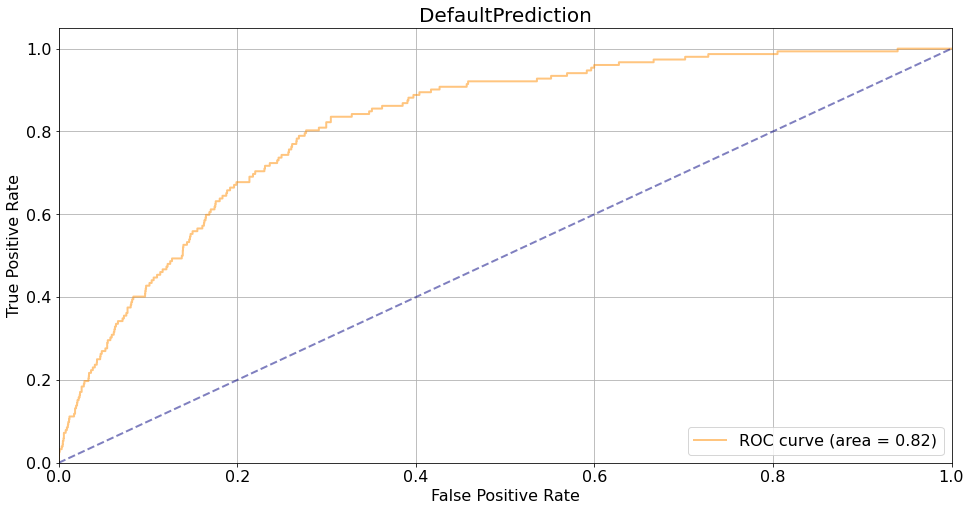

In [49]:
plt.figure(figsize=(16, 8))
lw = 2

plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc, alpha=0.5)

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--', alpha=0.5)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(True)
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('DefaultPrediction', fontsize=20)
plt.legend(loc="lower right", fontsize=16)

### 2) LightGBM Evaluation

In [61]:
get_clf_eval(y_test, lgbm_pred, lgbm_pred_prob)

오차 행렬
[[4300  175]
 [ 112   40]]
정확도: 0.9380, 정밀도: 0.1860, 재현율: 0.2632, F1: 0.2180, AUC:0.8159


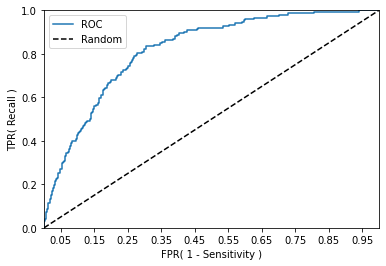

In [62]:
def roc_curve_plot(y_test , pred_proba_c1):
    # 임곗값에 따른 FPR, TPR 값을 반환 받음. 
    fprs , tprs , thresholds = roc_curve(y_test ,pred_proba_c1)

    # ROC Curve를 plot 곡선으로 그림. 
    plt.plot(fprs , tprs, label='ROC')
    # 가운데 대각선 직선을 그림. 
    plt.plot([0, 1], [0, 1], 'k--', label='Random')
    
    # FPR X 축의 Scale을 0.1 단위로 변경, X,Y 축명 설정등   
    start, end = plt.xlim()
    plt.xticks(np.round(np.arange(start, end, 0.1),2))
    plt.xlim(0,1); plt.ylim(0,1)
    plt.xlabel('FPR( 1 - Sensitivity )'); plt.ylabel('TPR( Recall )')
    plt.legend()
    plt.show()
    
roc_curve_plot(y_test, best_model.predict_proba(X_test)[:, 1] )

## 6. Model Save

In [50]:
# save model
filename = 'CATBOOST_MODEL.pkl'
joblib.dump(best_catboost_model, filename)

['CATBOOST_MODEL.pkl']

In [71]:
# reload model
best_catboost_model = joblib.load('CATBOOST_MODEL.pkl') 

In [63]:
# save model
filename = 'LGBM_MODEL.pkl'
joblib.dump(best_lgbm_model, filename)

['LGBM_MODEL.pkl']

In [72]:
# reload model
best_lgbm_model = joblib.load('LGBM_MODEL.pkl') 

## 7. Feature importance

### 1) Catboost Feature importance

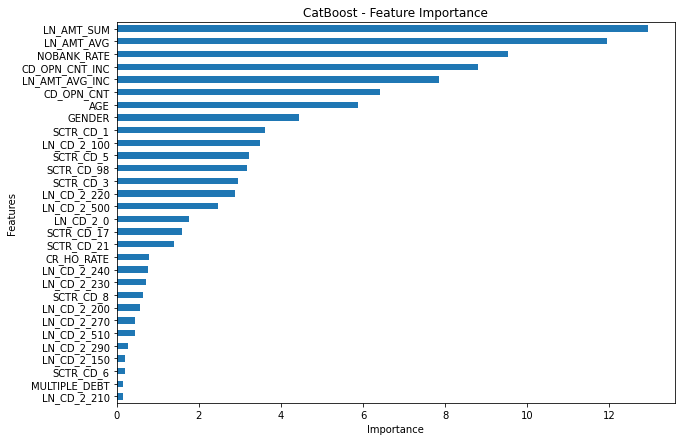

In [65]:
fea_imp = pd.DataFrame({'imp': best_catboost_model.feature_importances_, 'col': X.columns})
fea_imp = fea_imp.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-30:]
fea_imp.plot(kind='barh', x='col', y='imp', figsize=(10, 7), legend=None)
plt.title('CatBoost - Feature Importance')
plt.ylabel('Features')
plt.xlabel('Importance');

### 2) LightGBM Feature importance

<AxesSubplot:title={'center':'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

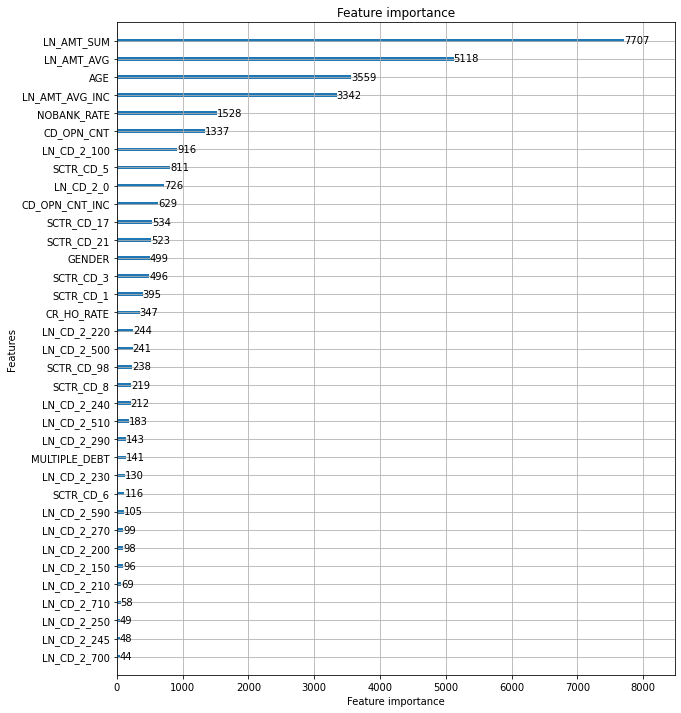

In [66]:
fig, ax = plt.subplots(figsize=(10, 12))
plot_importance(best_lgbm_model, ax=ax)

## 8. Shap for Catboost Model

In [73]:
shap.initjs()
explainer = shap.TreeExplainer(best_catboost_model)

In [74]:
shap_values = explainer.shap_values(X_test)

In [75]:
shap_values
shap_values_df = pd.DataFrame(shap_values)
shap_values_df

,0,1,2,3,4,5,6,7,8,9,...,37,38,39,40,41,42,43,44,45,46
0,-1.432937,-1.995696,-2.339698,-1.222519,-0.655180,0.026346,-0.731696,0.028154,0.000259,0.066049,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.587169,0.610280,-5.300883,4.952456,0.857611,0.094812,-0.496548,0.023491,0.000185,0.063592,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.418124,0.345668,-0.830936,1.657994,1.123324,-0.004331,-0.110704,0.018868,0.000074,0.035558,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.470876,0.381562,-4.080429,2.505210,-2.251387,-0.965762,0.062530,0.031183,0.000131,0.046905,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.567319,0.444966,0.327047,-3.793201,-0.641105,0.139554,-0.110788,0.022259,0.000176,0.049620,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4622,-0.952147,-0.420656,0.368877,-0.380277,-0.322095,0.074759,0.144121,-0.526216,0.000226,0.042584,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4623,-1.855246,0.359291,-6.525854,1.843464,-0.530701,0.061745,-0.977944,0.030017,0.000131,0.042728,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4624,0.507590,-1.067468,-1.375342,0.156557,-2.899339,-0.172355,0.243273,0.022813,0.000216,0.055400,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4625,0.740436,-0.707222,1.972643,-5.259014,-1.998602,-0.200991,-0.156170,0.017725,0.000200,0.041345,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


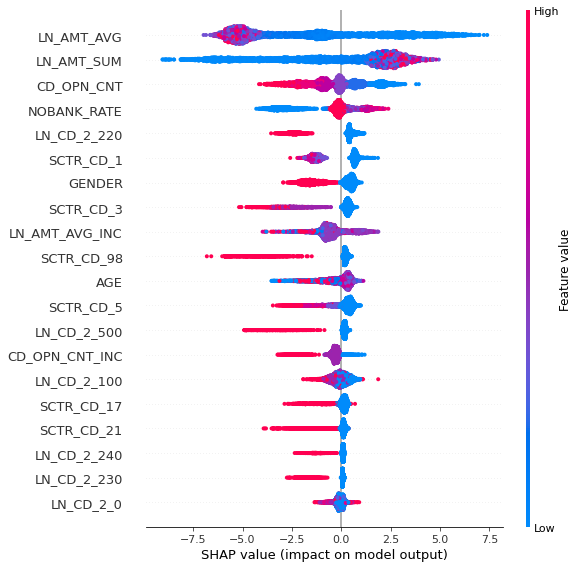

In [76]:
shap.initjs()
shap.summary_plot(shap_values, X_test)

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


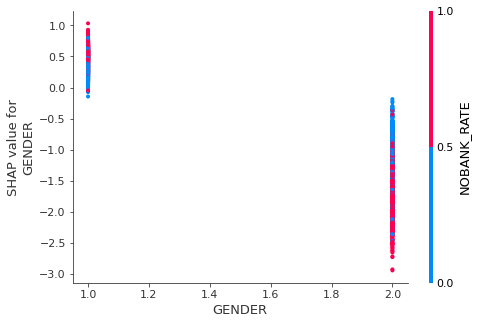

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


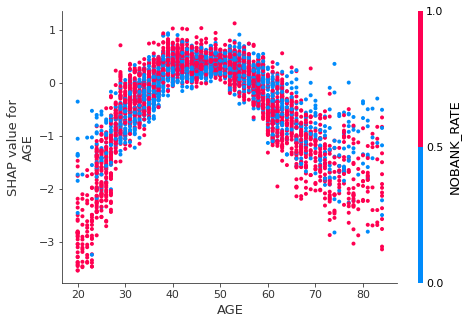

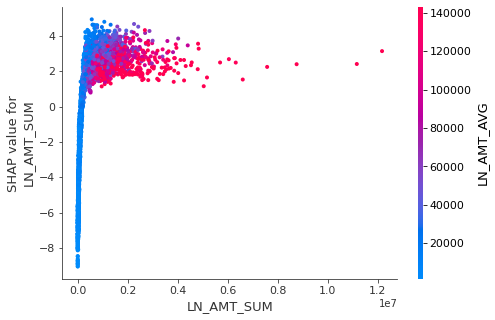

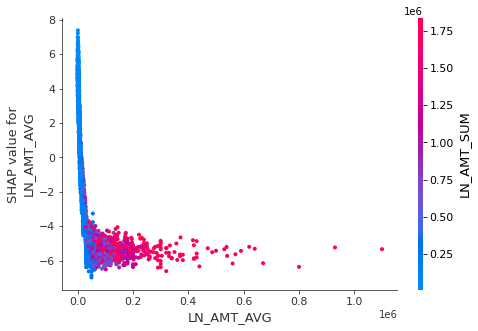

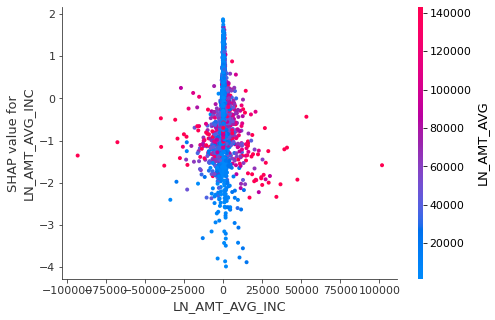

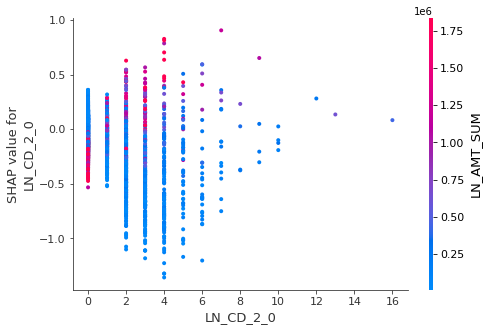

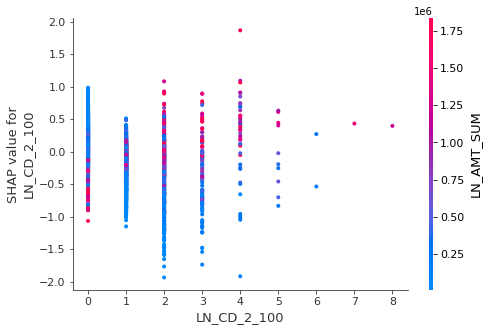

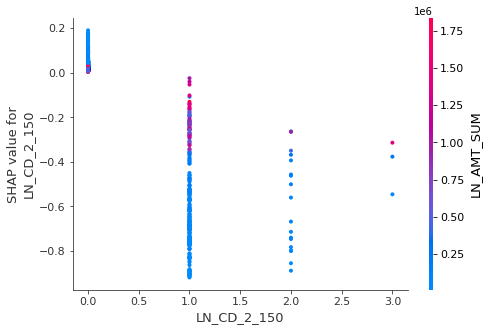

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


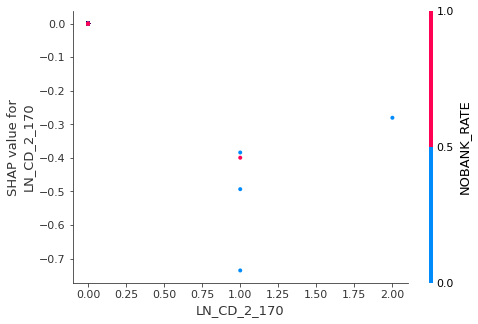

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


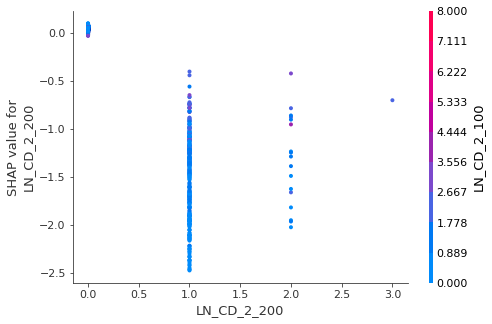

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


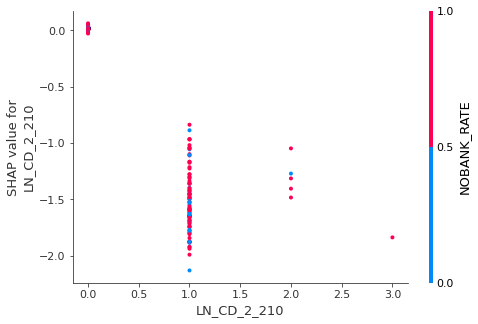

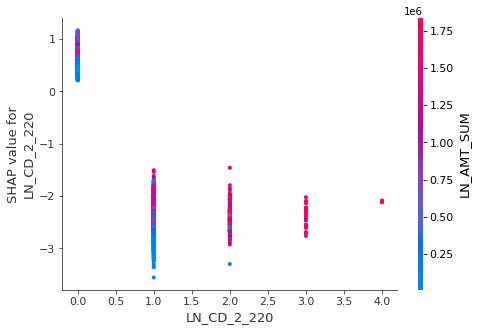

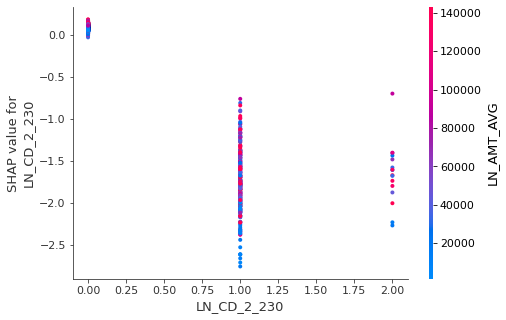

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


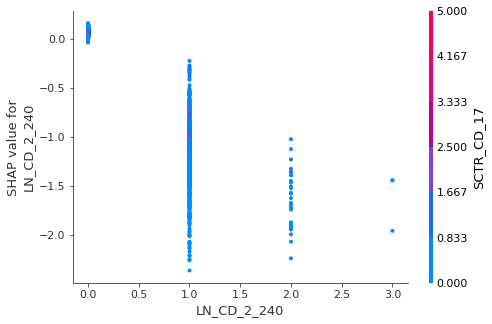

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


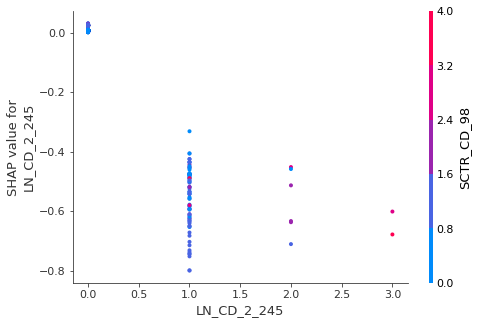

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


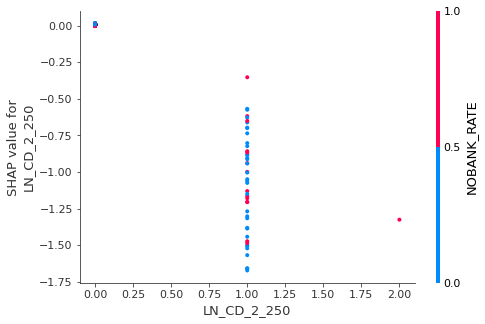

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


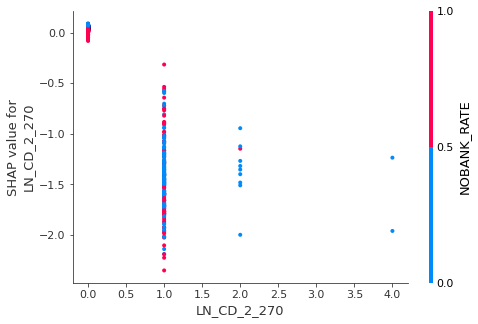

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


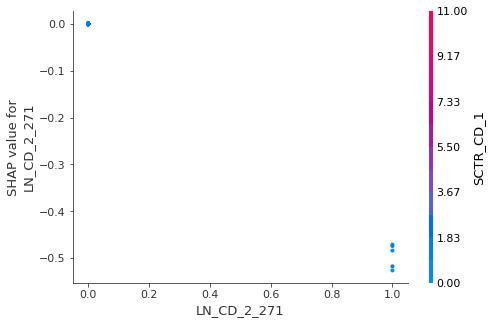

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


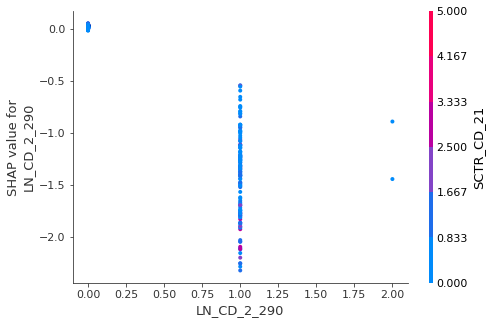

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


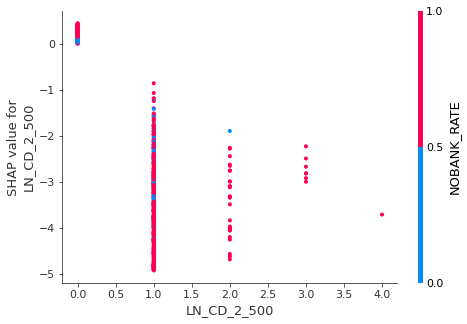

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


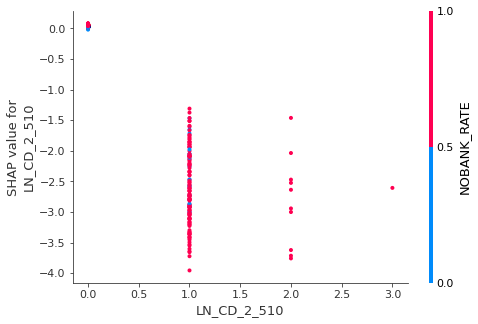

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


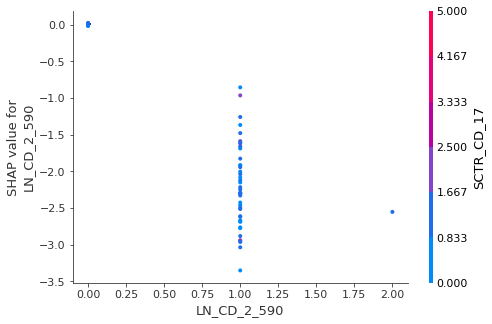

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


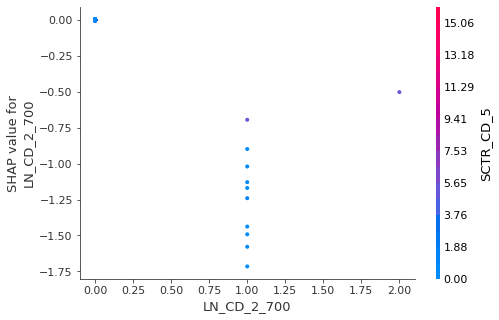

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


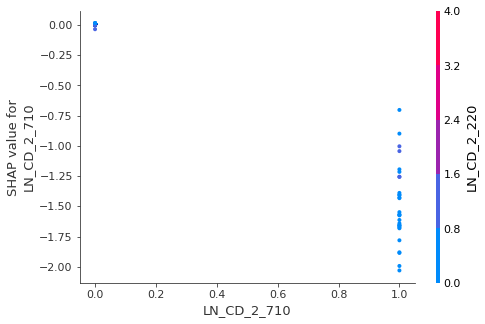

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


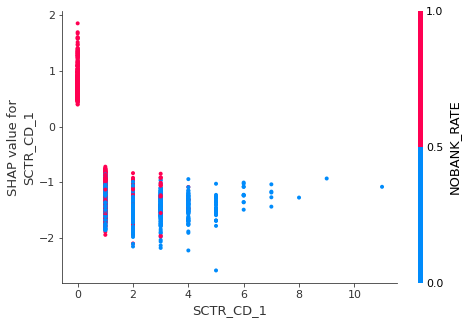

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


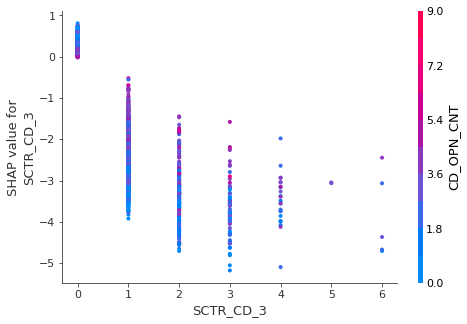

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


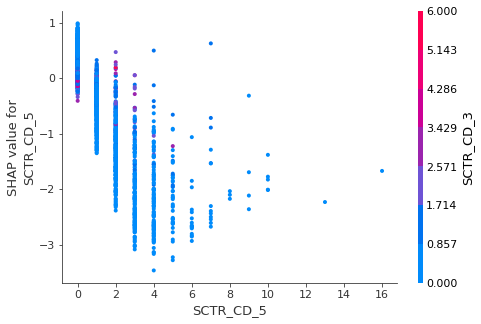

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


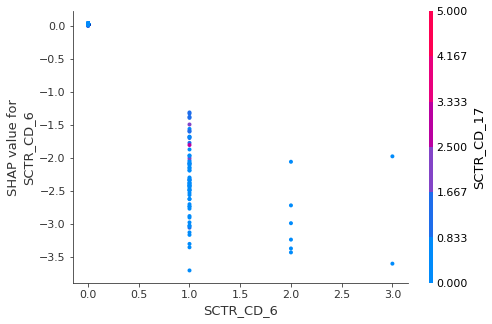

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


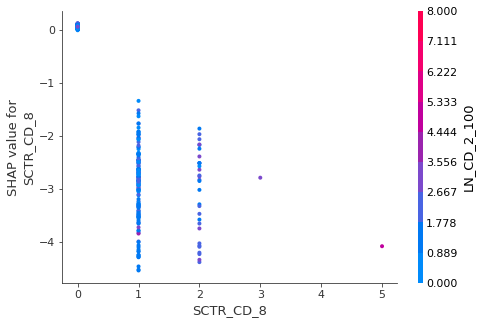

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


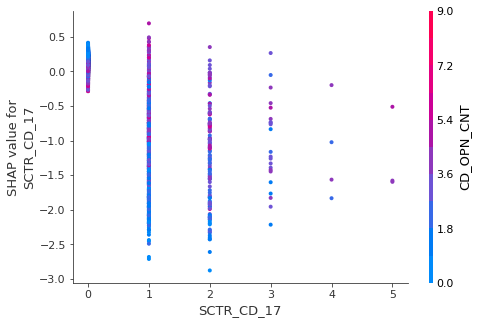

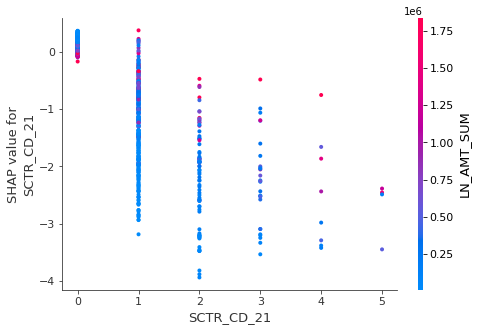

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


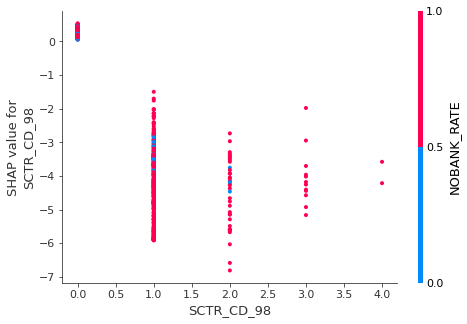

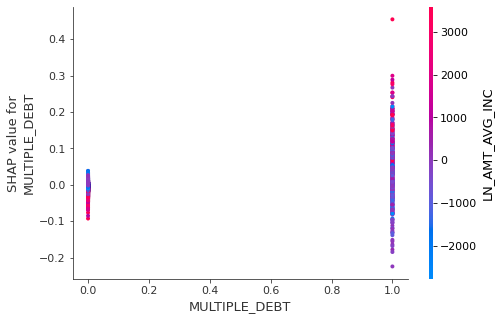

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


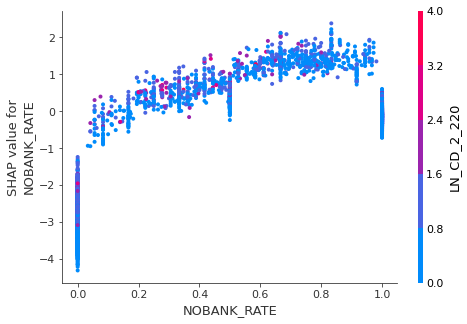

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


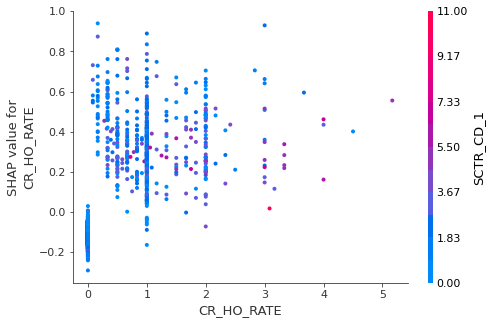

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


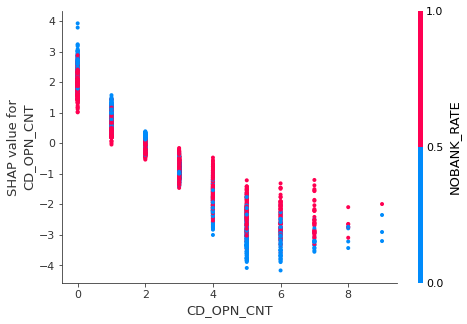

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


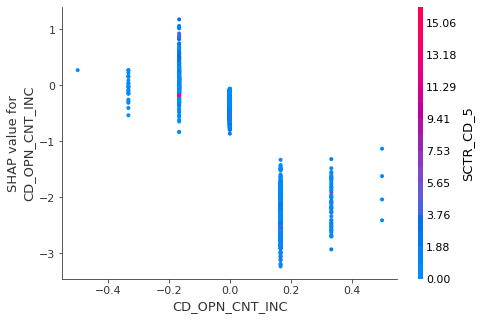

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


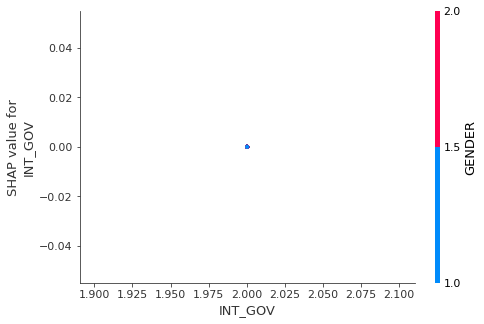

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


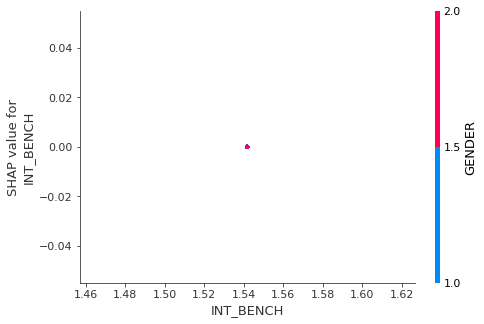

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


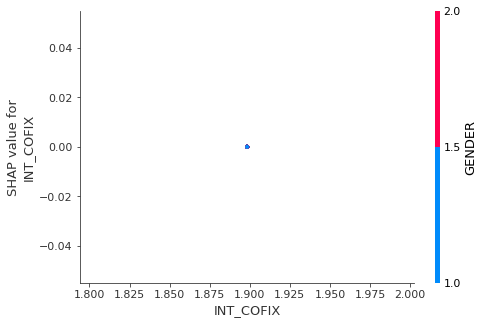

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


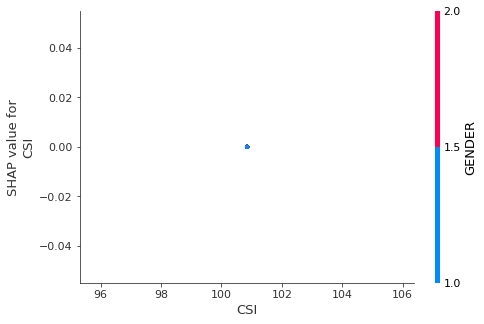

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


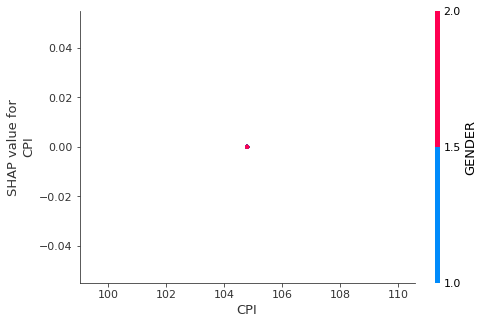

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


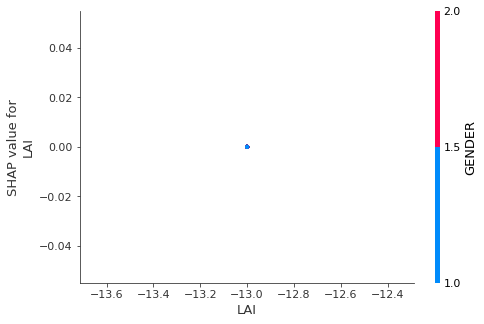

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


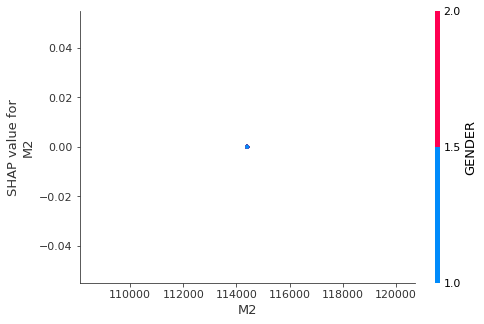

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


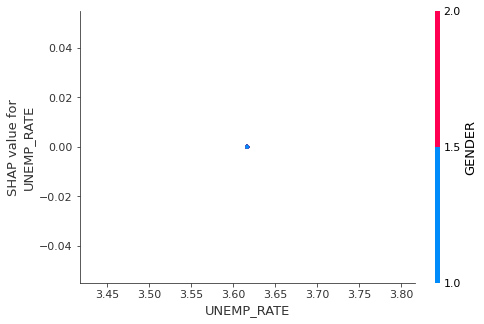

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


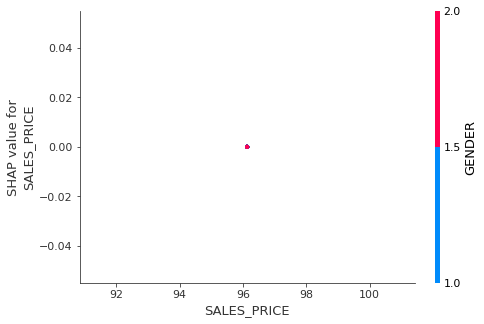

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


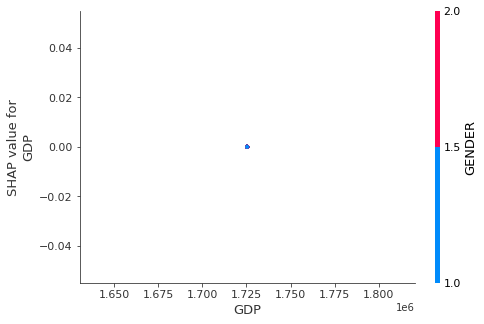

In [80]:
shap.initjs()
feat = X_train_over.columns
for i in feat:
    shap.dependence_plot(i, shap_values, X_test)

In [78]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], X_test.iloc[0,:])

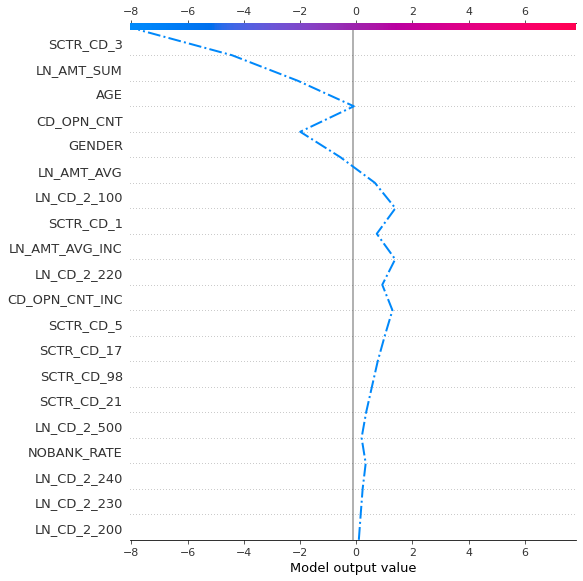

In [79]:
shap.decision_plot(explainer.expected_value, shap_values[0], feat, highlight=0)